<a href="https://colab.research.google.com/github/stephenadhi/nn-mpc/blob/main/RL_simulation/RL_changemass_pen5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries

In [ ]:
import sys
sys.executable
import os
import matplotlib as mpl
import matplotlib.pyplot as plt
import random
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import keras
from pandas import DataFrame
from pandas import read_csv
import math
from numpy import savetxt
from keras import layers
from tensorflow.keras.layers import Input, LSTM, Dense, Reshape, Dropout
from tensorflow.keras.models import Model, Sequential
from scipy.integrate import odeint, RK45
from tensorflow.keras.utils import plot_model
import timeit
from functools import partial
tf.keras.backend.set_floatx('float64')
tf.keras.backend.clear_session()
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)

1 Physical GPUs, 1 Logical GPUs


## Mass-Spring-System

In [ ]:
# Use ODEINT to solve the differential equations defined by the vector field
from scipy.integrate import odeint

def vectorfield(w, t, p):
    """
    Defines the differential equations for the coupled spring-mass system.

    Arguments:
        w :  vector of the state variables:
                  w = [x1,y1,x2,y2]
        t :  time
        p :  vector of the parameters:
                  p = [m1,m2,k1,k2,L1,L2,b1,b2]
    """
    x1, v1, x2, v2, x3, v3 = w
    m, k, kp, d, u1, u2, dist = p

    # Create f = (x1',y1',x2',y2'):
    f = [v1,
         (k * ((-2 * x1) + x2) + kp * (-x1 ** 3 + (x2 - x1) ** 3) + d * (v2-2*v1)) / m + u1,
         v2,
         (k * (x1 - (2 * x2) + x3) + kp * ((x3 - x2) ** 3 - (x2 - x1) ** 3) + d * (v1-2*v2+v3)) / m + u2,
         v3,
         (k * (x2 - x3) + kp * ((x2 - x3) ** 3) + d* (v2-v3)) / m + dist]
    return f

In [ ]:
#This data will be overwritten - train_df cannot be zero when running (division by zero), so I just put the data from the beginning#
train_df = pd.read_csv('u1500newage20000_0.001ssim.csv')
val_df= pd.read_csv('u1500validationdatanewage5k_0.001ssim.csv')
test_df = pd.read_csv('u1500testdata5k_0.001ssim.csv')

train_mean = train_df.mean()
train_std = train_df.std()
train_df = (train_df - train_mean) / train_std
val_df = (val_df - train_mean) / train_std
test_df = (test_df - train_mean) / train_std

In [ ]:
batchsize= 16

## Some Functions that might be handy

In [ ]:
class WindowGenerator():
  def __init__(self, input_width, label_width, shift,
               train_df=train_df, val_df=val_df, 
               test_df=test_df,
               label_columns=None):
    # Store the raw data.
    self.train_df = train_df
    self.val_df = val_df
    self.test_df = test_df

    # Work out the label column indices.
    self.label_columns = label_columns
    if label_columns is not None:
      self.label_columns_indices = {name: i for i, name in
                                    enumerate(label_columns)}
    self.column_indices = {name: i for i, name in
                           enumerate(train_df.columns)}

    # Work out the window parameters.
    self.input_width = input_width
    self.label_width = label_width
    self.shift = shift

    self.total_window_size = input_width + shift

    self.input_slice = slice(0, input_width)
    self.input_indices = np.arange(self.total_window_size)[self.input_slice]

    self.label_start = self.total_window_size - self.label_width
    self.labels_slice = slice(self.label_start, None)
    self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

  def __repr__(self):
    return '\n'.join([
        f'Total window size: {self.total_window_size}',
        f'Input indices: {self.input_indices}',
        f'Label indices: {self.label_indices}',
        f'Label column name(s): {self.label_columns}'])

In [ ]:
def split_window(self, features):
  inputs = features[:, self.input_slice, :]
  labels = features[:, self.labels_slice, :]
  if self.label_columns is not None:
    labels = tf.stack(
        [labels[:, :, self.column_indices[name]] for name in self.label_columns],
        axis=-1)

  # Slicing doesn't preserve static shape information, so set the shapes
  # manually. This way the `tf.data.Datasets` are easier to inspect.
  inputs.set_shape([None, self.input_width, None])
  labels.set_shape([None, self.label_width, None])

  return inputs, labels

WindowGenerator.split_window = split_window

In [ ]:
def plot(self, plot_col, model=None, max_subplots=1):
  inputs, labels = self.example
  plt.figure(figsize=(12, 8))
  plot_col_index = self.column_indices[plot_col]
  max_n = min(max_subplots, len(inputs))
  for n in range(max_n):
    plt.subplot(3, 1, n+1)
    plt.ylabel(f'{plot_col} [normed]')
    plt.plot(self.input_indices, inputs[n, :, plot_col_index],
             label='Inputs', marker='.', zorder=-10)

    if self.label_columns:
      label_col_index = self.label_columns_indices.get(plot_col, None)
    else:
      label_col_index = plot_col_index

    if label_col_index is None:
      continue

    plt.scatter(self.label_indices, labels[n, :, label_col_index],
                edgecolors='k', label='Labels', c='#2ca02c', s=64)
    if model is not None:
      predictions = model(inputs)
      plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                  marker='X', edgecolors='k', label='Predictions',
                  c='#ff7f0e', s=64)

    if n == 0:
      plt.legend()

  plt.xlabel('Timestep ')

WindowGenerator.plot = plot

In [ ]:
def make_dataset(self, data):
  data = np.array(data, dtype=np.float64)
  ds = tf.keras.preprocessing.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=1,
      shuffle=False,
      batch_size=batchsize,)
  ds = ds.map(self.split_window)
  return ds

WindowGenerator.make_dataset = make_dataset

In [ ]:
@property
def train(self):
  return self.make_dataset(self.train_df)

@property
def val(self):
  return self.make_dataset(self.val_df)

@property
def test(self):
  return self.make_dataset(self.test_df)

@property
def example(self):
  """Get and cache an example batch of `inputs, labels` for plotting."""
  result = getattr(self, '_example', None)
  if result is None:
    # No example batch was found, so get one from the `.train` dataset
    result = next(iter(self.train))
    # And cache it for next time
    self._example = result
  return result

WindowGenerator.train = train
WindowGenerator.val = val
WindowGenerator.test = test
WindowGenerator.example = example

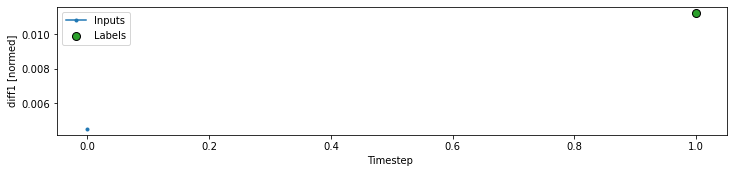

In [ ]:
OUT_STEPS = 1
multi_window = WindowGenerator(input_width=1,
                               label_width=OUT_STEPS,
                               shift=OUT_STEPS,
                              label_columns= ['diff1','diff3']
                              )

multi_window.plot('diff1')

In [ ]:
for example_inputs, example_labels in multi_window.train.take(1):
  print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
  print(f'Labels shape (batch, time, features): {example_labels.shape}')
multi_window.train

Inputs shape (batch, time, features): (16, 1, 9)
Labels shape (batch, time, features): (16, 1, 2)


<MapDataset shapes: ((None, 1, 9), (None, 1, 2)), types: (tf.float64, tf.float64)>

In [ ]:
def standardize(modelinput):
    modelinput = (modelinput -train_mean) / train_std
    return modelinput

def destandardize(modeloutput):
    modeloutput = (modeloutput * train_std) + train_mean
    return modeloutput

def denormalize(outputs):
    outputs = outputs * diffstd + diffmean
    return outputs

# Define NN Model

In [ ]:
MAX_EPOCHS = 100
def compile(model, lr=0.001):
      model.compile(loss=tf.losses.MeanSquaredError(),
                optimizer=tf.optimizers.Adam(learning_rate=lr),
                metrics=[tf.metrics.MeanSquaredError()],
                   experimental_steps_per_execution=10

                    )
        
def scheduler(epoch, lr):
    if epoch > 100:
        return lr * tf.math.exp(-0.01)
    else: return lr

def fit(model, window, patience=150):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')
  callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
  history = model.fit(window.train, epochs=MAX_EPOCHS,
                     validation_data=window.val,
                  #    callbacks=[early_stopping,
                   #  callback
                         #       ]
                     )
  return history

multi_val_performance = {}
multi_performance = {}
num_label=2

In [ ]:
hiddennodes=40

In [ ]:
from functools import partial
multi_resdense_model = tf.keras.Sequential([
    # Take the last time step.
    # Shape [batch, time, features] => [batch, 1, features]
    tf.keras.layers.Lambda(lambda x: x[:, -1:, :]),
    # Shape => [batch, 1, dense_units]
  tf.keras.layers.Dense(hiddennodes, activation=partial(tf.nn.leaky_relu, alpha=0.5)),
    tf.keras.layers.Dense(OUT_STEPS*num_label,
                         kernel_initializer=tf.initializers.zeros
                         ),
])
compile(multi_resdense_model)

In [ ]:
#train_mean = np.zeros((1,9))
#train_std = np.array(([[867, 288, 867, 1.3, 2.6, 0.06, 0.08,0.03, 0.04]]))
#train_std

# **Validation Algorithm**

In [ ]:
np.random.seed(28)

#compile pre-defined Neural Network Model
compile(multi_resdense_model)

#Simulation Parameters
reptrain= 16
currepoch=0
epsilon= 20000 
start_sim= 2*epsilon 
num_sim= int(start_sim + 600)
savepred= np.zeros((num_sim, 2))
horizon= 10
chor= int(horizon / 2)
num_randactions=300
maxdeltau= 1000
maxact= 1000
minact= -maxact

#Set initial conditions
hist= np.zeros((1,9))
prevv= 0
prev= 0
value1=0
values11=0
value3=0
value33=0
w0= [0, 0, 0, 0, 0, 0]
temp= hist[-1:]
histo= np.zeros((1,9))
bestpred= np.zeros((horizon,2))
savecost=np.zeros((num_sim,1))
savew0=np.zeros((num_sim,6))

#Reference Values
ref = np.ones((horizon,2))
ref[:,1]*=2

# Masses:
m = 0.5 
mdec= 0.49
# Spring constants
kp = 63.5
k = 217.0
#Damper constant
d= 0.25
# ODE solver parameters
abserr = 1.0e-8
relerr = 1.0e-6
scale=1
interval= 0.001
stoptime = interval*2

action_sequence= pd.read_csv('action_sequence.csv')

#Start Simulation
start_time = timeit.default_timer()
for run in range(num_sim):
    noise=np.random.randn(1,1)
    print("\n",run,"\n")
    minJ=10000
    disturb = 1 * (np.random.rand(1,1)-0.5)
    histo[:]= temp[:]
    bestaction= np.zeros((1,2))
    
    #Collect Training Data 
    if run < start_sim:
        prevaction= [histo[-1,0], histo[-1,2]]
        action= np.ones((1,2)) * prevaction
        bestaction[0,0]= action_sequence.iloc[run,0]
        bestaction[0,1]= action_sequence.iloc[run,2]
            
    #Recalculate Training Data Mean and Standard Deviation every episode
    if (run+1) % epsilon == 0:
        train_data= pd.DataFrame(data=hist[-epsilon:],columns =["u1","dist.","u2","x1","x3","diff21","diff23","diff1","diff3"]) 
        train_mean= train_data.mean()
        train_std= train_data.std()
        print("Recalculating arithmetic mean and standard deviation of training data..... \n")
        print("Train Mean: \n", train_mean, "\n")
        print("Train Std.: \n", train_std, "\n")
        train_mean= train_mean.values
        train_std= train_std.values
        diffstd = train_std[-2:]
        diffmean = train_mean[-2:]
    if(run+1) == 22000:
        m=0.98*m
    #Start Control once pretraining finished
    if run > start_sim: 
        if (run+1) == (num_sim - start_sim)/2:
            ref= np.zeros((horizon,2))
        if (run+1) == (num_sim - 300):
            ref= np.zeros((horizon,2))
        for jj in range (num_randactions): 
            prevaction= [histo[-1,0], histo[-1,2]]
            action= np.ones((horizon,2)) * prevaction
            for plan in range(chor):
                actii= maxdeltau*2*(np.random.rand(1,2)-0.5)
                action[plan:] += actii
                
                if action[plan,0] > maxact:
                    action[plan:,0] = maxact
                if action[plan,0] < minact:
                    action[plan:,0] = minact
                if action[plan,1] > maxact:
                    action[plan:,1] = maxact
                if action[plan,1] < minact:
                    action[plan:,1] = minact

            prednorm = np.zeros((horizon,2))
            predstate = np.zeros((horizon,2))  
            histo[-1,1] = disturb
            for kk in range(horizon):
                histo[-1,0] = action[kk,0]
                histo[-1,2] = action[kk,1]
                curr = histo[-1,3:5] 
                historstd=standardize(histo)
                prednorm[kk,:]=denormalize(multi_resdense_model(np.array([historstd]))[0])
                predstate[kk,:]= curr + prednorm[kk,:]
                histo[-1,3:5]= predstate[kk,:] 
                histo[-1,5:7]= histo[-1,-2:] + prednorm[kk,:]
                histo[-1,-2:]= prednorm[kk,:]
            histo[:]= temp[:]
            predJ= np.sum((predstate - ref) ** 2) 

            predJ+= 5*((predstate[horizon-1,0] - predstate[0,0])**2) 
            predJ+= 5*((predstate[horizon-1,1] - predstate[0,1])**2) 

            if predJ < minJ:
                bestaction = action
                minJ = predJ
                bestpred= predstate
        savepred= bestpred[0,:]
        print("bestpred: \n", bestpred)
        print("\nmin cost over horizon: ", minJ)
        print("best Actions [N]: ",bestaction[0,:])
    
    #Simulate system for dt = 0.001s
    for ts in range(1):
        prevv = prev
        t = np.array([stoptime * float(ts), stoptime * float(ts+1)])
        #dist= 200 * (np.random.rand(1,1)-0.5
        dist=noise
        p = [m, k, kp, d, bestaction[0,0]+noise,dist, bestaction[0,1]+noise]
        # Call the ODE solver.
        wsol1 = odeint(vectorfield, w0, t, args=(p,),atol=abserr, rtol=relerr)
        wsol1 = wsol1.flatten()
        prev = np.array([[wsol1[0],wsol1[4]]])
        value11=value1
        value33=value3
        value1= wsol1[0]
        value3= wsol1[4]
        w0 = wsol1[6:]
        #current cost
        currentcost = (w0[0] - 1)**2 + (w0[4] - 2)**2
        if run > 40300:
            currentcost = (w0[0] - 0)**2 + (w0[4] - 0)**2        
        savecost[run]= currentcost
        print("current cost: ",currentcost, "\n")
        print("Applied Actions [N]: ",bestaction[0,:], "\n")
        wstate= np.array([w0[0],w0[4]])
        diff1= w0[0] - value1
        diff3= w0[4] - value3
        diff21= w0[0] - value11
        diff23= w0[4] - value33
        diff= [[diff1, diff3]]
        diff2= [[diff21, diff23]]
        new = np.hstack((np.array([[bestaction[0,0]]]),dist,np.array([[bestaction[0,1]]]),[wstate],diff2,diff))  
        hist = np.vstack((hist, new))
        print(pd.DataFrame(data=np.array([w0]),columns =["x1", "v1", "x2", "v2", "x3", "v3"]) )
        savew0[run]= np.array([w0])

        #Train Network every reptrain
        
        if (run+1) % (reptrain) == 0 and run > epsilon:
            #DO one epoch
            print(run)
            history=pd.DataFrame(data=hist[-reptrain:],columns =["u1","dist.","u2","x1","x3","diff21","diff23","diff1","diff3"])    
            train_df= history[:int(1*reptrain)]
            val_df= history[int(0.8*reptrain):int(1*reptrain)]
            test_df= history[int(0.8*reptrain):int(1*reptrain)]
            train_df = (train_df - train_mean) / train_std
            val_df = (val_df - train_mean) / train_std
            test_df = (test_df - train_mean) / train_std
            multi_window = WindowGenerator(input_width=1,
                               label_width=OUT_STEPS,
                               shift=OUT_STEPS, train_df=train_df, val_df=val_df, test_df=test_df,
                              label_columns= ['diff1','diff3']
                              )
            WindowGenerator.train = train
            WindowGenerator.val = val
            WindowGenerator.test = test
            WindowGenerator.example = example
            WindowGenerator.split_window = split_window
            WindowGenerator.make_dataset = make_dataset
            history=multi_resdense_model.fit(multi_window.train, epochs=1,
                                             #validation_data=multi_window.val
                                            )
            currepoch+=1
            print("current epoch: ", currepoch)
    temp= hist[-1,:]
    #print("temp: ",temp, "\n")    
elapsed = timeit.default_timer() - start_time 
print(elapsed)
print(m)
thisishistory=pd.DataFrame(data=hist,columns =["u1","dist.","u2","x1", "x3","diff21","diff23","diff1","diff3"])


 0 

current cost:  4.999994644922754 

Applied Actions [N]:  [0. 0.] 

             x1        v1            x2        v2            x3        v3
0  8.922064e-07  0.000892  8.926664e-07  0.000893  8.926665e-07  0.000893

 1 

current cost:  4.998559282931738 

Applied Actions [N]:  [229.01374229  61.23960233] 

         x1       v1        x2        v2        x3        v3
0  0.000464  0.46153  0.000006  0.004688  0.000128  0.126614

 2 

current cost:  4.9931352775028905 

Applied Actions [N]:  [500.          72.23258398] 

         x1        v1        x2        v2        x3        v3
0  0.002384  1.457561  0.000018  0.007289  0.000526  0.270751

 3 

current cost:  4.98103700519774 

Applied Actions [N]:  [182.69335842 425.74545923] 

         x1        v1        x2        v2        x3        v3
0  0.005658  1.815862  0.000041  0.016957  0.001921  1.123671

 4 

current cost:  4.961115412542625 

Applied Actions [N]:  [ 78.11619825 436.41519398] 

         x1        v1        x2      

0 -0.384652 -10.560618  0.319311 -2.742812  0.360928  11.144083

 63 

current cost:  4.583789161778007 

Applied Actions [N]:  [ 58.21517051 500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.404579 -9.360844  0.313171 -3.395506  0.384157  12.080198

 64 

current cost:  4.55501479990107 

Applied Actions [N]:  [ 21.93831329 189.16675089] 

         x1       v1        x2        v2        x3         v3
0 -0.422145 -8.20073  0.305741 -4.031124  0.408611  12.368831

 65 

current cost:  4.520653113853999 

Applied Actions [N]:  [ 197.75301197 -141.75135247] 

         x1        v1       x2        v2        x3         v3
0 -0.437015 -6.665717  0.29706 -4.646299  0.432951  11.966325

 66 

current cost:  4.4819892798739405 

Applied Actions [N]:  [ 134.68172966 -154.45873504] 

         x1        v1        x2        v2        x3        v3
0 -0.448925 -5.242435  0.287173 -5.235924  0.456431  11.50815

 67 

current cost:  4.434660840860932 

Applied Actions 

         x1        v1        x2        v2        x3         v3
0  0.030126  4.983385  0.894277  7.528698  0.546791 -16.046267

 126 

current cost:  3.12321787899641 

Applied Actions [N]:  [ 65.69684764 225.66066272] 

         x1        v1        x2        v2      x3         v3
0  0.041107  5.995837  0.908066  6.253118  0.5155 -15.238606

 127 

current cost:  3.189917697487445 

Applied Actions [N]:  [  57.86112677 -197.33209207] 

         x1        v1        x2        v2       x3         v3
0  0.054086  6.981118  0.919265  4.939653  0.48502 -15.234549

 128 

current cost:  3.2560894636573483 

Applied Actions [N]:  [-271.33441316 -174.92674466] 

         x1        v1        x2        v2        x3         v3
0  0.068364  7.293116  0.927809  3.599556  0.454638 -15.141029

 129 

current cost:  3.3215449760230165 

Applied Actions [N]:  [-500.          147.04020149] 

        x1       v1        x2        v2        x3         v3
0  0.08278  7.11775  0.933641  2.228723  0.425119 -14.

         x1         v1        x2        v2        x3        v3
0 -0.355024 -24.018127  0.010512  7.846506  0.963944 -7.614922

 183 

current cost:  3.078620274484628 

Applied Actions [N]:  [-500.         -468.03673079] 

        x1         v1        x2       v2        x3        v3
0 -0.40332 -24.259408  0.026835  8.45664  0.946761 -9.558755

 184 

current cost:  3.2613465858609225 

Applied Actions [N]:  [-500.         -253.12776302] 

         x1         v1        x2        v2        x3        v3
0 -0.451983 -24.383342  0.044259  8.945836  0.926178 -11.01405

 185 

current cost:  3.4573698378728843 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -0.500773 -24.386007  0.062531  9.304047  0.902252 -12.902111

 186 

current cost:  3.6629774068584906 

Applied Actions [N]:  [ -59.18456504 -153.30372119] 

         x1         v1        x2        v2        x3         v3
0 -0.548561 -23.381498  0.081383  9.524728  0.875306 -14.03

0  0.709169 -9.511108  0.019938  14.130675  0.000588 -1.834835

 247 

current cost:  4.113617788578396 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3        v3
0  0.687824 -11.818406  0.048796  14.711104 -0.004037 -2.785137

 248 

current cost:  4.15645506977575 

Applied Actions [N]:  [-451.83807327 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.662053 -13.935898  0.078715  15.191582 -0.010534 -3.706401

 249 

current cost:  4.2102335936539985 

Applied Actions [N]:  [  17.61015045 -487.48749941] 

         x1         v1        x2         v2        x3        v3
0  0.633088 -15.011761  0.109495  15.571209 -0.018814 -4.567529

 250 

current cost:  4.272236296171338 

Applied Actions [N]:  [   3.82463572 -230.02583992] 

         x1         v1        x2         v2        x3       v3
0  0.602045 -16.013988  0.140929  15.845167 -0.028267 -4.87976

 251 

current cost:  4.338883926785976 

Applied Acti

 311 

current cost:  7.562695973356899 

Applied Actions [N]:  [133.95323487 404.76641814] 

         x1         v1        x2         v2        x3         v3
0  0.381008  11.416506 -0.728753 -14.265126 -0.679467 -16.295482

 312 

current cost:  7.710820446784107 

Applied Actions [N]:  [203.81249109 151.06159842] 

         x1         v1        x2         v2        x3         v3
0  0.402519  10.076868 -0.755879 -12.847578 -0.711796 -16.032232

 313 

current cost:  7.859595103415382 

Applied Actions [N]:  [233.43412427 384.9705605 ] 

         x1        v1        x2         v2        x3         v3
0  0.421309  8.697268 -0.780088 -11.349506 -0.743121 -15.291642

 314 

current cost:  8.01064439474395 

Applied Actions [N]:  [500.         -87.60834737] 

         x1        v1        x2        v2        x3         v3
0  0.437776  7.754966 -0.801235 -9.786394 -0.773905 -15.490792

 315 

current cost:  8.169121503234873 

Applied Actions [N]:  [ 500.         -147.57773675] 

         x1

         x1        v1       x2         v2        x3         v3
0 -1.276056  2.398232 -1.53254 -24.988525 -1.216807  15.156316

 372 

current cost:  15.314722489654333 

Applied Actions [N]:  [   7.28653521 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.269888  3.758693 -1.581899 -24.349368 -1.187841  13.797157

 373 

current cost:  15.106649204103938 

Applied Actions [N]:  [ 218.89042172 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.260645  5.471537 -1.629852 -23.582478 -1.161666  12.365541

 374 

current cost:  14.902046837384077 

Applied Actions [N]:  [ 270.64064569 -424.6183972 ] 

         x1        v1        x2         v2        x3         v3
0 -1.247951  7.208114 -1.676141 -22.683843 -1.138274  11.014632

 375 

current cost:  14.703606674909818 

Applied Actions [N]:  [  92.39520842 -500.        ] 

         x1        v1        x2        v2       x3       v3
0 -1.232234  8.492529 -1.720505 -21.65

current cost:  7.06261130307781 

Applied Actions [N]:  [ 21.84146738 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.266436  14.948974  0.123923 -4.534814 -0.336397  41.168813

 441 

current cost:  6.601542127380398 

Applied Actions [N]:  [175.47384956 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.235652  15.822821  0.114188 -5.177727 -0.252711  42.501714

 442 

current cost:  6.141736156575383 

Applied Actions [N]:  [270.0629409  387.83601943] 

         x1         v1        x2        v2        x3         v3
0 -0.203007  16.809985  0.103299 -5.688659 -0.166682  43.511858

 443 

current cost:  5.6910594671117725 

Applied Actions [N]:  [ 31.3499457  -38.95522053] 

         x1         v1        x2        v2        x3         v3
0 -0.168939  17.246329  0.091524 -6.064035 -0.079577  43.577405

 444 

current cost:  5.25477355322634 

Applied Actions [N]:  [ 463.60616757 -147.13090923] 

         x1         


 506 

current cost:  0.16653366594809985 

Applied Actions [N]:  [  51.57887219 -341.6263497 ] 

         x1        v1        x2         v2        x3         v3
0  1.043916  5.159228  2.541484 -10.847873  1.594285  17.363619

 507 

current cost:  0.14067884639051 

Applied Actions [N]:  [ 165.28500284 -469.16633919] 

         x1        v1        x2         v2        x3         v3
0  1.055464  6.368891  2.516702 -13.902714  1.629052  17.388081

 508 

current cost:  0.1174221570565193 

Applied Actions [N]:  [ 266.37963188 -128.78572749] 

         x1        v1        x2         v2        x3         v3
0  1.069509  7.652883  2.486008 -16.756461  1.664455  17.998545

 509 

current cost:  0.09680423134974442 

Applied Actions [N]:  [500.        -59.9886175] 

         x1        v1        x2         v2        x3         v3
0  1.086441  9.252344  2.449821 -19.391874  1.701115  18.645023

 510 

current cost:  0.07941535031326877 

Applied Actions [N]:  [500.         -16.96890491] 

   


         x1      v1        x2         v2        x3         v3
0 -0.237058  0.0085  1.151649 -12.003391  0.805716 -31.059949

 567 

current cost:  3.1001739580830954 

Applied Actions [N]:  [182.46984662 362.75412918] 

         x1        v1        x2         v2        x3         v3
0 -0.234621  2.415547  1.125445 -14.193843  0.744657 -29.993862

 568 

current cost:  3.2346031217498563 

Applied Actions [N]:  [500.         -77.92574676] 

         x1        v1        x2         v2        x3         v3
0 -0.226814  5.374855  1.094913 -16.326686  0.684884 -29.775525

 569 

current cost:  3.363286085509463 

Applied Actions [N]:  [ 358.85223593 -385.66433767] 

         x1        v1        x2         v2        x3        v3
0 -0.213481  7.937609  1.060186 -18.386681  0.624954 -30.14971

 570 

current cost:  3.488090310904629 

Applied Actions [N]:  [141.56578356  60.22258116] 

         x1        v1        x2         v2        x3         v3
0 -0.195583  9.936995  1.021431 -20.351441  0

0 -1.433617 -27.66085 -0.559927 -11.488763 -1.307649  10.736129

 634 

current cost:  16.971286110805707 

Applied Actions [N]:  [-64.8811313 263.828003 ] 

         x1         v1        x2         v2       x3         v3
0 -1.486052 -24.746053 -0.584577 -13.157333 -1.28494  11.962144

 635 

current cost:  17.038183485902053 

Applied Actions [N]:  [-180.24309222  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.532726 -21.904826 -0.612528 -14.786434 -1.259368  13.598778

 636 

current cost:  17.055293945785195 

Applied Actions [N]:  [287.40773789 500.        ] 

         x1         v1       x2        v2        x3         v3
0 -1.572653 -18.003519 -0.64369 -16.36434 -1.230596  15.161642

 637 

current cost:  17.019294008650313 

Applied Actions [N]:  [156.13264618 384.01047084] 

         x1         v1        x2         v2     x3        v3
0 -1.604937 -14.266469 -0.677933 -17.864731 -1.199  16.42167

 638 

current cost:  16.9286078597616 

Appl

Applied Actions [N]:  [-123.11304922 -441.27830149] 

         x1        v1        x2        v2        x3         v3
0  0.068437 -9.389057  0.545462  0.629852 -1.505714  13.450012

 701 

current cost:  12.984338847310848 

Applied Actions [N]:  [ -31.13940278 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.050009 -9.035121  0.542349 -3.722273 -1.475896  16.344619

 702 

current cost:  12.7725146018447 

Applied Actions [N]:  [ 131.74470182 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.032631 -8.339822  0.530674 -7.920597 -1.440452  19.067603

 703 

current cost:  12.52584239454084 

Applied Actions [N]:  [  -3.17891579 -500.        ] 

         x1        v1        x2         v2        x3        v3
0  0.016395 -7.895487  0.510819 -11.894176 -1.399759  21.58655

 704 

current cost:  12.24494861502751 

Applied Actions [N]:  [-457.17691755  -55.05948252] 

         x1        v1        x2         v2       x3   

        x1         v1        x2         v2        x3         v3
0 -0.32173  11.789432  0.157168  24.669187 -0.810562 -30.584304

 764 

current cost:  9.921538161944007 

Applied Actions [N]:  [107.91059401 106.97621674] 

         x1         v1       x2         v2        x3         v3
0 -0.297201  12.738357  0.20486  22.990047 -0.870332 -29.156384

 765 

current cost:  10.190269714772011 

Applied Actions [N]:  [-343.44463859 -347.8923077 ] 

         x1         v1       x2         v2        x3         v3
0 -0.271687  12.775251  0.24899  21.106288 -0.927983 -28.463332

 766 

current cost:  10.456747365032701 

Applied Actions [N]:  [ 139.27536899 -498.20219127] 

         x1         v1        x2         v2        x3         v3
0 -0.245136  13.772794  0.289154  19.024112 -0.984356 -27.878237

 767 

current cost:  10.717812252588374 

Applied Actions [N]:  [ 161.74103552 -500.        ] 

         x1         v1       x2         v2        x3         v3
0 -0.216565  14.795076  0.32495  

         x1         v1        x2        v2        x3        v3
0 -1.377411 -33.363962 -0.557256  8.833684 -0.708626  3.722897

 830 

current cost:  13.260744669316232 

Applied Actions [N]:  [   6.33977938 -500.        ] 

         x1         v1        x2        v2        x3        v3
0 -1.441253 -30.435377 -0.540662  7.739904 -0.702041  2.862702

 831 

current cost:  13.521006894705682 

Applied Actions [N]:  [-134.87131205 -500.        ] 

        x1         v1        x2        v2        x3        v3
0 -1.49926 -27.530558 -0.526372  6.531651 -0.697166  2.014003

 832 

current cost:  13.763577484390243 

Applied Actions [N]:  [-160.2800097  -232.66183886] 

         x1         v1        x2        v2        x3        v3
0 -1.551262 -24.431969 -0.514608  5.214412 -0.693444  1.709115

 833 

current cost:  13.987882448443159 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2        v2        x3        v3
0 -1.597523 -21.79266 -0.505587  3.790431 -0.690866  0.86990

 895 

current cost:  17.54132561485191 

Applied Actions [N]:  [500.         -99.37603129] 

         x1        v1        x2         v2        x3        v3
0  0.346959 -4.742641 -0.408825  13.314001 -2.137011 -6.294913

 896 

current cost:  17.63872982856578 

Applied Actions [N]:  [ 500.         -261.12204571] 

         x1        v1        x2         v2        x3        v3
0  0.337436 -4.772753 -0.384333  11.152884 -2.147257 -3.932569

 897 

current cost:  17.689405225470864 

Applied Actions [N]:  [500.         164.79404279] 

         x1        v1      x2        v2        x3        v3
0  0.327899 -4.756085 -0.3643  8.861951 -2.151829 -0.627462

 898 

current cost:  17.679172219720783 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3        v3
0  0.318442 -4.694676 -0.348939  6.488628 -2.149054  3.408295

 899 

current cost:  17.607611612418992 

Applied Actions [N]:  [500.         153.53540584] 

         x1        v1        x2        v2

         x1        v1        x2         v2        x3        v3
0 -1.367942  8.843034 -0.356725  18.516157  0.408753 -2.049939

 957 

current cost:  8.058153502064872 

Applied Actions [N]:  [-84.02499754 -19.39646229] 

         x1         v1        x2         v2        x3        v3
0 -1.347453  11.641762 -0.320113  18.083296  0.403874 -2.820411

 958 

current cost:  7.963754057696905 

Applied Actions [N]:  [-500.         -490.89676869] 

        x1        v1       x2         v2        x3        v3
0 -1.32223  13.57424 -0.28444  17.577873  0.396565 -4.479124

 959 

current cost:  7.859977748715023 

Applied Actions [N]:  [ -87.78025209 -500.        ] 

         x1         v1       x2         v2        x3     v3
0 -1.292361  16.283847 -0.24984  17.012411  0.385981 -6.096

 960 

current cost:  7.7467155462896775 

Applied Actions [N]:  [-343.0018111 -500.       ] 

         x1         v1        x2         v2        x3        v3
0 -1.257659  18.405357 -0.216432  16.386137  0.372212 -

current cost:  9.003625458404265 

Applied Actions [N]:  [177.66111493 207.64211487] 

         x1         v1        x2         v2        x3         v3
0  0.379068 -40.046683 -0.093522 -10.622408 -0.935655  15.877449

 1020 

current cost:  8.914813150209097 

Applied Actions [N]:  [-157.93023919  500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.297996 -41.002246 -0.115209 -11.061935 -0.902069  17.695469

 1021 

current cost:  8.826893716991437 

Applied Actions [N]:  [-155.06958134  227.26912776] 

         x1        v1        x2        v2       x3         v3
0  0.215157 -41.81306 -0.137756 -11.48182 -0.86547  18.890508

 1022 

current cost:  8.74062326425325 

Applied Actions [N]:  [191.09061463 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.131522 -41.800187 -0.161125 -11.883238 -0.826017  20.549157

 1023 

current cost:  8.655086166729177 

Applied Actions [N]:  [368.49024461 263.22686348] 

         x1 

        x1         v1        x2         v2        x3         v3
0 -0.01476  32.176955 -0.395003  15.189868 -0.514283 -10.452102

 1084 

current cost:  7.327666079480915 

Applied Actions [N]:  [-500.          465.54118495] 

         x1         v1        x2         v2       x3        v3
0  0.048186  30.755525 -0.364395  15.415818 -0.53411 -9.368328

 1085 

current cost:  7.309469369449355 

Applied Actions [N]:  [-500.          188.22938464] 

         x1         v1        x2         v2        x3        v3
0  0.108203  29.248176 -0.333354  15.622041 -0.552287 -8.800466

 1086 

current cost:  7.302593220236586 

Applied Actions [N]:  [-379.41823204 -276.22061109] 

        x1         v1        x2         v2        x3        v3
0  0.16537  27.906415 -0.301918  15.810384 -0.570211 -9.116451

 1087 

current cost:  7.309264722246459 

Applied Actions [N]:  [-492.15728678 -151.44814396] 

         x1         v1        x2         v2       x3        v3
0  0.219558  26.270348 -0.270125  15.

         x1         v1        x2        v2        x3         v3
0 -0.335746 -17.504069  0.567897 -0.775956  1.327587  20.369465

 1142 

current cost:  2.27694213604864 

Applied Actions [N]:  [ -70.82946612 -474.7409047 ] 

         x1         v1        x2        v2        x3         v3
0 -0.369563 -16.300103  0.566149 -0.970875  1.366566  18.600488

 1143 

current cost:  2.317002933164811 

Applied Actions [N]:  [ 388.53481077 -229.97277412] 

         x1         v1       x2        v2        x3         v3
0 -0.399976 -14.100983  0.56402 -1.156421  1.402446  17.271249

 1144 

current cost:  2.353811777437124 

Applied Actions [N]:  [-75.92755662  44.10508192] 

         x1         v1        x2        v2        x3         v3
0 -0.426851 -12.763598  0.561533 -1.328741  1.436166  16.440571

 1145 

current cost:  2.389845783038298 

Applied Actions [N]:  [-500.          435.21048637] 

         x1         v1        x2        v2        x3         v3
0 -0.451839 -12.214555  0.558714 -1.4

current cost:  1.934801293024325 

Applied Actions [N]:  [-299.39355877  257.1578951 ] 

         x1         v1       x2        v2        x3        v3
0  1.056871 -28.407329  1.35913  7.748622  0.610192 -0.957287

 1213 

current cost:  1.9356629390471216 

Applied Actions [N]:  [  38.93901785 -165.24934932] 

         x1         v1        x2        v2        x3        v3
0  0.999306 -29.129625  1.373527  6.633942  0.608719 -0.512127

 1214 

current cost:  1.9382157497440753 

Applied Actions [N]:  [ -2.23277493 297.78362961] 

         x1         v1        x2        v2        x3        v3
0  0.940379 -29.770574  1.385608  5.432589  0.609079  0.874204

 1215 

current cost:  1.9424843269783356 

Applied Actions [N]:  [ 290.89029124 -130.86223219] 

         x1         v1        x2       v2        x3        v3
0  0.880919 -29.662303  1.395205  4.15112  0.611366  1.414167

 1216 

current cost:  1.9523200514902168 

Applied Actions [N]:  [ 224.75799122 -415.61552688] 

       x1        

         x1         v1        x2        v2        x3        v3
0 -0.409511 -11.384326 -0.768635  0.004418 -0.432562 -23.37551

 1279 

current cost:  8.192377050490073 

Applied Actions [N]:  [500.         429.84288152] 

         x1         v1        x2       v2       x3         v3
0 -0.431197 -10.294939 -0.768062  0.55802 -0.47872 -22.775517

 1280 

current cost:  8.47241642325195 

Applied Actions [N]:  [500. 500.] 

        x1        v1        x2        v2       x3         v3
0 -0.45066 -9.161502 -0.766441  1.052504 -0.52349 -21.987672

 1281 

current cost:  8.746714864480293 

Applied Actions [N]:  [500.          55.98501995] 

        x1        v1        x2        v2        x3        v3
0 -0.46782 -7.993151 -0.763894  1.484721 -0.567532 -22.04667

 1282 

current cost:  9.016376929867747 

Applied Actions [N]:  [269.06411234 421.66972621] 

        x1        v1       x2       v2        x3         v3
0 -0.48307 -7.251616 -0.76054  1.85957 -0.610915 -21.330191

 1283 

current co

0 -0.190629  9.709433 -1.008977  6.471358 -0.947129 -3.157946

 1347 

current cost:  10.09710552679703 

Applied Actions [N]:  [ 500.         -254.15775573] 

         x1         v1        x2        v2        x3        v3
0 -0.170914  10.000569 -0.995142  7.361826 -0.953991 -3.701659

 1348 

current cost:  10.099501197170325 

Applied Actions [N]:  [ 185.22816223 -345.02504494] 

         x1        v1        x2        v2        x3        v3
0 -0.151274  9.636031 -0.979542  8.235149 -0.962106 -4.408767

 1349 

current cost:  10.114000001107176 

Applied Actions [N]:  [  70.68672015 -408.20954552] 

         x1        v1        x2        v2        x3        v3
0 -0.132608  9.027245 -0.962212  9.091085 -0.971733 -5.214852

 1350 

current cost:  10.143032753463073 

Applied Actions [N]:  [ -69.9733507  -475.64865144] 

         x1        v1        x2        v2        x3        v3
0 -0.115457  8.122307 -0.943199  9.916879 -0.983084 -6.130904

 1351 

current cost:  10.18368390434639 

A

         x1         v1        x2         v2       x3         v3
0 -0.651594 -12.055725 -0.450797 -11.217509 -0.43899  26.429587

 1404 

current cost:  8.495264887343412 

Applied Actions [N]:  [500.          56.88409226] 

         x1         v1       x2         v2        x3         v3
0 -0.673873 -10.219348 -0.47334 -11.313878 -0.386088  26.461883

 1405 

current cost:  8.308964981128792 

Applied Actions [N]:  [500.         -28.29194487] 

         x1        v1        x2        v2        x3         v3
0 -0.692458 -8.363158 -0.496006 -11.33967 -0.333356  26.258583

 1406 

current cost:  8.117756650814655 

Applied Actions [N]:  [500.          33.37767961] 

         x1        v1        x2         v2        x3         v3
0 -0.707315 -6.492683 -0.518647 -11.288892 -0.280972  26.114673

 1407 

current cost:  7.921722868135645 

Applied Actions [N]:  [349.40507478  92.43788524] 

         x1        v1        x2         v2       x3         v3
0 -0.718732 -4.924052 -0.541114 -11.165123 


 1461 

current cost:  5.737825706947447 

Applied Actions [N]:  [-202.04885482  280.44019203] 

         x1         v1        x2         v2        x3         v3
0 -0.137209  14.203393  0.397718  11.581195 -0.108218 -10.794489

 1462 

current cost:  5.763887007661239 

Applied Actions [N]:  [-433.03431148    7.32690418] 

         x1         v1        x2         v2        x3         v3
0 -0.109073  13.927434  0.419872  10.566705 -0.129283 -10.262927

 1463 

current cost:  5.791698136630488 

Applied Actions [N]:  [-500.         -281.90329278] 

         x1         v1       x2        v2        x3         v3
0 -0.081655  13.485048  0.43996  9.514916 -0.149819 -10.265778

 1464 

current cost:  5.822020925851475 

Applied Actions [N]:  [-500.          -98.87827141] 

         x1         v1        x2       v2        x3        v3
0 -0.055151  13.012867  0.457912  8.43133 -0.169948 -9.856753

 1465 

current cost:  5.8542805436725525 

Applied Actions [N]:  [-500.         -268.08921891] 


        x1         v1        x2         v2       x3        v3
0 -0.24265 -15.763611 -0.244216  10.432562  0.20654 -5.813067

 1529 

current cost:  4.882644282099543 

Applied Actions [N]:  [-500.          340.41262614] 

         x1         v1        x2        v2        x3        v3
0 -0.274898 -16.471067 -0.223005  10.76493  0.195206 -5.514903

 1530 

current cost:  5.006989374174809 

Applied Actions [N]:  [-500.  500.] 

        x1         v1        x2         v2        x3        v3
0 -0.30848 -17.097524 -0.201209  11.018136  0.184822 -4.863772

 1531 

current cost:  5.131525713956438 

Applied Actions [N]:  [-391.54399723  500.        ] 

        x1         v1       x2         v2        x3        v3
0 -0.34302 -17.428469 -0.17899  11.186799  0.175768 -4.185825

 1532 

current cost:  5.257325255085943 

Applied Actions [N]:  [-500.          277.80834406] 

        x1         v1        x2        v2        x3        v3
0 -0.37835 -17.887079 -0.156511  11.27856  0.167658 -3.918871


current cost:  6.237565127250658 

Applied Actions [N]:  [  31.28630427 -428.97354707] 

         x1        v1        x2         v2        x3         v3
0  0.342335 -8.997026 -0.571304  10.903871 -0.409365 -12.646567

 1596 

current cost:  6.391820485864147 

Applied Actions [N]:  [-257.79611469 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.322588 -10.735195 -0.548448  11.934192 -0.435761 -13.741863

 1597 

current cost:  6.562797707047419 

Applied Actions [N]:  [-500.         -354.56810021] 

         x1         v1        x2         v2        x3         v3
0  0.298969 -12.867747 -0.523645  12.848097 -0.464012 -14.500388

 1598 

current cost:  6.750224244760041 

Applied Actions [N]:  [-127.60090343 -500.        ] 

         x1         v1        x2         v2       x3         v3
0  0.271929 -14.155941 -0.497136  13.640046 -0.49402 -15.499597

 1599 

current cost:  6.953912897345378 

Applied Actions [N]:  [  66.05932946 -500.        ] 

   


 1661 

current cost:  11.968283546730195 

Applied Actions [N]:  [-500.         -259.88185832] 

         x1        v1        x2        v2        x3        v3
0 -0.781667  9.462446 -2.153856 -3.313851 -0.965459 -3.220342

 1662 

current cost:  11.95909292567117 

Applied Actions [N]:  [-476.48223592 -319.81226412] 

         x1        v1        x2        v2        x3        v3
0 -0.764786  7.408616 -2.157151  0.023201 -0.973991 -5.309553

 1663 

current cost:  11.98762313072891 

Applied Actions [N]:  [-500.         -106.28704608] 

         x1        v1        x2        v2        x3        v3
0 -0.752114  5.258697 -2.153764  3.361151 -0.986255 -6.948855

 1664 

current cost:  12.048147369211389 

Applied Actions [N]:  [ -64.17759701 -101.26502704] 

        x1      v1        x2        v2        x3        v3
0 -0.74289  3.9641 -2.143733  6.660188 -1.001746 -8.533381

 1665 

current cost:  12.133971441355273 

Applied Actions [N]:  [-266.58545295  271.79001212] 

         x1      

         x1         v1        x2         v2    x3         v3
0 -0.100055  16.259116 -1.607076 -17.166325 -1.42  16.736668

 1726 

current cost:  12.615661091396957 

Applied Actions [N]:  [ 249.08782625 -174.77346   ] 

         x1         v1        x2         v2        x3         v3
0 -0.069241  14.523705 -1.638923 -14.644619 -1.387091  16.163082

 1727 

current cost:  12.346000909498477 

Applied Actions [N]:  [ 109.25598743 -239.93838696] 

         x1         v1        x2         v2        x3         v3
0 -0.042361  12.328332 -1.665518 -11.917194 -1.355515  15.403885

 1728 

current cost:  12.10148280549576 

Applied Actions [N]:  [ 447.95920969 -500.        ] 

         x1         v1        x2       v2        x3         v3
0 -0.019347  10.662002 -1.686465 -9.00131 -1.326021  14.083446

 1729 

current cost:  11.884232527869095 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2        v2        x3        v3
0  0.000297  8.962868 -1.701429 -5.940267 -1.299216

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  0.029784  21.240957  0.260781 -10.613243 -0.501145  29.925333

 1782 

current cost:  6.813491814794467 

Applied Actions [N]:  [-361.63702606  500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.071637  20.596341  0.238706 -11.43421 -0.439597  31.605134

 1783 

current cost:  6.4318500388456155 

Applied Actions [N]:  [-500.         146.5629266] 

         x1         v1        x2         v2        x3         v3
0  0.111832  19.584296  0.215154 -12.090738 -0.375502  32.472594

 1784 

current cost:  6.059616946797757 

Applied Actions [N]:  [-259.67219037 -149.71425293] 

         x1         v1        x2         v2        x3        v3
0  0.150396  18.964834  0.190449 -12.588919 -0.310366  32.64659

 1785 

current cost:  5.696259031699308 

Applied Actions [N]:  [143.3455094  108.30770364] 

         x1         v1        x2         v2        x3    

Applied Actions [N]:  [-422.57377463  118.9734285 ] 

         x1         v1        x2        v2        x3        v3
0 -0.519501 -10.958819  0.935455  8.481534  0.905581 -3.343892

 1837 

current cost:  3.5842474922494674 

Applied Actions [N]:  [-500.        -197.3711354] 

         x1        v1        x2        v2        x3        v3
0 -0.539819 -9.341239  0.950281  6.327665  0.898544 -3.690806

 1838 

current cost:  3.6522540425461054 

Applied Actions [N]:  [-125.57179531 -346.93327223] 

         x1        v1        x2        v2        x3        v3
0 -0.556059 -6.885838  0.960701  4.078709  0.890525 -4.325232

 1839 

current cost:  3.707209370534084 

Applied Actions [N]:  [ 119.63962282 -500.        ] 

         x1        v1        x2        v2       x3        v3
0 -0.566824 -3.871046  0.966558  1.769546  0.88095 -5.247697

 1840 

current cost:  3.747142249344976 

Applied Actions [N]:  [-135.34419233  -41.24138016] 

         x1        v1        x2        v2       x3       v

         x1        v1       x2       v2        x3         v3
0  0.845054 -0.290629 -0.30118  8.25341  0.168437 -11.528036

 1885 

current cost:  3.4668730925806277 

Applied Actions [N]:  [ 500.        -161.3766687] 

         x1        v1        x2        v2        x3        v3
0  0.843229 -1.526838 -0.282919  9.993183  0.144657 -12.24421

 1886 

current cost:  3.5637904439377657 

Applied Actions [N]:  [ 500.         -369.90832498] 

         x1        v1        x2         v2        x3       v3
0  0.838984 -2.708617 -0.261265  11.644263  0.119079 -13.3261

 1887 

current cost:  3.6721786827826466 

Applied Actions [N]:  [  74.83079948 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.831582 -4.681219 -0.236418  13.183716  0.091122 -14.621501

 1888 

current cost:  3.7931562777318533 

Applied Actions [N]:  [ 458.99848901 -500.        ] 

         x1        v1        x2       v2        x3         v3
0  0.821083 -5.803782 -0.208608  14.6061  0.06

0  0.009341  7.679675 -0.276933 -17.931379  0.31664  2.362877

 1946 

current cost:  3.774143067568055 

Applied Actions [N]:  [-485.73630504  -85.21848078] 

         x1        v1      x2         v2       x3        v3
0  0.023412  6.382219 -0.3119 -17.020839  0.32059  1.579732

 1947 

current cost:  3.740826990539076 

Applied Actions [N]:  [-401.72809314  356.74351502] 

         x1        v1        x2         v2        x3        v3
0  0.035001  5.198613 -0.344961 -16.027036  0.323812  1.636074

 1948 

current cost:  3.711580461379175 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3        v3
0  0.043981  3.773912 -0.375952 -14.950043  0.327395  1.939191

 1949 

current cost:  3.6861296864247937 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2       x3        v3
0  0.050068  2.307144 -0.404713 -13.798959  0.33154  2.199097

 1950 

current cost:  3.6631812744187853 

Applied Actions [N]:  [-77.21334884 

0 -0.184184  12.946043  0.449688 -7.666597 -0.295828 -9.47133

 2008 

current cost:  6.694493415844038 

Applied Actions [N]:  [ 500.         -230.62226689] 

         x1         v1       x2        v2       x3        v3
0 -0.156579  14.645668  0.43302 -8.992875 -0.31448 -9.181236

 2009 

current cost:  6.705134973547432 

Applied Actions [N]:  [386.24353384 119.08867527] 

         x1         v1        x2         v2        x3       v3
0 -0.125881  16.037716  0.413759 -10.257554 -0.331851 -8.18984

 2010 

current cost:  6.7058652046225475 

Applied Actions [N]:  [ 312.36557949 -142.51939735] 

         x1         v1        x2         v2        x3        v3
0 -0.092635  17.192722  0.392034 -11.455597 -0.347768 -7.728847

 2011 

current cost:  6.69817544941963 

Applied Actions [N]:  [500.          0.5728424] 

         x1         v1        x2         v2        x3        v3
0 -0.056798  18.627849  0.367985 -12.580844 -0.362489 -6.994267

 2012 

current cost:  6.679478991876821 

Appl

current cost:  4.680659609403431 

Applied Actions [N]:  [500. 500.] 

        x1         v1        x2         v2        x3         v3
0 -0.44762 -21.558591  0.240462  13.460447  0.392189  25.473119

 2068 

current cost:  4.639719889771315 

Applied Actions [N]:  [500.          52.73944981] 

         x1         v1        x2         v2        x3         v3
0 -0.488544 -19.344452  0.266797  12.864333  0.443094  25.427454

 2069 

current cost:  4.595825290446063 

Applied Actions [N]:  [ 500.         -283.77670067] 

         x1         v1        x2         v2        x3         v3
0 -0.524924 -17.017057  0.291875  12.203806  0.493205  24.680359

 2070 

current cost:  4.552958813750361 

Applied Actions [N]:  [  90.0409921 -500.       ] 

         x1         v1        x2         v2        x3         v3
0 -0.557355 -15.395295  0.315576  11.488537  0.541369  23.480078

 2071 

current cost:  4.515040993597798 

Applied Actions [N]:  [-230.37169495 -500.        ] 

         x1         v1 

 2130 

current cost:  5.273196177782845 

Applied Actions [N]:  [500.         494.62508424] 

        x1        v1        x2        v2        x3        v3
0  1.37204 -5.273851  0.737523  8.276102 -0.266006 -9.424369

 2131 

current cost:  5.340337491266271 

Applied Actions [N]:  [500. 500.] 

         x1       v1        x2        v2        x3        v3
0  1.360067 -6.68934  0.753501  7.687651 -0.282693 -7.254675

 2132 

current cost:  5.386996678464096 

Applied Actions [N]:  [500.         417.26869351] 

         x1        v1        x2        v2        x3        v3
0  1.345328 -8.037934  0.768221  7.019165 -0.295157 -5.201453

 2133 

current cost:  5.412788979318854 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3        v3
0  1.327962 -9.315563  0.781528  6.276306 -0.303308 -2.944324

 2134 

current cost:  5.4211066472230245 

Applied Actions [N]:  [290.9746177    2.81000362] 

         x1         v1        x2        v2        x3        

0 -0.93592 -12.527138 -0.130203 -4.985537  1.380577  2.575133

 2183 

current cost:  4.221617145138474 

Applied Actions [N]:  [-500.          139.11324514] 

         x1       v1        x2        v2        x3        v3
0 -0.960081 -11.6236 -0.138815 -3.624616  1.383801  0.644688

 2184 

current cost:  4.30950672299049 

Applied Actions [N]:  [-290.73166737 -204.82211473] 

         x1         v1        x2        v2        x3        v3
0 -0.981956 -10.242105 -0.144702 -2.265428  1.382457 -1.989644

 2185 

current cost:  4.392874755905259 

Applied Actions [N]:  [-192.48811242 -212.13772312] 

        x1        v1        x2        v2        x3        v3
0 -1.00082 -8.614168 -0.147896 -0.934206  1.375826 -4.639402

 2186 

current cost:  4.47201205109964 

Applied Actions [N]:  [-302.35903824 -500.        ] 

       x1        v1       x2        v2       x3       v3
0 -1.0166 -7.157952 -0.14847  0.350781  1.36334 -7.84099

 2187 

current cost:  4.549734961780188 

Applied Actions [N]:

        x1        v1        x2        v2       x3         v3
0  1.12437  5.363982  0.409673 -2.567317 -0.77522 -14.378755

 2238 

current cost:  7.876488327782607 

Applied Actions [N]:  [-456.29348115 -448.0748536 ] 

         x1       v1        x2        v2        x3         v3
0  1.132111  2.37334  0.403787 -3.322909 -0.803397 -13.790736

 2239 

current cost:  8.027886777297242 

Applied Actions [N]:  [ -92.48406808 -349.3652382 ] 

         x1        v1        x2        v2        x3         v3
0  1.134583  0.095842  0.396368 -4.100344 -0.830154 -12.960538

 2240 

current cost:  8.168882899567972 

Applied Actions [N]:  [   1.44267525 -262.08111183] 

         x1        v1        x2        v2        x3         v3
0  1.132675 -2.004179  0.387367 -4.904783 -0.855045 -11.924614

 2241 

current cost:  8.292858903286934 

Applied Actions [N]:  [-319.94203777  168.83025301] 

         x1        v1        x2        v2        x3         v3
0  1.125922 -4.746563  0.376732 -5.733581 -0.87

current cost:  10.722502137778797 

Applied Actions [N]:  [268.46032886 339.07106373] 

         x1        v1       x2        v2        x3         v3
0 -1.428911  4.093208 -1.21934 -4.685591 -0.196109 -10.530298

 2294 

current cost:  10.761183195935393 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3         v3
0 -1.417583  7.226318 -1.227729 -3.703879 -0.217313 -10.669848

 2295 

current cost:  10.7735064348791 

Applied Actions [N]:  [380.64007807 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.400288  10.057125 -1.234162 -2.729387 -0.238777 -10.790072

 2296 

current cost:  10.763661544915252 

Applied Actions [N]:  [174.82751503 500.        ] 

         x1        v1        x2        v2        x3         v3
0 -1.377815  12.40252 -1.238648 -1.757782 -0.260455 -10.882954

 2297 

current cost:  10.739104901953807 

Applied Actions [N]:  [-284.28063842  500.        ] 

         x1         v1        x2    

         x1         v1        x2        v2        x3         v3
0  0.996843 -17.103884  0.245871  0.564021 -1.353486  23.403232

 2352 

current cost:  10.916570079863943 

Applied Actions [N]:  [-76.97035647 265.70596798] 

         x1         v1        x2        v2        x3        v3
0  0.960675 -19.046152  0.245368 -1.051208 -1.303789  26.26994

 2353 

current cost:  10.560401965903539 

Applied Actions [N]:  [167.7127097  158.08210673] 

         x1         v1        x2        v2        x3        v3
0  0.921219 -20.392281  0.241738 -2.560099 -1.248722  28.77081

 2354 

current cost:  10.179807389968103 

Applied Actions [N]:  [500.         408.45306844] 

         x1         v1        x2        v2        x3         v3
0  0.879838 -20.971153  0.235206 -3.949569 -1.188318  31.605359

 2355 

current cost:  9.777273802270928 

Applied Actions [N]:  [327.51985212 310.01856699] 

         x1         v1        x2        v2        x3         v3
0  0.837057 -21.793599  0.226029 -5.20440

         x1         v1        x2        v2        x3         v3
0 -0.167392  36.021218  1.248164  30.05381  1.877167 -15.310909

 2408 

current cost:  1.2214656327298385 

Applied Actions [N]:  [-500.         -329.22516189] 

         x1        v1       x2         v2       x3        v3
0 -0.094327  37.02658  1.30687  28.641914  1.84536 -16.47986

 2409 

current cost:  1.0747845861488083 

Applied Actions [N]:  [-500.         -459.66083041] 

         x1         v1        x2        v2        x3         v3
0 -0.019355  37.926817  1.362697  27.17636  1.811055 -17.808821

 2410 

current cost:  0.9397217731651226 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2      x3         v3
0  0.057296  38.703309  1.415545  25.666394  1.7741 -19.131448

 2411 

current cost:  0.8180077728307222 

Applied Actions [N]:  [-497.13347812 -490.9941095 ] 

         x1        v1        x2         v2        x3         v3
0  0.135377  39.35533  1.465345  24.130851  1.734604

Applied Actions [N]:  [ 500.         -231.97913073] 

         x1        v1        x2        v2        x3         v3
0 -0.145507 -26.82826  1.057142 -8.923725  2.371455  11.036447

 2475 

current cost:  1.5848553899603284 

Applied Actions [N]:  [ 500.         -104.81142585] 

         x1         v1        x2        v2        x3        v3
0 -0.196471 -24.116906  1.039533 -8.681986  2.391553  9.047313

 2476 

current cost:  1.7098307207303907 

Applied Actions [N]:  [237.55401464 -66.84223459] 

         x1         v1        x2        v2       x3        v3
0 -0.242432 -21.827878  1.022426 -8.422221  2.40767  7.057144

 2477 

current cost:  1.8223983693043895 

Applied Actions [N]:  [ 500.         -286.85837405] 

         x1         v1        x2        v2        x3        v3
0 -0.283194 -18.920989  1.005858 -8.143734  2.419298  4.560498

 2478 

current cost:  1.919016849218822 

Applied Actions [N]:  [500.         -82.92074495] 

         x1         v1        x2        v2        x3 

         x1         v1        x2        v2        x3         v3
0  1.062512 -14.354669 -0.014486 -9.394001 -1.345092 -22.852579

 2539 

current cost:  11.4837456674744 

Applied Actions [N]:  [-137.21726552  194.08998374] 

         x1         v1       x2        v2        x3         v3
0  1.031093 -17.051193 -0.03382 -9.952138 -1.388625 -20.671705

 2540 

current cost:  11.745298390221139 

Applied Actions [N]:  [152.25944744 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.994942 -19.084256 -0.054343 -10.581803 -1.427138 -17.834737

 2541 

current cost:  11.97321806854144 

Applied Actions [N]:  [300.1936904 500.       ] 

         x1         v1        x2         v2        x3         v3
0  0.955115 -20.726567 -0.076185 -11.269891 -1.459943 -14.966573

 2542 

current cost:  12.1668905807248 

Applied Actions [N]:  [250.70237581 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.912001 -22.370553 -0.099455 -12.0

         x1         v1        x2         v2        x3        v3
0 -1.228473  28.371079 -1.220025  15.645539 -0.242612 -2.606632

 2603 

current cost:  9.766156766512285 

Applied Actions [N]:  [-128.86831965  277.50327385] 

         x1         v1        x2         v2       x3        v3
0 -1.170533  29.545684 -1.187676  16.696707 -0.24832 -3.090869

 2604 

current cost:  9.538107377660669 

Applied Actions [N]:  [264.68635685 -55.9251784 ] 

         x1         v1        x2         v2        x3        v3
0 -1.109593  31.371427 -1.153263  17.709736 -0.255599 -4.176998

 2605 

current cost:  9.311376668449352 

Applied Actions [N]:  [ 500.         -116.18338595] 

         x1         v1        x2         v2        x3       v3
0 -1.044671  33.526897 -1.116866  18.680151 -0.265104 -5.31722

 2606 

current cost:  9.0856148035138 

Applied Actions [N]:  [432.13820781  71.5709861 ] 

         x1         v1        x2        v2       x3        v3
0 -0.975711  35.409079 -1.078566  19.61281 -

         x1         v1        x2        v2        x3         v3
0  0.961001 -15.835484  1.189012  7.684666  1.162028  52.492215

 2662 

current cost:  0.541012127711691 

Applied Actions [N]:  [-110.05500922  500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.928325 -16.82529  1.204192  7.501049  1.267965  53.432791

 2663 

current cost:  0.4011439143521165 

Applied Actions [N]:  [-369.98197065  500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.893245 -18.237282  1.219039  7.351032  1.375702  54.290881

 2664 

current cost:  0.2867331467084057 

Applied Actions [N]:  [-500.          204.32575028] 

         x1         v1        x2        v2        x3         v3
0  0.855185 -19.805762  1.233617  7.232935  1.484479  54.471934

 2665 

current cost:  0.19927019930737722 

Applied Actions [N]:  [-71.1133303  318.28892577] 

         x1         v1        x2        v2        x3         v3
0  0.814958 -20.403369  1.247995

         x1        v1        x2        v2        x3         v3
0  1.852935  31.75997  2.357376  4.884848  2.869781 -24.790326

 2718 

current cost:  1.506308550175572 

Applied Actions [N]:  [-4.35119881e-02 -9.24949653e+01] 

         x1         v1        x2       v2        x3         v3
0  1.913555  28.815957  2.367149  4.88638  2.819589 -25.390924

 2719 

current cost:  1.5259447183679793 

Applied Actions [N]:  [-106.82195172 -395.91355778] 

         x1         v1        x2        v2        x3         v3
0  1.967813  25.401347  2.376906  4.866436  2.767648 -26.539507

 2720 

current cost:  1.5398857513787108 

Applied Actions [N]:  [  54.78648974 -417.86211114] 

         x1         v1      x2        v2        x3        v3
0  2.015334  22.083431  2.3866  4.823032  2.713431 -27.66723

 2721 

current cost:  1.5456320492103406 

Applied Actions [N]:  [-179.82189915 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  2.055544  18.095591  2.396175  4

         x1         v1        x2         v2        x3        v3
0  0.301063 -30.704942  1.395969 -46.974394  1.057401 -5.943431

 2757 

current cost:  1.4870658425529282 

Applied Actions [N]:  [-500.          422.21137639] 

         x1         v1        x2         v2        x3       v3
0  0.239683 -30.676525  1.300538 -48.433193  1.046594 -4.87671

 2758 

current cost:  1.600870937482043 

Applied Actions [N]:  [-281.91250449  230.77548962] 

         x1         v1        x2         v2        x3        v3
0  0.178791 -30.216627  1.202338 -49.744119  1.037458 -4.272078

 2759 

current cost:  1.7166824290564873 

Applied Actions [N]:  [103.77133675 346.6817682 ] 

         x1         v1        x2         v2        x3        v3
0  0.119572 -29.005348  1.101659 -50.910139  1.029676 -3.523895

 2760 

current cost:  1.8326819150002391 

Applied Actions [N]:  [306.30928626  66.11481963] 

         x1         v1        x2        v2        x3        v3
0  0.063163 -27.407854  0.998807 -51

         x1         v1        x2         v2        x3         v3
0 -0.174687  15.117104 -0.873881 -16.099256 -2.706942 -15.807525

 2824 

current cost:  23.74329025333993 

Applied Actions [N]:  [ 310.5340669 -500.       ] 

         x1         v1        x2        v2        x3         v3
0 -0.144453  15.099071 -0.908475 -18.47637 -2.736404 -13.657649

 2825 

current cost:  23.910785778190984 

Applied Actions [N]:  [ 476.21801193 -331.77156683] 

         x1         v1        x2         v2        x3         v3
0 -0.114046  15.286692 -0.947709 -20.733015 -2.761269 -11.217135

 2826 

current cost:  24.032724905488735 

Applied Actions [N]:  [ 356.04337613 -202.08772122] 

         x1         v1        x2         v2        x3        v3
0 -0.083628  15.109293 -0.991287 -22.812964 -2.781054 -8.581297

 2827 

current cost:  24.10014503007819 

Applied Actions [N]:  [500.         210.56200998] 

         x1        v1        x2         v2        x3        v3
0 -0.053416  15.07705 -1.038818

0 -1.379031  54.093448 -1.296295 -2.220625 -0.96204  19.578518

 2890 

current cost:  13.685308530975082 

Applied Actions [N]:  [331.25375855 500.        ] 

         x1         v1       x2        v2        x3         v3
0 -1.268471  56.408199 -1.30038 -1.840644 -0.922216  20.238293

 2891 

current cost:  12.943615609111975 

Applied Actions [N]:  [133.85925762 242.71473039] 

         x1         v1        x2        v2        x3         v3
0 -1.154022  57.985504 -1.303563 -1.317229 -0.881632  20.338446

 2892 

current cost:  12.22385045448134 

Applied Actions [N]:  [  52.58584933 -125.6951709 ] 

        x1         v1        x2        v2        x3         v3
0 -1.03691  59.074258 -1.305551 -0.646359 -0.841628  19.658823

 2893 

current cost:  11.53996965000344 

Applied Actions [N]:  [-194.23748716 -363.05836491] 

         x1         v1        x2       v2        x3        v3
0 -0.918427  59.358359 -1.306049  0.17368 -0.803499  18.46344

 2894 

current cost:  10.897863838960987 

         x1        v1       x2         v2        x3         v3
0  0.240487  0.503563  1.55883 -37.627027  1.198581  37.839303

 2953 

current cost:  1.1019204275320043 

Applied Actions [N]:  [-500.        -277.9164004] 

        x1        v1        x2         v2        x3         v3
0  0.24191  0.890878  1.481741 -39.410536  1.273901  37.457371

 2954 

current cost:  0.9946736245755168 

Applied Actions [N]:  [-170.01023747  -28.66181411] 

         x1        v1        x2         v2        x3      v3
0  0.244598  1.769414  1.401394 -40.886295  1.348816  37.434

 2955 

current cost:  0.896965283560855 

Applied Actions [N]:  [-367.57424565   24.80812199] 

         x1        v1        x2         v2        x3         v3
0  0.248478  2.083746  1.318394 -42.064409  1.423649  37.376648

 2956 

current cost:  0.8100372072966637 

Applied Actions [N]:  [-500.          217.51468617] 

         x1        v1        x2         v2        x3         v3
0  0.252568  1.980474  1.233339 -42.94151

        x1         v1        x2         v2        x3         v3
0  1.38011  29.114033  1.313909 -40.423531 -0.036846  10.824084

 3018 

current cost:  4.243287005416451 

Applied Actions [N]:  [500.         271.20786591] 

         x1         v1        x2         v2        x3         v3
0  1.437229  27.961996  1.231559 -41.867054 -0.012987  12.995492

 3019 

current cost:  4.1813084369946045 

Applied Actions [N]:  [122.34301648 281.62416376] 

         x1         v1        x2         v2        x3         v3
0  1.491031  25.796998  1.146678 -42.955705  0.015007  14.961825

 3020 

current cost:  4.105231381853611 

Applied Actions [N]:  [ 10.06690217 500.        ] 

        x1         v1        x2         v2        x3         v3
0  1.54002  23.148802  1.059969 -43.696289  0.047153  17.149443

 3021 

current cost:  4.012683637224464 

Applied Actions [N]:  [-342.6023087  500.       ] 

         x1         v1        x2        v2        x3         v3
0  1.582751  19.539817  0.972121 -4

current cost:  8.581317943776815 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.589536  58.799607 -0.920863 -36.035234 -0.460629 -36.984539

 3085 

current cost:  8.596338135035237 

Applied Actions [N]:  [ 280.58660656 -500.        ] 

        x1         v1        x2         v2        x3         v3
0 -0.47137  59.312783 -0.992062 -35.132385 -0.536022 -38.407606

 3086 

current cost:  8.661086069895905 

Applied Actions [N]:  [ 500.         -377.12522302] 

        x1        v1       x2         v2        x3         v3
0 -0.35206  59.94064 -1.06126 -34.031858 -0.614004 -39.572764

 3087 

current cost:  8.775969233698234 

Applied Actions [N]:  [ 500.         -306.78870435] 

         x1         v1        x2        v2        x3         v3
0 -0.231844  60.214976 -1.128044 -32.71234 -0.694166 -40.586148

 3088 

current cost:  8.939164696602209 

Applied Actions [N]:  [500.          75.10525203] 

         x1         v1     

 3145 

current cost:  12.490653357704868 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3         v3
0 -1.840038 -2.382505 -1.668857 -35.172873 -0.103529  39.891359

 3146 

current cost:  12.189831007327253 

Applied Actions [N]:  [-500. -500.] 

        x1        v1        x2         v2        x3         v3
0 -1.84252 -0.107993 -1.736756 -32.647546 -0.027291  36.277816

 3147 

current cost:  11.902158388085322 

Applied Actions [N]:  [-246.05698123 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.840007  2.609771 -1.799135 -29.652055  0.041297  32.240098

 3148 

current cost:  11.626210743044805 

Applied Actions [N]:  [-295.41711778 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.832226  5.156948 -1.855044 -26.179264  0.101394  27.788503

 3149 

current cost:  11.360925374755638 

Applied Actions [N]:  [ -50.91898619 -500.        ] 

         x1        v1       

         x1        v1        x2       v2        x3      v3
0  0.813531 -15.94201 -1.036634 -20.2242 -0.767982  49.135

 3210 

current cost:  7.174851560145434 

Applied Actions [N]:  [-500.          400.47961618] 

         x1         v1        x2         v2       x3         v3
0  0.776616 -20.962528 -1.073513 -16.634712 -0.66926  49.565091

 3211 

current cost:  6.678601294943726 

Applied Actions [N]:  [-500.          239.37933394] 

         x1         v1        x2         v2        x3         v3
0  0.729747 -25.884536 -1.103115 -12.956419 -0.570129  49.544407

 3212 

current cost:  6.212347049261154 

Applied Actions [N]:  [-90.73950373 298.94214548] 

         x1         v1        x2       v2        x3         v3
0  0.674011 -29.819138 -1.125311 -9.23815 -0.471048  49.514483

 3213 

current cost:  5.780832361033101 

Applied Actions [N]:  [102.76798499  50.66890596] 

         x1        v1        x2        v2       x3         v3
0  0.611003 -33.14836 -1.140074 -5.528622 -0.372

         x1         v1        x2         v2        x3         v3
0  1.822621  28.039682  0.441028  12.830939  0.685316 -18.186335

 3277 

current cost:  2.592059370953976 

Applied Actions [N]:  [ 500.         -250.08530209] 

         x1        v1        x2         v2        x3         v3
0  1.874584  23.88527  0.468753  14.892797  0.648274 -18.845494

 3278 

current cost:  2.774086086418995 

Applied Actions [N]:  [   1.71096358 -425.26671635] 

         x1         v1        x2        v2       x3         v3
0  1.917037  18.540097  0.500584  16.93012  0.60963 -19.788081

 3279 

current cost:  2.949302925847631 

Applied Actions [N]:  [ 435.18819117 -500.        ] 

         x1         v1        x2         v2       x3         v3
0  1.949525  13.930715  0.536431  18.903322  0.56902 -20.810714

 3280 

current cost:  3.1146975290919072 

Applied Actions [N]:  [  15.95465467 -289.53459992] 

         x1        v1        x2         v2        x3         v3
0  1.971877  8.416149  0.576129

current cost:  3.783262808926006 

Applied Actions [N]:  [-500.          457.08845765] 

         x1        v1        x2         v2        x3         v3
0 -0.433639  2.870296 -0.620743  20.301008  0.685488 -40.742946

 3350 

current cost:  3.991454528289763 

Applied Actions [N]:  [-500.          484.46696348] 

         x1        v1        x2         v2        x3         v3
0 -0.428641  2.132693 -0.578455  21.938431  0.603419 -41.283087

 3351 

current cost:  4.222567813832415 

Applied Actions [N]:  [-500.            4.38371401] 

         x1       v1        x2         v2        x3         v3
0 -0.425085  1.42956 -0.533178  23.292298  0.519561 -42.535406

 3352 

current cost:  4.478591135407138 

Applied Actions [N]:  [-112.76957038 -319.03931514] 

         x1        v1        x2         v2        x3         v3
0 -0.422121  1.540294 -0.485462  24.380861  0.432785 -44.203546

 3353 

current cost:  4.757249044185558 

Applied Actions [N]:  [   0.30915788 -100.90735436] 

         

         x1         v1        x2        v2        x3         v3
0 -0.413712 -36.159431 -1.484912  4.260677 -0.540694  21.946448

 3415 

current cost:  8.447115744820946 

Applied Actions [N]:  [336.3348702   61.73641001] 

        x1         v1        x2        v2        x3         v3
0 -0.48607 -36.163033 -1.474165  6.470985 -0.497741  20.998707

 3416 

current cost:  8.465261934713471 

Applied Actions [N]:  [ 500.         -208.06009356] 

         x1         v1        x2        v2        x3         v3
0 -0.557902 -35.633026 -1.459101  8.576648 -0.457275  19.460593

 3417 

current cost:  8.51005985758626 

Applied Actions [N]:  [ 500.         -435.71268441] 

         x1         v1       x2         v2        x3         v3
0 -0.628457 -34.886644 -1.43992  10.586365 -0.420369  17.441209

 3418 

current cost:  8.577805885703295 

Applied Actions [N]:  [459.34517346 -56.76925496] 

         x1         v1        x2         v2        x3         v3
0 -0.697395 -34.016736 -1.416828  12.4

current cost:  2.411484262873871 

Applied Actions [N]:  [-500.          -39.85944074] 

         x1         v1       x2         v2        x3      v3
0  1.220514  27.120602  0.67251  12.333313  0.462841 -0.9906

 3478 

current cost:  2.4413773635761857 

Applied Actions [N]:  [-477.0140479   122.85117938] 

         x1         v1       x2         v2        x3        v3
0  1.271675  24.018843  0.69751  12.667126  0.461309 -0.537478

 3479 

current cost:  2.4709188743036545 

Applied Actions [N]:  [-122.05089694  -17.45906175] 

         x1         v1        x2         v2        x3        v3
0  1.317217  21.504275  0.723175  12.997462  0.460425 -0.342663

 3480 

current cost:  2.500440699568349 

Applied Actions [N]:  [ -42.99406151 -131.92473814] 

         x1         v1        x2        v2       x3        v3
0  1.357782  19.043323  0.749498  13.32321  0.45973 -0.348181

 3481 

current cost:  2.53131895291465 

Applied Actions [N]:  [-163.22112161 -500.        ] 

         x1       

         x1         v1        x2         v2        x3        v3
0 -0.422859  11.785173  0.117786 -25.760194  1.533673  6.055223

 3537 

current cost:  2.1628003935232925 

Applied Actions [N]:  [ 89.60998641 332.75451845] 

       x1         v1       x2         v2        x3        v3
0 -0.3983  12.756463  0.06785 -24.138757  1.544416  4.663215

 3538 

current cost:  2.0834124595335535 

Applied Actions [N]:  [51.17787195  2.2565836 ] 

         x1         v1        x2         v2        x3        v3
0 -0.371978  13.549311  0.021376 -22.300747  1.551571  2.468845

 3539 

current cost:  2.0048233929192643 

Applied Actions [N]:  [ 44.62796995 411.29332087] 

        x1         v1        x2         v2        x3        v3
0 -0.34418  14.232809 -0.021221 -20.264902  1.555025  0.964924

 3540 

current cost:  1.9263604304044968 

Applied Actions [N]:  [177.22320028 500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.314842  15.090247 -0.059564 -18.050454  1

current cost:  5.117144315947146 

Applied Actions [N]:  [-500.           42.73655887] 

         x1         v1        x2         v2        x3         v3
0  0.285647 -26.097689 -0.153068 -28.965927 -0.146356  20.156484

 3608 

current cost:  5.023310061779634 

Applied Actions [N]:  [-500.          302.33729276] 

         x1         v1        x2         v2        x3         v3
0  0.231833 -27.708129 -0.210512 -28.463758 -0.105524  20.661666

 3609 

current cost:  4.93881321553978 

Applied Actions [N]:  [-354.38035853  387.96727426] 

         x1         v1        x2         v2        x3         v3
0  0.175141 -28.974159 -0.266865 -27.874597 -0.063594  21.252947

 3610 

current cost:  4.866982473043981 

Applied Actions [N]:  [-324.45611318   31.40453429] 

         x1         v1        x2         v2        x3         v3
0  0.116034 -30.123409 -0.321955 -27.201666 -0.021283  21.043311

 3611 

current cost:  4.815646354306954 

Applied Actions [N]:  [-500.         -350.19143355] 



         x1         v1        x2       v2        x3         v3
0 -0.460907  24.953195 -0.700386 -4.27593 -1.634279 -25.858223

 3670 

current cost:  15.570589577957197 

Applied Actions [N]:  [ 500.         -275.26441125] 

         x1         v1        x2        v2        x3         v3
0 -0.409881  26.054931 -0.709742 -5.081062 -1.685489 -25.340366

 3671 

current cost:  15.791820142852274 

Applied Actions [N]:  [500.         -29.95376205] 

         x1         v1       x2        v2        x3         v3
0 -0.356761  27.045478 -0.72071 -5.886678 -1.735106 -24.267289

 3672 

current cost:  16.00935045952687 

Applied Actions [N]:  [ 427.60144149 -486.49703853] 

         x1         v1        x2        v2        x3         v3
0 -0.301922  27.773038 -0.733284 -6.686259 -1.783431 -24.047272

 3673 

current cost:  16.230229354280723 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2       x3         v3
0 -0.245602  28.525405 -0.747442 -7.468791 -1.83128 

 3737 

current cost:  7.820074830837997 

Applied Actions [N]:  [500.         178.54632878] 

         x1         v1        x2        v2        x3         v3
0 -1.647463  17.271203 -0.294795  4.165791  1.099438  38.931725

 3738 

current cost:  7.482610818388431 

Applied Actions [N]:  [ 84.29367595 500.        ] 

         x1         v1        x2       v2        x3         v3
0 -1.608476  21.684523 -0.286245  4.42398  1.176311  37.914505

 3739 

current cost:  7.116892786671066 

Applied Actions [N]:  [294.79802392 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.560443  26.310757 -0.276936  4.927607  1.250985  36.731435

 3740 

current cost:  6.7258951761138865 

Applied Actions [N]:  [217.80539206 500.        ] 

         x1         v1        x2       v2        x3         v3
0 -1.503546  30.544361 -0.266358  5.69434  1.323129  35.384965

 3741 

current cost:  6.319412757100282 

Applied Actions [N]:  [-217.89380581  500.        ] 

         x


 3802 

current cost:  0.20744025152943585 

Applied Actions [N]:  [ 437.87819577 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.232681 -27.432196  3.163104 -29.85973  2.391535  17.763757

 3803 

current cost:  0.21482293535399888 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3        v3
0  1.180824 -24.416758  3.099205 -34.009138  2.426762  17.44132

 3804 

current cost:  0.23100930006881537 

Applied Actions [N]:  [ 456.24694488 -454.18866245] 

         x1         v1        x2         v2        x3         v3
0  1.134934 -21.476086  3.027203 -37.954785  2.461305  17.080417

 3805 

current cost:  0.2539513631556223 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0  1.094972 -18.498696  2.947551 -41.652245  2.494906  16.499817

 3806 

current cost:  0.28166847518550714 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2 

Applied Actions [N]:  [-311.41133264  379.53159393] 

         x1        v1        x2         v2       x3         v3
0  0.458836  6.688794  0.766117 -41.825767 -0.81916 -11.920816

 3870 

current cost:  8.343778031290281 

Applied Actions [N]:  [-500.  500.] 

         x1       v1        x2         v2        x3        v3
0  0.470976  5.43354  0.679972 -44.273093 -0.839703 -8.652191

 3871 

current cost:  8.416261584106449 

Applied Actions [N]:  [-500.          353.43146724] 

         x1        v1        x2         v2        x3        v3
0  0.480506  4.080196  0.589215 -46.435577 -0.854188 -5.865886

 3872 

current cost:  8.466072324702868 

Applied Actions [N]:  [-500.          -49.33338616] 

         x1        v1       x2         v2        x3        v3
0  0.487227  2.625857  0.49442 -48.311021 -0.864112 -4.092092

 3873 

current cost:  8.496474746107973 

Applied Actions [N]:  [-500.          258.66596167] 

         x1        v1        x2         v2        x3        v3
0  0.49

         x1         v1        x2        v2       x3         v3
0 -1.985169  21.906601 -1.299248 -0.827068 -1.73636 -23.024802

 3930 

current cost:  22.92135353708517 

Applied Actions [N]:  [388.26237803 258.37291664] 

         x1         v1       x2        v2        x3       v3
0 -1.936317  26.902292 -1.30197 -1.890592 -1.781454 -22.0623

 3931 

current cost:  22.912566655583458 

Applied Actions [N]:  [259.73409444 115.4766021 ] 

         x1         v1        x2        v2        x3         v3
0 -1.878006  31.359562 -1.306792 -2.925215 -1.824872 -21.349259

 3932 

current cost:  22.859294055249514 

Applied Actions [N]:  [-191.77371111  134.33573203] 

         x1         v1       x2        v2        x3         v3
0 -1.811985  34.609465 -1.31364 -3.914762 -1.866786 -20.558905

 3933 

current cost:  22.76938735389821 

Applied Actions [N]:  [-500.          497.43555355] 

         x1         v1        x2        v2        x3         v3
0 -1.740396  36.925549 -1.322415 -4.851214 -

        x1         v1       x2         v2        x3        v3
0 -1.44399 -15.769446 -0.86937 -11.886207 -1.460126  36.23549

 3995 

current cost:  17.579083722011173 

Applied Actions [N]:  [251.47868146 496.80757238] 

         x1         v1        x2         v2        x3        v3
0 -1.472418 -12.647383 -0.894175 -12.900767 -1.386182  37.68939

 3996 

current cost:  17.17511214604294 

Applied Actions [N]:  [258.95413993 491.25452628] 

         x1        v1        x2         v2        x3         v3
0 -1.494525 -9.452264 -0.920895 -13.799481 -1.309449  39.025668

 3997 

current cost:  16.74160361733625 

Applied Actions [N]:  [ 66.00101299 131.55959034] 

         x1        v1        x2         v2        x3        v3
0 -1.510593 -6.611935 -0.949295 -14.580614 -1.230871  39.53584

 3998 

current cost:  16.293381614996342 

Applied Actions [N]:  [ -18.97798583 -353.05081795] 

         x1        v1        x2         v2        x3         v3
0 -1.521135 -3.929954 -0.979135 -15.238888


         x1       v1        x2         v2        x3         v3
0  1.267851 -6.75118  2.172833  26.979321  0.656337  38.532436

 4062 

current cost:  1.6627415161943913 

Applied Actions [N]:  [-320.85604862   24.94458704] 

         x1        v1        x2         v2       x3         v3
0  1.253148 -7.930358  2.223586  23.770846  0.73562  40.737051

 4063 

current cost:  1.451383144394034 

Applied Actions [N]:  [-175.68890309 -231.08791847] 

         x1        v1        x2         v2        x3         v3
0  1.236504 -8.690964  2.267908  20.552258  0.818709  42.335201

 4064 

current cost:  1.248320910213662 

Applied Actions [N]:  [ -12.78635322 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.218799 -8.992567  2.305808  17.352228  0.904351  43.286623

 4065 

current cost:  1.0564794620563427 

Applied Actions [N]:  [-380.2985205 -500.       ] 

         x1        v1        x2         v2        x3         v3
0  1.199884 -9.901143  2.337341  14

         x1         v1        x2         v2        x3        v3
0  0.833599  25.926317  2.601364  11.685438  2.839063 -39.93756

 4120 

current cost:  0.5885981501435789 

Applied Actions [N]:  [372.92864788 -26.09368139] 

         x1         v1        x2        v2        x3         v3
0  0.888161  28.603748  2.621974  8.929078  2.759006 -40.104644

 4121 

current cost:  0.4641782195800819 

Applied Actions [N]:  [500.         287.11327029] 

         x1         v1        x2        v2        x3         v3
0  0.948126  31.320934  2.637113  6.220882  2.679329 -39.559614

 4122 

current cost:  0.360842761654751 

Applied Actions [N]:  [500.         154.51472245] 

         x1         v1        x2        v2        x3         v3
0  1.013275  33.782411  2.646913  3.595204  2.600555 -39.201405

 4123 

current cost:  0.2807008278040196 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3         v3
0  1.083059  35.950154  2.651566  1.077782  2.523261 

current cost:  19.551614263559593 

Applied Actions [N]:  [ 19.97141608 -98.75472046] 

         x1         v1        x2        v2        x3         v3
0 -1.750296 -31.367588 -1.458829 -48.60697 -1.462295 -42.124752

 4189 

current cost:  20.48394183308394 

Applied Actions [N]:  [-365.47848215 -471.06309537] 

         x1         v1        x2        v2        x3         v3
0 -1.810555 -28.865632 -1.556268 -48.82408 -1.547495 -43.077178

 4190 

current cost:  21.421789886420626 

Applied Actions [N]:  [-459.78928861 -355.90385675] 

         x1         v1        x2         v2       x3         v3
0 -1.865845 -26.400499 -1.654094 -48.993325 -1.63438 -43.809431

 4191 

current cost:  22.358161999561034 

Applied Actions [N]:  [-261.73374453 -242.65269744] 

         x1        v1        x2         v2        x3         v3
0 -1.915664 -23.39641 -1.752202 -49.106062 -1.722508 -44.319595

 4192 

current cost:  23.28575031856594 

Applied Actions [N]:  [-500.           -5.83938841] 

      

0 -1.604956  21.51995 -2.875375 -5.535083 -3.342139  58.139063

 4255 

current cost:  33.85876570248294 

Applied Actions [N]:  [463.34961994 126.59754976] 

         x1         v1        x2        v2        x3         v3
0 -1.560302  23.093991 -2.885084 -4.133564 -3.225287  58.692931

 4256 

current cost:  32.41217647514378 

Applied Actions [N]:  [ 133.27446544 -314.19964775] 

         x1         v1        x2        v2        x3         v3
0 -1.513401  23.765446 -2.891749 -2.491637 -3.108326  58.249305

 4257 

current cost:  31.002246684418793 

Applied Actions [N]:  [-123.50533264 -205.90384071] 

         x1         v1        x2        v2        x3        v3
0 -1.465916  23.680106 -2.894899 -0.622068 -2.992144  57.91456

 4258 

current cost:  29.638460352575247 

Applied Actions [N]:  [ -61.86717471 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.418715  23.483022 -2.894094  1.461873 -2.877323  56.890853

 4259 

current cost:  28.33029573

current cost:  0.09729026906128489 

Applied Actions [N]:  [303.82275467 -52.19312862] 

         x1         v1        x2        v2        x3         v3
0  0.953728  55.928623  1.534345  7.252907  1.691537  45.512056

 4320 

current cost:  0.05169781788210582 

Applied Actions [N]:  [  45.59399435 -125.47811644] 

         x1         v1       x2        v2        x3         v3
0  1.064982  55.277492  1.54858  7.010505  1.782112  45.051077

 4321 

current cost:  0.0470557290335622 

Applied Actions [N]:  [ -74.99273368 -470.38903972] 

         x1         v1        x2        v2        x3       v3
0  1.174402  54.093461  1.562498  6.935577  1.871005  43.8309

 4322 

current cost:  0.08052844098473416 

Applied Actions [N]:  [-332.63822367 -179.71981391] 

         x1         v1        x2        v2        x3         v3
0  1.280646  52.100509  1.576431  7.023238  1.957974  43.126423

 4323 

current cost:  0.14867458567894282 

Applied Actions [N]:  [ -57.47520246 -298.87947184] 

      

        x1        v1        x2         v2        x3         v3
0  1.60928  7.158395  1.673648 -18.911841  3.307867 -27.083287

 4386 

current cost:  1.9475807153156 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3         v3
0  1.620141  3.692402  1.638306 -16.437027  3.250202 -30.569729

 4387 

current cost:  1.7951890120095517 

Applied Actions [N]:  [-500.         -492.04316919] 

         x1        v1        x2         v2       x3         v3
0  1.624018  0.178856  1.607861 -14.020169  3.18566 -33.955053

 4388 

current cost:  1.6274457165042895 

Applied Actions [N]:  [-500. -500.] 

        x1        v1        x2         v2        x3         v3
0  1.62085 -3.347491  1.582164 -11.696646  3.114447 -37.237227

 4389 

current cost:  1.4486305859525346 

Applied Actions [N]:  [-172.19702619 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  1.611288 -6.209789  1.560983 -9.508672  3.036802 -40.382669

 4390 

 4446 

current cost:  11.27269548397772 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1      x2         v2       x3         v3
0 -0.495828 -21.832268 -1.5793 -46.810043 -1.00586 -12.470981

 4447 

current cost:  11.564981876494892 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1     x2         v2        x3         v3
0 -0.539313 -21.658875 -1.671 -44.864422 -1.032408 -14.088572

 4448 

current cost:  11.88171321481075 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.582489 -21.522529 -1.758655 -42.766977 -1.062261 -15.775437

 4449 

current cost:  12.218750096061209 

Applied Actions [N]:  [500.         -40.21013428] 

         x1         v1        x2         v2        x3         v3
0 -0.625424 -21.416681 -1.841971 -40.525811 -1.094632 -16.605751

 4450 

current cost:  12.580077705122815 

Applied Actions [N]:  [  72.14177283 -483.65241359] 

         x1         v1        x2         v2       

current cost:  40.0090100153498 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3         v3
0 -0.630531 -8.621426 -2.616993  1.175234 -4.111496  23.008976

 4512 

current cost:  39.47448882973364 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3        v3
0 -0.649821 -10.649034 -2.613048  2.772634 -4.062391  26.07688

 4513 

current cost:  38.89167992810737 

Applied Actions [N]:  [287.07630282 337.79651668] 

         x1         v1      x2        v2        x3         v3
0 -0.673468 -12.972695 -2.6059  4.375626 -4.007594  28.700327

 4514 

current cost:  38.26876472165493 

Applied Actions [N]:  [-82.27332355 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.702334 -15.862249 -2.595553  5.966111 -3.947338  31.536584

 4515 

current cost:  37.61172984870304 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3         v3
0 -0.737

         x1         v1        x2         v2        x3         v3
0 -0.136079  46.555078 -0.649704  29.863576 -0.060053  22.993793

 4569 

current cost:  5.147599169524728 

Applied Actions [N]:  [-500.          237.95991572] 

         x1         v1        x2         v2        x3         v3
0 -0.044431  45.074941 -0.588918  30.924686 -0.014141  22.921521

 4570 

current cost:  4.787366694843911 

Applied Actions [N]:  [-500.          325.15834297] 

         x1         v1        x2         v2        x3         v3
0  0.044153  43.492037 -0.525996  31.997692  0.031822  23.045016

 4571 

current cost:  4.45136785552919 

Applied Actions [N]:  [-500.          369.20756308] 

         x1        v1        x2        v2       x3         v3
0  0.129471  41.81066 -0.460927  33.07145  0.07814  23.275743

 4572 

current cost:  4.137176999102852 

Applied Actions [N]:  [ -2.00765677 249.02505792] 

         x1         v1        x2       v2        x3        v3
0  0.212331  41.033753 -0.393714  3

         x1         v1        x2         v2       x3         v3
0  1.139491  11.610941  2.684708 -25.501484  3.93171  30.251193

 4632 

current cost:  3.988475567749119 

Applied Actions [N]:  [349.73207938 -73.86912768] 

         x1         v1        x2         v2        x3         v3
0  1.164194  13.051055  2.633239 -25.895422  3.990356  28.355527

 4633 

current cost:  4.218973259112859 

Applied Actions [N]:  [471.37661133 -38.00899647] 

         x1         v1        x2         v2        x3         v3
0  1.191774  14.488014  2.581424 -25.845957  4.045042  26.289051

 4634 

current cost:  4.4419369803817 

Applied Actions [N]:  [500.         226.35170308] 

         x1        v1        x2         v2        x3         v3
0  1.222033  15.72984  2.530151 -25.353426  4.095862  24.487757

 4635 

current cost:  4.6545093462097835 

Applied Actions [N]:  [500.           0.77804988] 

         x1        v1        x2         v2        x3         v3
0  1.254533  16.73171  2.480314 -24.4

current cost:  1.8861062122553145 

Applied Actions [N]:  [-500.          -96.18762281] 

        x1        v1        x2         v2        x3         v3
0  0.82026 -30.59288  1.279989 -57.232475  0.638457 -22.737054

 4695 

current cost:  2.037918351336711 

Applied Actions [N]:  [-500.         -190.54394032] 

         x1        v1        x2        v2        x3         v3
0  0.757661 -32.00135  1.164584 -58.15139  0.593163 -22.569804

 4696 

current cost:  2.2025392570257636 

Applied Actions [N]:  [-500.         -174.02829264] 

         x1         v1        x2        v2        x3         v3
0  0.692279 -33.375103  1.047474 -58.93711  0.548157 -22.448711

 4697 

current cost:  2.381808021988779 

Applied Actions [N]:  [-243.47721384 -321.06495929] 

         x1         v1        x2         v2        x3        v3
0  0.624694 -34.204635  0.928918 -59.598922  0.503019 -22.70238

 4698 

current cost:  2.576966695334435 

Applied Actions [N]:  [-500.         -160.24015141] 

         

0 -1.608882  10.341805 -2.90373 -3.893004 -4.324695 -44.996473

 4755 

current cost:  47.80908702387193 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3         v3
0 -1.588482  10.038264 -2.911872 -4.270791 -4.411618 -41.894639

 4756 

current cost:  48.746824337077165 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2        v2        x3         v3
0 -1.568813  9.611384 -2.920903 -4.780313 -4.492151 -38.607161

 4757 

current cost:  49.61128045366926 

Applied Actions [N]:  [-193.52448879  500.        ] 

       x1        v1        x2        v2        x3         v3
0 -1.5495  9.681879 -2.931067 -5.402081 -4.565922 -35.134609

 4758 

current cost:  50.39591579359229 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2        v2        x3         v3
0 -1.530779  9.018682 -2.942576 -6.121387 -4.632577 -31.493407

 4759 

current cost:  51.095510627308116 

Applied Actions [N]:  [-267.88818909  500.   

current cost:  31.059229247091157 

Applied Actions [N]:  [-479.27445121  500.        ] 

         x1        v1        x2         v2        x3         v3
0 -2.108043 -0.571745 -2.598643  25.411672 -2.625937  54.830531

 4802 

current cost:  30.044927346415754 

Applied Actions [N]:  [-433.16354067   50.18029909] 

         x1        v1        x2         v2        x3         v3
0 -2.106261  2.360896 -2.547387  25.844926 -2.516201  54.897227

 4803 

current cost:  29.010261632355306 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3         v3
0 -2.098714  5.187218 -2.495255  26.288338 -2.405478  55.817478

 4804 

current cost:  27.95364243834115 

Applied Actions [N]:  [-494.96441504  284.97532938] 

        x1        v1        x2         v2        x3         v3
0 -2.08551  8.013328 -2.442228  26.741121 -2.293399  56.252904

 4805 

current cost:  26.877631603581534 

Applied Actions [N]:  [-500.  500.] 

         x1         v1       x2      

current cost:  1.1721646050008534 

Applied Actions [N]:  [-364.36596256  434.95045341] 

         x1         v1        x2         v2        x3         v3
0  1.941528  14.397431  2.907227  57.900565  2.534499  44.404853

 4858 

current cost:  1.3256895689523096 

Applied Actions [N]:  [-339.63949624  500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.967206  11.289082  3.021508  56.352304  2.624662  45.761375

 4859 

current cost:  1.4892843170236678 

Applied Actions [N]:  [-148.91485722  500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.987115  8.634964  3.132522  54.631254  2.717557  47.136577

 4860 

current cost:  1.665238552348824 

Applied Actions [N]:  [115.60310682 255.40103059] 

         x1        v1        x2         v2        x3         v3
0  2.002351  6.620915  3.239915  52.730265  2.812731  48.038995

 4861 

current cost:  1.8529814635905244 

Applied Actions [N]:  [-317.66639273  138.05238594] 

 

0  1.323112  4.63117  3.357627 -18.455476  3.722832 -71.649496

 4915 

current cost:  2.6037333378914425 

Applied Actions [N]:  [-128.27946317 -332.35388752] 

         x1        v1        x2         v2        x3        v3
0  1.334183  6.400907  3.317145 -22.008351  3.578624 -72.54213

 4916 

current cost:  2.1739122283448107 

Applied Actions [N]:  [ -71.28500588 -393.150521  ] 

        x1        v1        x2         v2        x3         v3
0  1.34866  8.030156  3.269683 -25.427694  3.432602 -73.465777

 4917 

current cost:  1.7846556216356657 

Applied Actions [N]:  [ 209.37785532 -500.        ] 

         x1        v1        x2         v2        x3        v3
0  1.366673  9.931866  3.215547 -28.678189  3.284604 -74.51917

 4918 

current cost:  1.4397049297575624 

Applied Actions [N]:  [ 500.         -208.41689714] 

        x1         v1        x2         v2        x3         v3
0  1.38875  12.089257  3.155097 -31.737329  3.135156 -74.916391

 4919 

current cost:  1.143965766


 4977 

current cost:  36.92593525819532 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3        v3
0 -2.047559 -37.992287 -2.979436 -40.622597 -3.257216 -43.86942

 4978 

current cost:  38.31502970541804 

Applied Actions [N]:  [ -91.76082379 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -2.120652 -35.054071 -3.059915 -39.856012 -3.345705 -44.617967

 4979 

current cost:  39.69989568021208 

Applied Actions [N]:  [  78.00065778 -258.23803682] 

         x1         v1        x2         v2        x3         v3
0 -2.187247 -31.495542 -3.138854 -39.080417 -3.435196 -44.871547

 4980 

current cost:  41.061195567385965 

Applied Actions [N]:  [ 459.06383303 -212.31405059] 

         x1         v1        x2         v2        x3         v3
0 -2.245703 -26.921805 -3.216225 -38.287218 -3.525089 -45.019512

 4981 

current cost:  42.39827759891754 

Applied Actions [N]:  [  85.62765645 -500.        ] 

       

         x1         v1        x2         v2       x3         v3
0 -1.218519  33.492114 -2.449526  12.225245 -2.46536  60.721852

 5043 

current cost:  23.495722863917525 

Applied Actions [N]:  [500.          -8.26212637] 

         x1         v1        x2         v2        x3         v3
0 -1.150686  34.305588 -2.423418  13.909543 -2.343993  60.632367

 5044 

current cost:  22.175559386294367 

Applied Actions [N]:  [ 110.73376286 -431.51516268] 

        x1         v1        x2         v2        x3        v3
0 -1.08222  34.125826 -2.393781  15.753923 -2.223733  59.61477

 5045 

current cost:  20.908413315721376 

Applied Actions [N]:  [ 242.80916418 -197.79301541] 

         x1        v1        x2         v2        x3         v3
0 -1.014053  34.00944 -2.360303  17.749127 -2.105119  58.986481

 5046 

current cost:  19.693807971873948 

Applied Actions [N]:  [  68.65773448 -293.15134286] 

         x1         v1        x2         v2        x3         v3
0 -0.946652  33.362608 -2.322

         x1         v1        x2        v2        x3         v3
0  2.188436  44.644707  3.083695  1.936223  3.315374  36.575949

 5107 

current cost:  3.5502352993186035 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3         v3
0  2.272863  39.699827  3.086949  1.347281  3.389264  37.302595

 5108 

current cost:  3.9605556055197995 

Applied Actions [N]:  [-120.98273397  408.04806739] 

         x1         v1        x2        v2        x3         v3
0  2.347673  35.033647  3.089196  0.927341  3.464354  37.775866

 5109 

current cost:  4.3689180249518405 

Applied Actions [N]:  [-119.5304252  500.       ] 

         x1         v1        x2        v2        x3         v3
0  2.412715  29.939998  3.090765  0.665811  3.540505  38.362448

 5110 

current cost:  4.772221868382515 

Applied Actions [N]:  [304.03437254 500.        ] 

         x1         v1        x2        v2        x3        v3
0  2.468026  25.312676  3.091956  0.548809  3.6177

         x1        v1        x2         v2        x3         v3
0  1.534615  4.540304  1.848505 -19.354441  2.841587 -61.394297

 5167 

current cost:  0.8080236670896284 

Applied Actions [N]:  [-315.36336999   32.02568666] 

         x1        v1        x2         v2        x3         v3
0  1.541046  1.882319  1.810575 -18.591753  2.717839 -62.331961

 5168 

current cost:  0.644879112550417 

Applied Actions [N]:  [-119.9215307  -100.81468694] 

         x1        v1        x2         v2        x3         v3
0  1.542509 -0.425775  1.774075 -17.925163  2.592084 -63.401026

 5169 

current cost:  0.5074017068002077 

Applied Actions [N]:  [-50.32191361 325.02914379] 

         x1        v1        x2         v2        x3         v3
0  1.539463 -2.622059  1.738807 -17.358456  2.465168 -63.495097

 5170 

current cost:  0.3974150062110467 

Applied Actions [N]:  [127.7789846  50.0034005] 

         x1        v1        x2         v2        x3         v3
0  1.532371 -4.470256  1.704578 -16

0 -1.803092 -19.256567 -2.949209 -41.853791 -2.169655 -20.631422

 5230 

current cost:  25.807017516116062 

Applied Actions [N]:  [ 431.03197552 -469.82931737] 

         x1         v1        x2         v2        x3         v3
0 -1.839057 -16.702655 -3.030652 -39.567242 -2.212692 -22.413441

 5231 

current cost:  26.373685440935468 

Applied Actions [N]:  [ 451.02642414 -217.98439642] 

         x1         v1        x2         v2        x3         v3
0 -1.869847 -14.085291 -3.107389 -37.147247 -2.258833 -23.734695

 5232 

current cost:  26.946719485129467 

Applied Actions [N]:  [ 221.89886232 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.895855 -11.923143 -3.179158 -34.601397 -2.308218 -25.654606

 5233 

current cost:  27.525874508996587 

Applied Actions [N]:  [ 500.         -195.68535655] 

         x1        v1        x2         v2        x3         v3
0 -1.916989 -9.214918 -3.245712 -31.933696 -2.360854 -26.984193

 5234 

current cost

         x1        v1        x2        v2        x3         v3
0 -0.558562  1.712267 -2.628133  7.836366 -3.439653  65.945292

 5287 

current cost:  30.593122169877603 

Applied Actions [N]:  [-500.          182.87315898] 

         x1        v1        x2         v2        x3         v3
0 -0.559626 -2.760238 -2.609174  11.131431 -3.306665  67.018325

 5288 

current cost:  29.217017742040465 

Applied Actions [N]:  [-500.         -181.53490121] 

        x1        v1        x2         v2        x3         v3
0 -0.56951 -7.096802 -2.583592  14.447015 -3.172394  67.231838

 5289 

current cost:  27.903936640871045 

Applied Actions [N]:  [-313.91003811 -384.74431   ] 

         x1         v1        x2         v2        x3         v3
0 -0.587515 -10.870533 -2.551433  17.696251 -3.038227  66.916722

 5290 

current cost:  26.661199775403865 

Applied Actions [N]:  [-441.47245885 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.613073 -14.640786 -2.512

0  0.136382  68.555764  0.973374  32.037972  2.163822  31.24992

 5338 

current cost:  0.577286109592669 

Applied Actions [N]:  [84.00937528 -5.68043393] 

         x1        v1        x2         v2        x3         v3
0  0.274241  69.26584  1.038106  32.709097  2.224855  29.784284

 5339 

current cost:  0.4247702824423311 

Applied Actions [N]:  [-167.16496067 -105.35633993] 

         x1         v1        x2         v2        x3         v3
0  0.412793  69.248382  1.104263  33.460724  2.282768  28.131946

 5340 

current cost:  0.3143828064246321 

Applied Actions [N]:  [ 291.34387254 -223.1606874 ] 

         x1         v1        x2        v2       x3         v3
0  0.551997  69.917767  1.171988  34.27436  2.33716  26.264308

 5341 

current cost:  0.2447513386029915 

Applied Actions [N]:  [ 443.20351874 -328.80106666] 

         x1         v1        x2        v2       x3         v3
0  0.692613  70.656646  1.241397  35.14088  2.38764  24.222275

 5342 

current cost:  0.215942158

         x1        v1        x2         v2        x3        v3
0  0.966514 -6.769441  3.229057 -67.570563  3.277942  19.00423

 5388 

current cost:  1.7339036555935996 

Applied Actions [N]:  [408.20786492 157.41001521] 

         x1        v1        x2         v2        x3        v3
0  0.957385 -2.458288  3.089456 -71.902987  3.316088  19.11479

 5389 

current cost:  1.8333947633864642 

Applied Actions [N]:  [ 326.57435476 -326.18624274] 

        x1        v1        x2         v2        x3         v3
0  0.95611  1.082943  2.941959 -75.463327  3.353318  18.085275

 5390 

current cost:  1.9278958614685127 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1       x2         v2        x3         v3
0  0.961661  4.368167  2.78813 -78.234665  3.387957  16.521036

 5391 

current cost:  2.01500543761874 

Applied Actions [N]:  [ 390.65737237 -500.        ] 

        x1        v1        x2         v2        x3         v3
0  0.97297  6.846282  2.629539 -80.226266  3.419251  14.7


Applied Actions [N]:  [184.80152221 298.71377897] 

         x1        v1        x2         v2       x3        v3
0  0.566503  0.441996 -0.441684 -77.377301 -1.40909  15.83721

 5451 

current cost:  11.582358152179042 

Applied Actions [N]:  [500.         482.00475432] 

         x1        v1       x2         v2        x3         v3
0  0.566547 -0.443101 -0.59602 -76.867834 -1.375571  17.636149

 5452 

current cost:  11.340781173353268 

Applied Actions [N]:  [159.6021178  214.01316591] 

         x1        v1        x2         v2        x3         v3
0  0.563863 -2.290797 -0.748793 -75.815427 -1.339246  18.649488

 5453 

current cost:  11.090105159982121 

Applied Actions [N]:  [-75.47443884 500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.556706 -4.918601 -0.898929 -74.232752 -1.300545  20.018685

 5454 

current cost:  10.835074233043098 

Applied Actions [N]:  [-329.67249035  221.60938107] 

         x1        v1        x2        v2        x3

current cost:  11.996141075491176 

Applied Actions [N]:  [ 500.         -448.31460144] 

         x1         v1        x2         v2        x3         v3
0  0.242275  84.141807 -0.595167  12.712385 -1.379644 -19.860711

 5511 

current cost:  12.039950694527244 

Applied Actions [N]:  [ 217.03648738 -387.32806126] 

        x1         v1        x2         v2        x3         v3
0  0.40963  83.152083 -0.569589  12.886383 -1.419271 -19.751312

 5512 

current cost:  12.136574942806847 

Applied Actions [N]:  [500.         28.9595221] 

         x1         v1        x2         v2       x3         v3
0  0.575185  82.334017 -0.543539  13.187443 -1.45776 -18.722445

 5513 

current cost:  12.283340338863848 

Applied Actions [N]:  [ 483.88154353 -422.98682541] 

         x1         v1        x2         v2        x3         v3
0  0.738644  81.048924 -0.516736  13.642152 -1.495001 -18.501723

 5514 

current cost:  12.479012314854785 

Applied Actions [N]:  [ 307.61075366 -130.0547049 ] 

  

         x1        v1        x2         v2        x3         v3
0 -1.667049  2.074829 -0.076681 -20.838927  2.388976  46.074739

 5567 

current cost:  7.2884621584451015 

Applied Actions [N]:  [190.36615275 150.94815462] 

         x1        v1       x2         v2        x3        v3
0 -1.657568  7.378372 -0.11444 -16.781614  2.475176  40.00802

 5568 

current cost:  7.260131185814745 

Applied Actions [N]:  [-12.47949377  82.08953637] 

        x1         v1        x2         v2        x3         v3
0 -1.63806  12.098882 -0.143277 -11.930734  2.548427  33.139677

 5569 

current cost:  7.17541556485989 

Applied Actions [N]:  [  60.3826725  -413.57465171] 

         x1         v1        x2        v2        x3         v3
0 -1.609164  16.762633 -0.161713 -6.404268  2.606366  24.718074

 5570 

current cost:  7.033861890791418 

Applied Actions [N]:  [-390.66251149 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.572048  20.318142 -0.168549 -0.3629

        x1        v1       x2         v2        x3         v3
0  1.91302 -60.82684  1.07629 -42.722461  0.350819  28.661115

 5624 

current cost:  3.1560283140735166 

Applied Actions [N]:  [ 500.         -393.12256105] 

         x1         v1        x2         v2        x3         v3
0  1.788298 -63.812038  0.991087 -42.461372  0.407953  28.444554

 5625 

current cost:  2.7909378308384603 

Applied Actions [N]:  [ 414.53717989 -439.02423863] 

         x1         v1        x2         v2        x3         v3
0  1.657921 -66.485376  0.906507 -42.103914  0.464397  27.974368

 5626 

current cost:  2.464385931304892 

Applied Actions [N]:  [ 463.06677773 -437.00720762] 

         x1         v1        x2         v2        x3         v3
0  1.522764 -68.597433  0.822724 -41.667986  0.519762  27.368701

 5627 

current cost:  2.1795300604246632 

Applied Actions [N]:  [ 459.73075489 -108.01343709] 

         x1         v1        x2         v2        x3         v3
0  1.383811 -70.286706  0.

         x1         v1        x2         v2        x3         v3
0  1.153589  85.857524 -0.355841  16.266294 -0.812986 -50.719198

 5683 

current cost:  8.599985796678899 

Applied Actions [N]:  [ 480.57258369 -460.31373849] 

         x1         v1        x2         v2        x3         v3
0  1.322304  82.740447 -0.321469  18.141464 -0.914808 -51.077749

 5684 

current cost:  9.334182861306877 

Applied Actions [N]:  [ 500.         -160.70183955] 

         x1       v1        x2         v2        x3         v3
0  1.484099  78.9291 -0.283134  20.227754 -1.016593 -50.678612

 5685 

current cost:  10.128813880468673 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3        v3
0  1.637507  74.349201 -0.240429  22.50579 -1.118076 -50.77177

 5686 

current cost:  10.973690843992092 

Applied Actions [N]:  [ 487.0567598  -375.02164181] 

         x1         v1        x2         v2        x3         v3
0  1.780941  68.953329 -0.193018  24.924337 -

         x1         v1        x2         v2        x3         v3
0 -2.411406  41.966149 -1.213992  24.227815  1.173433 -40.090541

 5742 

current cost:  11.859471512019512 

Applied Actions [N]:  [-87.26580127 -90.51594864] 

         x1         v1        x2         v2        x3         v3
0 -2.320757  48.591862 -1.161734  27.927599  1.087836 -45.390532

 5743 

current cost:  11.370332883788837 

Applied Actions [N]:  [-438.33120398  248.96388946] 

         x1         v1        x2         v2        x3         v3
0 -2.218122  53.946629 -1.102696  31.008734  0.993014 -49.316477

 5744 

current cost:  10.874828181018373 

Applied Actions [N]:  [-500.           34.63159533] 

         x1         v1        x2         v2        x3         v3
0 -2.105488  58.590015 -1.038099  33.492141  0.890597 -52.989784

 5745 

current cost:  10.389961084169553 

Applied Actions [N]:  [-500.           35.92720484] 

         x1         v1        x2         v2        x3         v3
0 -1.984156  62.64335

         x1         v1        x2        v2        x3         v3
0 -0.142975 -81.087784 -0.310035 -6.210628  0.187386  56.654136

 5800 

current cost:  4.589799420536759 

Applied Actions [N]:  [351.92787589 111.4757814 ] 

         x1        v1        x2        v2        x3         v3
0 -0.304218 -80.10943 -0.321856 -5.609153  0.300349  56.285637

 5801 

current cost:  4.661441587405965 

Applied Actions [N]:  [ -0.59594662 430.92401361] 

         x1         v1        x2        v2        x3         v3
0 -0.463932 -79.556962 -0.332463 -4.994729  0.413071  56.411466

 5802 

current cost:  4.805567441246719 

Applied Actions [N]:  [-150.75869612  449.20258089] 

        x1         v1        x2        v2        x3         v3
0 -0.62255 -79.009735 -0.341818 -4.355092  0.525925  56.414561

 5803 

current cost:  5.021602887809784 

Applied Actions [N]:  [-236.29558212  431.85288711] 

         x1         v1        x2        v2        x3        v3
0 -0.779926 -78.309628 -0.349858 -3.67866

         x1         v1       x2        v2        x3         v3
0  2.226588 -59.443042  1.34864 -0.343418 -0.998058  18.899028

 5865 

current cost:  9.942251842085142 

Applied Actions [N]:  [-500.          257.59087498] 

         x1         v1       x2        v2        x3         v3
0  2.101397 -65.626399  1.34355 -4.732068 -0.954518  24.599074

 5866 

current cost:  9.340886107755184 

Applied Actions [N]:  [-500.         145.4725058] 

         x1         v1        x2        v2        x3         v3
0  1.964558 -71.094921  1.329796 -8.991785 -0.900089  29.774187

 5867 

current cost:  8.70716917483158 

Applied Actions [N]:  [-422.53383475  352.82280912] 

         x1         v1        x2         v2        x3         v3
0  1.817638 -75.712388  1.307736 -13.024975 -0.835249  34.998541

 5868 

current cost:  8.056465829370303 

Applied Actions [N]:  [-440.5220462  500.       ] 

         x1         v1       x2         v2        x3         v3
0  1.662103 -79.717899  1.27789 -16.767

         x1         v1        x2        v2        x3         v3
0  1.523947  65.067496  0.502069  4.401062 -1.987907 -47.027918

 5932 

current cost:  17.031838197879804 

Applied Actions [N]:  [228.27346814 164.97802899] 

         x1         v1        x2        v2        x3         v3
0  1.650845  61.736335  0.505844 -0.674813 -2.075321 -40.299906

 5933 

current cost:  17.813513882354357 

Applied Actions [N]:  [ 250.75257661 -271.6211095 ] 

         x1         v1        x2        v2        x3        v3
0  1.770542  57.857379  0.499221 -5.972751 -2.149672 -33.98477

 5934 

current cost:  18.514148682691836 

Applied Actions [N]:  [ 202.10519755 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.881751  53.240596  0.481909 -11.336801 -2.211492 -27.790174

 5935 

current cost:  19.12091171336644 

Applied Actions [N]:  [ 442.89244676 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.983532  48.424026  0.4539

         x1          v1        x2         v2        x3         v3
0 -0.290883  105.994902 -0.800614  27.339644  0.289043 -56.098532

 5997 

current cost:  4.4965083244883735 

Applied Actions [N]:  [  39.42436855 -500.        ] 

         x1          v1        x2         v2       x3         v3
0 -0.079339  105.489077 -0.744231  29.024878  0.17475 -58.146621

 5998 

current cost:  4.53369469150785 

Applied Actions [N]:  [-409.97758479 -500.        ] 

        x1         v1        x2         v2        x3         v3
0  0.12993  103.71837 -0.684573  30.623299  0.056634 -59.928383

 5999 

current cost:  4.7035296605409505 

Applied Actions [N]:  [-350.96351329 -309.62857338] 

         x1        v1        x2         v2        x3         v3
0  0.335403  101.6889 -0.621761  32.185302 -0.064422 -61.090634

 6000 

current cost:  5.002022438586138 

Applied Actions [N]:  [-299.36698729 -500.        ] 

        x1         v1        x2         v2        x3         v3
0  0.53652  99.357365 -0.

current cost:  7.8024395359141705 

Applied Actions [N]:  [420.01820573  -9.73031868] 

         x1         v1        x2         v2       x3         v3
0 -1.760876  23.521952 -0.077902  50.436861  1.57573 -42.144559

 6064 

current cost:  7.589493905951059 

Applied Actions [N]:  [500.         334.75761012] 

         x1         v1        x2         v2        x3         v3
0 -1.707247  30.100296  0.022541  49.898032  1.489797 -43.704007

 6065 

current cost:  7.331932675513375 

Applied Actions [N]:  [500.         -92.97014726] 

         x1         v1        x2         v2        x3         v3
0 -1.640526  36.601942  0.121297  48.769835  1.400371 -45.648825

 6066 

current cost:  7.038341606367423 

Applied Actions [N]:  [ 500.        -213.8684364] 

         x1         v1        x2         v2        x3         v3
0 -1.560939  42.954741  0.217307  47.170925  1.307226 -47.434807

 6067 

current cost:  6.718465738254582 

Applied Actions [N]:  [ 500.         -360.05930622] 

        

0 -2.513304 -52.463484 -0.317854 -35.145671  1.15962  40.814424

 6130 

current cost:  13.585668143242811 

Applied Actions [N]:  [325.60427221  76.70761254] 

         x1         v1        x2         v2        x3         v3
0 -2.606479 -40.608295 -0.390483 -37.427945  1.239092  38.588834

 6131 

current cost:  13.983174892143095 

Applied Actions [N]:  [ 81.76070117 100.8308806 ] 

         x1         v1        x2         v2        x3         v3
0 -2.675896 -28.747026 -0.467283 -39.286665  1.313731  35.972365

 6132 

current cost:  14.224752895455218 

Applied Actions [N]:  [397.13037437  23.05447016] 

         x1         v1        x2         v2        x3         v3
0 -2.720678 -16.017854 -0.547228 -40.542608  1.382497  32.707442

 6133 

current cost:  14.298289498251865 

Applied Actions [N]:  [246.50566872 215.84291667] 

         x1        v1        x2       v2        x3        v3
0 -2.740294 -3.626858 -0.628941 -41.0303  1.444584  29.28594

 6134 

current cost:  14.200343967

0  1.143072 -77.505542 -0.241557 -40.307716 -0.939315  80.066673

 6188 

current cost:  7.719285814429128 

Applied Actions [N]:  [500.         189.06523825] 

         x1         v1        x2         v2        x3         v3
0  0.986082 -79.408871 -0.320868 -38.988711 -0.778325  80.878015

 6189 

current cost:  6.876149137948127 

Applied Actions [N]:  [119.07102887 -23.78118545] 

         x1         v1        x2         v2        x3         v3
0  0.824966 -81.636866 -0.397467 -37.601651 -0.616393  81.016654

 6190 

current cost:  6.138527643239985 

Applied Actions [N]:  [114.51084992 110.33862497] 

         x1         v1        x2         v2        x3         v3
0  0.659795 -83.468665 -0.471255 -36.182509 -0.454137  81.205192

 6191 

current cost:  5.511524650824277 

Applied Actions [N]:  [409.66170063 -50.64281531] 

         x1         v1        x2         v2        x3         v3
0  0.491935 -84.330563 -0.542178 -34.734642 -0.292029  80.869262

 6192 

current cost:  5.00087

0  2.652442  14.125198  0.893218  6.218977 -1.029076 -11.923367

 6251 

current cost:  12.08920235100846 

Applied Actions [N]:  [214.85500008 175.31343514] 

         x1        v1        x2        v2        x3        v3
0  2.671093  4.505703  0.905052  5.597585 -1.049041 -8.022216

 6252 

current cost:  12.163552422014355 

Applied Actions [N]:  [500.         98.0739525] 

         x1        v1        x2        v2        x3        v3
0  2.671017 -4.573493  0.915536  4.866224 -1.061251 -4.173961

 6253 

current cost:  12.129212564681843 

Applied Actions [N]:  [500.         205.36223496] 

         x1         v1        x2        v2        x3        v3
0  2.652887 -13.520042  0.924426  3.999725 -1.065482 -0.049241

 6254 

current cost:  11.983876974156317 

Applied Actions [N]:  [500. 500.] 

        x1         v1        x2        v2        x3        v3
0  2.61713 -22.175289  0.931437  2.987905 -1.060844  4.687214

 6255 

current cost:  11.728300108288812 

Applied Actions [N]:  [1

0 -1.367003  52.835363 -0.416162  19.19439  1.301951 -52.685164

 6307 

current cost:  5.75402582155751 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -1.259654  54.457952 -0.376188  20.724268  1.195021 -54.172249

 6308 

current cost:  5.456122814142803 

Applied Actions [N]:  [-500.  500.] 

        x1         v1        x2         v2        x3         v3
0 -1.14939  55.752702 -0.333476  21.937434  1.085536 -55.246694

 6309 

current cost:  5.200833100323727 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3         v3
0 -1.036844  56.74419 -0.288624  22.871022  0.974282 -55.948455

 6310 

current cost:  4.990480782655867 

Applied Actions [N]:  [-367.48780874  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.922331  57.723858 -0.242149  23.566571  0.861965 -56.316564

 6311 

current cost:  4.825086220846067 

Applied Actions [N]:  [-162.96896

         x1        v1        x2         v2       x3         v3
0  0.099049 -60.91878 -0.195185 -14.900648 -0.12898  38.744145

 6365 

current cost:  5.251335164080784 

Applied Actions [N]:  [474.47773423 292.58860756] 

        x1         v1        x2         v2        x3         v3
0 -0.02202 -60.118455 -0.224658 -14.570551 -0.051051  39.169033

 6366 

current cost:  5.198830447883029 

Applied Actions [N]:  [   3.71736562 -200.43413255] 

         x1         v1        x2         v2        x3         v3
0 -0.142241 -60.071271 -0.253457 -14.225762  0.026648  38.514462

 6367 

current cost:  5.196414600834814 

Applied Actions [N]:  [-432.49556009 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.263054 -60.710319 -0.281554 -13.868094  0.102341  37.162213

 6368 

current cost:  5.248225788842934 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.385084 -61.286191 -0.308916 -13.491418  0.

         x1         v1        x2        v2        x3         v3
0  0.179606  35.036825 -0.467006  9.328474 -0.724621 -23.544882

 6419 

current cost:  8.23810574677097 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3         v3
0  0.249789  35.12521 -0.447955  9.722929 -0.770431 -22.255547

 6420 

current cost:  8.38171443613756 

Applied Actions [N]:  [449.94381953 245.55706244] 

         x1         v1       x2         v2        x3         v3
0  0.319924  34.989191 -0.42811  10.122217 -0.814109 -21.412553

 6421 

current cost:  8.53061719778956 

Applied Actions [N]:  [500.         136.68120035] 

         x1        v1        x2         v2       x3         v3
0  0.389757  34.82152 -0.407467  10.521888 -0.85626 -20.727511

 6422 

current cost:  8.68504695030169 

Applied Actions [N]:  [492.10084304 135.63403057] 

         x1         v1        x2         v2        x3         v3
0  0.459107  34.505949 -0.386021  10.924273 -0.896978 -19.97980

         x1        v1        x2        v2       x3         v3
0 -1.136141 -0.930295 -0.489681 -4.079649  1.12366  17.129219

 6485 

current cost:  5.2753627957748055 

Applied Actions [N]:  [ 83.67416794 -49.70867046] 

         x1        v1        x2        v2        x3         v3
0 -1.135847  1.222707 -0.495935 -2.155426  1.155298  14.491128

 6486 

current cost:  5.208635243015526 

Applied Actions [N]:  [375.35510026 262.17849739] 

         x1        v1       x2        v2       x3        v3
0 -1.130682  3.938153 -0.49824 -0.133483  1.18218  12.37778

 6487 

current cost:  5.127204518229492 

Applied Actions [N]:  [500.         -45.06832782] 

         x1        v1        x2        v2        x3        v3
0 -1.119864  6.874553 -0.496416  1.968564  1.204147  9.579247

 6488 

current cost:  5.0319452020379805 

Applied Actions [N]:  [ 500.         -300.95760106] 

         x1        v1        x2        v2        x3        v3
0 -1.103208  9.773443 -0.490327  4.126296  1.219961  6.2

current cost:  5.6182082022116395 

Applied Actions [N]:  [-319.15421736  -26.47057698] 

         x1        v1        x2         v2        x3        v3
0  1.333596 -9.773448  0.604857 -22.203858 -0.346683  3.327498

 6550 

current cost:  5.570474985813296 

Applied Actions [N]:  [-500.         -313.34500667] 

         x1         v1        x2         v2        x3        v3
0  1.310562 -13.255551  0.560207 -22.428703 -0.339664  3.678707

 6551 

current cost:  5.519088866310852 

Applied Actions [N]:  [-238.80292072 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  1.281123 -16.175986  0.515207 -22.555181 -0.332393  3.578775

 6552 

current cost:  5.4666050561699935 

Applied Actions [N]:  [-500.         -385.34605414] 

         x1         v1        x2         v2        x3        v3
0  1.245378 -19.557538  0.470047 -22.591294 -0.325166  3.636808

 6553 

current cost:  5.412944214128966 

Applied Actions [N]:  [-480.93293697 -288.49622412] 

       

         x1         v1        x2         v2        x3         v3
0 -0.339313  36.738427 -0.944193  19.621002 -0.081783 -11.442852

 6614 

current cost:  6.038400445979381 

Applied Actions [N]:  [-500.           71.47771881] 

       x1         v1       x2         v2        x3         v3
0 -0.2672  35.357661 -0.90349  21.072044 -0.105375 -12.133741

 6615 

current cost:  5.972134381730964 

Applied Actions [N]:  [-49.46529157 -68.67784448] 

        x1         v1        x2         v2        x3         v3
0 -0.19705  34.777484 -0.859949  22.458108 -0.130541 -13.017196

 6616 

current cost:  5.924751729572806 

Applied Actions [N]:  [166.34065511  80.24542183] 

         x1         v1        x2         v2        x3         v3
0 -0.127717  34.540463 -0.813699  23.781744 -0.157083 -13.508856

 6617 

current cost:  5.898392668500793 

Applied Actions [N]:  [ -46.39528891 -380.93414847] 

         x1         v1        x2        v2        x3         v3
0 -0.059368  33.795052 -0.764866  25

       x1         v1        x2         v2        x3        v3
0 -0.2631 -10.517677 -0.074794 -18.584807  0.880429  28.50787

 6677 

current cost:  2.777122293859451 

Applied Actions [N]:  [ 32.66310599 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.283664 -10.045664 -0.110966 -17.559299  0.937301  28.339182

 6678 

current cost:  2.7096103719303657 

Applied Actions [N]:  [373.19473584 461.55981448] 

         x1       v1        x2         v2        x3         v3
0 -0.302602 -8.89204 -0.144923 -16.369339  0.993601  27.934775

 6679 

current cost:  2.646349390654701 

Applied Actions [N]:  [ 67.55381382 500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.319838 -8.342801 -0.176323 -15.000624  1.049012  27.448155

 6680 

current cost:  2.587735510611648 

Applied Actions [N]:  [500.         189.69434383] 

         x1        v1        x2         v2        x3         v3
0 -0.335109 -6.927963 -0.204808 -13.454841 

         x1        v1        x2         v2        x3      v3
0  1.224141  4.726886  0.623199 -21.896277 -0.387657  9.6966

 6742 

current cost:  5.656407928239891 

Applied Actions [N]:  [40.88308322 84.68747712] 

         x1        v1        x2         v2        x3         v3
0  1.231512  2.631869  0.578953 -22.322607 -0.367026  10.917725

 6743 

current cost:  5.547993416723015 

Applied Actions [N]:  [117.99014773 267.3902459 ] 

         x1        v1        x2         v2        x3         v3
0  1.234782  0.628214  0.534021 -22.582706 -0.343687  12.403067

 6744 

current cost:  5.4288051285436305 

Applied Actions [N]:  [500.         -53.10067285] 

         x1        v1        x2         v2        x3       v3
0  1.234749 -0.670171  0.488728 -22.684566 -0.318124  13.1438

 6745 

current cost:  5.29910025168648 

Applied Actions [N]:  [ 99.51188698 372.14796846] 

         x1        v1        x2         v2        x3         v3
0  1.231264 -2.822758  0.443382 -22.635909 -0.290331

         x1         v1        x2         v2        x3         v3
0 -1.677883  25.240985 -0.572072 -10.541869  0.414458 -13.185074

 6795 

current cost:  9.47660239671987 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0 -1.622602  29.989948 -0.593282 -10.646998  0.387994 -13.277616

 6796 

current cost:  9.233815879242197 

Applied Actions [N]:  [ 49.91604155 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.559034  33.524739 -0.614571 -10.620346  0.361354 -13.360877

 6797 

current cost:  8.971986739964029 

Applied Actions [N]:  [-147.11363225  109.41723169] 

         x1         v1        x2         v2        x3         v3
0 -1.489114  36.342069 -0.635676 -10.463414  0.333777 -14.214835

 6798 

current cost:  8.69592179469775 

Applied Actions [N]:  [250.36258142 376.6344862 ] 

         x1         v1        x2         v2        x3         v3
0 -1.413092  39.625688 -0.656345 -10.185802  0.

         x1         v1        x2        v2        x3         v3
0  0.774448 -28.137765  1.042986  10.61161 -0.543781  31.974122

 6849 

current cost:  6.222474112728534 

Applied Actions [N]:  [-500.         -424.49251451] 

         x1         v1        x2        v2        x3         v3
0  0.716736 -29.549672  1.061581  7.993614 -0.478353  33.431464

 6850 

current cost:  5.924407122364583 

Applied Actions [N]:  [-500.         -162.91941466] 

         x1         v1        x2        v2        x3         v3
0  0.656345 -30.817604  1.075004  5.442831 -0.409628  35.268985

 6851 

current cost:  5.630988126828903 

Applied Actions [N]:  [-469.20015938 -430.39270126] 

         x1         v1        x2        v2        x3         v3
0  0.593626 -31.877021  1.083409  2.976751 -0.337915  36.417192

 6852 

current cost:  5.346463230668964 

Applied Actions [N]:  [-500.         -264.47158393] 

         x1         v1        x2        v2        x3         v3
0  0.528873 -32.851641  1.086974

         x1        v1        x2        v2        x3         v3
0 -0.460105  25.29017 -0.030602  9.652137  0.045594 -43.590237

 6908 

current cost:  6.150761906137145 

Applied Actions [N]:  [ 500.         -111.74340106] 

         x1         v1        x2        v2        x3         v3
0 -0.407779  27.020407 -0.011683  9.257882 -0.041793 -43.781801

 6909 

current cost:  6.364874693175734 

Applied Actions [N]:  [ 500.         -360.89127563] 

        x1         v1        x2        v2        x3         v3
0 -0.35208  28.662414  0.006397  8.812746 -0.129966 -44.374909

 6910 

current cost:  6.594780597980882 

Applied Actions [N]:  [141.65255321 137.29584143] 

         x1         v1        x2        v2        x3         v3
0 -0.293912  29.489895  0.023531  8.312307 -0.218236 -43.880251

 6911 

current cost:  6.838981113246682 

Applied Actions [N]:  [ 450.96265246 -109.13392284] 

         x1         v1        x2       v2        x3         v3
0 -0.233573  30.831934  0.039605  7.753

        x1         v1        x2        v2        x3         v3
0 -0.91258 -20.249969 -0.368231 -0.400439 -0.310955  11.262258

 6979 

current cost:  9.037887163906843 

Applied Actions [N]:  [404.59684993 500.        ] 

       x1         v1       x2        v2      x3         v3
0 -0.9507 -17.854621 -0.36951 -0.880906 -0.2875  12.189145

 6980 

current cost:  9.059100524606448 

Applied Actions [N]:  [252.02858518  27.01557779] 

         x1         v1        x2        v2        x3         v3
0 -0.984242 -15.673256 -0.371761 -1.371095 -0.263158  12.148869

 6981 

current cost:  9.068267704801233 

Applied Actions [N]:  [ 295.72451713 -229.13298539] 

         x1         v1        x2        v2        x3         v3
0 -1.013256 -13.328568 -0.375001 -1.869898 -0.239435  11.570345

 6982 

current cost:  9.067378051736203 

Applied Actions [N]:  [ 104.9559031  -199.12993402] 

         x1         v1        x2        v2        x3        v3
0 -1.037896 -11.301577 -0.379243 -2.372007 -0.216

         x1         v1        x2        v2        x3        v3
0  0.621874 -10.695031 -0.091003  8.653013 -1.635458 -6.423085

 7047 

current cost:  13.460876224105888 

Applied Actions [N]:  [ 168.3152543 -500.       ] 

         x1         v1        x2        v2        x3        v3
0  0.599562 -11.604377 -0.075338  6.992087 -1.646989 -5.095888

 7048 

current cost:  13.545638914793969 

Applied Actions [N]:  [-189.77022652 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  0.574793 -13.152858 -0.063102  5.227023 -1.655795 -3.701364

 7049 

current cost:  13.614037058905883 

Applied Actions [N]:  [-357.48969024 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  0.546663 -14.964267 -0.054492  3.370023 -1.661765 -2.262188

 7050 

current cost:  13.663183529333285 

Applied Actions [N]:  [-418.71421535 -288.12353606] 

         x1         v1        x2        v2      x3        v3
0  0.514866 -16.820268 -0.049667  1.44455

        x1         v1        x2         v2       x3         v3
0 -0.55011  16.888825 -0.608476  33.769725 -0.32517 -15.505804

 7113 

current cost:  7.8474670522209315 

Applied Actions [N]:  [198.14528272 168.10152896] 

        x1         v1       x2         v2        x3         v3
0 -0.51547  17.749514 -0.54074  33.946945 -0.356017 -15.326512

 7114 

current cost:  7.880468836204749 

Applied Actions [N]:  [ 57.62352154 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.479403  18.315377 -0.472768  34.006208 -0.385757 -14.398648

 7115 

current cost:  7.908856786239825 

Applied Actions [N]:  [-408.82527852  402.73206969] 

         x1        v1        x2         v2        x3         v3
0 -0.443147  17.93937 -0.404788  33.955793 -0.413749 -13.579849

 7116 

current cost:  7.935609973433239 

Applied Actions [N]:  [-500.          411.89013314] 

         x1         v1        x2         v2        x3         v3
0 -0.407833  17.373346 -0.337018  33

 7173 

current cost:  0.005443722667895177 

Applied Actions [N]:  [-206.63412633  105.28178543] 

         x1         v1        x2         v2        x3         v3
0  1.016798 -11.037912  0.863378  16.319015  1.928156  22.349582

 7174 

current cost:  0.0008123953694946416 

Applied Actions [N]:  [-90.71161141 336.33986706] 

        x1         v1        x2         v2        x3         v3
0  0.99333 -12.415222  0.897351  17.648272  1.972289  21.780453

 7175 

current cost:  0.0013554659346906633 

Applied Actions [N]:  [-367.19284631  500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.966651 -14.246478  0.933944  18.936031  2.015598  21.526993

 7176 

current cost:  0.007327934678068692 

Applied Actions [N]:  [127.39642261 500.        ] 

         x1         v1        x2         v2       x3         v3
0  0.937401 -14.985106  0.973058  20.169232  2.05839  21.263711

 7177 

current cost:  0.01895238020183091 

Applied Actions [N]:  [-226.79529906 


         x1         v1        x2        v2       x3         v3
0  1.699801  15.553997  1.771136 -5.435595  2.46012 -16.673671

 7231 

current cost:  0.712484660699163 

Applied Actions [N]:  [119.09992304 196.38362475] 

         x1        v1        x2        v2        x3        v3
0  1.728408  13.03384  1.760894 -4.806284  2.426504 -16.93704

 7232 

current cost:  0.719485895018949 

Applied Actions [N]:  [ 348.56096585 -108.76702868] 

         x1         v1       x2        v2        x3         v3
0  1.752324  10.865545  1.75191 -4.178428  2.391783 -17.778998

 7233 

current cost:  0.7206341926598439 

Applied Actions [N]:  [  -3.30897477 -311.29674025] 

         x1        v1        x2        v2        x3         v3
0  1.771107  7.903793  1.744172 -3.562467  2.355005 -18.992867

 7234 

current cost:  0.7152941396821203 

Applied Actions [N]:  [235.19889498 -76.3925679 ] 

         x1        v1        x2        v2        x3         v3
0  1.784375  5.354928  1.737648 -2.965009  2

         x1        v1        x2         v2        x3         v3
0 -0.232257  3.713053  0.047875 -36.177472  0.963607 -19.426975

 7289 

current cost:  2.6567251687661466 

Applied Actions [N]:  [ 453.32847549 -301.57907199] 

         x1        v1        x2         v2        x3        v3
0 -0.223545  4.984285 -0.023646 -35.323671  0.923124 -21.06378

 7290 

current cost:  2.727766751326131 

Applied Actions [N]:  [ -25.04616897 -237.63832609] 

         x1        v1        x2         v2        x3         v3
0 -0.213324  5.223983 -0.093337 -34.349416  0.879459 -22.607687

 7291 

current cost:  2.8068676234423773 

Applied Actions [N]:  [266.97415215 -48.03982784] 

         x1        v1        x2         v2        x3         v3
0 -0.202119  5.967197 -0.160976 -33.272066  0.833048 -23.808636

 7292 

current cost:  2.8936634814153614 

Applied Actions [N]:  [-115.34146709  210.18064691] 

         x1       v1        x2        v2        x3         v3
0 -0.190275  5.86434 -0.226365 -32.

         x1         v1        x2         v2        x3        v3
0 -0.508947 -18.555997 -0.862936 -18.030156 -2.444259 -3.787509

 7345 

current cost:  22.184500824966978 

Applied Actions [N]:  [ 18.4120391  178.45130931] 

         x1         v1        x2        v2        x3        v3
0 -0.545835 -18.325922 -0.901012 -20.02871 -2.449145 -1.114669

 7346 

current cost:  22.304239736600472 

Applied Actions [N]:  [-190.43906722 -257.89864821] 

         x1         v1        x2         v2       x3        v3
0 -0.582644 -18.477905 -0.942977 -21.916625 -2.44966  0.580997

 7347 

current cost:  22.398373594276347 

Applied Actions [N]:  [  61.062438   -344.97543298] 

         x1         v1        x2         v2        x3        v3
0 -0.619223 -18.095372 -0.988593 -23.677035 -2.447077  1.981589

 7348 

current cost:  22.470321219352087 

Applied Actions [N]:  [ 237.52291395 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.654647 -17.324874 -1.037582 -


 7410 

current cost:  17.546232697231464 

Applied Actions [N]:  [-500.          369.62222024] 

         x1         v1        x2         v2        x3        v3
0 -1.134701  11.861129 -1.236341  32.379746 -1.604065  9.513143

 7411 

current cost:  17.29777878133948 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -1.110707  12.131616 -1.171896  32.053485 -1.583671  10.887744

 7412 

current cost:  17.029178739561242 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -1.086178  12.395386 -1.108174  31.656082 -1.560483  12.306111

 7413 

current cost:  16.737854493722875 

Applied Actions [N]:  [-189.01562751  500.        ] 

         x1         v1       x2         v2        x3         v3
0 -1.060513  13.267209 -1.04532  31.187227 -1.534422  13.760743

 7414 

current cost:  16.419992047353972 

Applied Actions [N]:  [4.17278865e-01 5.00000000e+02] 

         x1        v

         x1        v1        x2         v2        x3         v3
0  1.277249 -9.093524  1.268279  28.502496  1.907638  43.733786

 7472 

current cost:  0.0666916008519767 

Applied Actions [N]:  [ 333.86696375 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.258164 -9.972974  1.325877  29.089352  1.993456  42.078925

 7473 

current cost:  0.06229981683549462 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0  1.237767 -10.405552  1.384613  29.639645  2.075938  40.398557

 7474 

current cost:  0.07110839471119067 

Applied Actions [N]:  [342.05418848 -36.40750191] 

       x1         v1      x2         v2        x3         v3
0  1.2163 -11.042142  1.4444  30.139814  2.155957  39.617026

 7475 

current cost:  0.09213934218610605 

Applied Actions [N]:  [  92.9524379  -160.56532281] 

         x1         v1        x2         v2       x3         v3
0  1.193178 -12.058481  1.505133  30.582998  2.

Applied Actions [N]:  [500.         331.74598071] 

         x1         v1       x2        v2        x3         v3
0  1.201746 -39.010712  2.11212 -4.540181  2.370213 -21.367157

 7538 

current cost:  0.12227555978953913 

Applied Actions [N]:  [ 77.95528882 -71.20181014] 

         x1         v1        x2        v2        x3        v3
0  1.123534 -39.159305  2.102187 -5.415288  2.327131 -21.70936

 7539 

current cost:  0.08262623359487231 

Applied Actions [N]:  [274.04798363 130.05917778] 

         x1         v1        x2        v2        x3         v3
0  1.045668 -38.666603  2.090368 -6.425537  2.283797 -21.620621

 7540 

current cost:  0.058872907938234444 

Applied Actions [N]:  [216.56849015 114.4486785 ] 

         x1        v1        x2        v2        x3         v3
0  0.968916 -38.04699  2.076398 -7.566821  2.240638 -21.534118

 7541 

current cost:  0.05044176214163899 

Applied Actions [N]:  [500.         330.99855652] 

         x1         v1        x2        v2       

         x1        v1      x2        v2        x3         v3
0 -0.150251  0.291816 -1.0809 -6.412859 -1.550422 -56.831017

 7601 

current cost:  14.74383705900359 

Applied Actions [N]:  [-176.86554764  166.34944969] 

         x1        v1        x2        v2        x3         v3
0 -0.150911 -0.954193 -1.093216 -5.918827 -1.663228 -55.957093

 7602 

current cost:  15.575571625552776 

Applied Actions [N]:  [-500.          314.70697647] 

         x1       v1        x2        v2        x3         v3
0 -0.154723 -2.85836 -1.104643 -5.525123 -1.773882 -54.677848

 7603 

current cost:  16.421715534574002 

Applied Actions [N]:  [-500.          197.40348114] 

         x1        v1        x2        v2        x3         v3
0 -0.162344 -4.762309 -1.115392 -5.244138 -1.882096 -53.515765

 7604 

current cost:  17.285974619648854 

Applied Actions [N]:  [-500.         -127.60526246] 

         x1        v1        x2        v2        x3         v3
0 -0.173768 -6.658352 -1.125707 -5.093439 -1

         x1        v1        x2         v2        x3         v3
0 -1.852782  0.357952 -3.220045  14.564731 -2.557238  17.084791

 7659 

current cost:  28.583941663584636 

Applied Actions [N]:  [500.          32.56000765] 

         x1        v1        x2         v2        x3         v3
0 -1.849646  2.786443 -3.188464  17.006129 -2.523655  16.497673

 7660 

current cost:  28.255957262190158 

Applied Actions [N]:  [ 355.96613242 -429.71259796] 

         x1        v1        x2         v2        x3         v3
0 -1.841897  4.968835 -3.152067  19.378202 -2.492169  14.990552

 7661 

current cost:  27.935312421929364 

Applied Actions [N]:  [ 171.97020564 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.830121  6.810393 -3.111003  21.672365 -2.463824  13.357105

 7662 

current cost:  27.622253901829396 

Applied Actions [N]:  [ 121.54231191 -341.76107719] 

         x1        v1        x2         v2        x3         v3
0 -1.814745  8.566936 -3.06543

         x1         v1        x2        v2        x3         v3
0  0.735535  15.565485  0.724236  8.959124  0.768401  50.503974

 7725 

current cost:  1.3314902867136225 

Applied Actions [N]:  [-500.  500.] 

        x1         v1        x2        v2        x3        v3
0  0.76488  13.772642  0.742279  9.097845  0.870306  51.38854

 7726 

current cost:  1.0979464209014844 

Applied Actions [N]:  [-230.89726947  146.04125778] 

         x1         v1        x2        v2        x3         v3
0  0.791137  12.477301  0.760682  9.318409  0.973198  51.491231

 7727 

current cost:  0.8864622228624307 

Applied Actions [N]:  [-346.9051918  500.       ] 

         x1         v1        x2        v2        x3         v3
0  0.814533  10.913518  0.779606  9.618524  1.076927  52.224594

 7728 

current cost:  0.6963595134532033 

Applied Actions [N]:  [-344.42866303  500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.834773  9.322483  0.799207  9.995566  1.182039

         x1         v1        x2        v2        x3         v3
0  1.394162  42.544749  2.800343 -6.157777  3.531557 -15.985636

 7778 

current cost:  2.473678884368411 

Applied Actions [N]:  [ 304.30703472 -500.        ] 

         x1         v1        x2        v2       x3         v3
0  1.479652  42.872456  2.786941 -7.211283  3.49787 -17.697506

 7779 

current cost:  2.453049215453725 

Applied Actions [N]:  [  93.11168499 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.564939  42.343015  2.771625 -8.074179  3.460785 -19.382425

 7780 

current cost:  2.4374873796233856 

Applied Actions [N]:  [-211.00486916 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.648129  40.775789  2.754756 -8.768256  3.420358 -21.039759

 7781 

current cost:  2.4246571901500262 

Applied Actions [N]:  [-265.85920746 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.727661  38.688447  2.736653

         x1        v1        x2         v2        x3         v3
0 -1.174664 -7.659555 -0.931542 -61.663199 -0.128958 -23.440851

 7842 

current cost:  9.5323581541551 

Applied Actions [N]:  [-401.37970789 -177.07611287] 

         x1       v1        x2         v2        x3         v3
0 -1.189207 -6.89504 -1.054094 -60.855398 -0.177092 -24.709932

 7843 

current cost:  9.814994237827511 

Applied Actions [N]:  [-464.97127951 -284.41709758] 

         x1        v1        x2         v2        x3         v3
0 -1.202418 -6.327194 -1.174833 -59.850763 -0.228082 -26.296964

 7844 

current cost:  10.115714088670984 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2        v2        x3         v3
0 -1.214636 -5.902445 -1.293374 -58.65799 -0.282783 -28.420948

 7845 

current cost:  10.436687236171348 

Applied Actions [N]:  [-500.        -195.7403199] 

        x1        v1        x2         v2        x3         v3
0 -1.22607 -5.542213 -1.409336 -57.273757 -0.341218 -30

         x1        v1        x2        v2        x3         v3
0 -1.477656  6.463806 -3.342481 -34.87268 -5.015294  12.070353

 7900 

current cost:  54.92578798905515 

Applied Actions [N]:  [-269.1074605   -15.00680609] 

         x1        v1        x2         v2        x3        v3
0 -1.466588  4.553136 -3.411326 -33.879113 -4.988686  14.49185

 7901 

current cost:  54.44100471742216 

Applied Actions [N]:  [155.78407827 400.64839196] 

         x1        v1        x2         v2        x3        v3
0 -1.458798  3.186005 -3.477626 -32.329714 -4.956674  17.47662

 7902 

current cost:  53.896642720853805 

Applied Actions [N]:  [441.98381865 207.17423564] 

         x1        v1        x2         v2        x3         v3
0 -1.453464  2.100471 -3.540286 -30.245123 -4.919332  19.825041

 7903 

current cost:  53.298569380588 

Applied Actions [N]:  [376.46476661 492.40375272] 

         x1        v1        x2         v2       x3         v3
0 -1.450713  0.607504 -3.598275 -27.663267 -4.

Applied Actions [N]:  [500. 500.] 

         x1         v1       x2         v2        x3         v3
0  0.092259  53.925547 -0.24253  56.206633  0.096035  60.235832

 7956 

current cost:  3.8196047135518767 

Applied Actions [N]:  [288.1451684  279.94072259] 

         x1         v1        x2         v2        x3         v3
0  0.200223  54.023589 -0.129512  56.812068  0.216755  60.483225

 7957 

current cost:  3.238784755329977 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0  0.308714  54.451598 -0.015283  57.417375  0.338402  61.162053

 7958 

current cost:  2.7077139690228083 

Applied Actions [N]:  [475.18495709 238.67884156] 

         x1         v1        x2         v2        x3         v3
0  0.417918  54.735387  0.100161  58.026074  0.460879  61.313829

 7959 

current cost:  2.230072598963291 

Applied Actions [N]:  [479.84981632  86.35268116] 

         x1         v1        x2         v2        x3         v3
0  0.527594

         x1        v1        x2         v2        x3       v3
0  2.034267  9.951532  3.099156 -20.870306  5.973962  3.26812

 8017 

current cost:  16.888151347847142 

Applied Actions [N]:  [-197.56456719  500.        ] 

         x1        v1        x2         v2       x3        v3
0  2.051007  6.765329  3.064889 -13.346528  5.97285 -4.418317

 8018 

current cost:  16.77490214212456 

Applied Actions [N]:  [-185.00679257  307.67956679] 

         x1        v1        x2        v2        x3         v3
0  2.061282  3.496785  3.045883 -5.653666  5.955829 -12.602313

 8019 

current cost:  16.522637751128013 

Applied Actions [N]:  [231.79067925 340.67985799] 

         x1        v1        x2        v2        x3         v3
0  2.065802  1.019887  3.042213  1.946495  5.922589 -20.599266

 8020 

current cost:  16.142852295132894 

Applied Actions [N]:  [270.15456464 500.        ] 

         x1        v1        x2      v2        x3         v3
0  2.065442 -1.373807  3.053435  9.1975  5.87397

current cost:  9.744698689727185 

Applied Actions [N]:  [-413.8755138 -500.       ] 

         x1        v1        x2         v2        x3         v3
0 -0.044982 -80.96339 -1.311744 -75.391574 -0.941549 -47.710262

 8078 

current cost:  10.692719689563264 

Applied Actions [N]:  [-224.24349737 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.208788 -82.812333 -1.460548 -73.410038 -1.038347 -49.095459

 8079 

current cost:  11.73897546611295 

Applied Actions [N]:  [  46.77114867 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.375562 -83.927199 -1.605383 -71.425733 -1.137962 -50.526899

 8080 

current cost:  12.883895478252775 

Applied Actions [N]:  [ 349.29015375 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.543749 -84.222163 -1.746262 -69.456959 -1.240483 -52.000737

 8081 

current cost:  14.128773232722256 

Applied Actions [N]:  [ 162.85681562 -500.        ] 




 8141 

current cost:  58.6000777489368 

Applied Actions [N]:  [-500.          453.54831524] 

         x1         v1        x2         v2        x3         v3
0 -1.974866 -18.260548 -3.760169 -23.999631 -5.053386  100.90156

 8142 

current cost:  55.992427891464544 

Applied Actions [N]:  [-500.          107.23992832] 

         x1         v1        x2         v2        x3          v3
0 -2.011661 -18.515104 -3.806534 -22.279775 -4.849987  102.416907

 8143 

current cost:  53.450889060258966 

Applied Actions [N]:  [-500.         -367.41389495] 

         x1         v1        x2         v2        x3          v3
0 -2.048849 -18.650674 -3.848997 -20.118416 -4.644954  102.554493

 8144 

current cost:  50.99609121893906 

Applied Actions [N]:  [-500.         -299.32714829] 

         x1         v1       x2        v2        x3          v3
0 -2.086165 -18.639421 -3.88678 -17.61612 -4.439851  102.499459

 8145 

current cost:  48.61707393594257 

Applied Actions [N]:  [-62.42557471  74.6

0  1.911875  83.857412  3.309798  56.12553  1.713963  49.743394

 8198 

current cost:  1.194985836403745 

Applied Actions [N]:  [-29.31350118 296.63100555] 

         x1         v1        x2         v2        x3         v3
0  2.077638  81.775133  3.417783  51.881109  1.816472  52.767213

 8199 

current cost:  1.5391990037708903 

Applied Actions [N]:  [ -86.32636927 -143.0417152 ] 

         x1         v1        x2         v2        x3         v3
0  2.238324  78.770782  3.517423  47.785768  1.924148  54.904208

 8200 

current cost:  1.9370438620432764 

Applied Actions [N]:  [-500.         -224.39726896] 

         x1         v1        x2        v2        x3         v3
0  2.391314  74.074037  3.609041  43.86337  2.035893  56.829975

 8201 

current cost:  2.3766118729500296 

Applied Actions [N]:  [-452.73725541   54.46068958] 

         x1         v1        x2         v2       x3         v3
0  2.534118  68.581511  3.693005  40.134234  2.15197  59.232244

 8202 

current cost:  2.8

         x1         v1       x2        v2        x3         v3
0  2.842583  19.379556  3.97838 -7.165973  2.883589 -98.315018

 8260 

current cost:  3.9876460684800583 

Applied Actions [N]:  [-42.46707273 442.01320622] 

         x1         v1        x2        v2        x3         v3
0  2.874159  12.146008  3.961263 -9.993773  2.689328 -95.889447

 8261 

current cost:  3.8271439196392225 

Applied Actions [N]:  [206.09465316  -8.67565848] 

         x1        v1        x2         v2        x3         v3
0  2.891502  5.165595  3.938215 -13.104898  2.499365 -94.011234

 8262 

current cost:  3.6879991292464434 

Applied Actions [N]:  [ 183.73360222 -156.08217172] 

         x1        v1        x2         v2        x3         v3
0  2.894696 -1.982505  3.908625 -16.544651  2.313251 -92.034841

 8263 

current cost:  3.56746908159582 

Applied Actions [N]:  [ 500.         -179.77330022] 

         x1        v1        x2         v2        x3         v3
0  2.884194 -8.511884  3.871786 -20.

         x1         v1        x2         v2        x3         v3
0 -2.123401  27.220352 -4.294216  30.592738 -5.329971 -95.848522

 8327 

current cost:  65.98614295970876 

Applied Actions [N]:  [-500.         -205.61627597] 

         x1        v1        x2         v2        x3         v3
0 -2.070252  25.90015 -4.230025  33.508399 -5.520618 -94.717776

 8328 

current cost:  68.54932878070157 

Applied Actions [N]:  [-500. -500.] 

        x1         v1        x2         v2        x3         v3
0 -2.01989  24.442051 -4.160593  35.805093 -5.709059 -93.619631

 8329 

current cost:  71.15235888993539 

Applied Actions [N]:  [-335.78378264 -279.78034153] 

         x1         v1        x2         v2        x3         v3
0 -1.972218  23.217814 -4.087341  37.299248 -5.894193 -91.384223

 8330 

current cost:  73.74309393663424 

Applied Actions [N]:  [59.58133177 24.59633663] 

         x1         v1        x2         v2        x3         v3
0 -1.926269  22.723577 -4.012055  37.808417 -6.

0 -1.351649  84.032121 -1.646315  87.959235 -0.155512  54.114401

 8384 

current cost:  8.958736010466257 

Applied Actions [N]:  [ 93.62091062 290.06738016] 

         x1         v1        x2         v2        x3         v3
0 -1.182059  85.499511 -1.468099  90.225217 -0.048745  52.682848

 8385 

current cost:  7.817707849154218 

Applied Actions [N]:  [331.65393394 500.        ] 

        x1         v1        x2         v2        x3         v3
0 -1.00939  87.119926 -1.285543  92.299146  0.055762  51.854482

 8386 

current cost:  6.753168350338964 

Applied Actions [N]:  [273.32084708 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.833883  88.343522 -1.099034  94.177317  0.158794  51.207587

 8387 

current cost:  5.773447387558942 

Applied Actions [N]:  [-133.36628908  108.19945347] 

         x1         v1        x2       v2        x3         v3
0 -0.656986  88.517873 -0.908962  95.8621  0.259929  49.958197

 8388 

current cost:  4.885113512

 8447 

current cost:  21.16976740952393 

Applied Actions [N]:  [396.03566895 119.84968547] 

         x1         v1        x2         v2        x3         v3
0  1.939275 -19.009191  3.299892  12.641222  6.504168 -26.189179

 8448 

current cost:  20.530077492704088 

Applied Actions [N]:  [ 500.        -181.1744557] 

         x1         v1        x2         v2        x3         v3
0  1.900697 -19.514691  3.334109  21.404101  6.440588 -37.249506

 8449 

current cost:  19.71841059021154 

Applied Actions [N]:  [500.          -0.71469496] 

         x1         v1        x2         v2        x3         v3
0  1.861448 -19.671971  3.384717  28.983813  6.356182 -46.975883

 8450 

current cost:  18.75980802869066 

Applied Actions [N]:  [ 500.         -486.41679602] 

         x1         v1        x2         v2       x3         v3
0  1.822276 -19.429401  3.449089  35.134234  6.25249 -56.510564

 8451 

current cost:  17.68588331418945 

Applied Actions [N]:  [ 500.         -113.69143792] 

        x1         v1        x2         v2        x3         v3
0 -0.83237 -80.389589 -1.679098 -61.522668 -1.261206 -51.808596

 8510 

current cost:  15.294156266368866 

Applied Actions [N]:  [310.3891708   1.6951437] 

         x1         v1        x2         v2        x3         v3
0 -0.992354 -79.545421 -1.800894 -60.279503 -1.365216 -52.204244

 8511 

current cost:  16.6713732325104 

Applied Actions [N]:  [ -45.12491831 -230.47319888] 

         x1        v1       x2       v2        x3         v3
0 -1.151054 -79.09969 -1.92024 -59.0739 -1.470495 -53.076997

 8512 

current cost:  18.121966692128662 

Applied Actions [N]:  [324.38015633 -45.66555509] 

         x1        v1       x2        v2        x3         v3
0 -1.307784 -77.56875 -2.03722 -57.91265 -1.577164 -53.592885

 8513 

current cost:  19.6395752525748 

Applied Actions [N]:  [  53.30437705 -163.51025358] 

         x1         v1        x2         v2        x3         v3
0 -1.461615 -76.195382 -2.151921 -56.795494 -

current cost:  48.82705631238722 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0 -2.299264 -5.164723 -4.168495 -16.266941 -4.159701  108.66684

 8575 

current cost:  46.23719691549384 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3          v3
0 -2.306806 -2.384464 -4.197503 -12.693021 -3.941568  109.430069

 8576 

current cost:  43.69120720979677 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3          v3
0 -2.308839  0.340803 -4.219073 -8.826379 -3.722131  109.967669

 8577 

current cost:  41.20162396892375 

Applied Actions [N]:  [129.27854423 500.        ] 

         x1        v1        x2        v2        x3          v3
0 -2.306229  2.257859 -4.232599 -4.645457 -3.501861  110.258316

 8578 

current cost:  38.782496690259336 

Applied Actions [N]:  [500.         202.80847388] 

         x1        v1       x2        v2        x3         v3


         x1        v1        x2       v2       x3         v3
0  3.294717 -5.011149  4.304874  9.29282  3.91893  70.913408

 8639 

current cost:  9.426970366517615 

Applied Actions [N]:  [500.         450.76449232] 

         x1         v1        x2        v2        x3         v3
0  3.274977 -14.685777  4.322038  7.879372  4.061904  72.040551

 8640 

current cost:  9.872009231438344 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2       v2        x3         v3
0  3.236216 -23.99906  4.336418  6.50379  4.207113  73.147791

 8641 

current cost:  10.286089137116397 

Applied Actions [N]:  [230.48903835  33.75493573] 

         x1         v1        x2        v2        x3         v3
0  3.178809 -33.300711  4.348053  5.128954  4.353483  73.202399

 8642 

current cost:  10.67299541520115 

Applied Actions [N]:  [ 500.         -283.16983138] 

         x1         v1        x2        v2        x3         v3
0  3.104036 -41.337448  4.356907  3.715888  4.499205  72.500234

         x1         v1       x2         v2        x3         v3
0  2.137738 -25.953621  1.90589 -63.881686 -0.412927 -84.467111

 8700 

current cost:  7.806771080990716 

Applied Actions [N]:  [-500.          -73.15484423] 

         x1         v1        x2        v2        x3         v3
0  2.080334 -31.420388  1.773134 -68.88721 -0.576752 -79.333017

 8701 

current cost:  8.478179520367453 

Applied Actions [N]:  [-167.19605267   78.23314957] 

         x1         v1        x2         v2        x3         v3
0  2.012855 -36.024345  1.630328 -73.914079 -0.729891 -73.798818

 8702 

current cost:  9.126198496903832 

Applied Actions [N]:  [279.50151289 113.75678634] 

         x1         v1        x2         v2        x3         v3
0  1.937271 -39.523219  1.477537 -78.853706 -0.871885 -68.205398

 8703 

current cost:  9.75098642106321 

Applied Actions [N]:  [-125.96071083 -280.52862921] 

         x1         v1        x2         v2        x3         v3
0  1.854091 -43.619969  1.3150

        x1         v1        x2         v2        x3         v3
0 -1.90873  54.946028 -4.672023  47.057297 -5.074512 -59.307211

 8757 

current cost:  59.60166414429448 

Applied Actions [N]:  [ -26.87390628 -321.38685998] 

         x1         v1        x2         v2        x3         v3
0 -1.803434  50.286849 -4.570673  54.254016 -5.193221 -59.360847

 8758 

current cost:  60.78072355478621 

Applied Actions [N]:  [ -0.89028303 125.8833279 ] 

         x1         v1        x2         v2        x3         v3
0 -1.707712  45.407903 -4.455235  61.109665 -5.310884 -58.251237

 8759 

current cost:  62.020936185313396 

Applied Actions [N]:  [340.16917574 -45.03119397] 

         x1         v1        x2         v2        x3         v3
0 -1.621159  41.150091 -4.326611  67.400752 -5.426336 -57.134945

 8760 

current cost:  63.302144587396874 

Applied Actions [N]:  [500.           7.04196634] 

         x1         v1        x2         v2        x3         v3
0 -1.542713  37.327029 -4.186

         x1         v1        x2          v2        x3         v3
0 -1.460622  34.347324  0.765539  111.270784  1.787479  20.730548

 8816 

current cost:  5.716705239218087 

Applied Actions [N]:  [ 110.57872536 -456.35495817] 

       x1         v1        x2          v2        x3         v3
0 -1.3847  41.657644  0.984009  107.039605  1.827055  18.890169

 8817 

current cost:  5.278707376097685 

Applied Actions [N]:  [ 217.93763031 -419.56168346] 

         x1         v1        x2          v2        x3        v3
0 -1.293472  49.638424  1.193096  101.907242  1.863279  17.37071

 8818 

current cost:  4.786475145081528 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.185352  58.527217  1.391127  96.009143  1.896511  15.892088

 8819 

current cost:  4.245791718443451 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.059237  67.606196  1.576737  89.518083  1.926957  

         x1         v1        x2         v2        x3        v3
0 -0.067729  14.305007  1.086044 -86.611184  4.089735 -39.95078

 8878 

current cost:  5.075665113148178 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.038908  14.457813  0.921397 -77.887869  3.999084 -50.794785

 8879 

current cost:  4.578359482641876 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.010099  14.305824  0.774961 -68.464826  3.886282 -62.049685

 8880 

current cost:  4.032410067287214 

Applied Actions [N]:  [-500.          -71.80048893] 

         x1         v1        x2         v2        x3         v3
0  0.018157  13.915502  0.647735 -58.743142  3.751683 -72.535472

 8881 

current cost:  3.4601530997456713 

Applied Actions [N]:  [-500.           52.06914259] 

         x1         v1        x2         v2        x3      v3
0  0.045434  13.335142  0.539926 -49.109995  3.596546 -82.5

         x1          v1        x2        v2       x3        v3
0 -2.437485 -103.567472 -4.171966 -5.456705 -3.65961  5.654124

 8939 

current cost:  45.181017570097275 

Applied Actions [N]:  [-333.20156062 -500.        ] 

        x1          v1        x2        v2        x3        v3
0 -2.64154 -100.196418 -4.179849 -2.519231 -3.649797  4.156453

 8940 

current cost:  46.568330665278964 

Applied Actions [N]:  [-500.         -461.55565629] 

         x1         v1        x2        v2        x3        v3
0 -2.837432 -95.401934 -4.182381 -0.089877 -3.642911  2.727715

 8941 

current cost:  47.96902598593668 

Applied Actions [N]:  [-169.90139038 -500.        ] 

         x1         v1        x2        v2        x3        v3
0 -3.021325 -88.202267 -4.180495  1.912508 -3.638969  1.214841

 8942 

current cost:  49.327788183318376 

Applied Actions [N]:  [-168.81527977 -130.82969068] 

         x1        v1        x2        v2        x3        v3
0 -3.189099 -79.29411 -4.174954  3.5781

         x1         v1        x2         v2        x3          v3
0  0.700719 -11.356165  0.543762  42.027586 -1.784702  115.884198

 8990 

current cost:  12.69061819557931 

Applied Actions [N]:  [-214.99717274  165.61972337] 

         x1         v1        x2         v2        x3          v3
0  0.676846 -12.497229  0.622967  37.288706 -1.547702  120.989968

 8991 

current cost:  11.019172743936446 

Applied Actions [N]:  [-418.63875955  260.90540185] 

         x1         v1        x2         v2        x3          v3
0  0.650401 -13.928678  0.693365  33.219994 -1.301053  125.534662

 8992 

current cost:  9.422713865441972 

Applied Actions [N]:  [-184.85088762  163.10682778] 

         x1         v1       x2         v2        x3          v3
0  0.621676 -14.776973  0.75628  29.799093 -1.046241  129.160684

 8993 

current cost:  7.921015518164637 

Applied Actions [N]:  [-500.          335.20744857] 

         x1         v1        x2         v2        x3          v3
0  0.590737 -16

         x1         v1        x2         v2        x3         v3
0  2.639273 -91.901886  4.688103 -22.240009  4.303274 -12.164583

 9056 

current cost:  7.305482253581764 

Applied Actions [N]:  [-500.          165.77704452] 

         x1         v1        x2        v2        x3        v3
0  2.452198 -94.892964  4.639068 -26.88776  4.279606 -11.50833

 9057 

current cost:  6.684930010389664 

Applied Actions [N]:  [-295.14594304   82.27523493] 

         x1         v1       x2         v2        x3         v3
0  2.261209 -95.830541  4.58017 -32.106898  4.257052 -11.052799

 9058 

current cost:  6.145822995336896 

Applied Actions [N]:  [ 54.16414755 395.54237606] 

         x1         v1        x2         v2        x3         v3
0  2.070598 -94.536989  4.510252 -37.905129  4.235988 -10.019368

 9059 

current cost:  5.6955087046778266 

Applied Actions [N]:  [-406.08469238  500.        ] 

         x1         v1        x2         v2       x3        v3
0  1.883062 -92.782549  4.428183

         x1         v1        x2         v2        x3         v3
0 -1.446123 -15.621266 -2.406406 -81.260096 -4.943829 -51.604005

 9119 

current cost:  55.704077642175235 

Applied Actions [N]:  [-500.         263.0863474] 

       x1         v1        x2         v2        x3         v3
0 -1.4775 -15.781096 -2.573923 -86.150014 -5.040317 -44.953176

 9120 

current cost:  57.05669385956953 

Applied Actions [N]:  [-325.08158357 -119.5883326 ] 

         x1         v1        x2         v2        x3         v3
0 -1.509014 -15.766352 -2.750526 -90.322205 -5.124713 -39.526325

 9121 

current cost:  58.26097585922376 

Applied Actions [N]:  [-80.18080653 373.77525328] 

         x1         v1        x2        v2        x3         v3
0 -1.540228 -15.490281 -2.934651 -93.65277 -5.197792 -33.646293

 9122 

current cost:  59.30645043442337 

Applied Actions [N]:  [286.97619353 500.        ] 

         x1         v1        x2         v2       x3         v3
0 -1.570432 -14.767688 -3.124501 -9

         x1         v1     x2         v2        x3         v3
0 -0.402737  48.881099 -2.107  80.127171 -3.971586  53.002284

 9175 

current cost:  36.06651059399728 

Applied Actions [N]:  [500.        243.0482063] 

         x1         v1        x2         v2        x3         v3
0 -0.306329  47.543611 -1.947455  79.357183 -3.861742  56.871036

 9176 

current cost:  34.46358542767055 

Applied Actions [N]:  [500.         245.96918018] 

         x1         v1        x2         v2        x3         v3
0 -0.212499  46.302819 -1.789802  78.241096 -3.743991  60.903689

 9177 

current cost:  32.81469503866703 

Applied Actions [N]:  [226.23578809 500.        ] 

         x1         v1       x2         v2        x3         v3
0 -0.121601  44.610253 -1.63469  76.824466 -3.617536  65.569363

 9178 

current cost:  31.11702315866135 

Applied Actions [N]:  [399.79950628 500.        ] 

         x1         v1        x2         v2       x3         v3
0 -0.033649  43.356203 -1.482669  75.16043

         x1         v1        x2         v2        x3         v3
0  1.549246  52.379763  4.072169  50.083097  6.323133  39.425315

 9228 

current cost:  19.762759746827594 

Applied Actions [N]:  [ 500.        -369.4662292] 

         x1       v1       x2         v2        x3         v3
0  1.658815  57.1258  4.17089  48.628266  6.396444  33.906837

 9229 

current cost:  20.484465092466035 

Applied Actions [N]:  [ 500.         -444.89551605] 

         x1         v1        x2         v2        x3         v3
0  1.777452  61.426226  4.266657  47.134884  6.458703  28.378301

 9230 

current cost:  21.163971459029813 

Applied Actions [N]:  [144.09186784 -54.26083368] 

         x1         v1        x2         v2        x3         v3
0  1.903427  64.445142  4.359423  45.631245  6.510853  23.801852

 9231 

current cost:  21.805367111822815 

Applied Actions [N]:  [-166.62684286 -240.80681196] 

         x1         v1       x2        v2        x3         v3
0  2.034159  66.164983  4.44919

         x1         v1        x2         v2        x3          v3
0  0.396213 -41.550354  1.230803 -35.271482  2.045165 -104.365525

 9291 

current cost:  0.4964630920965055 

Applied Actions [N]:  [500.         236.19721932] 

         x1         v1        x2         v2        x3          v3
0  0.314704 -39.943637  1.160092 -35.472913  1.836193 -104.576555

 9292 

current cost:  0.7219062650632865 

Applied Actions [N]:  [500.         361.55651707] 

         x1         v1        x2        v2       x3         v3
0  0.236494 -38.253314  1.088793 -35.85376  1.62722 -104.36969

 9293 

current cost:  1.0416988232205482 

Applied Actions [N]:  [ 34.2513745 500.       ] 

         x1        v1        x2         v2       x3          v3
0  0.160809 -37.42014  1.016575 -36.388514  1.41909 -103.737274

 9294 

current cost:  1.4533347936047576 

Applied Actions [N]:  [272.79316188 500.        ] 

         x1         v1        x2         v2       x3          v3
0  0.087335 -36.043199  0.94315

 9348 

current cost:  69.13344223886193 

Applied Actions [N]:  [-500.          470.42198255] 

         x1         v1        x2        v2        x3        v3
0 -2.719129 -42.046649 -4.159377  8.281156 -5.436499 -18.40252

 9349 

current cost:  70.25227967812327 

Applied Actions [N]:  [-500.           16.90769461] 

         x1         v1        x2        v2        x3        v3
0 -2.798416 -37.115613 -4.142632  8.408173 -5.471567 -16.64712

 9350 

current cost:  71.25628228571196 

Applied Actions [N]:  [-500.         -195.11182461] 

         x1         v1        x2        v2       x3         v3
0 -2.867127 -31.486115 -4.125951  8.225156 -5.50344 -15.207718

 9351 

current cost:  72.14061442942811 

Applied Actions [N]:  [-500.         -433.33723146] 

         x1         v1       x2        v2        x3         v3
0 -2.923961 -25.257286 -4.10991  7.775111 -5.532804 -14.138918

 9352 

current cost:  72.89816263574508 

Applied Actions [N]:  [-500. -500.] 

        x1         v1  

         x1         v1        x2         v2        x3         v3
0 -1.190424  19.627632 -0.978914  29.742843 -1.821353  82.215063

 9405 

current cost:  17.987317588883577 

Applied Actions [N]:  [ 397.81695392 -190.89626341] 

         x1         v1       x2         v2        x3         v3
0 -1.148757  22.027666 -0.92041  28.782846 -1.656523  82.591162

 9406 

current cost:  16.607312324827642 

Applied Actions [N]:  [ 500.         -235.14811914] 

         x1         v1        x2         v2        x3        v3
0 -1.102157  24.558565 -0.863693  27.955643 -1.491167  82.74243

 9407 

current cost:  15.25873988818362 

Applied Actions [N]:  [500.         220.36733883] 

         x1         v1        x2         v2        x3         v3
0 -1.050585  26.998729 -0.808506  27.251936 -1.324732  83.671814

 9408 

current cost:  13.9396688298665 

Applied Actions [N]:  [500.         311.85156419] 

         x1        v1        x2         v2        x3        v3
0 -0.994228  29.34215 -0.754601 

Applied Actions [N]:  [-312.62397683  104.7823599 ] 

         x1         v1       x2         v2        x3         v3
0  2.247328  22.947756  4.43093  19.599934  4.593627  31.875406

 9464 

current cost:  8.732092371522228 

Applied Actions [N]:  [-294.67944624  137.81011633] 

         x1         v1        x2         v2        x3         v3
0  2.292227  21.907257  4.465769  15.252206  4.657488  31.979923

 9465 

current cost:  9.190087714587895 

Applied Actions [N]:  [-319.44645126  310.69336481] 

         x1         v1        x2         v2        x3         v3
0  2.334728  20.545883  4.492006  11.003972  4.721872  32.398245

 9466 

current cost:  9.65278132125765 

Applied Actions [N]:  [-500.          100.26440133] 

         x1        v1       x2        v2       x3         v3
0  2.373855  18.53234  4.50987  6.883153  4.78663  32.351046

 9467 

current cost:  10.120672809625816 

Applied Actions [N]:  [-108.11143136  500.        ] 

         x1         v1        x2        v2  


 9512 

current cost:  2.065809811860489 

Applied Actions [N]:  [-203.20083083  237.5181779 ] 

         x1        v1        x2         v2       x3         v3
0  1.143113  3.664572  2.651726 -41.993576  3.43015 -77.482541

 9513 

current cost:  1.6469131189798405 

Applied Actions [N]:  [-231.9523732   -4.6327156] 

         x1        v1        x2         v2        x3      v3
0  1.150656  3.837604  2.566412 -43.296333  3.274447 -78.205

 9514 

current cost:  1.2747759798092217 

Applied Actions [N]:  [-500.          294.04731625] 

         x1        v1        x2        v2        x3         v3
0  1.157765  3.232876  2.478632 -44.46075  3.117983 -78.245487

 9515 

current cost:  0.9499598401304566 

Applied Actions [N]:  [-500.          -37.33564278] 

         x1        v1        x2        v2        x3         v3
0  1.163442  2.408673  2.388658 -45.49261  2.960857 -78.867587

 9516 

current cost:  0.673242469458785 

Applied Actions [N]:  [-473.35286175  318.14289267] 

         

         x1         v1        x2        v2        x3         v3
0 -1.507059 -54.762309 -2.909542 -48.82527 -3.935719 -34.818376

 9566 

current cost:  42.88376354704016 

Applied Actions [N]:  [-75.994462 500.      ] 

        x1        v1        x2         v2        x3         v3
0 -1.61631 -54.43456 -3.006427 -48.056076 -4.003223 -32.693518

 9567 

current cost:  44.22141683211283 

Applied Actions [N]:  [335.9061665 500.       ] 

         x1         v1        x2         v2       x3        v3
0 -1.723739 -52.936901 -3.101744 -47.256913 -4.06652 -30.61214

 9568 

current cost:  45.521864995068526 

Applied Actions [N]:  [489.09972374 392.7405207 ] 

        x1         v1        x2         v2        x3         v3
0 -1.82752 -50.785055 -3.195442 -46.435503 -4.125928 -28.805073

 9569 

current cost:  46.79160373601428 

Applied Actions [N]:  [450.4636903  -77.06806207] 

         x1         v1        x2       v2        x3         v3
0 -1.926712 -48.346789 -3.287461 -45.5775 -4.18271

current cost:  32.97666128779974 

Applied Actions [N]:  [-500.           92.23263737] 

         x1        v1        x2         v2       x3         v3
0 -1.225932 -2.493241 -2.515421  15.442428 -3.29357  81.395681

 9631 

current cost:  31.306851852552526 

Applied Actions [N]:  [-500.         -341.82795812] 

         x1        v1        x2         v2        x3         v3
0 -1.232001 -3.559937 -2.483592  16.400534 -3.130792  81.355724

 9632 

current cost:  29.69668702077869 

Applied Actions [N]:  [-500.          -95.48337883] 

         x1        v1        x2         v2        x3         v3
0 -1.240106 -4.527318 -2.449773  17.427923 -2.967757  81.654283

 9633 

current cost:  28.13872579083251 

Applied Actions [N]:  [-500.          158.73451147] 

         x1        v1        x2         v2        x3         v3
0 -1.250036 -5.384097 -2.413846  18.506287 -2.803755  82.325939

 9634 

current cost:  26.639912792054304 

Applied Actions [N]:  [-500.         -337.21023186] 

       

         x1         v1        x2         v2        x3        v3
0  1.810399  56.367887  2.619659  41.978343  2.385052  25.03916

 9690 

current cost:  1.0390622454785845 

Applied Actions [N]:  [500.         12.3241555] 

         x1         v1        x2         v2        x3         v3
0  1.921682  54.844675  2.702574  40.937917  2.435389  25.303508

 9691 

current cost:  1.2959119276354074 

Applied Actions [N]:  [ 500.        -192.6310061] 

         x1         v1        x2         v2        x3         v3
0  2.029484  52.883569  2.783417  39.906041  2.485874  25.185926

 9692 

current cost:  1.5709356758669455 

Applied Actions [N]:  [ 487.00455048 -174.68523887] 

         x1         v1        x2         v2        x3         v3
0  2.132889  50.445168  2.862204  38.882304  2.536189  25.133029

 9693 

current cost:  1.8581853312212737 

Applied Actions [N]:  [ 363.53334536 -318.83878753] 

         x1         v1        x2         v2        x3         v3
0  2.230705  47.295281  2.9

current cost:  4.921232176672843 

Applied Actions [N]:  [277.40959617 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.779713 -10.277158  1.854151 -41.646745  4.207421 -22.157072

 9740 

current cost:  4.717546441626708 

Applied Actions [N]:  [174.40354142 500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.759915 -9.532906  1.775107 -37.356576  4.158681 -26.606897

 9741 

current cost:  4.478542061458594 

Applied Actions [N]:  [500.         285.97636218] 

         x1        v1        x2         v2        x3        v3
0  0.742185 -8.206892  1.704848 -32.880009  4.100494 -31.59003

 9742 

current cost:  4.206864881364127 

Applied Actions [N]:  [220.24189433 500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.726492 -7.494131  1.643639 -28.324729  4.032746 -36.150101

 9743 

current cost:  3.907786858511062 

Applied Actions [N]:  [ 12.2209582  365.01975054] 

         x1      

         x1         v1        x2         v2        x3        v3
0  0.668017 -46.782966 -0.947256 -36.349233 -1.057468  8.982504

 9802 

current cost:  9.41686203090564 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0  0.570445 -50.756072 -1.017542 -33.937869 -1.038477  9.994981

 9803 

current cost:  9.394595084941937 

Applied Actions [N]:  [-366.49893304  227.08494169] 

         x1         v1        x2         v2       x3         v3
0  0.465407 -54.242738 -1.083021 -31.548133 -1.01808  10.390332

 9804 

current cost:  9.40031575848674 

Applied Actions [N]:  [-350.42590198  164.46206831] 

         x1         v1        x2        v2        x3       v3
0  0.353664 -57.458569 -1.143777 -29.21925 -0.997093  10.5851

 9805 

current cost:  9.434599312844709 

Applied Actions [N]:  [ 48.54660263 466.21305728] 

         x1         v1        x2         v2        x3         v3
0  0.236542 -59.618118 -1.199956 -26.975172 -0.975186  

         x1         v1        x2        v2        x3         v3
0 -0.568399  69.549572 -1.518369  4.162704 -1.940733 -34.695462

 9853 

current cost:  18.127709595532522 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2        v2        x3         v3
0 -0.429058  69.73068 -1.509319  4.909478 -2.010674 -35.231146

 9854 

current cost:  18.322837484707257 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2      x3         v3
0 -0.289721  69.544142 -1.498637  5.797072 -2.0816 -35.680065

 9855 

current cost:  18.57615796434571 

Applied Actions [N]:  [ 301.08500986 -500.        ] 

        x1         v1        x2        v2        x3         v3
0 -0.15153  68.582049 -1.486024  6.842683 -2.153328 -36.031744

 9856 

current cost:  18.886902402511904 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -0.015255  67.626077 -1.471152  8.057823 -2.225655 -36.276398

 9857 

current cost

         x1         v1        x2        v2        x3         v3
0 -1.239283 -18.742285 -1.286274 -9.354076 -0.029075  40.372004

 9909 

current cost:  8.982354499503892 

Applied Actions [N]:  [-339.74604472  -12.69811449] 

         x1         v1        x2        v2       x3         v3
0 -1.275869 -17.829056 -1.303243 -7.583933  0.04993  38.598799

 9910 

current cost:  8.856092035758987 

Applied Actions [N]:  [-500.         -156.14288531] 

         x1         v1        x2       v2        x3         v3
0 -1.310859 -17.145266 -1.316489 -5.63068  0.124895  36.331718

 9911 

current cost:  8.75465010286565 

Applied Actions [N]:  [-500.         -280.45382702] 

        x1         v1        x2        v2        x3         v3
0 -1.34439 -16.368885 -1.325649 -3.500876  0.194872  33.612934

 9912 

current cost:  8.676484752499706 

Applied Actions [N]:  [-410.21654371 -337.11887416] 

         x1         v1        x2        v2        x3         v3
0 -1.376087 -15.312586 -1.330377 -1.200

         x1         v1        x2        v2       x3        v3
0  1.456132  40.359398  0.889765 -2.653424 -0.68895 -0.854111

 9963 

current cost:  7.5173899537875934 

Applied Actions [N]:  [ 500.         -384.72052078] 

         x1         v1        x2        v2        x3        v3
0  1.535082  38.540434  0.882709 -4.382394 -0.689066  0.734185

 9964 

current cost:  7.5882386828742465 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3        v3
0  1.610088  36.413709  0.872322 -5.981042 -0.686267  2.058329

 9965 

current cost:  7.649515381914052 

Applied Actions [N]:  [ 273.91963765 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  1.680082  33.528645  0.858893 -7.420616 -0.680859  3.341236

 9966 

current cost:  7.6988397318020105 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3        v3
0  1.744443  30.779657  0.842749 -8.692949 -0.672947  4.559566

 9967 



current cost:  7.916793783731969 

Applied Actions [N]:  [-188.02730021  224.52348721] 

         x1        v1        x2         v2        x3        v3
0 -1.696997  6.112783 -0.148302 -25.549034  1.198127 -1.279135

 10019 

current cost:  7.828925053200966 

Applied Actions [N]:  [299.25188807 -81.30190492] 

         x1         v1        x2         v2        x3       v3
0 -1.679286  11.556923 -0.199747 -25.847007  1.193558 -3.30792

 10020 

current cost:  7.692001597419429 

Applied Actions [N]:  [ 400.80581683 -396.80990904] 

         x1         v1        x2         v2        x3        v3
0 -1.650748  16.933146 -0.251493 -25.848539  1.184194 -6.071713

 10021 

current cost:  7.515062339616254 

Applied Actions [N]:  [  91.20125797 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -1.612376  21.384125 -0.302939 -25.548272  1.169006 -9.131579

 10022 

current cost:  7.304305554158108 

Applied Actions [N]:  [ 454.08643036 -500.        ] 

         

current cost:  17.23593751504991 

Applied Actions [N]:  [500.         141.19369853] 

         x1         v1       x2        v2        x3         v3
0  1.079516 -13.638268 -0.05357 -5.692371 -2.150857  15.034366

 10070 

current cost:  16.95220981382299 

Applied Actions [N]:  [ 500.         -141.69241022] 

         x1         v1        x2        v2        x3         v3
0  1.050677 -15.188368 -0.067698 -8.405483 -2.116994  18.794254

 10071 

current cost:  16.618596517728236 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0  1.018813 -16.661915 -0.087057 -10.91725 -2.076548  21.611581

 10072 

current cost:  16.246940929503722 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.984081 -18.057583 -0.111207 -13.190367 -2.030718  24.173361

 10073 

current cost:  15.843565329356466 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2       

         x1        v1        x2         v2        x3         v3
0 -1.420528  6.643102 -0.356145  28.334766  0.745366 -10.621709

 10121 

current cost:  7.4079174147194085 

Applied Actions [N]:  [ 395.82873868 -280.38509232] 

         x1         v1       x2         v2        x3         v3
0 -1.403234  10.653903 -0.29954  28.236202  0.722352 -12.368812

 10122 

current cost:  7.352632741709739 

Applied Actions [N]:  [484.52648995  -3.33836273] 

         x1         v1       x2         v2        x3        v3
0 -1.377732  14.845631 -0.24333  27.942724  0.696535 -13.42634

 10123 

current cost:  7.264139710139132 

Applied Actions [N]:  [500.         319.73182887] 

        x1         v1        x2         v2        x3         v3
0 -1.34384  19.039469 -0.187883  27.478387  0.669378 -13.710009

 10124 

current cost:  7.142887970164644 

Applied Actions [N]:  [500.        199.0960767] 

         x1         v1        x2         v2       x3         v3
0 -1.301618  23.168947 -0.133515  26.

current cost:  7.619515266941886 

Applied Actions [N]:  [124.00515882 262.02801234] 

         x1         v1        x2        v2        x3         v3
0  1.504331 -46.666615  0.530461 -6.304706 -0.713884  15.490113

 10172 

current cost:  7.351295253649823 

Applied Actions [N]:  [244.00420707 500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.408449 -49.154074  0.517334 -6.827797 -0.680385  17.992379

 10173 

current cost:  7.075150506764182 

Applied Actions [N]:  [434.60667761 500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.308333 -50.902035  0.503129 -7.379878 -0.641984  20.391248

 10174 

current cost:  6.796230227505819 

Applied Actions [N]:  [384.37708801 500.        ] 

         x1         v1        x2        v2        x3        v3
0  1.204971 -52.404663  0.487809 -7.941633 -0.598888  22.68713

 10175 

current cost:  6.518875718077618 

Applied Actions [N]:  [125.35157362 500.        ] 

         x1    

         x1        v1        x2         v2        x3         v3
0 -0.990939  44.92907 -0.151975  23.285547  1.458467 -20.842404

 10221 

current cost:  3.950593979717445 

Applied Actions [N]:  [-62.59875839 -80.04715703] 

         x1         v1        x2         v2        x3        v3
0 -0.899353  46.622796 -0.103908  24.748467  1.414295 -23.28658

 10222 

current cost:  3.659650932889462 

Applied Actions [N]:  [ -85.06058746 -223.48753045] 

         x1         v1        x2         v2        x3         v3
0 -0.804628  48.070246 -0.053114  26.012762  1.365202 -25.764131

 10223 

current cost:  3.3906725397799757 

Applied Actions [N]:  [-264.89317907 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.707557  48.970077  0.000014  27.082876  1.310855 -28.541241

 10224 

current cost:  3.1469738589461342 

Applied Actions [N]:  [  73.08774132 -500.        ] 

        x1         v1        x2         v2        x3         v3
0 -0.60819  50.367923  0


 10277 

current cost:  2.7936191365988754 

Applied Actions [N]:  [269.10746895 400.50503918] 

         x1         v1        x2         v2        x3        v3
0  0.401002 -50.876046  0.385485 -31.763423  0.439609  31.97703

 10278 

current cost:  2.727306800966992 

Applied Actions [N]:  [338.5484595  487.82238412] 

         x1         v1        x2         v2        x3         v3
0  0.299666 -50.438318  0.322093 -31.615174  0.504393  32.788642

 10279 

current cost:  2.6838813767679297 

Applied Actions [N]:  [500.         420.05194804] 

         x1         v1        x2         v2       x3         v3
0  0.199654 -49.552836  0.259079 -31.384383  0.57055  33.347838

 10280 

current cost:  2.6650156585698577 

Applied Actions [N]:  [500.         69.1544869] 

         x1         v1        x2         v2     x3         v3
0  0.101531 -48.550437  0.196614 -31.064986  0.637  33.081149

 10281 

current cost:  2.6753234563428046 

Applied Actions [N]:  [  13.20945185 -250.29025991] 

 

         x1         v1        x2        v2        x3         v3
0  0.567513  37.849584 -0.098807  1.099031 -0.947365 -21.960509

 10339 

current cost:  9.073800756788712 

Applied Actions [N]:  [  80.815437   -292.48483093] 

         x1        v1        x2        v2        x3         v3
0  0.642052  36.66026 -0.096823  0.888875 -0.990932 -21.595546

 10340 

current cost:  9.288045355809968 

Applied Actions [N]:  [-238.87285729 -500.        ] 

         x1         v1       x2        v2        x3         v3
0  0.713393  34.651766 -0.09524  0.697746 -1.034123 -21.584259

 10341 

current cost:  9.517664694189763 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3         v3
0  0.780024  31.950896 -0.094013  0.533027 -1.077219 -21.500066

 10342 

current cost:  9.75500818603209 

Applied Actions [N]:  [-500.          -88.40788209] 

         x1         v1        x2        v2        x3         v3
0  0.841081  29.077778 -0.093097  0.385425 -1.119

         x1        v1        x2        v2        x3        v3
0 -1.030826 -0.241123 -0.359417 -3.448307  0.533941  6.305583

 10398 

current cost:  6.23689322710641 

Applied Actions [N]:  [  17.86413364 -500.        ] 

         x1        v1       x2        v2       x3        v3
0 -1.029445  1.619443 -0.36599 -3.119005  0.54458  4.329109

 10399 

current cost:  6.195221816796227 

Applied Actions [N]:  [ -12.7574521  -157.60701934] 

         x1        v1        x2        v2        x3        v3
0 -1.024426  3.395017 -0.371874 -2.759923  0.551925  3.013046

 10400 

current cost:  6.145373982028104 

Applied Actions [N]:  [68.11850382 33.73833275] 

         x1        v1        x2        v2        x3       v3
0 -1.015722  5.302957 -0.377008 -2.368422  0.557004  2.06352

 10401 

current cost:  6.08918963914013 

Applied Actions [N]:  [-287.76688184  -12.60056231] 

         x1        v1        x2      v2        x3        v3
0 -1.003951  6.462245 -0.381326 -1.9452  0.560079  1.009908



 10446 

current cost:  7.798855754693912 

Applied Actions [N]:  [135.05396365 370.73926022] 

         x1        v1        x2         v2        x3        v3
0  1.061805  10.31072  0.124873  10.010975 -0.791959 -4.722192

 10447 

current cost:  7.845766628054649 

Applied Actions [N]:  [ 43.97499617 250.89201078] 

         x1        v1        x2         v2       x3        v3
0  1.080248  8.128043  0.144898  10.006194 -0.79988 -3.191537

 10448 

current cost:  7.872321647750868 

Applied Actions [N]:  [-328.48905886  500.        ] 

         x1        v1        x2        v2        x3        v3
0  1.093557  5.179311  0.164862  9.949742 -0.804206 -1.128219

 10449 

current cost:  7.874839483344102 

Applied Actions [N]:  [ 66.11994463 500.        ] 

         x1        v1        x2        v2        x3        v3
0  1.101757  3.021909  0.184665  9.845661 -0.804369  0.969805

 10450 

current cost:  7.852782441255985 

Applied Actions [N]:  [-195.71429387  500.        ] 

         x1  

Applied Actions [N]:  [-348.75498081   -1.39923111] 

         x1         v1        x2         v2        x3         v3
0 -0.671447  18.458658  0.076083  21.088939  1.322738 -26.255136

 10514 

current cost:  3.2039612948639005 

Applied Actions [N]:  [-414.13138855  213.22822389] 

         x1         v1       x2        v2        x3         v3
0 -0.633975  19.006729  0.11896  21.75488  1.269188 -27.262592

 10515 

current cost:  3.1602278598818154 

Applied Actions [N]:  [-37.62849487 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.594691  20.270811  0.162977  22.232079  1.214387 -27.509459

 10516 

current cost:  3.119560138049937 

Applied Actions [N]:  [-225.03411751  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.553295  21.118311  0.207772  22.534661  1.159265 -27.584984

 10517 

current cost:  3.08503865661315 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        

         x1         v1        x2         v2        x3        v3
0  0.931964 -15.650245  0.271158 -16.593576 -0.241856  0.820168

 10570 

current cost:  5.026444831024924 

Applied Actions [N]:  [283.44837439  20.93139918] 

         x1         v1        x2         v2        x3        v3
0  0.899599 -16.705599  0.238169 -16.389565 -0.239724  1.305181

 10571 

current cost:  5.020448010545663 

Applied Actions [N]:  [500.          51.60094898] 

         x1         v1        x2         v2        x3        v3
0  0.865606 -17.278913  0.205621 -16.152869 -0.236602  1.811512

 10572 

current cost:  5.013097945153289 

Applied Actions [N]:  [241.48120949  37.02645135] 

         x1         v1        x2         v2        x3        v3
0  0.830004 -18.314443  0.173579 -15.883293 -0.232532  2.252055

 10573 

current cost:  5.007514141627562 

Applied Actions [N]:  [ 500.        -229.0047295] 

        x1         v1        x2         v2        x3        v3
0  0.79291 -18.769937  0.142112 -15.5

         x1         v1        x2        v2        x3         v3
0 -0.549827  24.254667 -0.926403 -2.769897 -0.710869 -24.755708

 10631 

current cost:  9.8714854405225 

Applied Actions [N]:  [500.         -22.67289558] 

         x1         v1        x2        v2       x3         v3
0 -0.500227  25.327252 -0.931404 -2.228809 -0.76058 -24.949131

 10632 

current cost:  9.995337866325752 

Applied Actions [N]:  [217.02794675 369.9495618 ] 

         x1         v1        x2        v2        x3         v3
0 -0.449158  25.723281 -0.935309 -1.673454 -0.809854 -24.317577

 10633 

current cost:  10.119299363340021 

Applied Actions [N]:  [349.11207618 357.99665548] 

         x1         v1        x2        v2        x3         v3
0 -0.397142  26.273658 -0.938086 -1.099741 -0.857847 -23.669411

 10634 

current cost:  10.240400396772959 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3         v3
0 -0.343837  27.013094 -0.939695 -0.505394 -0.904222 -

         x1        v1        x2        v2        x3         v3
0 -0.564495 -7.533064 -0.799431 -7.412676 -0.714486  23.744185

 10698 

current cost:  9.605859014860654 

Applied Actions [N]:  [-76.30195531 193.78049004] 

         x1        v1        x2        v2        x3         v3
0 -0.579368 -7.337644 -0.813922 -7.070028 -0.666731  24.002897

 10699 

current cost:  9.396431471137694 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2        v2        x3         v3
0 -0.594684 -7.974122 -0.827677 -6.676258 -0.617903  24.815847

 10700 

current cost:  9.19048179207803 

Applied Actions [N]:  [-200.1120882    92.19557509] 

         x1        v1        x2        v2        x3         v3
0 -0.610652 -7.990871 -0.840592 -6.230135 -0.568323  24.755458

 10701 

current cost:  8.996222266218659 

Applied Actions [N]:  [-500.         -244.42149111] 

         x1        v1        x2        v2        x3        v3
0 -0.627231 -8.583633 -0.852562 -5.731327 -0.519592  23.9

         x1        v1        x2        v2        x3         v3
0  0.569588  3.883414  0.910987  18.27919  0.601574  14.787992

 10763 

current cost:  2.0541033199311745 

Applied Actions [N]:  [-351.05325529 -312.55097513] 

         x1        v1        x2        v2        x3         v3
0  0.576434  2.965571  0.946931  17.65968  0.630805  14.443631

 10764 

current cost:  1.970648441921973 

Applied Actions [N]:  [ 29.41377085 -86.66474295] 

        x1        v1        x2         v2        x3         v3
0  0.58223  2.833432  0.981605  17.009534  0.659807  14.559396

 10765 

current cost:  1.890158167267003 

Applied Actions [N]:  [ 360.05362154 -500.        ] 

        x1        v1        x2         v2        x3         v3
0  0.58844  3.379987  1.014945  16.325198  0.688216  13.850333

 10766 

current cost:  1.8123907978613432 

Applied Actions [N]:  [ 450.90164256 -199.26934581] 

         x1        v1        x2        v2        x3         v3
0  0.595944  4.126972  1.046889  15.6

        x1         v1        x2        v2       x3        v3
0  1.00792 -16.595761  1.376279  0.963243  1.55727  2.591724

 10827 

current cost:  0.19217984555510378 

Applied Actions [N]:  [-137.32846778   57.01477562] 

         x1         v1        x2        v2        x3        v3
0  0.973716 -17.593491  1.378004  0.756639  1.562405  2.543368

 10828 

current cost:  0.19077899011284327 

Applied Actions [N]:  [-264.65711514  202.39008109] 

         x1         v1        x2        v2        x3        v3
0  0.937356 -18.750022  1.379284  0.517646  1.567733  2.783525

 10829 

current cost:  0.19261445292247067 

Applied Actions [N]:  [  10.57456988 -153.9049976 ] 

        x1         v1       x2        v2        x3        v3
0  0.89933 -19.259469  1.38005  0.241961  1.572823  2.305992

 10830 

current cost:  0.19800461278989498 

Applied Actions [N]:  [-149.8080796   169.12662044] 

         x1         v1        x2        v2      x3        v3
0  0.860063 -19.991468  1.380226 -0.071

         x1        v1        x2        v2        x3         v3
0  0.449399 -4.257235  1.005786  5.516765  0.967077 -40.202973

 10890 

current cost:  1.554642813486823 

Applied Actions [N]:  [-314.55369798 -500.        ] 

         x1        v1        x2       v2       x3         v3
0  0.440395 -4.741108  1.016171  4.85236  0.88578 -41.081394

 10891 

current cost:  1.758072988482751 

Applied Actions [N]:  [-499.02149391 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.430087 -5.562023  1.025126  4.085226  0.802807 -41.878748

 10892 

current cost:  1.9809369740974758 

Applied Actions [N]:  [-500.        -440.2450073] 

         x1        v1        x2        v2        x3         v3
0  0.418164 -6.354607  1.032438  3.209367  0.718437 -42.477078

 10893 

current cost:  2.223424128758532 

Applied Actions [N]:  [-500.         -477.93929533] 

         x1        v1        x2        v2        x3         v3
0  0.404688 -7.115877  1.037888  2.221563 

         x1         v1        x2        v2        x3        v3
0 -0.724959 -36.044876 -1.510629 -7.387705 -0.946635 -5.528654

 10948 

current cost:  11.980805606819883 

Applied Actions [N]:  [-473.2654338   247.52920082] 

        x1         v1        x2        v2        x3        v3
0 -0.79795 -36.916593 -1.524115 -6.111191 -0.957733 -5.569575

 10949 

current cost:  12.320846552536961 

Applied Actions [N]:  [-286.89394759  120.33171827] 

         x1         v1        x2        v2        x3        v3
0 -0.872133 -37.236849 -1.535129 -4.916255 -0.969169 -5.866088

 10950 

current cost:  12.673105631597982 

Applied Actions [N]:  [-308.97261521  500.        ] 

         x1         v1        x2        v2        x3        v3
0 -0.946817 -37.415779 -1.543837 -3.805053 -0.980437 -5.402116

 10951 

current cost:  13.038402199893952 

Applied Actions [N]:  [-500.           82.79992983] 

         x1         v1        x2        v2        x3        v3
0 -1.022048 -37.782434 -1.550405 -2

        x1        v1        x2         v2        x3       v3
0  0.59737  5.072555 -1.148897  25.465532 -2.302365  9.07735

 11011 

current cost:  18.492108440813016 

Applied Actions [N]:  [-193.23331021  417.88257722] 

         x1        v1        x2         v2        x3         v3
0  0.603746  1.327477 -1.096596  26.800933 -2.281949  11.347951

 11012 

current cost:  18.277199302455625 

Applied Actions [N]:  [213.89048508 500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.603603 -1.441602 -1.041837  27.920372 -2.256767  13.843547

 11013 

current cost:  18.033626112118235 

Applied Actions [N]:  [-128.32121471   29.86206277] 

         x1        v1        x2         v2        x3         v3
0  0.597419 -4.709828 -0.985067  28.810294 -2.227476  15.456814

 11014 

current cost:  17.767440859869307 

Applied Actions [N]:  [-51.03447816 148.04145335] 

         x1        v1       x2         v2       x3         v3
0  0.585052 -7.622496 -0.92676  29.4

         x1         v1       x2         v2        x3         v3
0  0.166063  19.621934  0.94855  32.470655  2.813478  34.096432

 11066 

current cost:  1.4011878919472158 

Applied Actions [N]:  [  84.6856754  -183.66250994] 

         x1         v1        x2         v2       x3         v3
0  0.206127  20.442844  1.015934  34.903588  2.87804  30.467745

 11067 

current cost:  1.4415322417455216 

Applied Actions [N]:  [-226.7168124  -204.55648224] 

         x1         v1       x2         v2        x3         v3
0  0.247213  20.643878  1.08811  37.256034  2.935331  26.832676

 11068 

current cost:  1.4756684925003456 

Applied Actions [N]:  [-170.46021874 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.288823  20.96842  1.164873  39.481223  2.984833  22.685911

 11069 

current cost:  1.5020635394127448 

Applied Actions [N]:  [-364.46041253 -226.94057219] 

         x1         v1       x2         v2        x3         v3
0  0.330711  20.923233  

         x1         v1        x2         v2        x3         v3
0  1.190251 -39.169458  2.425804 -27.457183  3.269419 -12.287686

 11133 

current cost:  1.5574521093295632 

Applied Actions [N]:  [   5.13885441 -500.        ] 

        x1         v1        x2         v2        x3         v3
0  1.11213 -38.919197  2.370226 -28.121218  3.242932 -14.206123

 11134 

current cost:  1.473427641590678 

Applied Actions [N]:  [-401.38785669  -95.69982854] 

         x1         v1        x2        v2        x3         v3
0  1.033885 -39.296762  2.313315 -28.79104  3.213375 -15.356694

 11135 

current cost:  1.3974868675900518 

Applied Actions [N]:  [-303.95791063 -181.09573545] 

         x1        v1        x2         v2        x3         v3
0  0.955255 -39.30462  2.255058 -29.466617  3.181306 -16.718503

 11136 

current cost:  1.328057767945439 

Applied Actions [N]:  [-153.62184001 -500.        ] 

         x1       v1        x2         v2        x3         v3
0  0.877078 -38.8469  2.1

         x1         v1        x2         v2        x3         v3
0 -0.021047 -26.257109 -1.818438 -14.393143 -3.632135 -43.820239

 11199 

current cost:  33.849678018211804 

Applied Actions [N]:  [   5.99241662 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.076483 -29.15572 -1.847415 -14.630457 -3.717592 -41.604844

 11200 

current cost:  34.91667034911074 

Applied Actions [N]:  [-190.13187815 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.137956 -32.290188 -1.877145 -15.14759 -3.798424 -39.196991

 11201 

current cost:  35.96156034622052 

Applied Actions [N]:  [-444.08212165 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.206041 -35.763957 -1.908199 -15.953218 -3.874268 -36.619233

 11202 

current cost:  36.97113198936265 

Applied Actions [N]:  [-429.89658937  -73.8827137 ] 

         x1         v1        x2         v2        x3         v3
0 -0.280858 -39.019573

         x1      v1        x2         v2        x3         v3
0 -1.418135  9.2114 -2.297797  68.806676 -3.116101  17.516452

 11261 

current cost:  31.555549255216683 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2       x3         v3
0 -1.399602  9.342082 -2.160311  68.628173 -3.07912  19.488019

 11262 

current cost:  31.049233161526963 

Applied Actions [N]:  [-459.32918338  500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.380609  9.667341 -2.023482  68.151796 -3.038048  21.608486

 11263 

current cost:  30.504252552974286 

Applied Actions [N]:  [-58.16096778  79.6976419 ] 

         x1         v1        x2         v2        x3        v3
0 -1.360071  10.884039 -1.887897  67.385394 -2.993427  23.03856

 11264 

current cost:  29.919025425917933 

Applied Actions [N]:  [-391.98012142  415.79098464] 

         x1         v1        x2         v2        x3         v3
0 -1.337696  11.502395 -1.754126  66.340707 -2.

current cost:  4.305769360029593 

Applied Actions [N]:  [-498.5432935   121.32699774] 

         x1        v1        x2         v2        x3         v3
0  1.428061 -0.760237  3.074985  61.606632  4.030402  22.564324

 11329 

current cost:  4.486772955922947 

Applied Actions [N]:  [-202.73688891   89.39736128] 

         x1        v1        x2         v2        x3         v3
0  1.426905 -0.332324  3.196419  59.744438  4.074735  21.787581

 11330 

current cost:  4.665293412120777 

Applied Actions [N]:  [-435.30843696  -26.84961478] 

        x1        v1        x2         v2        x3         v3
0  1.42653  0.023316  3.313635  57.387718  4.117396  20.890795

 11331 

current cost:  4.84395239468694 

Applied Actions [N]:  [-500.          318.49383758] 

         x1        v1        x2         v2        x3         v3
0  1.427139  0.654466  3.425632  54.525473  4.159052  20.780029

 11332 

current cost:  5.029218803918603 

Applied Actions [N]:  [-91.84107297 500.        ] 

        

         x1        v1        x2         v2        x3         v3
0  0.107288  1.098042  1.202694 -60.273178  1.797212 -67.210281

 11396 

current cost:  0.9058175858347107 

Applied Actions [N]:  [-135.13457515  -88.22555719] 

         x1        v1        x2         v2        x3         v3
0  0.110273  1.851324  1.081556 -60.832044  1.662061 -67.938077

 11397 

current cost:  1.009833841722242 

Applied Actions [N]:  [-494.26703118  248.04774168] 

         x1        v1        x2         v2        x3        v3
0  0.113835  1.678945  0.959483 -61.211909  1.526138 -67.98235

 11398 

current cost:  1.1517760417650627 

Applied Actions [N]:  [-500.          284.92958589] 

         x1        v1        x2         v2        x3         v3
0  0.116858  1.315712  0.836818 -61.427465  1.390217 -67.936916

 11399 

current cost:  1.332389838973441 

Applied Actions [N]:  [-500.          186.81826166] 

         x1        v1        x2         v2        x3         v3
0  0.118991  0.791967  0.713

         x1        v1        x2         v2        x3        v3
0 -2.271135  7.906703 -4.261907 -24.559143 -5.333925  5.153719

 11462 

current cost:  64.20010567739558 

Applied Actions [N]:  [500.         55.3111443] 

         x1        v1        x2         v2        x3        v3
0 -2.253257  9.914168 -4.308354 -21.829218 -5.322324  6.431074

 11463 

current cost:  63.86336918489176 

Applied Actions [N]:  [ 444.73439187 -217.38226721] 

         x1         v1        x2         v2        x3        v3
0 -2.231826  11.457082 -4.348992 -18.751879 -5.308808  7.070717

 11464 

current cost:  63.48678742523848 

Applied Actions [N]:  [211.79738576  94.71578589] 

         x1       v1        x2         v2        x3        v3
0 -2.208135  12.1742 -4.383136 -15.337762 -5.293467  8.257852

 11465 

current cost:  63.05605560497626 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0 -2.182796  13.106387 -4.410139 -11.615877 -5.275017  10.1

         x1         v1        x2         v2        x3         v3
0  0.642789  40.192414  0.330087  45.084291  1.070933  76.677424

 11527 

current cost:  0.6808444786199657 

Applied Actions [N]:  [ 112.76083779 -262.56471193] 

         x1         v1        x2         v2        x3         v3
0  0.722428  39.433138  0.421327  46.166534  1.222955  75.332207

 11528 

current cost:  0.4341295120978865 

Applied Actions [N]:  [ 422.42530793 -438.8973217 ] 

         x1         v1        x2         v2        x3         v3
0  0.801084  39.208319  0.514795  47.311675  1.371858  73.558773

 11529 

current cost:  0.24781986259956226 

Applied Actions [N]:  [ 500. -500.] 

        x1         v1        x2         v2        x3         v3
0  0.87936  39.053168  0.610615  48.516549  1.517024  71.595856

 11530 

current cost:  0.11823584272487009 

Applied Actions [N]:  [ 289.79419582 -163.25161438] 

         x1        v1        x2         v2        x3         v3
0  0.956811  38.38238  0.708892 

 11587 

current cost:  21.324583722270546 

Applied Actions [N]:  [-500.         -458.70587036] 

         x1         v1        x2        v2        x3         v3
0  2.460429 -29.302387  4.189695  4.734932  6.380837 -28.338081

 11588 

current cost:  20.607689431698052 

Applied Actions [N]:  [-500.         -384.29747018] 

         x1         v1        x2        v2        x3         v3
0  2.397969 -33.060378  4.200672  6.146991  6.318955 -33.489089

 11589 

current cost:  19.803359977390514 

Applied Actions [N]:  [-474.89030555 -381.24853723] 

         x1         v1       x2        v2        x3         v3
0  2.328653 -36.147214  4.21388  6.952729  6.247121 -38.284648

 11590 

current cost:  18.93441403340307 

Applied Actions [N]:  [-500.            4.38467321] 

         x1         v1        x2        v2        x3         v3
0  2.253776 -38.613219  4.228027  7.077589  6.166828 -41.946672

 11591 

current cost:  18.030567980425268 

Applied Actions [N]:  [-87.63801794 360.778472

         x1         v1        x2         v2        x3         v3
0  0.148188 -45.812646 -0.939884 -54.036878 -1.756593 -96.794208

 11644 

current cost:  16.494831104637544 

Applied Actions [N]:  [ 112.03912464 -384.2939077 ] 

         x1        v1        x2        v2        x3         v3
0  0.055444 -46.92242 -1.047598 -53.69314 -1.950018 -96.610654

 11645 

current cost:  18.24483105950828 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.038687 -47.198737 -1.154727 -53.454535 -2.143182 -96.531307

 11646 

current cost:  20.07805356057822 

Applied Actions [N]:  [500.        -57.3470572] 

         x1        v1        x2         v2        x3         v3
0 -0.133311 -47.41449 -1.261493 -53.331052 -2.335166 -95.428112

 11647 

current cost:  21.987398928157475 

Applied Actions [N]:  [  76.53852816 -208.83946746] 

         x1         v1       x2         v2        x3         v3
0 -0.229154 -48.417955 -1.36814 -53.337872 -

         x1         v1        x2        v2        x3        v3
0 -2.390482  18.109755 -4.405933  54.80827 -6.658383  0.545726

 11700 

current cost:  86.12395849406455 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3        v3
0 -2.353496  18.88943 -4.297696  53.299128 -6.653209  4.711595

 11701 

current cost:  85.61496979370875 

Applied Actions [N]:  [-468.77338298 -236.49300175] 

         x1         v1        x2         v2        x3        v3
0 -2.314823  19.790746 -4.193233  51.046769 -6.638687  9.887562

 11702 

current cost:  84.90485659150067 

Applied Actions [N]:  [ -18.17052646 -223.32074183] 

         x1         v1        x2         v2        x3         v3
0 -2.273417  21.614168 -4.093943  48.143092 -6.613339  15.528616

 11703 

current cost:  83.97820154534749 

Applied Actions [N]:  [ 124.34739716 -341.10625397] 

         x1         v1       x2         v2        x3         v3
0 -2.228106  23.685694 -4.00102  44.701337 -6.


 11764 

current cost:  2.010733934406171 

Applied Actions [N]:  [  66.6895492 -500.       ] 

         x1        v1       x2         v2        x3         v3
0 -0.002536  66.36906  2.09144  44.450675  3.002824  47.927468

 11765 

current cost:  1.9508273046340054 

Applied Actions [N]:  [ 457.22149956 -500.        ] 

        x1         v1        x2         v2        x3         v3
0  0.13507  71.178872  2.177273  41.421673  3.096687  45.933803

 11766 

current cost:  1.9256026394739136 

Applied Actions [N]:  [ 248.39958352 -189.1670355 ] 

         x1       v1        x2         v2        x3         v3
0  0.281512  75.1959  2.257303  38.655775  3.187172  44.548232

 11767 

current cost:  1.9440133680167635 

Applied Actions [N]:  [-189.70289373 -355.05540868] 

        x1        v1        x2         v2        x3         v3
0  0.43469  77.90783  2.332098  36.192198  3.274535  42.810981

 11768 

current cost:  2.0108828534036562 

Applied Actions [N]:  [  64.48059552 -308.94513532]

         x1        v1        x2         v2       x3         v3
0  1.475669  3.524392  2.440783 -79.043898  4.29908 -20.078474

 11822 

current cost:  5.31425279218247 

Applied Actions [N]:  [-500.         -429.74138007] 

         x1        v1        x2         v2       x3         v3
0  1.480519  1.284888  2.285232 -76.402041  4.25463 -24.438128

 11823 

current cost:  5.0781904617670115 

Applied Actions [N]:  [-230.44735543 -208.33850878] 

         x1        v1       x2         v2        x3         v3
0  1.481204 -0.630894  2.13557 -73.166696  4.201507 -28.747065

 11824 

current cost:  4.80505298610028 

Applied Actions [N]:  [ 264.58783895 -363.07795224] 

         x1        v1        x2         v2        x3         v3
0  1.478877 -1.720465  1.992917 -69.404821  4.139096 -33.719839

 11825 

current cost:  4.4982012251402015 

Applied Actions [N]:  [-7.47878284 87.00036947] 

         x1        v1        x2         v2        x3         v3
0  1.473688 -3.486482  1.858242 -65.20

         x1         v1        x2          v2        x3         v3
0 -1.075477 -21.630107 -2.166044 -101.615586 -3.386669 -23.255217

 11875 

current cost:  34.00567296616065 

Applied Actions [N]:  [-473.5097829  -328.81422386] 

         x1         v1       x2          v2        x3         v3
0 -1.119837 -22.766708 -2.36916 -101.400742 -3.432491 -22.616388

 11876 

current cost:  34.6868653998873 

Applied Actions [N]:  [-405.48970009   46.50215207] 

         x1         v1        x2         v2        x3         v3
0 -1.166572 -24.010376 -2.571257 -100.59595 -3.476571 -21.505918

 11877 

current cost:  35.3697211984713 

Applied Actions [N]:  [-500.          -59.28408204] 

         x1         v1        x2         v2        x3         v3
0 -1.216239 -25.703607 -2.771141 -99.188406 -3.518877 -20.836652

 11878 

current cost:  36.07495235820117 

Applied Actions [N]:  [-493.63924938 -500.        ] 

        x1         v1        x2        v2        x3         v3
0 -1.26957 -27.676448

         x1         v1        x2        v2        x3         v3
0 -1.568405  70.243463 -3.795213  51.72278 -5.431273 -12.657293

 11920 

current cost:  61.459745182442305 

Applied Actions [N]:  [-202.4744691   337.10689178] 

         x1         v1        x2         v2        x3        v3
0 -1.430984  67.094711 -3.689685  53.764221 -5.453191 -9.195803

 11921 

current cost:  61.06072756968769 

Applied Actions [N]:  [-414.41935023  352.85382791] 

         x1         v1        x2         v2        x3        v3
0 -1.300742  63.082268 -3.580343  55.523461 -5.467752 -5.294316

 11922 

current cost:  60.61331427941545 

Applied Actions [N]:  [-500.          246.36913816] 

        x1         v1        x2         v2        x3        v3
0 -1.17905  58.563243 -3.467836  56.916242 -5.474293 -1.173148

 11923 

current cost:  60.112719159470196 

Applied Actions [N]:  [-500.          -48.60066291] 

         x1         v1        x2         v2        x3        v3
0 -1.066643  53.812524 -3.35

        x1        v1        x2        v2       x3         v3
0 -1.03532 -3.402724 -0.453744  40.40494  1.12776  88.740066

 11964 

current cost:  4.649227186455561 

Applied Actions [N]:  [  19.92944298 -126.59640774] 

         x1       v1        x2        v2        x3         v3
0 -1.040266 -1.52494 -0.371052  42.31379  1.302475  85.931179

 11965 

current cost:  4.447221824213808 

Applied Actions [N]:  [-74.48087376 -57.24580303] 

         x1        v1        x2         v2        x3         v3
0 -1.041534  0.275545 -0.284387  44.374589  1.471454  83.006255

 11966 

current cost:  4.287981127533106 

Applied Actions [N]:  [335.42223482 133.91789486] 

         x1        v1        x2        v2        x3         v3
0 -1.038271  3.005398 -0.193469  46.56265  1.634719  80.218893

 11967 

current cost:  4.160406842172554 

Applied Actions [N]:  [500.         231.47320132] 

         x1        v1       x2         v2        x3         v3
0 -1.029113  6.171319 -0.09807  48.850993  1.79

 12017 

current cost:  9.515779539104901 

Applied Actions [N]:  [231.17572465  75.10795151] 

         x1         v1        x2         v2       x3         v3
0  2.698089 -59.616654  4.706801  14.405028  4.57532  19.574368

 12018 

current cost:  9.324457140459213 

Applied Actions [N]:  [500.         171.76131105] 

         x1         v1        x2         v2        x3         v3
0  2.576914 -61.332513  4.731434  10.130355  4.614919  20.021251

 12019 

current cost:  9.16769485992929 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3         v3
0  2.453659 -61.699473  4.746918  5.252342  4.656044  21.099491

 12020 

current cost:  9.057735727804092 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3        v3
0  2.330997 -60.750686  4.752033 -0.237419  4.699293  22.14269

 12021 

current cost:  8.996244275924877 

Applied Actions [N]:  [500.         117.48813177] 

         x1        v1        x2      

         x1        v1        x2         v2        x3         v3
0  0.012082 -23.79572  1.172153 -54.721179 -1.060835 -80.632417

 12076 

current cost:  11.414864211592004 

Applied Actions [N]:  [-146.61375547  456.06241056] 

        x1         v1        x2         v2       x3         v3
0 -0.03445 -22.751467  1.056519 -60.920704 -1.21633 -74.833393

 12077 

current cost:  12.455767431281034 

Applied Actions [N]:  [-500.          467.28883249] 

         x1        v1        x2         v2        x3         v3
0 -0.079697 -22.51394  0.928487 -67.097252 -1.360063 -68.888558

 12078 

current cost:  13.464610160896754 

Applied Actions [N]:  [-500.          -13.38656429] 

        x1        v1        x2         v2       x3         v3
0 -0.12458 -22.38814  0.788229 -73.127425 -1.49284 -63.896178

 12079 

current cost:  14.435653546306343 

Applied Actions [N]:  [-500.          337.25008208] 

         x1         v1        x2        v2        x3         v3
0 -0.169329 -22.380768  0.6361


Applied Actions [N]:  [ 183.7602004  -265.77539555] 

         x1         v1        x2         v2        x3        v3
0 -2.648786  47.316365 -3.820059  34.818574 -4.328953 -31.30429

 12128 

current cost:  53.44204038462205 

Applied Actions [N]:  [ 188.63409382 -232.62992968] 

         x1         v1        x2         v2        x3         v3
0 -2.548461  52.897181 -3.749554  35.671313 -4.391437 -31.154118

 12129 

current cost:  53.47659607657238 

Applied Actions [N]:  [-182.83869283 -496.34131252] 

         x1         v1        x2        v2       x3         v3
0 -2.438401  57.046873 -3.677432  36.43641 -4.45399 -31.371612

 12130 

current cost:  53.48707634611912 

Applied Actions [N]:  [-199.03795649 -142.32880976] 

         x1         v1        x2         v2        x3         v3
0 -2.320779  60.457627 -3.603872  37.106795 -4.516096 -30.701744

 12131 

current cost:  53.48089073210036 

Applied Actions [N]:  [-500.         -276.00746763] 

         x1         v1        x2   

 12187 

current cost:  7.990565770804134 

Applied Actions [N]:  [  70.84638061 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.563316 -3.588928 -0.406952  34.798996  0.808371  60.776425

 12188 

current cost:  7.732965257964043 

Applied Actions [N]:  [ 373.0132942  -119.17655822] 

         x1        v1        x2         v2        x3         v3
0 -1.565935  0.992682 -0.337267  34.879652  0.928113  58.948208

 12189 

current cost:  7.4634991774834365 

Applied Actions [N]:  [ 500.         -437.93366322] 

        x1        v1        x2         v2        x3         v3
0 -1.55901  5.949276 -0.267456  34.926297  1.043461  56.384666

 12190 

current cost:  7.1776225387057435 

Applied Actions [N]:  [ 500.         -157.29430078] 

        x1        v1        x2        v2        x3         v3
0 -1.54208  10.99115 -0.197576  34.94953  1.154156  54.294931

 12191 

current cost:  6.871189569464746 

Applied Actions [N]:  [471.71107344 242.77759527] 



         x1         v1       x2        v2        x3         v3
0  2.048986 -28.437056  4.15982  2.982984  3.552877  21.519475

 12246 

current cost:  3.53409905746555 

Applied Actions [N]:  [ 323.87467309 -175.66073864] 

         x1         v1        x2        v2        x3         v3
0  1.993237 -27.234768  4.160902 -1.932625  3.596114  21.708497

 12247 

current cost:  3.5693083005564827 

Applied Actions [N]:  [ -26.84605794 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.939632 -26.303245  4.151981 -7.010638  3.639024  21.191451

 12248 

current cost:  3.614500613516721 

Applied Actions [N]:  [-425.2264084  -247.51776947] 

        x1         v1        x2         v2        x3         v3
0  1.88747 -25.802819  4.132785 -12.198414  3.681338  21.111207

 12249 

current cost:  3.6713461962978764 

Applied Actions [N]:  [-500.          -31.85712077] 

         x1         v1        x2         v2       x3         v3
0  1.836474 -25.147052  4.103

         x1         v1        x2         v2        x3         v3
0  0.903521  19.672791  1.664594 -39.931436  0.272824 -53.017414

 12308 

current cost:  3.3571303813571483 

Applied Actions [N]:  [ -7.81829416 -29.77465223] 

         x1         v1        x2         v2        x3         v3
0  0.942503  19.274072  1.582149 -42.496102  0.168655 -51.143981

 12309 

current cost:  3.734161113223314 

Applied Actions [N]:  [ 425.13734317 -318.97447272] 

         x1         v1        x2         v2        x3         v3
0  0.981341  19.530192  1.494681 -44.952483  0.067692 -49.813946

 12310 

current cost:  4.125183908619405 

Applied Actions [N]:  [ 424.29632413 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.020483  19.579226  1.402418 -47.290911 -0.030952 -48.827957

 12311 

current cost:  4.52978706157591 

Applied Actions [N]:  [ 230.41881313 -447.88416525] 

         x1         v1        x2        v2        x3         v3
0  1.059141  19.047705

         x1         v1        x2         v2        x3         v3
0 -2.141475  46.942473 -3.180851 -25.581032 -3.610234 -19.202969

 12372 

current cost:  41.17073484985153 

Applied Actions [N]:  [158.27010342  33.36610021] 

        x1         v1       x2         v2        x3         v3
0 -2.04445  49.968584 -3.23105 -24.570593 -3.648191 -18.755714

 12373 

current cost:  40.96696651604664 

Applied Actions [N]:  [341.75749063 422.13533332] 

         x1        v1       x2         v2        x3         v3
0 -1.941698  52.66359 -3.27893 -23.255878 -3.684486 -17.541291

 12374 

current cost:  40.73435785361958 

Applied Actions [N]:  [ 49.87698515 500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.834868  54.04234 -3.323839 -21.589951 -3.718206 -16.181144

 12375 

current cost:  40.491336167822354 

Applied Actions [N]:  [488.99415066   7.21258724] 

         x1         v1        x2        v2        x3         v3
0 -1.725159  55.537308 -3.365028 -19.


Applied Actions [N]:  [486.81309774 148.64655065] 

         x1         v1       x2        v2        x3         v3
0 -0.976312  22.449965 -1.96306  2.338119 -0.643274  63.465773

 12433 

current cost:  10.063505702021468 

Applied Actions [N]:  [475.08548047 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.930568  23.272675 -1.955364  5.412699 -0.517224  62.539359

 12434 

current cost:  9.27696580640088 

Applied Actions [N]:  [500.         247.87642577] 

         x1         v1        x2        v2        x3         v3
0 -0.883259  24.015208 -1.941189  8.816721 -0.393805  60.833891

 12435 

current cost:  8.543355674382479 

Applied Actions [N]:  [  2.18184293 -40.57871317] 

         x1         v1        x2         v2        x3         v3
0 -0.835578  23.647177 -1.919879  12.545118 -0.274645  58.281588

 12436 

current cost:  7.869893324826762 

Applied Actions [N]:  [ 386.62856798 -473.61004506] 

         x1         v1        x2         v2  

         x1        v1        x2         v2        x3         v3
0  2.159176 -3.128975  2.189684 -14.027837  3.136115  50.820549

 12500 

current cost:  2.852998801667126 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0  2.149514 -6.527795  2.162785 -12.833752  3.237585  50.614321

 12501 

current cost:  3.0753083932888776 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3        v3
0  2.133103 -9.871153  2.138501 -11.412082  3.338427  50.18907

 12502 

current cost:  3.2997066593690847 

Applied Actions [N]:  [282.89617596 500.        ] 

         x1         v1        x2        v2        x3         v3
0  2.109657 -13.555983  2.117296 -9.752412  3.438182  49.524603

 12503 

current cost:  3.5244044703715325 

Applied Actions [N]:  [500.         324.77150083] 

         x1         v1        x2        v2        x3         v3
0  2.079399 -16.677971  2.099654 -7.848294  3.536002  48.251381

 1


 12561 

current cost:  2.3636350342128027 

Applied Actions [N]:  [-113.93795899   76.6758555 ] 

         x1        v1        x2         v2      x3         v3
0  2.242605 -25.70525  1.198469 -28.400268  1.0947 -56.756131

 12562 

current cost:  2.440895761619469 

Applied Actions [N]:  [-436.53679005  -80.34139343] 

         x1         v1       x2         v2        x3         v3
0  2.184428 -32.424342  1.14273 -27.349431  0.981164 -56.771305

 12563 

current cost:  2.5240243114219014 

Applied Actions [N]:  [-137.80530833 -397.81539721] 

         x1         v1        x2         v2        x3         v3
0  2.113717 -38.227282  1.089018 -26.378204  0.867014 -57.369519

 12564 

current cost:  2.6225301091647912 

Applied Actions [N]:  [-313.06402263 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  2.031422 -44.001452  1.037149 -25.509886  0.751521 -58.113212

 12565 

current cost:  2.7432836590569436 

Applied Actions [N]:  [-500.         -470.4

         x1        v1        x2         v2        x3         v3
0 -1.664982  23.98443 -4.559771 -13.722924 -3.453735 -29.646212

 12620 

current cost:  37.303001738910865 

Applied Actions [N]:  [-500.        -382.7328975] 

         x1         v1        x2        v2        x3         v3
0 -1.624335  16.576311 -4.577091 -3.543525 -3.515058 -31.662258

 12621 

current cost:  37.88813249439261 

Applied Actions [N]:  [-151.60347443 -274.96404662] 

         x1        v1       x2        v2        x3         v3
0 -1.598221  9.499985 -4.57382  6.819525 -3.580088 -33.345961

 12622 

current cost:  38.591511083665125 

Applied Actions [N]:  [-500.          -37.63050683] 

         x1       v1        x2         v2        x3         v3
0 -1.587081  1.65584 -4.549897  17.058307 -3.647878 -34.418541

 12623 

current cost:  39.40304725359721 

Applied Actions [N]:  [-114.1779737   -34.10620268] 

         x1        v1        x2         v2        x3         v3
0 -1.590665 -5.175646 -4.505864  2

current cost:  6.414468189814084 

Applied Actions [N]:  [-345.52497698  265.66959044] 

         x1        v1        x2         v2        x3         v3
0 -0.777701 -20.78709 -1.746041  94.735472  0.196047  54.543551

 12680 

current cost:  6.194104299677068 

Applied Actions [N]:  [  2.31455259 -35.40121265] 

         x1         v1        x2         v2        x3         v3
0 -0.819274 -20.719601 -1.552331  98.862942  0.301664  51.127625

 12681 

current cost:  6.020914249865468 

Applied Actions [N]:  [-203.25066371 -194.56545609] 

        x1         v1        x2          v2        x3         v3
0 -0.86075 -20.699321 -1.351025  102.337089  0.400462  47.728676

 12682 

current cost:  5.8921387499250235 

Applied Actions [N]:  [-500.         -401.90211966] 

         x1         v1        x2          v2        x3         v3
0 -0.902445 -20.944826 -1.143391  105.196361  0.492406  44.275403

 12683 

current cost:  5.802535458032506 

Applied Actions [N]:  [-500.         -306.05737367

         x1          v1        x2         v2        x3         v3
0  1.828361 -109.374947  3.440301  31.077711  4.454928  10.628867

 12737 

current cost:  6.499004084569942 

Applied Actions [N]:  [-10.41224483 127.72748878] 

         x1          v1        x2         v2        x3       v3
0  1.609683 -109.039946  3.500674  29.135982  4.475336  9.79073

 12738 

current cost:  6.371194201448833 

Applied Actions [N]:  [ -19.64853368 -288.82135785] 

         x1          v1        x2         v2      x3        v3
0  1.393256 -107.112784  3.556147  26.146786  4.4933  8.182104

 12739 

current cost:  6.32840252043259 

Applied Actions [N]:  [285.88317845 144.53311396] 

         x1          v1        x2         v2        x3        v3
0  1.182961 -102.899797  3.604448  21.937349  4.508969  7.495305

 12740 

current cost:  6.3679049108844765 

Applied Actions [N]:  [173.69375983 199.12155816] 

        x1         v1        x2         v2        x3       v3
0  0.98257 -97.204143  3.642985 

         x1         v1        x2          v2        x3        v3
0 -0.508085 -55.856517 -1.044512 -105.317067 -3.434529 -17.83335

 12801 

current cost:  32.486564427404716 

Applied Actions [N]:  [187.30281536 129.05095998] 

         x1         v1        x2         v2        x3         v3
0 -0.619448 -55.506544 -1.259702 -109.70033 -3.464792 -12.581853

 12802 

current cost:  33.08518867247766 

Applied Actions [N]:  [-28.57442811 116.20198336] 

        x1         v1        x2          v2        x3        v3
0 -0.73054 -55.585789 -1.482623 -113.052667 -3.485474 -8.244139

 12803 

current cost:  33.62616173302469 

Applied Actions [N]:  [236.48724834 -78.38995425] 

         x1         v1        x2          v2        x3        v3
0 -0.841275 -55.151989 -1.711265 -115.431415 -3.498715 -5.128059

 12804 

current cost:  34.141189652752374 

Applied Actions [N]:  [-242.61067877 -500.        ] 

         x1         v1        x2          v2        x3        v3
0 -0.952111 -55.688426 -1

0 -0.387036  21.651399 -2.38434  6.523137 -4.758464  97.357204

 12863 

current cost:  44.84322499064858 

Applied Actions [N]:  [ -97.28455321 -429.7610944 ] 

        x1         v1        x2        v2        x3          v3
0 -0.34742  17.940281 -2.372543  5.443397 -4.559549  101.405934

 12864 

current cost:  42.090266804008735 

Applied Actions [N]:  [  -8.13588331 -218.82341255] 

        x1        v1        x2        v2        x3          v3
0 -0.31518  14.28173 -2.361921  5.330194 -4.352997  105.008494

 12865 

current cost:  39.357116486514904 

Applied Actions [N]:  [-17.35901005 107.5710428 ] 

         x1         v1        x2        v2        x3        v3
0 -0.290376  10.509975 -2.350661  6.059554 -4.139385  108.4819

 12866 

current cost:  36.65074131666464 

Applied Actions [N]:  [319.43621057 500.        ] 

         x1        v1       x2        v2       x3          v3
0 -0.272501  7.360844 -2.33721  7.499047 -3.91874  112.057676

 12867 

current cost:  33.98267446568

         x1         v1        x2         v2        x3         v3
0  3.546198  50.939928  3.741329  28.447161  4.757533  11.233096

 12926 

current cost:  14.66398986361985 

Applied Actions [N]:  [152.16898117 468.84187603] 

         x1         v1       x2         v2        x3         v3
0  3.633738  36.443799  3.79919  29.406288  4.779823  11.066711

 12927 

current cost:  15.092020753384947 

Applied Actions [N]:  [ 32.61720429 382.19851097] 

         x1         v1        x2         v2        x3         v3
0  3.691221  20.938557  3.858914  30.304675  4.801669  10.789699

 12928 

current cost:  15.350497081287749 

Applied Actions [N]:  [-158.69531988  372.08059742] 

         x1        v1        x2         v2        x3         v3
0  3.716829  4.632085  3.920344  31.106902  4.823001  10.552684

 12929 

current cost:  15.424518425835252 

Applied Actions [N]:  [-500.          165.35126047] 

         x1         v1        x2         v2        x3        v3
0  3.709054 -12.376144  3

         x1        v1        x2         v2        x3          v3
0  1.007687 -40.63912  0.688476 -42.910303 -2.314493 -103.967187

 12990 

current cost:  20.37820490306744 

Applied Actions [N]:  [-283.23790241 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.924501 -42.527865  0.593112 -52.585062 -2.513591 -94.995219

 12991 

current cost:  22.05649598454573 

Applied Actions [N]:  [-500.         -292.72071492] 

        x1         v1        x2         v2        x3         v3
0  0.83721 -44.746713  0.477704 -62.904685 -2.693612 -84.938427

 12992 

current cost:  23.620635469635236 

Applied Actions [N]:  [-500.         -460.65945909] 

         x1         v1        x2         v2        x3         v3
0  0.745573 -46.878437  0.341291 -73.530838 -2.853442 -74.861189

 12993 

current cost:  25.052806277402517 

Applied Actions [N]:  [-140.77352599 -459.85387345] 

         x1         v1        x2         v2        x3         v3
0  0.650452 -48.234

         x1         v1        x2         v2        x3         v3
0 -0.783313  25.240186 -2.454231  54.286581 -5.761315  47.117778

 13055 

current cost:  61.61256586432097 

Applied Actions [N]:  [ 156.68888857 -180.02986265] 

         x1         v1        x2         v2        x3         v3
0 -0.734319  23.766341 -2.355171  44.764277 -5.655371  58.812919

 13056 

current cost:  59.48426917548765 

Applied Actions [N]:  [500.          83.60159499] 

         x1        v1        x2         v2        x3         v3
0 -0.687527  23.02992 -2.275063  35.407154 -5.525724  70.755851

 13057 

current cost:  57.06985501347408 

Applied Actions [N]:  [ 289.57227389 -384.5958543 ] 

         x1         v1        x2         v2        x3         v3
0 -0.642616  21.878866 -2.213153  26.630985 -5.373715  81.119529

 13058 

current cost:  54.41959810098052 

Applied Actions [N]:  [ 500.         -173.09850514] 

         x1        v1        x2         v2        x3         v3
0 -0.599611  21.11822 -2

         x1          v1        x2         v2       x3         v3
0  0.641427  113.286428  3.101771  21.537078  4.21977  39.339684

 13111 

current cost:  5.297007022272808 

Applied Actions [N]:  [-500.          429.29020667] 

         x1          v1        x2         v2        x3         v3
0  0.871661  116.731627  3.140721  17.591135  4.297942  38.819601

 13112 

current cost:  5.652820871152172 

Applied Actions [N]:  [-500.  500.] 

        x1          v1        x2         v2        x3         v3
0  1.10749  118.882168  3.172828  14.682307  4.375135  38.358889

 13113 

current cost:  6.124504905626603 

Applied Actions [N]:  [-262.61142283   18.30068619] 

         x1          v1       x2         v2        x3         v3
0  1.346804  120.216093  3.20009  12.730848  4.450353  36.843221

 13114 

current cost:  6.71211243661819 

Applied Actions [N]:  [-70.30199144 397.43356877] 

         x1          v1        x2         v2        x3        v3
0  1.587873  120.635893  3.224315  1

         x1        v1        x2         v2        x3          v3
0  1.460095  6.119886  0.945078 -26.926879  3.093539 -127.049718

 13169 

current cost:  0.9176680065728043 

Applied Actions [N]:  [-377.5452189  -72.9429459] 

         x1        v1        x2         v2        x3          v3
0  1.468975  2.747893  0.895754 -22.530947  2.835303 -131.043904

 13170 

current cost:  0.5470020130782355 

Applied Actions [N]:  [-500.          168.87521448] 

         x1        v1        x2         v2        x3          v3
0  1.470803 -0.927198  0.854444 -18.900576  2.570392 -133.738511

 13171 

current cost:  0.3076094177612971 

Applied Actions [N]:  [-358.71617978  500.        ] 

         x1       v1        x2         v2        x3          v3
0  1.465527 -4.35044  0.819692 -15.957596  2.301486 -135.056182

 13172 

current cost:  0.20656828031650362 

Applied Actions [N]:  [-328.18780211  500.        ] 

         x1        v1        x2         v2        x3          v3
0  1.453468 -7.705

         x1         v1        x2         v2        x3         v3
0 -3.476621  35.480199 -5.772287  23.494586 -5.271882 -43.212886

 13232 

current cost:  73.49095916466429 

Applied Actions [N]:  [-500.          156.08921791] 

         x1         v1        x2         v2        x3         v3
0 -3.398374  42.614954 -5.719827  28.961787 -5.358346 -43.226748

 13233 

current cost:  73.98379154555491 

Applied Actions [N]:  [-385.94840797 -306.11056455] 

         x1         v1        x2         v2        x3         v3
0 -3.306577  49.013574 -5.656444  34.420939 -5.445615 -44.017888

 13234 

current cost:  74.43790324201791 

Applied Actions [N]:  [-425.21463844 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -3.203103  54.280457 -5.582145  39.878065 -5.534708 -45.049774

 13235 

current cost:  74.88167945767903 

Applied Actions [N]:  [-461.11188127 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -3.090258  58.383

 13298 

current cost:  6.296903135265081 

Applied Actions [N]:  [-376.78395554  208.80091411] 

        x1        v1        x2         v2        x3         v3
0 -1.19503  46.00259  1.299164  88.690519  3.216037  59.463712

 13299 

current cost:  6.163783631212157 

Applied Actions [N]:  [ -75.12710981 -111.96716498] 

         x1         v1        x2         v2        x3         v3
0 -1.095516  53.549927  1.473602  85.641233  3.331389  55.924031

 13300 

current cost:  5.999855999649158 

Applied Actions [N]:  [-371.40007319   67.82554153] 

         x1         v1        x2         v2       x3         v3
0 -0.981311  60.673537  1.641346  82.017308  3.44023  52.950207

 13301 

current cost:  5.814408997567337 

Applied Actions [N]:  [-500.         -127.84645378] 

         x1         v1        x2         v2        x3         v3
0 -0.853048  67.587711  1.801377  77.950742  3.542927  49.777832

 13302 

current cost:  5.617557757110866 

Applied Actions [N]:  [-500.          201.3649

         x1        v1        x2         v2        x3         v3
0  1.397727  9.230632  1.204523 -91.364434  4.168561 -59.281851

 13361 

current cost:  4.33991261883891 

Applied Actions [N]:  [395.85189124 453.59962915] 

        x1        v1        x2         v2        x3         v3
0  1.41472  7.728941  1.031469 -81.605184  4.041548 -67.787519

 13362 

current cost:  3.7838402132476796 

Applied Actions [N]:  [500. 500.] 

        x1        v1        x2         v2        x3         v3
0  1.42872  6.238312  0.878342 -71.485516  3.897377 -76.392976

 13363 

current cost:  3.2040708594258596 

Applied Actions [N]:  [500.         69.9600443] 

         x1        v1        x2         v2        x3         v3
0  1.439551  4.562824  0.745569 -61.302331  3.735185 -85.758487

 13364 

current cost:  2.6165549722698542 

Applied Actions [N]:  [211.55913918 164.30818545] 

         x1        v1        x2         v2        x3         v3
0  1.446282  2.141781  0.632971 -51.359916  3.554795 -94

         x1         v1        x2        v2        x3         v3
0 -2.903909 -31.775926 -5.051464  8.465017 -3.075524 -24.062484

 13425 

current cost:  41.99387585269584 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1       x2         v2        x3         v3
0 -2.961758 -25.943686 -5.02676  16.130323 -3.128192 -28.555518

 13426 

current cost:  42.99616309668473 

Applied Actions [N]:  [  45.93660255 -500.        ] 

         x1        v1        x2         v2       x3         v3
0 -3.008109 -20.29187 -4.987405  23.107449 -3.18953 -32.723171

 13427 

current cost:  43.99613381876333 

Applied Actions [N]:  [  99.19747923 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -3.042386 -13.887665 -4.934803  29.37451 -3.258826 -36.505866

 13428 

current cost:  44.96980005307909 

Applied Actions [N]:  [-126.38589549  -50.9375816 ] 

         x1        v1        x2         v2        x3         v3
0 -3.063759 -7.408373 -4.870381  34.930174 -3.

         x1         v1        x2         v2        x3         v3
0 -1.451004 -33.068106  0.039636  59.193072  1.849748  84.576178

 13492 

current cost:  6.311955397082428 

Applied Actions [N]:  [ 158.23985581 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.512317 -28.136888  0.158788  59.901542  2.014742  80.392959

 13493 

current cost:  6.59968156425923 

Applied Actions [N]:  [  74.46869308 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.563272 -22.70437  0.278991  60.231521  2.171233  76.076912

 13494 

current cost:  6.876164817054804 

Applied Actions [N]:  [  30.60270686 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.602772 -16.681604  0.399403  60.09916  2.318971  71.645577

 13495 

current cost:  7.119100450259135 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3         v3
0 -1.628603 -9.038908  0.519049  59.45907

Applied Actions [N]:  [ 136.15338069 -283.43609739] 

         x1         v1       x2         v2       x3         v3
0  1.281765 -80.649575  3.76869 -15.211096  2.18616 -10.779278

 13547 

current cost:  0.04368914301633624 

Applied Actions [N]:  [ 377.5579565  -137.21272348] 

         x1         v1        x2         v2        x3        v3
0  1.126118 -74.836285  3.729544 -24.034136  2.166683 -8.708445

 13548 

current cost:  0.022974034537188607 

Applied Actions [N]:  [  51.9815153 -500.       ] 

         x1         v1       x2         v2       x3        v3
0  0.982347 -68.807165  3.67222 -33.356516  2.15054 -7.454652

 13549 

current cost:  0.04057406557685307 

Applied Actions [N]:  [ 451.16017796 -500.        ] 

        x1         v1        x2         v2        x3        v3
0  0.85212 -61.333081  3.595929 -42.962535  2.136768 -6.346238

 13550 

current cost:  0.08487491073563347 

Applied Actions [N]:  [ 317.10580588 -344.46613752] 

         x1         v1        x2       

         x1        v1        x2         v2        x3         v3
0 -1.547082 -4.471625 -1.323807 -54.330076 -4.085227 -42.504406

 13608 

current cost:  44.494833970318034 

Applied Actions [N]:  [233.04172301  42.13640039] 

         x1        v1        x2         v2        x3         v3
0 -1.553149 -1.611414 -1.440233 -62.032203 -4.162488 -34.802452

 13609 

current cost:  45.263752586878134 

Applied Actions [N]:  [-19.326198   301.36690982] 

         x1        v1        x2         v2        x3         v3
0 -1.554109  0.630782 -1.571616 -69.253713 -4.224169 -26.954588

 13610 

current cost:  45.81900189435919 

Applied Actions [N]:  [322.10808783 500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.550037  3.415668 -1.716803 -75.807679 -4.270272 -19.250743

 13611 

current cost:  46.16447646950334 

Applied Actions [N]:  [356.22387272 500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.540491  6.099104 -1.874297 -8

current cost:  16.95204411988026 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  0.601659  77.087321 -0.726348  44.237062 -2.097971  35.707455

 13672 

current cost:  16.251123947269683 

Applied Actions [N]:  [-155.12762438  500.        ] 

        x1         v1        x2         v2        x3        v3
0  0.75298  74.179907 -0.637914  44.215441 -2.023693  38.57597

 13673 

current cost:  15.56275557799513 

Applied Actions [N]:  [-193.84734495  500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.898087  70.871204 -0.549408  44.309973 -1.943649  41.470714

 13674 

current cost:  14.890048621823599 

Applied Actions [N]:  [257.33634222 109.61587726] 

         x1         v1        x2        v2        x3         v3
0  1.037144  68.128806 -0.460597  44.52065 -1.858584  43.595933

 13675 

current cost:  14.235514568208004 

Applied Actions [N]:  [-177.13133078  146.82910197] 

         x1     

        x1         v1        x2         v2        x3         v3
0  1.43355  50.077304  2.885683  34.863737  5.307841 -42.342524

 13734 

current cost:  10.631456839985656 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3         v3
0  1.532582  48.90309  2.958765  38.089089  5.216802 -48.557533

 13735 

current cost:  10.097360678861772 

Applied Actions [N]:  [-500.        -199.0090868] 

         x1         v1        x2         v2        x3         v3
0  1.628956  47.421188  3.037516  40.534106  5.114767 -53.343454

 13736 

current cost:  9.549262041037668 

Applied Actions [N]:  [-256.42039808   85.85137637] 

         x1         v1      x2         v2        x3        v3
0  1.722554  46.126799  3.1204  42.228716  5.004526 -56.77272

 13737 

current cost:  9.002271965612303 

Applied Actions [N]:  [-167.31703778   18.2814624 ] 

         x1         v1        x2         v2        x3         v3
0  1.813433  44.701477  3.205961  43.222416  

         x1         v1        x2        v2       x3         v3
0 -1.337742 -56.927965 -1.493659 -3.303089  0.51351 -66.136002

 13801 

current cost:  8.627553957372523 

Applied Actions [N]:  [242.2433076 500.       ] 

         x1         v1       x2        v2        x3         v3
0 -1.449254 -54.524659 -1.49665  0.213115  0.378671 -68.620458

 13802 

current cost:  9.628298547361979 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3         v3
0 -1.555082 -51.242429 -1.493197  3.143714  0.239359 -70.610056

 13803 

current cost:  10.670551704756928 

Applied Actions [N]:  [138.47252364 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.654697 -48.310396 -1.484447  5.514366  0.096546 -72.127409

 13804 

current cost:  11.746335203599692 

Applied Actions [N]:  [452.48071413 500.        ] 

        x1         v1        x2        v2        x3         v3
0 -1.74745 -44.380196 -1.471496  7.352293 -0.048866 -73.2

         x1         v1       x2         v2        x3         v3
0 -1.593204 -66.998238 -1.94226  33.336072 -3.401296  41.261623

 13862 

current cost:  35.69943878487101 

Applied Actions [N]:  [-500.          -92.80518758] 

        x1         v1        x2         v2        x3         v3
0 -1.72575 -65.452022 -1.877468  31.434795 -3.316928  43.097761

 13863 

current cost:  35.48521665797338 

Applied Actions [N]:  [-500.          172.53179177] 

         x1         v1        x2        v2        x3         v3
0 -1.854627 -63.327717 -1.816591  29.42712 -3.228415  45.403968

 13864 

current cost:  35.23765828860092 

Applied Actions [N]:  [-500.  500.] 

        x1         v1        x2         v2       x3         v3
0 -1.97866 -60.604688 -1.759808  27.345604 -3.13471  48.286164

 13865 

current cost:  34.950462841486384 

Applied Actions [N]:  [-260.46645767   20.66582852] 

         x1         v1        x2         v2        x3         v3
0 -2.096155 -56.787124 -1.707245  25.209592 

         x1       v1        x2         v2        x3         v3
0  1.949744  3.60543  2.155681  81.232068  1.076234  13.527102

 13923 

current cost:  1.7121855377629844 

Applied Actions [N]:  [472.14959992 192.87983207] 

         x1        v1        x2         v2        x3         v3
0  1.954618  1.290009  2.316433  79.455183  1.105075  15.354965

 13924 

current cost:  1.6559485852716176 

Applied Actions [N]:  [368.10354548 -87.38660927] 

         x1       v1        x2         v2        x3         v3
0  1.954794 -1.08669  2.473235  77.277083  1.137262  16.875162

 13925 

current cost:  1.5861589371146525 

Applied Actions [N]:  [ -96.38569128 -190.73497268] 

        x1        v1        x2         v2        x3         v3
0  1.94946 -4.213968  2.625249  74.662044  1.172543  18.450654

 13926 

current cost:  1.5002051172631803 

Applied Actions [N]:  [-373.90756725   94.79180886] 

         x1       v1        x2         v2        x3         v3
0  1.937539 -7.66459  2.771576  71.

         x1        v1        x2         v2        x3        v3
0  0.878706 -0.614282  3.399493  28.359265  3.741149 -50.98304

 13983 

current cost:  2.703346117093668 

Applied Actions [N]:  [-83.44614006 500.        ] 

         x1       v1        x2         v2    x3         v3
0  0.882753  4.70271  3.450008  22.090613  3.64 -50.144514

 13984 

current cost:  2.38289963043558 

Applied Actions [N]:  [ 86.91063765 317.0776797 ] 

         x1         v1        x2         v2        x3         v3
0  0.897974  10.533446  3.487648  15.510049  3.540289 -49.547287

 13985 

current cost:  2.0827149156436313 

Applied Actions [N]:  [-401.67096224  -45.87224303] 

         x1         v1        x2        v2        x3         v3
0  0.923916  15.398525  3.511943  8.772444  3.441154 -49.570515

 13986 

current cost:  1.8049648353204983 

Applied Actions [N]:  [ 40.93500434 370.62512458] 

         x1         v1        x2        v2        x3         v3
0  0.960358  21.005774  3.522738  2.034751 

0 -2.352605 -42.67827 -1.989524 -45.542289 -1.409387 -25.48888

 14047 

current cost:  23.756732322100802 

Applied Actions [N]:  [-444.62158793  500.        ] 

         x1        v1       x2        v2        x3         v3
0 -2.432996 -37.64673 -2.08034 -45.26331 -1.459952 -25.084333

 14048 

current cost:  24.583521349830274 

Applied Actions [N]:  [-55.66635652 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -2.502162 -31.460689 -2.170533 -44.917247 -1.509755 -24.726791

 14049 

current cost:  25.338511673101994 

Applied Actions [N]:  [-304.25498324  118.1557797 ] 

         x1         v1        x2        v2        x3        v3
0 -2.559125 -25.454283 -2.259956 -44.49221 -1.559655 -25.18058

 14050 

current cost:  26.027038519871112 

Applied Actions [N]:  [-298.48468872 -149.96709618] 

         x1         v1        x2         v2        x3         v3
0 -2.603802 -19.187128 -2.348444 -43.980115 -1.611046 -26.217821

 14051 

current cost:  26.6

Applied Actions [N]:  [409.39258091   8.05835664] 

         x1         v1        x2         v2        x3         v3
0 -1.615221 -12.734772 -2.799723 -40.352184 -2.529177  89.743076

 14109 

current cost:  25.892834470548692 

Applied Actions [N]:  [  61.7703382  -102.24296842] 

        x1         v1       x2         v2        x3         v3
0 -1.63957 -11.620266 -2.87846 -38.324867 -2.350346  89.047067

 14110 

current cost:  24.502371983614275 

Applied Actions [N]:  [-421.80457582   77.2263352 ] 

         x1         v1        x2         v2        x3         v3
0 -1.662699 -11.515342 -2.952773 -35.921191 -2.172817  88.431601

 14111 

current cost:  23.188838822678004 

Applied Actions [N]:  [ -72.0039042  -245.52779137] 

         x1         v1        x2         v2        x3         v3
0 -1.684953 -10.744466 -3.021856 -33.085503 -1.997482  86.843564

 14112 

current cost:  21.95681781384583 

Applied Actions [N]:  [  64.78630591 -344.52948976] 

         x1        v1        x2  

         x1       v1        x2       v2        x3         v3
0  2.774519  8.82386  2.261754 -5.75921  1.766923  73.938668

 14172 

current cost:  3.185603964522541 

Applied Actions [N]:  [-500.          -61.93921703] 

         x1        v1        x2        v2        x3         v3
0  2.782801 -0.551215  2.250411 -5.555082  1.915005  74.116422

 14173 

current cost:  3.1450676020767494 

Applied Actions [N]:  [-500.         -311.36032679] 

         x1        v1        x2        v2        x3         v3
0  2.772322 -9.912904  2.239633 -5.200263  2.062786  73.641183

 14174 

current cost:  3.086407709019178 

Applied Actions [N]:  [-13.06737179 -83.00847139] 

         x1         v1       x2        v2        x3         v3
0  2.744229 -18.142513  2.22969 -4.724222  2.209932  73.481909

 14175 

current cost:  3.017954379420336 

Applied Actions [N]:  [ 199.41530367 -412.62379363] 

         x1         v1        x2        v2        x3         v3
0  2.700366 -25.664791  2.220801 -4.15028

 14234 

current cost:  2.1273606757403263 

Applied Actions [N]:  [136.0844789 500.       ] 

         x1       v1        x2        v2        x3         v3
0  2.400932 -7.28575  2.118923 -6.841668  1.594105 -68.423884

 14235 

current cost:  2.19954248853151 

Applied Actions [N]:  [-11.34130801 110.099918  ] 

         x1         v1        x2        v2        x3         v3
0  2.380528 -13.097432  2.104885 -7.220775  1.458073 -67.585314

 14236 

current cost:  2.272497003442452 

Applied Actions [N]:  [-484.96646588  469.58411503] 

         x1         v1        x2        v2        x3         v3
0  2.347703 -19.695155  2.089936 -7.756998  1.324578 -65.885363

 14237 

current cost:  2.343987018649896 

Applied Actions [N]:  [-457.73235144  384.27106231] 

         x1        v1       x2        v2        x3         v3
0  2.301959 -26.00436  2.07374 -8.470367  1.194462 -64.204454

 14238 

current cost:  2.417507396731108 

Applied Actions [N]:  [-91.58883587 500.        ] 

         x


 14299 

current cost:  25.645494920124282 

Applied Actions [N]:  [ 295.05198356 -210.89929897] 

         x1        v1        x2         v2        x3         v3
0 -1.812625  30.02164 -3.151235  10.344466 -2.211251 -62.433498

 14300 

current cost:  26.38080700387429 

Applied Actions [N]:  [ 500.         -376.86062289] 

        x1        v1        x2         v2        x3         v3
0 -1.75041  32.14402 -3.127842  13.025706 -2.337747 -64.025788

 14301 

current cost:  27.155580547303995 

Applied Actions [N]:  [500.       -60.571105] 

        x1         v1        x2        v2        x3         v3
0 -1.68425  33.967233 -3.099217  15.58023 -2.466585 -64.778739

 14302 

current cost:  27.96736688072013 

Applied Actions [N]:  [500.         -93.08324442] 

         x1         v1        x2        v2        x3         v3
0 -1.614734  35.499618 -3.065588  18.03341 -2.596796 -65.401258

 14303 

current cost:  28.826634725884247 

Applied Actions [N]:  [ 478.83042504 -500.        ] 

  

         x1        v1        x2         v2        x3         v3
0 -2.332766 -3.876226 -1.604612  46.786109  0.045095  53.307217

 14363 

current cost:  14.54314740006634 

Applied Actions [N]:  [ 315.64297241 -418.5162881 ] 

        x1        v1        x2         v2        x3         v3
0 -2.33381  2.852574 -1.509277  48.531081  0.148282  49.876856

 14364 

current cost:  14.110495871033473 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -2.320922  10.042799 -1.410558  50.165775  0.244445  46.288876

 14365 

current cost:  13.628784680700786 

Applied Actions [N]:  [ 173.14817623 -350.39821123] 

         x1         v1        x2         v2        x3         v3
0 -2.294295  16.579825 -1.308718  51.648746  0.333746  43.018409

 14366 

current cost:  13.09990601304263 

Applied Actions [N]:  [4.13904847 3.90077507] 

         x1         v1        x2         v2        x3         v3
0 -2.254976  22.724433 -1.204066  52.975038  

         x1         v1        x2         v2        x3         v3
0  1.140676 -23.110993  3.625001 -47.052965  3.630974  32.167302

 14429 

current cost:  2.8800007219578814 

Applied Actions [N]:  [ -96.76438559 -500.        ] 

         x1         v1      x2         v2        x3         v3
0  1.098867 -18.741336  3.5251 -52.768973  3.694174  31.008368

 14430 

current cost:  3.0840933252015925 

Applied Actions [N]:  [  88.48561264 -491.59753163] 

         x1        v1        x2         v2        x3         v3
0  1.065875 -14.31052  3.414278 -57.957181  3.754923  29.713283

 14431 

current cost:  3.2883629146803646 

Applied Actions [N]:  [ 384.57634473 -500.        ] 

         x1        v1       x2         v2        x3         v3
0  1.041949 -9.690264  3.29369 -62.519642  3.812899  28.232549

 14432 

current cost:  3.492482391731491 

Applied Actions [N]:  [500.         -47.65772347] 

         x1        v1        x2         v2        x3         v3
0  1.027023 -5.319454  3.1646

         x1        v1        x2         v2        x3        v3
0  0.699388  4.828079  0.320203 -85.921561 -1.007364 -9.157776

 14491 

current cost:  9.23211356825445 

Applied Actions [N]:  [ 500.         -167.67779046] 

         x1        v1        x2         v2        x3        v3
0  0.708845  4.595367  0.147294 -86.901274 -1.024457 -7.989309

 14492 

current cost:  9.316886327089916 

Applied Actions [N]:  [416.8320776  -31.78396359] 

        x1        v1        x2         v2        x3        v3
0  0.71746  3.981195 -0.027065 -87.373584 -1.039253 -6.853638

 14493 

current cost:  9.388447671380606 

Applied Actions [N]:  [500.         156.10820597] 

         x1        v1        x2         v2        x3        v3
0  0.724776  3.290646 -0.201862 -87.339992 -1.051672 -5.606785

 14494 

current cost:  9.445731218681317 

Applied Actions [N]:  [497.36721109 300.34836367] 

        x1        v1        x2         v2        x3        v3
0  0.73043  2.313037 -0.376085 -86.797056 -1.06

0 -2.135664  39.711748 -1.414876  6.028864 -2.162908 -5.129338

 14540 

current cost:  26.72058428616633 

Applied Actions [N]:  [-180.95274739   95.25328405] 

         x1         v1        x2        v2      x3        v3
0 -2.051775  44.101677 -1.404248  4.611003 -2.1722 -4.158602

 14541 

current cost:  26.219936184979478 

Applied Actions [N]:  [102.58760747 346.28468499] 

         x1         v1        x2        v2        x3        v3
0 -1.958999  48.595738 -1.396378  3.272945 -2.179026 -2.665046

 14542 

current cost:  25.667691055912233 

Applied Actions [N]:  [-138.29460245  219.70852532] 

         x1         v1        x2        v2        x3        v3
0 -1.858197  52.126672 -1.391099  2.022361 -2.183109 -1.416035

 14543 

current cost:  25.090623985628472 

Applied Actions [N]:  [-500.         -267.27280969] 

         x1         v1        x2        v2        x3        v3
0 -1.751528  54.463899 -1.388219  0.874876 -2.185656 -1.129817

 14544 

current cost:  24.509450471750

         x1         v1        x2         v2       x3         v3
0  0.312571 -26.283713  0.669734  37.836226 -0.41583  53.384371

 14591 

current cost:  5.869027315069591 

Applied Actions [N]:  [-77.27083704 500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.260036 -26.22187  0.743746  36.164953 -0.306833  55.601482

 14592 

current cost:  5.438730046360379 

Applied Actions [N]:  [-33.60189298 500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.207893 -25.89159  0.814359  34.439505 -0.193467  57.752756

 14593 

current cost:  5.020031802268389 

Applied Actions [N]:  [359.58444793 409.41197575] 

         x1         v1        x2         v2        x3         v3
0  0.157376 -24.594503  0.881466  32.657567 -0.076058  59.641865

 14594 

current cost:  4.613399387225657 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0  0.109918 -22.833056  0.944954  30.822183  0.04

         x1        v1        x2         v2       x3         v3
0  1.848309  3.146529  3.081748  43.431891  3.33297 -17.038954

 14648 

current cost:  2.416061508047685 

Applied Actions [N]:  [500.         -17.13843249] 

         x1        v1        x2        v2        x3        v3
0  1.854026  2.594648  3.167094  41.86907  3.298731 -17.18211

 14649 

current cost:  2.3364669672331595 

Applied Actions [N]:  [428.46850749 121.22426374] 

        x1        v1        x2         v2       x3         v3
0  1.85865  2.056056  3.249046  40.037361  3.26459 -16.942443

 14650 

current cost:  2.2572675338046997 

Applied Actions [N]:  [-63.66054889  95.34432796] 

         x1        v1        x2         v2        x3         v3
0  1.861376  0.699063  3.327062  37.932263  3.230975 -16.656821

 14651 

current cost:  2.179674949151029 

Applied Actions [N]:  [ -8.03166128 500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.861675 -0.369338  3.400586  35.545642  

         x1         v1        x2         v2        x3         v3
0 -0.884107 -41.742126 -0.168751 -30.203403  0.590808 -67.707015

 14712 

current cost:  6.25606888789105 

Applied Actions [N]:  [ -66.36565035 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.965963 -40.089135 -0.229191 -30.256882  0.453696 -69.389133

 14713 

current cost:  7.027060231001929 

Applied Actions [N]:  [-397.79053437 -500.        ] 

        x1         v1        x2        v2        x3         v3
0 -1.04503 -38.952497 -0.289862 -30.43439  0.313313 -70.976939

 14714 

current cost:  7.846981020378202 

Applied Actions [N]:  [  68.62479061 -500.        ] 

        x1        v1        x2         v2        x3         v3
0 -1.12074 -36.73207 -0.351003 -30.724839  0.169851 -72.469593

 14715 

current cost:  8.713316351135699 

Applied Actions [N]:  [-216.7640914 -500.       ] 

         x1         v1        x2         v2        x3        v3
0 -1.192431 -34.934834 -0.41282

0 -2.549456 -35.941967 -4.011272 -2.948388 -5.704154  9.781822

 14771 

current cost:  72.0959250166888 

Applied Actions [N]:  [ 116.31646491 -156.77603811] 

         x1         v1        x2        v2        x3         v3
0 -2.616496 -31.008247 -4.017851 -3.640208 -5.682245  12.112526

 14772 

current cost:  72.0902759257356 

Applied Actions [N]:  [150.13402861 236.40827255] 

         x1         v1        x2        v2        x3         v3
0 -2.673088 -25.508674 -4.025846 -4.354021 -5.654979  15.135502

 14773 

current cost:  71.92229531986862 

Applied Actions [N]:  [-88.90042893 179.23452812] 

         x1        v1       x2        v2        x3         v3
0 -2.718738 -20.08103 -4.03525 -5.042466 -5.621895  17.927676

 14774 

current cost:  71.61135902241475 

Applied Actions [N]:  [-500.         -194.69626002] 

         x1         v1        x2        v2        x3         v3
0 -2.754025 -15.160379 -4.045971 -5.663912 -5.584105  19.839529

 14775 

current cost:  71.16273805767

         x1        v1        x2         v2        x3         v3
0 -0.289608  27.98139  0.875843  64.563051 -0.010688  66.237952

 14828 

current cost:  5.048053306408313 

Applied Actions [N]:  [-500. -500.] 

        x1        v1        x2         v2        x3         v3
0 -0.23294  28.69939  1.002529  62.102222  0.121726  66.174977

 14829 

current cost:  4.428567303200226 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.174758  29.495868  1.124173  59.522849  0.254001  66.096943

 14830 

current cost:  3.8458497100779896 

Applied Actions [N]:  [-180.20887356 -438.8077395 ] 

         x1         v1        x2         v2        x3         v3
0 -0.114265  31.007731  1.240557  56.845223  0.386227  66.124555

 14831 

current cost:  3.3005778994230117 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.051333  31.933281  1.351493  54.078557  0.518353  65.996107

 1483


current cost:  10.97421771508312 

Applied Actions [N]:  [ 299.587052   -181.68387375] 

         x1         v1        x2        v2        x3        v3
0  1.218609 -10.414713  3.832701  1.191094  5.305515  6.230276

 14883 

current cost:  11.036954105124929 

Applied Actions [N]:  [371.95850335  29.69320996] 

         x1        v1        x2        v2        x3        v3
0  1.203877 -4.302687  3.830338 -3.558621  5.315929  4.178592

 14884 

current cost:  11.072657630124695 

Applied Actions [N]:  [ 410.64037964 -342.73707752] 

         x1        v1        x2        v2        x3        v3
0  1.201479  1.893844  3.818494 -8.266971  5.321455  1.339214

 14885 

current cost:  11.07318521474035 

Applied Actions [N]:  [ 242.78048861 -500.        ] 

         x1        v1        x2         v2        x3        v3
0  1.211023  7.612721  3.797398 -12.787382  5.320942 -1.861619

 14886 

current cost:  11.037281850034077 

Applied Actions [N]:  [ 468.52301249 -425.97887169] 

         x1  

         x1         v1        x2         v2        x3         v3
0 -0.112251 -27.291394  0.579806 -59.399154 -0.252237 -41.763617

 14941 

current cost:  6.81341952424632 

Applied Actions [N]:  [-142.33001446 -120.729009  ] 

         x1         v1        x2         v2        x3         v3
0 -0.166354 -26.817351  0.459547 -60.838117 -0.335174 -41.182713

 14942 

current cost:  7.334472126456071 

Applied Actions [N]:  [-478.89625172 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.220212 -27.045447  0.336548 -62.138568 -0.417758 -41.410758

 14943 

current cost:  7.875758594054665 

Applied Actions [N]:  [-231.44059826 -325.47598066] 

         x1        v1        x2         v2        x3         v3
0 -0.274061 -26.80917  0.211081 -63.305383 -0.500505 -41.345417

 14944 

current cost:  8.43136599524682 

Applied Actions [N]:  [-277.41015219   49.7505177 ] 

         x1        v1        x2         v2       x3         v3
0 -0.327562 -26.69571  0.

0 -2.329709  8.817284 -4.093306 -25.501907 -6.218588 -2.054376

 15002 

current cost:  78.50402851348301 

Applied Actions [N]:  [-500.           62.34804708] 

         x1        v1        x2         v2        x3        v3
0 -2.310916  9.919783 -4.145461 -26.576352 -6.218386  2.218924

 15003 

current cost:  78.22696531941845 

Applied Actions [N]:  [  -0.85152879 -111.01387844] 

         x1         v1        x2         v2        x3        v3
0 -2.289266  11.667779 -4.199279 -27.153453 -6.210219  5.905165

 15004 

current cost:  77.79997754382732 

Applied Actions [N]:  [-30.85166736 333.37115126] 

         x1         v1       x2         v2        x3         v3
0 -2.264573  12.954885 -4.25371 -27.181954 -6.194055  10.212777

 15005 

current cost:  77.22374787970739 

Applied Actions [N]:  [223.92838117 259.13193619] 

        x1         v1       x2         v2        x3         v3
0 -2.23723  14.312272 -4.30761 -26.616178 -6.169706  14.088837

 15006 

current cost:  76.520944951

Applied Actions [N]:  [ 370.53264426 -398.84084163] 

         x1         v1        x2         v2       x3         v3
0  0.046405  44.195778 -0.099394  59.668241  0.30242  80.372371

 15063 

current cost:  3.1151988009244413 

Applied Actions [N]:  [ -29.29899523 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.134528  43.918799  0.020445  60.173012  0.461768  78.969395

 15064 

current cost:  2.5157404242653056 

Applied Actions [N]:  [-465.31736821 -500.        ] 

         x1         v1      x2         v2        x3         v3
0  0.221176  42.721442  0.1413  60.682126  0.618272  77.528305

 15065 

current cost:  1.9895111655478646 

Applied Actions [N]:  [   7.81978104 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.306329  42.424692  0.263173  61.190924  0.771858  76.053066

 15066 

current cost:  1.5315289432254773 

Applied Actions [N]:  [-340.17847112 -156.30852248] 

         x1         v1        x2

         x1         v1        x2        v2        x3         v3
0  2.268807 -20.824808  4.699589 -9.489227  6.978449 -17.325008

 15129 

current cost:  25.89088527879751 

Applied Actions [N]:  [-376.2745668  -396.40265321] 

         x1         v1        x2         v2        x3         v3
0  2.227366 -20.564046  4.679748 -10.387506  6.938062 -23.044484

 15130 

current cost:  25.29279317743294 

Applied Actions [N]:  [-395.25726404   17.94325292] 

         x1         v1       x2        v2        x3         v3
0  2.186709 -20.044899  4.65788 -11.52103  6.887179 -27.815822

 15131 

current cost:  24.613979651546785 

Applied Actions [N]:  [-467.78772807  -39.87063494] 

         x1         v1        x2         v2        x3         v3
0  2.147222 -19.399486  4.633498 -12.902473  6.826786 -32.548938

 15132 

current cost:  23.85322038456944 

Applied Actions [N]:  [-500.         -418.36487748] 

        x1         v1        x2         v2        x3       v3
0  2.10921 -18.576024  4.60


 15191 

current cost:  26.256070112056697 

Applied Actions [N]:  [-442.94924581  331.61598334] 

         x1         v1        x2         v2       x3         v3
0 -0.900071 -57.772918 -1.339612 -73.027391 -2.75876 -76.541232

 15192 

current cost:  28.171075845063516 

Applied Actions [N]:  [-500.           -3.29240975] 

         x1         v1        x2         v2        x3         v3
0 -1.015962 -58.094246 -1.487201 -74.557618 -2.909885 -74.582638

 15193 

current cost:  30.126883849278233 

Applied Actions [N]:  [-234.25017559 -401.57752321] 

         x1        v1        x2         v2        x3         v3
0 -1.131812 -57.72943 -1.637818 -76.051153 -3.057891 -73.424415

 15194 

current cost:  32.12975106132424 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.247294 -57.722532 -1.791368 -77.488413 -3.203789 -72.477117

 15195 

current cost:  34.1766740722577 

Applied Actions [N]:  [ -54.59723202 -500.        ] 

   

         x1        v1      x2         v2        x3         v3
0 -2.114493  5.381017 -4.5423  35.986256 -5.744196  80.243427

 15256 

current cost:  67.14523068683971 

Applied Actions [N]:  [-308.71738934 -266.12261694] 

         x1        v1        x2         v2        x3        v3
0 -2.105725  3.440741 -4.466116  40.163946 -5.582856  81.07091

 15257 

current cost:  64.6635087620679 

Applied Actions [N]:  [ 174.83150414 -263.89450535] 

         x1        v1        x2         v2        x3         v3
0 -2.099527  2.818733 -4.381797  44.111924 -5.420003  81.759696

 15258 

current cost:  62.21171301382998 

Applied Actions [N]:  [-47.85239254 192.27364802] 

         x1        v1        x2         v2        x3         v3
0 -2.094645  2.129417 -4.289857  47.778896 -5.254991  83.232887

 15259 

current cost:  59.78639232434234 

Applied Actions [N]:  [-309.79988205   94.63420875] 

        x1        v1        x2         v2        x3         v3
0 -2.09127  1.313619 -4.190892  51.132

        x1         v1        x2         v2        x3         v3
0  2.31318  26.838662  3.838446  72.166723  5.039025  87.393569

 15316 

current cost:  12.184081721157796 

Applied Actions [N]:  [-236.07741173  481.727761  ] 

         x1         v1        x2         v2        x3         v3
0  2.363474  23.456805  3.981941  71.295661  5.213257  86.828266

 15317 

current cost:  13.443233150473644 

Applied Actions [N]:  [-500.          333.60359974] 

         x1         v1        x2         v2        x3         v3
0  2.406505  19.586578  4.123483  70.207673  5.385997  85.901379

 15318 

current cost:  14.726103813552132 

Applied Actions [N]:  [-305.55759096  -20.26278245] 

         x1         v1        x2         v2       x3         v3
0  2.442284  16.217835  4.262602  68.865753  5.55611  84.200723

 15319 

current cost:  16.01678470726907 

Applied Actions [N]:  [-368.21029292 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  2.471382  12.9170

         x1        v1       x2         v2        x3         v3
0  1.536958 -26.48769  2.47444 -90.246403  3.215606 -103.91054

 15379 

current cost:  1.2469373409802478 

Applied Actions [N]:  [ 120.70757027 -115.52659193] 

         x1         v1       x2         v2        x3          v3
0  1.482937 -27.540712  2.29377 -90.398678  3.006831 -104.857953

 15380 

current cost:  0.8164595723242465 

Applied Actions [N]:  [223.78838501 -49.28306929] 

         x1         v1        x2         v2        x3          v3
0  1.426983 -28.417122  2.112936 -90.415236  2.796332 -105.634672

 15381 

current cost:  0.479054831062545 

Applied Actions [N]:  [427.32913603 366.95497034] 

         x1         v1        x2         v2       x3          v3
0  1.369667 -28.899923  1.932186 -90.316871  2.58515 -105.541152

 15382 

current cost:  0.2367161739735028 

Applied Actions [N]:  [454.24293357 169.48178141] 

         x1         v1        x2       v2        x3          v3
0  1.311435 -29.331826  1


 15429 

current cost:  96.47360681722817 

Applied Actions [N]:  [ -72.64517069 -450.90146113] 

         x1        v1        x2         v2        x3         v3
0 -3.087341  6.900726 -5.219505 -64.949726 -6.931251 -68.054077

 15430 

current cost:  98.73763271039468 

Applied Actions [N]:  [-223.17470595 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -3.068491  11.810627 -5.347577 -63.013088 -7.065595 -66.28646

 15431 

current cost:  100.88736924790969 

Applied Actions [N]:  [-500.          -15.09764745] 

        x1         v1        x2         v2        x3         v3
0 -3.04126  15.255564 -5.471086 -60.370647 -7.195411 -63.526515

 15432 

current cost:  102.90827030715286 

Applied Actions [N]:  [-22.22462522 148.99533375] 

         x1         v1        x2         v2       x3         v3
0 -3.007219  18.597415 -5.588532 -56.935522 -7.31936 -60.418545

 15433 

current cost:  104.80095880159055 

Applied Actions [N]:  [-307.02480258  258.5765

         x1         v1        x2          v2        x3          v3
0 -0.725085  40.760408 -0.847171  107.252956 -0.162419  115.701046

 15492 

current cost:  6.431220144418006 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2          v2        x3          v3
0 -0.641912  42.413939 -0.631972  107.930883  0.067296  114.011205

 15493 

current cost:  5.328045950187041 

Applied Actions [N]:  [496.28532926 -46.77944741] 

         x1         v1       x2          v2        x3          v3
0 -0.555434  44.065583 -0.41552  108.503882  0.294518  113.208654

 15494 

current cost:  4.335991253981094 

Applied Actions [N]:  [500.         308.46681205] 

         x1       v1        x2          v2        x3          v3
0 -0.465629  45.7423 -0.198021  108.978789  0.520837  113.109145

 15495 

current cost:  3.4531849294385846 

Applied Actions [N]:  [500.         422.44624475] 

        x1        v1        x2          v2        x3          v3
0 -0.37245  47.44017  0.020326

         x1        v1        x2         v2        x3         v3
0  2.529142 -0.714257  5.260514 -51.055519  8.070063 -49.331861

 15552 

current cost:  37.89002332142243 

Applied Actions [N]:  [ 159.22317816 -384.00862606] 

         x1        v1       x2         v2        x3         v3
0  2.529007  0.471997  5.15919 -50.169966  7.962563 -58.159598

 15553 

current cost:  36.426689040068624 

Applied Actions [N]:  [154.97376603 -63.43568647] 

         x1        v1        x2         v2        x3         v3
0  2.530604  1.023878  5.060169 -48.781322  7.838145 -66.228021

 15554 

current cost:  34.811471495586055 

Applied Actions [N]:  [ 333.08064009 -236.68633865] 

         x1        v1        x2         v2       x3         v3
0  2.533071  1.350121  4.964283 -47.065188  7.69747 -74.395968

 15555 

current cost:  33.06397798601991 

Applied Actions [N]:  [500.         -46.63679291] 

         x1        v1       x2         v2        x3         v3
0  2.535981  1.474981  4.87201 -45.

current cost:  57.91611357982356 

Applied Actions [N]:  [263.70466108 -50.3474015 ] 

         x1         v1        x2         v2        x3         v3
0 -2.122039 -48.463672 -4.405584 -91.715856 -4.940388 -77.734681

 15616 

current cost:  60.725907316745484 

Applied Actions [N]:  [ -73.31887988 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -2.219838 -49.329197 -4.584313 -86.942854 -5.096376 -78.256313

 15617 

current cost:  63.63340350308253 

Applied Actions [N]:  [-334.63476086 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -2.319827 -50.638642 -4.753097 -81.780764 -5.253424 -78.792685

 15618 

current cost:  66.63638543821058 

Applied Actions [N]:  [ 147.70711842 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -2.421311 -50.810023 -4.911215 -76.287565 -5.411546 -79.328674

 15619 

current cost:  69.71455413305662 

Applied Actions [N]:  [ 205.03342475 -121.93457306

         x1         v1       x2         v2        x3          v3
0 -2.116858  24.546642 -3.07604  61.398011 -3.038576  127.561252

 15676 

current cost:  32.268380793689026 

Applied Actions [N]:  [-277.29829686  500.        ] 

         x1        v1        x2         v2        x3          v3
0 -2.065155  27.13755 -2.952127  62.515971 -2.782594  128.401756

 15677 

current cost:  29.52395443507892 

Applied Actions [N]:  [-73.93911873 500.        ] 

        x1         v1        x2        v2        x3          v3
0 -2.00798  30.015212 -2.825962  63.65329 -2.525043  129.129427

 15678 

current cost:  26.87929892062204 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3          v3
0 -1.946046  31.894059 -2.697494  64.819945 -2.266159  129.733468

 15679 

current cost:  24.345351048666956 

Applied Actions [N]:  [-231.39977847  405.96976207] 

         x1         v1       x2         v2        x3          v3
0 -1.879972  34.153068 -2.56665  66

current cost:  27.62525963419038 

Applied Actions [N]:  [-500.          223.77299531] 

        x1         v1        x2         v2        x3         v3
0  3.23686 -19.323276  5.861381 -21.866276  6.756229  45.277964

 15735 

current cost:  28.295290402178622 

Applied Actions [N]:  [-47.50681851 118.71482748] 

         x1         v1        x2        v2        x3         v3
0  3.193692 -23.787474  5.811892 -27.57933  6.845927  44.382025

 15736 

current cost:  28.917102969459197 

Applied Actions [N]:  [-379.2152512  -306.20066022] 

         x1         v1       x2         v2        x3         v3
0  3.141294 -28.543809  5.75126 -32.999352  6.932744  42.390353

 15737 

current cost:  29.482325241345592 

Applied Actions [N]:  [ -54.08141821 -262.16046279] 

         x1         v1       x2         v2        x3         v3
0  3.080452 -32.224797  5.68013 -38.066456  7.015381  40.193033

 15738 

current cost:  29.99398534672674 

Applied Actions [N]:  [ 110.07648033 -249.81689616] 

  

        x1         v1       x2         v2        x3         v3
0  1.37514 -41.112296  0.03726 -98.329169 -2.075988 -91.236512

 15794 

current cost:  18.191208600738868 

Applied Actions [N]:  [ 243.59580177 -500.        ] 

         x1         v1        x2          v2        x3        v3
0  1.289741 -44.299138 -0.161683 -100.554531 -2.255263 -88.05257

 15795 

current cost:  19.64876079824785 

Applied Actions [N]:  [ 266.88484557 -500.        ] 

         x1        v1        x2          v2        x3         v3
0  1.197934 -47.52312 -0.364699 -102.392064 -2.428271 -84.977401

 15796 

current cost:  21.123617761938192 

Applied Actions [N]:  [ 289.21560506 -346.02880806] 

        x1         v1        x2          v2        x3         v3
0  1.09962 -50.811593 -0.570956 -103.785418 -2.594964 -81.743198

 15797 

current cost:  22.616432531442406 

Applied Actions [N]:  [ 433.63511929 -500.        ] 

        x1         v1        x2        v2        x3         v3
0  0.99489 -53.941479 

         x1       v1        x2         v2        x3         v3
0 -2.033967 -8.26005 -4.591438  90.449334 -7.434219 -14.104512

 15848 

current cost:  98.71197169204498 

Applied Actions [N]:  [-474.88112003 -500.        ] 

         x1         v1        x2         v2       x3        v3
0 -2.053495 -11.074424 -4.413438  87.125482 -7.45453 -5.961037

 15849 

current cost:  98.89707564130737 

Applied Actions [N]:  [-212.64028541 -298.05246324] 

         x1         v1        x2         v2        x3        v3
0 -2.077015 -12.276745 -4.244574  81.350857 -7.456694  4.032259

 15850 

current cost:  98.69446927776588 

Applied Actions [N]:  [ -41.5184004 -500.       ] 

         x1         v1        x2         v2        x3         v3
0 -2.101639 -12.206836 -4.089468  73.428852 -7.437918  14.946255

 15851 

current cost:  98.05224068419862 

Applied Actions [N]:  [ 269.50079721 -500.        ] 

         x1         v1       x2         v2        x3         v3
0 -2.124714 -10.756513 -3.95201 

         x1          v1        x2         v2        x3         v3
0  0.542146  106.619129  3.013382  61.833538  2.553552  53.562718

 15909 

current cost:  0.4942297654819758 

Applied Actions [N]:  [268.61829723  10.87295472] 

         x1          v1        x2         v2        x3         v3
0  0.760976  112.074964  3.130858  55.734109  2.661133  54.019632

 15910 

current cost:  0.5923010553143339 

Applied Actions [N]:  [ 20.40680848 -32.96063028] 

         x1          v1        x2         v2        x3         v3
0  0.989354  116.144482  3.236709  50.220329  2.769537  54.382876

 15911 

current cost:  0.8209712488823084 

Applied Actions [N]:  [ -40.26219098 -486.83019247] 

         x1          v1        x2         v2        x3         v3
0  1.224766  119.090475  3.332173  45.352754  2.877754  53.830621

 15912 

current cost:  1.186855307169019 

Applied Actions [N]:  [ 239.02509579 -433.19460479] 

         x1          v1        x2         v2        x3         v3
0  1.465531

         x1        v1        x2        v2        x3          v3
0  1.165162  5.554722  1.765692 -2.369379  1.974702 -133.801738

 15973 

current cost:  0.11604902629027969 

Applied Actions [N]:  [126.77858244 500.        ] 

         x1        v1        x2        v2        x3          v3
0  1.175661  4.938448  1.760366 -2.991683  1.708123 -132.739937

 15974 

current cost:  0.34430458142246917 

Applied Actions [N]:  [194.92459629 133.98507817] 

         x1        v1        x2        v2        x3          v3
0  1.185026  4.420985  1.753586 -3.823324  1.443161 -132.184412

 15975 

current cost:  0.7095495302938858 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3          v3
0  1.193933  4.479487  1.744927 -4.874593  1.180281 -130.652998

 15976 

current cost:  1.2069111349583368 

Applied Actions [N]:  [500.         286.88442052] 

         x1        v1        x2       v2        x3          v3
0  1.202918  4.498295  1.733916 -6.18303  0.920

         x1         v1        x2         v2        x3         v3
0 -3.550537 -43.481315 -4.005705 -15.248276 -3.017793 -19.772649

 16026 

current cost:  46.96506544723249 

Applied Actions [N]:  [ 318.6927273 -500.       ] 

         x1         v1        x2        v2        x3         v3
0 -3.622472 -28.322228 -4.034732 -13.78775 -3.059429 -21.859456

 16027 

current cost:  47.814830420366675 

Applied Actions [N]:  [  92.3012731 -500.       ] 

         x1         v1        x2         v2       x3        v3
0 -3.663868 -13.000486 -4.060884 -12.370092 -3.10521 -23.91547

 16028 

current cost:  48.420434630575244 

Applied Actions [N]:  [ 160.90165235 -398.27371363] 

         x1        v1        x2         v2        x3         v3
0 -3.674166  2.714771 -4.084231 -10.980286 -3.154863 -25.730324

 16029 

current cost:  48.78136814020678 

Applied Actions [N]:  [-188.71542362 -367.77486085] 

         x1         v1        x2        v2        x3         v3
0 -3.653785  17.616949 -4.1048

         x1         v1        x2         v2        x3          v3
0 -1.416819 -33.803235 -1.947021  14.540031  0.443006  106.220879

 16087 

current cost:  7.989578597842812 

Applied Actions [N]:  [-334.47714155  347.94653441] 

         x1         v1        x2         v2        x3          v3
0 -1.483466 -32.798635 -1.911579  21.039961  0.650195  100.811291

 16088 

current cost:  7.821307465309595 

Applied Actions [N]:  [-139.28876728  500.        ] 

        x1         v1        x2         v2        x3         v3
0 -1.54744 -31.127697 -1.862326  28.341946  0.845938  94.783517

 16089 

current cost:  7.746585122408763 

Applied Actions [N]:  [-346.65844619  351.17132163] 

         x1         v1       x2        v2        x3         v3
0 -1.608202 -29.586691 -1.79773  36.36331  1.028471  87.620351

 16090 

current cost:  7.754951119594348 

Applied Actions [N]:  [-500.         -101.64132746] 

         x1         v1        x2         v2        x3         v3
0 -1.665898 -28.06006

         x1          v1        x2        v2        x3        v3
0  0.163085 -110.568585  2.606944 -37.03501  2.491379  28.49303

 16152 

current cost:  1.405517795410669 

Applied Actions [N]:  [ 120.7227213 -500.       ] 

         x1          v1        x2         v2        x3         v3
0 -0.051627 -103.987564  2.526717 -43.296647  2.547356  27.463038

 16153 

current cost:  1.9282395000664103 

Applied Actions [N]:  [ 387.81222693 -500.        ] 

         x1         v1       x2         v2        x3         v3
0 -0.251741 -95.991335  2.43338 -50.124568  2.601152  26.310014

 16154 

current cost:  2.4873197884036555 

Applied Actions [N]:  [ 192.42010655 -149.04593391] 

         x1         v1        x2         v2        x3         v3
0 -0.435496 -87.654489  2.325934 -57.376874  2.653201  25.713764

 16155 

current cost:  3.06425903487176 

Applied Actions [N]:  [-131.37663945  -25.38494863] 

         x1         v1        x2         v2        x3         v3
0 -0.602635 -79.407656

         x1         v1        x2         v2        x3         v3
0  0.940514 -48.262311 -1.946684 -54.579339 -3.728634  35.687774

 16213 

current cost:  31.993685731112144 

Applied Actions [N]:  [ -6.66297715 340.36715926] 

         x1         v1        x2         v2        x3         v3
0  0.834419 -57.799326 -2.049916 -48.567801 -3.653872  38.983741

 16214 

current cost:  31.1520482637982 

Applied Actions [N]:  [356.9290364  -82.95398079] 

         x1        v1        x2         v2        x3         v3
0  0.710252 -66.29651 -2.140729 -42.213476 -3.573876  40.937983

 16215 

current cost:  30.33483824227738 

Applied Actions [N]:  [ 267.61805673 -317.17327546] 

         x1         v1        x2        v2       x3        v3
0  0.569412 -74.439924 -2.218734 -35.80655 -3.49085  42.02828

 16216 

current cost:  29.573923406161665 

Applied Actions [N]:  [ -53.93752778 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.412323 -82.516274 -2.2841

         x1         v1        x2         v2        x3        v3
0  1.692775  54.115746 -0.322264  85.962023 -0.853501 -7.838149

 16271 

current cost:  8.864608161059305 

Applied Actions [N]:  [  21.6408747  -440.12333192] 

         x1         v1      x2         v2       x3        v3
0  1.794486  47.591138 -0.1473  88.915446 -0.86939 -8.013841

 16272 

current cost:  9.10126194786339 

Applied Actions [N]:  [ -79.91161788 -109.80342797] 

        x1         v1        x2         v2        x3        v3
0  1.88294  40.869988  0.033018  91.300905 -0.884732 -7.282678

 16273 

current cost:  9.315536785944506 

Applied Actions [N]:  [345.54825316 248.65299447] 

         x1         v1        x2         v2        x3        v3
0  1.958864  35.069748  0.217465  93.030389 -0.897605 -5.536156

 16274 

current cost:  9.49845757062302 

Applied Actions [N]:  [407.84681757  31.58720489] 

         x1         v1        x2        v2        x3        v3
0  2.023419  29.507849  0.404651  94.02703 

        x1         v1        x2         v2        x3         v3
0  1.41869  89.751597  3.300324  22.017461  3.049236 -73.272594

 16336 

current cost:  1.1721671742331734 

Applied Actions [N]:  [-197.85235806 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.598699  90.101028  3.340888  18.595785  2.902068 -73.866063

 16337 

current cost:  1.1760109379785413 

Applied Actions [N]:  [ -35.60223932 -115.82242044] 

         x1         v1        x2         v2        x3         v3
0  1.778775  89.811076  3.374891  15.448654  2.754665 -73.504594

 16338 

current cost:  1.2853063521912955 

Applied Actions [N]:  [-367.8903438    19.68505826] 

         x1         v1        x2         v2        x3         v3
0  1.956604  87.847479  3.402823  12.513433  2.608453 -72.672308

 16339 

current cost:  1.4903449343378465 

Applied Actions [N]:  [-500.          -81.04596829] 

         x1         v1       x2        v2        x3         v3
0  2.129212  84.586

         x1         v1        x2       v2        x3         v3
0 -2.068339  61.198006 -2.373853 -1.09522 -1.201919 -94.351617

 16402 

current cost:  20.163804900058718 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2        v2        x3         v3
0 -1.941506  65.53031 -2.374451  0.462297 -1.392838 -96.511324

 16403 

current cost:  20.747730976130345 

Applied Actions [N]:  [ 500.        -398.9014799] 

         x1         v1        x2        v2        x3       v3
0 -1.806636  69.235582 -2.372123  1.840642 -1.587552 -98.1538

 16404 

current cost:  21.4336869362517 

Applied Actions [N]:  [ 331.31031186 -498.04548634] 

         x1         v1        x2        v2        x3         v3
0 -1.665313  71.984641 -2.367167  3.099898 -1.785471 -99.723646

 16405 

current cost:  22.23328342450005 

Applied Actions [N]:  [ 393.00652958 -340.54129754] 

        x1         v1        x2        v2        x3          v3
0 -1.51898  74.249341 -2.359768  4.294005 -1.985978 -

         x1         v1        x2        v2       x3         v3
0 -3.023582 -46.692305 -2.726905  1.479356 -1.07015  82.331328

 16456 

current cost:  25.31545151314594 

Applied Actions [N]:  [375.89110107 150.33746421] 

         x1         v1       x2        v2        x3         v3
0 -3.105955 -35.559534 -2.72145  4.045261 -0.908021  79.715787

 16457 

current cost:  24.922022456540518 

Applied Actions [N]:  [267.69563599 307.81128048] 

         x1         v1        x2       v2       x3         v3
0 -3.165611 -24.004885 -2.710436  7.04464 -0.75131  76.909206

 16458 

current cost:  24.42781846939092 

Applied Actions [N]:  [ -30.93321683 -172.28255179] 

         x1        v1        x2         v2        x3         v3
0 -3.202266 -12.59121 -2.692957  10.513077 -0.601687  72.626455

 16459 

current cost:  23.834608604825156 

Applied Actions [N]:  [-397.49674555   23.11048113] 

         x1        v1        x2         v2       x3         v3
0 -3.216547 -1.664841 -2.668074  14.447

         x1         v1        x2         v2        x3         v3
0  2.787107  53.882226  2.604327  69.597522  0.634338  27.738994

 16497 

current cost:  5.265225497704108 

Applied Actions [N]:  [290.26138857 500.        ] 

         x1         v1        x2         v2        x3         v3
0  2.887108  46.009208  2.739859  65.880578  0.694607  32.578595

 16498 

current cost:  5.407312316980902 

Applied Actions [N]:  [-16.98857082 443.39443937] 

         x1         v1        x2         v2        x3         v3
0  2.970123  36.911897  2.867651  61.865652  0.764715  37.567456

 16499 

current cost:  5.475063810513945 

Applied Actions [N]:  [284.0885966 500.       ] 

         x1         v1        x2         v2        x3        v3
0  3.035023  27.914428  2.987159  57.606658  0.845121  42.86492

 16500 

current cost:  5.462824134818145 

Applied Actions [N]:  [ 36.62538906 371.48568229] 

         x1         v1        x2         v2        x3         v3
0  3.081039  18.052397  3.09796

         x1         v1        x2         v2        x3         v3
0  0.961358  36.151564  2.709301  43.412246  4.737772 -88.696783

 16544 

current cost:  6.543056893888606 

Applied Actions [N]:  [418.4960037  358.18995412] 

         x1         v1        x2         v2        x3         v3
0  1.036256  38.731273  2.796641  43.759036  4.557683 -91.230644

 16545 

current cost:  5.647898750474701 

Applied Actions [N]:  [119.61490912 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.115619  40.612269  2.883737  43.202205  4.373717 -92.604704

 16546 

current cost:  4.825636994801138 

Applied Actions [N]:  [165.01049024 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.198705  42.448386  2.968977  41.934813  4.187728 -93.281195

 16547 

current cost:  4.083972584845632 

Applied Actions [N]:  [-19.10732126 373.1886869 ] 

         x1         v1        x2         v2        x3         v3
0  1.284927  43.740704  3.0


 16596 

current cost:  5.1941671273212595 

Applied Actions [N]:  [500.         263.32783035] 

         x1         v1       x2         v2        x3        v3
0 -0.996746 -85.524939 -1.23785 -63.294606  0.901286 -1.789155

 16597 

current cost:  5.916410608188317 

Applied Actions [N]:  [208.58411046 320.27402836] 

         x1         v1        x2         v2        x3        v3
0 -1.166256 -83.928285 -1.359685 -58.463587  0.893771 -5.811521

 16598 

current cost:  6.701441803009001 

Applied Actions [N]:  [46.73226679 48.88465568] 

         x1         v1        x2         v2        x3         v3
0 -1.332533 -82.282894 -1.471407 -53.190913  0.877177 -10.858033

 16599 

current cost:  7.549041159487711 

Applied Actions [N]:  [-163.54485407  272.99127847] 

         x1         v1        x2         v2        x3        v3
0 -1.495535 -80.644593 -1.572213 -47.562256  0.850502 -15.87992

 16600 

current cost:  8.453012037959489 

Applied Actions [N]:  [  3.90093207 500.        ] 

  

         x1         v1        x2         v2        x3         v3
0  1.007988 -57.394137 -1.280185  31.476589 -3.498974  59.484374

 16654 

current cost:  28.896933518100713 

Applied Actions [N]:  [315.61692836 500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.888162 -62.260182 -1.217156  31.45968 -3.374423  65.018835

 16655 

current cost:  27.506018719913186 

Applied Actions [N]:  [289.94273314 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.759549 -66.195725 -1.154681  30.942083 -3.239103  70.248149

 16656 

current cost:  26.08635618945447 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0  0.624394 -68.819857 -1.093637  30.048239 -3.093651  75.146485

 16657 

current cost:  24.65701137940176 

Applied Actions [N]:  [377.43013102 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.484543 -70.908701 -1.034661  28.894073

         x1         v1        x2         v2        x3        v3
0  2.613156  69.837783  3.437039  68.559136  2.231614 -15.45597

 16714 

current cost:  3.094850243388955 

Applied Actions [N]:  [442.94096459 500.        ] 

         x1         v1        x2        v2        x3         v3
0  2.747422  64.287381  3.571615  65.95878  2.203389 -12.712133

 16715 

current cost:  3.5291376218343986 

Applied Actions [N]:  [500. 500.] 

        x1         v1       x2         v2     x3        v3
0  2.86986  58.013542  3.70063  62.993832  2.181 -9.615833

 16716 

current cost:  3.9398719453513524 

Applied Actions [N]:  [ 68.7923834  145.57181627] 

         x1        v1        x2         v2        x3        v3
0  2.978085  50.08395  3.823333  59.640859  2.164473 -6.847749

 16717 

current cost:  4.3109742838242715 

Applied Actions [N]:  [500.         231.60551735] 

         x1         v1        x2         v2        x3        v3
0  3.070567  42.285147  3.938908  55.863535  2.154032 -3.5283

         x1         v1        x2        v2       x3         v3
0 -0.202169 -24.838447  1.178552  4.453284  4.09995 -80.480285

 16760 

current cost:  5.28654577245185 

Applied Actions [N]:  [-268.7055138 -500.       ] 

         x1         v1        x2         v2        x3         v3
0 -0.250222 -23.181264  1.193865  10.615219  3.929635 -89.615857

 16761 

current cost:  4.712892602620718 

Applied Actions [N]:  [-393.83276366 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.295002 -21.562117  1.220017  15.285841  3.742373 -97.426472

 16762 

current cost:  4.160349394941107 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3          v3
0 -0.336526 -19.921505  1.254014  18.468306  3.540794 -103.943199

 16763 

current cost:  3.6514195562849823 

Applied Actions [N]:  [-99.74474623 -60.94147905] 

         x1         v1        x2         v2        x3          v3
0 -0.373721 -17.230685  1.292953  20.246

         x1          v1        x2        v2       x3         v3
0 -0.632408 -120.260285 -2.535415 -4.759951 -3.58908 -14.659746

 16812 

current cost:  35.06636443965947 

Applied Actions [N]:  [-203.5946559   165.02971162] 

         x1         v1        x2        v2        x3         v3
0 -0.875514 -122.66232 -2.543148 -3.109196 -3.616833 -13.086873

 16813 

current cost:  36.339531429333 

Applied Actions [N]:  [-302.21513132 -227.7275613 ] 

        x1          v1        x2        v2        x3         v3
0 -1.12254 -124.187815 -2.548357 -2.215034 -3.642194 -12.268316

 16814 

current cost:  37.724975146469475 

Applied Actions [N]:  [  38.50010593 -300.04554902] 

         x1          v1        x2        v2        x3         v3
0 -1.370887 -123.985317 -2.552427 -1.948179 -3.666028 -11.559586

 16815 

current cost:  39.20256406059055 

Applied Actions [N]:  [378.61820128 -97.86200226] 

         x1          v1        x2        v2     x3         v3
0 -1.617102 -122.055211 -2.5564

 16868 

current cost:  17.488409076874834 

Applied Actions [N]:  [-46.25885382  54.48004958] 

         x1         v1        x2         v2        x3         v3
0 -0.544754 -31.598921  0.569667  85.221952 -1.886148  74.113754

 16869 

current cost:  16.5144752199689 

Applied Actions [N]:  [-435.96617843 -353.00336473] 

        x1        v1        x2         v2        x3         v3
0 -0.60668 -30.24159  0.732599  77.628954 -1.732701  79.340288

 16870 

current cost:  15.512319442466362 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2      x3         v3
0 -0.665486 -28.470551  0.879892  69.597974 -1.5691  84.243567

 16871 

current cost:  14.488609438196974 

Applied Actions [N]:  [-192.23176915 -500.        ] 

         x1         v1        x2         v2       x3         v3
0 -0.719558 -25.502557  1.010764  61.226022 -1.39584  88.976454

 16872 

current cost:  13.44499910781701 

Applied Actions [N]:  [ 283.47870279 -483.08545157] 

        x1  

         x1        v1        x2        v2        x3        v3
0  2.143049  15.69217  4.927629  49.21314  3.347691 -17.51489

 16923 

current cost:  3.116261547031699 

Applied Actions [N]:  [-500.          181.94397722] 

         x1         v1        x2         v2        x3         v3
0  2.177077  18.369555  5.015431  38.473333  3.315581 -14.539592

 16924 

current cost:  3.1448545159114376 

Applied Actions [N]:  [-132.95855719   93.71618485] 

         x1         v1        x2        v2        x3         v3
0  2.217326  21.875922  5.081139  27.16041  3.289563 -11.431326

 16925 

current cost:  3.2112255939781527 

Applied Actions [N]:  [  -3.42233539 -159.76276643] 

         x1         v1        x2         v2        x3        v3
0  2.264742  25.494832  5.123874  15.548848  3.269509 -8.589429

 16926 

current cost:  3.31905420842066 

Applied Actions [N]:  [264.73624554 236.90592217] 

         x1         v1        x2        v2      x3        v3
0  2.319571  29.245037  5.143338  

         x1         v1        x2         v2        x3         v3
0 -1.714505 -20.708054  0.468617 -31.587266  1.266525 -98.809606

 16975 

current cost:  8.417923467759934 

Applied Actions [N]:  [500.         -84.53206719] 

         x1         v1       x2         v2        x3         v3
0 -1.747613 -12.411193  0.40166 -35.370548  1.068041 -99.646848

 16976 

current cost:  8.928125864963745 

Applied Actions [N]:  [ 146.37547673 -495.20506962] 

         x1        v1        x2         v2        x3          v3
0 -1.764948 -4.958536  0.327177 -39.093804  0.867221 -101.150038

 16977 

current cost:  9.442211629471986 

Applied Actions [N]:  [ 396.15460653 -308.75227754] 

         x1        v1        x2         v2        x3          v3
0 -1.767136  2.714566  0.245389 -42.658605  0.663897 -102.152978

 16978 

current cost:  9.964048582089497 

Applied Actions [N]:  [ 324.88968958 -500.        ] 

         x1        v1        x2         v2        x3          v3
0 -1.754492  9.854706  

         x1         v1        x2         v2       x3         v3
0 -2.632745 -78.509433 -3.813397 -41.833118 -5.74338  30.020743

 17024 

current cost:  73.31503978782428 

Applied Actions [N]:  [  78.21780485 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -2.783649 -72.214302 -3.898948 -43.650912 -5.681083  32.189408

 17025 

current cost:  73.36794882252993 

Applied Actions [N]:  [-403.44759606 -479.36925696] 

         x1         v1        x2         v2        x3         v3
0 -2.921856 -65.817902 -3.987733 -45.066887 -5.614919  33.894605

 17026 

current cost:  73.29752084400569 

Applied Actions [N]:  [-199.16409773 -134.21593991] 

         x1         v1       x2         v2        x3         v3
0 -3.045826 -57.987736 -4.07895 -46.085151 -5.545118  35.833519

 17027 

current cost:  73.06824528679476 

Applied Actions [N]:  [-209.91682754  184.96028349] 

         x1         v1        x2         v2        x3         v3
0 -3.153201 -49.239202 

         x1         v1        x2          v2       x3         v3
0 -1.383126  12.361286 -2.401692  125.102503 -3.14621  29.222654

 17061 

current cost:  31.4335078594314 

Applied Actions [N]:  [ 412.2060123  -185.90454923] 

         x1         v1        x2        v2        x3         v3
0 -1.356663  14.147425 -2.151499  124.9909 -3.087204  29.827433

 17062 

current cost:  30.68138818158034 

Applied Actions [N]:  [ 500.         -305.06184668] 

         x1         v1       x2          v2        x3         v3
0 -1.326206  16.342063 -1.90212  124.290469 -3.026943  30.486809

 17063 

current cost:  29.903524405726763 

Applied Actions [N]:  [ 392.52275909 -381.15681363] 

         x1         v1        x2          v2       x3         v3
0 -1.291399  18.488571 -1.654724  123.008083 -2.96518  31.337034

 17064 

current cost:  29.095723636607744 

Applied Actions [N]:  [ 375.14349655 -391.75056649] 

         x1         v1        x2         v2        x3         v3
0 -1.252211  20.7163

         x1         v1       x2         v2        x3         v3
0  1.556769  23.155127  1.69705  33.181337  4.093904  75.634497

 17103 

current cost:  5.371432357844091 

Applied Actions [N]:  [ -47.87148044 -500.        ] 

         x1         v1        x2         v2       x3         v3
0  1.600755  20.816638  1.769029  38.855314  4.23842  68.818294

 17104 

current cost:  6.022574851864058 

Applied Actions [N]:  [ 346.34548214 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.640769  19.186913  1.852652  44.801871  4.368964  61.682994

 17105 

current cost:  6.636339751798809 

Applied Actions [N]:  [ 500.         -342.46229243] 

         x1         v1        x2         v2       x3         v3
0  1.677773  17.808495  1.948321  50.874206  4.48535  54.685156

 17106 

current cost:  7.205055864990865 

Applied Actions [N]:  [ 500.         -145.76864253] 

         x1         v1        x2         v2        x3         v3
0  1.711978  16.392616  2

0  1.636763 -74.442412  3.203508 -32.63639  4.986649 -32.159094

 17156 

current cost:  8.757950212608348 

Applied Actions [N]:  [   2.05131677 -237.21367962] 

         x1         v1        x2        v2        x3         v3
0  1.488015 -74.196791  3.138762 -32.15182  4.918868 -35.619489

 17157 

current cost:  8.208734460376197 

Applied Actions [N]:  [416.1536946   16.61165441] 

        x1         v1        x2         v2        x3         v3
0  1.34122 -72.498079  3.074721 -31.937192  4.844697 -38.545291

 17158 

current cost:  7.685652425689368 

Applied Actions [N]:  [500.        246.7932978] 

         x1         v1        x2         v2       x3         v3
0  1.198577 -70.053243  3.010816 -32.018787  4.76518 -40.963515

 17159 

current cost:  7.187187674433857 

Applied Actions [N]:  [500.         -97.96339106] 

         x1         v1        x2         v2        x3         v3
0  1.061355 -67.086206  2.946433 -32.416871  4.680191 -44.014106

 17160 

current cost:  6.7097533

current cost:  20.954162844900548 

Applied Actions [N]:  [165.68316779 -56.47640608] 

         x1         v1        x2         v2        x3         v3
0 -0.001274 -20.884866 -1.562422 -29.209743 -2.466723 -84.351734

 17208 

current cost:  22.566834934404 

Applied Actions [N]:  [387.98474985  77.2739492 ] 

         x1         v1        x2         v2        x3         v3
0 -0.044576 -22.416588 -1.619583 -27.974547 -2.634188 -83.084515

 17209 

current cost:  24.221865035718004 

Applied Actions [N]:  [500.         -46.19410421] 

         x1         v1        x2         v2        x3         v3
0 -0.090711 -23.715178 -1.674426 -26.896166 -2.799189 -81.884879

 17210 

current cost:  25.919465637811747 

Applied Actions [N]:  [ 500.         -240.05923962] 

         x1         v1        x2         v2        x3         v3
0 -0.139414 -24.981677 -1.727287 -25.999102 -2.961976 -80.866519

 17211 

current cost:  27.649130490871098 

Applied Actions [N]:  [500.         176.14372315] 

 


 17252 

current cost:  57.616891234897814 

Applied Actions [N]:  [353.46597973  93.19416868] 

         x1        v1        x2        v2        x3        v3
0 -2.577773 -0.270772 -4.723057  4.753035 -4.694507  17.52595

 17253 

current cost:  57.125345696069516 

Applied Actions [N]:  [ 50.03794926 418.91808988] 

         x1        v1        x2        v2       x3        v3
0 -2.575975  2.076025 -4.709158  9.139022 -4.65866  18.31922

 17254 

current cost:  56.57773651075681 

Applied Actions [N]:  [183.92345842 500.        ] 

         x1       v1        x2         v2        x3         v3
0 -2.569181  4.72319 -4.686536  13.472539 -4.621079  19.259739

 17255 

current cost:  55.97355135294673 

Applied Actions [N]:  [-29.89606141 500.        ] 

         x1        v1        x2         v2        x3         v3
0 -2.557496  6.963821 -4.655314  17.736556 -4.581624  20.194609

 17256 

current cost:  55.31649623466002 

Applied Actions [N]:  [ 22.54409788 471.468753  ] 

         x1  

0 -0.008436  37.129766 -0.561918  31.672602 -1.882443  75.858554

 17297 

current cost:  14.771806338310686 

Applied Actions [N]:  [195.18627503 500.        ] 

        x1         v1        x2         v2        x3        v3
0  0.06563  36.923696 -0.499659  30.621579 -1.728104  78.44777

 17298 

current cost:  13.482359946615896 

Applied Actions [N]:  [-17.70454929 188.92570018] 

         x1        v1        x2         v2        x3        v3
0  0.138779  36.21228 -0.439293  29.778784 -1.569406  80.21794

 17299 

current cost:  12.239021200485746 

Applied Actions [N]:  [-407.43488033 -126.79462255] 

         x1         v1        x2         v2        x3         v3
0  0.209651  34.646885 -0.380408  29.138751 -1.407986  81.171155

 17300 

current cost:  11.045849481910873 

Applied Actions [N]:  [-500.         310.7682256] 

         x1      v1        x2         v2        x3         v3
0  0.277131  32.822 -0.322616  28.683799 -1.243965  82.820791

 17301 

current cost:  9.90003753

current cost:  9.818180805423465 

Applied Actions [N]:  [-500.           38.01203571] 

         x1         v1        x2        v2        x3         v3
0  1.658367  42.903709  4.035032  4.960581  5.063451  18.275562

 17352 

current cost:  10.162091725860394 

Applied Actions [N]:  [-99.53666347 175.53186963] 

         x1         v1        x2        v2        x3         v3
0  1.746545  45.158673  4.040855  0.941717  5.099155  17.419272

 17353 

current cost:  10.5162384835639 

Applied Actions [N]:  [ 290.62221625 -178.86962212] 

         x1         v1        x2        v2        x3         v3
0  1.839298  47.467339  4.039131 -2.579637  5.132382  15.797187

 17354 

current cost:  10.877218914298869 

Applied Actions [N]:  [ 454.67262026 -129.83557088] 

         x1         v1        x2        v2        x3         v3
0  1.936211  49.310017  4.030884 -5.578497  5.162393  14.201679

 17355 

current cost:  11.237842058379023 

Applied Actions [N]:  [ -30.61493818 -444.70088926] 

   

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2        v2        x3         v3
0  0.293813 -5.570117  1.507048 -70.71322  2.788018 -52.498444

 17403 

current cost:  0.9757925057629546 

Applied Actions [N]:  [458.24552278 -31.50240312] 

        x1        v1        x2         v2        x3         v3
0  0.28469 -3.593706  1.365951 -70.330722  2.681266 -54.264782

 17404 

current cost:  0.8455791373549795 

Applied Actions [N]:  [500.         111.70556623] 

        x1        v1       x2         v2        x3         v3
0  0.27937 -1.762781  1.22593 -69.641617  2.571202 -55.810386

 17405 

current cost:  0.7311807445404168 

Applied Actions [N]:  [ 500.         -204.12521352] 

         x1        v1        x2         v2        x3         v3
0  0.277499 -0.141815  1.087564 -68.682226  2.457354 -58.046432

 17406 

current cost:  0.6350121494020555 

Applied Actions [N]:  [ 433.09517973 -500.        ] 

         x1        v1        x2         v2        x3         v

        x1        v1        x2         v2        x3         v3
0 -0.53318 -40.23982 -1.470434 -10.711235 -3.305131 -58.437873

 17447 

current cost:  31.973083949166885 

Applied Actions [N]:  [-500.         -114.30284183] 

         x1         v1        x2        v2       x3         v3
0 -0.615052 -41.601782 -1.494208 -13.12936 -3.41892 -55.298483

 17448 

current cost:  33.41901129273379 

Applied Actions [N]:  [-382.34156453  173.85362614] 

        x1         v1        x2         v2        x3         v3
0 -0.69923 -42.546995 -1.523205 -15.929337 -3.525543 -51.276767

 17449 

current cost:  34.82061923683811 

Applied Actions [N]:  [-500.          -66.64561968] 

        x1         v1        x2         v2        x3         v3
0 -0.78536 -43.553002 -1.558157 -19.075148 -3.624332 -47.470093

 17450 

current cost:  36.17258635266888 

Applied Actions [N]:  [-489.01938331  -24.09765522] 

         x1         v1        x2         v2        x3         v3
0 -0.873298 -44.354387 -1.5996

         x1         v1        x2         v2       x3      v3
0 -2.194288  10.961925 -3.605862  58.708432 -3.92188  6.5539

 17500 

current cost:  44.95325004673055 

Applied Actions [N]:  [-500.        378.632894] 

        x1         v1        x2         v2        x3        v3
0 -2.17064  12.704345 -3.486996  60.104528 -3.907647  7.695646

 17501 

current cost:  44.58343900403365 

Applied Actions [N]:  [-255.5580365   321.10431323] 

         x1         v1        x2         v2        x3        v3
0 -2.142917  15.029754 -3.365648  61.192728 -3.891138  8.831457

 17502 

current cost:  44.15456544114921 

Applied Actions [N]:  [ 53.54628932 324.28051274] 

         x1         v1        x2         v2        x3         v3
0 -2.109874  18.017915 -3.242426  61.980841 -3.872244  10.082324

 17503 

current cost:  43.65969742519139 

Applied Actions [N]:  [-16.93364409 421.5616975 ] 

         x1         v1        x2         v2        x3        v3
0 -2.070985  20.868999 -3.117911  62.48776

         x1        v1        x2         v2        x3         v3
0  1.432736  7.416933  0.359807  43.885733  0.533093  83.755476

 17545 

current cost:  1.8861292840734831 

Applied Actions [N]:  [-182.50316606    4.89170091] 

         x1      v1        x2         v2        x3         v3
0  1.444032  3.8981  0.448956  45.251893  0.700398  83.537932

 17546 

current cost:  1.486316029137005 

Applied Actions [N]:  [-298.74979107 -484.62844159] 

        x1       v1       x2         v2        x3         v3
0  1.44818  0.27235  0.54077  46.548968  0.866223  82.275586

 17547 

current cost:  1.1398737060178274 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3         v3
0  1.444817 -3.608887  0.635101  47.768887  1.029427  80.918265

 17548 

current cost:  0.845434569313808 

Applied Actions [N]:  [  -2.35518179 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.434844 -6.335416  0.731786  48.902201  1.189849

         x1        v1        x2        v2        x3         v3
0  1.957915  40.55228  2.891246 -9.432121  4.677211 -14.225082

 17592 

current cost:  8.069297171086806 

Applied Actions [N]:  [ 171.17454786 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  2.036535  37.99441  2.874441 -7.360054  4.644786 -18.190214

 17593 

current cost:  8.016099416086966 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2       v2        x3         v3
0  2.110264  35.664885  2.861835 -5.24309  4.604499 -22.080982

 17594 

current cost:  7.92573875972408 

Applied Actions [N]:  [ 477.17256945 -491.68153153] 

         x1         v1        x2        v2        x3         v3
0  2.178882  32.888724  2.853463 -3.135571  4.556555 -25.840778

 17595 

current cost:  7.798630988298099 

Applied Actions [N]:  [ 327.5543757 -319.3710162] 

         x1         v1       x2        v2        x3         v3
0  2.241269  29.438972  2.84925 -1.091343  4.501576 -2

         x1        v1        x2         v2        x3         v3
0  0.798474 -1.427317  1.422614 -58.107434  1.734072 -20.244819

 17640 

current cost:  0.13599945101329866 

Applied Actions [N]:  [ 254.31681566 -169.75919234] 

         x1        v1        x2         v2        x3         v3
0  0.795813 -1.253671  1.306237 -58.236463  1.692905 -20.934155

 17641 

current cost:  0.1653541850569008 

Applied Actions [N]:  [ 375.63510799 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.793621 -0.957482  1.189796 -58.172615  1.649626 -22.357119

 17642 

current cost:  0.20085270077194048 

Applied Actions [N]:  [  13.36137214 -486.11627369] 

         x1        v1        x2        v2        x3         v3
0  0.791184 -1.497474  1.073667 -57.92608  1.603454 -23.826446

 17643 

current cost:  0.24404149102873687 

Applied Actions [N]:  [-234.35932235 -500.        ] 

         x1        v1        x2         v2        x3        v3
0  0.787067 -2.634795  0

         x1         v1        x2         v2        x3         v3
0 -1.180566 -15.400805 -1.702179 -20.319479 -3.081182 -47.010239

 17691 

current cost:  31.642967059113865 

Applied Actions [N]:  [500.          59.82318201] 

         x1         v1        x2         v2        x3         v3
0 -1.209393 -13.420134 -1.744251 -21.768773 -3.173157 -44.945665

 17692 

current cost:  32.6826428412392 

Applied Actions [N]:  [  14.75646524 -398.62369009] 

         x1         v1        x2        v2        x3         v3
0 -1.235191 -12.372888 -1.789307 -23.30134 -3.261803 -43.682671

 17693 

current cost:  33.699633202934564 

Applied Actions [N]:  [  -8.21069617 -291.65084505] 

         x1         v1        x2         v2        x3        v3
0 -1.258918 -11.351078 -1.837506 -24.908555 -3.347609 -42.10837

 17694 

current cost:  34.67665330751662 

Applied Actions [N]:  [246.43461312 122.33786765] 

         x1        v1        x2         v2        x3         v3
0 -1.280081 -9.810908 -1.88


 17744 

current cost:  43.118015209408455 

Applied Actions [N]:  [-500.          156.04833618] 

         x1        v1        x2         v2        x3        v3
0 -1.817027  9.355513 -2.745977  21.935415 -3.931473  27.52241

 17745 

current cost:  42.33725858752407 

Applied Actions [N]:  [-500.          118.29644675] 

         x1         v1       x2         v2        x3        v3
0 -1.797233  10.432828 -2.70256  21.480692 -3.874755  29.19122

 17746 

current cost:  41.50273933783258 

Applied Actions [N]:  [-243.0052902   456.71664854] 

         x1         v1        x2         v2        x3         v3
0 -1.774807  11.985866 -2.660051  21.029383 -3.814051  31.506544

 17747 

current cost:  40.605666718126656 

Applied Actions [N]:  [-25.69269884 411.48696361] 

         x1         v1        x2         v2        x3         v3
0 -1.748893  13.916503 -2.618431  20.595255 -3.748848  33.688689

 17748 

current cost:  39.64533011413143 

Applied Actions [N]:  [116.07780097 500.       

         x1        v1        x2         v2        x3        v3
0 -0.354153  3.133128 -0.179213  39.935385  0.314619  53.20836

 17792 

current cost:  4.308879700546659 

Applied Actions [N]:  [-370.30197296  500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.348103  2.927189 -0.099074  40.197191  0.421552  53.720039

 17793 

current cost:  3.9647693320696593 

Applied Actions [N]:  [-300.36724645  386.94300206] 

         x1       v1        x2         v2        x3        v3
0 -0.342263  2.92311 -0.018452  40.418549  0.529252  53.97547

 17794 

current cost:  3.6449199480814296 

Applied Actions [N]:  [-500.          129.96138451] 

         x1       v1        x2         v2        x3         v3
0 -0.336764  2.58763  0.062573  40.599161  0.636922  53.689156

 17795 

current cost:  3.3515684049354086 

Applied Actions [N]:  [-500.           97.89929184] 

         x1        v1        x2         v2        x3         v3
0 -0.331861  2.327006  0.143917  

Applied Actions [N]:  [-332.52534382 -500.        ] 

         x1         v1       x2         v2        x3         v3
0  2.000872  34.806459  2.81076  21.147761  3.548043 -10.768218

 17841 

current cost:  3.4622985427269075 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  2.066403  30.676404  2.852922  21.004575  3.524822 -12.438447

 17842 

current cost:  3.5095706155885544 

Applied Actions [N]:  [-500.          -82.51459739] 

       x1         v1        x2         v2        x3         v3
0  2.1234  26.278596  2.894741  20.803582  3.499181 -13.189844

 17843 

current cost:  3.5441704435841928 

Applied Actions [N]:  [-10.58291711 370.21180379] 

         x1         v1        x2         v2       x3         v3
0  2.172341  22.625349  2.936092  20.535951  3.47302 -12.958258

 17844 

current cost:  3.5673855034060162 

Applied Actions [N]:  [134.88122089 108.93069435] 

        x1         v1        x2         v2        x3  

         x1         v1        x2         v2        x3         v3
0  0.786711 -18.291147  2.149359 -58.488961  2.523424 -15.930761

 17881 

current cost:  0.304057157459636 

Applied Actions [N]:  [120.30494037 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.751322 -17.121207  2.031069 -59.755353  2.492155 -15.353265

 17882 

current cost:  0.2929603387697256 

Applied Actions [N]:  [ 17.57494942 500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.717926 -16.297503  1.910519 -60.748597  2.461946 -14.87119

 17883 

current cost:  0.2862530166290906 

Applied Actions [N]:  [-476.36701757  453.24758374] 

         x1         v1        x2         v2        x3         v3
0  0.685053 -16.596361  1.788257 -61.467894  2.432506 -14.586894

 17884 

current cost:  0.2842663749550072 

Applied Actions [N]:  [-500.          404.59876776] 

         x1         v1        x2         v2        x3         v3
0  0.651417 -17.059248

         x1         v1        x2         v2        x3        v3
0 -0.501893 -17.237517 -0.976791 -14.292598 -2.483597 -70.61858

 17930 

current cost:  23.733981300327148 

Applied Actions [N]:  [-154.93419264 -283.84836244] 

         x1         v1        x2         v2        x3         v3
0 -0.536617 -17.479153 -1.007272 -16.237702 -2.623072 -68.807575

 17931 

current cost:  25.121277990060808 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.572469 -18.366571 -1.041937 -18.476114 -2.759057 -67.128223

 17932 

current cost:  26.509965838914074 

Applied Actions [N]:  [-500.          -90.69728623] 

         x1         v1        x2         v2       x3         v3
0 -0.610059 -19.217336 -1.081379 -21.013011 -2.89057 -64.336939

 17933 

current cost:  27.878039626842575 

Applied Actions [N]:  [-188.67733068   34.564602  ] 

         x1         v1        x2         v2        x3         v3
0 -0.648688 -19.405125 -1.126174 -2

         x1        v1        x2         v2        x3         v3
0 -2.561544  0.150427 -3.875208  23.921461 -3.628243  16.449447

 17978 

current cost:  43.94792722318673 

Applied Actions [N]:  [144.47159594 371.90136572] 

         x1        v1      x2         v2        x3         v3
0 -2.556131  5.272131 -3.8255  25.768203 -3.594807  16.989264

 17979 

current cost:  43.45259010863639 

Applied Actions [N]:  [-144.54580085  500.        ] 

         x1        v1        x2         v2        x3         v3
0 -2.541019  9.836503 -3.772199  27.517254 -3.560015  17.804889

 17980 

current cost:  42.882551122509284 

Applied Actions [N]:  [-474.934255  500.      ] 

         x1         v1        x2         v2        x3        v3
0 -2.517479  13.691654 -3.715491  29.176974 -3.523576  18.63751

 17981 

current cost:  42.24628975661042 

Applied Actions [N]:  [-500.         440.5526434] 

         x1         v1        x2         v2        x3         v3
0 -2.486372  17.394781 -3.655544  30.7

         x1         v1        x2         v2        x3         v3
0  1.148647  19.376215  0.907448  37.742036 -0.265588  57.670303

 18030 

current cost:  4.6491078744831995 

Applied Actions [N]:  [-442.4220616  314.1895695] 

        x1         v1        x2        v2        x3         v3
0  1.18491  16.882094  0.981736  36.55477 -0.148236  59.668421

 18031 

current cost:  4.156366620082181 

Applied Actions [N]:  [-234.27028414  211.76001696] 

         x1         v1        x2         v2        x3         v3
0  1.216571  14.774262  1.053698  35.415823 -0.027181  61.370732

 18032 

current cost:  3.679041863310446 

Applied Actions [N]:  [-481.91564009  337.29284461] 

       x1         v1        x2         v2        x3         v3
0  1.2435  12.153512  1.123438  34.333456  0.097436  63.230453

 18033 

current cost:  3.220858379288031 

Applied Actions [N]:  [-500.            9.97140453] 

         x1        v1        x2         v2        x3         v3
0  1.265143  9.488978  1.1910

current cost:  5.477121543182314 

Applied Actions [N]:  [257.06601289 500.        ] 

         x1         v1        x2        v2        x3        v3
0  1.211769  22.121134  2.633287  10.33961  4.330724 -5.803813

 18082 

current cost:  5.436061128472438 

Applied Actions [N]:  [-119.26152161  484.65427895] 

         x1        v1        x2         v2        x3        v3
0  1.256152  22.23765  2.654699  11.063523  4.317423 -7.479978

 18083 

current cost:  5.379717551061866 

Applied Actions [N]:  [-398.09523407   10.87769024] 

         x1         v1        x2         v2       x3        v3
0  1.300065  21.651398  2.677498  11.722576  4.29993 -9.992218

 18084 

current cost:  5.30576904991239 

Applied Actions [N]:  [-184.46367292  106.36168145] 

         x1         v1        x2         v2       x3        v3
0  1.343094  21.354799  2.701535  12.300263  4.27773 -12.18537

 18085 

current cost:  5.219354044188774 

Applied Actions [N]:  [-132.54546919  382.72383152] 

         x1   

         x1        v1       x2         v2        x3         v3
0  0.589136 -31.52543  1.70895 -50.220716  1.726271 -22.395882

 18134 

current cost:  0.3252713139208409 

Applied Actions [N]:  [ 204.91329708 -237.14345331] 

         x1         v1       x2         v2        x3         v3
0  0.527269 -30.341852  1.60728 -51.428957  1.680943 -22.939965

 18135 

current cost:  0.41572795703083787 

Applied Actions [N]:  [500.         125.44883302] 

        x1         v1        x2         v2        x3         v3
0  0.46835 -28.580315  1.503321 -52.508621  1.635203 -22.808902

 18136 

current cost:  0.5131360797907082 

Applied Actions [N]:  [358.11903286 252.45306386] 

         x1         v1        x2         v2       x3         v3
0  0.412651 -27.123736  1.397341 -53.447651  1.58993 -22.473476

 18137 

current cost:  0.6166255803960596 

Applied Actions [N]:  [500.          39.13166943] 

         x1         v1        x2         v2        x3         v3
0  0.360112 -25.421415  1.2896

         x1        v1        x2         v2       x3         v3
0 -1.246584 -3.937404 -2.223113 -16.371033 -2.34365 -48.830134

 18182 

current cost:  24.811415765832557 

Applied Actions [N]:  [-500.         -149.08339343] 

         x1        v1        x2         v2        x3         v3
0 -1.254982 -4.463819 -2.254901 -15.421187 -2.441449 -48.959326

 18183 

current cost:  25.735625100179995 

Applied Actions [N]:  [-348.7766941 -296.8670432] 

         x1        v1        x2        v2        x3         v3
0 -1.264148 -4.704089 -2.284816 -14.49851 -2.539742 -49.323181

 18184 

current cost:  26.692365744034294 

Applied Actions [N]:  [-500.         -472.18344018] 

        x1        v1       x2         v2        x3         v3
0 -1.27411 -5.259215 -2.31292 -13.611813 -2.639051 -49.973776

 18185 

current cost:  27.685946743109124 

Applied Actions [N]:  [-457.93929092 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.285104 -5.734876 -2.339292 -1

0 -1.794183 -15.830392 -3.462187 -1.327589 -4.314338  20.281072

 18231 

current cost:  47.34451944953512 

Applied Actions [N]:  [-500.         -268.53437709] 

         x1         v1        x2        v2        x3         v3
0 -1.826349 -16.302357 -3.463117  0.391691 -4.273458  20.590032

 18232 

current cost:  47.0158674545004 

Applied Actions [N]:  [-440.75911042 -400.64669308] 

        x1         v1        x2        v2        x3         v3
0 -1.85913 -16.442174 -3.460647  2.069397 -4.232274  20.584712

 18233 

current cost:  46.694714856115965 

Applied Actions [N]:  [-296.83043606 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.891688 -16.078583 -3.454883  3.684067 -4.191353  20.328964

 18234 

current cost:  46.37403407961039 

Applied Actions [N]:  [-240.16169617 -273.24937501] 

         x1         v1        x2        v2        x3        v3
0 -1.923181 -15.377814 -3.445956  5.231706 -4.150532  20.48585

 18235 

current cost:  46.0542

         x1         v1        x2         v2        x3         v3
0 -0.405711  23.729308 -1.430523  38.801616 -2.254205  35.722071

 18276 

current cost:  19.34315979998042 

Applied Actions [N]:  [  91.55323085 -500.        ] 

        x1         v1        x2         v2        x3         v3
0 -0.35887  23.112665 -1.352653  39.058653 -2.182898  35.586405

 18277 

current cost:  18.627328214048703 

Applied Actions [N]:  [  39.3302333  -201.14478485] 

         x1         v1        x2        v2        x3         v3
0 -0.313359  22.400024 -1.274331  39.25351 -2.111255  36.057717

 18278 

current cost:  17.91716557190642 

Applied Actions [N]:  [368.74552724 -15.43399639] 

         x1         v1        x2         v2        x3         v3
0 -0.268606  22.354484 -1.195685  39.384226 -2.038292  36.905935

 18279 

current cost:  17.21064542338026 

Applied Actions [N]:  [ 292.46558629 -138.33919185] 

         x1         v1        x2         v2       x3         v3
0 -0.224083  22.169773 -1

0  0.827677 -4.414309  2.068723  21.448401  2.531733  48.956157

 18327 

current cost:  0.4283827971793455 

Applied Actions [N]:  [36.0071542   6.11695939] 

         x1        v1       x2         v2        x3         v3
0  0.819688 -3.555973  2.11047  20.291642  2.629182  48.483622

 18328 

current cost:  0.5627611885590069 

Applied Actions [N]:  [ 10.4070684 500.       ] 

         x1        v1        x2         v2        x3         v3
0  0.813477 -2.638219  2.149866  19.099062  2.726616  48.938688

 18329 

current cost:  0.7171402278449839 

Applied Actions [N]:  [-377.833888  500.      ] 

         x1        v1        x2         v2        x3         v3
0  0.808423 -2.398844  2.186844  17.875065  2.824887  49.320668

 18330 

current cost:  0.89123574676096 

Applied Actions [N]:  [-500.          284.90926819] 

         x1        v1        x2         v2       x3         v3
0  0.803705 -2.302713  2.221357  16.635848  2.92342  49.199131

 18331 

current cost:  1.084888204106403

         x1        v1        x2         v2        x3         v3
0  1.898921  3.022777  3.549613  11.932067  3.890648 -32.638753

 18374 

current cost:  4.151379764853652 

Applied Actions [N]:  [-136.48641209  439.04594141] 

         x1        v1        x2        v2        x3         v3
0  1.903901  1.962789  3.571116  9.549462  3.826018 -31.978591

 18375 

current cost:  3.9293227304782716 

Applied Actions [N]:  [-345.7169205  500.       ] 

        x1        v1        x2        v2      x3         v3
0  1.90637  0.511579  3.587728  7.044646  3.7629 -31.128166

 18376 

current cost:  3.7154981257805786 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2       v2        x3         v3
0  1.905664 -1.210467  3.599226  4.43718  3.701549 -30.212294

 18377 

current cost:  3.5083404235238627 

Applied Actions [N]:  [-493.48129083  358.40713702] 

         x1        v1        x2       v2        x3         v3
0  1.901568 -2.878559  3.605413  1.73594  3.641803 -29.5252

         x1         v1        x2         v2        x3         v3
0 -0.083355 -28.668362 -0.501192 -41.840607  0.198987 -42.355976

 18429 

current cost:  4.863737669873442 

Applied Actions [N]:  [  97.91669131 -500.        ] 

         x1         v1       x2         v2       x3        v3
0 -0.140782 -28.754753 -0.58378 -40.744642  0.11258 -44.04915

 18430 

current cost:  5.344483960852456 

Applied Actions [N]:  [ 244.67975774 -474.48800375] 

         x1         v1        x2         v2        x3         v3
0 -0.198063 -28.520876 -0.664163 -39.636575  0.022848 -45.680815

 18431 

current cost:  5.858714850094046 

Applied Actions [N]:  [ 374.70505851 -385.0544814 ] 

        x1         v1        x2         v2        x3         v3
0 -0.25459 -28.002109 -0.742327 -38.527162 -0.069956 -47.119832

 18432 

current cost:  6.40695059855199 

Applied Actions [N]:  [ 399.23520333 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.309996 -27.398943 -0.81

         x1        v1       x2         v2        x3         v3
0 -1.859985  6.934553 -3.51323 -34.965329 -4.701633 -11.773793

 18479 

current cost:  53.29792610867778 

Applied Actions [N]:  [500.         109.35823067] 

         x1        v1        x2         v2        x3         v3
0 -1.844598  8.400176 -3.581855 -33.601406 -4.723555 -10.163166

 18480 

current cost:  53.44263705068716 

Applied Actions [N]:  [500.         341.71839163] 

         x1       v1        x2         v2        x3        v3
0 -1.826603  9.53928 -3.647402 -31.885993 -4.741881 -8.177213

 18481 

current cost:  53.523709635273256 

Applied Actions [N]:  [500.         400.51805659] 

         x1         v1        x2         v2        x3        v3
0 -1.806674  10.330935 -3.709157 -29.808025 -4.756204 -6.159941

 18482 

current cost:  53.542893711566435 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3        v3
0 -1.785516  10.76682 -3.766384 -27.35798 -4.766372 -4.021

        x1         v1        x2         v2        x3         v3
0 -0.04481  30.989773 -0.837895  39.507403 -1.161885  55.645876

 18537 

current cost:  10.28013944864627 

Applied Actions [N]:  [-500. -500.] 

        x1         v1        x2         v2        x3         v3
0  0.01536  29.176817 -0.758349  40.038382 -1.051331  54.902976

 18538 

current cost:  9.517472744881182 

Applied Actions [N]:  [-500.         -418.59026868] 

        x1         v1        x2         v2        x3        v3
0  0.07189  27.351403 -0.677739  40.570198 -0.942123  54.30161

 18539 

current cost:  8.79935159760892 

Applied Actions [N]:  [-500. -500.] 

         x1       v1        x2         v2        x3         v3
0  0.124756  25.5131 -0.596081  41.085819 -0.834307  53.509774

 18540 

current cost:  8.122842182393759 

Applied Actions [N]:  [-500.         -311.80543033] 

         x1         v1       x2         v2        x3         v3
0  0.173941  23.672759 -0.51341  41.580773 -0.727722  53.072038



         x1         v1        x2         v2        x3         v3
0  1.676667  28.560329  3.118982  33.128066  4.194783  42.726445

 18584 

current cost:  5.736296794423342 

Applied Actions [N]:  [227.42874958 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.733528  28.275538  3.184483  32.375279  4.279963  42.448679

 18585 

current cost:  6.214745766999757 

Applied Actions [N]:  [246.22377015 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.789702  27.871679  3.248496  31.640563  4.364554  42.136186

 18586 

current cost:  6.707287888777417 

Applied Actions [N]:  [-236.11148255  500.        ] 

         x1       v1        x2         v2       x3        v3
0  1.843938  26.3395  3.311057  30.923135  4.44848  41.78383

 18587 

current cost:  7.206181213409776 

Applied Actions [N]:  [-36.66840426  27.49583351] 

        x1         v1        x2         v2        x3         v3
0  1.89535  25.048527  3.372199  3

         x1         v1        x2         v2        x3         v3
0  1.630641 -10.693595  3.140183 -27.695897  4.754951 -39.885408

 18634 

current cost:  7.520918471408631 

Applied Actions [N]:  [500. 500.] 

         x1         v1       x2         v2        x3         v3
0  1.609908 -10.044954  3.08509 -27.394562  4.673749 -41.305069

 18635 

current cost:  7.05401197852907 

Applied Actions [N]:  [245.01295484 408.81765295] 

         x1        v1        x2         v2        x3         v3
0  1.589924 -9.943504  3.030603 -27.092629  4.589595 -42.834781

 18636 

current cost:  6.584568626374355 

Applied Actions [N]:  [-236.73187601  233.53351358] 

        x1         v1        x2         v2        x3         v3
0  1.56916 -10.824354  2.976723 -26.789013  4.502124 -44.620358

 18637 

current cost:  6.113832360594576 

Applied Actions [N]:  [-500.         426.9130398] 

         x1        v1        x2         v2       x3         v3
0  1.546088 -12.24879  2.923428 -26.510819  4.4115

         x1        v1        x2         v2        x3         v3
0 -0.175379 -25.51068 -1.820758 -63.713403 -3.231783 -58.846709

 18693 

current cost:  30.112540720635458 

Applied Actions [N]:  [ 500.         -401.99206903] 

         x1         v1        x2         v2        x3         v3
0 -0.227875 -27.013543 -1.947436 -62.923009 -3.348352 -57.726401

 18694 

current cost:  31.489713697603122 

Applied Actions [N]:  [ 500.         -450.96380284] 

         x1         v1        x2         v2        x3         v3
0 -0.283548 -28.687688 -2.072287 -61.887549 -3.462803 -56.729276

 18695 

current cost:  32.88842428001046 

Applied Actions [N]:  [ 384.66887851 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.342962 -30.751757 -2.194825 -60.611351 -3.575381 -55.852788

 18696 

current cost:  34.30093302677903 

Applied Actions [N]:  [370.31072289 -15.83840756] 

         x1         v1        x2         v2        x3         v3
0 -0.406678 -32.98686

         x1         v1        x2         v2        x3         v3
0 -1.913807  33.245435 -4.508588  36.805226 -5.187138  15.889802

 18743 

current cost:  59.3017154738141 

Applied Actions [N]:  [236.03093387 377.06892261] 

         x1         v1        x2         v2        x3         v3
0 -1.850173  30.367871 -4.429027  42.728713 -5.153896  17.362822

 18744 

current cost:  58.45886111967074 

Applied Actions [N]:  [-141.63596986  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.793124  26.684394 -4.337824  48.426909 -5.117395  19.150157

 18745 

current cost:  57.616741078570854 

Applied Actions [N]:  [-445.89312272  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.743982  22.483818 -4.235546  53.784092 -5.077238  21.021664

 18746 

current cost:  56.77427074488785 

Applied Actions [N]:  [-500.          474.95544912] 

         x1         v1        x2        v2        x3         v3
0 -1.703151  18.393604


current cost:  1.186523843237374 

Applied Actions [N]:  [500.         127.64814496] 

         x1         v1        x2         v2        x3         v3
0  0.217086  34.622541  0.810859  49.827439  2.757344  83.890491

 18797 

current cost:  1.3580562881487603 

Applied Actions [N]:  [69.79040805 98.85322398] 

         x1         v1        x2         v2        x3         v3
0  0.286822  35.109379  0.913595  52.940617  2.921647  80.374332

 18798 

current cost:  1.5765894379029521 

Applied Actions [N]:  [196.87129186 220.23801519] 

         x1         v1       x2        v2        x3        v3
0  0.357763  35.828207  1.02273  56.21833  3.078944  76.89159

 18799 

current cost:  1.8366165429589243 

Applied Actions [N]:  [-182.84197429  280.04493814] 

         x1         v1        x2         v2        x3         v3
0  0.429361  35.767466  1.138537  59.601943  3.229222  73.363281

 18800 

current cost:  2.1333505031550986 

Applied Actions [N]:  [-25.77741525 500.        ] 

      

         x1         v1       x2         v2        x3        v3
0  1.792133 -44.567418  3.62419 -55.722484  5.035348 -5.075689

 18854 

current cost:  9.63772552702656 

Applied Actions [N]:  [252.51680194 265.18349266] 

         x1         v1      x2         v2        x3        v3
0  1.703737 -43.794614  3.5117 -56.711706  5.023653 -6.660921

 18855 

current cost:  9.433941007564503 

Applied Actions [N]:  [-117.77077492  500.        ] 

         x1         v1        x2         v2        x3        v3
0  1.616333 -43.580827  3.397573 -57.354413  5.008999 -8.038711

 18856 

current cost:  9.228068349296189 

Applied Actions [N]:  [-254.987651  500.      ] 

         x1         v1        x2         v2        x3        v3
0  1.529248 -43.480103  3.282532 -57.624261  4.991315 -9.693136

 18857 

current cost:  9.016705617739383 

Applied Actions [N]:  [-377.54053913  500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.442266 -43.479499  3.167338 -57.504


 18906 

current cost:  17.5147583611383 

Applied Actions [N]:  [-327.48043185  243.14573341] 

         x1        v1        x2         v2        x3         v3
0  0.174303  5.072255 -0.652955 -55.419913 -2.102802 -68.405038

 18907 

current cost:  18.619838260668796 

Applied Actions [N]:  [-155.04471056  262.54639019] 

         x1        v1        x2         v2        x3         v3
0  0.182999  3.593295 -0.764877 -56.482186 -2.237021 -65.805529

 18908 

current cost:  19.723211513713032 

Applied Actions [N]:  [87.07864259 55.79584647] 

         x1        v1       x2         v2       x3         v3
0  0.189031  2.404678 -0.87879 -57.403911 -2.36641 -63.577766

 18909 

current cost:  20.829066720929266 

Applied Actions [N]:  [ 500.        -302.4159377] 

         x1        v1        x2         v2        x3         v3
0  0.193305  1.831811 -0.994372 -58.144952 -2.492027 -62.035131

 18910 

current cost:  21.94521865094334 

Applied Actions [N]:  [  40.68897253 -500.        ] 

 

         x1        v1        x2        v2        x3         v3
0 -2.201378  43.92587 -4.345805 -1.014964 -4.421096  15.803996

 18960 

current cost:  50.506613043571086 

Applied Actions [N]:  [ 23.83413844 500.        ] 

         x1         v1        x2        v2        x3        v3
0 -2.113574  43.750439 -4.343336  3.550574 -4.388448  16.84004

 18961 

current cost:  49.54476510036781 

Applied Actions [N]:  [-464.44762311  229.22849789] 

         x1         v1        x2        v2        x3         v3
0 -2.027841  41.866283 -4.331341  8.504882 -4.354286  17.320045

 18962 

current cost:  48.61599642470482 

Applied Actions [N]:  [-500.          170.68235457] 

         x1         v1        x2         v2        x3         v3
0 -1.946615  39.259409 -4.309097  13.787874 -4.319292  17.672029

 18963 

current cost:  47.71781096872758 

Applied Actions [N]:  [-72.9269518  351.88669265] 

         x1         v1        x2         v2        x3        v3
0 -1.870316  36.957061 -4.276023 

         x1        v1        x2         v2        x3         v3
0  1.014407  41.10767  0.667742  24.687373  1.073263  79.594862

 19016 

current cost:  0.5977893934837735 

Applied Actions [N]:  [214.93008455 378.9286158 ] 

         x1         v1        x2         v2       x3         v3
0  1.095482  39.939911  0.717915  25.508594  1.23275  79.873188

 19017 

current cost:  0.39898540423514234 

Applied Actions [N]:  [422.96369443 500.        ] 

        x1         v1        x2         v2       x3         v3
0  1.17447  39.020171  0.769872  26.471917  1.39292  80.277497

 19018 

current cost:  0.26216813232391833 

Applied Actions [N]:  [249.89140483 500.        ] 

         x1         v1      x2        v2        x3         v3
0  1.251101  37.582405  0.8239  27.58129  1.553775  80.556112

 19019 

current cost:  0.18744252772887982 

Applied Actions [N]:  [500.          58.67875553] 

         x1         v1        x2         v2        x3         v3
0  1.325187  36.475568  0.880301  

         x1         v1        x2         v2        x3        v3
0  2.534406  12.002404  3.322706 -15.417347  5.353978 -7.748436

 19071 

current cost:  13.526023802968751 

Applied Actions [N]:  [-500.         -104.04569952] 

         x1        v1        x2         v2        x3         v3
0  2.551791  5.358518  3.295024 -12.252337  5.334362 -11.871539

 19072 

current cost:  13.350794732204212 

Applied Actions [N]:  [-365.33448377 -359.27652282] 

         x1       v1        x2        v2        x3         v3
0  2.556046 -1.11061  3.273715 -9.059011  5.305982 -16.502325

 19073 

current cost:  13.074062413527152 

Applied Actions [N]:  [-500. -500.] 

         x1        v1       x2        v2        x3         v3
0  2.547086 -7.838794  3.25875 -5.922788  5.268117 -21.346319

 19074 

current cost:  12.698628612974652 

Applied Actions [N]:  [-345.77911104 -500.        ] 

         x1        v1        x2       v2        x3         v3
0  2.525071 -14.14938  3.249926 -2.93161  5.220681

Applied Actions [N]:  [-500.           -6.16755772] 

         x1         v1        x2         v2        x3         v3
0  0.914703 -23.512381 -0.518504 -59.547443 -0.578519 -69.393087

 19125 

current cost:  7.404597777185027 

Applied Actions [N]:  [-500.         -243.30848897] 

         x1         v1        x2         v2        x3         v3
0  0.863658 -27.546013 -0.635583 -57.509025 -0.717721 -69.805575

 19126 

current cost:  8.205342026092884 

Applied Actions [N]:  [-304.93393798 -301.3679711 ] 

         x1         v1        x2         v2        x3         v3
0  0.804864 -31.256591 -0.748458 -55.347381 -0.857843 -70.311335

 19127 

current cost:  9.06050873097372 

Applied Actions [N]:  [-103.64154884 -193.06367251] 

         x1         v1       x2         v2        x3         v3
0  0.739009 -34.601964 -0.85691 -53.090964 -0.998732 -70.572773

 19128 

current cost:  9.969939883113838 

Applied Actions [N]:  [-365.33036623  -38.52513177] 

         x1         v1        x2 

         x1         v1        x2         v2       x3       v3
0 -1.871319  45.068517 -4.479809 -23.135101 -5.15906 -13.6361

 19175 

current cost:  59.38473319007223 

Applied Actions [N]:  [-242.61370604  313.13891101] 

         x1         v1        x2         v2        x3         v3
0 -1.785633  40.439736 -4.519629 -16.552183 -5.185053 -12.358549

 19176 

current cost:  59.30595628479076 

Applied Actions [N]:  [120.06464069 237.93192541] 

         x1         v1        x2        v2        x3         v3
0 -1.709499  35.541569 -4.545524 -9.230006 -5.208646 -11.234007

 19177 

current cost:  59.26559272024347 

Applied Actions [N]:  [379.88461778  68.00419982] 

         x1         v1        x2       v2        x3         v3
0 -1.643497  30.338064 -4.556147 -1.30701 -5.230319 -10.435973

 19178 

current cost:  59.27140921126919 

Applied Actions [N]:  [356.37843287 -22.45447948] 

         x1         v1        x2        v2        x3        v3
0 -1.588609  24.466447 -4.550475  7.031

current cost:  2.674181932131067 

Applied Actions [N]:  [144.58618842 500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.170197  28.934456 -1.075526  58.795627  0.590883  65.60175

 19233 

current cost:  2.23743221467074 

Applied Actions [N]:  [ 62.70804526 134.96561414] 

         x1         v1        x2         v2        x3         v3
0  0.226496  27.378628 -0.953802  62.907691  0.719717  63.229498

 19234 

current cost:  1.856519322818476 

Applied Actions [N]:  [-263.17487523  118.80100464] 

         x1         v1        x2         v2        x3         v3
0  0.279125  25.267842 -0.823992  66.873753  0.843774  60.830844

 19235 

current cost:  1.5249693448869301 

Applied Actions [N]:  [ 79.0749166 456.8277653] 

         x1         v1        x2        v2        x3         v3
0  0.328326  23.951385 -0.686437  70.64557  0.963746  59.150436

 19236 

current cost:  1.2373281380285666 

Applied Actions [N]:  [-327.49804774  433.31857686] 

      

         x1         v1       x2         v2       x3         v3
0  2.871544  12.194355  3.80793 -21.306115  4.01711  35.341241

 19281 

current cost:  7.92004951857475 

Applied Actions [N]:  [  97.85180727 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  2.888519  4.746931  3.764633 -21.960416  4.086515  34.047198

 19282 

current cost:  8.212458589212073 

Applied Actions [N]:  [ 218.53122946 -345.05181855] 

        x1       v1        x2         v2        x3         v3
0  2.89069 -2.58653  3.720212 -22.432821  4.153543  32.962553

 19283 

current cost:  8.451878473615384 

Applied Actions [N]:  [334.5001978  -41.98474323] 

         x1        v1        x2         v2        x3         v3
0  2.878399 -9.695022  3.675006 -22.746982  4.218895  32.369833

 19284 

current cost:  8.646409009392798 

Applied Actions [N]:  [500.         340.11188992] 

        x1         v1        x2         v2        x3         v3
0  2.85232 -16.355394  3.629324 -22.910


Applied Actions [N]:  [467.95971479 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.039681  25.238869  1.634874 -37.378976  2.335123 -76.264698

 19332 

current cost:  0.04159865044678606 

Applied Actions [N]:  [500.         433.41105028] 

        x1        v1        x2         v2        x3         v3
0  1.09038  25.42373  1.560283 -37.205383  2.182839 -76.003737

 19333 

current cost:  0.02092553302487654 

Applied Actions [N]:  [500. 500.] 

         x1         v1       x2        v2        x3         v3
0  1.141229  25.389378  1.48608 -36.99109  2.031302 -75.518598

 19334 

current cost:  0.05089253493618402 

Applied Actions [N]:  [374.92431961 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.191541  24.887666  1.412338 -36.745643  1.880817 -74.953346

 19335 

current cost:  0.12984660172835652 

Applied Actions [N]:  [ 96.50204557 373.10646596] 

         x1         v1        x2         v2       x3   

         x1         v1        x2         v2        x3        v3
0 -1.027596 -57.725991 -1.864062 -53.120264 -3.061189 -9.815588

 19382 

current cost:  30.381975267741353 

Applied Actions [N]:  [-59.32208165 500.        ] 

         x1         v1        x2         v2        x3        v3
0 -1.142742 -57.385385 -1.970812 -53.602942 -3.078448 -7.471303

 19383 

current cost:  31.01758067990663 

Applied Actions [N]:  [-439.66624211  500.        ] 

         x1         v1        x2         v2        x3        v3
0 -1.257745 -57.578649 -2.078366 -53.925104 -3.091185 -5.293708

 19384 

current cost:  31.638460846587677 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0 -1.373012 -57.644927 -2.186412 -54.096081 -3.099733 -3.280215

 19385 

current cost:  32.24308494949296 

Applied Actions [N]:  [-216.81864682  500.        ] 

         x1         v1        x2         v2        x3       v3
0 -1.487579 -56.874724 -2.294657 -54.125131 -

Applied Actions [N]:  [339.5113084 500.       ] 

         x1         v1        x2         v2        x3         v3
0 -0.827562  28.069353 -1.239782  64.515159 -3.138992  13.304376

 19438 

current cost:  29.22252673084263 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3        v3
0 -0.769932  29.557121 -1.113992  61.206645 -3.107824  17.92118

 19439 

current cost:  28.598309665462736 

Applied Actions [N]:  [342.02079623 500.        ] 

         x1         v1       x2         v2        x3         v3
0 -0.709663  30.707671 -0.99521  57.516436 -3.067086  22.867539

 19440 

current cost:  27.873977554196518 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0 -0.646812  32.137122 -0.884144  53.501591 -3.016173  28.086995

 19441 

current cost:  27.050987743272724 

Applied Actions [N]:  [500.         351.72484063] 

         x1         v1        x2         v2        x3         v3
0 -0.58114

         x1        v1        x2         v2        x3         v3
0  0.554544 -0.746003  1.698082  58.426237  3.018289  17.746556

 19491 

current cost:  1.303212636025605 

Applied Actions [N]:  [ 329.98032718 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.554689  0.928507  1.815053  58.475874  3.051147  15.142012

 19492 

current cost:  1.359732075354922 

Applied Actions [N]:  [  25.63321225 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.557812  2.234824  1.931715  58.115627  3.078982  12.721725

 19493 

current cost:  1.4065157779798976 

Applied Actions [N]:  [209.72581566 -84.82792699] 

         x1        v1        x2         v2        x3         v3
0  0.564162  4.157462  2.047231  57.329854  3.102978  11.302193

 19494 

current cost:  1.4473525885873018 

Applied Actions [N]:  [-249.66053743  266.23898105] 

         x1        v1        x2         v2        x3         v3
0  0.573692  5.416422  2.160

Applied Actions [N]:  [342.44140961 217.66145498] 

         x1         v1        x2        v2        x3        v3
0  1.922091 -48.482376  2.726392 -5.060642  3.902153  9.245455

 19538 

current cost:  4.363610574162466 

Applied Actions [N]:  [127.78952157 396.21414029] 

         x1         v1        x2        v2        x3        v3
0  1.822993 -50.535099  2.716821 -4.523051  3.919972  8.564439

 19539 

current cost:  4.268720639334022 

Applied Actions [N]:  [-22.24273876 500.        ] 

         x1        v1       x2        v2        x3        v3
0  1.719973 -52.40424  2.70824 -4.073986  3.936584  8.039847

 19540 

current cost:  4.182584349899573 

Applied Actions [N]:  [-460.83930246   32.35925915] 

         x1         v1        x2        v2        x3        v3
0  1.612822 -54.664546  2.700448 -3.739688  3.951162  6.530436

 19541 

current cost:  4.102582717795508 

Applied Actions [N]:  [-228.41853671 -178.02779305] 

         x1         v1        x2        v2        x3    


 19586 

current cost:  3.753177301618179 

Applied Actions [N]:  [-435.7500095 -500.       ] 

         x1        v1        x2         v2        x3         v3
0  1.068001 -0.130899  0.127044 -27.218348  0.063882 -81.688381

 19587 

current cost:  4.415222823595057 

Applied Actions [N]:  [-500.         -451.77590799] 

         x1        v1        x2         v2        x3         v3
0  1.064425 -3.455802  0.073547 -26.282055 -0.100255 -82.432333

 19588 

current cost:  5.134641762743151 

Applied Actions [N]:  [-443.51665416 -222.76975563] 

         x1        v1        x2         v2        x3         v3
0  1.054251 -6.725529  0.021891 -25.381274 -0.265325 -82.620284

 19589 

current cost:  5.910179793514516 

Applied Actions [N]:  [ -27.89542916 -282.67403925] 

         x1        v1       x2         v2        x3         v3
0  1.038332 -9.197442 -0.02801 -24.528634 -0.430784 -82.819751

 19590 

current cost:  6.74005471250426 

Applied Actions [N]:  [219.4769919  -70.52345035] 



         x1         v1        x2         v2        x3        v3
0 -2.430396 -18.053388 -3.936983 -38.260101 -3.697646 -3.920789

 19637 

current cost:  44.550297442275834 

Applied Actions [N]:  [-244.4811783    16.38299793] 

         x1         v1        x2         v2       x3        v3
0 -2.463388 -14.928085 -4.011005 -35.734423 -3.70572 -4.162785

 19638 

current cost:  44.8294479276726 

Applied Actions [N]:  [-500.          383.43792842] 

         x1         v1        x2         v2        x3       v3
0 -2.490587 -12.265042 -4.079809 -33.041082 -3.713602 -3.72881

 19639 

current cost:  45.0601830588768 

Applied Actions [N]:  [-392.30516348  452.21066962] 

        x1        v1        x2         v2        x3      v3
0 -2.51222 -9.367619 -4.143055 -30.175733 -3.720533 -3.2106

 19640 

current cost:  45.24022990853113 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3        v3
0 -2.528283 -6.700354 -4.200396 -27.137345 -3.726382 -2.64

         x1         v1        x2         v2       x3         v3
0  0.443361  34.595689 -0.586987  18.954182 -1.87169  82.758073

 19692 

current cost:  13.960437123800173 

Applied Actions [N]:  [500.         163.26206183] 

         x1         v1        x2         v2        x3         v3
0  0.511883  33.905806 -0.549374  18.711944 -1.704346  84.542384

 19693 

current cost:  12.671191566551064 

Applied Actions [N]:  [ 500.         -325.25928993] 

         x1         v1        x2         v2        x3         v3
0  0.578899  33.089652 -0.511942  18.767132 -1.534666  85.097954

 19694 

current cost:  11.4418317132666 

Applied Actions [N]:  [ 500.         -180.30436095] 

         x1         v1        x2         v2        x3         v3
0  0.644162  32.152888 -0.474122  19.095982 -1.363809  85.724345

 19695 

current cost:  10.276423571011884 

Applied Actions [N]:  [ 500.         -384.98166116] 

         x1        v1        x2         v2        x3         v3
0  0.707431  31.09588 

         x1         v1        x2        v2        x3         v3
0  1.348744  50.527759  3.459861  0.088261  5.088994  21.236797

 19747 

current cost:  9.98802870430346 

Applied Actions [N]:  [  54.99358458 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.452011  52.626224  3.458581 -1.276736  5.127893  17.642553

 19748 

current cost:  10.300199301322248 

Applied Actions [N]:  [ 487.30904234 -137.49910641] 

         x1         v1        x2        v2        x3         v3
0  1.559657  54.901907  3.455117 -2.099259  5.160219  14.665637

 19749 

current cost:  10.603171847079713 

Applied Actions [N]:  [ 138.88328374 -140.00693637] 

         x1         v1        x2        v2        x3         v3
0  1.670447  55.768905  3.450525 -2.410382  5.186483  11.582657

 19750 

current cost:  10.897737299288243 

Applied Actions [N]:  [109.80899359 194.95290645] 

         x1         v1       x2        v2        x3        v3
0  1.782199  55.863747  3.4457

         x1        v1        x2         v2        x3         v3
0  1.231179 -6.920498  2.283052 -69.118092  3.019806 -31.840232

 19798 

current cost:  0.9580429634555916 

Applied Actions [N]:  [-500.         -314.86928278] 

         x1        v1        x2         v2       x3         v3
0  1.215895 -8.391581  2.144552 -69.333337  2.95469 -33.292214

 19799 

current cost:  0.8260429409281346 

Applied Actions [N]:  [-500.          -22.99981076] 

         x1         v1      x2         v2        x3         v3
0  1.197507 -10.018887  2.0059 -69.272873  2.887149 -34.264727

 19800 

current cost:  0.698617460156837 

Applied Actions [N]:  [-124.51139948 -313.0420866 ] 

         x1         v1        x2         v2        x3         v3
0  1.176493 -11.012989  1.867637 -68.948103  2.816987 -35.914579

 19801 

current cost:  0.5769877652923562 

Applied Actions [N]:  [-71.66546827 -60.2194072 ] 

         x1         v1        x2         v2        x3         v3
0  1.153493 -12.002025  1.73

         x1         v1        x2         v2        x3         v3
0 -0.881858 -18.859662 -1.357716 -25.881151 -2.855818 -58.626437

 19847 

current cost:  28.40523504623262 

Applied Actions [N]:  [-442.78127635 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.919938 -19.214133 -1.411267 -27.69378 -2.971828 -57.357164

 19848 

current cost:  29.69555356358688 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2       x3        v3
0 -0.958802 -19.643422 -1.468584 -29.644746 -3.08514 -55.92951

 19849 

current cost:  30.985822354254967 

Applied Actions [N]:  [-392.25755404 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.998274 -19.822538 -1.529932 -31.722999 -3.195452 -54.359371

 19850 

current cost:  32.2620594613754 

Applied Actions [N]:  [-500.          -80.97587977] 

         x1         v1        x2         v2        x3         v3
0 -1.038279 -20.175703 -1.595539 -33.8991

0 -1.912446  30.557943 -3.319408  35.710994 -4.770241  13.022729

 19903 

current cost:  53.56429937130112 

Applied Actions [N]:  [500.         295.81040667] 

         x1         v1        x2         v2        x3        v3
0 -1.848917  32.935407 -3.248162  35.514903 -4.741511  15.72501

 19904 

current cost:  52.73241405486167 

Applied Actions [N]:  [ 500.         -140.26565509] 

         x1        v1        x2         v2        x3         v3
0 -1.780854  35.08985 -3.177423  35.207499 -4.708149  17.652721

 19905 

current cost:  51.84677839859681 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.708712  37.012755 -3.107389  34.812723 -4.671556  18.955159

 19906 

current cost:  50.91663276234775 

Applied Actions [N]:  [ 242.52001213 -288.47646366] 

         x1         v1       x2        v2        x3         v3
0 -1.633479  38.179437 -3.03822  34.34606 -4.631849  20.765147

 19907 

current cost:  49.934403015200616 


         x1        v1        x2         v2        x3         v3
0  0.014713 -2.183061  0.020746  42.653133  0.409473  75.805277

 19952 

current cost:  3.050504542168082 

Applied Actions [N]:  [ 349.6460327  -163.23534642] 

        x1        v1        x2         v2        x3         v3
0  0.01111 -1.407185  0.106381  42.979233  0.560347  75.058333

 19953 

current cost:  2.644384535500755 

Applied Actions [N]:  [500.        183.4523252] 

        x1        v1        x2        v2        x3         v3
0  0.00944 -0.249741  0.192658  43.29606  0.710358  74.941984

 19954 

current cost:  2.2808084373474458 

Applied Actions [N]:  [ 89.55021278 191.41848383] 

         x1        v1        x2        v2        x3         v3
0  0.009342  0.164293  0.279558  43.60261  0.860086  74.774098

 19955 

current cost:  1.9614996525768151 

Applied Actions [N]:  [-132.70188233  305.43851217] 

         x1        v1        x2         v2        x3         v3
0  0.009707  0.214628  0.367062  43.8991

Applied Actions [N]:  [423.39559243 179.25244268] 

         x1         v1        x2         v2        x3        v3
0  2.468309  29.320387  3.494358  28.778714  4.431269 -5.458883

 20000 

current cost:  8.17422001460269 

Applied Actions [N]:  [308.77071083 238.15660778] 

         x1         v1        x2         v2        x3        v3
0  2.522639  24.960677  3.551702  28.546869  4.419874 -5.918765

 20001 

current cost:  8.25908905178881 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3        v3
0  2.568358  20.717519  3.608468  28.199516  4.408183 -5.756535

 20002 

current cost:  8.315167688713554 

Applied Actions [N]:  [20.66731194 68.58271318] 

         x1         v1        x2         v2        x3        v3
0  2.604411  15.307834  3.664417  27.728256  4.396045 -6.366184

 20003 

current cost:  8.339766923674489 

Applied Actions [N]:  [473.33886791 480.23358166] 

         x1        v1        x2         v2        x3       v3
0  2.6

         x1        v1        x2         v2        x3         v3
0  1.460198 -0.165709  2.246989 -52.471904  4.107143 -24.173265

 20040 

current cost:  4.435000281588667 

Applied Actions [N]:  [ 500.         -128.51325749] 

         x1        v1        x2         v2        x3         v3
0  1.459518 -0.535163  2.144673 -49.794426  4.055199 -27.799513

 20041 

current cost:  4.194725257711739 

Applied Actions [N]:  [500.          70.58021682] 

         x1        v1        x2         v2        x3         v3
0  1.457982 -1.018503  2.047993 -46.844499  3.996241 -31.180924

 20042 

current cost:  3.9322248388508507 

Applied Actions [N]:  [196.88389749 -66.51040127] 

         x1        v1        x2         v2       x3        v3
0  1.454778 -2.199107  1.957437 -43.681844  3.93013 -34.94436

 20043 

current cost:  3.645398204284515 

Applied Actions [N]:  [  43.15962551 -384.33548708] 

        x1        v1       x2        v2        x3         v3
0  1.44883 -3.758605  1.87336 -40.3777

1/1 [==============================] - 0s 906us/step - loss: 1.3115 - mean_squared_error: 1.3115
current epoch:  5

 20080 

current cost:  10.319167367500372 

Applied Actions [N]:  [372.12847358 162.78320601] 

         x1        v1        x2         v2        x3        v3
0  0.275781 -9.033134  0.647304 -36.984405 -1.129644 -57.98571

 20081 

current cost:  11.05803462861993 

Applied Actions [N]:  [286.57782032 491.69440697] 

         x1        v1        x2         v2        x3         v3
0  0.258347 -8.408295  0.570022 -40.305983 -1.241602 -53.953951

 20082 

current cost:  11.771347064932334 

Applied Actions [N]:  [265.54766081 104.89697785] 

         x1        v1        x2         v2        x3         v3
0  0.242074 -7.873456  0.486068 -43.647929 -1.346176 -50.609176

 20083 

current cost:  12.463434266685875 

Applied Actions [N]:  [ -20.79121828 -149.25998941] 

         x1        v1        x2         v2        x3        v3
0  0.226242 -7.967868  0.395447 -46.965045 -1.4


 20123 

current cost:  41.9553893730599 

Applied Actions [N]:  [ -45.24158651 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -2.688348 -35.260536 -3.706473 -17.19255 -3.324611 -21.228904

 20124 

current cost:  42.901937347515 

Applied Actions [N]:  [ -35.17379403 -500.        ] 

         x1         v1        x2        v2       x3         v3
0 -2.752614 -28.928763 -3.739408 -15.75216 -3.36841 -22.568219

 20125 

current cost:  43.794110748974724 

Applied Actions [N]:  [-334.34414697 -500.        ] 

        x1         v1        x2         v2        x3         v3
0 -2.80438 -22.775019 -3.769514 -14.361365 -3.414869 -23.887271

 20126 

current cost:  44.619379215453485 

Applied Actions [N]:  [ -51.97878348 -341.53693493] 

         x1         v1        x2         v2        x3        v3
0 -2.842933 -15.732628 -3.796882 -13.012993 -3.463629 -24.86932

 20127 

current cost:  45.36576668418051 

Applied Actions [N]:  [ -13.52875356 -500.        

         x1         v1        x2         v2        x3        v3
0 -0.673808  16.301798 -2.346638  51.635366 -4.551662  9.751441
20159
1/1 [==============================] - 0s 710us/step - loss: 0.4182 - mean_squared_error: 0.4182
current epoch:  10

 20160 

current cost:  45.30048897955609 

Applied Actions [N]:  [112.26445693 191.70165017] 

         x1         v1        x2         v2        x3         v3
0 -0.642884  14.650456 -2.245632  49.277464 -4.526977  14.992422

 20161 

current cost:  44.75806815258871 

Applied Actions [N]:  [ 495.4910922  -300.60325173] 

        x1        v1       x2        v2        x3         v3
0 -0.61433  13.92808 -2.14987  46.40522 -4.492458  19.575747

 20162 

current cost:  44.10235089113892 

Applied Actions [N]:  [ 485.9426426  -313.19768401] 

         x1         v1      x2         v2        x3         v3
0 -0.587098  13.325094 -2.0603  43.099861 -4.448525  24.395188

 20163 

current cost:  43.333295927157735 

Applied Actions [N]:  [ 500.   

         x1        v1        x2         v2        x3         v3
0 -0.620784  10.07364 -0.818018  37.912064  0.865433  48.644975

 20203 

current cost:  3.642992069933335 

Applied Actions [N]:  [ 188.74149351 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.599802  10.913301 -0.739363  40.741402  0.959027  44.942305

 20204 

current cost:  3.39898665080255 

Applied Actions [N]:  [ 180.75684025 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.577126  11.767559 -0.655075  43.536952  1.045192  41.222157

 20205 

current cost:  3.1752854554228582 

Applied Actions [N]:  [437.00219266 -53.09412294] 

         x1         v1        x2         v2        x3         v3
0 -0.552205  13.158303 -0.565271  46.251072  1.124818  38.409831

 20206 

current cost:  2.96779492029093 

Applied Actions [N]:  [ 236.78077322 -288.7789538 ] 

         x1         v1        x2         v2        x3         v3
0 -0.524871  14.181145 -

1/1 [==============================] - 0s 1ms/step - loss: 0.7803 - mean_squared_error: 0.7803
current epoch:  15

 20240 

current cost:  0.8972109734711645 

Applied Actions [N]:  [-360.5931614 -500.       ] 

         x1         v1        x2         v2        x3         v3
0  1.832678  48.288855  3.013292  24.141891  2.451506  11.857386

 20241 

current cost:  1.0860074809975606 

Applied Actions [N]:  [-56.52117834 -40.9755282 ] 

         x1         v1        x2         v2       x3         v3
0  1.927215  46.177256  3.059633  22.210208  2.47569  12.329616

 20242 

current cost:  1.2847206956564245 

Applied Actions [N]:  [-321.71592846  185.73707359] 

         x1         v1        x2         v2        x3         v3
0  2.016575  43.113257  3.102181  20.349433  2.501294  13.277855

 20243 

current cost:  1.4881803439119359 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  2.099034  39.277712  3.141075  18.555318  2.529439

        x1         v1        x2         v2        x3        v3
0  0.69904 -19.408523  2.281683 -39.415107  3.865922  1.731991

 20281 

current cost:  3.6026805533499284 

Applied Actions [N]:  [206.86675603 454.36569926] 

         x1         v1       x2         v2        x3        v3
0  0.662297 -17.346894  2.20303 -39.180259  3.867789  0.096987

 20282 

current cost:  3.6194676310093254 

Applied Actions [N]:  [500.         474.71249409] 

         x1         v1        x2         v2        x3        v3
0  0.630192 -14.772478  2.125203 -38.588468  3.866202 -1.722497

 20283 

current cost:  3.6166681378828263 

Applied Actions [N]:  [500.          47.72390907] 

         x1         v1        x2         v2        x3        v3
0  0.603138 -12.297018  2.048906 -37.650182  3.859884 -4.632794

 20284 

current cost:  3.585762251927594 

Applied Actions [N]:  [ 500.         -387.22718897] 

        x1        v1        x2        v2        x3       v3
0  0.58094 -9.918673  1.974834 -36.3669

         x1         v1       x2         v2        x3         v3
0  1.061331  10.985668  1.10924 -12.182791  0.037025 -77.752086

 20317 

current cost:  4.488656132447033 

Applied Actions [N]:  [35.11098097 19.97498406] 

        x1        v1        x2         v2        x3         v3
0  1.08213  9.801024  1.083483 -13.605585 -0.117052 -76.286087

 20318 

current cost:  5.155568476931788 

Applied Actions [N]:  [ 245.46457428 -173.75651258] 

         x1        v1        x2         v2        x3         v3
0  1.100906  8.962155  1.054682 -15.230605 -0.268344 -74.963888

 20319 

current cost:  5.8559254990818586 

Applied Actions [N]:  [ 500.         -306.73748588] 

         x1        v1        x2         v2        x3         v3
0  1.118437  8.556045  1.022416 -17.073288 -0.417002 -73.648969
20319
1/1 [==============================] - 0s 813us/step - loss: 1.2898 - mean_squared_error: 1.2898
current epoch:  20

 20320 

current cost:  6.584382159888941 

Applied Actions [N]:  [ 284.3

1/1 [==============================] - 0s 985us/step - loss: 0.5697 - mean_squared_error: 0.5697
current epoch:  22

 20352 

current cost:  20.56826652718175 

Applied Actions [N]:  [-464.85228052 -500.        ] 

         x1         v1       x2         v2        x3        v3
0 -0.460219 -64.345957 -2.09434 -39.055777 -2.293719 -2.639155

 20353 

current cost:  21.0224360717924 

Applied Actions [N]:  [-427.70937166 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.591683 -67.066344 -2.170124 -36.745179 -2.299882 -3.532881

 20354 

current cost:  21.54306556975112 

Applied Actions [N]:  [-500.         -370.59420794] 

        x1         v1        x2         v2        x3       v3
0 -0.72841 -69.603204 -2.241398 -34.550668 -2.307629 -4.22284

 20355 

current cost:  22.13337798307513 

Applied Actions [N]:  [-500. -500.] 

        x1         v1        x2         v2        x3        v3
0 -0.86985 -71.771889 -2.308417 -32.492219 -2.317064 -5.220293



         x1         v1        x2         v2        x3         v3
0 -0.873239  46.841726 -3.126802  29.437463 -3.620612 -24.833953

 20396 

current cost:  35.325415377619606 

Applied Actions [N]:  [-42.50567969  90.78323126] 

         x1         v1        x2        v2        x3         v3
0 -0.783729  42.629189 -3.063555  33.80764 -3.669544 -24.077059

 20397 

current cost:  35.581853723431834 

Applied Actions [N]:  [-438.11241912  210.23457872] 

         x1         v1        x2         v2        x3         v3
0 -0.703641  37.436721 -2.991618  38.110658 -3.716595 -22.949836

 20398 

current cost:  35.87114729051287 

Applied Actions [N]:  [-378.27316489 -209.50197908] 

         x1         v1        x2         v2        x3         v3
0 -0.633907  32.294126 -2.911227  42.241872 -3.762074 -22.500063

 20399 

current cost:  36.19351388025938 

Applied Actions [N]:  [-301.97555343 -213.7833721 ] 

         x1         v1       x2         v2        x3        v3
0 -0.574284  27.342049 

        x1        v1        x2         v2       x3         v3
0 -1.09888 -11.60258 -1.390396 -10.472129 -1.33609  85.542794
20431
1/1 [==============================] - 0s 1ms/step - loss: 1.2492 - mean_squared_error: 1.2492
current epoch:  27

 20432 

current cost:  14.512743188372058 

Applied Actions [N]:  [ 82.84099188 301.76941333] 

         x1         v1        x2        v2      x3         v3
0 -1.120861 -10.371814 -1.410882 -9.985828 -1.1646  85.919488

 20433 

current cost:  13.536527782926793 

Applied Actions [N]:  [-219.94798876  500.        ] 

         x1        v1        x2        v2        x3         v3
0 -1.140948 -9.709618 -1.430223 -9.324671 -0.992134  86.515599

 20434 

current cost:  12.616633114473458 

Applied Actions [N]:  [-452.97233301    8.8158051 ] 

         x1        v1        x2        v2       x3         v3
0 -1.160141 -9.476674 -1.448052 -8.470946 -0.81965  85.934899

 20435 

current cost:  11.764080801662468 

Applied Actions [N]:  [-468.31286558 -

         x1         v1        x2         v2        x3         v3
0  1.153136  67.521537  2.216283  42.509537  0.920678 -10.888437

 20478 

current cost:  1.293873902748465 

Applied Actions [N]:  [ 344.53704484 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  1.288494  67.775409  2.298322  39.507238  0.899707 -10.04564

 20479 

current cost:  1.4319481924214426 

Applied Actions [N]:  [ 215.51004703 -381.0965662 ] 

         x1        v1        x2         v2        x3        v3
0  1.423726  67.39028  2.374226  36.375492  0.880891 -8.732268
20479
1/1 [==============================] - 0s 787us/step - loss: 1.1265 - mean_squared_error: 1.1265
current epoch:  30

 20480 

current cost:  1.5992269436552011 

Applied Actions [N]:  [-117.40718251 -485.21196883] 

         x1         v1        x2         v2        x3        v3
0  1.557102  65.914212  2.443734  33.112237  0.864719 -7.403474

 20481 

current cost:  1.7915423024320285 

Applied Actions [N]: 

         x1         v1        x2         v2        x3         v3
0 -0.730855 -57.108234  1.432072 -24.721168  3.755938  22.051304

 20523 

current cost:  6.607246883513122 

Applied Actions [N]:  [-143.08223238  155.10528174] 

        x1         v1        x2         v2        x3        v3
0 -0.83995 -51.918474  1.383457 -23.864043  3.794946  16.88262

 20524 

current cost:  7.077672969043755 

Applied Actions [N]:  [260.1053775  143.81616675] 

         x1         v1        x2         v2        x3         v3
0 -0.937458 -45.528146  1.336731 -22.834826  3.823164  11.268657

 20525 

current cost:  7.474516274784179 

Applied Actions [N]:  [254.69214928 403.2264694 ] 

        x1         v1        x2         v2        x3       v3
0 -1.02184 -38.799971  1.292229 -21.640996  3.840294  5.80336

 20526 

current cost:  7.788352406139615 

Applied Actions [N]:  [150.42490152 500.        ] 

        x1         v1        x2         v2        x3        v3
0 -1.09268 -31.998599  1.250261 -20.3

1/1 [==============================] - 0s 923us/step - loss: 2.4899 - mean_squared_error: 2.4899
current epoch:  35

 20560 

current cost:  8.854762516019854 

Applied Actions [N]:  [-500.           -1.79426502] 

         x1         v1        x2         v2        x3         v3
0  1.218227  34.096993  0.648763 -16.910948 -0.967682 -90.120332

 20561 

current cost:  9.969329900122414 

Applied Actions [N]:  [-500.          268.56048586] 

         x1         v1        x2         v2        x3         v3
0  1.283194  30.828919  0.612881 -19.022576 -1.144699 -86.825886

 20562 

current cost:  11.10116899433515 

Applied Actions [N]:  [-143.88063106  500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.342092  28.027117  0.572468 -21.440689 -1.314233 -82.636892

 20563 

current cost:  12.236299833293408 

Applied Actions [N]:  [ 33.95290029 173.10104676] 

         x1        v1        x2         v2        x3         v3
0  1.395487  25.32573  0.526915 -24

         x1         v1        x2         v2        x3        v3
0 -2.475557 -65.140381 -2.557559 -26.885868 -2.512624  0.331157

 20603 

current cost:  33.32333618551009 

Applied Actions [N]:  [-317.25718968 -194.40760682] 

        x1         v1        x2         v2        x3        v3
0 -2.60018 -59.354028 -2.611235 -26.792327 -2.512432 -0.147261

 20604 

current cost:  34.1469815331144 

Applied Actions [N]:  [-452.57390183  182.8267025 ] 

         x1         v1        x2         v2        x3        v3
0 -2.712738 -53.080545 -2.664731 -26.702697 -2.512489  0.082136

 20605 

current cost:  34.88901808977414 

Applied Actions [N]:  [ -3.50328074 -92.95886561] 

         x1        v1       x2         v2        x3        v3
0 -2.811125 -45.19424 -2.71804 -26.604537 -2.512687 -0.287237

 20606 

current cost:  35.53593009915062 

Applied Actions [N]:  [ -45.49224154 -422.57638912] 

         x1         v1        x2         v2        x3        v3
0 -2.893171 -36.753235 -2.771132 -26.

1/1 [==============================] - 0s 898us/step - loss: 0.7197 - mean_squared_error: 0.7197
current epoch:  40

 20640 

current cost:  31.889133022319715 

Applied Actions [N]:  [222.23025472 462.0888981 ] 

         x1       v1        x2         v2       x3        v3
0 -0.301832 -1.33175 -2.172337  79.734986 -3.49494 -6.670482

 20641 

current cost:  32.02161334548437 

Applied Actions [N]:  [347.38488864 233.33568493] 

         x1       v1        x2         v2        x3      v3
0 -0.306549 -3.29248 -2.011806  80.636425 -3.505864 -4.1861

 20642 

current cost:  32.1064987328575 

Applied Actions [N]:  [-139.47808562  225.1724952 ] 

         x1        v1        x2         v2       x3        v3
0 -0.315621 -5.695848 -1.850425  80.586178 -3.51141 -1.282924

 20643 

current cost:  32.12982234974373 

Applied Actions [N]:  [-180.72130738  415.95144486] 

         x1        v1        x2         v2        x3        v3
0 -0.329098 -7.706659 -1.690089  79.594955 -3.510292  2.484141


         x1         v1        x2         v2        x3         v3
0 -0.434116  16.703886 -0.421897  11.401006  1.674339  69.353306

 20681 

current cost:  1.9943649758795468 

Applied Actions [N]:  [500.         482.57705567] 

         x1         v1        x2         v2        x3         v3
0 -0.399331  18.073867 -0.394719  15.855223  1.809639  65.869106

 20682 

current cost:  1.8597540403998953 

Applied Actions [N]:  [289.90231798 134.9681581 ] 

         x1         v1        x2        v2        x3         v3
0 -0.362264  18.987861 -0.358177  20.75603  1.936824  61.245392

 20683 

current cost:  1.7532737440902313 

Applied Actions [N]:  [500.         259.81162006] 

         x1         v1        x2         v2        x3         v3
0 -0.322986  20.285354 -0.311449  26.028118  2.054609  56.481689

 20684 

current cost:  1.6674200495983564 

Applied Actions [N]:  [ 500.         -229.49443525] 

         x1        v1        x2         v2        x3         v3
0 -0.281138  21.55905 -0


 20719 

current cost:  2.6899819506422813 

Applied Actions [N]:  [281.14654071 500.        ] 

         x1         v1        x2         v2       x3        v3
0  2.408419  38.973516  4.039443  21.735315  2.84044  19.77773
20719
1/1 [==============================] - 0s 886us/step - loss: 0.5523 - mean_squared_error: 0.5523
current epoch:  45

 20720 

current cost:  2.980114459563898 

Applied Actions [N]:  [500.         233.05251343] 

         x1         v1        x2        v2        x3         v3
0  2.484015  36.537361  4.078966  17.80626  2.881938  21.718694

 20721 

current cost:  3.2765228686661088 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0  2.554233  33.596124  4.110758  14.009247  2.927838  24.176314

 20722 

current cost:  3.5727883846554738 

Applied Actions [N]:  [ 29.86254228 500.        ] 

        x1         v1        x2         v2        x3         v3
0  2.61713  29.222153  4.135103  10.361538  2.978611  2

         x1        v1        x2        v2       x3         v3
0  0.452154  0.011707  2.250846 -2.080157  4.59708 -61.230846

 20763 

current cost:  6.3904007847623125 

Applied Actions [N]:  [ 308.20047835 -500.        ] 

        x1        v1        x2       v2        x3         v3
0  0.45541  3.239601  2.248709 -0.15706  4.468567 -67.178823

 20764 

current cost:  5.708932356319126 

Applied Actions [N]:  [ 500. -500.] 

        x1        v1        x2        v2        x3         v3
0  0.46547  6.812846  2.249814  1.163408  4.328779 -72.505164

 20765 

current cost:  5.016412192115302 

Applied Actions [N]:  [  82.38751294 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.481792  9.498365  2.252979  1.908275  4.178961 -77.211077

 20766 

current cost:  4.331369728680319 

Applied Actions [N]:  [  28.11672009 -133.77202986] 

         x1         v1        x2        v2        x3         v3
0  0.503301  11.996844  2.257086  2.113408  4.021054 -80.60

1/1 [==============================] - 0s 970us/step - loss: 0.7953 - mean_squared_error: 0.7953
current epoch:  50

 20800 

current cost:  13.305323225230541 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0  1.795463 -26.902135  0.436244 -70.469473 -1.559854 -41.371767

 20801 

current cost:  13.79122544784168 

Applied Actions [N]:  [ 293.40441275 -378.98481788] 

        x1         v1        x2         v2        x3         v3
0  1.73738 -31.181365  0.293588 -72.112859 -1.639711 -38.525605

 20802 

current cost:  14.244498464650832 

Applied Actions [N]:  [ 394.446588   -352.36564051] 

         x1         v1        x2        v2        x3         v3
0  1.670941 -35.255858  0.148094 -73.30549 -1.714073 -35.879689

 20803 

current cost:  14.66254840777201 

Applied Actions [N]:  [311.88108512 114.36270272] 

         x1        v1       x2         v2        x3         v3
0  1.596208 -39.47346  0.00068 -74.030733 -1.782471 -32

         x1         v1        x2         v2        x3         v3
0 -2.729371  72.505411 -3.957338 -21.240186 -3.101987 -33.277651

 20845 

current cost:  39.52261258044208 

Applied Actions [N]:  [200.26709263 315.14417178] 

        x1        v1        x2        v2        x3         v3
0 -2.57858  78.05733 -3.997178 -18.53629 -3.168789 -33.517057

 20846 

current cost:  39.10747192971678 

Applied Actions [N]:  [ 272.52139406 -126.66771755] 

        x1         v1        x2         v2       x3        v3
0 -2.41793  82.356277 -4.031204 -15.412921 -3.23691 -34.59594

 20847 

current cost:  38.73099817757105 

Applied Actions [N]:  [ 227.70246577 -203.1527712 ] 

         x1         v1        x2         v2        x3         v3
0 -2.250195  85.136588 -4.058489 -11.781151 -3.307281 -35.764434
20847
1/1 [==============================] - 0s 928us/step - loss: 0.7135 - mean_squared_error: 0.7135
current epoch:  53

 20848 

current cost:  38.42510923510728 

Applied Actions [N]:  [ 125.86

1/1 [==============================] - 0s 765us/step - loss: 0.4716 - mean_squared_error: 0.4716
current epoch:  55

 20880 

current cost:  30.94260305526302 

Applied Actions [N]:  [-447.05190831  500.        ] 

         x1        v1        x2         v2        x3          v3
0 -0.626043 -6.643362 -1.284132 -16.923984 -3.319642  107.707655

 20881 

current cost:  28.696853644750465 

Applied Actions [N]:  [-264.52710073  500.        ] 

       x1        v1        x2         v2        x3          v3
0 -0.6399 -7.215642 -1.320771 -19.552847 -3.099763  112.013719

 20882 

current cost:  26.474965186442212 

Applied Actions [N]:  [ 11.73318068 500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.654367 -7.254567 -1.361748 -21.28567 -2.872169  115.44735

 20883 

current cost:  24.308674376449716 

Applied Actions [N]:  [-205.43347786  141.32316687] 

         x1        v1        x2         v2        x3          v3
0 -0.669366 -7.747099 -1.405414 -22.2670

         x1         v1        x2         v2        x3        v3
0 -0.519643  68.226205  2.310705  69.945474  1.981958 -14.25993

 20922 

current cost:  1.8945672452467817 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.375625  75.748004  2.441962  61.303921  1.952864 -14.808648

 20923 

current cost:  1.4866141362461012 

Applied Actions [N]:  [-464.34709093 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.216823  82.974918  2.555967  52.728793  1.922828 -15.202074

 20924 

current cost:  1.101605038547674 

Applied Actions [N]:  [-434.11528417 -349.54014376] 

        x1         v1        x2         v2        x3         v3
0 -0.04405  89.686714  2.653059  44.423722  1.892458 -15.142462

 20925 

current cost:  0.756412841847611 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3         v3
0  0.141289  95.513964  2.733959  36.56224  1.862056 -

0  1.953562 -105.064557  2.323263 -15.897373  2.22142  10.956352

 20957 

current cost:  0.6079387636106882 

Applied Actions [N]:  [ -8.80729055 118.11481844] 

        x1          v1        x2         v2        x3         v3
0  1.74067 -107.673065  2.290938 -16.451332  2.243613  11.228941

 20958 

current cost:  0.3447787516340814 

Applied Actions [N]:  [-62.36253564  74.11765657] 

        x1          v1       x2         v2       x3         v3
0  1.52336 -109.494394  2.25736 -17.154177  2.26622  11.369443

 20959 

current cost:  0.1759872218035724 

Applied Actions [N]:  [120.4832294  303.70313299] 

         x1          v1        x2         v2        x3         v3
0  1.303596 -110.138962  2.222192 -18.048068  2.289511  11.913419
20959
1/1 [==============================] - 0s 851us/step - loss: 1.2519 - mean_squared_error: 1.2519
current epoch:  60

 20960 

current cost:  0.1056567077825635 

Applied Actions [N]:  [500.         377.64215503] 

         x1          v1        x2

1/1 [==============================] - 0s 705us/step - loss: 0.3434 - mean_squared_error: 0.3434
current epoch:  62

 20992 

current cost:  4.244466070302456 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -1.011088  40.465633 -0.539864 -4.541712  1.552798 -85.554069

 20993 

current cost:  4.10645125570572 

Applied Actions [N]:  [ 205.11031803 -365.14941526] 

         x1         v1        x2        v2        x3         v3
0 -0.928334  42.251642 -0.545477 -1.169421  1.377122 -90.009415

 20994 

current cost:  4.042965356050855 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -0.841633  44.415038 -0.544923  1.629764  1.192935 -94.071085

 20995 

current cost:  4.061576456081422 

Applied Actions [N]:  [ 500.         -184.56458721] 

         x1         v1        x2        v2        x3         v3
0 -0.750809  46.375113 -0.539309  3.901344  1.001879 -96.887788

 20996 


         x1         v1        x2         v2        x3         v3
0  1.149012 -23.477538 -1.107167 -52.882473 -3.298665  16.573371

 21028 

current cost:  27.67920582864802 

Applied Actions [N]:  [276.81730497 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.096292 -29.266128 -1.212237 -52.042933 -3.260222  21.766768

 21029 

current cost:  27.168250884194645 

Applied Actions [N]:  [344.88090454 389.61730971] 

         x1         v1        x2         v2        x3        v3
0  1.032014 -35.023482 -1.314791 -50.383552 -3.212219  26.13925

 21030 

current cost:  26.59142060853109 

Applied Actions [N]:  [362.88692096 156.53765819] 

         x1         v1        x2        v2        x3         v3
0  0.956217 -40.770148 -1.413306 -48.02562 -3.156501  29.490691

 21031 

current cost:  25.975997227308266 

Applied Actions [N]:  [500.         -45.17022527] 

         x1         v1        x2         v2        x3        v3
0  0.869252 -46.176269 -1.5065


 21064 

current cost:  19.90372982307768 

Applied Actions [N]:  [-382.57671642 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -2.624839  34.948569 -2.088616  13.119319 -0.600821  13.943534

 21065 

current cost:  19.22989950864871 

Applied Actions [N]:  [-500.         -489.88601511] 

        x1         v1        x2        v2        x3         v3
0 -2.54879  41.014435 -2.060717  14.78761 -0.576041  10.838722

 21066 

current cost:  18.518924006754617 

Applied Actions [N]:  [-409.37328431 -500.        ] 

         x1         v1        x2        v2        x3        v3
0 -2.460963  46.718786 -2.029445  16.48865 -0.557471  7.737052

 21067 

current cost:  17.77719616124991 

Applied Actions [N]:  [ -25.61305357 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -2.361531  52.612599 -1.994746  18.211447 -0.545055  4.689432

 21068 

current cost:  17.01844870316141 

Applied Actions [N]:  [-419.9109266 -500.       

         x1         v1        x2         v2       x3        v3
0  1.836335  25.084237  0.561151  43.372577 -1.44589  3.667229

 21101 

current cost:  12.580161212012174 

Applied Actions [N]:  [ 500.         -323.29721966] 

         x1         v1        x2         v2        x3        v3
0  1.882668  21.235736  0.645549  40.963223 -1.435267  7.004822

 21102 

current cost:  12.531685233513691 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0  1.921231  17.317506  0.724761  38.192141 -1.418043  10.261878

 21103 

current cost:  12.42470944890763 

Applied Actions [N]:  [ 220.72686242 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.951357  12.805147  0.798107  35.104569 -1.394058  13.759066
21103
1/1 [==============================] - 0s 822us/step - loss: 0.2468 - mean_squared_error: 0.2468
current epoch:  69

 21104 

current cost:  12.254847905232932 

Applied Actions [N]:  [ 500.       

1/1 [==============================] - 0s 961us/step - loss: 0.8217 - mean_squared_error: 0.8217
current epoch:  71

 21136 

current cost:  2.592425661578646 

Applied Actions [N]:  [-500.          479.95928236] 

         x1         v1        x2         v2        x3         v3
0 -0.591774 -47.883308  0.568536 -13.324325  2.242245  64.070862

 21137 

current cost:  2.9797616464002066 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2       x3         v3
0 -0.686405 -46.70718  0.543285 -11.869789  2.36851  62.113682

 21138 

current cost:  3.4004223772822257 

Applied Actions [N]:  [-200.93527547  125.47853145] 

         x1        v1        x2         v2        x3         v3
0 -0.777835 -44.67935  0.521296 -10.057305  2.489618  58.909749

 21139 

current cost:  3.845731392250504 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3        v3
0 -0.865544 -42.983966  0.503303 -7.874352  2.604548  55.93211

 21140 

0  1.41096  79.193532  1.449618  6.040206  1.406638 -45.771933

 21175 

current cost:  0.7909228091565756 

Applied Actions [N]:  [373.69678256 175.85927473] 

         x1         v1       x2        v2        x3         v3
0  1.567866  77.625021  1.46166  6.007892  1.315565 -45.286611

 21176 

current cost:  1.1209930682490605 

Applied Actions [N]:  [ 500.         -109.16766418] 

         x1         v1        x2        v2        x3         v3
0  1.721346  75.760372  1.473671  6.008469  1.224982 -45.281157

 21177 

current cost:  1.5066094417169102 

Applied Actions [N]:  [ 300.75366645 -233.82557432] 

         x1        v1        x2        v2        x3         v3
0  1.870112  72.90224  1.485715  6.040962  1.134255 -45.430065

 21178 

current cost:  1.9396970231046886 

Applied Actions [N]:  [500.         170.21761203] 

         x1         v1        x2        v2        x3         v3
0  2.012927  69.802579  1.497855  6.103418  1.044136 -44.671941

 21179 

current cost:  2.409409

         x1         v1        x2         v2        x3         v3
0 -0.909021 -75.472167  0.655159 -51.090947  0.306177  16.384077
21215
1/1 [==============================] - 0s 1ms/step - loss: 0.8089 - mean_squared_error: 0.8089
current epoch:  76

 21216 

current cost:  6.984172206879844 

Applied Actions [N]:  [ 500.         -134.92661994] 

         x1        v1       x2        v2        x3         v3
0 -1.055442 -70.89252  0.55038 -53.68416  0.338877  16.294151

 21217 

current cost:  7.458533655371468 

Applied Actions [N]:  [486.45121864  -7.12747743] 

         x1         v1        x2         v2        x3         v3
0 -1.192397 -66.009557  0.440451 -56.235795  0.371525  16.332884

 21218 

current cost:  7.923397180118593 

Applied Actions [N]:  [444.28982732 444.32795393] 

         x1         v1        x2         v2        x3        v3
0 -1.319364 -60.910101  0.325491 -58.706782  0.405024  17.14405

 21219 

current cost:  8.370977618494479 

Applied Actions [N]:  [193.842

         x1         v1       x2         v2        x3         v3
0 -0.396822  46.044531 -1.69119  30.203585 -1.932065 -83.167929

 21256 

current cost:  18.499970225975787 

Applied Actions [N]:  [196.46826359 -80.90170471] 

         x1         v1        x2         v2        x3         v3
0 -0.305765  44.987338 -1.629468  31.491961 -2.098164 -82.894467

 21257 

current cost:  19.654187863224035 

Applied Actions [N]:  [461.84950439  85.21910114] 

         x1         v1        x2         v2        x3         v3
0 -0.216437  44.318088 -1.565344  32.598032 -2.263152 -82.051034

 21258 

current cost:  20.87447357768677 

Applied Actions [N]:  [ 234.09312774 -406.91214674] 

         x1         v1        x2         v2        x3        v3
0 -0.129034  43.064147 -1.499232  33.468586 -2.427161 -81.90491

 21259 

current cost:  22.163647290971582 

Applied Actions [N]:  [ 396.83419422 -450.04844248] 

         x1         v1       x2         v2        x3         v3
0 -0.043936  42.015318 -1

         x1         v1        x2         v2        x3        v3
0 -0.845539 -83.290283 -2.308299 -12.484932 -2.035021  71.86033

 21293 

current cost:  19.200220623993054 

Applied Actions [N]:  [-153.34949904 -122.56902943] 

         x1         v1       x2         v2        x3         v3
0 -1.013247 -84.318499 -2.33101 -10.257865 -1.891922  71.213072

 21294 

current cost:  18.82895231204226 

Applied Actions [N]:  [-392.69780939  -80.26788327] 

         x1         v1        x2        v2        x3         v3
0 -1.182887 -85.218574 -2.349441 -8.196481 -1.750194  70.486491

 21295 

current cost:  18.57759886228435 

Applied Actions [N]:  [-500.         -348.73812189] 

        x1         v1        x2        v2        x3         v3
0 -1.35392 -85.707259 -2.363877 -6.255777 -1.610632  69.045167
21295
1/1 [==============================] - 0s 690us/step - loss: 0.6984 - mean_squared_error: 0.6984
current epoch:  81

 21296 

current cost:  18.440532757294974 

Applied Actions [N]:  [-

1/1 [==============================] - 0s 955us/step - loss: 0.6437 - mean_squared_error: 0.6437
current epoch:  83

 21328 

current cost:  6.248936374993863 

Applied Actions [N]:  [-500.          449.45449104] 

         x1         v1        x2         v2       x3         v3
0 -0.605494  97.202486 -0.273288  56.659583  0.08393 -15.323618

 21329 

current cost:  5.780148104637674 

Applied Actions [N]:  [-500.          323.50226319] 

         x1         v1        x2         v2        x3         v3
0 -0.411442  96.802425 -0.159994  56.624308  0.053727 -14.857064

 21330 

current cost:  5.38551159446904 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2       x3        v3
0 -0.218462  96.135659 -0.046828  56.533551  0.02494 -13.90909

 21331 

current cost:  5.065066070183098 

Applied Actions [N]:  [-472.28261463  122.83653688] 

         x1         v1        x2         v2       x3         v3
0 -0.027004  95.282323  0.066107  56.392042 -0.00258 -13.

         x1         v1        x2         v2       x3         v3
0  0.847743 -62.920784  2.389781 -13.150271  2.26086  59.962526

 21373 

current cost:  0.22065348410502025 

Applied Actions [N]:  [ 422.50857331 -200.95382663] 

         x1       v1        x2         v2        x3         v3
0  0.724382 -60.3701  2.361078 -15.574067  2.380379  59.534454

 21374 

current cost:  0.4044345487203905 

Applied Actions [N]:  [467.30604076 189.09632241] 

         x1         v1        x2         v2        x3      v3
0  0.606622 -57.325745  2.327402 -18.119899  2.499688  59.752

 21375 

current cost:  0.6395989992853157 

Applied Actions [N]:  [165.80027637 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.494722 -54.515488  2.288534 -20.762257  2.619914  60.449191
21375
1/1 [==============================] - 0s 1ms/step - loss: 0.4943 - mean_squared_error: 0.4943
current epoch:  86

 21376 

current cost:  0.923776411665183 

Applied Actions [N]:  [-56.625

1/1 [==============================] - 0s 1ms/step - loss: 0.2662 - mean_squared_error: 0.2662
current epoch:  88

 21408 

current cost:  1.1224282852059582 

Applied Actions [N]:  [-317.06561404 -242.35003717] 

        x1         v1        x2         v2        x3         v3
0  0.55999  38.041464  2.245053  35.438158  2.963753 -62.657219

 21409 

current cost:  0.832914915799117 

Applied Actions [N]:  [-500.         -245.25240272] 

         x1         v1        x2        v2        x3         v3
0  0.637142  39.091556  2.313803  33.27933  2.837406 -63.651385

 21410 

current cost:  0.5827289381883419 

Applied Actions [N]:  [-376.27983993 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.716517  40.259164  2.378059  30.952257  2.708778 -64.944284

 21411 

current cost:  0.3755080109871 

Applied Actions [N]:  [-500.         -138.12979003] 

         x1         v1        x2         v2        x3         v3
0  0.797826  41.020419  2.437533  28.50

         x1         v1        x2         v2        x3        v3
0  1.180907 -62.829521  0.775708 -60.174384  0.324653  5.759695

 21448 

current cost:  2.7717974022903697 

Applied Actions [N]:  [-500.         -259.94471554] 

         x1         v1        x2         v2        x3        v3
0  1.052586 -65.450325  0.655418 -60.095677  0.335959  5.524448

 21449 

current cost:  2.737993206177827 

Applied Actions [N]:  [-500.           47.37660466] 

         x1         v1        x2         v2        x3        v3
0  0.919265 -67.831866  0.535399 -59.906229  0.347283  5.778888

 21450 

current cost:  2.740276721086174 

Applied Actions [N]:  [-22.27789229  45.45770276] 

         x1         v1        x2         v2        x3        v3
0  0.782362 -69.035453  0.415859 -59.617457  0.358991  5.910486

 21451 

current cost:  2.782756658600906 

Applied Actions [N]:  [ 451.50836504 -264.23549913] 

         x1         v1        x2         v2        x3        v3
0  0.644203 -69.091593  0.296

         x1         v1        x2        v2        x3         v3
0 -2.061492  18.255758 -2.002421 -7.159454 -0.969127 -51.686699

 21484 

current cost:  18.564116987607882 

Applied Actions [N]:  [500.        276.7187705] 

         x1         v1        x2        v2        x3         v3
0 -2.020032  23.167291 -2.015669 -6.104319 -1.073032 -52.193573

 21485 

current cost:  18.9146577187525 

Applied Actions [N]:  [500.         170.63184955] 

         x1         v1        x2        v2        x3         v3
0 -1.968984  27.836527 -2.026897 -5.137686 -1.178017 -52.767691

 21486 

current cost:  19.244144208384583 

Applied Actions [N]:  [307.81810381 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.909252  31.846912 -2.036267 -4.243725 -1.283351 -52.544918

 21487 

current cost:  19.552912841644417 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2       x3         v3
0 -1.841412  35.940782 -2.043909 -3.406881 -1.38811 -

1/1 [==============================] - 0s 900us/step - loss: 0.0626 - mean_squared_error: 0.0626
current epoch:  95

 21520 

current cost:  33.72168548989529 

Applied Actions [N]:  [-500.          312.90008449] 

         x1         v1        x2        v2       x3         v3
0  0.297505 -19.131703 -1.326304  4.487829 -3.76439  12.775295

 21521 

current cost:  33.42643990308205 

Applied Actions [N]:  [-500.         -172.88437467] 

         x1         v1        x2        v2        x3        v3
0  0.255582 -22.761942 -1.320648  1.169669 -3.733435  18.15477

 21522 

current cost:  33.01851996180796 

Applied Actions [N]:  [-478.04695802  207.18310301] 

         x1         v1        x2        v2        x3         v3
0  0.206617 -26.173052 -1.321589 -2.093373 -3.691139  24.102361

 21523 

current cost:  32.502379864511376 

Applied Actions [N]:  [-500.           57.12524226] 

         x1         v1        x2        v2       x3         v3
0  0.150966 -29.449024 -1.328921 -5.206416 -

         x1         v1        x2         v2        x3        v3
0 -1.469691  54.413434 -1.254258  57.499699  0.381829 -0.448688
21567
1/1 [==============================] - 0s 871us/step - loss: 0.1119 - mean_squared_error: 0.1119
current epoch:  98

 21568 

current cost:  8.188449150820793 

Applied Actions [N]:  [296.32858518 219.06199873] 

         x1         v1        x2        v2        x3        v3
0 -1.358141  57.092178 -1.137091  59.60996  0.379007 -2.316872

 21569 

current cost:  7.673090457541585 

Applied Actions [N]:  [331.64011684  25.40738139] 

         x1         v1       x2         v2        x3        v3
0 -1.241424  59.583056 -1.01604  61.387973  0.372392 -4.244697

 21570 

current cost:  7.177975092180157 

Applied Actions [N]:  [ 303.67816751 -155.02225069] 

         x1         v1        x2         v2        x3        v3
0 -1.120028  61.774492 -0.891749  62.852738  0.361874 -6.223747

 21571 

current cost:  6.7087726460951425 

Applied Actions [N]:  [ 500. -5

0  1.691683 -37.266431  2.042373 -22.944935  1.30787  57.748582

 21614 

current cost:  0.7081163046992687 

Applied Actions [N]:  [-271.30109542  500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.614361 -40.011003  1.995552 -23.848211  1.424955  59.303611

 21615 

current cost:  0.48940314721671563 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3         v3
0  1.531357 -42.94807  1.947082 -24.597278  1.544959  60.670177
21615
1/1 [==============================] - 0s 857us/step - loss: 0.2045 - mean_squared_error: 0.2045
current epoch:  101

 21616 

current cost:  0.3065681816505661 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  1.442749 -45.615574  1.897251 -25.213488  1.667522  61.865482

 21617 

current cost:  0.16557960366310154 

Applied Actions [N]:  [-76.82653121 500.        ] 

         x1         v1        x2         v2        x3    

         x1         v1        x2        v2        x3         v3
0 -0.006187  52.225133  1.734274  0.529732  2.663659 -44.375302

 21657 

current cost:  1.1408371671724442 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3        v3
0  0.099873  53.764773  1.733567 -1.203347  2.574986 -44.27651

 21658 

current cost:  0.8631351787073767 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3         v3
0  0.208593  54.886872  1.729595 -2.735167  2.486632 -44.058578

 21659 

current cost:  0.621884669455578 

Applied Actions [N]:  [-500.          42.5323529] 

         x1         v1        x2       v2        x3       v3
0  0.319154  55.607796  1.722763 -4.06502  2.397912 -44.6445

 21660 

current cost:  0.4193003338137756 

Applied Actions [N]:  [-500.          311.82634915] 

         x1         v1        x2        v2        x3         v3
0  0.430761  55.935333  1.713456 -5.211455  2.308654 -44.597547

 2

1/1 [==============================] - 0s 1ms/step - loss: 0.2379 - mean_squared_error: 0.2379
current epoch:  106

 21696 

current cost:  8.729130527052005 

Applied Actions [N]:  [-500.         308.6399516] 

         x1         v1        x2         v2        x3         v3
0  1.246285 -57.617161  0.740994 -31.461315 -0.944227 -27.482491

 21697 

current cost:  8.989637831184329 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3       v3
0  1.128187 -60.433009  0.675836 -33.697774 -0.995531 -23.8291

 21698 

current cost:  9.239092794331068 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  1.004742 -62.965857  0.606213 -35.921418 -1.039584 -20.237342

 21699 

current cost:  9.480403144725793 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  0.876495 -65.239308  0.532177 -38.104101 -1.076548 -16.745836

 21700 

current cost:

         x1         v1        x2        v2        x3        v3
0 -1.924466  38.084392 -2.885883 -1.796193 -0.979274 -28.38016

 21739 

current cost:  17.33965741597578 

Applied Actions [N]:  [ 377.71253242 -500.        ] 

         x1         v1        x2        v2       x3         v3
0 -1.845335  40.977784 -2.885016  2.646198 -1.04035 -32.658062

 21740 

current cost:  17.287053212531198 

Applied Actions [N]:  [ 500.         -158.36856305] 

         x1         v1       x2        v2        x3         v3
0 -1.760586  43.701761 -2.87538  6.966457 -1.109054 -36.001373

 21741 

current cost:  17.27918286028565 

Applied Actions [N]:  [ 222.00738023 -478.41660244] 

         x1       v1        x2         v2        x3         v3
0 -1.671363  45.4521 -2.857257  11.128016 -1.184808 -39.701744

 21742 

current cost:  17.323398937188223 

Applied Actions [N]:  [ 386.58399288 -178.07534325] 

         x1         v1        x2      v2        x3         v3
0 -1.578716  47.128807 -2.830986  15

1/1 [==============================] - 0s 819us/step - loss: 0.0774 - mean_squared_error: 0.0774
current epoch:  111

 21776 

current cost:  24.17187674455329 

Applied Actions [N]:  [-500.         -243.68932554] 

         x1         v1        x2         v2        x3        v3
0  0.601321  11.188481 -0.590117 -11.886902 -2.900299  40.44712

 21777 

current cost:  23.321708108910933 

Applied Actions [N]:  [-269.77054367   64.77360261] 

        x1        v1        x2         v2        x3         v3
0  0.62105  8.521655 -0.617274 -15.163777 -2.814364  45.396864

 21778 

current cost:  22.399902429392117 

Applied Actions [N]:  [191.88123607 182.73566482] 

         x1       v1        x2         v2        x3         v3
0  0.636247  6.65598 -0.650342 -17.793315 -2.718854  50.019301

 21779 

current cost:  21.426591987116346 

Applied Actions [N]:  [ 500.         -235.91108792] 

         x1        v1     x2         v2      x3         v3
0  0.648212  5.288641 -0.688 -19.753379 -2.6155

         x1         v1        x2         v2        x3         v3
0 -1.079835 -25.053384 -0.392439  42.428323  1.269246  31.082807

 21813 

current cost:  4.975740730671095 

Applied Actions [N]:  [156.51161751 384.9925187 ] 

         x1         v1        x2         v2       x3         v3
0 -1.127515 -22.583601 -0.305814  44.154025  1.32961  29.295488

 21814 

current cost:  5.0879027547808455 

Applied Actions [N]:  [-16.18597532 -70.18624407] 

         x1         v1       x2         v2        x3         v3
0 -1.170342 -20.198186 -0.21601  45.601535  1.385574  26.685012

 21815 

current cost:  5.198367248970306 

Applied Actions [N]:  [-500.         -381.60280098] 

         x1         v1        x2         v2        x3         v3
0 -1.209084 -18.495498 -0.123615  46.736387  1.435806  23.566734

 21816 

current cost:  5.306811057008629 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.244123 -16.492162 -0.029304  47.51163

         x1         v1        x2        v2        x3        v3
0  1.526733  66.821258  1.134061 -2.297468  1.198366 -6.147921

 21850 

current cost:  1.0942161889014572 

Applied Actions [N]:  [374.93715594 500.        ] 

         x1         v1        x2        v2        x3        v3
0  1.658238  64.599484  1.129985 -1.756931  1.187018 -5.198709

 21851 

current cost:  1.2924453983452748 

Applied Actions [N]:  [431.13318433 500.        ] 

         x1         v1        x2        v2        x3       v3
0  1.784897  61.970633  1.127125 -1.080479  1.177576 -4.24269

 21852 

current cost:  1.509450970639815 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2       v2       x3      v3
0  1.905889  58.926335  1.125757 -0.26248  1.17005 -3.2819

 21853 

current cost:  1.7383121901950918 

Applied Actions [N]:  [334.70109434 500.        ] 

         x1         v1        x2        v2        x3       v3
0  2.019891  54.977992  1.126177  0.706458  1.164455 -2.31263

 21854

1/1 [==============================] - 0s 1ms/step - loss: 0.1741 - mean_squared_error: 0.1741
current epoch:  118

 21888 

current cost:  2.5902651351534103 

Applied Actions [N]:  [-261.23481683 -142.99906648] 

         x1         v1        x2         v2        x3        v3
0 -0.546413 -53.676516  1.880271 -22.487487  1.554051  7.107098

 21889 

current cost:  2.903491647685641 

Applied Actions [N]:  [-500.         -249.92717229] 

         x1         v1        x2       v2        x3        v3
0 -0.648294 -48.141199  1.829191 -28.6265  1.568006  6.837649

 21890 

current cost:  3.1946396518087177 

Applied Actions [N]:  [-35.33861298 188.34805328] 

         x1         v1        x2         v2        x3        v3
0 -0.737845 -41.370266  1.765677 -34.897077  1.582228  7.370541

 21891 

current cost:  3.453055275584261 

Applied Actions [N]:  [-231.5954819    77.72739048] 

         x1         v1        x2         v2        x3        v3
0 -0.814061 -34.831703  1.689618 -41.145619  

         x1        v1        x2         v2        x3         v3
0 -0.259813  8.570699 -1.289889  13.027197 -0.514814 -72.517504

 21927 

current cost:  8.623787275319938 

Applied Actions [N]:  [-500.          323.68201966] 

         x1        v1        x2         v2        x3        v3
0 -0.244615  6.628845 -1.262044  14.777877 -0.659835 -72.46713

 21928 

current cost:  9.384272081183301 

Applied Actions [N]:  [-255.74378917  411.59854862] 

         x1        v1        x2         v2       x3        v3
0 -0.232793  5.197377 -1.230929  16.299636 -0.80437 -72.03694

 21929 

current cost:  10.191886076664982 

Applied Actions [N]:  [-305.16710423   67.04157336] 

         x1        v1       x2         v2       x3         v3
0 -0.223902  3.699644 -1.19699  17.604171 -0.94855 -72.114385

 21930 

current cost:  11.05099489292085 

Applied Actions [N]:  [-500.          -69.06280275] 

         x1        v1        x2         v2        x3         v3
0 -0.218358  1.852333 -1.160657  18.6

         x1         v1        x2         v2        x3         v3
0 -0.786264 -21.134595 -2.111776 -55.257811 -2.910273  27.096762

 21963 

current cost:  26.91626768437818 

Applied Actions [N]:  [-72.55790109 326.69224092] 

         x1         v1        x2         v2        x3         v3
0 -0.829653 -22.269435 -2.221131 -54.037491 -2.854754  28.387435

 21964 

current cost:  26.536509533202025 

Applied Actions [N]:  [-243.52105473 -105.9446674 ] 

        x1         v1        x2         v2        x3         v3
0 -0.87574 -23.830279 -2.327702 -52.480658 -2.797719  28.617672

 21965 

current cost:  26.166568437438446 

Applied Actions [N]:  [-73.86100871 379.45065493] 

         x1         v1        x2         v2        x3         v3
0 -0.924683 -25.122287 -2.430852 -50.619816 -2.739427  29.648384

 21966 

current cost:  25.808427713231907 

Applied Actions [N]:  [ 112.40903571 -108.33285708] 

         x1         v1        x2         v2        x3        v3
0 -0.975892 -26.093771 

1/1 [==============================] - 0s 1ms/step - loss: 0.0531 - mean_squared_error: 0.0531
current epoch:  125

 22000 

current cost:  27.02885211844049 

Applied Actions [N]:  [-308.82982816   44.85121773] 

         x1         v1        x2         v2        x3         v3
0 -1.979146  24.473331 -2.374146  36.070221 -2.260697 -10.036134

 22001 

current cost:  26.904481160773997 

Applied Actions [N]:  [-500.         -397.70494307] 

         x1         v1        x2         v2        x3         v3
0 -1.927876  26.766828 -2.301633  36.425381 -2.281591 -10.843895

 22002 

current cost:  26.76756781386795 

Applied Actions [N]:  [-500.          -17.99054836] 

         x1        v1        x2         v2        x3         v3
0 -1.872203  28.87406 -2.228512  36.679463 -2.303256 -10.807364

 22003 

current cost:  26.611906826799597 

Applied Actions [N]:  [-500.           92.63778007] 

         x1         v1        x2         v2        x3         v3
0 -1.812513  30.783595 -2.154982  

Applied Actions [N]:  [-500.           20.82072921] 

         x1        v1        x2        v2        x3         v3
0  0.513435 -0.470727 -0.543545  8.887958 -1.209377  45.243456

 22043 

current cost:  9.961097782961769 

Applied Actions [N]:  [-47.65120274 164.65086501] 

         x1        v1        x2        v2       x3         v3
0  0.510691 -2.265843 -0.525147  9.517866 -1.11796  46.158966

 22044 

current cost:  9.398362268173829 

Applied Actions [N]:  [ -51.1536005 -109.5241319] 

         x1        v1        x2         v2        x3         v3
0  0.504394 -4.021473 -0.505449  10.186287 -1.025349  46.438218

 22045 

current cost:  8.847672028662881 

Applied Actions [N]:  [395.86981066 313.59772159] 

         x1        v1        x2         v2        x3         v3
0  0.495538 -4.824705 -0.484382  10.884839 -0.931414  47.483454

 22046 

current cost:  8.309569989490948 

Applied Actions [N]:  [ 500.         -115.55677169] 

         x1        v1        x2        v2        x

0 -0.182439 -7.284893  0.889196  28.886999  1.928817  34.156422

 22078 

current cost:  1.4305566373124121 

Applied Actions [N]:  [-282.60995795  -64.40718997] 

         x1        v1        x2         v2        x3         v3
0 -0.196051 -6.303948  0.946845  28.742616  1.995779  32.802465

 22079 

current cost:  1.4628657762165076 

Applied Actions [N]:  [-500.          -14.45789234] 

         x1       v1        x2         v2        x3         v3
0 -0.207995 -5.61534  1.004086  28.478192  2.060118  31.534571
22079
1/1 [==============================] - 0s 1ms/step - loss: 0.0577 - mean_squared_error: 0.0577
current epoch:  130

 22080 

current cost:  1.499406280918431 

Applied Actions [N]:  [-500.           14.19977657] 

         x1        v1        x2         v2       x3        v3
0 -0.218413 -4.777878  1.060675  28.088832  2.12197  30.31643

 22081 

current cost:  1.5386321369065885 

Applied Actions [N]:  [-500.         260.6508873] 

         x1        v1        x2         

         x1         v1        x2        v2        x3         v3
0  2.291035  23.348308  2.370392  18.34208  2.669048 -15.091541

 22121 

current cost:  2.1848949170294865 

Applied Actions [N]:  [190.55378351 126.31739792] 

         x1         v1        x2         v2        x3         v3
0  2.332931  18.513241  2.407223  18.478334  2.638897 -15.049032

 22122 

current cost:  2.234606325271066 

Applied Actions [N]:  [267.85946183 236.57885369] 

        x1         v1        x2         v2       x3        v3
0  2.36513  13.659713  2.444267  18.553864  2.60912 -14.71764

 22123 

current cost:  2.2627734317170938 

Applied Actions [N]:  [500.         187.73145534] 

         x1        v1       x2         v2        x3         v3
0  2.387952  9.145557  2.48139  18.556251  2.579969 -14.423442

 22124 

current cost:  2.268773665764487 

Applied Actions [N]:  [500.         185.42259159] 

         x1       v1        x2         v2        x3         v3
0  2.401665  4.56062  2.518439  18.4788


 22159 

current cost:  0.6789129271364059 

Applied Actions [N]:  [222.98675883 264.1648946 ] 

         x1        v1        x2        v2        x3        v3
0  0.274109 -2.603628  1.357082 -68.57803  1.610134 -2.018333
22159
1/1 [==============================] - 0s 934us/step - loss: 0.0313 - mean_squared_error: 0.0313
current epoch:  135

 22160 

current cost:  0.6863746920742383 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3       v3
0  0.270798 -0.745106  1.219122 -69.322544  1.606757 -1.38065

 22161 

current cost:  0.6892737247034761 

Applied Actions [N]:  [ 19.77191661 500.        ] 

         x1       v1        x2         v2        x3        v3
0  0.270021 -0.06632  1.080029 -69.711622  1.604519 -0.881629

 22162 

current cost:  0.6890561084999454 

Applied Actions [N]:  [279.96024336 500.        ] 

         x1        v1        x2         v2        x3       v3
0  0.270924  0.937969  0.940509 -69.750641  1.603131 -0.53304

 221

         x1         v1        x2         v2        x3         v3
0 -0.794169 -26.092576 -0.674437  11.845746 -1.071881 -60.502651

 22198 

current cost:  13.59223338825834 

Applied Actions [N]:  [394.98006996 110.44225279] 

         x1         v1        x2         v2        x3         v3
0 -0.844517 -24.233183 -0.651406  11.149568 -1.192176 -59.768009

 22199 

current cost:  14.537708334608462 

Applied Actions [N]:  [372.11570932 119.31122287] 

         x1         v1        x2         v2       x3         v3
0 -0.891061 -22.289334 -0.629984  10.235464 -1.31083 -58.858794

 22200 

current cost:  15.486324144755365 

Applied Actions [N]:  [500.          58.26156724] 

         x1         v1        x2        v2        x3         v3
0 -0.933333 -19.962766 -0.610611  9.097941 -1.427616 -57.896678

 22201 

current cost:  16.426228727644176 

Applied Actions [N]:  [500.         467.58441893] 

         x1         v1        x2        v2        x3        v3
0 -0.970836 -17.522506 -0.5937

         x1        v1        x2         v2        x3       v3
0 -0.364367  0.979117 -2.614032 -21.031019 -2.709369  9.26063

 22237 

current cost:  23.872435924591365 

Applied Actions [N]:  [44.06860674  1.85284329] 

         x1        v1        x2         v2        x3        v3
0 -0.367016 -3.652963 -2.651111 -16.013938 -2.690811  9.290342

 22238 

current cost:  23.74002074985957 

Applied Actions [N]:  [-379.68185497 -330.76639445] 

         x1        v1        x2         v2        x3        v3
0 -0.379886 -9.224209 -2.677983 -10.842677 -2.672894  8.620964

 22239 

current cost:  23.6478110170311 

Applied Actions [N]:  [-179.82243829 -140.2618073 ] 

       x1         v1        x2        v2        x3        v3
0 -0.4035 -14.376918 -2.694458 -5.635669 -2.655964  8.304814
22239
1/1 [==============================] - 0s 1ms/step - loss: 0.0312 - mean_squared_error: 0.0312
current epoch:  140

 22240 

current cost:  23.592413316029493 

Applied Actions [N]:  [-500.          -32.

1/1 [==============================] - 0s 933us/step - loss: 0.0250 - mean_squared_error: 0.0250
current epoch:  142

 22272 

current cost:  21.170081728748364 

Applied Actions [N]:  [-336.38491194 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -1.721827  28.175631 -1.028861  18.226241 -1.709682  17.38412

 22273 

current cost:  20.596646000070656 

Applied Actions [N]:  [-268.48412569 -500.        ] 

         x1         v1        x2         v2       x3         v3
0 -1.662579  31.035716 -0.993776  16.864254 -1.67523  17.067069

 22274 

current cost:  20.011007078846234 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2       x3         v3
0 -1.598296  33.208537 -0.961373  15.546978 -1.64141  16.753046

 22275 

current cost:  19.418429308510134 

Applied Actions [N]:  [-500.         -414.73756819] 

         x1         v1        x2         v2        x3         v3
0 -1.529903  35.144151 -0.931554  14.280708 -1.608

         x1        v1      x2         v2        x3         v3
0  0.917289 -2.116623 -0.1205  26.780702 -0.317228  21.418351

 22311 

current cost:  5.181446186414619 

Applied Actions [N]:  [-137.32884984 -160.50129663] 

         x1        v1        x2        v2        x3         v3
0  0.910632 -4.520253 -0.065977  27.72259 -0.274524  21.287364

 22312 

current cost:  4.990636376438906 

Applied Actions [N]:  [-56.35281913  21.69420633] 

         x1        v1        x2         v2        x3         v3
0  0.899449 -6.641687 -0.009694  28.540406 -0.231709  21.529662

 22313 

current cost:  4.798976022732778 

Applied Actions [N]:  [-249.3473263   434.87359939] 

         x1        v1        x2         v2        x3         v3
0  0.883768 -9.016286  0.048102  29.234436 -0.187571  22.610726

 22314 

current cost:  4.603792015703675 

Applied Actions [N]:  [-500.          429.81615429] 

        x1         v1        x2         v2        x3         v3
0  0.86298 -11.746783  0.107164  29.

         x1        v1       x2        v2        x3         v3
0  0.379143  5.911864  1.50354  1.920234  1.706677  36.569992

 22348 

current cost:  0.41727723510076836 

Applied Actions [N]:  [239.53249654 500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.392439  7.377245  1.506266  0.820965  1.780577  37.318469

 22349 

current cost:  0.37054696868909265 

Applied Actions [N]:  [279.80242986 242.65058082] 

         x1        v1        x2        v2        x3         v3
0  0.408701  8.877328  1.506886 -0.183762  1.855387  37.479267

 22350 

current cost:  0.332812720216129 

Applied Actions [N]:  [-54.6501633 500.       ] 

         x1        v1        x2        v2        x3         v3
0  0.427247  9.658291  1.505608 -1.074947  1.930962  38.082794

 22351 

current cost:  0.3054033013092358 

Applied Actions [N]:  [ 10.07336618 500.        ] 

        x1         v1        x2        v2       x3         v3
0  0.44742  10.504441  1.502664 -1.847606  2.

1/1 [==============================] - 0s 816us/step - loss: 0.0191 - mean_squared_error: 0.0191
current epoch:  149

 22384 

current cost:  2.0569254921685918 

Applied Actions [N]:  [500.           8.31844925] 

         x1        v1        x2        v2        x3        v3
0  1.285557  10.19488  2.328263  33.81236  3.405483 -3.525878

 22385 

current cost:  2.0458671631024217 

Applied Actions [N]:  [49.92970421 37.56415759] 

       x1        v1        x2         v2       x3       v3
0  1.3056  9.855679  2.395813  33.701904  3.39731 -4.62517

 22386 

current cost:  2.0269735917766267 

Applied Actions [N]:  [-412.117549   -325.17267164] 

         x1        v1        x2         v2        x3        v3
0  1.324084  8.636328  2.462925  33.373516  3.386342 -6.322117

 22387 

current cost:  2.0008082316799243 

Applied Actions [N]:  [-133.40846742   42.73970986] 

         x1       v1        x2         v2        x3        v3
0  1.340745  8.03447  2.529168  32.832604  3.372844 -7.1552

         x1         v1        x2         v2        x3         v3
0  1.258205 -20.777775  2.078854 -37.187986  2.590744 -16.538995

 22429 

current cost:  0.35677122636461833 

Applied Actions [N]:  [-479.92949849   72.13992906] 

        x1        v1        x2         v2        x3         v3
0  1.21495 -22.46999  2.004164 -37.488047  2.557286 -16.926765

 22430 

current cost:  0.30276737435297263 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  1.168324 -24.145942  1.928963 -37.698575  2.523865 -16.502569

 22431 

current cost:  0.2548778454968999 

Applied Actions [N]:  [-500.         265.1278393] 

         x1         v1        x2         v2        x3         v3
0  1.118407 -25.761267  1.853426 -37.825327  2.490773 -16.597771
22431
1/1 [==============================] - 0s 941us/step - loss: 0.0212 - mean_squared_error: 0.0212
current epoch:  152

 22432 

current cost:  0.21397145452327204 

Applied Actions [N]:  [-206.75

1/1 [==============================] - 0s 800us/step - loss: 0.2630 - mean_squared_error: 0.2630
current epoch:  154

 22464 

current cost:  6.713768416997279 

Applied Actions [N]:  [ 14.02709082 -14.75427172] 

         x1         v1        x2         v2        x3         v3
0 -0.845405 -27.493176 -0.148381 -25.627376  0.181141 -55.216186

 22465 

current cost:  7.326175500051717 

Applied Actions [N]:  [-93.10951249 363.95540885] 

         x1         v1        x2         v2        x3         v3
0 -0.898908 -25.997142 -0.200089 -26.089287  0.071186 -54.729163

 22466 

current cost:  7.955063750257288 

Applied Actions [N]:  [-315.19862219  241.54478114] 

         x1         v1        x2         v2        x3         v3
0 -0.949788 -24.870809 -0.252774 -26.603658 -0.037987 -54.434925

 22467 

current cost:  8.602604952522466 

Applied Actions [N]:  [-205.31434648  -52.47063919] 

         x1         v1        x2         v2        x3         v3
0 -0.998128 -23.457529 -0.306537 -27

         x1         v1        x2         v2        x3         v3
0 -0.887898  12.942172 -2.575292 -26.453019 -3.328935 -36.642619

 22502 

current cost:  32.65668469851487 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.862933  11.977209 -2.626138 -24.358643 -3.402422 -36.839124

 22503 

current cost:  33.37567130329423 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.840166  10.746076 -2.672589 -22.060548 -3.476263 -36.995444

 22504 

current cost:  34.1174501183191 

Applied Actions [N]:  [ 346.53613086 -353.95554094] 

         x1        v1        x2         v2        x3         v3
0 -0.820431  8.948587 -2.714265 -19.587609 -3.550088 -36.821679

 22505 

current cost:  34.8823706541196 

Applied Actions [N]:  [ 500. -500.] 

         x1       v1        x2         v2        x3         v3
0 -0.804215  7.23204 -2.750835 -16.958909 -3.623805 -36.885307

 22506 



0 -1.739603 -8.501058 -3.001147 -11.406255 -3.796558  35.284669

 22543 

current cost:  40.36446811273275 

Applied Actions [N]:  [-500.          495.60059751] 

         x1        v1        x2         v2        x3         v3
0 -1.756324 -8.212836 -3.023067 -10.490794 -3.724259  36.993015
22543
1/1 [==============================] - 0s 884us/step - loss: 0.0225 - mean_squared_error: 0.0225
current epoch:  159

 22544 

current cost:  39.59286779565649 

Applied Actions [N]:  [-269.75521251  418.76695713] 

         x1        v1        x2        v2        x3         v3
0 -1.771959 -7.415321 -3.043018 -9.439277 -3.648815  38.432248

 22545 

current cost:  38.7939874116564 

Applied Actions [N]:  [-500.  500.] 

        x1        v1        x2        v2        x3         v3
0 -1.78642 -7.038303 -3.060745 -8.268827 -3.570444  39.919882

 22546 

current cost:  37.97507192137682 

Applied Actions [N]:  [-500.          349.36030787] 

        x1        v1        x2        v2        x3      

         x1         v1        x2         v2        x3         v3
0 -0.425947  36.336827 -0.861557  58.771588 -0.831447  21.280405

 22585 

current cost:  9.605807247745231 

Applied Actions [N]:  [ 44.31399239 275.06508679] 

         x1         v1        x2        v2        x3         v3
0 -0.353216  36.390009 -0.743677  59.09044 -0.788299  21.877423

 22586 

current cost:  9.171932229312713 

Applied Actions [N]:  [ 277.64874081 -155.18350418] 

         x1         v1        x2         v2        x3         v3
0 -0.279941  36.880389 -0.625274  59.294585 -0.744755  21.677432

 22587 

current cost:  8.752777285375572 

Applied Actions [N]:  [  37.40146867 -114.07182193] 

        x1         v1        x2         v2        x3         v3
0 -0.20619  36.866683 -0.506571  59.389488 -0.701459  21.629862

 22588 

current cost:  8.347484347219048 

Applied Actions [N]:  [-241.4149094   103.21186918] 

         x1         v1        x2         v2        x3         v3
0 -0.133051  36.268541 -0

         x1        v1        x2         v2        x3         v3
0  1.718741  8.219877  2.347321  20.255266  1.802382  53.809475

 22621 

current cost:  0.5458703074227084 

Applied Actions [N]:  [263.36543838 431.63480514] 

        x1        v1        x2         v2        x3         v3
0  1.73349  6.527258  2.386726  19.158023  1.911331  55.126669

 22622 

current cost:  0.5559880489596214 

Applied Actions [N]:  [500.          95.16413145] 

         x1        v1        x2         v2        x3         v3
0  1.745317  5.297956  2.423984  18.108071  2.022164  55.692894

 22623 

current cost:  0.5874222562617427 

Applied Actions [N]:  [500.         -75.87020801] 

         x1       v1        x2         v2        x3        v3
0  1.754681  4.06744  2.459188  17.103249  2.133709  55.83964
22623
1/1 [==============================] - 0s 1ms/step - loss: 0.2071 - mean_squared_error: 0.2071
current epoch:  164

 22624 

current cost:  0.6403806562799975 

Applied Actions [N]:  [500.      

1/1 [==============================] - 0s 907us/step - loss: 0.0074 - mean_squared_error: 0.0074
current epoch:  166

 22656 

current cost:  6.538830654869812 

Applied Actions [N]:  [-154.38690814  500.        ] 

         x1        v1        x2        v2        x3        v3
0  0.697773 -4.379182  2.676261 -9.858915  4.539191 -0.030709

 22657 

current cost:  6.530435465758431 

Applied Actions [N]:  [-316.09458749  500.        ] 

         x1        v1        x2         v2        x3        v3
0  0.691421 -1.981569  2.656165 -10.218069  4.536772 -2.397899

 22658 

current cost:  6.494043479662663 

Applied Actions [N]:  [-327.67500303  413.16698939] 

        x1        v1        x2         v2        x3        v3
0  0.68978  0.328465  2.635469 -10.456923  4.529389 -4.993523

 22659 

current cost:  6.42916410389302 

Applied Actions [N]:  [-81.52765362 500.        ] 

         x1        v1        x2         v2        x3       v3
0  0.693166  3.040735  2.614419 -10.572924  4.516946 -

         x1         v1        x2         v2        x3         v3
0  1.493884 -21.862997  1.927158 -22.498548  0.819663 -35.505018

 22703 

current cost:  1.7667693593435612 

Applied Actions [N]:  [ 500.         -463.25750082] 

         x1         v1      x2         v2       x3         v3
0  1.449438 -22.564574  1.8804 -24.265926  0.74909 -35.060482
22703
1/1 [==============================] - 0s 832us/step - loss: 0.0434 - mean_squared_error: 0.0434
current epoch:  169

 22704 

current cost:  1.9070336749145111 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2       x3         v3
0  1.403696 -23.159368  1.830069 -26.06976  0.67937 -34.653914

 22705 

current cost:  2.057608739394455 

Applied Actions [N]:  [ 166.66935266 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  1.356204 -24.315525  1.776103 -27.898722  0.610494 -34.21812

 22706 

current cost:  2.2177379879378654 

Applied Actions [N]:  [-225.29733718 -50

Applied Actions [N]:  [225.72278108  54.08148495] 

        x1         v1        x2         v2        x3        v3
0 -1.71407 -25.187139 -2.280144 -44.927851 -1.369002 -26.65295

 22747 

current cost:  19.346164361591207 

Applied Actions [N]:  [202.16899738  19.67325435] 

         x1         v1        x2         v2        x3         v3
0 -1.761725 -22.450136 -2.368378 -43.289324 -1.423309 -27.661842

 22748 

current cost:  19.977828938709692 

Applied Actions [N]:  [  33.28006503 -442.92383609] 

         x1         v1        x2         v2        x3         v3
0 -1.804144 -19.954203 -2.453237 -41.554792 -1.480604 -29.640711

 22749 

current cost:  20.617172733164114 

Applied Actions [N]:  [ 268.87393436 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.841015 -16.905423 -2.534536 -39.729532 -1.542006 -31.765781

 22750 

current cost:  21.267057827850728 

Applied Actions [N]:  [-151.35298491 -500.        ] 

         x1         v1        x2  

1/1 [==============================] - 0s 829us/step - loss: 0.0347 - mean_squared_error: 0.0347
current epoch:  174

 22784 

current cost:  43.98730425962156 

Applied Actions [N]:  [ 500. -500.] 

         x1       v1        x2         v2        x3         v3
0 -1.150118  24.7001 -2.678112  27.275902 -4.274097 -39.102464

 22785 

current cost:  44.735786094366084 

Applied Actions [N]:  [152.98515206 -89.27071071] 

         x1         v1        x2         v2       x3         v3
0 -1.101327  24.077756 -2.623955  26.813633 -4.34982 -36.554848

 22786 

current cost:  45.431892571968305 

Applied Actions [N]:  [297.83609825  -3.04430107] 

         x1         v1        x2         v2        x3         v3
0 -1.053564  23.674209 -2.571133  25.938654 -4.419873 -33.430829

 22787 

current cost:  46.058026554753184 

Applied Actions [N]:  [335.00663156  39.74816386] 

         x1         v1        x2         v2        x3        v3
0 -1.006602  23.275345 -2.520486  24.639068 -4.483176 -29.

         x1         v1        x2         v2        x3         v3
0 -1.498802 -20.920677 -2.063601  22.368883 -1.548112  65.044525

 22826 

current cost:  18.138509949451198 

Applied Actions [N]:  [  78.55845711 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.538694 -18.937864 -2.017819  23.412047 -1.419582  63.470292

 22827 

current cost:  17.478227072878692 

Applied Actions [N]:  [  56.0671434  -340.76133191] 

         x1        v1        x2         v2        x3         v3
0 -1.574477 -16.81506 -1.969957  24.451518 -1.293978  62.118482

 22828 

current cost:  16.84542534953677 

Applied Actions [N]:  [ 233.56841575 -385.70785265] 

         x1         v1        x2         v2        x3        v3
0 -1.605483 -14.163646 -1.920007  25.500331 -1.171259  60.58614

 22829 

current cost:  16.23984049656407 

Applied Actions [N]:  [-110.77656299 -472.15285801] 

         x1         v1        x2         v2        x3        v3
0 -1.631719 -12.046939

1/1 [==============================] - 0s 1ms/step - loss: 0.0404 - mean_squared_error: 0.0404
current epoch:  179

 22864 

current cost:  1.1342754368068764 

Applied Actions [N]:  [-372.10830476  237.02002503] 

        x1         v1        x2         v2        x3         v3
0  0.23072  48.836532  0.902512  41.460201  1.263465  25.136241

 22865 

current cost:  0.9226917569443398 

Applied Actions [N]:  [-500.          215.35353656] 

         x1         v1        x2         v2        x3         v3
0  0.327763  48.187499  0.985073  41.099081  1.313859  25.263825

 22866 

current cost:  0.7362130932839837 

Applied Actions [N]:  [-360.38520744  112.41754886] 

         x1         v1        x2         v2        x3         v3
0  0.423679  47.710254  1.066902  40.727597  1.364337  25.218684

 22867 

current cost:  0.5725930684277015 

Applied Actions [N]:  [ 68.76977677 500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.519387  47.977882  1.147978  4

         x1         v1        x2         v2        x3         v3
0  1.916122 -23.206579  3.249224  20.385374  3.516864  43.791047

 22900 

current cost:  3.330668463900776 

Applied Actions [N]:  [109.91435747 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.868398 -24.454533  3.288371  18.735613  3.605165  44.501618

 22901 

current cost:  3.5395579618835944 

Applied Actions [N]:  [-87.39393899 160.54161275] 

         x1         v1        x2         v2        x3         v3
0  1.818167 -25.710144  3.324058  16.923743  3.694155  44.479499

 22902 

current cost:  3.7646548061875063 

Applied Actions [N]:  [-322.0747132  111.4628942] 

         x1         v1       x2         v2        x3         v3
0  1.765355 -27.033881  3.35595  14.939531  3.782943  44.299207

 22903 

current cost:  4.010095041045473 

Applied Actions [N]:  [-36.98255689 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.710888 -27.364429  3.3

1/1 [==============================] - 0s 890us/step - loss: 0.0260 - mean_squared_error: 0.0260
current epoch:  184

 22944 

current cost:  4.069206988788132 

Applied Actions [N]:  [ 188.38345745 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  1.838717 -1.574719  3.299965  7.910994  3.834601 -55.642298

 22945 

current cost:  3.6604482919804364 

Applied Actions [N]:  [-256.62364535 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  1.833948 -3.183369  3.314059  6.152234  3.721911 -57.024785

 22946 

current cost:  3.2633853411937706 

Applied Actions [N]:  [-500.         -383.44293451] 

         x1        v1        x2        v2        x3         v3
0  1.825544 -5.207645  3.324454  4.214949  3.606818 -58.048553

 22947 

current cost:  2.8824315163103957 

Applied Actions [N]:  [-500.         -104.72006325] 

         x1        v1        x2        v2        x3         v3
0  1.813182 -7.138579  3.330813  2.117219  

         x1         v1        x2         v2        x3        v3
0  0.418635 -25.234451 -0.116898 -64.493876  0.262482 -23.73202

 22987 

current cost:  3.5857372335560607 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2      x3         v3
0  0.366239 -27.165993 -0.244883 -63.463756  0.2156 -23.163431

 22988 

current cost:  3.8259060953065536 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3         v3
0  0.309952 -29.12513 -0.370644 -62.268585  0.169771 -22.680123

 22989 

current cost:  4.079325691176226 

Applied Actions [N]:  [-500.         483.4283554] 

         x1         v1        x2         v2       x3         v3
0  0.249726 -31.104049 -0.493846 -60.905627  0.12479 -22.315753

 22990 

current cost:  4.347932252339521 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3         v3
0  0.185524 -33.099397 -0.614158 -59.37951  0.080479 -22.010213

 22991 

curr

1/1 [==============================] - 0s 923us/step - loss: 0.1437 - mean_squared_error: 0.1437
current epoch:  189

 23024 

current cost:  36.34719602725466 

Applied Actions [N]:  [-195.79373255 -430.908826  ] 

         x1        v1        x2       v2        x3         v3
0 -2.122105 -0.418583 -2.422846 -11.1638 -3.157485 -64.973933

 23025 

current cost:  37.69218900815814 

Applied Actions [N]:  [-500. -500.] 

         x1        v1       x2         v2        x3         v3
0 -2.119884  2.632708 -2.44574 -11.750279 -3.287581 -65.097161

 23026 

current cost:  39.02430482838883 

Applied Actions [N]:  [-500.          -36.24003034] 

        x1        v1        x2         v2        x3         v3
0 -2.11161  5.628715 -2.469925 -12.454455 -3.416843 -64.138643

 23027 

current cost:  40.33480813093143 

Applied Actions [N]:  [-500.         -243.14152757] 

         x1        v1        x2        v2        x3         v3
0 -2.097425  8.538813 -2.495634 -13.27583 -3.544436 -63.426301



         x1         v1        x2         v2        x3         v3
0 -2.109967 -37.434976 -3.643873  13.819806 -5.022578  27.910777

 23066 

current cost:  58.645401905093486 

Applied Actions [N]:  [-328.67607868 -103.53079375] 

         x1         v1        x2         v2        x3         v3
0 -2.183198 -35.698012 -3.615945  14.075496 -4.965102  29.553437

 23067 

current cost:  58.24810400709991 

Applied Actions [N]:  [-264.11001394 -109.60961242] 

         x1         v1       x2        v2       x3         v3
0 -2.252245 -33.256333 -3.58768  14.16454 -4.90442  31.116961

 23068 

current cost:  57.77953507280641 

Applied Actions [N]:  [-500.          389.65152061] 

         x1         v1        x2         v2        x3         v3
0 -2.316345 -30.758226 -3.559381  14.114519 -4.839692  33.596448

 23069 

current cost:  57.221476361424635 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -2.374952 -27.769725 -3.531288  13.96

1/1 [==============================] - 0s 1ms/step - loss: 0.0582 - mean_squared_error: 0.0582
current epoch:  194

 23104 

current cost:  11.74841265988052 

Applied Actions [N]:  [ -3.22912052 -21.4541937 ] 

         x1         v1        x2         v2        x3         v3
0 -0.093829  22.863973 -1.443778  69.214761 -1.248377  50.567341

 23105 

current cost:  11.013791508328527 

Applied Actions [N]:  [-264.74988265 -368.45469512] 

         x1         v1        x2         v2        x3       v3
0 -0.050296  20.699175 -1.303491  71.029222 -1.148122  49.6942

 23106 

current cost:  10.322188603026632 

Applied Actions [N]:  [-475.37993382 -325.260965  ] 

         x1         v1        x2        v2       x3         v3
0 -0.011336  18.291068 -1.159836  72.58286 -1.04949  48.944778

 23107 

current cost:  9.669063956149136 

Applied Actions [N]:  [ -24.09661509 -337.40719596] 

         x1         v1        x2         v2        x3        v3
0  0.023894  16.967306 -1.013327  73.884517

current cost:  3.022624372720106 

Applied Actions [N]:  [ 214.9421513 -500.       ] 

         x1         v1        x2        v2        x3         v3
0  2.035016  25.067488  3.220146  5.986346  3.396913  48.010671

 23150 

current cost:  3.399845376430326 

Applied Actions [N]:  [ 287.86991722 -233.62352595] 

         x1         v1        x2        v2        x3         v3
0  2.083082  22.954499  3.230907  4.799523  3.492239  47.302087

 23151 

current cost:  3.783348859005857 

Applied Actions [N]:  [ 110.43930964 -362.95893044] 

         x1         v1        x2      v2        x3         v3
0  2.126304  20.225469  3.239441  3.7592  3.585808  46.253596
23151
1/1 [==============================] - 0s 1ms/step - loss: 0.0839 - mean_squared_error: 0.0839
current epoch:  197

 23152 

current cost:  4.167505828693124 

Applied Actions [N]:  [-168.12673555 -167.16756266] 

         x1         v1        x2        v2        x3         v3
0  2.163272  16.706619  3.246037  2.859911  3.67758

         x1         v1      x2         v2        x3         v3
0  1.290498  27.064604  3.1443 -17.677429  4.825542 -41.708428

 23193 

current cost:  7.628183724510962 

Applied Actions [N]:  [-500.          403.75097342] 

      x1        v1        x2         v2        x3         v3
0  1.345  27.36515  3.108447 -18.148816  4.740284 -43.523972

 23194 

current cost:  7.191486332524842 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3         v3
0  1.399679  27.243552  3.071809 -18.46609  4.651743 -44.991749

 23195 

current cost:  6.760522469766501 

Applied Actions [N]:  [-36.5814761  315.72655604] 

         x1         v1        x2         v2        x3         v3
0  1.454624  27.633041  3.034665 -18.657014  4.560047 -46.679406

 23196 

current cost:  6.339116355091495 

Applied Actions [N]:  [169.96600645 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.510354  28.030112  2.997251 -18.740005  4.465493

1/1 [==============================] - 0s 1ms/step - loss: 0.0354 - mean_squared_error: 0.0354
current epoch:  202

 23232 

current cost:  2.0130220202410163 

Applied Actions [N]:  [500.         183.48981478] 

         x1         v1        x2         v2        x3         v3
0  0.534168 -40.462921  1.424723 -38.247711  0.659842 -41.648202

 23233 

current cost:  2.322772367971206 

Applied Actions [N]:  [ 156.94360924 -143.14986405] 

         x1        v1        x2         v2        x3         v3
0  0.454091 -39.59982  1.346457 -40.019199  0.577061 -41.132645

 23234 

current cost:  2.6531370135063432 

Applied Actions [N]:  [ 64.23090481 -11.37524836] 

         x1         v1        x2         v2        x3         v3
0  0.375632 -38.846896  1.264645 -41.790361  0.495573 -40.356221

 23235 

current cost:  3.0048090538902135 

Applied Actions [N]:  [-213.63123163 -337.32719371] 

         x1         v1       x2         v2        x3         v3
0  0.298195 -38.580519  1.17931 -43.54

0 -1.450453 -7.685456 -2.727369 -41.647027 -1.832649 -30.332999

 23271 

current cost:  21.239300165546993 

Applied Actions [N]:  [-74.95340142 365.80597883] 

         x1        v1        x2         v2        x3         v3
0 -1.465629 -7.507474 -2.807908 -38.864577 -1.893581 -30.603125

 23272 

current cost:  21.794207682465686 

Applied Actions [N]:  [-131.34115235  500.        ] 

         x1        v1        x2         v2        x3        v3
0 -1.480665 -7.544269 -2.882718 -35.919765 -1.954808 -30.62747

 23273 

current cost:  22.357597965858698 

Applied Actions [N]:  [-48.52515986 500.        ] 

         x1        v1        x2         v2      x3         v3
0 -1.495704 -7.510432 -2.951489 -32.828059 -2.0161 -30.665288

 23274 

current cost:  22.93094620102998 

Applied Actions [N]:  [153.99024537 300.02883306] 

        x1        v1        x2         v2        x3         v3
0 -1.51036 -7.158501 -3.013945 -29.608433 -2.077872 -31.106595

 23275 

current cost:  23.51745720345

0 -1.338808  19.952643 -2.340525  5.973706 -4.467805 -7.205435

 23310 

current cost:  47.23751523967525 

Applied Actions [N]:  [-198.82802923  326.94120611] 

         x1         v1        x2        v2        x3        v3
0 -1.298726  20.105009 -2.331823  2.725395 -4.477142 -2.120066

 23311 

current cost:  47.037690102364735 

Applied Actions [N]:  [-141.75951914  500.        ] 

         x1         v1      x2        v2        x3        v3
0 -1.258372  20.223307 -2.3296 -0.490127 -4.475913  3.348837
23311
1/1 [==============================] - 0s 835us/step - loss: 0.0098 - mean_squared_error: 0.0098
current epoch:  207

 23312 

current cost:  46.71553869626747 

Applied Actions [N]:  [-500.            9.42235515] 

         x1         v1        x2        v2        x3        v3
0 -1.218659  19.462298 -2.333707 -3.590491 -4.464758  7.793755

 23313 

current cost:  46.29478214466228 

Applied Actions [N]:  [-500.         -150.70990072] 

         x1         v1        x2        v2 

         x1         v1       x2         v2        x3         v3
0 -1.562041 -18.198205 -2.36659  25.080416 -2.078925  39.209188

 23346 

current cost:  22.762760116524163 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.597777 -17.501974 -2.315382  26.112309 -2.001789  37.922787

 23347 

current cost:  22.346958539919413 

Applied Actions [N]:  [-500.         -293.31541338] 

         x1         v1        x2         v2        x3         v3
0 -1.631907 -16.593626 -2.262202  27.052749 -1.926834  37.029202

 23348 

current cost:  21.946776225141132 

Applied Actions [N]:  [ -98.5726926 -500.       ] 

         x1         v1        x2         v2        x3         v3
0 -1.663215 -14.682729 -2.207228  27.907407 -1.854097  35.705477

 23349 

current cost:  21.55536659859755 

Applied Actions [N]:  [-464.81203738  -86.0854469 ] 

         x1        v1        x2         v2        x3         v3
0 -1.691249 -13.32121 -2.150625  28.6

         x1         v1        x2         v2        x3         v3
0  0.226253  46.355835  0.111853  34.864968  0.426338  33.579308

 23385 

current cost:  2.7341311679491196 

Applied Actions [N]:  [-65.4703043  135.27871443] 

         x1         v1        x2         v2        x3         v3
0  0.318433  45.806767  0.181986  35.270264  0.493482  33.564746

 23386 

current cost:  2.4220875707416445 

Applied Actions [N]:  [-419.53735411   30.78236568] 

         x1         v1        x2         v2        x3         v3
0  0.408707  44.450041  0.252948  35.694063  0.560396  33.350125

 23387 

current cost:  2.137130435005155 

Applied Actions [N]:  [-500.          456.68238551] 

         x1         v1        x2         v2        x3         v3
0  0.496001  42.826478  0.324765  36.123875  0.627734  33.988394

 23388 

current cost:  1.8757172416180592 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2       v2        x3         v3
0  0.579946  41.102571  0.397448  36

1/1 [==============================] - 0s 1ms/step - loss: 0.0177 - mean_squared_error: 0.0177
current epoch:  214

 23424 

current cost:  0.5198659171531066 

Applied Actions [N]:  [-12.52455375 500.        ] 

         x1       v1       x2         v2        x3         v3
0  1.454415 -1.20557  2.85007  13.317398  2.559797  32.314598

 23425 

current cost:  0.5952919263682892 

Applied Actions [N]:  [-202.63691587  500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.451494 -1.703701  2.874496  11.104922  2.625656  33.537125

 23426 

current cost:  0.6802200004340849 

Applied Actions [N]:  [-500.           83.58469266] 

         x1       v1        x2        v2        x3         v3
0  1.447053 -2.72503  2.894478  8.874938  2.693083  33.881875

 23427 

current cost:  0.7737486472321842 

Applied Actions [N]:  [-500.         159.5503962] 

         x1        v1        x2        v2        x3         v3
0  1.440642 -3.674003  2.909991  6.637231  2.76130

         x1         v1       x2         v2        x3         v3
0  1.159594 -16.448636  2.99324  19.268183  4.066008 -25.517235

 23470 

current cost:  4.072382211497805 

Applied Actions [N]:  [-164.26890471   67.33374642] 

         x1         v1        x2         v2        x3         v3
0  1.128309 -14.786454  3.029606  17.032906  4.013931 -26.534554

 23471 

current cost:  3.851392744117638 

Applied Actions [N]:  [-183.56491464   42.4122825 ] 

         x1         v1        x2         v2        x3         v3
0  1.100601 -12.876798  3.061126  14.428205  3.959916 -27.458094
23471
1/1 [==============================] - 0s 773us/step - loss: 0.0065 - mean_squared_error: 0.0065
current epoch:  217

 23472 

current cost:  3.6337268940611973 

Applied Actions [N]:  [208.75353431 275.63515547] 

         x1        v1        x2         v2        x3         v3
0  1.077752 -9.934793  3.087098  11.493688  3.904647 -27.791564

 23473 

current cost:  3.4197658611806383 

Applied Actions [N]

0  1.609687 -32.741651  1.017863 -31.241886  1.029941 -38.196241

 23512 

current cost:  1.384806816776393 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  1.540225 -36.684732  0.955954 -30.671636  0.954551 -37.192129

 23513 

current cost:  1.4662834304282477 

Applied Actions [N]:  [-500.          486.04371784] 

         x1         v1        x2         v2        x3         v3
0  1.463093 -40.409315  0.895153 -30.134358  0.881149 -36.208437

 23514 

current cost:  1.5612865160074099 

Applied Actions [N]:  [-325.4438262   313.07022734] 

       x1         v1        x2        v2        x3         v3
0  1.3791 -43.544377  0.835395 -29.63053  0.809383 -35.555858

 23515 

current cost:  1.6732382555881806 

Applied Actions [N]:  [-50.21614916 500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.289628 -45.88879  0.776599 -29.172595  0.739304 -34.521256

 23516 

current cost:  1.805146852414301

         x1         v1       x2         v2       x3       v3
0 -1.665187 -13.772761 -1.27561 -39.979906 -1.12614 -16.8084

 23548 

current cost:  17.218705483831286 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -1.690704 -11.740952 -1.355713 -40.105715 -1.158927 -15.985844

 23549 

current cost:  17.528219322893058 

Applied Actions [N]:  [-97.08589788 500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.711341 -8.895878 -1.435969 -40.132614 -1.190117 -15.212517

 23550 

current cost:  17.80757508482158 

Applied Actions [N]:  [-292.39431154   63.12921589] 

         x1        v1       x2         v2       x3         v3
0 -1.726682 -6.447656 -1.51617 -40.050059 -1.22068 -15.358032

 23551 

current cost:  18.05950186318656 

Applied Actions [N]:  [-335.26862483  500.        ] 

        x1        v1       x2         v2        x3         v3
0 -1.73723 -4.106291 -1.59609 -39.851831 -1.250703 -14

         x1        v1        x2         v2        x3         v3
0 -1.118494 -6.722864 -2.373536  28.636744 -2.182437 -14.234552
23583
1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mean_squared_error: 0.0084
current epoch:  224

 23584 

current cost:  22.27935061756332 

Applied Actions [N]:  [-500.         198.8615487] 

         x1        v1        x2         v2        x3         v3
0 -1.133105 -7.858446 -2.314623  30.237541 -2.210607 -13.922302

 23585 

current cost:  22.576126393173766 

Applied Actions [N]:  [-249.86147944  475.19077148] 

         x1        v1        x2         v2        x3        v3
0 -1.149308 -8.314818 -2.252745  31.603624 -2.237523 -12.98075

 23586 

current cost:  22.860691188232543 

Applied Actions [N]:  [-229.45676549  500.        ] 

       x1        v1        x2         v2        x3         v3
0 -1.1662 -8.548395 -2.188359  32.744869 -2.262425 -11.908129

 23587 

current cost:  23.130426682466933 

Applied Actions [N]:  [-354.67

current cost:  14.598449655487629 

Applied Actions [N]:  [-348.26353527 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.690775  22.763387 -0.744687 -0.949765 -1.426329  26.423677

 23622 

current cost:  14.088097963228922 

Applied Actions [N]:  [-221.43621172 -411.28928505] 

         x1         v1        x2        v2        x3         v3
0 -0.645125  22.869765 -0.747138 -1.482866 -1.373672  26.222253

 23623 

current cost:  13.585625772592183 

Applied Actions [N]:  [  -6.4750785  -171.21733847] 

        x1         v1        x2       v2        x3         v3
0 -0.59893  23.309237 -0.750541 -1.90157 -1.321001  26.437669

 23624 

current cost:  13.092757791187443 

Applied Actions [N]:  [ -52.1813017 -500.       ] 

         x1         v1        x2        v2        x3         v3
0 -0.552049  23.554641 -0.754672 -2.211356 -1.268624  25.929191

 23625 

current cost:  12.614634113303005 

Applied Actions [N]:  [  92.1834652 -500.       ] 

      

         x1        v1        x2        v2        x3         v3
0  0.596914  4.717841 -0.197568  25.81843 -0.213794  13.699556

 23658 

current cost:  4.9391345622519545 

Applied Actions [N]:  [ 500.         -423.10385387] 

         x1        v1        x2         v2        x3        v3
0  0.605966  4.341952 -0.145173  26.562281 -0.187206  12.89234

 23659 

current cost:  4.82456101999592 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3         v3
0  0.614315  4.015772 -0.091376  27.219999 -0.162362  11.956865

 23660 

current cost:  4.720121272014802 

Applied Actions [N]:  [ 221.28844534 -500.        ] 

         x1       v1        x2         v2       x3         v3
0  0.621505  3.18331 -0.036353  27.787849 -0.13936  11.049431

 23661 

current cost:  4.623687680749875 

Applied Actions [N]:  [ 500.         -323.09827331] 

        x1        v1        x2         v2       x3         v3
0  0.62764  2.960992  0.019713  28.262692 -0.11779  10

Applied Actions [N]:  [ 256.85602281 -243.08069937] 

         x1        v1        x2        v2        x3         v3
0  0.171489  1.462784  1.152753 -7.870262  0.643145  21.475135

 23695 

current cost:  2.404445751839032 

Applied Actions [N]:  [ 500.         -158.37125901] 

         x1        v1        x2        v2       x3         v3
0  0.176348  3.388699  1.135484 -9.380957  0.68621  21.579042
23695
1/1 [==============================] - 0s 849us/step - loss: 0.0066 - mean_squared_error: 0.0066
current epoch:  231

 23696 

current cost:  2.2800170696389306 

Applied Actions [N]:  [ 500.         -440.46521562] 

        x1        v1        x2         v2        x3         v3
0  0.18501  5.264008  1.115304 -10.780132  0.728855  21.054853

 23697 

current cost:  2.156558994049709 

Applied Actions [N]:  [ 474.21338554 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.197308  7.021844  1.092441 -12.063104  0.770267  20.345751

 23698 

current cos

         x1        v1        x2         v2        x3        v3
0  0.409947 -7.968925  0.484356  12.950625  1.645822  1.494597

 23734 

current cost:  0.4899609385224973 

Applied Actions [N]:  [500. 500.] 

        x1        v1        x2         v2        x3        v3
0  0.39474 -7.229678  0.511563  14.241427  1.648402  1.093568

 23735 

current cost:  0.5055746664894674 

Applied Actions [N]:  [500.         390.66211555] 

         x1        v1        x2         v2        x3        v3
0  0.381063 -6.438199  0.541261  15.441208  1.650011  0.524888

 23736 

current cost:  0.5205244597630583 

Applied Actions [N]:  [500.         197.49617578] 

         x1        v1        x2         v2        x3        v3
0  0.369023 -5.593793  0.573264  16.544965  1.650154 -0.372168

 23737 

current cost:  0.5360674294936255 

Applied Actions [N]:  [54.76185324 71.71600003] 

        x1        v1        x2         v2        x3        v3
0  0.35783 -5.589666  0.607369  17.542245  1.648311 -1.460485


         x1         v1        x2        v2        x3        v3
0  0.739352  11.336072  1.400126 -8.281834  1.311393 -2.069818
23775
1/1 [==============================] - 0s 950us/step - loss: 0.0015 - mean_squared_error: 0.0015
current epoch:  236

 23776 

current cost:  0.5382936392600883 

Applied Actions [N]:  [-500.         -470.80323453] 

         x1         v1        x2        v2       x3        v3
0  0.760867  10.166683  1.382868 -8.966551  1.30638 -2.945401

 23777 

current cost:  0.5374553639280518 

Applied Actions [N]:  [-370.63503761   28.47762732] 

        x1        v1        x2        v2        x3        v3
0  0.78023  9.184886  1.364298 -9.594828  1.300603 -2.833627

 23778 

current cost:  0.5389031007410975 

Applied Actions [N]:  [-138.16391092 -375.9906218 ] 

         x1        v1        x2         v2        x3        v3
0  0.798028  8.602821  1.344529 -10.165477  1.294231 -3.540519

 23779 

current cost:  0.5438197707111683 

Applied Actions [N]:  [-500.     


Applied Actions [N]:  [500.         238.26489389] 

         x1         v1        x2        v2        x3         v3
0 -0.133912 -23.228263  0.413751 -8.628781  0.656172 -10.765834

 23823 

current cost:  3.2532146837556626 

Applied Actions [N]:  [228.59218903 382.21944848] 

         x1         v1        x2        v2        x3         v3
0 -0.179201 -22.048165  0.396159 -8.969212  0.635192 -10.214082
23823
1/1 [==============================] - 0s 802us/step - loss: 0.0017 - mean_squared_error: 0.0017
current epoch:  239

 23824 

current cost:  3.41225790952131 

Applied Actions [N]:  [ 29.35079539 291.77074256] 

        x1        v1        x2        v2        x3        v3
0 -0.22246 -21.19962  0.377854 -9.340726  0.615135 -9.842623

 23825 

current cost:  3.5685223928468943 

Applied Actions [N]:  [436.02208063  68.78186393] 

         x1         v1        x2        v2        x3        v3
0 -0.263148 -19.478565  0.358774 -9.742398  0.595372 -9.920663

 23826 

current cost:  3.7

         x1         v1      x2        v2        x3         v3
0 -0.339274  18.312537 -0.5218 -6.045276  0.190488 -15.410174

 23861 

current cost:  5.087503357809538 

Applied Actions [N]:  [ 254.6771658  -367.47975019] 

         x1         v1        x2        v2        x3         v3
0 -0.302064  18.883652 -0.532984 -5.136017  0.158226 -16.847798

 23862 

current cost:  5.119980261569047 

Applied Actions [N]:  [ 318.83210244 -431.8604769 ] 

         x1         v1       x2        v2        x3         v3
0 -0.263659  19.507666 -0.54233 -4.208815  0.122995 -18.376654

 23863 

current cost:  5.165650266646045 

Applied Actions [N]:  [ 493.9899842  -418.78307756] 

         x1         v1        x2        v2        x3         v3
0 -0.223739  20.397979 -0.549816 -3.275758  0.084768 -19.843746

 23864 

current cost:  5.221406061807837 

Applied Actions [N]:  [500.           3.72593131] 

         x1         v1        x2        v2        x3         v3
0 -0.182113  21.214086 -0.555432 -2.

         x1        v1        x2        v2        x3        v3
0  0.834187 -5.830477  0.195105  9.793534 -1.086328  9.861541

 23901 

current cost:  9.419304360269704 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3         v3
0  0.822046 -6.302088  0.213623  8.720264 -1.063925  12.539697

 23902 

current cost:  9.256270440858406 

Applied Actions [N]:  [303.28618163 395.66219611] 

         x1       v1        x2        v2        x3         v3
0  0.808626 -7.10901  0.229981  7.636588 -1.036387  14.993728

 23903 

current cost:  9.068248717440065 

Applied Actions [N]:  [500.         235.22616435] 

         x1        v1        x2        v2        x3         v3
0  0.794032 -7.476234  0.244163  6.547204 -1.004301  17.085274
23903
1/1 [==============================] - 0s 1ms/step - loss: 0.0083 - mean_squared_error: 0.0083
current epoch:  244

 23904 

current cost:  8.855267699415903 

Applied Actions [N]:  [500. 500.] 

         x1        v1  


 23950 

current cost:  2.816143815476364 

Applied Actions [N]:  [ 79.45157639 486.11918789] 

         x1         v1        x2        v2        x3        v3
0 -0.303329 -16.732252  0.344187  5.484203  0.942892  3.163895

 23951 

current cost:  2.887203555309826 

Applied Actions [N]:  [ 83.05315496 500.        ] 

         x1         v1        x2        v2        x3        v3
0 -0.335642 -15.567028  0.355052  5.371208  0.949636  3.580944
23951
1/1 [==============================] - 0s 2ms/step - loss: 4.2530e-04 - mean_squared_error: 4.2530e-04
current epoch:  247

 23952 

current cost:  2.953708817761304 

Applied Actions [N]:  [-213.00806393  500.        ] 

         x1         v1        x2        v2       x3        v3
0 -0.366133 -14.910571  0.365637  5.204931  0.95722  4.003616

 23953 

current cost:  3.0145832100098113 

Applied Actions [N]:  [140.55412733 500.        ] 

         x1         v1        x2        v2       x3        v3
0 -0.394526 -13.470002  0.375834  4.983778

0  0.719246  16.683403  0.562689  6.577454  0.835499 -10.984812

 23992 

current cost:  1.4697466427499226 

Applied Actions [N]:  [-62.13463448  42.39454303] 

         x1         v1        x2        v2        x3         v3
0  0.751569  15.629563  0.576216  6.947128  0.813396 -11.112471

 23993 

current cost:  1.511085263973576 

Applied Actions [N]:  [  95.27686064 -386.45833011] 

         x1         v1        x2        v2        x3        v3
0  0.782043  14.835612  0.590464  7.296859  0.790215 -12.06286

 23994 

current cost:  1.560479638362362 

Applied Actions [N]:  [ -71.7020908  -340.18035373] 

        x1         v1        x2        v2        x3         v3
0  0.81054  13.653631  0.605385  7.619662  0.765259 -12.886533

 23995 

current cost:  1.617006047161375 

Applied Actions [N]:  [ 192.62789242 -261.23975145] 

         x1         v1        x2       v2        x3         v3
0  0.837157  12.955215  0.620926  7.91655  0.738854 -13.511914

 23996 

current cost:  1.67971290

         x1         v1        x2         v2        x3        v3
0  0.179141 -24.261875  0.656056 -17.498008 -0.019609  5.604998

 24031 

current cost:  4.7902380125344095 

Applied Actions [N]:  [-500.         -266.66069831] 

         x1         v1        x2         v2        x3        v3
0  0.129957 -24.911967  0.619961 -18.589166 -0.008299  5.695625
24031
1/1 [==============================] - 0s 901us/step - loss: 0.0019 - mean_squared_error: 0.0019
current epoch:  252

 24032 

current cost:  4.835073597758622 

Applied Actions [N]:  [-103.36531177 -493.21925195] 

         x1         v1        x2        v2        x3        v3
0  0.080327 -24.709513  0.581732 -19.63201  0.002683  5.276583

 24033 

current cost:  4.883226811624635 

Applied Actions [N]:  [223.05305455 -84.8578474 ] 

         x1         v1        x2         v2        x3        v3
0  0.031809 -23.799537  0.541468 -20.623301  0.013588  5.618155

 24034 

current cost:  4.932616642899852 

Applied Actions [N]:  [ 33

         x1         v1        x2       v2       x3         v3
0 -0.531965  11.833836 -1.213848 -2.44181 -0.37586 -15.602266

 24075 

current cost:  8.069886672214569 

Applied Actions [N]:  [500.          88.69133875] 

         x1         v1       x2        v2        x3         v3
0 -0.507519  12.602367 -1.21715 -0.861512 -0.407753 -16.283266

 24076 

current cost:  8.15771987193395 

Applied Actions [N]:  [ 500.        -348.0944434] 

       x1         v1        x2        v2       x3        v3
0 -0.4816  13.305869 -1.217306  0.702801 -0.44184 -17.79514

 24077 

current cost:  8.261538495721979 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2       v2        x3         v3
0 -0.454337  13.947743 -1.214354  2.24518 -0.479202 -19.558022

 24078 

current cost:  8.3835984858602 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -0.425849  14.530384 -1.208344  3.758518 -0.520031 -21.259868

 24079 

current c

1/1 [==============================] - 0s 936us/step - loss: 0.0041 - mean_squared_error: 0.0041
current epoch:  257

 24112 

current cost:  17.79664981121889 

Applied Actions [N]:  [393.48000013 233.79395569] 

         x1        v1        x2        v2        x3        v3
0 -0.049543 -6.126038 -0.428713 -7.893712 -2.085965  9.555213

 24113 

current cost:  17.647135125403345 

Applied Actions [N]:  [ 500.         -180.47044247] 

       x1       v1        x2         v2        x3         v3
0 -0.0611 -5.43086 -0.446741 -10.112423 -2.064628  11.761289

 24114 

current cost:  17.466328432415967 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3        v3
0 -0.071266 -4.736058 -0.469064 -12.185051 -2.039643  13.20037

 24115 

current cost:  17.262034650557894 

Applied Actions [N]:  [ 500. -500.] 

        x1        v1        x2         v2        x3         v3
0 -0.08005 -4.050567 -0.495372 -14.093772 -2.011923  14.494726

 24116 

current co

         x1         v1        x2        v2        x3         v3
0 -1.213371 -14.150225 -1.592512  1.082386 -0.708828  15.471723

 24152 

current cost:  12.19388519814823 

Applied Actions [N]:  [ 433.52127369 -176.07183414] 

        x1         v1        x2        v2        x3         v3
0 -1.23956 -12.025575 -1.589034  2.396503 -0.679227  14.123335

 24153 

current cost:  12.147496325549879 

Applied Actions [N]:  [ 82.41957261 267.08648271] 

         x1         v1        x2        v2       x3         v3
0 -1.262124 -10.525646 -1.582921  3.717472 -0.65147  13.628144

 24154 

current cost:  12.09653080072949 

Applied Actions [N]:  [-353.79853762  500.        ] 

         x1        v1        x2        v2        x3         v3
0 -1.282487 -9.826054 -1.574164  5.039866 -0.624268  13.569198

 24155 

current cost:  12.043662516960397 

Applied Actions [N]:  [-500.          457.77704206] 

         x1        v1        x2        v2        x3         v3
0 -1.301675 -9.350187 -1.562767  6.

1/1 [==============================] - 0s 872us/step - loss: 0.0060 - mean_squared_error: 0.0060
current epoch:  262

 24192 

current cost:  7.88557863531077 

Applied Actions [N]:  [416.82475184 500.        ] 

         x1         v1        x2         v2        x3       v3
0  0.272166  36.623402  0.004839  23.978735 -0.712165 -7.51435

 24193 

current cost:  7.860230422676458 

Applied Actions [N]:  [264.05292499 143.70659657] 

         x1         v1        x2        v2        x3        v3
0  0.345375  36.568964  0.052273  23.44629 -0.726114 -6.421483

 24194 

current cost:  7.832930080050906 

Applied Actions [N]:  [-190.18141899  324.71082721] 

         x1         v1        x2         v2        x3        v3
0  0.417465  35.505639  0.098583  22.854658 -0.737441 -4.892693

 24195 

current cost:  7.800031332612174 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0  0.486716  33.729724  0.143657  22.211056 -0.745282 -2.935396



Applied Actions [N]:  [235.20450774 500.        ] 

         x1         v1        x2        v2       x3         v3
0  0.644461 -21.543914  0.534715 -8.260179  0.07624  34.464961

 24229 

current cost:  3.5940034920105037 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2       v2        x3         v3
0  0.601697 -21.208043  0.517915 -8.52841  0.146528  35.808261

 24230 

current cost:  3.367647761648793 

Applied Actions [N]:  [ 45.58367919 155.60749342] 

         x1         v1       x2        v2       x3         v3
0  0.558764 -21.713094  0.50064 -8.735031  0.21872  36.368958

 24231 

current cost:  3.1521850564783347 

Applied Actions [N]:  [-339.87871247  348.79343595] 

         x1         v1       x2        v2        x3         v3
0  0.514127 -22.910756  0.48302 -8.874885  0.292337  37.233669

 24232 

current cost:  2.947178582079015 

Applied Actions [N]:  [-120.57046255  500.        ] 

         x1         v1        x2        v2        x3         v3
0  

         x1        v1        x2         v2        x3         v3
0 -0.607818  0.985541  0.954268  21.030102  1.996503 -15.523542

 24270 

current cost:  2.573561038849462 

Applied Actions [N]:  [-500.         -146.98987153] 

         x1        v1        x2         v2        x3         v3
0 -0.603829  3.019151  0.995036  19.701264  1.964022 -16.937306

 24271 

current cost:  2.5511906898670684 

Applied Actions [N]:  [-500.          135.31320434] 

         x1        v1        x2         v2        x3         v3
0 -0.595684  5.137895  1.032935  18.165033  1.929399 -17.666437
24271
1/1 [==============================] - 0s 884us/step - loss: 0.0100 - mean_squared_error: 0.0100
current epoch:  267

 24272 

current cost:  2.517953923319249 

Applied Actions [N]:  [-500.          245.35011447] 

         x1        v1        x2         v2        x3         v3
0 -0.583238  7.315206  1.067577  16.448985  1.893647 -18.068426

 24273 

current cost:  2.4740032310494366 

Applied Actions [N]: 

         x1         v1        x2      v2        x3         v3
0  1.171448 -23.013913  0.694623 -4.0789  0.231041 -17.033915

 24317 

current cost:  3.262469581348552 

Applied Actions [N]:  [-268.15966471  266.39406709] 

        x1         v1        x2        v2        x3         v3
0  1.12307 -25.340489  0.686426 -4.129529  0.197967 -16.035991

 24318 

current cost:  3.363395432452049 

Applied Actions [N]:  [-500.          497.30102891] 

         x1         v1        x2        v2        x3         v3
0  1.069713 -27.992773  0.678052 -4.256266  0.167369 -14.558027

 24319 

current cost:  3.460625096787878 

Applied Actions [N]:  [-241.56475172  500.        ] 

         x1        v1       x2       v2        x3         v3
0  1.011726 -29.96995  0.66936 -4.44615  0.139761 -13.046723
24319
1/1 [==============================] - 0s 968us/step - loss: 0.0031 - mean_squared_error: 0.0031
current epoch:  270

 24320 

current cost:  3.5549313064216173 

Applied Actions [N]:  [198.9185635

1/1 [==============================] - 0s 928us/step - loss: 0.0014 - mean_squared_error: 0.0014
current epoch:  272

 24352 

current cost:  8.148648863374232 

Applied Actions [N]:  [-500.          380.32830522] 

         x1         v1        x2         v2        x3        v3
0 -0.804558 -18.807119 -0.312972 -25.991806 -0.211836  0.009805

 24353 

current cost:  8.280655660208184 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2       x3        v3
0 -0.841835 -18.464242 -0.365278 -26.302351 -0.21095  0.868542

 24354 

current cost:  8.406200884047141 

Applied Actions [N]:  [-39.33345562  15.91946598] 

         x1         v1        x2        v2        x3        v3
0 -0.877473 -17.168502 -0.418139 -26.54746 -0.209366  0.707484

 24355 

current cost:  8.526545561434691 

Applied Actions [N]:  [ 295.27241495 -344.24520149] 

         x1         v1       x2         v2        x3        v3
0 -0.909822 -15.177039 -0.47142 -26.721804 -0.208874 -0.224066

         x1         v1        x2        v2        x3         v3
0 -0.396053  13.026229 -1.402686  8.551682 -0.847957 -19.624895

 24388 

current cost:  10.210906232225145 

Applied Actions [N]:  [474.44595312 383.35923416] 

         x1         v1        x2         v2        x3         v3
0 -0.369874  13.146626 -1.383935  10.189952 -0.886928 -19.335065

 24389 

current cost:  10.361831899727472 

Applied Actions [N]:  [500.         390.65745741] 

         x1         v1        x2         v2        x3         v3
0 -0.343436  13.285766 -1.361961  11.774124 -0.925237 -18.963374

 24390 

current cost:  10.51268824803867 

Applied Actions [N]:  [ 63.05343319 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.317627  12.518896 -1.336884  13.292466 -0.962524 -18.312477

 24391 

current cost:  10.664061887221814 

Applied Actions [N]:  [-62.75354793 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.293615  11.490728 -1.3

current cost:  8.190123386630432 

Applied Actions [N]:  [  4.47670604 500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.215598 -0.512811  0.036224  3.069109 -0.752242  39.276723

 24430 

current cost:  7.757009308391654 

Applied Actions [N]:  [460.03721853 336.45762691] 

        x1        v1        x2        v2        x3         v3
0  0.21514  0.055193  0.041758  2.480876 -0.672266  40.683009

 24431 

current cost:  7.323948722785393 

Applied Actions [N]:  [276.34444222  92.15122377] 

         x1        v1        x2        v2        x3         v3
0  0.215454  0.259209  0.046212  1.988625 -0.590065  41.501488
24431
1/1 [==============================] - 0s 861us/step - loss: 0.0062 - mean_squared_error: 0.0062
current epoch:  277

 24432 

current cost:  6.896862714542914 

Applied Actions [N]:  [324.44813491  -8.32977409] 

         x1        v1       x2        v2       x3         v3
0  0.216279  0.565514  0.04978  1.594309 -0.50652  42.027532



0  0.191281 -3.837096  0.932175  31.29001  1.93042  2.086468

 24469 

current cost:  0.6697706157832831 

Applied Actions [N]:  [  52.61156791 -398.21681356] 

         x1        v1        x2         v2        x3        v3
0  0.184375 -3.052105  0.995005  31.508428  1.932718  0.227849

 24470 

current cost:  0.6786267583167449 

Applied Actions [N]:  [   6.79633043 -257.00588937] 

        x1        v1        x2         v2        x3        v3
0  0.17905 -2.256529  1.058079  31.532868  1.931682 -1.247018

 24471 

current cost:  0.6851955255010116 

Applied Actions [N]:  [   2.29369251 -354.0930397 ] 

         x1        v1        x2         v2      x3        v3
0  0.175407 -1.369027  1.121003  31.357662  1.9276 -2.819371

 24472 

current cost:  0.688520719971436 

Applied Actions [N]:  [163.67775082  91.71896001] 

         x1        v1        x2         v2        x3        v3
0  0.173964 -0.057389  1.183377  30.983507  1.921359 -3.406319

 24473 

current cost:  0.6880174491440026 

0  1.004871  17.208482  1.566202 -17.405851  1.554673 -1.090796

 24505 

current cost:  0.20274137313282292 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3        v3
0  1.039579  17.47624  1.530924 -17.854822  1.551475 -2.112093

 24506 

current cost:  0.21112190373754322 

Applied Actions [N]:  [ 418.68839631 -302.05162467] 

         x1         v1        x2         v2        x3        v3
0  1.074524  17.446487  1.494854 -18.198208  1.546604 -2.763298

 24507 

current cost:  0.22293800516555415 

Applied Actions [N]:  [ 500.         -154.51135635] 

        x1         v1        x2         v2        x3        v3
0  1.10943  17.438559  1.458194 -18.446328  1.540693 -3.151928

 24508 

current cost:  0.23704717959051494 

Applied Actions [N]:  [500.         338.90676126] 

         x1         v1        x2         v2        x3        v3
0  1.144189  17.297647  1.421137 -18.594462  1.534966 -2.579893

 24509 

current cost:  0.251987866011427

         x1         v1       x2        v2        x3        v3
0  0.317666 -25.202117  0.62578 -7.706502  0.742406 -28.17311

 24541 

current cost:  2.265716530026761 

Applied Actions [N]:  [-447.754568   -182.85220694] 

         x1        v1        x2        v2        x3         v3
0  0.266428 -26.02241  0.610127 -7.959201  0.685622 -28.604521

 24542 

current cost:  2.497552820417553 

Applied Actions [N]:  [-298.07655734  312.4675672 ] 

         x1         v1        x2        v2        x3         v3
0  0.213929 -26.462484  0.593892 -8.287728  0.628999 -28.013419

 24543 

current cost:  2.7394305340764764 

Applied Actions [N]:  [131.06423303  11.21338086] 

         x1         v1        x2        v2        x3         v3
0  0.161498 -25.954775  0.576935 -8.680815  0.572995 -27.984887
24543
1/1 [==============================] - 0s 893us/step - loss: 0.0028 - mean_squared_error: 0.0028
current epoch:  284

 24544 

current cost:  2.993782094394048 

Applied Actions [N]:  [  99.58

1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mean_squared_error: 0.0027
current epoch:  286

 24576 

current cost:  15.540997622885754 

Applied Actions [N]:  [ 463.35490051 -192.64661456] 

         x1        v1        x2         v2        x3         v3
0 -0.831926 -4.068561 -0.936538 -37.249765 -1.490708 -26.550356

 24577 

current cost:  15.932950581353039 

Applied Actions [N]:  [500.          98.72130536] 

         x1        v1        x2         v2        x3         v3
0 -0.838318 -2.333348 -1.011406 -37.603296 -1.543097 -25.842569

 24578 

current cost:  16.303831762429226 

Applied Actions [N]:  [500.         383.12511533] 

       x1       v1        x2         v2        x3         v3
0 -0.8413 -0.65947 -1.086889 -37.863185 -1.593528 -24.593535

 24579 

current cost:  16.65115099167335 

Applied Actions [N]:  [500.         288.27799884] 

         x1        v1        x2         v2        x3         v3
0 -0.841005  0.941791 -1.162793 -38.023189 -1.6416

         x1         v1        x2         v2        x3         v3
0 -1.520393 -11.663708 -2.326143  13.600531 -2.470149 -12.909333

 24618 

current cost:  26.683056480289487 

Applied Actions [N]:  [ 110.17777706 -500.        ] 

         x1        v1        x2         v2      x3         v3
0 -1.542017 -9.939032 -2.298317  14.205492 -2.4968 -13.733088

 24619 

current cost:  27.026618888777243 

Applied Actions [N]:  [ 438.52911791 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.559414 -7.441086 -2.269395  14.698197 -2.525043 -14.501564

 24620 

current cost:  27.35282099425198 

Applied Actions [N]:  [ 500.         -159.21572907] 

         x1        v1        x2        v2        x3         v3
0 -1.571596 -4.727435 -2.239598  15.08121 -2.554087 -14.533148

 24621 

current cost:  27.646049565709422 

Applied Actions [N]:  [500.         201.68071689] 

         x1      v1        x2         v2        x3        v3
0 -1.578277 -1.9435 -2.209138  15.

1/1 [==============================] - 0s 2ms/step - loss: 0.0041 - mean_squared_error: 0.0041
current epoch:  291

 24656 

current cost:  22.29512848507885 

Applied Actions [N]:  [ 353.5124617  -174.36266062] 

         x1        v1        x2         v2        x3         v3
0  0.018122  9.429331 -1.523403  10.216953 -2.618554  25.453462

 24657 

current cost:  21.785455123582587 

Applied Actions [N]:  [ 478.91593766 -201.22892291] 

         x1        v1        x2         v2       x3         v3
0  0.035601  8.049046 -1.501932  11.260924 -2.56677  26.321797

 24658 

current cost:  21.26994062384445 

Applied Actions [N]:  [ 500.         -100.14123263] 

        x1        v1        x2         v2        x3        v3
0  0.05036  6.712585 -1.478343  12.332829 -2.513106  27.33373

 24659 

current cost:  20.739217201200102 

Applied Actions [N]:  [500.         392.00271089] 

         x1        v1        x2         v2        x3         v3
0  0.062468  5.400068 -1.452586  13.426129 -2.4

         x1        v1        x2         v2        x3         v3
0 -0.957544 -2.735446  0.170073  15.606259  0.716742  48.699212

 24698 

current cost:  5.245030895189977 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0 -0.959527  0.761954  0.200461  14.785735  0.814553  49.099465

 24699 

current cost:  5.003890264524437 

Applied Actions [N]:  [174.47029656 500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.955121  3.650002  0.229233  13.993593  0.913081  49.414211

 24700 

current cost:  4.756374253620292 

Applied Actions [N]:  [450.49338156 500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.944359  7.113419  0.256473  13.256689  1.012153  49.641393

 24701 

current cost:  4.501840841191381 

Applied Actions [N]:  [500.         251.37149079] 

        x1         v1        x2         v2        x3         v3
0 -0.92657  10.671821  0.282313  12.598496  1.111087

0  1.249473  42.580158  1.801363  41.026185  2.528928 -3.871274

 24733 

current cost:  0.3826604069100374 

Applied Actions [N]:  [380.10949997   9.31817073] 

         x1         v1        x2         v2        x3        v3
0  1.334207  42.122603  1.883545  41.137232  2.520544 -4.493919

 24734 

current cost:  0.4346967740578541 

Applied Actions [N]:  [ -30.877092   -164.90325539] 

         x1        v1        x2         v2       x3       v3
0  1.417016  40.65486  1.965841  41.140684  2.51068 -5.35224

 24735 

current cost:  0.494800125086758 

Applied Actions [N]:  [-254.79193935 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  1.496249  38.545493  2.048036  41.035648  2.498535 -6.775787
24735
1/1 [==============================] - 0s 887us/step - loss: 0.0059 - mean_squared_error: 0.0059
current epoch:  296

 24736 

current cost:  0.55947190171389 

Applied Actions [N]:  [-500. -500.] 

        x1         v1        x2         v2        x3    

1/1 [==============================] - 0s 2ms/step - loss: 0.0073 - mean_squared_error: 0.0073
current epoch:  298

 24768 

current cost:  0.7467270202761372 

Applied Actions [N]:  [-141.91308634  -93.38431644] 

         x1         v1        x2         v2        x3         v3
0  1.316257 -21.334516  3.016898 -31.783959  2.804182  17.534773

 24769 

current cost:  0.7805927734487038 

Applied Actions [N]:  [149.172091   143.76231513] 

         x1         v1        x2        v2        x3         v3
0  1.274926 -19.994789  2.950475 -34.60865  2.839648  17.914999

 24770 

current cost:  0.8229937670507943 

Applied Actions [N]:  [-334.591744    325.29132604] 

         x1         v1        x2         v2        x3         v3
0  1.235307 -19.627285  2.878591 -37.242047  2.876142  18.562355

 24771 

current cost:  0.8736892011064705 

Applied Actions [N]:  [102.55583702 241.51849462] 

        x1         v1        x2        v2       x3         v3
0  1.19727 -18.416792  2.801646 -39.666

         x1        v1      x2        v2        x3         v3
0  0.714373 -4.381209  1.4135  5.895333  0.519214 -65.495199
24815
1/1 [==============================] - 0s 801us/step - loss: 0.0061 - mean_squared_error: 0.0061
current epoch:  301

 24816 

current cost:  2.680163657644495 

Applied Actions [N]:  [171.54359446  77.98111805] 

         x1        v1        x2        v2        x3         v3
0  0.705961 -4.026174  1.423442  4.006599  0.389502 -64.179608

 24817 

current cost:  3.107753273787613 

Applied Actions [N]:  [-32.26683631 352.92507037] 

         x1        v1        x2        v2        x3         v3
0  0.697881 -4.049214  1.429362  1.870271  0.263199 -62.083541

 24818 

current cost:  3.5495540500492875 

Applied Actions [N]:  [170.37089749 500.        ] 

         x1        v1        x2       v2        x3         v3
0  0.690182 -3.646283  1.430751 -0.52374  0.141622 -59.451947

 24819 

current cost:  4.000816493943352 

Applied Actions [N]:  [377.72691952 199.21

0 -0.311468 -39.159945 -1.986128 -44.027276 -1.824468 -18.989321

 24856 

current cost:  16.852723117797627 

Applied Actions [N]:  [308.80917574 228.43235631] 

        x1        v1        x2         v2        x3         v3
0 -0.39153 -40.89043 -2.071286 -41.121503 -1.862171 -18.721005

 24857 

current cost:  17.381640981931366 

Applied Actions [N]:  [500.          96.30400975] 

         x1         v1        x2         v2        x3         v3
0 -0.474592 -42.154261 -2.150593 -38.182243 -1.899644 -18.757261

 24858 

current cost:  17.93651320014515 

Applied Actions [N]:  [417.34784752  68.31419801] 

         x1         v1        x2      v2        x3         v3
0 -0.560235 -43.466156 -2.224014 -35.241 -1.937281 -18.885122

 24859 

current cost:  18.514534078950255 

Applied Actions [N]:  [500.         331.26556002] 

         x1        v1       x2        v2        x3         v3
0 -0.648185 -44.45518 -2.29157 -32.32086 -1.974673 -18.511082

 24860 

current cost:  19.111993701919

1/1 [==============================] - 0s 885us/step - loss: 0.0189 - mean_squared_error: 0.0189
current epoch:  306

 24896 

current cost:  37.56185824052686 

Applied Actions [N]:  [-118.4528432 -500.       ] 

         x1         v1        x2        v2        x3         v3
0 -1.802291  50.149551 -2.776839  1.170026 -3.450599 -21.864465

 24897 

current cost:  37.47768279348911 

Applied Actions [N]:  [-137.19760368 -235.4179079 ] 

         x1         v1        x2        v2        x3         v3
0 -1.700521  51.536297 -2.774006  1.681183 -3.494076 -21.602982

 24898 

current cost:  37.40217236078343 

Applied Actions [N]:  [-500.        -172.8883313] 

         x1         v1        x2        v2        x3         v3
0 -1.597207  51.694538 -2.770038  2.306863 -3.536848 -21.158874

 24899 

current cost:  37.33391101803081 

Applied Actions [N]:  [-500.          187.96752557] 

        x1         v1        x2        v2       x3         v3
0 -1.49407  51.362176 -2.764694  3.060232 -3.

        x1         v1        x2         v2        x3         v3
0 -0.49051 -11.454969 -0.859337  22.404486 -1.852003  66.784076

 24938 

current cost:  16.111901279705357 

Applied Actions [N]:  [-497.3570918    -4.04019463] 

         x1         v1       x2         v2        x3         v3
0 -0.514209 -12.228498 -0.81528  21.665495 -1.717401  67.793641

 24939 

current cost:  15.19571727803414 

Applied Actions [N]:  [-500.         -215.17421186] 

        x1         v1        x2         v2        x3        v3
0 -0.53937 -12.917866 -0.772627  21.000029 -1.581348  68.23678

 24940 

current cost:  14.320571272538352 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.565817 -13.513314 -0.731232  20.405318 -1.445111  67.979591

 24941 

current cost:  13.4901027614381 

Applied Actions [N]:  [-500.         -381.05510941] 

         x1         v1        x2         v2        x3         v3
0 -0.593362 -14.016807 -0.690966  19.87074

         x1         v1        x2         v2        x3         v3
0 -0.595017  23.693325  0.552245  29.372154  2.224455  32.616662

 24974 

current cost:  2.4703062411610053 

Applied Actions [N]:  [263.19919697 400.82530039] 

         x1         v1        x2         v2        x3         v3
0 -0.545149  26.168613  0.612268  30.648771  2.287788  30.714889

 24975 

current cost:  2.3431970949197183 

Applied Actions [N]:  [-26.63953136 137.26630659] 

        x1        v1        x2         v2        x3         v3
0 -0.49095  28.02221  0.674828  31.906713  2.346792  28.291278
24975
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mean_squared_error: 0.0038
current epoch:  311

 24976 

current cost:  2.215296583661123 

Applied Actions [N]:  [-160.73932951  133.18241983] 

         x1         v1        x2         v2       x3         v3
0 -0.433362  29.557349  0.739864  33.120772  2.40096  25.881985

 24977 

current cost:  2.0862790734374306 

Applied Actions [N]:  [-

current epoch:  313

 25008 

current cost:  1.1868484238526156 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3        v3
0  2.078154  21.470643  2.861042  18.56568  2.156309 -9.886749

 25009 

current cost:  1.2693071504194517 

Applied Actions [N]:  [227.60267292 500.        ] 

         x1         v1        x2         v2        x3        v3
0  2.118115  18.460931  2.896591  16.973807  2.138299 -8.111298

 25010 

current cost:  1.3410611598632183 

Applied Actions [N]:  [-19.14121898 500.        ] 

         x1        v1        x2         v2        x3        v3
0  2.151395  14.79506  2.928892  15.317149  2.123902 -6.276164

 25011 

current cost:  1.400223354479425 

Applied Actions [N]:  [346.04607054 131.33131692] 

        x1        v1        x2         v2        x3        v3
0  2.17795  11.74147  2.957829  13.609879  2.112505 -5.112158

 25012 

current cost:  1.4461292445147433 

Applied Actions [N]:  [258.58529279 -52.90368877] 

   

         x1         v1        x2        v2        x3        v3
0  0.563362 -22.997531  1.684314 -47.51618  2.410514  0.403923

 25045 

current cost:  0.3996463980845153 

Applied Actions [N]:  [500.         -36.03928358] 

        x1         v1        x2         v2        x3        v3
0  0.51916 -21.211948  1.588812 -47.948845  2.410414 -0.525101

 25046 

current cost:  0.43949655961859035 

Applied Actions [N]:  [399.35555653 315.593805  ] 

         x1         v1        x2         v2       x3        v3
0  0.478281 -19.676722  1.492675 -48.148313  2.40903 -0.881933

 25047 

current cost:  0.4785657929881624 

Applied Actions [N]:  [500.         424.81802701] 

         x1         v1        x2         v2        x3        v3
0  0.440615 -17.999189  1.396379 -48.106246  2.407006 -1.167102

 25048 

current cost:  0.5167869947513893 

Applied Actions [N]:  [207.5442442 500.       ] 

         x1         v1       x2         v2        x3        v3
0  0.405659 -16.967392  1.30042 -47.8101

         x1        v1        x2        v2        x3         v3
0 -0.198417  3.505552  0.111772  0.894404  0.032607 -47.696051

 25084 

current cost:  5.66792941338659 

Applied Actions [N]:  [500.         308.21192819] 

         x1        v1        x2        v2        x3         v3
0 -0.189957  4.950818  0.113136  0.455977 -0.062021 -46.917514

 25085 

current cost:  6.033220201787688 

Applied Actions [N]:  [500.         307.14391101] 

         x1        v1        x2        v2        x3         v3
0 -0.178626  6.375931  0.113548 -0.055905 -0.155008 -46.055273

 25086 

current cost:  6.401128734317983 

Applied Actions [N]:  [177.53052539 500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.165118  7.127516  0.112862 -0.641311 -0.245802 -44.724785

 25087 

current cost:  6.769720424641137 

Applied Actions [N]:  [164.69252091 500.        ] 

        x1        v1        x2        v2        x3         v3
0 -0.15016  7.825289  0.110938 -1.293968 -0.333

1/1 [==============================] - 0s 906us/step - loss: 0.0014 - mean_squared_error: 0.0014
current epoch:  320

 25120 

current cost:  15.748929745478842 

Applied Actions [N]:  [-471.97233572  241.11055535] 

         x1         v1        x2         v2        x3        v3
0  0.202622 -18.712597 -0.970337 -24.282538 -1.887559 -4.260135

 25121 

current cost:  15.871650193337217 

Applied Actions [N]:  [-60.46558016  -0.09139313] 

        x1         v1        x2         v2        x3        v3
0  0.16346 -20.446136 -1.018402 -23.769803 -1.895106 -3.296704

 25122 

current cost:  15.986844878972203 

Applied Actions [N]:  [-43.98512451 137.02547668] 

         x1         v1        x2        v2        x3        v3
0  0.120889 -22.119566 -1.065369 -23.18575 -1.900514 -2.121251

 25123 

current cost:  16.095408462675245 

Applied Actions [N]:  [-268.60386138   98.47901835] 

         x1         v1        x2         v2        x3        v3
0  0.074557 -24.204682 -1.111106 -22.542558

0 -1.718814 -5.0822 -2.007406 -9.414119 -2.100131 -7.742968

 25156 

current cost:  24.36759578920957 

Applied Actions [N]:  [-149.84416024  299.03418232] 

         x1       v1        x2        v2       x3        v3
0 -1.726695 -2.79777 -2.026044 -9.220809 -2.11494 -7.066218

 25157 

current cost:  24.492986983633557 

Applied Actions [N]:  [-121.85052738  500.        ] 

         x1        v1        x2        v2        x3        v3
0 -1.729949 -0.457078 -2.044277 -9.009171 -2.127998 -5.992949

 25158 

current cost:  24.57422073179606 

Applied Actions [N]:  [ -3.23846914 500.        ] 

         x1        v1        x2        v2        x3       v3
0 -1.728298  2.103395 -2.062062 -8.771298 -2.138914 -4.92473

 25159 

current cost:  24.615898146547107 

Applied Actions [N]:  [ 67.85635674 120.8447108 ] 

         x1        v1        x2        v2        x3        v3
0 -1.721424  4.762253 -2.079346 -8.506685 -2.148464 -4.625807

 25160 

current cost:  24.61644901226242 

Applied Act

        x1         v1        x2         v2        x3        v3
0 -0.49024  11.241829 -1.372024  31.035514 -1.786944  13.92107

 25198 

current cost:  16.28854727165818 

Applied Actions [N]:  [ 354.02249396 -481.12353396] 

         x1        v1        x2         v2        x3         v3
0 -0.467519  11.48388 -1.309449  31.524682 -1.759646  13.382825

 25199 

current cost:  16.025979740480754 

Applied Actions [N]:  [  80.23089759 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.444828  11.212513 -1.245992  31.916622 -1.733423  12.845605
25199
1/1 [==============================] - 0s 759us/step - loss: 0.0013 - mean_squared_error: 0.0013
current epoch:  325

 25200 

current cost:  15.772737407059704 

Applied Actions [N]:  [ 468.16434161 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.421872  11.748869 -1.181851  32.208124 -1.708236  12.348497

 25201 

current cost:  15.52601174983172 

Applied Actions [N]

         x1        v1        x2         v2       x3         v3
0  0.678748  1.151758  0.544771  10.973004  0.04395  29.379777

 25239 

current cost:  3.703863736537921 

Applied Actions [N]:  [-500.         -389.14524349] 

         x1        v1        x2         v2        x3         v3
0  0.679262 -0.633982  0.566372  10.631358  0.102372  29.035828

 25240 

current cost:  3.4888602869090977 

Applied Actions [N]:  [ -38.21159992 -293.92696377] 

         x1        v1        x2         v2        x3         v3
0  0.677156 -1.467716  0.587313  10.312709  0.160263  28.848428

 25241 

current cost:  3.2845781643106764 

Applied Actions [N]:  [ -38.67813535 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.673408 -2.276019  0.607634  10.010717  0.217329  28.211386

 25242 

current cost:  3.0917193525962836 

Applied Actions [N]:  [ -13.5485683  -404.31942883] 

         x1        v1        x2        v2        x3         v3
0  0.668122 -3.005247  0.627

         x1      v1        x2        v2        x3        v3
0  0.345773 -7.3665  1.046935  3.747137  1.513285  9.940804

 25275 

current cost:  0.6648175470534848 

Applied Actions [N]:  [ 369.51497995 -271.03966865] 

         x1        v1        x2        v2        x3        v3
0  0.332202 -6.198856  1.054146  3.461499  1.532172  8.944431

 25276 

current cost:  0.6640201326743859 

Applied Actions [N]:  [ 500.         -263.90030425] 

         x1        v1        x2        v2        x3        v3
0  0.321263 -4.734571  1.060774  3.165538  1.549071  7.953285

 25277 

current cost:  0.6614748273991508 

Applied Actions [N]:  [376.41464532  59.64120415] 

         x1        v1        x2        v2        x3        v3
0  0.313033 -3.491333  1.066801  2.859743  1.564625  7.598285

 25278 

current cost:  0.6564019097608842 

Applied Actions [N]:  [403.94273885 170.61784784] 

        x1        v1        x2        v2        x3        v3
0  0.30737 -2.168761  1.072214  2.552803  1.579683 

1/1 [==============================] - 0s 1ms/step - loss: 7.4463e-04 - mean_squared_error: 7.4463e-04
current epoch:  332

 25312 

current cost:  0.004356324919191848 

Applied Actions [N]:  [204.44530964 424.02497289] 

         x1         v1       x2        v2        x3        v3
0  0.964593  12.662526  1.25922  8.680017  1.944299 -3.914338

 25313 

current cost:  0.004142790344155325 

Applied Actions [N]:  [500.         300.40508472] 

         x1         v1        x2        v2        x3        v3
0  0.990066  12.803743  1.276987  9.083129  1.936407 -3.972849

 25314 

current cost:  0.005389217608427704 

Applied Actions [N]:  [201.95100239 173.49947983] 

         x1         v1        x2        v2        x3       v3
0  1.015177  12.299653  1.295533  9.458664  1.928175 -4.25382

 25315 

current cost:  0.008161020326446982 

Applied Actions [N]:  [500.         -75.49101491] 

         x1         v1        x2        v2        x3        v3
0  1.039829  12.344507  1.314802  9.8046

Applied Actions [N]:  [261.2949106 500.       ] 

         x1         v1        x2        v2       x3         v3
0  0.633421 -18.105952  1.585971 -14.81921  0.85538 -14.190951

 25349 

current cost:  1.5338861148807468 

Applied Actions [N]:  [500.         287.83296624] 

         x1         v1        x2         v2       x3         v3
0  0.598688 -16.620222  1.554516 -16.634684  0.82832 -12.870388

 25350 

current cost:  1.6182750128155803 

Applied Actions [N]:  [500.         271.82317186] 

         x1         v1        x2         v2        x3         v3
0  0.566963 -15.099593  1.519445 -18.432699  0.803859 -11.593599

 25351 

current cost:  1.698772836640955 

Applied Actions [N]:  [ 500.         -121.90388918] 

         x1         v1        x2         v2        x3         v3
0  0.538302 -13.559841  1.480809 -20.196504  0.781145 -11.123832

 25352 

current cost:  1.7785313337910653 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3    

0 -0.157251 -22.755494 -0.668699 -19.214702  0.40733 -2.097769

 25387 

current cost:  4.0050099368222245 

Applied Actions [N]:  [-500.         -169.19891257] 

         x1         v1        x2         v2        x3        v3
0 -0.204062 -24.045925 -0.705335 -17.414875  0.401487 -3.754817

 25388 

current cost:  4.1546946599737185 

Applied Actions [N]:  [-500.           -3.05110547] 

         x1         v1       x2         v2        x3        v3
0 -0.253394 -25.274608 -0.73834 -15.586738  0.392611 -5.127656

 25389 

current cost:  4.325690939178268 

Applied Actions [N]:  [-317.88689253 -312.15990277] 

         x1         v1        x2         v2        x3        v3
0 -0.304749 -26.068396 -0.767675 -13.747801  0.380333 -7.154983

 25390 

current cost:  4.518518633951572 

Applied Actions [N]:  [ 123.11556609 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.356732 -25.901401 -0.793335 -11.914891  0.363603 -9.577744

 25391 

current cost:  4.73

         x1        v1        x2        v2        x3         v3
0 -1.146444  7.997179 -0.714825 -2.713921 -1.255501 -27.540167
25423
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mean_squared_error: 0.0023
current epoch:  339

 25424 

current cost:  15.498371395937479 

Applied Actions [N]:  [-500. -500.] 

         x1        v1      x2        v2        x3         v3
0 -1.129679  8.758796 -0.7212 -3.666274 -1.311018 -27.967337

 25425 

current cost:  15.796615224990934 

Applied Actions [N]:  [-438.29539064 -500.        ] 

         x1        v1        x2        v2        x3        v3
0 -1.111324  9.584733 -0.729508 -4.645449 -1.367332 -28.33718

 25426 

current cost:  16.092061681004672 

Applied Actions [N]:  [  44.48868523 -216.81652627] 

         x1         v1        x2        v2        x3         v3
0 -1.090424  11.303148 -0.739803 -5.654148 -1.423768 -28.089716

 25427 

current cost:  16.375488576631252 

Applied Actions [N]:  [-388.10035201  148.4696408

         x1        v1        x2        v2        x3         v3
0  0.075549 -1.873429 -1.796107 -1.645742 -2.789438 -10.815942

 25462 

current cost:  24.00971687863604 

Applied Actions [N]:  [ -84.21096412 -321.82830532] 

         x1        v1        x2        v2        x3         v3
0  0.068219 -5.450321 -1.797204  0.538413 -2.810561 -10.301106

 25463 

current cost:  24.235052518108215 

Applied Actions [N]:  [-466.72724076 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.053026 -9.727126 -1.794011  2.635373 -2.830972 -10.102811

 25464 

current cost:  24.47387629499374 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3        v3
0  0.029319 -13.956819 -1.786757  4.591458 -2.850944 -9.860385

 25465 

current cost:  24.725917717229823 

Applied Actions [N]:  [-488.85138864 -500.        ] 

         x1         v1        x2        v2        x3        v3
0 -0.002669 -18.000103 -1.775768  6.362894 -2.87037

         x1        v1        x2         v2        x3         v3
0 -1.604496 -0.691968 -1.817965 -15.399847 -2.192087  27.623842

 25500 

current cost:  23.884553611574606 

Applied Actions [N]:  [494.58318665  14.71093048] 

         x1       v1       x2         v2        x3         v3
0 -1.602617  2.56403 -1.84882 -15.435396 -2.136537  27.912031

 25501 

current cost:  23.380028905786837 

Applied Actions [N]:  [468.87424152  73.79669354] 

         x1        v1        x2         v2        x3         v3
0 -1.594329  5.711965 -1.879629 -15.353279 -2.080378  28.233768

 25502 

current cost:  22.849880649358308 

Applied Actions [N]:  [116.78484111  13.42845663] 

         x1        v1        x2         v2        x3         v3
0 -1.580524  8.078622 -1.910152 -15.148596 -2.023776  28.354824

 25503 

current cost:  22.302437347455506 

Applied Actions [N]:  [ 500.        -298.9197354] 

         x1         v1        x2        v2        x3         v3
0 -1.561312  11.115766 -1.940139 -14

1/1 [==============================] - 0s 939us/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  346

 25536 

current cost:  11.083172465059096 

Applied Actions [N]:  [-309.46686161  132.63966452] 

         x1         v1        x2         v2        x3        v3
0 -0.477484  16.603164 -1.232755  40.257123 -0.983323  5.491034

 25537 

current cost:  10.919592598455125 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0 -0.445589  15.297168 -1.151339  41.137325 -0.971509  6.333394

 25538 

current cost:  10.755260529351759 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0 -0.416269  14.029428 -1.068293  41.887242 -0.957946  7.240038

 25539 

current cost:  10.589616794391024 

Applied Actions [N]:  [-500.         436.6662441] 

        x1         v1        x2         v2       x3        v3
0 -0.38944  12.807167 -0.983876  42.508797 -0.94263  8.085098

 25540 


Applied Actions [N]:  [ 185.98860554 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.180815  27.059931  1.153788  4.316348  0.747308  30.303442

 25580 

current cost:  1.477575826342532 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0  1.234336  26.436334  1.162145  4.055444  0.807246  29.625784

 25581 

current cost:  1.3672121254475809 

Applied Actions [N]:  [  18.26057918 -335.3865572 ] 

         x1        v1        x2        v2        x3         v3
0  1.285506  24.70961  1.170075  3.889563  0.866113  29.233677

 25582 

current cost:  1.267191122074873 

Applied Actions [N]:  [-389.73691841 -178.44644181] 

         x1         v1        x2        v2        x3        v3
0  1.332259  22.021533  1.177752  3.800927  0.924456  29.10079

 25583 

current cost:  1.1744407402466561 

Applied Actions [N]:  [-95.91641381  28.21590892] 

         x1         v1        x2        v2      x3        

1/1 [==============================] - 0s 861us/step - loss: 0.0017 - mean_squared_error: 0.0017
current epoch:  351

 25616 

current cost:  0.5419341802877587 

Applied Actions [N]:  [-500.         -144.16109172] 

         x1         v1        x2         v2        x3        v3
0  0.801436 -23.050988  1.854819  14.830569  2.708877  18.19372

 25617 

current cost:  0.612675330969174 

Applied Actions [N]:  [-241.42397623 -406.59528067] 

         x1         v1        x2       v2        x3         v3
0  0.755371 -22.980882  1.884084  14.4128  2.743527  16.454905

 25618 

current cost:  0.6841542537344822 

Applied Actions [N]:  [-230.47723325 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.709669 -22.687748  1.912381  13.860728  2.774508  14.525476

 25619 

current cost:  0.7559067448197967 

Applied Actions [N]:  [-107.8817324  -164.33054888] 

         x1         v1        x2         v2        x3         v3
0  0.664999 -21.948581  1.939429  1

         x1       v1        x2         v2        x3         v3
0  1.121031  4.67996  1.286491 -12.026571  2.021008 -25.990145

 25658 

current cost:  0.017364511319746388 

Applied Actions [N]:  [-500.  500.] 

        x1        v1        x2         v2        x3         v3
0  1.12815  2.432818  1.263047 -11.419804  1.969305 -25.706783

 25659 

current cost:  0.023783755893264112 

Applied Actions [N]:  [-500.  500.] 

        x1        v1        x2        v2        x3        v3
0  1.13074  0.153969  1.240799 -10.83059  1.918203 -25.38963

 25660 

current cost:  0.03428564035075976 

Applied Actions [N]:  [-500.           79.21048726] 

         x1        v1       x2         v2        x3         v3
0  1.128755 -2.140488  1.21971 -10.262434  1.866929 -25.877488

 25661 

current cost:  0.04955273811248043 

Applied Actions [N]:  [-500.         -319.44810811] 

         x1        v1        x2        v2        x3         v3
0  1.122175 -4.439085  1.199728 -9.725186  1.813919 -27.126012


1/1 [==============================] - 0s 801us/step - loss: 0.0015 - mean_squared_error: 0.0015
current epoch:  356

 25696 

current cost:  7.7918063191349916 

Applied Actions [N]:  [-125.54069804 -340.51091937] 

         x1       v1        x2         v2       x3         v3
0  0.005622 -9.81744  0.226859 -29.643377 -0.60826 -28.263829

 25697 

current cost:  8.123357167692046 

Applied Actions [N]:  [-32.64500431  93.63043837] 

       x1        v1        x2         v2        x3         v3
0 -0.0139 -9.708574  0.166521 -30.686727 -0.663712 -27.190245

 25698 

current cost:  8.452993693149164 

Applied Actions [N]:  [-161.62198982 -149.21340026] 

         x1        v1        x2         v2        x3         v3
0 -0.033487 -9.882118  0.104144 -31.681989 -0.717517 -26.616541

 25699 

current cost:  8.780585140659472 

Applied Actions [N]:  [-132.73432186  119.35393913] 

         x1        v1        x2         v2        x3         v3
0 -0.053385 -10.01896  0.039832 -32.619437 -0.76

         x1         v1        x2        v2        x3         v3
0 -0.828487 -25.764359 -1.911193  0.138636 -2.010771 -20.588772

 25738 

current cost:  19.95825181373398 

Applied Actions [N]:  [ 362.20175624 -500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.879589 -25.31054 -1.909808  1.223917 -2.052826 -21.458854

 25739 

current cost:  20.5064926379092 

Applied Actions [N]:  [ 214.27325546 -500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.929911 -24.98395 -1.906385  2.176993 -2.096576 -22.284019

 25740 

current cost:  21.073073958644976 

Applied Actions [N]:  [ 294.64678994 -500.        ] 

         x1         v1        x2       v2        x3         v3
0 -0.979256 -24.334291 -1.901194  2.99149 -2.141934 -23.066276

 25741 

current cost:  21.657296329241284 

Applied Actions [N]:  [  59.94829845 -500.        ] 

         x1         v1       x2        v2        x3         v3
0 -1.027607 -23.989856 -1.89451  3

1/1 [==============================] - 0s 968us/step - loss: 9.1998e-04 - mean_squared_error: 9.1998e-04
current epoch:  361

 25776 

current cost:  27.404949188724828 

Applied Actions [N]:  [407.22588698 422.85387522] 

         x1         v1        x2         v2        x3         v3
0 -0.864067  15.666288 -2.142018 -10.268761 -2.891851  19.240033

 25777 

current cost:  26.903808577199975 

Applied Actions [N]:  [478.37502623 148.14961356] 

         x1        v1        x2        v2        x3         v3
0 -0.832611  15.76405 -2.161534 -9.216325 -2.852355  20.243618

 25778 

current cost:  26.393445377917025 

Applied Actions [N]:  [500.         -90.66920874] 

         x1         v1        x2        v2        x3         v3
0 -0.801071  15.749849 -2.178758 -7.977562 -2.811402  20.697478

 25779 

current cost:  25.87753550420793 

Applied Actions [N]:  [102.35816463 241.90585028] 

         x1         v1        x2        v2        x3         v3
0 -0.770508  14.788482 -2.193325 -6.

         x1        v1        x2         v2        x3         v3
0 -0.895288  2.973768 -0.308805  38.332074 -0.047947  40.864205

 25818 

current cost:  7.427840524122886 

Applied Actions [N]:  [266.74256813  82.06521095] 

         x1        v1        x2         v2        x3         v3
0 -0.887201  5.123738 -0.232535  37.925992  0.033706  40.787587

 25819 

current cost:  7.072908819100398 

Applied Actions [N]:  [-167.16357061 -249.81899858] 

         x1        v1        x2         v2        x3         v3
0 -0.875618  6.469269 -0.157148  37.449158  0.114538  40.044035

 25820 

current cost:  6.728973041987169 

Applied Actions [N]:  [-259.80606323 -500.        ] 

         x1        v1       x2         v2        x3         v3
0 -0.861474  7.684563 -0.08279  36.896148  0.193376  38.793367

 25821 

current cost:  6.392516572081824 

Applied Actions [N]:  [ 206.85767668 -299.73167139] 

        x1        v1       x2         v2        x3         v3
0 -0.84391  9.886803 -0.00961  36.

         x1         v1        x2         v2        x3         v3
0  1.780621  39.648355  1.654091  23.008781  1.781862  10.010563

 25854 

current cost:  0.7745719891472177 

Applied Actions [N]:  [ 323.51332864 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  1.857255  36.938886  1.700337  23.236594  1.800789  8.920737

 25855 

current cost:  0.8934491237383014 

Applied Actions [N]:  [ -46.66575157 -500.        ] 

         x1        v1        x2         v2        x3        v3
0  1.927452  33.21281  1.747037  23.462226  1.817566  7.861532
25855
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mean_squared_error: 0.0013
current epoch:  366

 25856 

current cost:  1.0095964719318704 

Applied Actions [N]:  [ 341.41624991 -437.71172317] 

         x1         v1        x2         v2        x3        v3
0  1.990706  29.999791  1.794175  23.671871  1.832378  6.954604

 25857 

current cost:  1.1201766493722167 

Applied Actions [N]: 

         x1         v1        x2         v2        x3        v3
0  0.331507 -20.020194  2.146694 -41.705913  2.489227  24.02653

 25894 

current cost:  0.7851395013959814 

Applied Actions [N]:  [456.58883427  77.72739384] 

         x1         v1        x2         v2        x3         v3
0  0.295187 -16.322825  2.060627 -44.309396  2.537009  23.732298

 25895 

current cost:  0.8804655228054675 

Applied Actions [N]:  [500.         449.08876937] 

        x1        v1       x2         v2        x3         v3
0  0.26619 -12.70447  1.96968 -46.576822  2.584798  24.030689

 25896 

current cost:  0.9720185491799689 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0  0.244238 -9.283224  1.874578 -48.456634  2.633121  24.261771

 25897 

current cost:  1.0593150409650112 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0  0.228912 -6.081274  1.776144 -49.902285  2.681717  24.299094

 

         x1        v1        x2         v2        x3        v3
0  0.216726 -4.956015  1.168147  23.396706  1.181832 -71.79559

 25930 

current cost:  1.5557861254522047 

Applied Actions [N]:  [-472.27127166 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.206808 -4.945744  1.213675  22.088367  1.037382 -72.625848

 25931 

current cost:  1.8737787197972777 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3         v3
0  0.196954 -4.892189  1.256327  20.519469  0.891444 -73.282875

 25932 

current cost:  2.237074854662369 

Applied Actions [N]:  [-500. -500.] 

         x1        v1       x2         v2        x3         v3
0  0.187303 -4.743395  1.29557  18.677114  0.744374 -73.755714

 25933 

current cost:  2.642080763558647 

Applied Actions [N]:  [-144.70613766 -140.95191694] 

         x1        v1        x2         v2        x3         v3
0  0.178752 -3.793088  1.330843  16.546138  0.597277 -73.30471

1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mean_squared_error: 0.0036
current epoch:  373

 25968 

current cost:  10.904984717276012 

Applied Actions [N]:  [-317.32382365  500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.216938 -32.065298 -1.631346 -51.960086 -1.208083  5.143771

 25969 

current cost:  10.951722008267248 

Applied Actions [N]:  [-267.86078865  145.18848728] 

         x1         v1        x2         v2        x3        v3
0  0.148797 -36.081889 -1.731441 -48.098861 -1.197996  4.924997

 25970 

current cost:  11.03236342636507 

Applied Actions [N]:  [-227.40336344 -338.56607228] 

         x1         v1        x2         v2        x3        v3
0  0.072683 -40.028961 -1.823615 -44.048268 -1.189427  3.624927

 25971 

current cost:  11.160521055942498 

Applied Actions [N]:  [-397.99222881 -500.        ] 

        x1         v1        x2        v2        x3       v3
0 -0.01162 -44.259609 -1.907546 -39.86616

         x1         v1        x2        v2        x3         v3
0 -2.124212  29.898244 -1.888428  7.664845 -2.541239 -32.490478

 26005 

current cost:  30.572188348840783 

Applied Actions [N]:  [-269.42936262  288.43595131] 

         x1         v1        x2       v2        x3         v3
0 -2.060538  33.722103 -1.873996  6.75982 -2.604921 -31.175069

 26006 

current cost:  30.713928535000356 

Applied Actions [N]:  [-214.38136087  -78.77445792] 

         x1         v1        x2       v2        x3         v3
0 -1.989436  37.321098 -1.861413  5.81642 -2.666605 -30.492353

 26007 

current cost:  30.8270345014635 

Applied Actions [N]:  [-162.38024307 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.911391  40.663078 -1.850757  4.833194 -2.727667 -30.553085

 26008 

current cost:  30.921226246647556 

Applied Actions [N]:  [-488.92551283 -147.12705488] 

        x1         v1        x2        v2        x3         v3
0 -1.82769  42.975386 -1.842109

         x1         v1        x2         v2        x3         v3
0 -0.024859 -33.341775 -1.446063  31.503968 -2.542427  42.646142

 26042 

current cost:  21.042956946086314 

Applied Actions [N]:  [-454.45367518  500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.094206 -35.94242 -1.382511  32.003868 -2.454848  44.925122

 26043 

current cost:  20.401007502141727 

Applied Actions [N]:  [-500.          383.89779211] 

         x1         v1        x2         v2        x3         v3
0 -0.168475 -38.267762 -1.318214  32.254317 -2.362989  46.925487

 26044 

current cost:  19.76200997624032 

Applied Actions [N]:  [-500.  500.] 

        x1         v1        x2         v2        x3         v3
0 -0.24705 -40.251666 -1.253642  32.283262 -2.266951  49.102637

 26045 

current cost:  19.127098043961627 

Applied Actions [N]:  [-394.57302796  500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.329058 -41.70357 -1.189204  32.1

1/1 [==============================] - 0s 990us/step - loss: 0.0070 - mean_squared_error: 0.0070
current epoch:  380

 26080 

current cost:  3.2765378564429066 

Applied Actions [N]:  [-500.         -268.20932471] 

         x1         v1        x2        v2        x3        v3
0 -0.684094  50.550658 -0.117732  6.237523  1.336399  26.85159

 26081 

current cost:  2.881472799519763 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2       v2        x3         v3
0 -0.582927  50.580034 -0.103593  7.93182  1.386963  23.697351

 26082 

current cost:  2.5171285428073933 

Applied Actions [N]:  [-128.07747622 -353.64189253] 

         x1         v1        x2        v2       x3         v3
0 -0.481167  51.146663 -0.085894  9.793169  1.43143  20.758382

 26083 

current cost:  2.1775451757000153 

Applied Actions [N]:  [354.37854659  77.47828645] 

         x1         v1        x2         v2        x3         v3
0 -0.377504  52.485417 -0.064329  11.792159  1.470823  18.6

         x1         v1        x2         v2        x3        v3
0  1.933455 -11.545657  2.459354  40.931472  1.296811 -7.050304

 26117 

current cost:  1.3345539303004343 

Applied Actions [N]:  [-156.1286075   201.80907875] 

         x1         v1        x2         v2        x3        v3
0  1.907105 -14.766964  2.539072  38.735645  1.284658 -5.071646

 26118 

current cost:  1.2860166426313224 

Applied Actions [N]:  [-500.  500.] 

         x1       v1        x2         v2        x3        v3
0  1.873861 -18.4338  2.614089  36.230179  1.277239 -2.318575

 26119 

current cost:  1.2203022874893175 

Applied Actions [N]:  [-476.65511681  327.14000815] 

         x1         v1        x2         v2        x3        v3
0  1.833608 -21.769043  2.683787  33.414754  1.275156  0.262558

 26120 

current cost:  1.1405696174863311 

Applied Actions [N]:  [-500.          131.61856788] 

         x1         v1        x2         v2        x3       v3
0  1.786949 -24.835103  2.747538  30.284472  

         x1         v1        x2         v2        x3         v3
0  0.338937 -14.206019  0.552044 -45.787827  2.683193  10.145397

 26155 

current cost:  0.9645801136428941 

Applied Actions [N]:  [-500.         -285.43718128] 

         x1         v1        x2         v2        x3        v3
0  0.309382 -15.352112  0.464937 -41.234716  2.698303  4.887258

 26156 

current cost:  1.0155533400176715 

Applied Actions [N]:  [-357.05031757  -91.29967484] 

         x1        v1        x2         v2        x3        v3
0  0.277807 -16.22327  0.387418 -36.213469  2.702845 -0.410593

 26157 

current cost:  1.056517410325415 

Applied Actions [N]:  [-296.94902549  229.3635552 ] 

         x1        v1        x2         v2        x3        v3
0  0.244608 -16.97456  0.320335 -30.814247  2.697065 -5.419792

 26158 

current cost:  1.0876604821206435 

Applied Actions [N]:  [ 35.51097999 496.57497215] 

         x1         v1        x2         v2        x3         v3
0  0.210585 -17.045332  0.26

1/1 [==============================] - 0s 945us/step - loss: 0.0037 - mean_squared_error: 0.0037
current epoch:  387

 26192 

current cost:  7.438003688179072 

Applied Actions [N]:  [-256.33402885 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.166951  28.89049  0.983382 -14.203424 -0.596928 -37.490182

 26193 

current cost:  7.732698522743276 

Applied Actions [N]:  [-458.82473995 -500.        ] 

         x1         v1        x2         v2       x3         v3
0  0.224399  28.528214  0.951711 -17.466336 -0.67042 -35.982495

 26194 

current cost:  8.024702151133418 

Applied Actions [N]:  [  30.04628029 -239.04586367] 

         x1         v1        x2         v2        x3         v3
0  0.281924  28.967025  0.913529 -20.709435 -0.740268 -33.850857

 26195 

current cost:  8.3051565090452 

Applied Actions [N]:  [134.78134477 -29.71421722] 

         x1         v1        x2         v2        x3         v3
0  0.340357  29.436441  0.868905 -23.903

         x1         v1       x2         v2        x3        v3
0 -0.589526 -67.079277 -0.91976  12.357041 -0.985079  9.715081

 26236 

current cost:  11.769718237763756 

Applied Actions [N]:  [  -3.06653889 -482.49355793] 

         x1         v1        x2         v2        x3        v3
0 -0.723164 -66.507434 -0.894938  12.439347 -0.966551  8.814079

 26237 

current cost:  12.142726087724512 

Applied Actions [N]:  [ 163.00774892 -500.        ] 

         x1         v1        x2        v2        x3        v3
0 -0.855016 -65.291519 -0.870105  12.36934 -0.949855  7.883428

 26238 

current cost:  12.549925581826521 

Applied Actions [N]:  [ 292.85314222 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.983849 -63.487261 -0.845554  12.158406 -0.935007  6.965643

 26239 

current cost:  12.98303403022431 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3        v3
0 -1.108324 -60.929912 -0.821568  11.802955 -

1/1 [==============================] - 0s 987us/step - loss: 0.0030 - mean_squared_error: 0.0030
current epoch:  392

 26272 

current cost:  8.97298466475089 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0 -0.569646  46.143912 -1.260276 -10.727295 -0.551313  7.487767

 26273 

current cost:  8.621977435737886 

Applied Actions [N]:  [-500.         135.2986913] 

         x1       v1        x2       v2       x3        v3
0 -0.478689  44.7727 -1.280175 -9.14081 -0.53682  6.997703

 26274 

current cost:  8.305689398327715 

Applied Actions [N]:  [-500.         -294.07990364] 

         x1         v1        x2        v2        x3       v3
0 -0.390713  43.164168 -1.296713 -7.366531 -0.524204  5.61207

 26275 

current cost:  8.026737453228995 

Applied Actions [N]:  [-440.36107543 -169.26742637] 

        x1         v1        x2        v2        x3        v3
0 -0.30607  41.439405 -1.309519 -5.410291 -0.514144  4.444088

 26276 

cu

         x1         v1        x2         v2        x3        v3
0 -0.083707 -17.967386  0.426176  28.531013 -0.901669 -2.046259

 26309 

current cost:  9.680249260162832 

Applied Actions [N]:  [247.40381599 294.10251719] 

        x1         v1        x2         v2        x3        v3
0 -0.11848 -16.784401  0.480814  26.069319 -0.903317  0.418511

 26310 

current cost:  9.73021739686144 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3       v3
0 -0.150256 -14.971699  0.530313  23.397316 -0.899505  3.41157

 26311 

current cost:  9.739218355266415 

Applied Actions [N]:  [500.         411.27054606] 

         x1         v1        x2         v2        x3        v3
0 -0.178288 -13.041386  0.574282  20.543555 -0.889785  6.321879

 26312 

current cost:  9.706030861127937 

Applied Actions [N]:  [500.         454.70849058] 

         x1        v1        x2         v2        x3        v3
0 -0.202353 -11.00675  0.612386  17.538517 -0.874087  9.38

current cost:  1.3593592734823698 

Applied Actions [N]:  [419.45454838  65.66556884] 

         x1         v1        x2         v2       x3         v3
0  0.612621  20.332468 -0.197023 -10.596713  0.90032  19.433619

 26345 

current cost:  1.250817764352459 

Applied Actions [N]:  [ 169.80781619 -357.05854813] 

         x1         v1        x2        v2        x3         v3
0  0.652076  19.101016 -0.215922 -8.272449  0.937095  17.325414

 26346 

current cost:  1.1593206931345084 

Applied Actions [N]:  [  40.28554508 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.688683  17.486929 -0.230002 -5.781249  0.969271  14.835935

 26347 

current cost:  1.0822619187264961 

Applied Actions [N]:  [383.10262378 -23.7333015 ] 

         x1         v1        x2        v2        x3         v3
0  0.722634  16.446758 -0.238951 -3.144782  0.997338  13.219673

 26348 

current cost:  1.0160106950828378 

Applied Actions [N]:  [  9.53576318 218.46002688] 

     

         x1         v1        x2         v2        x3         v3
0 -0.123019 -12.783809  1.413372  12.875054  0.457093 -13.513337

 26382 

current cost:  3.7717765448122167 

Applied Actions [N]:  [-51.90098196 500.        ] 

         x1         v1        x2       v2        x3         v3
0 -0.146192 -10.365818  1.435628  9.34868  0.432192 -11.375474

 26383 

current cost:  3.877385855507668 

Applied Actions [N]:  [429.02697335 359.96322887] 

         x1        v1        x2        v2        x3       v3
0 -0.163439 -6.865693  1.450657  5.656745  0.411354 -9.45303
26383
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mean_squared_error: 0.0021
current epoch:  399

 26384 

current cost:  3.9555964340740752 

Applied Actions [N]:  [329.43181467 382.83848852] 

         x1        v1        x2        v2        x3        v3
0 -0.173806 -3.492296  1.458179  1.851277  0.394455 -7.440711

 26385 

current cost:  4.006909192173207 

Applied Actions [N]:  [-146.57119893  5

0  0.439462 -3.438706 -0.521812 -15.551364  0.75684 -2.063745

 26420 

current cost:  1.8824679559541784 

Applied Actions [N]:  [ 32.42242187 222.28038931] 

         x1        v1        x2         v2        x3        v3
0  0.431141 -4.884986 -0.550105 -12.728945  0.751454 -3.330678

 26421 

current cost:  1.9158026163836195 

Applied Actions [N]:  [237.31623946  31.96430988] 

         x1        v1        x2        v2        x3        v3
0  0.420321 -5.935686 -0.572693 -9.852117  0.743109 -5.018632

 26422 

current cost:  1.9617666745862852 

Applied Actions [N]:  [  51.0913975  -114.79809029] 

         x1       v1        x2        v2       x3        v3
0  0.407035 -7.34878 -0.589492 -6.945296  0.73108 -7.011546

 26423 

current cost:  2.021209792968895 

Applied Actions [N]:  [ 379.10322249 -114.24618709] 

         x1        v1        x2        v2        x3        v3
0  0.391595 -8.085791 -0.600482 -4.049553  0.715067 -8.998815

 26424 

current cost:  2.096407622508334 

Appl

         x1        v1        x2       v2        x3        v3
0 -0.165627 -4.510746  0.388302  7.61354 -0.740693 -8.040999

 26456 

current cost:  8.969225468174571 

Applied Actions [N]:  [-63.82696301 114.13021831] 

         x1        v1        x2        v2       x3        v3
0 -0.174066 -3.922836  0.401569  5.641532 -0.75514 -6.397314

 26457 

current cost:  9.046380489056494 

Applied Actions [N]:  [-31.29035324 215.74852469] 

         x1        v1        x2        v2        x3       v3
0 -0.181239 -3.247083  0.410825  3.605312 -0.766054 -4.51092

 26458 

current cost:  9.098047419284729 

Applied Actions [N]:  [  4.39363522 329.53372068] 

         x1        v1        x2        v2        x3        v3
0 -0.186966 -2.477476  0.415968  1.532989 -0.772933 -2.365134

 26459 

current cost:  9.124297434996476 

Applied Actions [N]:  [-13.76905132 156.68722228] 

         x1      v1        x2       v2        x3        v3
0 -0.191183 -1.7382  0.416941 -0.56156 -0.775857 -0.557764

 26

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mean_squared_error: 0.0017
current epoch:  406

 26496 

current cost:  2.8009059839149963 

Applied Actions [N]:  [ 500. -500.] 

         x1       v1        x2        v2        x3         v3
0  0.083358  8.92912 -0.716739  0.958749  0.599759  14.626217

 26497 

current cost:  2.69391680464048 

Applied Actions [N]:  [ 500.         -306.72298003] 

         x1        v1       x2        v2        x3         v3
0  0.101271  8.978573 -0.71218  3.611267  0.626609  12.215663

 26498 

current cost:  2.602734114485879 

Applied Actions [N]:  [ 500.         -445.22723434] 

         x1        v1        x2        v2        x3        v3
0  0.119256  9.002296 -0.702261  6.312276  0.648325  9.497211

 26499 

current cost:  2.5265376438536413 

Applied Actions [N]:  [ 291.48854158 -106.03297353] 

         x1        v1        x2        v2        x3        v3
0  0.136849  8.587831 -0.686922  9.026713  0.665268  7.446257

 26500 

         x1        v1        x2        v2        x3        v3
0  0.300341  8.853161  1.431772  6.513049  0.542227 -0.475792

 26540 

current cost:  2.588928992752278 

Applied Actions [N]:  [-111.8781522   -6.2272902] 

         x1        v1        x2        v2        x3        v3
0  0.318908  9.707449  1.442448  4.163565  0.542248  0.498592

 26541 

current cost:  2.5578458916465374 

Applied Actions [N]:  [-302.08439074 -235.41319647] 

         x1         v1        x2        v2        x3        v3
0  0.338762  10.138828  1.448437  1.829614  0.543769  1.023012

 26542 

current cost:  2.522437807539568 

Applied Actions [N]:  [  44.17351305 -207.69120132] 

         x1         v1        x2        v2       x3        v3
0  0.360114  11.202658  1.449784 -0.474918  0.54639  1.597184

 26543 

current cost:  2.4831796272075017 

Applied Actions [N]:  [-333.46706313 -236.00729248] 

         x1         v1        x2        v2        x3        v3
0  0.382776  11.447924  1.446577 -2.721704 

1/1 [==============================] - 0s 1ms/step - loss: 9.9291e-04 - mean_squared_error: 9.9291e-04
current epoch:  411

 26576 

current cost:  1.6133999079225292 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3        v3
0  0.546502 -13.797568  0.194832 -16.226079  0.813518 -7.614463

 26577 

current cost:  1.6797555711105554 

Applied Actions [N]:  [ 259.54522146 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.518599 -14.099884  0.163332 -15.271633  0.796668 -9.238676

 26578 

current cost:  1.7553651432240693 

Applied Actions [N]:  [ 180.48214286 -175.42249851] 

         x1         v1        x2         v2        x3         v3
0  0.489964 -14.529867  0.133755 -14.303858  0.777205 -10.226048

 26579 

current cost:  1.840256886213607 

Applied Actions [N]:  [-154.28680588 -244.08234198] 

         x1         v1        x2         v2        x3         v3
0  0.459834 -15.594159  0.106121 -13.330121

         x1       v1        x2        v2        x3         v3
0 -0.904463 -8.78043 -0.238991 -7.346001 -0.177528 -13.465647

 26612 

current cost:  8.551163248006604 

Applied Actions [N]:  [ 104.85969722 -500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.920136 -6.889254 -0.254304 -7.968845 -0.205502 -14.506723

 26613 

current cost:  8.7274573123829 

Applied Actions [N]:  [ 203.01774797 -258.83988216] 

         x1        v1        x2        v2        x3         v3
0 -0.931819 -4.792257 -0.270875 -8.602085 -0.235069 -15.058034

 26614 

current cost:  8.894464698260137 

Applied Actions [N]:  [ 472.79603449 -500.        ] 

        x1        v1        x2        v2        x3        v3
0 -0.93876 -2.150012 -0.288706 -9.228408 -0.266203 -16.07386

 26615 

current cost:  9.05272784516835 

Applied Actions [N]:  [ 426.23102306 -500.        ] 

        x1       v1       x2        v2        x3         v3
0 -0.94053  0.37572 -0.30779 -9.854006 -0.299363 

         x1        v1       x2        v2        x3         v3
0  0.238665  8.692349 -1.04223 -1.280283 -1.384033 -14.924484

 26648 

current cost:  12.208392397632661 

Applied Actions [N]:  [-500.          127.21955426] 

         x1        v1        x2        v2        x3         v3
0  0.253121  5.756155 -1.043427  0.083429 -1.413292 -14.329964

 26649 

current cost:  12.392587771775885 

Applied Actions [N]:  [-500.         -214.95099103] 

         x1        v1        x2        v2        x3         v3
0  0.261674  2.794728 -1.041899  1.440552 -1.442014 -14.386902

 26650 

current cost:  12.586299765503627 

Applied Actions [N]:  [-500.        -102.8216357] 

         x1        v1        x2        v2        x3         v3
0  0.264294 -0.173156 -1.037688  2.763385 -1.470596 -14.189039

 26651 

current cost:  12.791091211764671 

Applied Actions [N]:  [-290.26684461 -413.86522521] 

         x1        v1        x2        v2        x3         v3
0  0.261414 -2.702384 -1.030882  4.03

1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mean_squared_error: 0.0013
current epoch:  418

 26688 

current cost:  18.65640222556062 

Applied Actions [N]:  [500. 500.] 

         x1       v1        x2         v2       x3         v3
0 -1.478448 -6.58792 -1.112974 -21.383584 -1.53747  21.189775

 26689 

current cost:  18.40217202251573 

Applied Actions [N]:  [ 14.48264749 500.        ] 

         x1        v1        x2         v2       x3         v3
0 -1.489124 -4.089747 -1.156376 -21.997763 -1.49377  22.495281

 26690 

current cost:  18.11335622545948 

Applied Actions [N]:  [195.17639223 106.26461715] 

        x1        v1        x2         v2        x3         v3
0 -1.49446 -1.251144 -1.200882 -22.486961 -1.448336  22.924319

 26691 

current cost:  17.80601377252804 

Applied Actions [N]:  [-265.34344303 -348.69625305] 

        x1        v1        x2         v2        x3         v3
0 -1.49507  0.634165 -1.246232 -22.842533 -1.403034  22.364284

 26692 


         x1         v1        x2         v2        x3         v3
0 -0.077101  11.116616 -0.803861  49.312447 -0.557416 -13.917061

 26730 

current cost:  7.800820506186299 

Applied Actions [N]:  [-205.33736362 -168.95803572] 

         x1         v1       x2         v2       x3         v3
0 -0.055901  10.097053 -0.70445  50.062232 -0.58571 -14.356311

 26731 

current cost:  7.913775805505816 

Applied Actions [N]:  [-468.34810893 -271.56738925] 

         x1        v1       x2         v2        x3         v3
0 -0.037179  8.639137 -0.60375  50.601267 -0.614964 -14.878633

 26732 

current cost:  8.036090601202522 

Applied Actions [N]:  [-297.78577396   17.61160102] 

        x1       v1        x2         v2       x3         v3
0 -0.02095  7.60287 -0.502189  50.924649 -0.64457 -14.708037

 26733 

current cost:  8.158294109179575 

Applied Actions [N]:  [  1.70583836 272.67453351] 

         x1        v1        x2         v2        x3         v3
0 -0.006113  7.247025 -0.400191  51.03

1/1 [==============================] - 0s 931us/step - loss: 0.0051 - mean_squared_error: 0.0051
current epoch:  423

 26768 

current cost:  2.137868772923178 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.868951  18.538734  0.768564 -17.520257  0.543739  42.907394

 26769 

current cost:  1.8895515028468401 

Applied Actions [N]:  [-352.18531793 -462.91430177] 

         x1       v1        x2         v2        x3         v3
0  0.904202  16.6935  0.733567 -17.449006  0.628733  42.067873

 26770 

current cost:  1.661065215933283 

Applied Actions [N]:  [-344.53303069  -42.29595098] 

        x1         v1        x2         v2        x3        v3
0  0.93567  14.756928  0.698881 -17.209504  0.712783  41.96543

 26771 

current cost:  1.447288506657151 

Applied Actions [N]:  [-111.67614761  456.65446139] 

         x1         v1        x2         v2        x3         v3
0  0.963622  13.179285  0.664833 -16.812012  0.797517  

         x1        v1        x2        v2        x3       v3
0  0.109909  1.687944  1.625011  18.87954  1.665259 -12.6253

 26811 

current cost:  0.9106680355807018 

Applied Actions [N]:  [167.44349726 500.        ] 

         x1        v1        x2         v2       x3         v3
0  0.115805  4.219185  1.660467  16.556179  1.64102 -11.604719

 26812 

current cost:  0.9069907245290028 

Applied Actions [N]:  [367.4827573 500.       ] 

         x1        v1        x2         v2        x3         v3
0  0.127225  7.207489  1.691169  14.130311  1.618876 -10.532035

 26813 

current cost:  0.8931452691207936 

Applied Actions [N]:  [177.29146146 500.        ] 

         x1        v1       x2         v2       x3        v3
0  0.144266  9.833825  1.71694  11.631452  1.59892 -9.418418

 26814 

current cost:  0.8699512304022674 

Applied Actions [N]:  [199.04017404 500.        ] 

         x1         v1        x2        v2       x3        v3
0  0.166589  12.482839  1.737664  9.088699  1.5812

         x1       v1        x2         v2        x3        v3
0  1.380488 -2.33097  0.852428 -16.291232  1.261223 -3.166799

 26847 

current cost:  0.6949381306151663 

Applied Actions [N]:  [-500.         -156.58040621] 

         x1        v1        x2        v2        x3       v3
0  1.372401 -5.755561  0.820774 -15.35483  1.254175 -3.88569
26847
1/1 [==============================] - 0s 874us/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  428

 26848 

current cost:  0.6976829676391592 

Applied Actions [N]:  [-139.64143588 -276.22317662] 

         x1        v1        x2         v2        x3        v3
0  1.358196 -8.446001  0.791036 -14.377491  1.245428 -4.864042

 26849 

current cost:  0.7011403921495872 

Applied Actions [N]:  [ -61.84935511 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  1.338794 -10.949113  0.763282 -13.372864  1.234259 -6.307485

 26850 

current cost:  0.7066731247811284 

Applied Actions [N]:  [-296.234

         x1         v1        x2         v2        x3         v3
0 -0.964043 -25.319575  0.314668 -16.950482  0.283052 -18.835002

 26883 

current cost:  7.11963296710042 

Applied Actions [N]:  [500.         350.76010591] 

         x1         v1        x2         v2        x3         v3
0 -1.010852 -21.473396  0.279048 -18.671791  0.246116 -18.101211

 26884 

current cost:  7.407127205581716 

Applied Actions [N]:  [431.6431414  -29.62888007] 

         x1         v1        x2         v2        x3         v3
0 -1.050026 -17.691141  0.239976 -20.398799  0.209883 -18.133116

 26885 

current cost:  7.667613799842755 

Applied Actions [N]:  [335.23297177 248.26963754] 

         x1         v1        x2        v2        x3         v3
0 -1.081784 -14.062912  0.197467 -22.10437  0.174134 -17.617318

 26886 

current cost:  7.902065823410905 

Applied Actions [N]:  [96.52259607 -1.02174617] 

         x1         v1        x2         v2        x3         v3
0 -1.106751 -10.905123  0.151591

0 -0.354999  14.403692 -1.713731 -16.66567 -1.410875 -32.839916

 26918 

current cost:  13.852926179250964 

Applied Actions [N]:  [-316.3378217     0.63735867] 

         x1         v1        x2         v2        x3         v3
0 -0.328452  12.117515 -1.744884 -14.470828 -1.476801 -33.079839

 26919 

current cost:  14.265754810234887 

Applied Actions [N]:  [-348.42713259 -299.47735646] 

         x1        v1        x2        v2        x3         v3
0 -0.306692  9.619647 -1.771558 -12.19065 -1.543771 -33.883501

 26920 

current cost:  14.707070862042162 

Applied Actions [N]:  [-296.60015183   91.14431383] 

         x1        v1        x2        v2        x3         v3
0 -0.289949  7.104661 -1.793603 -9.845472 -1.611523 -33.861811

 26921 

current cost:  15.176300192465696 

Applied Actions [N]:  [-116.33949635 -361.54337466] 

         x1        v1        x2        v2        x3         v3
0 -0.277977  4.854397 -1.810915 -7.462082 -1.680092 -34.698374

 26922 

current cost:  15.

0 -1.012936 -18.187285 -1.432385 -14.417948 -3.118099  6.525737

 26954 

current cost:  30.24252008996576 

Applied Actions [N]:  [-211.74192534 -500.        ] 

         x1         v1      x2         v2        x3        v3
0 -1.048913 -17.778392 -1.4635 -16.673942 -3.103379  8.170862

 26955 

current cost:  30.208020720879027 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2       x3        v3
0 -1.084588 -17.886784 -1.498982 -18.781578 -3.08552  9.661688

 26956 

current cost:  30.146595520915774 

Applied Actions [N]:  [-500.        -391.0954115] 

         x1         v1        x2         v2        x3         v3
0 -1.120419 -17.934092 -1.538513 -20.719856 -3.064624  11.205564

 26957 

current cost:  30.059655130166476 

Applied Actions [N]:  [-283.1197819 -500.       ] 

         x1         v1        x2         v2        x3         v3
0 -1.155848 -17.485753 -1.581736 -22.471822 -3.041029  12.360266

 26958 

current cost:  29.93785211160386 

Ap

         x1        v1        x2         v2        x3         v3
0 -1.505361 -5.423751 -2.590457  17.300334 -1.358034  22.001993

 26990 

current cost:  17.327421084534855 

Applied Actions [N]:  [-117.61852759 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.515451 -4.648334 -2.553031  20.112226 -1.316614  19.417925

 26991 

current cost:  17.12830077071908 

Applied Actions [N]:  [ 122.72536628 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.523401 -3.283551 -2.510073  22.827928 -1.280358  16.840919
26991
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  437

 26992 

current cost:  16.946973139168826 

Applied Actions [N]:  [ 450.26092531 -452.84799123] 

         x1        v1        x2         v2        x3         v3
0 -1.527863 -1.162296 -2.461797  25.427432 -1.249136  14.387881

 26993 

current cost:  16.777128174005902 

Applied Actions [N]:  


 27027 

current cost:  10.866111284588428 

Applied Actions [N]:  [-500.          -66.07465912] 

         x1         v1        x2         v2        x3         v3
0  0.061021  33.595599  0.211454  23.535007 -1.159815  13.328631

 27028 

current cost:  10.56189405470207 

Applied Actions [N]:  [-500.          364.54678327] 

         x1         v1        x2         v2       x3         v3
0  0.127225  32.594527  0.256504  21.512249 -1.13052  15.971569

 27029 

current cost:  10.237235769628224 

Applied Actions [N]:  [-500.          479.21313618] 

         x1        v1        x2         v2        x3        v3
0  0.191341  31.50876  0.297497  19.482878 -1.095692  18.85882

 27030 

current cost:  9.890084472412529 

Applied Actions [N]:  [-200.07064442  500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.253809  30.94565  0.334455  17.481122 -1.055042  21.788234

 27031 

current cost:  9.52487447454119 

Applied Actions [N]:  [-500.          207.2518

         x1         v1        x2         v2        x3         v3
0  0.564133 -15.153032  0.935757  19.111242  2.090613  34.849301

 27070 

current cost:  0.2419723005146592 

Applied Actions [N]:  [429.71992031 171.50905175] 

         x1         v1        x2         v2        x3        v3
0  0.534566 -14.396577  0.975035  20.164374  2.159196  33.72532

 27071 

current cost:  0.29465397928668186 

Applied Actions [N]:  [205.75497682 108.91302943] 

        x1         v1        x2         v2        x3         v3
0  0.50617 -13.981874  1.016403  21.198765  2.225357  32.427414
27071
1/1 [==============================] - 0s 926us/step - loss: 0.0012 - mean_squared_error: 0.0012
current epoch:  442

 27072 

current cost:  0.3564566938093377 

Applied Actions [N]:  [-263.50845861  355.28081694] 

         x1         v1        x2         v2        x3         v3
0  0.477773 -14.396588  1.059807  22.199188  2.289371  31.579136

 27073 

current cost:  0.4283561768180883 

Applied Actions [N

current cost:  0.7557660365640193 

Applied Actions [N]:  [-382.98032866 -348.50962939] 

         x1         v1        x2        v2       x3         v3
0  1.577664  28.668166  2.199784 -3.438333  2.64967 -25.584395

 27115 

current cost:  0.7563271146712325 

Applied Actions [N]:  [-500.         -384.93401013] 

         x1         v1        x2        v2        x3         v3
0  1.632062  25.692643  2.192735 -3.607164  2.597348 -26.728947

 27116 

current cost:  0.7589124109247161 

Applied Actions [N]:  [-330.38255084   92.92862929] 

         x1         v1        x2        v2       x3         v3
0  1.680631  22.842973  2.185365 -3.760177  2.54374 -26.871521

 27117 

current cost:  0.765227097519397 

Applied Actions [N]:  [106.83764836 500.        ] 

         x1        v1        x2        v2        x3         v3
0  1.724179  20.67289  2.177701 -3.902797  2.490706 -26.155445

 27118 

current cost:  0.7736271171135201 

Applied Actions [N]:  [-244.11206673  142.22020574] 

       

1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mean_squared_error: 0.0022
current epoch:  447

 27152 

current cost:  1.0140987211345052 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2       x3        v3
0  0.593287 -23.669119  1.284326 -28.152573  1.07876 -4.395794

 27153 

current cost:  1.0679487649100512 

Applied Actions [N]:  [500. 500.] 

       x1         v1        x2         v2        x3        v3
0  0.5471 -22.512313  1.227189 -28.974289  1.071113 -3.258416

 27154 

current cost:  1.1196851630117368 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3        v3
0  0.503257 -21.326221  1.168472 -29.731293  1.065692 -2.171322

 27155 

current cost:  1.1690213881594644 

Applied Actions [N]:  [500.         428.11665654] 

        x1         v1        x2         v2        x3        v3
0  0.46181 -20.117232  1.108313 -30.414201  1.062251 -1.278446

 27156 

current cost:  1.2154658947

         x1        v1        x2        v2        x3         v3
0 -0.912945 -11.59445 -0.426006  1.693118  0.627827 -30.275685

 27193 

current cost:  5.798179918536372 

Applied Actions [N]:  [ 452.21856028 -500.        ] 

         x1        v1        x2        v2        x3        v3
0 -0.933719 -9.170262 -0.421938  2.350879  0.565109 -32.42282

 27194 

current cost:  6.056509980063346 

Applied Actions [N]:  [ 418.56141359 -500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.949657 -6.760051 -0.416692  2.872512  0.498218 -34.449186

 27195 

current cost:  6.31694190051736 

Applied Actions [N]:  [ 500.         -494.57004994] 

         x1        v1        x2        v2        x3         v3
0 -0.960576 -4.154451 -0.410544  3.252639  0.427396 -36.353059

 27196 

current cost:  6.579451137710378 

Applied Actions [N]:  [ 394.86629537 -418.56536866] 

         x1        v1        x2       v2       x3         v3
0 -0.966462 -1.728431 -0.403762  3.50846  

1/1 [==============================] - 0s 866us/step - loss: 0.0017 - mean_squared_error: 0.0017
current epoch:  452

 27232 

current cost:  20.922113545713966 

Applied Actions [N]:  [ 73.86218792 500.        ] 

         x1        v1        x2         v2       x3        v3
0  0.570069  9.658899 -1.042468 -26.355846 -2.55382 -5.548148

 27233 

current cost:  20.98051741215986 

Applied Actions [N]:  [130.4544559 500.       ] 

         x1        v1        x2         v2        x3       v3
0  0.586458  6.694335 -1.094733 -25.856617 -2.561743 -2.39516

 27234 

current cost:  20.987647393328405 

Applied Actions [N]:  [345.0131461 500.       ] 

         x1        v1        x2        v2       x3        v3
0  0.597137  3.951146 -1.145679 -25.03613 -2.56348  0.637516

 27235 

current cost:  20.953369901117835 

Applied Actions [N]:  [60.76410604 83.90225733] 

         x1        v1        x2         v2        x3        v3
0  0.601566  0.448712 -1.194673 -23.908432 -2.560112  2.709474

 

         x1        v1        x2        v2        x3         v3
0 -1.700203 -2.015882 -1.154465  5.606308 -0.906544  24.808464

 27274 

current cost:  15.447359703186244 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3         v3
0 -1.699919  2.300276 -1.143536  5.327589 -0.856186  25.543489

 27275 

current cost:  15.11057110931055 

Applied Actions [N]:  [110.93114283 478.6078527 ] 

         x1        v1        x2        v2        x3         v3
0 -1.691786  5.827374 -1.133126  5.089218 -0.804436  26.200171

 27276 

current cost:  14.734883016152176 

Applied Actions [N]:  [ 72.23470327 500.        ] 

        x1        v1        x2        v2        x3         v3
0 -1.67672  9.229183 -1.123151  4.895181 -0.751373  26.854894

 27277 

current cost:  14.325520259978564 

Applied Actions [N]:  [-200.04925187  500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.655461  12.015679 -1.113506  4.759684 -0.697044  27.

1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mean_squared_error: 0.0018
current epoch:  457

 27312 

current cost:  4.5976307755076675 

Applied Actions [N]:  [-146.39315472  500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.428042  16.399325  0.002888  29.945956 -0.066517  0.113701

 27313 

current cost:  4.557351087553448 

Applied Actions [N]:  [-382.22131732  500.        ] 

         x1         v1        x2         v2       x3        v3
0  0.459277  14.836191  0.063044  30.195729 -0.06518  1.232055

 27314 

current cost:  4.511834818082237 

Applied Actions [N]:  [ 72.22227446 500.        ] 

       x1         v1        x2         v2        x3       v3
0  0.4883  14.186657  0.123619  30.365505 -0.061552  2.40457

 27315 

current cost:  4.458721254235651 

Applied Actions [N]:  [444.15141208 500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.516767  14.280834  0.184449  30.451258 -0.05553

         x1        v1        x2       v2        x3        v3
0  1.071538  6.732571  1.488224  1.95273  1.161964  29.64435

 27351 

current cost:  0.6148475984132127 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2        v2       x3         v3
0  1.085105  6.828299  1.491504  1.337288  1.22051  28.892845

 27352 

current cost:  0.531604599740015 

Applied Actions [N]:  [  58.36185118 -500.        ] 

        x1        v1        x2        v2        x3         v3
0  1.09794  6.000895  1.493611  0.779526  1.277496  28.084432

 27353 

current cost:  0.4571084430263256 

Applied Actions [N]:  [ 217.25000005 -500.        ] 

         x1       v1       x2        v2        x3         v3
0  1.109403  5.45744  1.49466  0.280243  1.332812  27.223954

 27354 

current cost:  0.3907038311227481 

Applied Actions [N]:  [-184.34074446 -500.        ] 

         x1        v1       x2        v2        x3         v3
0  1.118947  4.082165  1.49477 -0.161478  1.386359  26.314633



         x1         v1        x2        v2        x3        v3
0  0.400755 -20.803275  1.514118  1.360327  2.299555 -8.205803

 27391 

current cost:  0.49031442504222783 

Applied Actions [N]:  [-500.          -17.63231068] 

         x1         v1        x2        v2        x3        v3
0  0.359205 -20.725594  1.516248  0.751336  2.282306 -9.039322
27391
1/1 [==============================] - 0s 856us/step - loss: 2.7511e-04 - mean_squared_error: 2.7511e-04
current epoch:  462

 27392 

current cost:  0.5333101439787444 

Applied Actions [N]:  [-46.57331708 -70.33603801] 

         x1         v1        x2        v2        x3        v3
0  0.318841 -19.618724  1.517054  0.036641  2.263312 -9.950153

 27393 

current cost:  0.5764758489193292 

Applied Actions [N]:  [-237.59260137 -206.48839973] 

         x1         v1        x2        v2        x3         v3
0  0.280423 -18.781282  1.516324 -0.783234  2.242249 -11.108014

 27394 

current cost:  0.6209603789657878 

Applied Actions [N

         x1        v1        x2         v2        x3         v3
0  0.209668  9.236984  0.401617 -20.438726  1.181901 -18.564245

 27428 

current cost:  1.328531258599634 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3         v3
0  0.227064  8.148274  0.361433 -19.736111  1.144955 -18.382031

 27429 

current cost:  1.3688950738203258 

Applied Actions [N]:  [-283.6715503   413.55815489] 

        x1        v1        x2         v2        x3         v3
0  0.24265  7.426824  0.322705 -18.984348  1.108195 -18.378112

 27430 

current cost:  1.4130030253434382 

Applied Actions [N]:  [164.57796019 500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.257632  7.545303  0.285531 -18.181896  1.071618 -18.198884

 27431 

current cost:  1.4606570632778126 

Applied Actions [N]:  [-306.44312622  500.        ] 

         x1        v1        x2         v2      x3         v3
0  0.271849  6.663387  0.250005 -17.336858  1.0

         x1         v1        x2        v2        x3        v3
0 -0.253194 -17.309635 -0.085292 -0.702425 -0.264284 -7.849473

 27467 

current cost:  6.853440562301687 

Applied Actions [N]:  [-463.98712273  418.15549498] 

         x1         v1        x2        v2        x3        v3
0 -0.288304 -17.789443 -0.087042 -1.054058 -0.278972 -6.837206

 27468 

current cost:  7.00523812686323 

Applied Actions [N]:  [-119.67087493  235.39172372] 

         x1         v1        x2        v2        x3        v3
0 -0.323626 -17.522331 -0.089541 -1.450958 -0.291997 -6.186635

 27469 

current cost:  7.154408944477044 

Applied Actions [N]:  [-167.96649213   25.40818247] 

         x1         v1       x2        v2        x3        v3
0 -0.358447 -17.288661 -0.09287 -1.884653 -0.304133 -5.947785

 27470 

current cost:  7.303408754035081 

Applied Actions [N]:  [-220.88175976  -33.27181985] 

         x1         v1        x2        v2      x3        v3
0 -0.392844 -17.097523 -0.097102 -2.352436

1/1 [==============================] - 0s 897us/step - loss: 7.1242e-04 - mean_squared_error: 7.1242e-04
current epoch:  469

 27504 

current cost:  6.326523954003562 

Applied Actions [N]:  [-500.         -102.18651063] 

         x1         v1        x2        v2        x3       v3
0 -0.362769  13.568436 -0.645114 -5.279394 -0.114092 -2.58018

 27505 

current cost:  6.281248973257515 

Applied Actions [N]:  [-313.08125281 -272.21690163] 

         x1         v1        x2        v2        x3        v3
0 -0.336236  12.954945 -0.654876 -4.476567 -0.120312 -3.640246

 27506 

current cost:  6.252752914565621 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3       v3
0 -0.311358  11.913676 -0.662997 -3.640278 -0.129106 -5.15328

 27507 

current cost:  6.24111750130885 

Applied Actions [N]:  [-308.30564968 -272.36799421] 

         x1         v1        x2        v2        x3        v3
0 -0.288229  11.207513 -0.669418 -2.777728 -0.140464 -6.202

         x1        v1        x2        v2        x3        v3
0  0.189506 -6.771422  0.032075  6.821542 -1.126321 -8.667592

 27546 

current cost:  10.55046210103286 

Applied Actions [N]:  [-43.30736373 204.91092365] 

         x1       v1        x2        v2        x3        v3
0  0.175597 -7.13159  0.044372  5.463289 -1.141786 -6.788878

 27547 

current cost:  10.645903596060851 

Applied Actions [N]:  [-486.41570456  500.        ] 

         x1        v1        x2        v2        x3        v3
0  0.160118 -8.340751  0.053885  4.039315 -1.152856 -4.274737

 27548 

current cost:  10.72044072566997 

Applied Actions [N]:  [-500.            4.08762796] 

         x1      v1        x2        v2        x3        v3
0  0.142235 -9.5363  0.060497  2.565419 -1.159854 -2.719285

 27549 

current cost:  10.784657508320272 

Applied Actions [N]:  [-500.         -362.63722299] 

         x1         v1        x2        v2        x3        v3
0  0.121999 -10.692641  0.064119  1.050586 -1.16445

1/1 [==============================] - 0s 927us/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  474

 27584 

current cost:  7.97918689978659 

Applied Actions [N]:  [ 261.91668781 -322.26586223] 

         x1        v1       x2         v2        x3         v3
0 -0.959929 -6.562939 -1.04677 -14.719335 -0.034174  13.456724

 27585 

current cost:  7.9210731225670745 

Applied Actions [N]:  [ 500.         -247.29436474] 

         x1        v1        x2         v2        x3         v3
0 -0.971056 -4.563973 -1.074895 -13.388844 -0.008983  11.720027

 27586 

current cost:  7.863141089091105 

Applied Actions [N]:  [ 500.         -294.23166241] 

         x1        v1        x2         v2        x3        v3
0 -0.978185 -2.565927 -1.100254 -11.953865  0.012558  9.806868

 27587 

current cost:  7.803254652369269 

Applied Actions [N]:  [500.          27.66592043] 

         x1        v1        x2         v2        x3        v3
0 -0.981326 -0.578244 -1.122647 -10.423353  0.

         x1         v1        x2         v2        x3         v3
0 -0.020269  17.242885 -0.246234  24.275182 -0.807535 -23.914409

 27621 

current cost:  9.121995510377278 

Applied Actions [N]:  [-151.7797784    21.46740248] 

         x1         v1        x2         v2        x3         v3
0  0.013716  16.739871 -0.198116  23.821984 -0.854687 -23.219959

 27622 

current cost:  9.316842713930505 

Applied Actions [N]:  [-427.20455862  454.95298002] 

         x1         v1        x2         v2        x3         v3
0  0.046125  15.666376 -0.151034  23.238159 -0.899477 -21.550191

 27623 

current cost:  9.504507006377917 

Applied Actions [N]:  [-216.05239128  126.55209786] 

       x1         v1        x2         v2        x3         v3
0  0.0768  15.006011 -0.105246  22.527822 -0.941464 -20.416814

 27624 

current cost:  9.691950177173698 

Applied Actions [N]:  [-482.97480723 -311.54438955] 

         x1         v1       x2         v2        x3         v3
0  0.105601  13.793703 -


 27658 

current cost:  7.378719672672435 

Applied Actions [N]:  [-286.41404936   60.97515355] 

         x1        v1        x2         v2        x3       v3
0  0.304255 -8.839045 -0.416702 -20.137541 -0.625768  28.3859

 27659 

current cost:  7.106928584170271 

Applied Actions [N]:  [ 67.73083478 241.80910409] 

         x1        v1        x2        v2        x3         v3
0  0.285695 -9.722061 -0.456329 -19.47043 -0.568404  28.963965

 27660 

current cost:  6.836837172164467 

Applied Actions [N]:  [142.62311625 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.265512 -10.461347 -0.494511 -18.693406 -0.509455  29.970137

 27661 

current cost:  6.5687962655971734 

Applied Actions [N]:  [-353.14648241  500.        ] 

         x1         v1       x2         v2        x3         v3
0  0.242861 -12.188415 -0.53103 -17.808632 -0.448579  30.891772

 27662 

current cost:  6.306302039867248 

Applied Actions [N]:  [-382.19977185  500.        ] 



1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mean_squared_error: 0.0035
current epoch:  481

 27696 

current cost:  4.37765761073559 

Applied Actions [N]:  [-500.         -254.88074059] 

         x1        v1        x2         v2        x3       v3
0 -0.845147 -0.480228  0.064832  30.493628  1.013546  3.57335

 27697 

current cost:  4.3648348757565065 

Applied Actions [N]:  [-137.21000604 -500.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.844413  1.228632  0.125759  30.403807  1.018688  1.582574

 27698 

current cost:  4.3440449766718165 

Applied Actions [N]:  [ 16.34806759 -94.58641418] 

         x1       v1        x2         v2        x3        v3
0 -0.839866  3.33198  0.186328  30.135426  1.020747  0.491369

 27699 

current cost:  4.310339621615509 

Applied Actions [N]:  [176.12077021 -49.98217635] 

         x1        v1        x2         v2        x3        v3
0 -0.830713  5.833322  0.246188  29.695761  1.020801 -0


 27739 

current cost:  2.269128437841832 

Applied Actions [N]:  [-99.46667295 430.03764849] 

         x1       v1        x2        v2       x3        v3
0  1.399143  4.54032  1.001022 -3.093195  0.54748  6.279546

 27740 

current cost:  2.236141318743526 

Applied Actions [N]:  [ 48.864017  172.4124053] 

         x1        v1        x2        v2        x3       v3
0  1.405979  2.290862  0.994804 -3.119268  0.560791  7.02747

 27741 

current cost:  2.1966630826240032 

Applied Actions [N]:  [109.75305238  18.51818979] 

         x1        v1        x2        v2        x3       v3
0  1.408417  0.146328  0.988566 -3.114229  0.575269  7.44705

 27742 

current cost:  2.149929870845837 

Applied Actions [N]:  [143.01944736 360.59900865] 

         x1        v1        x2        v2        x3        v3
0  1.406627 -1.935789  0.982364 -3.083205  0.591247  8.527308

 27743 

current cost:  2.095847807962573 

Applied Actions [N]:  [311.2733381  151.14981114] 

         x1       v1        

         x1        v1        x2        v2        x3        v3
0  0.326475 -13.83638  0.864104 -1.528058  1.344803  13.01708
27775
1/1 [==============================] - 0s 833us/step - loss: 8.1748e-04 - mean_squared_error: 8.1748e-04
current epoch:  486

 27776 

current cost:  0.885639295366479 

Applied Actions [N]:  [340.01917646 460.62584819] 

         x1        v1        x2        v2        x3         v3
0  0.299748 -12.88231  0.860994 -1.580869  1.371282  13.456549

 27777 

current cost:  0.8872094348580029 

Applied Actions [N]:  [500.         319.88694048] 

         x1         v1        x2        v2        x3         v3
0  0.275296 -11.562103  0.857785 -1.626313  1.398324  13.580188

 27778 

current cost:  0.8873690635379822 

Applied Actions [N]:  [500.         237.61461936] 

         x1         v1        x2        v2        x3         v3
0  0.253527 -10.200221  0.854496 -1.659548  1.425415  13.505216

 27779 

current cost:  0.8853470226728759 

Applied Actions [N]:  [5


 27816 

current cost:  0.35991706928575395 

Applied Actions [N]:  [-500. -500.] 

         x1        v1       x2        v2        x3         v3
0  0.777814  0.669411  1.07335  8.873459  1.442729 -10.101684

 27817 

current cost:  0.38405043970207225 

Applied Actions [N]:  [ -62.27615586 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.778499  0.018545  1.091122  8.889593  1.421219 -11.402446

 27818 

current cost:  0.4129964106418162 

Applied Actions [N]:  [-328.25986731 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.777369 -1.144938  1.108869  8.847031  1.397147 -12.662449

 27819 

current cost:  0.44710264533262545 

Applied Actions [N]:  [-164.9324885 -500.       ] 

         x1        v1        x2        v2        x3         v3
0  0.774264 -1.955732  1.126471  8.744041  1.370599 -13.878548

 27820 

current cost:  0.4864142982785966 

Applied Actions [N]:  [-122.26736308 -478.12754154] 

        x1   

1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mean_squared_error: 0.0015
current epoch:  491

 27856 

current cost:  3.323573061473318 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3        v3
0  0.276493  5.835472  0.580332 -27.495673  0.326647 -4.668814

 27857 

current cost:  3.332783789254498 

Applied Actions [N]:  [500. 500.] 

         x1        v1       x2         v2        x3        v3
0  0.289125  6.783213  0.52493 -27.887686  0.318501 -3.484994

 27858 

current cost:  3.3331242401773236 

Applied Actions [N]:  [124.4169582 500.       ] 

         x1        v1        x2         v2        x3        v3
0  0.302821  6.900432  0.468854 -28.169368  0.312675 -2.348617

 27859 

current cost:  3.325242895274667 

Applied Actions [N]:  [464.1424494 500.       ] 

         x1        v1        x2         v2        x3        v3
0  0.317353  7.617354  0.412326 -28.339891  0.309073 -1.261719

 27860 

current cost:  3.310

         x1         v1        x2        v2        x3         v3
0 -0.069142 -19.016094 -0.471018  7.853119 -0.269474 -10.648912

 27896 

current cost:  6.477787256257781 

Applied Actions [N]:  [-365.83278876 -165.62519801] 

         x1         v1        x2        v2        x3         v3
0 -0.108136 -19.962608 -0.454831  8.318397 -0.291249 -11.120275

 27897 

current cost:  6.672530492320273 

Applied Actions [N]:  [-285.67775195  -10.98034858] 

         x1         v1        x2        v2        x3        v3
0 -0.148772 -20.657478 -0.437807  8.689486 -0.313624 -11.24823

 27898 

current cost:  6.880261992351438 

Applied Actions [N]:  [-500.         -390.59777459] 

         x1         v1        x2        v2        x3         v3
0 -0.191132 -21.686784 -0.420136  8.965383 -0.336978 -12.099811

 27899 

current cost:  7.106016825930824 

Applied Actions [N]:  [-499.90321345 -459.62118562] 

         x1         v1        x2        v2        x3         v3
0 -0.235452 -22.615868 -0.4020

Applied Actions [N]:  [ 89.74369706 149.66815846] 

         x1         v1       x2         v2        x3        v3
0 -0.877521  12.766553 -0.52849 -17.112891 -0.695277  9.373089

 27932 

current cost:  10.593062278508556 

Applied Actions [N]:  [-271.9356328  -224.17779171] 

         x1         v1        x2         v2       x3        v3
0 -0.851332  13.405714 -0.563088 -17.467353 -0.67687  9.026005

 27933 

current cost:  10.396937783433177 

Applied Actions [N]:  [-500.           55.26920145] 

         x1         v1        x2         v2       x3        v3
0 -0.824423  13.486961 -0.598291 -17.718392 -0.65865  9.186358

 27934 

current cost:  10.199333366406394 

Applied Actions [N]:  [-168.52652507   10.94466972] 

         x1         v1        x2         v2        x3        v3
0 -0.796786  14.134212 -0.633889 -17.862425 -0.640245  9.210381

 27935 

current cost:  10.001342848774145 

Applied Actions [N]:  [ -67.78075776 -212.56165769] 

         x1         v1       x2         v2

1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mean_squared_error: 0.0026
current epoch:  498

 27968 

current cost:  4.1588193117706345 

Applied Actions [N]:  [ 228.47788194 -496.06111395] 

         x1        v1        x2         v2        x3       v3
0  0.408352  5.986998 -0.488297  34.816552  0.048393  4.10774

 27969 

current cost:  4.11954095949566 

Applied Actions [N]:  [ -93.18191904 -413.83452676] 

         x1       v1        x2         v2       x3        v3
0  0.418829  4.50409 -0.417283  36.170333  0.05532  2.831526

 27970 

current cost:  4.090873544811682 

Applied Actions [N]:  [-281.08875971  -24.16918016] 

         x1        v1        x2         v2        x3        v3
0  0.426055  2.736635 -0.343721  37.363317  0.060551  2.412302

 27971 

current cost:  4.070046969296995 

Applied Actions [N]:  [-427.39254279  -81.81329454] 

        x1        v1        x2         v2        x3        v3
0  0.42954  0.764598 -0.267947  38.383006  0.064897  1.

        x1        v1        x2        v2        x3         v3
0  0.25463  19.96712  1.348864 -8.266062  0.924294  26.484952

 28005 

current cost:  1.5414146817927823 

Applied Actions [N]:  [ 214.0827388  -114.35712694] 

         x1         v1        x2        v2        x3         v3
0  0.295975  21.353725  1.330754 -9.813864  0.977374  26.582418

 28006 

current cost:  1.3753165346794705 

Applied Actions [N]:  [-198.32983992  205.53376214] 

         x1         v1        x2         v2        x3         v3
0  0.339117  21.762558  1.309727 -11.181914  1.031212  27.243363

 28007 

current cost:  1.2153053314875861 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0  0.382321  21.417209  1.286147 -12.368399  1.086885  28.41707

 28008 

current cost:  1.0623054022797633 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  0.424687  20.924223  1.260372 -13.376338  1.144827  29

         x1        v1        x2         v2        x3        v3
0  1.235055 -15.39102  1.355578  33.899283  2.588613 -0.172545

 28042 

current cost:  0.3839005665313999 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3        v3
0  1.201918 -17.718454  1.424682  35.16358  2.585773 -2.642748

 28043 

current cost:  0.3612386532691313 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2       x3        v3
0  1.164296 -19.873125  1.496063  36.175034  2.57814 -4.965382

 28044 

current cost:  0.335391420800769 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3        v3
0  1.122555 -21.83488  1.569208  36.925472  2.566014 -7.135537

 28045 

current cost:  0.3090503554688444 

Applied Actions [N]:  [-500.          -73.35893069] 

         x1         v1        x2         v2        x3        v3
0  1.077097 -23.586954  1.643584  37.404416  2.550551 -8.303221

 28046 

current

1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mean_squared_error: 0.0048
current epoch:  505

 28080 

current cost:  0.5004442324371114 

Applied Actions [N]:  [-292.81186384 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.978451  24.977819  1.198089 -49.642164  1.292907 -23.976801

 28081 

current cost:  0.5724755286874618 

Applied Actions [N]:  [  11.65233304 -476.85337302] 

         x1         v1        x2         v2        x3         v3
0  1.027343  23.878378  1.098852 -49.565699  1.243873 -25.064784

 28082 

current cost:  0.6572130552614371 

Applied Actions [N]:  [-309.43094423 -474.3320803 ] 

         x1         v1       x2         v2        x3         v3
0  1.073181  21.926628  0.99994 -49.318761  1.192623 -26.192157

 28083 

current cost:  0.7546052405494159 

Applied Actions [N]:  [ 170.4318745  -473.56861934] 

         x1         v1        x2         v2        x3         v3
0  1.115878  20.736858  0.901693

         x1         v1        x2         v2        x3         v3
0 -0.655525 -66.396121 -0.595654 -10.014817 -1.803342 -39.810724

 28118 

current cost:  18.25562386223192 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -0.788397 -66.430403 -0.617421 -11.786712 -1.880369 -37.197591

 28119 

current cost:  19.3092032822396 

Applied Actions [N]:  [-488.62198984  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.921039 -66.163414 -0.642935 -13.759804 -1.952064 -34.482151

 28120 

current cost:  20.358274911696586 

Applied Actions [N]:  [-169.22585955  469.66558475] 

         x1         v1        x2         v2        x3         v3
0 -1.052209 -64.955128 -0.672579 -15.912903 -2.018297 -31.737711

 28121 

current cost:  21.393538471210825 

Applied Actions [N]:  [ 23.93579564 346.97955807] 

         x1         v1        x2         v2        x3         v3
0 -1.180261 -63.041746 -0.706694 -18

         x1         v1       x2        v2        x3        v3
0 -1.154373  25.067475 -3.40397 -9.649851 -2.214799  4.772358

 28156 

current cost:  22.137612373902193 

Applied Actions [N]:  [-179.4377778   254.22711056] 

         x1         v1        x2        v2        x3        v3
0 -1.108309  20.936969 -3.416671 -2.999082 -2.206263  3.758419

 28157 

current cost:  21.9340766926665 

Applied Actions [N]:  [-500.         -39.2245857] 

         x1         v1        x2        v2        x3        v3
0 -1.071469  15.863666 -3.415805  3.893848 -2.200368  2.136086

 28158 

current cost:  21.804347441020056 

Applied Actions [N]:  [-500.         -144.55264272] 

         x1         v1        x2         v2        x3        v3
0 -1.044959  10.631955 -3.401029  10.884272 -2.197915  0.322478

 28159 

current cost:  21.746195779256396 

Applied Actions [N]:  [-222.38687792 -130.63960685] 

         x1        v1        x2         v2        x3        v3
0 -1.028403  5.932235 -3.372316  17.8

1/1 [==============================] - 0s 782us/step - loss: 0.0044 - mean_squared_error: 0.0044
current epoch:  512

 28192 

current cost:  19.413660187647277 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.106498  32.072951 -0.169564  15.941966 -1.869926  32.979252

 28193 

current cost:  18.622903524847594 

Applied Actions [N]:  [-478.08598642 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.041041  33.353648 -0.141408  12.245305 -1.802243  34.682124

 28194 

current cost:  17.809754612383717 

Applied Actions [N]:  [-500.          -64.28400989] 

        x1         v1        x2        v2        x3         v3
0 -0.97325  34.405761 -0.120442  8.759561 -1.730421  37.114469

 28195 

current cost:  16.97498305202976 

Applied Actions [N]:  [-411.09375777 -143.21656889] 

         x1         v1        x2       v2        x3         v3
0 -0.903372  35.440243 -0.106208  5.51821 -1.654061

0  1.35902 -5.392346  0.076369  37.090384  0.832238  26.850044

 28230 

current cost:  1.360310197779624 

Applied Actions [N]:  [-254.80739373  240.03785931] 

         x1        v1        x2         v2        x3         v3
0  1.344313 -9.276098  0.152885  39.387577  0.885658  26.574864

 28231 

current cost:  1.2315752550017343 

Applied Actions [N]:  [-345.56419098  -68.04250224] 

       x1         v1        x2         v2        x3         v3
0  1.3219 -13.093997  0.233764  41.450725  0.937947  25.721535

 28232 

current cost:  1.1065303343301465 

Applied Actions [N]:  [-156.08785132  430.51692568] 

         x1         v1       x2         v2        x3        v3
0  1.292487 -16.274584  0.31852  43.264775  0.989564  25.90171

 28233 

current cost:  0.9839754759403395 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  1.256302 -19.864358  0.406666  44.841417  1.041728  26.270384

 28234 

current cost:  0.8652198931694629 

         x1         v1        x2         v2        x3         v3
0  0.770108  37.854331  2.246431 -16.528935  3.242919  27.533761

 28268 

current cost:  1.7021108312234905 

Applied Actions [N]:  [ 478.22913995 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.847888  39.862269  2.212612 -17.219489  3.295752  25.274576

 28269 

current cost:  1.811222647834995 

Applied Actions [N]:  [  60.57998088 -500.        ] 

         x1         v1       x2         v2        x3         v3
0  0.928462  40.648803  2.17783 -17.494496  3.343914  22.862208

 28270 

current cost:  1.9261137305173115 

Applied Actions [N]:  [  81.36361809 -143.26840452] 

         x1         v1        x2         v2        x3        v3
0  1.010273  41.101166  2.142897 -17.373699  3.387807  21.00453

 28271 

current cost:  2.0450830886102476 

Applied Actions [N]:  [-369.05376386 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.091734  40.3009

1/1 [==============================] - 0s 822us/step - loss: 7.0583e-04 - mean_squared_error: 7.0583e-04
current epoch:  519

 28304 

current cost:  0.19016627713128095 

Applied Actions [N]:  [308.22849364 -76.40953128] 

        x1         v1        x2         v2        x3         v3
0  1.19343 -30.992576  2.643631  10.978807  2.390834 -36.453098

 28305 

current cost:  0.11854427002747284 

Applied Actions [N]:  [ -45.18660829 -143.91938798] 

         x1         v1        x2        v2        x3         v3
0  1.132117 -30.266838  2.663096  8.437858  2.317946 -36.421156

 28306 

current cost:  0.06571086330967278 

Applied Actions [N]:  [ 57.94838335 150.11315737] 

        x1         v1        x2        v2        x3         v3
0  1.07278 -29.018507  2.677186  5.605722  2.245792 -35.718339

 28307 

current cost:  0.030644725376220313 

Applied Actions [N]:  [ 436.60915162 -300.96601131] 

         x1         v1        x2        v2        x3         v3
0  1.017001 -26.714085  2.68

         x1         v1        x2         v2       x3         v3
0  0.660622 -17.184081 -0.451284 -49.602831  0.14403 -30.103505

 28344 

current cost:  3.819554768118538 

Applied Actions [N]:  [-273.19917008 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.623668 -19.780171 -0.548464 -47.551961  0.082207 -31.725528

 28345 

current cost:  4.106701218474603 

Applied Actions [N]:  [ -75.97668535 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.581862 -22.033882 -0.641398 -45.36081  0.017108 -33.378936

 28346 

current cost:  4.4207307839927115 

Applied Actions [N]:  [ 397.90459386 -243.8414773 ] 

        x1         v1        x2         v2        x3         v3
0  0.53645 -23.383736 -0.729833 -43.056156 -0.050817 -34.549833

 28347 

current cost:  4.763666875875748 

Applied Actions [N]:  [  94.4251937 -500.       ] 

         x1         v1        x2         v2        x3        v3
0  0.487709 -25.359694 -0.8

1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mean_squared_error: 0.0014
current epoch:  524

 28384 

current cost:  43.096291833889296 

Applied Actions [N]:  [-249.71430149 -500.        ] 

        x1        v1        x2         v2        x3         v3
0 -2.12885 -5.707022 -2.190734 -33.284404 -3.771186 -38.768044

 28385 

current cost:  44.0167343412174 

Applied Actions [N]:  [ 108.04820971 -204.32000082] 

         x1        v1        x2         v2        x3         v3
0 -2.135746 -1.194626 -2.259634 -35.607876 -3.846694 -36.737683

 28386 

current cost:  44.849151112721565 

Applied Actions [N]:  [-248.07104965 -222.43758651] 

         x1        v1        x2         v2        x3         v3
0 -2.134384  2.542203 -2.333124 -37.867847 -3.918174 -34.744078

 28387 

current cost:  45.600657217373914 

Applied Actions [N]:  [-156.55030639 -375.35683059] 

         x1        v1       x2         v2        x3         v3
0 -2.125468  6.353012 -2.41104 -40.028177 

current cost:  56.51655361570833 

Applied Actions [N]:  [-284.82159566 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -2.121864 -28.081786 -3.137905  33.378453 -4.838898  5.442417

 28423 

current cost:  56.680731795118774 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3        v3
0 -2.175606 -25.590059 -3.072969  31.499119 -4.826145  7.337311

 28424 

current cost:  56.75308841578669 

Applied Actions [N]:  [-500.         -153.99162826] 

        x1         v1        x2         v2        x3         v3
0 -2.22396 -22.701914 -3.012124  29.296867 -4.808757  10.074587

 28425 

current cost:  56.71829785151157 

Applied Actions [N]:  [-445.83590127 -319.01333057] 

         x1         v1        x2         v2        x3         v3
0 -2.266074 -19.357264 -2.955956  26.832301 -4.786093  12.607308

 28426 

current cost:  56.57035470499456 

Applied Actions [N]:  [-348.91806954 -302.3200236 ] 

         x1     

         x1         v1        x2         v2        x3         v3
0 -0.226882  14.582706 -1.740374  57.753503 -1.236413  53.039479
28463
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mean_squared_error: 0.0091
current epoch:  529

 28464 

current cost:  11.238317834322748 

Applied Actions [N]:  [500.          32.70192304] 

         x1         v1        x2         v2        x3         v3
0 -0.198656  13.678098 -1.622283  60.295516 -1.130741  52.634834

 28465 

current cost:  10.530304001505785 

Applied Actions [N]:  [500.         -36.97554567] 

         x1         v1        x2         v2        x3        v3
0 -0.172028  12.984975 -1.499356  62.589186 -1.025997  52.11361

 28466 

current cost:  9.852083988108568 

Applied Actions [N]:  [409.64440014 190.28007875] 

         x1         v1        x2         v2        x3         v3
0 -0.146763  12.313065 -1.372095  64.630216 -0.921818  52.069702

 28467 

current cost:  9.20607474845902 

Applied Actions [N]:  [ 

        x1         v1        x2         v2       x3        v3
0  1.62588  41.187786  3.185565  22.760889  3.64942  56.32652

 28506 

current cost:  3.606237454173381 

Applied Actions [N]:  [-500.          479.20583678] 

         x1         v1        x2         v2        x3         v3
0  1.706892  39.766973  3.229274  20.977565  3.762538  56.778563

 28507 

current cost:  4.136418631854058 

Applied Actions [N]:  [-500.          410.46960483] 

        x1         v1        x2         v2        x3         v3
0  1.78471  37.993232  3.269594  19.373067  3.876339  57.008422

 28508 

current cost:  4.700504314397554 

Applied Actions [N]:  [-241.33935582  441.95927841] 

         x1         v1        x2         v2        x3        v3
0  1.859144  36.383271  3.306889  17.952865  3.990572  57.20855

 28509 

current cost:  5.29754096888607 

Applied Actions [N]:  [-68.56400311 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.930357  34.771775  3.341538

1/1 [==============================] - 0s 789us/step - loss: 0.0087 - mean_squared_error: 0.0087
current epoch:  534

 28544 

current cost:  13.809710539793707 

Applied Actions [N]:  [-25.44830147 500.        ] 

         x1         v1        x2         v2        x3        v3
0  1.735884  10.350191  4.137422 -22.638843  5.642552 -26.49612

 28545 

current cost:  13.453274453086378 

Applied Actions [N]:  [195.18056436 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.759605  13.293389  4.088794 -25.926872  5.588353 -27.701198

 28546 

current cost:  13.0914653356119 

Applied Actions [N]:  [-49.13727819 279.89396178] 

         x1         v1        x2         v2       x3         v3
0  1.788237  15.252228  4.033976 -28.822054  5.53131 -29.340949

 28547 

current cost:  12.714804457769038 

Applied Actions [N]:  [-302.11267776  -79.96887486] 

         x1         v1        x2         v2        x3         v3
0  1.819757  16.179027  3.973792 -31.290

         x1         v1        x2         v2        x3         v3
0  1.012642 -35.066093  1.846614 -31.978067  2.213117 -60.224953

 28580 

current cost:  0.011970225688553639 

Applied Actions [N]:  [-72.80775435 249.13949226] 

         x1         v1        x2         v2        x3         v3
0  0.942168 -35.388661  1.782051 -32.593887  2.092874 -60.009313

 28581 

current cost:  0.01757918609129346 

Applied Actions [N]:  [-500.         -107.31035623] 

         x1         v1        x2         v2        x3         v3
0  0.870317 -36.442851  1.716198 -33.268864  1.972404 -60.452533

 28582 

current cost:  0.06372947261881154 

Applied Actions [N]:  [-497.85825325 -339.49373898] 

         x1         v1        x2         v2        x3         v3
0  0.796482 -37.373861  1.648936 -34.003234  1.850636 -61.308063

 28583 

current cost:  0.1524332302154074 

Applied Actions [N]:  [-500.         -443.10732585] 

         x1         v1        x2         v2        x3         v3
0  0.720891 -

         x1        v1        x2         v2        x3        v3
0 -0.956795 -3.652705 -1.989046 -63.124929 -2.667324 -55.67173

 28618 

current cost:  26.685462404184147 

Applied Actions [N]:  [189.56046189  49.76988631] 

         x1        v1        x2         v2        x3         v3
0 -0.963966 -3.552346 -2.114631 -62.421657 -2.777897 -54.904835

 28619 

current cost:  27.76650432606717 

Applied Actions [N]:  [ 16.53492348 187.55018105] 

         x1        v1        x2         v2        x3         v3
0 -0.971498 -4.016633 -2.238577 -61.481834 -2.886686 -53.887215

 28620 

current cost:  28.850362984080316 

Applied Actions [N]:  [-89.69310271 500.        ] 

         x1        v1        x2         v2        x3       v3
0 -0.980398 -4.922678 -2.360384 -60.280034 -2.992834 -52.2636

 28621 

current cost:  29.933572737283967 

Applied Actions [N]:  [-272.27014254  500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.991711 -6.430993 -2.479507 -58.7

         x1         v1      x2         v2        x3        v3
0 -2.558274  13.436164 -3.9994 -11.261345 -5.474706  4.716238
28655
1/1 [==============================] - 0s 857us/step - loss: 0.0051 - mean_squared_error: 0.0051
current epoch:  541

 28656 

current cost:  68.12586376820033 

Applied Actions [N]:  [-148.90780951  500.        ] 

         x1         v1        x2         v2        x3        v3
0 -2.527287  17.495811 -4.021892 -11.191969 -5.462179  7.795303

 28657 

current cost:  67.58319862069767 

Applied Actions [N]:  [169.0053995  138.58761835] 

         x1         v1     x2         v2        x3         v3
0 -2.487897  21.826827 -4.044 -10.870535 -5.444311  10.055315

 28658 

current cost:  66.92778161093636 

Applied Actions [N]:  [ 273.75785238 -103.22922827] 

         x1         v1        x2         v2        x3         v3
0 -2.440067  25.924249 -4.065189 -10.267539 -5.422514  11.724553

 28659 

current cost:  66.1781408517042 

Applied Actions [N]:  [ 500.    

         x1         v1        x2         v2        x3         v3
0 -1.250468  10.294554 -1.094279  45.572958 -2.159829  75.376364

 28699 

current cost:  21.029616396861652 

Applied Actions [N]:  [-415.0347957   103.53355306] 

         x1         v1        x2         v2       x3         v3
0 -1.228927  11.249272 -1.004521  44.193239 -2.00768  76.753656

 28700 

current cost:  19.709697261412103 

Applied Actions [N]:  [-500.          93.4248852] 

         x1         v1        x2         v2        x3         v3
0 -1.205631  12.047844 -0.917468  42.868162 -1.852906  78.001699

 28701 

current cost:  18.40942225006718 

Applied Actions [N]:  [-126.14051944  191.61937333] 

         x1         v1        x2         v2        x3         v3
0 -1.179983  13.600905 -0.833009  41.601109 -1.695551  79.334673

 28702 

current cost:  17.124000144550706 

Applied Actions [N]:  [-100.58755331  500.        ] 

         x1         v1        x2         v2        x3        v3
0 -1.151181  15.20021

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mean_squared_error: 0.0017
current epoch:  546

 28736 

current cost:  2.766814156018124 

Applied Actions [N]:  [ -45.62092366 -483.52669092] 

         x1         v1        x2         v2        x3         v3
0  1.320429  45.418048  1.893722  61.836213  3.632219  49.264529

 28737 

current cost:  3.150503608974136 

Applied Actions [N]:  [ 160.08618415 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.410294  44.419445  2.019666  64.081891  3.726894  45.427724

 28738 

current cost:  3.542545188085382 

Applied Actions [N]:  [374.86458594 -20.78354496] 

         x1         v1        x2         v2       x3         v3
0  1.498426  43.684087  2.149935  66.156626  3.81497  42.671115

 28739 

current cost:  3.9399316122453043 

Applied Actions [N]:  [-106.63513429 -317.25558021] 

         x1         v1        x2         v2        x3         v3
0  1.583954  41.816505  2.284154  68.

         x1        v1        x2         v2        x3         v3
0  2.590863  0.349526  4.664585 -47.076019  5.526852  14.966411

 28775 

current cost:  15.17726353905689 

Applied Actions [N]:  [500.         481.69082271] 

         x1        v1        x2         v2        x3         v3
0  2.589725 -1.550521  4.567521 -49.888824  5.556689  14.837646

 28776 

current cost:  15.368653505120701 

Applied Actions [N]:  [210.32079567 500.        ] 

         x1        v1        x2        v2        x3         v3
0  2.583845 -4.384081  4.465428 -52.10578  5.586097  14.531217

 28777 

current cost:  15.53281066411092 

Applied Actions [N]:  [370.28839037 148.5895871 ] 

         x1        v1        x2         v2        x3         v3
0  2.572319 -7.184834  4.359499 -53.723649  5.613949  13.276439

 28778 

current cost:  15.655841583776162 

Applied Actions [N]:  [ 90.81004193 -35.57248584] 

         x1         v1        x2         v2       x3         v3
0  2.554394 -10.770146  4.250923 -54

         x1        v1        x2         v2        x3         v3
0  0.076263  2.594441  1.551914 -60.325405  1.898059 -86.310393
28815
1/1 [==============================] - 0s 4ms/step - loss: 0.0049 - mean_squared_error: 0.0049
current epoch:  551

 28816 

current cost:  0.9138826334637328 

Applied Actions [N]:  [368.98815276 500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.084086  5.173931  1.429573 -61.968796  1.726166 -85.575399

 28817 

current cost:  1.0149144441261764 

Applied Actions [N]:  [-106.19074055  500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.095794  6.481797  1.304217 -63.344665  1.555786 -84.797624

 28818 

current cost:  1.1683430892049065 

Applied Actions [N]:  [-145.72525289  500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.109734  7.411367  1.176357 -64.476226  1.386999 -83.983858

 28819 

current cost:  1.374560855328234 

Applied Actions [N]:  [-

0 -1.017908 -75.709518 -2.355037 -25.818972 -4.577571 -63.098784

 28856 

current cost:  49.59231915501575 

Applied Actions [N]:  [-301.83792661 -304.73513581] 

         x1        v1       x2         v2       x3         v3
0 -1.170274 -76.57518 -2.40996 -29.192444 -4.69942 -58.697028

 28857 

current cost:  51.81320590158985 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -1.324274 -77.340264 -2.472123 -33.04234 -4.812559 -54.399924

 28858 

current cost:  53.98582865070857 

Applied Actions [N]:  [-478.92536449 -354.45799216] 

         x1         v1        x2         v2        x3         v3
0 -1.479247 -77.545643 -2.542376 -37.264094 -4.916586 -49.599259

 28859 

current cost:  56.094772318224415 

Applied Actions [N]:  [-462.29463816 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.634065 -77.179614 -2.621352 -41.745034 -5.011168 -44.970143

 28860 

current cost:  58.12107786369481

1/1 [==============================] - 0s 813us/step - loss: 0.0109 - mean_squared_error: 0.0109
current epoch:  556

 28896 

current cost:  70.58654570749837 

Applied Actions [N]:  [-266.52413427 -221.90580408] 

         x1       v1        x2         v2       x3        v3
0 -2.467624 -4.55384 -4.642873  89.919125 -5.65259 -9.791667

 28897 

current cost:  70.93692601603757 

Applied Actions [N]:  [-500.         -470.12184395] 

         x1        v1        x2         v2        x3        v3
0 -2.475846 -3.524887 -4.460195  92.560631 -5.671729 -9.284847

 28898 

current cost:  71.23942551651962 

Applied Actions [N]:  [ -55.71777787 -442.82159328] 

         x1       v1        x2         v2        x3        v3
0 -2.480308 -0.81717 -4.273414  94.027544 -5.689401 -8.310871

 28899 

current cost:  71.45985603179564 

Applied Actions [N]:  [  -7.08216669 -371.62410133] 

         x1        v1        x2         v2        x3       v3
0 -2.478588  2.632333 -4.084846  94.352787 -5.704498 

         x1        v1        x2         v2        x3          v3
0  0.590021  6.353988 -0.380495  90.385372  1.380737  101.429716

 28942 

current cost:  0.3337277841512307 

Applied Actions [N]:  [500.         237.44530977] 

         x1        v1        x2         v2        x3         v3
0  0.602225  5.891678 -0.195793  94.280021  1.581069  98.895361

 28943 

current cost:  0.19900385868522538 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0  0.613741  5.661209 -0.003526  97.948264  1.776823  96.857674
28943
1/1 [==============================] - 0s 877us/step - loss: 0.0060 - mean_squared_error: 0.0060
current epoch:  559

 28944 

current cost:  0.14161031202022922 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2          v2        x3         v3
0  0.625009  5.639346  0.195843  101.380889  1.968508  94.832392

 28945 

current cost:  0.15658278725198782 

Applied Actions [N]:  [500. 500.] 

         x1   

         x1         v1        x2      v2        x3         v3
0  3.359003 -66.105976  5.185236  9.9684  6.886627  22.586851

 28986 

current cost:  29.20348872081441 

Applied Actions [N]:  [-183.96863291 -460.96828036] 

         x1        v1       x2        v2        x3         v3
0  3.217593 -74.98207  5.20453  9.235211  6.928059  18.834306

 28987 

current cost:  28.86888392592528 

Applied Actions [N]:  [ 252.86162827 -500.        ] 

         x1         v1        x2     v2       x3         v3
0  3.061294 -80.970163  5.221771  7.891  6.96185  14.947565

 28988 

current cost:  28.47171636448808 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3        v3
0  2.895624 -84.339645  5.235584  5.783912  6.987818  11.01443

 28989 

current cost:  28.03249559726966 

Applied Actions [N]:  [  13.91265829 -500.        ] 

         x1         v1       x2       v2        x3        v3
0  2.724416 -86.503066  5.24431  2.78285  7.005885  7.047938

 28

1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mean_squared_error: 0.0068
current epoch:  564

 29024 

current cost:  0.6949988969033569 

Applied Actions [N]:  [ 52.28118248 102.21872882] 

         x1         v1        x2         v2       x3          v3
0  1.811463 -10.493196  1.630544 -35.881224  1.80888 -140.222494

 29025 

current cost:  0.8428083634196383 

Applied Actions [N]:  [ 164.91235533 -154.07874488] 

       x1         v1        x2         v2       x3          v3
0  1.7875 -13.462314  1.558976 -35.710896  1.52814 -140.486595

 29026 

current cost:  1.1408862818210983 

Applied Actions [N]:  [  42.32188822 -254.15506463] 

         x1         v1        x2         v2        x3          v3
0  1.757404 -16.622295  1.487599 -35.691717  1.246857 -140.765265

 29027 

current cost:  1.588264724876407 

Applied Actions [N]:  [-411.48177361   25.6100295 ] 

         x1         v1        x2         v2        x3          v3
0  1.720151 -20.614676  1.416093 -

         x1         v1      x2         v2        x3         v3
0 -1.830026 -93.807763 -4.1921 -97.140387 -4.670474 -36.843393

 29061 

current cost:  54.59183259458059 

Applied Actions [N]:  [-162.06275888  268.27484623] 

         x1         v1       x2         v2        x3         v3
0 -2.019947 -95.991249 -4.38122 -91.961534 -4.743275 -35.976449

 29062 

current cost:  56.76090010992039 

Applied Actions [N]:  [-213.04826632  364.19930935] 

         x1         v1        x2         v2        x3         v3
0 -2.213536 -97.443155 -4.559906 -86.721943 -4.814256 -35.021334

 29063 

current cost:  59.008383534411536 

Applied Actions [N]:  [-354.69175167  239.84130389] 

         x1         v1        x2         v2        x3         v3
0 -2.409316 -98.147069 -4.728127 -81.508988 -4.883673 -34.409779

 29064 

current cost:  61.33331648375975 

Applied Actions [N]:  [  92.41707716 -192.6816258 ] 

         x1         v1     x2         v2       x3         v3
0 -2.604407 -96.725061 -4.88

         x1         v1       x2         v2        x3         v3
0 -1.865047  30.690538 -4.10172  82.910551 -7.305474  12.127609

 29097 

current cost:  93.78773573009207 

Applied Actions [N]:  [66.18211517 47.34512469] 

         x1         v1       x2         v2        x3         v3
0 -1.804971  29.424958 -3.94305  75.500918 -7.269297  24.233307

 29098 

current cost:  92.34930207240055 

Applied Actions [N]:  [ -71.21022571 -359.02681819] 

        x1         v1       x2         v2        x3         v3
0 -1.74749  28.084319 -3.80062  66.739719 -7.208724  36.469053

 29099 

current cost:  90.4867660929541 

Applied Actions [N]:  [-260.93305831 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.692923  26.499414 -3.676682  57.092211 -7.123318  48.998074

 29100 

current cost:  88.1919135053395 

Applied Actions [N]:  [ 213.72384067 -276.03905461] 

         x1         v1        x2         v2        x3         v3
0 -1.640501  25.927325 -3.572501 

1/1 [==============================] - 0s 1ms/step - loss: 0.0171 - mean_squared_error: 0.0171
current epoch:  571

 29136 

current cost:  6.957008554149228 

Applied Actions [N]:  [175.43925446 195.71130179] 

         x1         v1        x2          v2        x3        v3
0 -1.627891  15.103624 -0.687787  117.161878  1.773726  75.11575

 29137 

current cost:  6.73209826342938 

Applied Actions [N]:  [284.82624873   9.89123322] 

         x1         v1        x2          v2        x3         v3
0 -1.593337  19.491243 -0.448893  121.586449  1.918143  69.387735

 29138 

current cost:  6.508342216303165 

Applied Actions [N]:  [-161.02163764 -241.76159533] 

         x1        v1       x2         v2        x3         v3
0 -1.550633  23.26396 -0.20207  125.06763  2.051146  63.713005

 29139 

current cost:  6.279616739640229 

Applied Actions [N]:  [-64.23452055  71.23474372] 

         x1        v1        x2         v2        x3        v3
0 -1.499867  27.56266  0.050664  127.48153  2

         x1         v1        x2         v2        x3         v3
0  3.140467 -99.177803  4.773133  25.081489  5.174356  35.383967

 29178 

current cost:  14.261906368076904 

Applied Actions [N]:  [-500. -500.] 

         x1          v1        x2         v2        x3         v3
0  2.933932 -106.937414  4.820722  22.370588  5.243734  33.990155

 29179 

current cost:  13.899995961565294 

Applied Actions [N]:  [-113.62416222 -500.        ] 

         x1          v1        x2         v2        x3         v3
0  2.715202 -111.357012  4.861999  18.736129  5.310299  32.569415

 29180 

current cost:  13.607237237879033 

Applied Actions [N]:  [-421.10176358 -176.15101574] 

         x1          v1        x2         v2        x3        v3
0  2.489648 -113.753424  4.894913  13.972328  5.374639  31.76431

 29181 

current cost:  13.403249918864555 

Applied Actions [N]:  [-500.        -476.1681007] 

         x1          v1        x2        v2        x3         v3
0  2.261808 -113.642811  4.91

         x1        v1        x2        v2        x3          v3
0  1.453107 -7.235764  1.810067  7.085012  1.920552 -138.434442
29215
1/1 [==============================] - 0s 873us/step - loss: 0.0158 - mean_squared_error: 0.0158
current epoch:  576

 29216 

current cost:  0.31681744374934456 

Applied Actions [N]:  [-454.97732934  111.33076002] 

         x1        v1        x2        v2       x3          v3
0  1.436016 -9.842046  1.823746  6.545687  1.64404 -138.034446

 29217 

current cost:  0.5704106392011685 

Applied Actions [N]:  [-86.83922888 152.24048539] 

         x1         v1        x2       v2        x3          v3
0  1.414534 -11.625362  1.836053  5.70923  1.368674 -137.285527

 29218 

current cost:  0.9707378517820683 

Applied Actions [N]:  [-391.28365733  -12.66475787] 

         x1         v1        x2      v2        x3          v3
0  1.388971 -13.920107  1.846358  4.5346  1.094771 -136.561955

 29219 

current cost:  1.5140310170088374 

Applied Actions [N]:  [-

         x1         v1        x2         v2        x3         v3
0 -2.637547 -96.702894 -4.697249 -23.961373 -3.171727 -29.156949

 29261 

current cost:  42.01964921876173 

Applied Actions [N]:  [-274.1886932   407.93307594] 

         x1         v1        x2         v2        x3         v3
0 -2.827707 -93.148523 -4.739104 -18.001037 -3.231473 -30.580018

 29262 

current cost:  44.097027136834384 

Applied Actions [N]:  [-196.59933177  377.82591532] 

         x1        v1        x2         v2       x3         v3
0 -3.008734 -87.56678 -4.769679 -12.676137 -3.29406 -31.992177

 29263 

current cost:  46.17380663533412 

Applied Actions [N]:  [-424.20801146  279.26427182] 

        x1         v1        x2        v2        x3         v3
0 -3.17718 -80.569941 -4.790208 -7.949709 -3.359568 -33.495934
29263
1/1 [==============================] - 0s 908us/step - loss: 0.0362 - mean_squared_error: 0.0362
current epoch:  579

 29264 

current cost:  48.21125616944287 

Applied Actions [N]:  

1/1 [==============================] - 0s 999us/step - loss: 0.0162 - mean_squared_error: 0.0162
current epoch:  581

 29296 

current cost:  54.7948521147526 

Applied Actions [N]:  [  64.76042263 -163.21602276] 

         x1         v1        x2         v2        x3         v3
0 -0.063766  29.538467 -2.365378  67.285789 -5.325521  29.183791

 29297 

current cost:  53.69314493804905 

Applied Actions [N]:  [-88.24539903 -21.39602175] 

         x1         v1        x2         v2        x3         v3
0 -0.009887  24.395581 -2.235328  62.623872 -5.257635  38.780485

 29298 

current cost:  52.350162687376944 

Applied Actions [N]:  [-500.         -172.91179764] 

        x1         v1        x2         v2        x3         v3
0  0.03321  18.754904 -2.115367  57.235607 -5.170459  48.438079

 29299 

current cost:  50.77900906092452 

Applied Actions [N]:  [-196.80466452 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.065944  14.030475 -2.006704  51

         x1        v1        x2          v2       x3         v3
0 -0.928564  3.005879  1.435278  110.831886  3.78085  49.474649

 29340 

current cost:  7.188020913781246 

Applied Actions [N]:  [-500.           85.78575765] 

         x1        v1        x2          v2        x3         v3
0 -0.916521  9.227586  1.656082  109.672626  3.874825  44.605303

 29341 

current cost:  7.413827764904916 

Applied Actions [N]:  [-500.         -161.86387082] 

         x1         v1        x2          v2        x3         v3
0 -0.890878  16.609825  1.872757  106.700401  3.959185  39.854281

 29342 

current cost:  7.559815327083055 

Applied Actions [N]:  [-387.93921215  -38.60734354] 

         x1         v1        x2          v2        x3         v3
0 -0.849087  25.367757  2.081694  101.949129  4.034869  35.919607

 29343 

current cost:  7.621787664139216 

Applied Actions [N]:  [-323.47970858 -117.65660931] 

         x1         v1        x2         v2        x3         v3
0 -0.788579  35.3

1/1 [==============================] - 0s 867us/step - loss: 0.0742 - mean_squared_error: 0.0742
current epoch:  586

 29376 

current cost:  10.195029306442503 

Applied Actions [N]:  [-312.43913699  466.79796747] 

         x1          v1        x2         v2        x3        v3
0  2.887606 -121.411748  4.114318  22.002054  4.575262  1.211986

 29377 

current cost:  9.326458991820996 

Applied Actions [N]:  [-470.47698026  200.24238316] 

         x1          v1        x2        v2        x3        v3
0  2.637678 -128.114822  4.156794  20.35203  4.577687  1.219851

 29378 

current cost:  8.554085164861968 

Applied Actions [N]:  [-134.78384339  153.04126733] 

        x1          v1        x2         v2        x3        v3
0  2.37743 -131.730226  4.195169  17.864687  4.580072  1.171373

 29379 

current cost:  7.900402534332816 

Applied Actions [N]:  [-443.25708999 -267.49282406] 

         x1          v1       x2         v2       x3        v3
0  2.111757 -133.535372  4.22754  14.

         x1        v1        x2        v2        x3          v3
0  0.707621 -3.061996 -0.512965 -6.681176 -0.314326 -164.075417

 29417 

current cost:  7.074055473716022 

Applied Actions [N]:  [-475.766797    -70.92750757] 

         x1        v1        x2        v2       x3          v3
0  0.698277 -6.279806 -0.524847 -5.248181 -0.64254 -164.092046

 29418 

current cost:  8.920839490161468 

Applied Actions [N]:  [-378.25218601  243.1638732 ] 

         x1        v1        x2        v2        x3          v3
0  0.682712 -9.278439 -0.534159 -4.116469 -0.969877 -163.194202

 29419 

current cost:  10.969237515107055 

Applied Actions [N]:  [-132.31370217  460.02590597] 

         x1         v1        x2        v2       x3          v3
0  0.661691 -11.732512 -0.541547 -3.338649 -1.29466 -161.527647

 29420 

current cost:  13.204912020453971 

Applied Actions [N]:  [190.52071637 500.        ] 

         x1         v1        x2        v2        x3          v3
0  0.636472 -13.474602 -0.547

1/1 [==============================] - 0s 867us/step - loss: 0.0304 - mean_squared_error: 0.0304
current epoch:  591

 29456 

current cost:  59.577356371620226 

Applied Actions [N]:  [-500.          -86.29583362] 

         x1         v1        x2         v2        x3         v3
0 -3.590374 -59.771784 -5.658159 -33.642827 -4.205306  11.813095

 29457 

current cost:  60.33090718336281 

Applied Actions [N]:  [-500.         -291.96399356] 

        x1         v1        x2         v2        x3        v3
0 -3.69929 -48.910401 -5.719217 -27.413146 -4.184463  8.996153

 29458 

current cost:  60.95981968568829 

Applied Actions [N]:  [-500.         -288.74513646] 

         x1         v1        x2         v2        x3        v3
0 -3.785164 -36.772545 -5.767802 -21.166717 -4.169443  5.995603

 29459 

current cost:  61.4325286606868 

Applied Actions [N]:  [-500.         -241.28058554] 

         x1         v1        x2         v2       x3        v3
0 -3.845722 -23.648749 -5.803862 -14.887


 29494 

current cost:  34.207204513117574 

Applied Actions [N]:  [ -82.24081811 -500.        ] 

         x1         v1        x2         v2        x3          v3
0 -0.024379  26.622673 -0.632657  32.785936 -3.758285  103.803749

 29495 

current cost:  31.645854206614747 

Applied Actions [N]:  [-137.77495569 -178.42161237] 

         x1         v1        x2         v2        x3          v3
0  0.027979  25.727457 -0.576678  23.415391 -3.540851  113.409403

 29496 

current cost:  28.997810192214267 

Applied Actions [N]:  [-474.56713168  -94.5202101 ] 

         x1         v1       x2        v2        x3          v3
0  0.077822  24.104612 -0.53805  15.45719 -3.305412  121.788024

 29497 

current cost:  26.311924958332472 

Applied Actions [N]:  [ 9.21668679 51.89381699] 

         x1         v1       x2        v2        x3          v3
0  0.125314  23.374827 -0.51386  8.981619 -3.054389  128.991986

 29498 

current cost:  23.643578679873094 

Applied Actions [N]:  [ -10.96337202 -


 29532 

current cost:  4.403841929927976 

Applied Actions [N]:  [-500.         -328.59786589] 

         x1        v1        x2          v2        x3        v3
0  0.172675  2.702203  2.659756  118.052577  3.928568  7.281945

 29533 

current cost:  4.432869648980521 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2          v2        x3        v3
0  0.183666  8.508579  2.890504  112.401863  3.940739  4.958676

 29534 

current cost:  4.425157001342804 

Applied Actions [N]:  [-500. -500.] 

       x1       v1        x2          v2        x3       v3
0  0.2076  15.6448  3.108222  105.038328  3.948656  3.01247

 29535 

current cost:  4.384230204936222 

Applied Actions [N]:  [-500.          -85.15221991] 

         x1         v1       x2         v2        x3        v3
0  0.247086  24.040969  3.30959  96.079668  3.953804  2.177364
29535
1/1 [==============================] - 0s 885us/step - loss: 0.0123 - mean_squared_error: 0.0123
current epoch:  596

 29536 

c

1/1 [==============================] - 0s 1ms/step - loss: 0.0346 - mean_squared_error: 0.0346
current epoch:  598

 29568 

current cost:  4.093220151868461 

Applied Actions [N]:  [-89.08010053 209.09115585] 

         x1          v1        x2         v2     x3        v3
0  2.149345 -114.728852  3.064021 -23.893959  3.665 -7.631841

 29569 

current cost:  3.565115156914023 

Applied Actions [N]:  [336.70789941 500.        ] 

         x1          v1        x2        v2        x3        v3
0  1.917729 -116.676088  3.015651 -24.52003  3.650118 -7.257503

 29570 

current cost:  3.1429681632859614 

Applied Actions [N]:  [171.03864874 500.        ] 

         x1          v1        x2         v2        x3        v3
0  1.683119 -117.738034  2.965747 -25.437965  3.635945 -6.922827

 29571 

current cost:  2.831883717680805 

Applied Actions [N]:  [-133.8128137  500.       ] 

         x1          v1       x2         v2        x3        v3
0  1.446914 -118.284525  2.91366 -26.713058  3.622

         x1         v1        x2        v2        x3          v3
0 -1.011804  19.529412 -1.737116 -35.96661 -1.220932 -134.244167

 29610 

current cost:  16.064124971759927 

Applied Actions [N]:  [500.          60.79705916] 

         x1         v1        x2        v2        x3          v3
0 -0.971468  20.770244 -1.807878 -34.80341 -1.489619 -134.408986

 29611 

current cost:  17.843615619913372 

Applied Actions [N]:  [ 14.43597505 500.        ] 

         x1         v1        x2         v2        x3          v3
0 -0.929849  20.809737 -1.876358 -33.680603 -1.757565 -133.506678

 29612 

current cost:  19.753547519668007 

Applied Actions [N]:  [490.78555698 348.53181552] 

        x1         v1      x2         v2        x3          v3
0 -0.88743  21.568871 -1.9426 -32.561038 -2.023823 -132.722017

 29613 

current cost:  21.796155645343426 

Applied Actions [N]:  [500.         -58.67925178] 

         x1         v1      x2         v2        x3          v3
0 -0.843729  22.088349 -2.

1/1 [==============================] - 0s 1ms/step - loss: 0.0288 - mean_squared_error: 0.0288
current epoch:  603

 29648 

current cost:  75.62677841240739 

Applied Actions [N]:  [-500.         -401.82700074] 

         x1         v1        x2         v2        x3        v3
0 -3.017746 -81.044811 -4.928701 -31.431875 -5.712619  36.90622

 29649 

current cost:  75.77308897218799 

Applied Actions [N]:  [-500.         -365.14506138] 

         x1        v1        x2         v2        x3         v3
0 -3.173859 -74.79659 -4.988924 -28.819141 -5.638848  36.837391

 29650 

current cost:  75.85332791794333 

Applied Actions [N]:  [-428.93662423 -134.71279908] 

         x1        v1       x2         v2        x3         v3
0 -3.315717 -66.80198 -5.04408 -26.360173 -5.564914  37.072332

 29651 

current cost:  75.83422004083114 

Applied Actions [N]:  [-500.         -434.98170962] 

         x1         v1        x2         v2        x3         v3
0 -3.440205 -57.447797 -5.094441 -24.01605

Applied Actions [N]:  [-449.32365902  330.79805805] 

         x1         v1        x2         v2        x3         v3
0 -0.763083  29.173029 -1.956194  122.60228 -3.774918  37.013472

 29684 

current cost:  35.36620550420764 

Applied Actions [N]:  [-500.          262.00162652] 

         x1         v1        x2          v2        x3         v3
0 -0.706285  27.670348 -1.713163  120.271498 -3.696911  41.093539

 29685 

current cost:  34.20462328837241 

Applied Actions [N]:  [-428.19256545  192.19422616] 

         x1         v1        x2         v2        x3         v3
0 -0.652101  26.548374 -1.475728  117.01336 -3.610275  45.646763

 29686 

current cost:  32.96287653000994 

Applied Actions [N]:  [-500.          221.14312421] 

         x1         v1        x2          v2       x3         v3
0 -0.600106  25.475357 -1.245691  112.883009 -3.51385  50.880516

 29687 

current cost:  31.639252654786773 

Applied Actions [N]:  [-126.69992921 -246.75749839] 

         x1         v1     

        x1        v1       x2         v2        x3         v3
0  1.26097  6.287857  1.76673  43.200397  4.032147  94.074668

 29722 

current cost:  4.979098573784918 

Applied Actions [N]:  [-357.05019214 -144.26179888] 

         x1        v1        x2         v2        x3         v3
0  1.271733  4.487787  1.857811  47.940616  4.214782  88.485145

 29723 

current cost:  5.7744482900778 

Applied Actions [N]:  [-361.86430035  331.31302543] 

         x1        v1        x2         v2       x3         v3
0  1.278967  2.764055  1.958691  52.980723  4.38676  83.431567

 29724 

current cost:  6.576002154097385 

Applied Actions [N]:  [ 47.35877951 500.        ] 

         x1       v1        x2         v2        x3         v3
0  1.283689  1.97974  2.069862  58.211367  4.548632  78.394171

 29725 

current cost:  7.368246436434897 

Applied Actions [N]:  [-80.64540445  34.43205037] 

         x1        v1        x2         v2        x3         v3
0  1.286734  1.094682  2.191575  63.498331

        x1        v1        x2         v2        x3        v3
0  3.31926 -0.944033  4.981716 -13.655466  6.164297 -6.815534

 29758 

current cost:  22.532575935324715 

Applied Actions [N]:  [  17.31236755 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  3.307645 -10.657857  4.953264 -14.786061  6.148174 -9.311198

 29759 

current cost:  22.22031886019129 

Applied Actions [N]:  [ 485.09492432 -500.        ] 

        x1         v1        x2         v2        x3         v3
0  3.27769 -19.248207  4.922597 -15.879045  6.127038 -11.827612
29759
1/1 [==============================] - 0s 823us/step - loss: 0.0100 - mean_squared_error: 0.0100
current epoch:  610

 29760 

current cost:  21.794129970886914 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0  3.230944 -27.416943  4.889741 -16.982948  6.100856 -14.357215

 29761 

current cost:  21.260137141340163 

Applied Actions [N]:  [  94.43576283 -

         x1        v1        x2         v2        x3          v3
0  0.400392 -4.861543  0.681387 -57.790326  1.980516 -115.258541

 29799 

current cost:  0.4365350568445653 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3          v3
0  0.389475 -6.068104  0.567213 -56.409607  1.747424 -117.791645

 29800 

current cost:  0.6298715137310967 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3          v3
0  0.376067 -7.351996  0.455643 -55.186391  1.509511 -120.081137

 29801 

current cost:  0.9452285613435102 

Applied Actions [N]:  [-380.19617177 -177.92777259] 

         x1        v1        x2         v2      x3          v3
0  0.360267 -8.459277  0.346374 -54.105499  1.2679 -121.492666

 29802 

current cost:  1.3874651092912158 

Applied Actions [N]:  [-500.         -490.71634413] 

         x1        v1        x2         v2        x3          v3
0  0.341946 -9.871234  0.239128 -53.161904  1.02305

0 -1.78608 -47.491583 -3.936356 -91.815684 -5.846077 -41.445979

 29836 

current cost:  71.1108199548221 

Applied Actions [N]:  [500.         257.55588157] 

         x1         v1        x2         v2        x3         v3
0 -1.881506 -47.944843 -4.118645 -90.347408 -5.925134 -37.671661

 29837 

current cost:  72.8314709261463 

Applied Actions [N]:  [ 500.         -103.37369629] 

         x1         v1        x2         v2        x3         v3
0 -1.977893 -48.449026 -4.297232 -88.115445 -5.997726 -34.978392

 29838 

current cost:  74.4917419612569 

Applied Actions [N]:  [500.         344.45020757] 

         x1         v1       x2         v2        x3         v3
0 -2.075316 -48.972253 -4.47062 -85.154094 -6.064377 -31.725874

 29839 

current cost:  76.09399816595749 

Applied Actions [N]:  [485.57330193  92.78408709] 

         x1         v1       x2         v2        x3         v3
0 -2.173788 -49.489756 -4.63739 -81.505356 -6.125335 -29.280193
29839
1/1 [======================

         x1         v1        x2         v2        x3         v3
0 -2.201578  59.757216 -4.570639  63.030705 -6.616683  16.463596
29871
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mean_squared_error: 0.0048
current epoch:  617

 29872 

current cost:  83.11753894782188 

Applied Actions [N]:  [ 124.76856257 -139.22848686] 

        x1        v1        x2         v2        x3         v3
0 -2.08287  58.87121 -4.443261  64.275245 -6.579828  20.454796

 29873 

current cost:  81.62185066305892 

Applied Actions [N]:  [432.3901769  251.13422694] 

         x1         v1        x2         v2       x3         v3
0 -1.965767  58.163067 -4.313826  65.086782 -6.53382  25.616637

 29874 

current cost:  79.99022083553729 

Applied Actions [N]:  [436.55159943 147.89229516] 

         x1         v1        x2         v2        x3         v3
0 -1.850465  57.080874 -4.183212  65.454836 -6.477327  30.935129

 29875 

current cost:  78.23466357521694 

Applied Actions [N]:  [ 158

         x1        v1        x2         v2        x3          v3
0 -0.383586  1.160542 -0.768736  56.330261 -0.334076  122.630732

 29907 

current cost:  6.269884756537042 

Applied Actions [N]:  [-197.47683245  500.        ] 

         x1        v1        x2       v2        x3         v3
0 -0.381571  0.872685 -0.655292  57.1186 -0.088336  123.08592

 29908 

current cost:  5.299215740349516 

Applied Actions [N]:  [-209.0758145   184.08193675] 

        x1        v1        x2         v2        x3          v3
0 -0.38005  0.665999 -0.540235  57.947024  0.157535  122.758667

 29909 

current cost:  4.4555205117445205 

Applied Actions [N]:  [-136.64809579 -289.51483468] 

        x1        v1        x2         v2        x3          v3
0 -0.37869  0.710571 -0.423463  58.835297  0.401646  121.325274

 29910 

current cost:  3.738245236381304 

Applied Actions [N]:  [-142.21448002 -196.75279549] 

         x1       v1        x2         v2        x3         v3
0 -0.377149  0.84756 -0.304846

0  2.211521  78.209868  4.068582  52.713826  5.419887  37.59436

 29943 

current cost:  14.069182958056288 

Applied Actions [N]:  [-160.66518176   66.21745169] 

         x1         v1        x2         v2       x3         v3
0  2.365747  75.860572  4.172588  51.309755  5.49341  35.940668

 29944 

current cost:  14.98856858381181 

Applied Actions [N]:  [-328.67951287 -180.6025215 ] 

         x1        v1        x2         v2        x3         v3
0  2.513988  72.21923  4.273885  50.000835  5.563202  33.862506

 29945 

current cost:  15.898836800088455 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2       x3         v3
0  2.653631  67.262032  4.372639  48.762797  5.62827  31.217619

 29946 

current cost:  16.780273011425994 

Applied Actions [N]:  [-500.         -424.85053827] 

         x1         v1       x2       v2        x3         v3
0  2.782392  61.342842  4.46896  47.5617  5.688272  28.797391

 29947 

current cost:  17.623542235877423 


         x1         v1       x2        v2       x3         v3
0  1.967367 -11.482661  3.91151 -65.83284  6.49901 -30.013588

 29979 

current cost:  20.525523023898153 

Applied Actions [N]:  [-500.         -392.15014822] 

         x1         v1        x2         v2        x3         v3
0  1.943167 -12.764116  3.783353 -62.199676  6.431248 -37.809457

 29980 

current cost:  19.750667057141957 

Applied Actions [N]:  [-49.78185406  83.31699614] 

         x1         v1       x2         v2        x3         v3
0  1.917049 -13.389974  3.66314 -57.923039  6.348527 -44.949861

 29981 

current cost:  18.872184151041818 

Applied Actions [N]:  [381.96854363 410.62404299] 

         x1         v1        x2        v2        x3         v3
0  1.890344 -13.341932  3.551953 -53.20582  6.251996 -51.595401

 29982 

current cost:  17.902837172039444 

Applied Actions [N]:  [113.014599  449.7076405] 

         x1         v1       x2         v2        x3        v3
0  1.863053 -13.968454  3.45048 -48

1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mean_squared_error: 0.0074
current epoch:  626

 30016 

current cost:  8.653093306663164 

Applied Actions [N]:  [-500.          444.11547932] 

         x1        v1        x2         v2        x3         v3
0  0.395655 -17.91606  0.839817 -76.855413 -0.878864 -86.790007

 30017 

current cost:  9.704771229863635 

Applied Actions [N]:  [-425.08076583  500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.358955 -18.798669  0.682932 -80.015702 -1.048579 -82.918332

 30018 

current cost:  10.774842736148527 

Applied Actions [N]:  [-481.15140051   85.94760847] 

        x1         v1        x2         v2        x3         v3
0  0.32029 -19.878793  0.519824 -83.070906 -1.211361 -79.864694

 30019 

current cost:  11.865194511798906 

Applied Actions [N]:  [-483.71237206  -70.26810834] 

         x1         v1        x2         v2        x3         v3
0  0.279382 -21.042733  0.350744 -85

        x1         v1        x2        v2        x3         v3
0 -3.32416 -28.632113 -4.614388 -17.02475 -5.362627 -47.979223

 30057 

current cost:  74.71060506801706 

Applied Actions [N]:  [-181.79923513  385.55805901] 

        x1         v1       x2         v2        x3         v3
0 -3.37081 -17.942143 -4.64759 -16.194606 -5.456985 -46.364769

 30058 

current cost:  76.29995883297663 

Applied Actions [N]:  [-71.86384172 156.29239663] 

         x1        v1        x2         v2        x3         v3
0 -3.395485 -6.698848 -4.679218 -15.443737 -5.548488 -45.123861

 30059 

current cost:  77.67547001943868 

Applied Actions [N]:  [ 285.90382648 -271.5740988 ] 

         x1        v1        x2         v2        x3         v3
0 -3.396842  5.329753 -4.709388 -14.728408 -5.638275 -44.648566

 30060 

current cost:  78.84812042177312 

Applied Actions [N]:  [ 270.46549595 -477.61223464] 

         x1         v1        x2         v2        x3         v3
0 -3.374344  17.107892 -4.738129 

1/1 [==============================] - 0s 909us/step - loss: 0.0064 - mean_squared_error: 0.0064
current epoch:  631

 30096 

current cost:  47.22036120340819 

Applied Actions [N]:  [ -90.76507121 -500.        ] 

         x1         v1        x2         v2        x3          v3
0 -1.938047 -17.638733 -2.751941  26.529525 -4.211944  111.283334

 30097 

current cost:  44.671979376143405 

Applied Actions [N]:  [ 385.79060345 -119.33449332] 

         x1         v1        x2         v2        x3          v3
0 -1.969667 -13.944081 -2.699977  25.484956 -3.987742  112.849886

 30098 

current cost:  42.160732579568865 

Applied Actions [N]:  [  96.36453006 -476.89418861] 

        x1         v1        x2         v2        x3          v3
0 -1.99427 -10.627724 -2.649816  24.719679 -3.761517  113.316003

 30099 

current cost:  39.70528186785036 

Applied Actions [N]:  [ 149.08657501 -500.        ] 

         x1        v1        x2         v2        x3          v3
0 -2.011962 -7.041172 -2.6

         x1         v1       x2          v2        x3        v3
0  0.404984  51.521545  1.06246  105.582104  2.405476  36.24089

 30134 

current cost:  0.4676368145707772 

Applied Actions [N]:  [  19.11655286 -500.        ] 

         x1         v1        x2          v2        x3         v3
0  0.508357  51.856845  1.274509  106.391864  2.475315  33.650104

 30135 

current cost:  0.4419816483255842 

Applied Actions [N]:  [  96.67066831 -500.        ] 

         x1         v1        x2          v2        x3        v3
0  0.612589  52.380844  1.487734  106.760673  2.540273  31.35453

 30136 

current cost:  0.4413609779563012 

Applied Actions [N]:  [-194.31632056 -349.32836769] 

         x1         v1       x2          v2        x3         v3
0  0.717325  52.362073  1.70127  106.704072  2.601212  29.627251

 30137 

current cost:  0.4660614554273709 

Applied Actions [N]:  [ 117.02205502 -187.67520761] 

         x1         v1        x2          v2        x3         v3
0  0.822686  5

         x1         v1        x2         v2        x3         v3
0  2.683602 -55.947044  4.821795 -33.288679  5.024499  48.882777

 30172 

current cost:  12.215030003427525 

Applied Actions [N]:  [ 97.0691347  455.00245657] 

         x1         v1        x2         v2        x3        v3
0  2.569332 -58.172406  4.751021 -37.490552  5.122856  49.44635

 30173 

current cost:  12.488472760035346 

Applied Actions [N]:  [ 67.64740057 411.8764588 ] 

         x1         v1        x2         v2        x3         v3
0  2.451445 -59.571271  4.671825 -41.702932  5.222077  49.743101

 30174 

current cost:  12.80111988689376 

Applied Actions [N]:  [-330.29272423  145.84276642] 

         x1         v1        x2         v2        x3         v3
0  2.330805 -60.935308  4.584239 -45.871224  5.321156  49.297864

 30175 

current cost:  13.144616943244573 

Applied Actions [N]:  [ -41.02359213 -352.46953857] 

         x1         v1        x2         v2        x3         v3
0  2.208792 -60.957192

1/1 [==============================] - 0s 787us/step - loss: 0.0036 - mean_squared_error: 0.0036
current epoch:  638

 30208 

current cost:  0.2340654092587225 

Applied Actions [N]:  [-300.32786446   62.54912016] 

         x1        v1        x2         v2        x3          v3
0  0.638077  12.97989  2.216177 -28.187094  2.321056 -111.815231

 30209 

current cost:  0.12186209407884739 

Applied Actions [N]:  [-294.13698941  500.        ] 

         x1         v1        x2         v2        x3          v3
0  0.665087  13.985607  2.157467 -30.506728  2.098466 -110.751212

 30210 

current cost:  0.10817172737472076 

Applied Actions [N]:  [ 40.90921967 500.        ] 

         x1         v1        x2         v2        x3          v3
0  0.694511  15.392073  2.094218 -32.726219  1.878148 -109.544438

 30211 

current cost:  0.19051470195198225 

Applied Actions [N]:  [-278.69534826  500.        ] 

         x1         v1        x2         v2        x3          v3
0  0.725828  15.880506

         x1         v1        x2         v2        x3         v3
0  0.441224 -57.936924 -1.774453 -52.918916 -2.993203 -38.735973

 30244 

current cost:  26.154025693409405 

Applied Actions [N]:  [ 80.76487475 203.10315455] 

        x1         v1        x2         v2        x3         v3
0  0.32045 -62.800908 -1.877054 -49.687954 -3.068751 -36.820894

 30245 

current cost:  27.080459812403674 

Applied Actions [N]:  [500.         149.83657889] 

         x1         v1        x2         v2        x3         v3
0  0.191029 -66.572195 -1.973257 -46.533456 -3.140625 -35.060908

 30246 

current cost:  28.028665044851184 

Applied Actions [N]:  [500.         126.90973256] 

         x1         v1        x2         v2        x3         v3
0  0.054366 -70.034086 -2.063288 -43.526937 -3.209073 -33.393763

 30247 

current cost:  29.002957174961942 

Applied Actions [N]:  [182.26026882 196.66687289] 

         x1         v1        x2         v2        x3         v3
0 -0.089496 -73.762352 -2

         x1         v1        x2        v2       x3        v3
0 -1.933207  57.573288 -4.094064 -6.330418 -3.98951 -7.421164

 30283 

current cost:  44.020367072647396 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2       v2        x3        v3
0 -1.820462  55.011061 -4.101857 -1.37127 -4.005444 -8.510882

 30284 

current cost:  43.64756343109686 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3        v3
0 -1.713775  51.530212 -4.099193  4.118311 -4.023536 -9.576816

 30285 

current cost:  43.36431560341763 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.614885  47.234584 -4.085078  10.066667 -4.043732 -10.612269

 30286 

current cost:  43.17163156216123 

Applied Actions [N]:  [-500.         -448.58882795] 

         x1         v1        x2         v2        x3         v3
0 -1.525286  42.264253 -4.058684  16.377329 -4.065852 -11.499761

 30287 

current

1/1 [==============================] - 0s 2ms/step - loss: 0.0072 - mean_squared_error: 0.0072
current epoch:  645

 30320 

current cost:  24.46025106876241 

Applied Actions [N]:  [193.98430802 205.41407734] 

         x1         v1        x2        v2       x3         v3
0 -1.457626  11.561158 -1.138329  1.402831 -2.29189  80.247057

 30321 

current cost:  22.969083607055826 

Applied Actions [N]:  [500.         -16.63231894] 

         x1         v1        x2        v2        x3         v3
0 -1.431174  14.875057 -1.137036 -0.057675 -2.130191  81.404219

 30322 

current cost:  21.485195910244123 

Applied Actions [N]:  [133.72590558 133.23287771] 

         x1         v1        x2       v2       x3        v3
0 -1.398926  17.352832 -1.138352 -1.20892 -1.96615  82.59387

 30323 

current cost:  20.01627887814691 

Applied Actions [N]:  [-144.3988315   430.09058881] 

         x1         v1       x2        v2        x3         v3
0 -1.362404  19.148394 -1.14169 -2.084678 -1.799385  8

current cost:  0.015158034832992101 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3        v3
0  0.891505  27.765565  1.130911  91.757615  2.058197 -0.003352

 30357 

current cost:  0.006163978953734418 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3        v3
0  0.945328  26.065237  1.314944  92.209783  2.056347 -1.801918

 30358 

current cost:  0.00263495879803566 

Applied Actions [N]:  [-500. -500.] 

         x1         v1      x2        v2       x3        v3
0  0.995806  24.422807  1.4995  92.28413  2.05116 -3.346042

 30359 

current cost:  0.0037669047066185663 

Applied Actions [N]:  [-500.         -182.11611645] 

         x1         v1        x2         v2        x3        v3
0  1.043059  22.843397  1.683831  91.986904  2.043736 -4.044809

 30360 

current cost:  0.00889986521024074 

Applied Actions [N]:  [-500.        211.936988] 

         x1         v1        x2         v2      

         x1         v1        x2         v2      x3         v3
0  2.354249 -15.128196  3.100329 -45.503354  3.3223  52.338328

 30393 

current cost:  3.7772637603769503 

Applied Actions [N]:  [229.54758017  40.04042925] 

         x1         v1        x2         v2        x3         v3
0  2.319772 -19.330489  3.008971 -45.811389  3.426697  52.027174

 30394 

current cost:  3.972231611837631 

Applied Actions [N]:  [201.28795766  17.96563396] 

         x1         v1        x2         v2       x3         v3
0  2.276961 -23.453747  2.917256 -45.858407  3.53023  51.469482

 30395 

current cost:  4.165988061500135 

Applied Actions [N]:  [ 110.51912171 -236.7214789 ] 

         x1        v1        x2         v2        x3         v3
0  2.225902 -27.57049  2.825726 -45.623865  3.631917  50.176695

 30396 

current cost:  4.355940560739619 

Applied Actions [N]:  [  57.2848619  -355.82952521] 

         x1         v1       x2         v2       x3         v3
0  2.166723 -31.567936  2.73496 

1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mean_squared_error: 0.0025
current epoch:  652

 30432 

current cost:  1.4740208058162945 

Applied Actions [N]:  [-181.34842952 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.214019  24.874227  1.633464 -49.137865  2.013339 -70.38634

 30433 

current cost:  1.3635493019379157 

Applied Actions [N]:  [ 211.64883453 -108.6618564 ] 

         x1         v1        x2         v2        x3         v3
0 -0.160678  28.371492  1.532483 -51.761939  1.872033 -70.913889

 30434 

current cost:  1.2838123996158646 

Applied Actions [N]:  [ 500.         -127.55542833] 

         x1         v1        x2         v2        x3         v3
0 -0.100333  31.882748  1.426726 -53.920096  1.729667 -71.446736

 30435 

current cost:  1.2407522738489043 

Applied Actions [N]:  [ 295.92401196 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.033906  34.459675  1.317094

         x1         v1        x2        v2        x3         v3
0  0.296095 -63.717498 -1.089637  9.948507 -2.630789 -35.242077

 30471 

current cost:  22.763418375852496 

Applied Actions [N]:  [153.37882091 500.        ] 

         x1         v1        x2        v2        x3        v3
0  0.167073 -65.229262 -1.070455  9.138557 -2.697835 -31.76393

 30472 

current cost:  23.57032380226768 

Applied Actions [N]:  [ 10.72645722 294.3010838 ] 

         x1         v1        x2        v2        x3         v3
0  0.035184 -66.591915 -1.053442  7.788039 -2.758093 -28.456363

 30473 

current cost:  24.3598677075275 

Applied Actions [N]:  [168.69184256 191.30515404] 

         x1         v1        x2        v2        x3         v3
0 -0.098725 -67.255635 -1.039635  5.942313 -2.811722 -25.136939

 30474 

current cost:  25.13104089428304 

Applied Actions [N]:  [408.90836273 -87.51049509] 

        x1         v1        x2        v2        x3         v3
0 -0.23312 -67.084249 -1.029954  3.6719

current cost:  24.877717196574896 

Applied Actions [N]:  [-500.         -429.05573027] 

         x1         v1        x2        v2        x3        v3
0 -1.826443  30.114103 -3.508758 -21.49217 -2.109615  8.259755
30511
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mean_squared_error: 0.0021
current epoch:  657

 30512 

current cost:  24.425121491280695 

Applied Actions [N]:  [-500.           69.28012831] 

         x1         v1        x2         v2        x3        v3
0 -1.766996  29.247674 -3.546838 -16.516173 -2.094979  6.355949

 30513 

current cost:  24.03015046272978 

Applied Actions [N]:  [-500.         -299.09704525] 

         x1         v1        x2         v2        x3        v3
0 -1.709781  27.888225 -3.574553 -11.136268 -2.085001  3.607163

 30514 

current cost:  23.704642866760107 

Applied Actions [N]:  [-232.01627401 -500.        ] 

         x1         v1        x2        v2        x3      v3
0 -1.655205  26.617938 -3.591155 -5.415216 -2.0

         x1         v1       x2         v2        x3        v3
0 -0.636914  24.865902 -0.59461  12.475129 -2.933904  34.52644

 30549 

current cost:  26.131939456962055 

Applied Actions [N]:  [-195.84988874  102.87051506] 

         x1         v1        x2        v2        x3         v3
0 -0.586975  25.057979 -0.574955  7.232431 -2.859367  39.962064

 30550 

current cost:  25.158564113397816 

Applied Actions [N]:  [-497.14253365   29.98707833] 

         x1         v1        x2        v2        x3         v3
0 -0.537348  24.552835 -0.565434  2.357327 -2.774424  44.918953

 30551 

current cost:  24.12603892678812 

Applied Actions [N]:  [-500.         -365.57508833] 

         x1         v1        x2        v2       x3         v3
0 -0.488831  23.947492 -0.565224 -2.066934 -2.68075  48.683212

 30552 

current cost:  23.055499869068694 

Applied Actions [N]:  [-378.10356529 -454.99712189] 

         x1         v1        x2        v2        x3         v3
0 -0.441378  23.488023 -0.573

         x1        v1       x2         v2       x3         v3
0  0.338042 -2.875486 -0.17674  65.684197  1.71258  39.000214

 30587 

current cost:  0.4918751279864844 

Applied Actions [N]:  [ 121.90006743 -235.58835326] 

         x1        v1        x2         v2        x3         v3
0  0.331858 -3.282693 -0.041681  69.312239  1.786784  35.241585

 30588 

current cost:  0.4777152551853022 

Applied Actions [N]:  [-169.02464605 -119.87353198] 

         x1        v1        x2         v2        x3         v3
0  0.324439 -4.110647  0.100252  72.553254  1.853945  31.962836

 30589 

current cost:  0.47590708514126606 

Applied Actions [N]:  [-187.13120505 -359.03777228] 

         x1        v1       x2         v2        x3         v3
0  0.315479 -4.822856  0.24825  75.373496  1.914336  28.475093

 30590 

current cost:  0.4830617420775406 

Applied Actions [N]:  [  45.74040771 -429.27074444] 

         x1        v1        x2         v2        x3         v3
0  0.305715 -4.914896  0.4014

1/1 [==============================] - 0s 859us/step - loss: 0.0058 - mean_squared_error: 0.0058
current epoch:  664

 30624 

current cost:  3.225520710766219 

Applied Actions [N]:  [-500.          199.51966695] 

         x1         v1        x2         v2        x3         v3
0  2.647067  38.314967  3.182141 -12.020673  2.716024  10.123083

 30625 

current cost:  3.487928679428307 

Applied Actions [N]:  [-500.          452.63965814] 

         x1         v1       x2         v2        x3         v3
0  2.715783  30.312173  3.15727 -12.826354  2.737575  11.419668

 30626 

current cost:  3.707913861221242 

Applied Actions [N]:  [-241.98373359  500.        ] 

         x1         v1        x2         v2        x3        v3
0  2.768513  22.346987  3.130922 -13.501044  2.761759  12.75616

 30627 

current cost:  3.8783969680645694 

Applied Actions [N]:  [-411.25084605  500.        ] 

         x1         v1        x2         v2        x3         v3
0  2.804595  13.686124  3.103345 -1

         x1         v1        x2         v2        x3         v3
0 -0.689683 -11.406832  1.004188 -57.934741  2.671781 -25.912087

 30664 

current cost:  3.3021107147321778 

Applied Actions [N]:  [35.70721909 78.61825143] 

         x1        v1        x2         v2        x3         v3
0 -0.709094 -8.048687  0.888481 -57.692686  2.617341 -28.559888

 30665 

current cost:  3.2784539770021426 

Applied Actions [N]:  [-224.80078865  283.84136136] 

        x1        v1       x2         v2        x3        v3
0 -0.72258 -5.481718  0.77373 -56.981805  2.557828 -30.98253

 30666 

current cost:  3.2405991580904834 

Applied Actions [N]:  [-290.20604756  167.77663904] 

         x1        v1        x2         v2        x3         v3
0 -0.731325 -3.305578  0.660848 -55.829385  2.493064 -33.807882

 30667 

current cost:  3.193641787778867 

Applied Actions [N]:  [-489.42258638  275.5236857 ] 

         x1        v1        x2         v2        x3         v3
0 -0.736363 -1.771096  0.550681 -

         x1        v1        x2         v2     x3        v3
0 -0.302859 -1.178789 -1.198204 -23.094185 -2.993 -84.49744

 30702 

current cost:  28.324022905846476 

Applied Actions [N]:  [-500.         -177.16966281] 

         x1        v1        x2         v2        x3         v3
0 -0.306961 -2.932836 -1.246655 -25.413769 -3.159058 -81.492365

 30703 

current cost:  30.021367189435313 

Applied Actions [N]:  [ -57.99951231 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.313755 -3.872988 -1.300091 -28.077702 -3.319343 -78.724931
30703
1/1 [==============================] - 0s 938us/step - loss: 9.6482e-04 - mean_squared_error: 9.6482e-04
current epoch:  669

 30704 

current cost:  31.703744592072017 

Applied Actions [N]:  [-138.73423911 -182.95360041] 

         x1        v1        x2         v2        x3         v3
0 -0.322661 -5.045996 -1.359179 -31.061327 -3.473053 -74.919588

 30705 

current cost:  33.340966021324604 

Applied Actions [N]

         x1        v1        x2        v2        x3        v3
0 -2.929382  8.259499 -4.223905  1.592981 -4.378062  9.039819

 30745 

current cost:  55.715689632871516 

Applied Actions [N]:  [-175.13582844 -467.1596104 ] 

         x1         v1        x2        v2        x3        v3
0 -2.905895  15.189168 -4.219118  3.203529 -4.360792  8.229282

 30746 

current cost:  55.23448989798705 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2        v2        x3        v3
0 -2.869466  21.18321 -4.211046  4.880849 -4.345213  7.349043

 30747 

current cost:  54.67644676218117 

Applied Actions [N]:  [-240.64899222 -126.5829727 ] 

         x1         v1        x2      v2       x3        v3
0 -2.820906  27.302222 -4.199539  6.6406 -4.33065  7.213993

 30748 

current cost:  54.04608236970631 

Applied Actions [N]:  [-222.97989502 -440.93918012] 

         x1         v1        x2        v2        x3       v3
0 -2.760553  32.961253 -4.184419  8.498257 -4.316987  6.44926



1/1 [==============================] - 0s 837us/step - loss: 0.0024 - mean_squared_error: 0.0024
current epoch:  674

 30784 

current cost:  28.30096491518591 

Applied Actions [N]:  [500.         290.00135951] 

         x1         v1        x2         v2       x3         v3
0 -0.240716  20.944058 -1.248323  27.071155 -3.17316  68.623554

 30785 

current cost:  26.766746503689067 

Applied Actions [N]:  [ 500.         -174.76769847] 

         x1         v1        x2         v2        x3         v3
0 -0.198789  20.979201 -1.196435  24.868799 -3.032857  71.625336

 30786 

current cost:  25.213893679714005 

Applied Actions [N]:  [426.65779861 150.44468174] 

        x1         v1        x2         v2        x3         v3
0 -0.15697  20.834674 -1.148638  22.982815 -2.886237  74.938705

 30787 

current cost:  23.647959527851306 

Applied Actions [N]:  [431.55356536 186.85482022] 

        x1         v1        x2         v2        x3         v3
0 -0.11546  20.670008 -1.104277  21.4334

         x1        v1        x2        v2        x3        v3
0  0.495326 -6.038141  0.988956  60.58299  2.502838  51.06697

 30820 

current cost:  0.6302282631449162 

Applied Actions [N]:  [69.32740866 62.06365991] 

         x1        v1        x2         v2        x3         v3
0  0.483513 -5.746597  1.111745  62.170362  2.602885  48.990119

 30821 

current cost:  0.7663441468969063 

Applied Actions [N]:  [445.24259845 222.01910428] 

         x1        v1       x2         v2        x3         v3
0  0.473206 -4.530406  1.23748  63.522077  2.699165  47.303905

 30822 

current cost:  0.912208824536085 

Applied Actions [N]:  [500.         -49.44895088] 

         x1        v1        x2         v2        x3         v3
0  0.465632 -3.010428  1.365659  64.609145  2.791618  45.164521

 30823 

current cost:  1.0660869576480163 

Applied Actions [N]:  [500.        430.6970455] 

         x1        v1        x2         v2        x3        v3
0  0.461301 -1.283886  1.495712  65.391857  

         x1         v1        x2        v2        x3        v3
0  2.421611 -26.525474  3.594761 -3.343293  4.293029 -9.278804
30863
1/1 [==============================] - 0s 995us/step - loss: 0.0027 - mean_squared_error: 0.0027
current epoch:  679

 30864 

current cost:  7.0294889861974585 

Applied Actions [N]:  [-500.           69.72524426] 

         x1         v1        x2        v2        x3        v3
0  2.363378 -31.637232  3.587255 -4.182551  4.273915 -9.833029

 30865 

current cost:  6.753702686342911 

Applied Actions [N]:  [-500.         -314.79552037] 

         x1         v1        x2        v2        x3         v3
0  2.295365 -36.296227  3.577944 -5.151794  4.252939 -11.140653

 30866 

current cost:  6.460353314343493 

Applied Actions [N]:  [-111.87244712   90.86045295] 

         x1         v1        x2        v2       x3         v3
0  2.219301 -39.681057  3.566543 -6.275674  4.23017 -11.625639

 30867 

current cost:  6.160356603708997 

Applied Actions [N]:  [-500.

         x1        v1        x2         v2        x3         v3
0  0.224691 -9.397855  0.304991 -50.203483  1.695422 -62.951147

 30904 

current cost:  0.8193260753106358 

Applied Actions [N]:  [-351.00321772 -217.6122744 ] 

         x1         v1        x2         v2        x3         v3
0  0.205013 -10.287501  0.206469 -48.319787  1.567193 -65.266212

 30905 

current cost:  0.9854182165379238 

Applied Actions [N]:  [-175.67916395   26.56830333] 

         x1         v1      x2         v2        x3        v3
0  0.183862 -10.871323  0.1117 -46.453004  1.434902 -67.01017

 30906 

current cost:  1.193929691052754 

Applied Actions [N]:  [ 203.55931499 -342.01504387] 

         x1         v1        x2         v2        x3         v3
0  0.162262 -10.734539  0.020637 -44.617731  1.298483 -69.390801

 30907 

current cost:  1.4471356238433946 

Applied Actions [N]:  [200.59745685 -73.85246492] 

         x1         v1        x2         v2        x3         v3
0  0.140886 -10.648439 -0.

1/1 [==============================] - 0s 893us/step - loss: 0.0019 - mean_squared_error: 0.0019
current epoch:  684

 30944 

current cost:  47.733578458067335 

Applied Actions [N]:  [   3.3075258 -500.       ] 

         x1         v1        x2         v2        x3         v3
0 -1.395012 -14.091448 -2.555642 -54.452421 -4.480548 -47.198046

 30945 

current cost:  49.05721022269712 

Applied Actions [N]:  [ 190.6292603  -216.69690452] 

         x1         v1        x2        v2        x3         v3
0 -1.422372 -13.285879 -2.666545 -56.40904 -4.571859 -44.125993

 30946 

current cost:  50.307878425137524 

Applied Actions [N]:  [-156.59720565   25.95973175] 

         x1         v1        x2         v2        x3         v3
0 -1.448922 -13.285805 -2.781087 -58.081528 -4.656625 -40.659558

 30947 

current cost:  51.48729200613343 

Applied Actions [N]:  [  52.07753539 -201.70761659] 

         x1         v1        x2         v2        x3         v3
0 -1.475188 -13.005625 -2.898646 -

         x1         v1        x2         v2        x3         v3
0 -2.352168  39.478648 -4.253307  25.258973 -5.705086  11.855295

 30986 

current cost:  69.6932654941826 

Applied Actions [N]:  [-500.         -434.54970879] 

         x1         v1       x2         v2        x3         v3
0 -2.272445  40.161275 -4.20139  26.663777 -5.680128  13.113651

 30987 

current cost:  68.74797776000376 

Applied Actions [N]:  [-500.         -368.21538375] 

         x1        v1        x2         v2        x3         v3
0 -2.191855  40.34824 -4.146633  28.097878 -5.652453  14.573368

 30988 

current cost:  67.76763142474842 

Applied Actions [N]:  [-227.60359252 -327.70476613] 

         x1         v1        x2         v2        x3         v3
0 -2.110821  40.611165 -4.088985  29.552522 -5.621708  16.183984

 30989 

current cost:  66.73546007941303 

Applied Actions [N]:  [255.6525831   17.82202319] 

         x1         v1        x2         v2        x3         v3
0 -2.028738  41.400746 -4.

1/1 [==============================] - 0s 977us/step - loss: 0.0021 - mean_squared_error: 0.0021
current epoch:  689

 31024 

current cost:  17.637827106837737 

Applied Actions [N]:  [  11.77955675 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.431201  7.787816 -1.114818  38.192293 -1.948353  78.428333

 31025 

current cost:  16.38357827858203 

Applied Actions [N]:  [-351.47754676 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.416572  6.851505 -1.038613  38.018507 -1.791689  78.217976

 31026 

current cost:  15.188577200838836 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2        v2       x3         v3
0 -0.404048  5.682787 -0.962721  37.87879 -1.63555  77.903488

 31027 

current cost:  14.049211177047017 

Applied Actions [N]:  [-500.         -149.08353854] 

         x1        v1        x2         v2        x3         v3
0 -0.393802  4.573644 -0.887085  37.761155 -1.479444  78


 31062 

current cost:  2.366036542755345 

Applied Actions [N]:  [415.63524038 145.0196949 ] 

         x1         v1      x2         v2        x3         v3
0  0.226967  37.690505  1.6826  37.771757  3.329833  48.511288

 31063 

current cost:  2.512815793800587 

Applied Actions [N]:  [500.         291.41830904] 

         x1         v1      x2         v2        x3         v3
0  0.305164  40.492458  1.7587  38.338779  3.424787  46.433535

 31064 

current cost:  2.6698586582447668 

Applied Actions [N]:  [28.05510582 22.29612515] 

         x1         v1        x2        v2        x3         v3
0  0.387937  42.264285  1.835999  38.96838  3.515004  43.777173

 31065 

current cost:  2.8367564521938067 

Applied Actions [N]:  [-310.48735735   10.38829878] 

         x1        v1        x2         v2        x3         v3
0  0.473471  43.25261  1.914598  39.637092  3.599851  41.067216

 31066 

current cost:  3.011451579117413 

Applied Actions [N]:  [-500.        -239.6654678] 

     

0  2.595255 -13.223426  4.307339  14.981879  4.136149 -6.020949

 31098 

current cost:  6.96102644145688 

Applied Actions [N]:  [-217.27860294   76.4017729 ] 

         x1         v1        x2         v2        x3        v3
0  2.564527 -17.441005  4.334213  11.855329  4.124448 -5.674672

 31099 

current cost:  6.790173482615758 

Applied Actions [N]:  [-500.         -257.81442802] 

       x1         v1        x2        v2        x3        v3
0  2.5252 -21.812215  4.354612  8.505341  4.112803 -5.966073

 31100 

current cost:  6.598929668195709 

Applied Actions [N]:  [-112.25162222 -153.9860635 ] 

         x1         v1        x2        v2        x3        v3
0  2.478362 -24.944837  4.368074  4.917402  4.100803 -6.030293

 31101 

current cost:  6.394397344076605 

Applied Actions [N]:  [ 220.30307744 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  2.426416 -26.916997  4.374121  1.091855  4.087998 -6.773131

 31102 

current cost:  6.179684637734

0  0.862485 -22.05064  1.192821 -60.130963  3.009481 -35.654612

 31133 

current cost:  0.9083109491980796 

Applied Actions [N]:  [415.64887378 346.58211299] 

         x1         v1        x2         v2        x3        v3
0  0.818568 -21.867426  1.075557 -57.096606  2.935625 -38.22659

 31134 

current cost:  0.7847780425641615 

Applied Actions [N]:  [350.08716867 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.774885 -21.815683  0.964563 -53.869043  2.856797 -40.619701

 31135 

current cost:  0.6696948524188878 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0  0.731606 -21.462094  0.860177 -50.496032  2.773084 -43.104968
31135
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mean_squared_error: 0.0016
current epoch:  696

 31136 

current cost:  0.5649050394475458 

Applied Actions [N]:  [226.58459976 332.02124762] 

         x1         v1        x2         v2       x

1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mean_squared_error: 0.0025
current epoch:  698

 31168 

current cost:  17.303499168517376 

Applied Actions [N]:  [ -39.01323561 -231.62418957] 

         x1        v1        x2         v2        x3         v3
0 -0.866253 -26.66141 -0.385171 -21.843956 -1.717607 -69.523366

 31169 

current cost:  18.534924136235613 

Applied Actions [N]:  [-71.95459977 249.72751635] 

         x1        v1        x2         v2        x3         v3
0 -0.918268 -25.34079 -0.431231 -24.251429 -1.854241 -67.075741

 31170 

current cost:  19.76090124936208 

Applied Actions [N]:  [-362.69915054  190.34903351] 

         x1         v1        x2         v2        x3         v3
0 -0.968144 -24.522908 -0.482311 -26.860246 -1.985889 -64.539093

 31171 

current cost:  20.97326750638309 

Applied Actions [N]:  [-98.10202999 248.46144742] 

         x1         v1        x2         v2        x3         v3
0 -1.015792 -23.114203 -0.538802 -29.659

         x1         v1        x2         v2        x3         v3
0 -1.893928 -47.143232 -3.658363  14.676518 -3.844805 -16.394237

 31210 

current cost:  43.48581156961684 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.988398 -47.200798 -3.626442  17.167886 -3.878375 -17.164779

 31211 

current cost:  44.46016292907069 

Applied Actions [N]:  [-238.60527181 -279.33757288] 

         x1        v1        x2         v2        x3         v3
0 -2.081701 -45.97765 -3.589989  19.211786 -3.912976 -17.424436

 31212 

current cost:  45.433068124650305 

Applied Actions [N]:  [  72.70705437 -174.29518679] 

         x1         v1        x2         v2        x3         v3
0 -2.171202 -43.403428 -3.549877  20.833039 -3.947818 -17.405832

 31213 

current cost:  46.37149762097642 

Applied Actions [N]:  [224.4625274  303.09945262] 

         x1         v1        x2         v2       x3         v3
0 -2.254548 -39.830586 -3.506906  22.07

         x1         v1        x2         v2        x3        v3
0 -0.245116  39.154865 -2.539659  22.027096 -3.766568  34.37004
31247
1/1 [==============================] - 0s 834us/step - loss: 0.0015 - mean_squared_error: 0.0015
current epoch:  703

 31248 

current cost:  33.80911070228252 

Applied Actions [N]:  [500.         421.49874949] 

         x1         v1        x2         v2       x3         v3
0 -0.170879  35.051168 -2.491915  25.745868 -3.69545  36.740206

 31249 

current cost:  32.7995755745594 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0 -0.105008  30.803092 -2.436589  29.594271 -3.619478  39.225349

 31250 

current cost:  31.773452988592492 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0 -0.047701  26.501951 -2.373509  33.484783 -3.538572  41.675529

 31251 

current cost:  30.7309820291675 

Applied Actions [N]:  [492.57324582 500.        ] 

      


 31286 

current cost:  1.610080151618399 

Applied Actions [N]:  [-137.673673 -500.      ] 

        x1         v1        x2         v2        x3         v3
0 -0.15331  12.398202  1.269836  34.016652  1.470892  75.757472

 31287 

current cost:  1.4118127134068483 

Applied Actions [N]:  [  75.09956433 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.126185  14.738478  1.336057  32.201835  1.621159  74.496708

 31288 

current cost:  1.25075953363929 

Applied Actions [N]:  [  60.88058922 -202.67847467] 

         x1         v1        x2         v2        x3         v3
0 -0.094346  17.107941  1.398643  30.385729  1.769421  73.751139

 31289 

current cost:  1.127862565536477 

Applied Actions [N]:  [-392.97278753 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.058642  18.599788  1.457609  28.585883  1.915507  72.320153

 31290 

current cost:  1.0438450755899433 

Applied Actions [N]:  [-403.75597536 -117.79

         x1         v1        x2         v2        x3        v3
0  2.292763  12.498093  3.978205  48.659811  4.908672  8.566335

 31327 

current cost:  10.291123122669894 

Applied Actions [N]:  [ 43.57485693 500.        ] 

         x1         v1        x2         v2        x3        v3
0  2.315487  10.246642  4.073631  46.707983  4.925853  8.634121
31327
1/1 [==============================] - 0s 898us/step - loss: 0.0019 - mean_squared_error: 0.0019
current epoch:  708

 31328 

current cost:  10.441772942654195 

Applied Actions [N]:  [302.43178413 361.81102717] 

         x1        v1        x2         v2        x3        v3
0  2.334357  8.647743  4.164804  44.407343  4.943003  8.532529

 31329 

current cost:  10.587037954342847 

Applied Actions [N]:  [400.29919578 500.        ] 

         x1        v1        x2         v2        x3        v3
0  2.350381  7.404854  4.251032  41.763861  4.960322  8.801805

 31330 

current cost:  10.729192085376427 

Applied Actions [N]:  [ 96.25

current cost:  7.312004741364931 

Applied Actions [N]:  [-54.78216324 188.24403105] 

         x1         v1        x2         v2        x3        v3
0  1.427976 -40.604609  2.853898 -38.693688  4.669989 -35.55645

 31367 

current cost:  6.855316476666581 

Applied Actions [N]:  [ 176.74434311 -285.15727453] 

         x1         v1        x2         v2       x3         v3
0  1.347227 -40.109297  2.777657 -37.548239  4.59514 -39.293211

 31368 

current cost:  6.3832979056283 

Applied Actions [N]:  [-282.00281259 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.266752 -40.333393  2.703682 -36.435948  4.512398 -43.443081

 31369 

current cost:  5.897903966379617 

Applied Actions [N]:  [-128.54030585 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.186327 -40.059915  2.631863 -35.398327  4.421402 -47.541108

 31370 

current cost:  5.404322324921585 

Applied Actions [N]:  [-348.63317685 -500.        ] 

   

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mean_squared_error: 0.0017
current epoch:  713

 31408 

current cost:  14.586336812886682 

Applied Actions [N]:  [107.65641082 -38.59598735] 

         x1        v1        x2         v2        x3         v3
0 -0.209916 -3.054846 -0.838524 -57.726163 -1.622491 -76.885191

 31409 

current cost:  15.736827451863867 

Applied Actions [N]:  [ 1.06435241e-02 -2.07102119e+02] 

         x1        v1        x2         v2        x3         v3
0 -0.216554 -3.605284 -0.954113 -57.848315 -1.775821 -76.436044

 31410 

current cost:  16.93583117193136 

Applied Actions [N]:  [-254.08322643 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.224934 -4.798011 -1.069859 -57.882727 -1.928787 -76.521037

 31411 

current cost:  18.18983454983911 

Applied Actions [N]:  [-437.19299703 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.236204 -6.495507 -1.185577 -57.8

         x1        v1        x2         v2        x3        v3
0 -2.696658  8.459854 -4.411507 -28.628252 -5.547001 -6.035571

 31452 

current cost:  70.61558669704979 

Applied Actions [N]:  [500.         132.63257885] 

         x1         v1        x2         v2        x3        v3
0 -2.674265  13.864457 -4.467149 -26.955962 -5.557471 -4.448087

 31453 

current cost:  70.48284349171087 

Applied Actions [N]:  [195.62746027 435.08978068] 

         x1         v1        x2         v2        x3        v3
0 -2.642119  18.197081 -4.519094 -24.926119 -5.564246 -2.340297

 31454 

current cost:  70.24107251092478 

Applied Actions [N]:  [500.         -44.04965704] 

         x1         v1       x2         v2       x3        v3
0 -2.601232  22.590429 -4.56659 -22.501884 -5.56784 -1.265898

 31455 

current cost:  69.92216795156259 

Applied Actions [N]:  [ 500.         -342.32914718] 

        x1         v1        x2         v2        x3        v3
0 -2.55218  26.349972 -4.608822 -19.65850

1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mean_squared_error: 0.0044
current epoch:  718

 31488 

current cost:  47.874193877549594 

Applied Actions [N]:  [-176.54177223 -500.        ] 

         x1         v1       x2         v2        x3         v3
0 -1.533484  15.972855 -2.45027  21.370133 -4.438607  63.927948

 31489 

current cost:  46.03940060297573 

Applied Actions [N]:  [ 113.45568709 -370.40092758] 

         x1         v1        x2         v2        x3         v3
0 -1.500071  17.425767 -2.410169  18.788433 -4.307856  66.764151

 31490 

current cost:  44.16764530346861 

Applied Actions [N]:  [-189.00320599 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.464445  18.184271 -2.374876  16.564937 -4.172046  68.985661

 31491 

current cost:  42.26595862953777 

Applied Actions [N]:  [ 270.0324265  -139.20245283] 

         x1         v1        x2         v2       x3        v3
0 -1.426482  19.760688 -2.343659  14.


 31527 

current cost:  1.3081323473653432 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0  0.231346  23.599035  0.002792  69.551279  1.153062  51.341988

 31528 

current cost:  1.0747982430776646 

Applied Actions [N]:  [246.09910115 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.278659  23.721139  0.143395  71.024375  1.255376  50.983503

 31529 

current cost:  0.868640738335225 

Applied Actions [N]:  [-242.87519841  500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.325279  22.905931  0.286779  72.33215  1.357044  50.698283

 31530 

current cost:  0.6892419882752119 

Applied Actions [N]:  [ 68.42527457 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.370938  22.760648  0.432614  73.474445  1.458223  50.493388

 31531 

current cost:  0.5356183611997419 

Applied Actions [N]:  [-73.87099834 373.62800629] 

       


         x1         v1        x2        v2        x3         v3
0  2.574514  24.966875  3.947842  2.464198  4.817807  37.284091
31567
1/1 [==============================] - 0s 887us/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  723

 31568 

current cost:  10.990301025138418 

Applied Actions [N]:  [500.         385.48536037] 

         x1         v1        x2        v2        x3        v3
0  2.620454  20.911086  3.951949  1.675925  4.892132  37.02375

 31569 

current cost:  11.54281714772133 

Applied Actions [N]:  [500.         213.08124884] 

         x1         v1        x2        v2        x3         v3
0  2.657932  16.515357  3.954674  1.081119  4.965481  36.306215

 31570 

current cost:  12.067081577780092 

Applied Actions [N]:  [500.          69.36719608] 

        x1       v1        x2        v2        x3         v3
0  2.68634  11.8544  3.956398  0.671394  5.036995  35.187343

 31571 

current cost:  12.556587963934444 

Applied Actions [N]:  [500.      


 31611 

current cost:  4.934450635477685 

Applied Actions [N]:  [ 107.65351136 -421.69046079] 

        x1        v1        x2         v2        x3         v3
0  1.71263  4.920648  2.854888 -35.427575  4.103951 -65.692082

 31612 

current cost:  4.40141156803477 

Applied Actions [N]:  [ 213.61771877 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.721376  3.796465  2.784265 -35.193325  3.970033 -68.204101

 31613 

current cost:  3.883744581299048 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2        v2        x3       v3
0  1.728276  3.078843  2.714111 -34.96109  3.831218 -70.5885

 31614 

current cost:  3.388238004133016 

Applied Actions [N]:  [ 500.       -276.481205] 

         x1        v1        x2         v2        x3         v3
0  1.733597  2.219298  2.644415 -34.738277  3.688216 -72.390797

 31615 

current cost:  2.9221069256194614 

Applied Actions [N]:  [500.          24.81891998] 

         x1        v1  

1/1 [==============================] - 0s 740us/step - loss: 0.0012 - mean_squared_error: 0.0012
current epoch:  728

 31648 

current cost:  15.185533523981029 

Applied Actions [N]:  [-500.         -348.40712744] 

         x1        v1        x2         v2        x3         v3
0 -0.206671 -48.66787 -0.238384 -65.795688 -1.705331 -63.616583

 31649 

current cost:  16.382143296616047 

Applied Actions [N]:  [-500.        -472.7032886] 

         x1         v1       x2         v2        x3         v3
0 -0.304799 -49.450205 -0.37203 -67.840699 -1.831402 -62.458181

 31650 

current cost:  17.60961760232282 

Applied Actions [N]:  [-500.          -74.56460317] 

        x1         v1        x2         v2        x3         v3
0 -0.40443 -50.171043 -0.509703 -69.820257 -1.954389 -60.535241

 31651 

current cost:  18.864904001678212 

Applied Actions [N]:  [-500.         -352.71571682] 

         x1         v1        x2         v2        x3         v3
0 -0.505438 -50.825604 -0.651253 -71.

         x1        v1        x2        v2        x3        v3
0 -2.676107  4.754941 -5.163144 -26.17412 -5.079434 -42.59257

 31684 

current cost:  64.78039786553859 

Applied Actions [N]:  [ 204.84033948 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -2.665206  6.079866 -5.209109 -19.744512 -5.165659 -43.624721

 31685 

current cost:  65.95423172479398 

Applied Actions [N]:  [-284.90310747 -173.12670301] 

         x1       v1        x2         v2        x3        v3
0 -2.653022  6.04706 -5.241962 -13.073726 -5.253252 -43.95923

 31686 

current cost:  67.15581835823858 

Applied Actions [N]:  [-500.          -80.30930574] 

         x1        v1        x2        v2        x3         v3
0 -2.641647  5.285128 -5.261295 -6.240477 -5.341268 -44.045962

 31687 

current cost:  68.37385388364464 

Applied Actions [N]:  [-500.          370.78895997] 

         x1        v1        x2        v2        x3         v3
0 -2.632012  4.325375 -5.266881  0.6565

         x1         v1        x2         v2        x3         v3
0 -1.110568  17.812971 -3.260251  15.769043 -4.413129  86.928142

 31723 

current cost:  43.23970565222245 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.077122  15.625067 -3.225491  19.030974 -4.239012  87.147181

 31724 

current cost:  40.968935596755166 

Applied Actions [N]:  [ 500.        -243.4803695] 

         x1         v1        x2        v2        x3         v3
0 -1.048083  13.416429 -3.184004  22.48058 -4.064181  87.648724

 31725 

current cost:  38.77060826594111 

Applied Actions [N]:  [ 500.         -304.00413783] 

         x1         v1        x2         v2        x3         v3
0 -1.023427  11.251344 -3.135497  26.037293 -3.888663  87.840075

 31726 

current cost:  36.65287449548486 

Applied Actions [N]:  [ 500.         -447.94874737] 

         x1        v1        x2         v2        x3         v3
0 -1.003011  9.185232 -3.079837  29.621

         x1         v1       x2         v2        x3         v3
0 -0.578183  27.212903  0.77666  69.058827  1.740597  74.462477

 31759 

current cost:  2.327272660820599 

Applied Actions [N]:  [-101.25383668  269.30906234] 

         x1         v1        x2         v2        x3         v3
0 -0.521494  29.496773  0.913927  68.179054  1.888965  73.902869
31759
1/1 [==============================] - 0s 1ms/step - loss: 8.6818e-04 - mean_squared_error: 8.6818e-04
current epoch:  735

 31760 

current cost:  2.1317059635171045 

Applied Actions [N]:  [166.20474296 354.08642877] 

         x1         v1       x2         v2        x3         v3
0 -0.459583  32.432878  1.04926  67.127404  2.036362  73.490477

 31761 

current cost:  1.9726504234715934 

Applied Actions [N]:  [-268.16578588  328.33270052] 

         x1         v1        x2         v2        x3         v3
0 -0.392556  34.612354  1.182331  65.918065  2.182863  73.006553

 31762 

current cost:  1.8544936509757541 

Applied Acti

         x1         v1        x2         v2        x3         v3
0  2.743178 -31.565329  5.144481  27.914045  6.044607  12.849458

 31803 

current cost:  19.371971383620558 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1       x2         v2        x3         v3
0  2.679433 -32.004913  5.19528  22.773328  6.068351  10.900275

 31804 

current cost:  19.330017610474012 

Applied Actions [N]:  [ 500.         -169.78922186] 

         x1         v1        x2         v2       x3        v3
0  2.615857 -31.402471  5.235135  16.975347  6.08889  9.643564

 31805 

current cost:  19.27722079651933 

Applied Actions [N]:  [ 346.25014125 -478.3037432 ] 

         x1         v1        x2         v2        x3        v3
0  2.554164 -30.133857  5.262767  10.560846  6.106312  7.779366

 31806 

current cost:  19.209439395420755 

Applied Actions [N]:  [ -69.31754013 -500.        ] 

         x1         v1        x2       v2        x3        v3
0  2.495085 -28.806186  5.277028  3.62042  

1/1 [==============================] - 0s 887us/step - loss: 0.0063 - mean_squared_error: 0.0063
current epoch:  740

 31840 

current cost:  2.5193083953943476 

Applied Actions [N]:  [ 500.         -137.40165847] 

         x1        v1        x2         v2        x3          v3
0  1.305485 -41.69154  2.599334 -16.703778  3.557558 -101.749565

 31841 

current cost:  1.8827712437857693 

Applied Actions [N]:  [500.         351.06770468] 

        x1         v1        x2         v2        x3          v3
0  1.22324 -40.506165  2.565063 -17.626834  3.353859 -101.907427

 31842 

current cost:  1.3418475605719298 

Applied Actions [N]:  [145.34334084  74.68022431] 

        x1         v1        x2         v2       x3          v3
0  1.14293 -39.760973  2.528606 -18.882639  3.14953 -102.386321

 31843 

current cost:  0.8975314670053975 

Applied Actions [N]:  [228.83611757 444.30515317] 

         x1         v1        x2         v2        x3          v3
0  1.064525 -38.604521  2.489335 -2

        x1         v1        x2         v2        x3         v3
0 -0.26013 -17.879488 -1.830511 -83.365602 -2.549461 -50.483369

 31879 

current cost:  23.30184713684733 

Applied Actions [N]:  [ 27.95981273 191.71174583] 

        x1        v1       x2         v2        x3         v3
0 -0.29815 -20.19648 -1.99533 -81.377494 -2.649371 -49.440166

 31880 

current cost:  24.34062733701468 

Applied Actions [N]:  [  1.48825326 -84.06842078] 

         x1         v1        x2         v2        x3         v3
0 -0.341192 -22.901527 -2.155719 -78.936445 -2.747824 -49.024306

 31881 

current cost:  25.40417305554818 

Applied Actions [N]:  [  8.13061973 268.95709007] 

         x1         v1        x2         v2        x3         v3
0 -0.389966 -25.925995 -2.310778 -76.049454 -2.844808 -47.971013

 31882 

current cost:  26.4835827276142 

Applied Actions [N]:  [236.14630704 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.444652 -28.810674 -2.459632 -72

        x1         v1        x2        v2        x3         v3
0 -2.72512  34.749873 -3.921257 -8.921451 -5.316245 -28.295546

 31915 

current cost:  67.67159203192655 

Applied Actions [N]:  [-461.21578756 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -2.650686  39.568772 -3.939475 -9.278942 -5.371844 -27.288542

 31916 

current cost:  67.862156921372 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -2.567409  43.582296 -3.958291 -9.511377 -5.425345 -26.198299

 31917 

current cost:  67.98381319473674 

Applied Actions [N]:  [-500.         -362.36675844] 

         x1         v1        x2        v2        x3       v3
0 -2.476879  46.813133 -3.977403 -9.568218 -5.476304 -24.7476

 31918 

current cost:  68.03121011127172 

Applied Actions [N]:  [-265.53277261  -41.34070978] 

         x1        v1        x2        v2        x3         v3
0 -2.380242  49.68043 -3.996414 -9.401024 -5.523641 -

         x1         v1        x2         v2        x3         v3
0 -1.685589 -10.199034 -2.749765  23.976971 -4.291673  69.211069

 31951 

current cost:  45.148812439437584 

Applied Actions [N]:  [ 500.         -196.52207347] 

         x1        v1        x2         v2        x3         v3
0 -1.703405 -7.590037 -2.702814  22.997811 -4.151456  70.964784
31951
1/1 [==============================] - 0s 909us/step - loss: 0.0025 - mean_squared_error: 0.0025
current epoch:  747

 31952 

current cost:  43.48135651680392 

Applied Actions [N]:  [  17.70884212 -381.81994362] 

         x1        v1        x2         v2        x3         v3
0 -1.716819 -5.801535 -2.657679  22.161227 -4.008349  72.103118

 31953 

current cost:  41.81536049495839 

Applied Actions [N]:  [-412.6388615  -365.42487751] 

        x1        v1        x2         v2        x3         v3
0 -1.72739 -4.750739 -2.614071  21.470464 -3.863165  73.042806

 31954 

current cost:  40.159631469221694 

Applied Actions [N]: 

         x1        v1        x2         v2        x3        v3
0  0.616396  39.24352  0.391212  66.728508  1.166288  36.39594

 31995 

current cost:  0.6735125407216916 

Applied Actions [N]:  [ 500.         -126.36249947] 

         x1         v1        x2         v2        x3         v3
0  0.695051  39.403912  0.525577  67.614224  1.238082  35.412207

 31996 

current cost:  0.5295593908224709 

Applied Actions [N]:  [500.          21.20610631] 

         x1         v1        x2         v2        x3         v3
0  0.773975  39.511757  0.661573  68.359213  1.308283  34.802649

 31997 

current cost:  0.41071274959167137 

Applied Actions [N]:  [ 140.07259925 -464.73770376] 

        x1        v1        x2         v2        x3         v3
0  0.85234  38.84396  0.798921  68.965547  1.376374  33.302141

 31998 

current cost:  0.31603752172919164 

Applied Actions [N]:  [ 500.         -142.56032263] 

         x1         v1       x2         v2        x3         v3
0  0.930038  38.843868  

0  1.863524 -3.331242  3.973129 -10.734716  3.795688  54.755916
32031
1/1 [==============================] - 0s 787us/step - loss: 0.0040 - mean_squared_error: 0.0040
current epoch:  752

 32032 

current cost:  4.370085881377137 

Applied Actions [N]:  [136.47483647 499.60325654] 

         x1       v1        x2         v2        x3         v3
0  1.858083 -2.12275  3.947341 -15.015983  3.906248  55.782284

 32033 

current cost:  4.804712891829384 

Applied Actions [N]:  [390.30097822 203.47924209] 

         x1        v1        x2        v2        x3        v3
0  1.855472 -0.509836  3.913229 -19.05043  4.018138  56.08565

 32034 

current cost:  5.272918103889887 

Applied Actions [N]:  [500.        307.1914405] 

         x1        v1        x2        v2        x3         v3
0  1.856158  1.165619  3.871341 -22.78384  4.130707  56.458859

 32035 

current cost:  5.77454198642518 

Applied Actions [N]:  [ 99.98451334 458.92159622] 

         x1        v1        x2         v2        x3

         x1         v1        x2         v2        x3         v3
0  1.245048  20.720777  3.578053 -25.353407  3.767631 -57.826566

 32074 

current cost:  2.8159511022396804 

Applied Actions [N]:  [-80.02154957 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.289823  23.954174  3.522324 -30.299788  3.652862 -56.934756

 32075 

current cost:  2.4871757397730465 

Applied Actions [N]:  [-120.74398152  500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.340355  26.469829  3.457168 -34.773343  3.539914 -56.007684

 32076 

current cost:  2.1975836300257336 

Applied Actions [N]:  [-300.81328089  500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.394904  27.968088  3.383574 -38.735921  3.428858 -55.043508

 32077 

current cost:  1.9455671247202115 

Applied Actions [N]:  [-209.33701495  415.73585793] 

        x1         v1       x2         v2        x3         v3
0  1.45196  28.9774

0  0.631274 -52.016022 -0.077692 -35.676672  0.403869 -37.14694
32111
1/1 [==============================] - 0s 903us/step - loss: 7.4268e-04 - mean_squared_error: 7.4268e-04
current epoch:  757

 32112 

current cost:  3.0125522909120064 

Applied Actions [N]:  [314.69598073 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.526651 -52.578853 -0.147905 -34.544067  0.330122 -36.599472

 32113 

current cost:  3.371408379765167 

Applied Actions [N]:  [380.61913822 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.421198 -52.847657 -0.215903 -33.462791  0.257474 -36.047329

 32114 

current cost:  3.760310179855913 

Applied Actions [N]:  [112.6464319 500.       ] 

         x1         v1        x2         v2        x3        v3
0  0.314824 -53.500048 -0.281797 -32.440631  0.185932 -35.49408

 32115 

current cost:  4.179900171705322 

Applied Actions [N]:  [ 38.13789268 500.        ] 

         x1        v1        x

         x1        v1        x2         v2        x3        v3
0 -2.027693  6.619619 -2.248732 -36.772081 -3.159554 -57.18587

 32149 

current cost:  36.88371730957534 

Applied Actions [N]:  [-415.78911633 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -2.011627  9.419837 -2.323048 -37.539494 -3.273881 -57.131265

 32150 

current cost:  37.9656353738838 

Applied Actions [N]:  [-500.         -166.38682051] 

         x1         v1        x2         v2        x3         v3
0 -1.990296  11.879722 -2.398868 -38.273614 -3.387371 -56.348623

 32151 

current cost:  39.02943304229054 

Applied Actions [N]:  [-500.         -216.15699323] 

         x1         v1        x2         v2        x3         v3
0 -1.964243  14.138075 -2.476111 -38.960501 -3.499336 -55.607473

 32152 

current cost:  40.06678090040856 

Applied Actions [N]:  [-500.          250.55950267] 

       x1         v1        x2         v2        x3         v3
0 -1.9339  16.163554 -2.5546

         x1         v1        x2         v2        x3         v3
0 -1.806354 -25.183865 -3.145847  19.393443 -5.058651  33.606594

 32187 

current cost:  56.97393297173825 

Applied Actions [N]:  [500.         162.39549153] 

         x1         v1        x2         v2       x3         v3
0 -1.854214 -22.617944 -3.108813  17.631635 -4.98766  37.362361

 32188 

current cost:  56.13144603277169 

Applied Actions [N]:  [257.72261636 167.15275475] 

         x1         v1        x2         v2       x3         v3
0 -1.897094 -20.211077 -3.075331  15.852932 -4.90929  40.979898

 32189 

current cost:  55.1766662799195 

Applied Actions [N]:  [460.7219044  147.72098084] 

         x1         v1        x2        v2        x3         v3
0 -1.934463 -17.114424 -3.045371  14.11925 -4.823899  44.379165

 32190 

current cost:  54.115554515945846 

Applied Actions [N]:  [500.          6.2453094] 

         x1         v1       x2         v2        x3         v3
0 -1.965316 -13.703425 -3.01879  12.

1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mean_squared_error: 0.0021
current epoch:  764

 32224 

current cost:  10.167602814295726 

Applied Actions [N]:  [-26.39148957 448.66038564] 

         x1         v1        x2         v2        x3        v3
0 -0.525388  22.290382 -1.581187  53.857885 -0.800142  51.99692

 32225 

current cost:  9.461557531114163 

Applied Actions [N]:  [261.08091443 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.480995  22.113507 -1.471495  55.814643 -0.695962  52.184078

 32226 

current cost:  8.779237563710495 

Applied Actions [N]:  [500.        437.9748529] 

         x1         v1       x2         v2        x3         v3
0 -0.436409  22.482796 -1.35801  57.650362 -0.591518  52.262001

 32227 

current cost:  8.11991756084273 

Applied Actions [N]:  [332.7041007 500.       ] 

         x1         v1        x2         v2        x3         v3
0 -0.391352  22.584117 -1.240977  59.362497 -0.486

         x1         v1        x2         v2        x3         v3
0  1.243797  33.042967  2.817258  44.050779  2.735458  53.523302

 32260 

current cost:  0.8060734662379728 

Applied Actions [N]:  [-384.06161274   44.48389895] 

         x1         v1        x2         v2        x3         v3
0  1.309865  33.011102  2.902869  41.555055  2.842649  53.663349

 32261 

current cost:  1.0423485965087478 

Applied Actions [N]:  [-500.         -314.95135487] 

         x1         v1        x2         v2        x3         v3
0  1.375542  32.647683  2.983463  39.036047  2.949377  53.060687

 32262 

current cost:  1.3060378996798416 

Applied Actions [N]:  [-500.         -468.93641676] 

         x1         v1        x2        v2        x3         v3
0  1.440376  32.164758  3.059007  36.50776  3.054565  52.122524

 32263 

current cost:  1.5949138481214804 

Applied Actions [N]:  [-430.53915018 -464.18681827] 

         x1         v1        x2         v2        x3        v3
0  1.504253  31.68

         x1         v1        x2        v2        x3        v3
0  1.702142 -19.392761  3.700375 -8.103795  5.248959 -6.853055

 32297 

current cost:  10.88756380954925 

Applied Actions [N]:  [ 255.56744678 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.665021 -17.696942  3.682632 -9.652014  5.231921 -10.185067

 32298 

current cost:  10.692228563856848 

Applied Actions [N]:  [ -82.27977127 -369.42845903] 

         x1         v1        x2        v2        x3         v3
0  1.630787 -16.511001  3.661719 -11.27111  5.208479 -13.255427

 32299 

current cost:  10.469475859694056 

Applied Actions [N]:  [-267.30081893   71.78420704] 

         x1         v1       x2         v2        x3         v3
0  1.598695 -15.560585  3.63751 -12.944444  5.179786 -15.435035

 32300 

current cost:  10.223587952466692 

Applied Actions [N]:  [ 167.12460831 -148.45334914] 

         x1         v1        x2         v2        x3         v3
0  1.569486 -13.634009  3.

         x1        v1        x2         v2        x3         v3
0  1.251046 -6.574158  1.581224 -36.419986  2.129211 -55.157184

 32333 

current cost:  0.056318460732199524 

Applied Actions [N]:  [-15.59591984 500.        ] 

         x1       v1        x2         v2        x3         v3
0  1.236521 -7.95458  1.508626 -36.175396  2.019402 -54.645304

 32334 

current cost:  0.05596917040542537 

Applied Actions [N]:  [-93.60362859 500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.219058 -9.509784  1.436528 -35.921141  1.910655 -54.095378

 32335 

current cost:  0.07796795803613199 

Applied Actions [N]:  [-366.80778848  500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.197933 -11.615396  1.364948 -35.657228  1.803047 -53.505783
32335
1/1 [==============================] - 0s 862us/step - loss: 7.5010e-04 - mean_squared_error: 7.5010e-04
current epoch:  771

 32336 

current cost:  0.12225132625879724 

Applied Ac

1/1 [==============================] - 0s 939us/step - loss: 8.6448e-04 - mean_squared_error: 8.6448e-04
current epoch:  773

 32368 

current cost:  16.66367467021654 

Applied Actions [N]:  [-168.68130693  373.29923884] 

         x1         v1        x2         v2        x3         v3
0 -0.450986 -31.981653 -0.868539 -37.181044 -1.815536 -53.953366

 32369 

current cost:  17.676829703793473 

Applied Actions [N]:  [ 59.10237612 158.80449756] 

         x1         v1        x2         v2        x3        v3
0 -0.514753 -31.776207 -0.943598 -37.883789 -1.922034 -52.53739

 32370 

current cost:  18.695480881398705 

Applied Actions [N]:  [425.97363955  51.67117035] 

         x1         v1        x2         v2        x3         v3
0 -0.577314 -30.775929 -1.020089 -38.611294 -2.025862 -51.283169

 32371 

current cost:  19.70925266996521 

Applied Actions [N]:  [500.         417.80849642] 

         x1         v1       x2         v2        x3         v3
0 -0.637677 -29.579468 -1.09806

         x1        v1        x2        v2       x3         v3
0 -1.703681 -12.54966 -3.480442 -13.09631 -3.96222 -15.107425

 32404 

current cost:  43.333644137571305 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0 -1.727978 -11.734494 -3.504066 -10.529935 -3.990975 -13.646317

 32405 

current cost:  43.77112493475632 

Applied Actions [N]:  [500.         347.58599749] 

         x1         v1        x2        v2        x3         v3
0 -1.750562 -10.834216 -3.522572 -7.980261 -4.017104 -12.480924

 32406 

current cost:  44.17843087894373 

Applied Actions [N]:  [ 98.32440347 276.18367444] 

         x1         v1        x2        v2        x3         v3
0 -1.772059 -10.646782 -3.536012 -5.466025 -4.041036 -11.449544

 32407 

current cost:  44.57268357895452 

Applied Actions [N]:  [-199.19854242 -114.57466747] 

         x1        v1        x2        v2       x3         v3
0 -1.793669 -10.94273 -3.544469 -3.001515 -4.06367 -1

         x1         v1        x2         v2      x3         v3
0 -0.993628  28.669613 -2.584331  15.835045 -3.9229  28.699393

 32443 

current cost:  38.15184241365155 

Applied Actions [N]:  [-274.56060116 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.938251  26.681871 -2.551949  16.56734 -3.864727  29.463329

 32444 

current cost:  37.25859540886445 

Applied Actions [N]:  [-500.         -378.90550317] 

         x1         v1        x2        v2       x3         v3
0 -0.887439  24.109288 -2.517984  17.41479 -3.80484  30.414317

 32445 

current cost:  36.36807911444141 

Applied Actions [N]:  [-114.32804373 -165.32148236] 

         x1         v1        x2         v2        x3         v3
0 -0.841113  22.200787 -2.482228  18.356261 -3.742681  31.735549

 32446 

current cost:  35.48346961006686 

Applied Actions [N]:  [-331.68842901 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.799129  19.772364 -2.444

         x1        v1        x2         v2        x3         v3
0 -0.923827  1.733561 -0.678232  24.651471 -0.988245  49.655951

 32479 

current cost:  12.034045010412717 

Applied Actions [N]:  [-107.18023995 -500.        ] 

       x1        v1        x2         v2        x3         v3
0 -0.9193  2.798762 -0.629431  24.150834 -0.889694  48.886651
32479
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mean_squared_error: 0.0018
current epoch:  780

 32480 

current cost:  11.450928379023662 

Applied Actions [N]:  [155.11410761 -99.73170243] 

         x1        v1        x2         v2        x3         v3
0 -0.912087  4.418883 -0.581621  23.660479 -0.791926  48.873158

 32481 

current cost:  10.87650678990487 

Applied Actions [N]:  [ 359.99012718 -384.58282799] 

       x1        v1        x2         v2      x3         v3
0 -0.9012  6.470252 -0.534779  23.183968 -0.6948  48.245851

 32482 

current cost:  10.308136212082056 

Applied Actions [N]:  [492.49555878 

         x1         v1        x2         v2        x3         v3
0  0.696398  18.423696  1.552089  38.883086  2.448148  12.927003

 32521 

current cost:  0.2943427702191751 

Applied Actions [N]:  [ -15.75224228 -272.10016339] 

         x1         v1        x2         v2        x3         v3
0  0.733438  18.618254  1.629821  38.827436  2.472533  11.470998

 32522 

current cost:  0.2966607809629759 

Applied Actions [N]:  [ 236.23456099 -132.86358533] 

        x1         v1        x2         v2        x3        v3
0  0.77138  19.324623  1.707299  38.628953  2.494362  10.37004

 32523 

current cost:  0.29974972635051866 

Applied Actions [N]:  [  31.42199621 -372.44055879] 

         x1         v1        x2         v2        x3        v3
0  0.810337  19.633398  1.784246  38.296752  2.513593  8.873056

 32524 

current cost:  0.3028861748889861 

Applied Actions [N]:  [ 455.20478064 -457.71287893] 

         x1         v1        x2        v2        x3        v3
0  0.850755  20.784711

0  1.680989 -13.667317  2.8622 -12.000844  3.08461  12.439714
32559
1/1 [==============================] - 0s 791us/step - loss: 4.3835e-04 - mean_squared_error: 4.3835e-04
current epoch:  785

 32560 

current cost:  1.6574399840275171 

Applied Actions [N]:  [265.20306019 139.43766385] 

         x1        v1        x2         v2        x3       v3
0  1.652984 -14.32225  2.836962 -13.229799  3.109528  12.4702

 32561 

current cost:  1.6771649340839814 

Applied Actions [N]:  [ 49.75606617 500.        ] 

         x1        v1       x2         v2        x3         v3
0  1.623329 -15.31778  2.80931 -14.413931  3.135177  13.170132

 32562 

current cost:  1.7016465633007671 

Applied Actions [N]:  [398.38418789 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.592467 -15.529024  2.779336 -15.550574  3.162166  13.809467

 32563 

current cost:  1.7314705519936628 

Applied Actions [N]:  [500.         335.27712874] 

         x1         v1        x2   

Applied Actions [N]:  [ 396.26146428 -500.        ] 

        x1        v1        x2        v2       x3         v3
0  0.73999 -3.339476  1.768301 -3.758961  2.69846 -46.284164

 32598 

current cost:  0.43519222913498523 

Applied Actions [N]:  [ 423.61546494 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.734595 -2.055184  1.760539 -4.024914  2.603948 -48.205819

 32599 

current cost:  0.3286431822902668 

Applied Actions [N]:  [  85.01359738 -215.00939472] 

         x1        v1        x2        v2       x3        v3
0  0.731089 -1.452122  1.752121 -4.412372  2.50629 -49.43047

 32600 

current cost:  0.2380931671987683 

Applied Actions [N]:  [ 426.62254128 -326.28319251] 

         x1       v1        x2        v2        x3        v3
0  0.729463 -0.17621  1.742816 -4.909508  2.406082 -50.75819

 32601 

current cost:  0.16499558160839345 

Applied Actions [N]:  [ -32.70603957 -500.        ] 

         x1        v1        x2        v2        x3 

Applied Actions [N]:  [500. 500.] 

         x1         v1       x2         v2        x3         v3
0  0.312357 -10.729925 -0.08183 -49.205938 -1.073621 -25.187217

 32637 

current cost:  10.25001953115744 

Applied Actions [N]:  [ 58.82479164 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.290317 -11.320045 -0.180892 -49.828336 -1.121918 -23.123557

 32638 

current cost:  10.567686344749747 

Applied Actions [N]:  [-361.05063976  141.31441072] 

         x1         v1        x2         v2        x3         v3
0  0.266194 -12.811767 -0.281037 -50.288219 -1.166894 -21.867101

 32639 

current cost:  10.87874109627731 

Applied Actions [N]:  [-500.          238.41799417] 

         x1         v1        x2         v2        x3         v3
0  0.238759 -14.633365 -0.381928 -50.574429 -1.209245 -20.498644
32639
1/1 [==============================] - 0s 981us/step - loss: 0.0014 - mean_squared_error: 0.0014
current epoch:  790

 32640 

current cost:  11

         x1        v1        x2         v2        x3         v3
0 -1.728351 -30.96699 -2.525457 -10.606475 -2.368029 -27.661584
32671
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mean_squared_error: 0.0018
current epoch:  792

 32672 

current cost:  27.340918767754268 

Applied Actions [N]:  [106.4730746  -84.56556207] 

         x1         v1        x2       v2        x3        v3
0 -1.787903 -28.544957 -2.545758 -9.70821 -2.423632 -27.93597

 32673 

current cost:  28.14218333472879 

Applied Actions [N]:  [-208.04502622  396.98827408] 

         x1         v1        x2        v2        x3         v3
0 -1.842999 -26.512649 -2.564345 -8.892386 -2.478788 -27.214538

 32674 

current cost:  28.919318384311858 

Applied Actions [N]:  [-433.48967363  432.09594152] 

         x1         v1        x2        v2        x3         v3
0 -1.894251 -24.701561 -2.581379 -8.153761 -2.532398 -26.390355

 32675 

current cost:  29.67340929114466 

Applied Actions [N]:  [-287.8

current cost:  30.35377901611878 

Applied Actions [N]:  [ 393.46238077 -160.1802272 ] 

         x1         v1        x2        v2        x3         v3
0 -0.864958  22.808586 -2.479421  20.40597 -3.184179  11.138722

 32710 

current cost:  29.95906210666415 

Applied Actions [N]:  [ -31.46972151 -252.47302172] 

        x1         v1        x2         v2        x3         v3
0 -0.82104  21.099341 -2.436818  22.192564 -3.161674  11.370887

 32711 

current cost:  29.570849886793393 

Applied Actions [N]:  [-22.65309434  19.37997514] 

         x1         v1        x2         v2        x3         v3
0 -0.780575  19.359772 -2.390677  23.940097 -3.138132  12.175725

 32712 

current cost:  29.1786722114822 

Applied Actions [N]:  [-466.62234365  355.82602278] 

         x1         v1        x2         v2        x3         v3
0 -0.744502  16.712736 -2.341101  25.624098 -3.112278  13.683938

 32713 

current cost:  28.7762562992757 

Applied Actions [N]:  [-500.         428.3657928] 

    

         x1       v1        x2         v2        x3         v3
0 -0.721349  8.31008 -0.229165  20.875873 -0.378922  60.289178

 32748 

current cost:  7.9957618598919105 

Applied Actions [N]:  [224.80452455 500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.703074  9.964519 -0.187972  20.326002 -0.257277  61.343798

 32749 

current cost:  7.377806445386376 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3         v3
0 -0.680945  12.162787 -0.147824  19.83179 -0.133596  62.324833

 32750 

current cost:  6.7733437437458655 

Applied Actions [N]:  [192.31028321 253.951322  ] 

        x1        v1        x2         v2       x3         v3
0 -0.65505  13.72886 -0.108603  19.399506 -0.00852  62.737729

 32751 

current cost:  6.189547218462366 

Applied Actions [N]:  [ 500.         -138.87715747] 

         x1         v1        x2         v2        x3         v3
0 -0.625433  15.882592 -0.070183  19.032461  0.116515

1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mean_squared_error: 0.0025
current epoch:  799

 32784 

current cost:  1.188191145787494 

Applied Actions [N]:  [ -8.01993874 151.78229634] 

        x1         v1       x2         v2        x3        v3
0  0.76711  20.619387  1.95985  47.827654  3.064872  12.25689

 32785 

current cost:  1.2227835349047882 

Applied Actions [N]:  [-145.84926676  500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.808781  21.05995  2.055195  47.477762  3.089137  12.028513

 32786 

current cost:  1.2603303215937147 

Applied Actions [N]:  [275.30279823 404.24392664] 

         x1         v1        x2         v2        x3         v3
0  0.852225  22.391346  2.149608  46.897867  3.112876  11.730304

 32787 

current cost:  1.3004894370346327 

Applied Actions [N]:  [278.69868804 265.6086464 ] 

         x1         v1        x2         v2        x3         v3
0  0.898376  23.765732  2.242639  46.097148  

         x1         v1        x2        v2        x3         v3
0  2.016155 -19.927727  3.370462 -9.533982  4.256508  20.161389

 32823 

current cost:  6.218523671262906 

Applied Actions [N]:  [-500.           42.57393632] 

         x1         v1        x2         v2        x3        v3
0  1.973342 -22.847717  3.350551 -10.370876  4.295894  19.20944

 32824 

current cost:  6.29655582170842 

Applied Actions [N]:  [ -79.91562744 -457.36822169] 

        x1         v1        x2        v2        x3         v3
0  1.92576 -24.693232  3.328995 -11.18068  4.332279  17.159986

 32825 

current cost:  6.356687092051981 

Applied Actions [N]:  [ 213.68560664 -483.90317993] 

         x1         v1       x2         v2        x3        v3
0  1.875329 -25.696749  3.30585 -11.960029  4.364421  14.96711

 32826 

current cost:  6.400301047197791 

Applied Actions [N]:  [ 457.92600334 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.823636 -25.955922  3.281175

0  0.714723  1.930258  1.911127 -26.845562  3.233337 -41.424711

 32858 

current cost:  1.4012004846026316 

Applied Actions [N]:  [-412.35854737  500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.718465  1.792487  1.857733 -26.541257  3.149756 -42.145504

 32859 

current cost:  1.2102553323081866 

Applied Actions [N]:  [-473.74946152  265.9763282 ] 

         x1        v1        x2         v2        x3         v3
0  0.721694  1.418331  1.804984 -26.202564  3.064331 -43.267242

 32860 

current cost:  1.0295642385584818 

Applied Actions [N]:  [-500.         107.4489057] 

         x1       v1        x2         v2        x3         v3
0  0.724021  0.89259  1.752942 -25.836892  2.976422 -44.629356

 32861 

current cost:  0.8616409788331325 

Applied Actions [N]:  [-500.          493.36430304] 

         x1        v1        x2         v2        x3        v3
0  0.725204  0.275639  1.701646 -25.457663  2.886639 -45.14094

 32862 

current cost:  0.709

1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mean_squared_error: 0.0012
current epoch:  806

 32896 

current cost:  9.396752838867757 

Applied Actions [N]:  [-240.99480836  374.31429179] 

         x1        v1        x2         v2        x3         v3
0  0.606121 -7.887501  0.016178 -29.301387 -1.040002 -49.748344

 32897 

current cost:  10.01592531014256 

Applied Actions [N]:  [-423.12901852  156.97684517] 

         x1        v1        x2         v2        x3         v3
0  0.588304 -9.932837 -0.043097 -29.977685 -1.137902 -48.141095

 32898 

current cost:  10.63973558179158 

Applied Actions [N]:  [-415.76502935  -37.27599949] 

        x1         v1        x2         v2        x3         v3
0  0.56639 -11.984437 -0.103743 -30.670934 -1.232912 -46.857817

 32899 

current cost:  11.263854007305195 

Applied Actions [N]:  [-27.96123486 284.84455845] 

         x1         v1        x2         v2        x3         v3
0  0.541132 -13.276154 -0.165788 -31.3754

         x1         v1        x2         v2       x3        v3
0 -1.540575 -20.860222 -2.553319 -26.282464 -2.88985 -18.59786

 32935 

current cost:  30.93939360521406 

Applied Actions [N]:  [ 135.5833401  -296.08201447] 

         x1         v1        x2        v2        x3         v3
0 -1.580831 -19.381306 -2.605001 -25.39428 -2.927342 -18.896116

 32936 

current cost:  31.50448298369337 

Applied Actions [N]:  [ 464.07639969 -203.6861942 ] 

         x1         v1        x2         v2        x3         v3
0 -1.617385 -17.159384 -2.654873 -24.471992 -2.965257 -19.020262

 32937 

current cost:  32.04632677325112 

Applied Actions [N]:  [432.36673353 185.5650609 ] 

         x1         v1        x2         v2        x3         v3
0 -1.649487 -14.931695 -2.702867 -23.515377 -3.002654 -18.378121

 32938 

current cost:  32.555921366948255 

Applied Actions [N]:  [ 80.82596909 372.47018922] 

         x1        v1        x2         v2        x3        v3
0 -1.677773 -13.34516 -2.74890

         x1         v1        x2         v2        x3       v3
0 -0.908603  14.435498 -2.370933  30.980164 -3.806659  6.54638

 32974 

current cost:  37.06318587736589 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3        v3
0 -0.879822  14.352489 -2.309013  30.907378 -3.790463  9.668708

 32975 

current cost:  36.69768914456854 

Applied Actions [N]:  [220.96474906 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.851723  13.752693 -2.247428  30.646651 -3.767912  12.898381
32975
1/1 [==============================] - 0s 836us/step - loss: 5.6620e-04 - mean_squared_error: 5.6620e-04
current epoch:  811

 32976 

current cost:  36.26649590085845 

Applied Actions [N]:  [-151.00730793  500.        ] 

         x1         v1        x2         v2       x3         v3
0 -0.825528  12.450516 -2.186543  30.210359 -3.73881  16.217271

 32977 

current cost:  35.77176944380938 

Applied Actions [N]:  [274.91741287

         x1        v1        x2         v2        x3         v3
0 -0.692124  6.905914 -0.692803  18.267636 -0.071399  56.199832

 33017 

current cost:  6.658200319839068 

Applied Actions [N]:  [-500.          -16.98218033] 

         x1        v1        x2         v2        x3         v3
0 -0.678607  6.612182 -0.655604  18.942675  0.040286  55.470822

 33018 

current cost:  6.189987342326097 

Applied Actions [N]:  [-193.70754593  435.4029353 ] 

         x1        v1        x2         v2        x3         v3
0 -0.665056  6.940123 -0.616982  19.690262  0.151331  55.558484

 33019 

current cost:  5.7446605094106715 

Applied Actions [N]:  [-174.97744132  374.77033807] 

         x1        v1        x2         v2        x3       v3
0 -0.650809  7.307748 -0.576798  20.506918  0.262332  55.4259

 33020 

current cost:  5.323517621200617 

Applied Actions [N]:  [93.19185188 49.79640797] 

         x1        v1        x2         v2        x3         v3
0 -0.635288  8.214197 -0.534908  21

         x1         v1       x2         v2       x3         v3
0  0.461663  35.795925  1.79159  32.365072  2.24032  10.102753

 33054 

current cost:  0.28355337961308263 

Applied Actions [N]:  [ 141.97439369 -496.03252251] 

         x1        v1        x2         v2       x3        v3
0  0.534817  37.34062  1.854925  30.966317  2.25915  8.734196

 33055 

current cost:  0.22787591429919635 

Applied Actions [N]:  [-331.45446741 -500.        ] 

         x1         v1        x2         v2        x3       v3
0  0.610006  37.827657  1.915449  29.555831  2.275282  7.40566
33055
1/1 [==============================] - 0s 767us/step - loss: 7.3272e-04 - mean_squared_error: 7.3272e-04
current epoch:  816

 33056 

current cost:  0.18139572428679895 

Applied Actions [N]:  [ 131.7195344 -500.       ] 

         x1        v1        x2         v2        x3        v3
0  0.686962  39.10594  1.973141  28.135896  2.288796  6.115351

 33057 

current cost:  0.1446956211294219 

Applied Actions [N]:

         x1         v1        x2       v2        x3        v3
0  1.094665 -43.571598  2.420919 -19.9891  2.386851  9.330596

 33099 

current cost:  0.16530203206972924 

Applied Actions [N]:  [-157.16018541  500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.007836 -43.215102  2.379127 -21.811102  2.406498  10.307215

 33100 

current cost:  0.18922562429994705 

Applied Actions [N]:  [ 95.41445411 500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.922466 -42.116788  2.333645 -23.67503  2.428035  11.219558

 33101 

current cost:  0.2296440093103317 

Applied Actions [N]:  [-194.45827712  500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.838934 -41.380692  2.284412 -25.560438  2.451333  12.067291

 33102 

current cost:  0.28599851608251114 

Applied Actions [N]:  [-500.          430.52732122] 

         x1         v1        x2         v2        x3         v3
0  0.756461 -41.060979

1/1 [==============================] - 0s 943us/step - loss: 0.0043 - mean_squared_error: 0.0043
current epoch:  821

 33136 

current cost:  1.6178832580547893 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2       v2        x3         v3
0 -0.253537  9.342562  0.515153  6.84147  1.784294 -61.744492

 33137 

current cost:  1.6367964608545187 

Applied Actions [N]:  [ 465.51643735 -478.52390674] 

         x1         v1       x2        v2       x3       v3
0 -0.232915  11.274102  0.52953  7.489744  1.65836 -64.1411

 33138 

current cost:  1.6831283525439957 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -0.208395  13.239385  0.544938  7.877461  1.527866 -66.309722

 33139 

current cost:  1.7604627305397895 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -0.179984  15.164115  0.560889  8.037606  1.393287 -68.231332

 33140 

current cost:  1.8717

        x1         v1       x2         v2        x3        v3
0  0.61364 -34.346142 -1.51083 -42.611444 -2.244398 -0.465691

 33181 

current cost:  18.236307426599144 

Applied Actions [N]:  [ 449.094741 -500.      ] 

         x1         v1        x2         v2        x3        v3
0  0.540919 -38.365756 -1.592333 -38.870536 -2.245651 -0.802965

 33182 

current cost:  18.325745880523588 

Applied Actions [N]:  [500.         -14.94965531] 

         x1         v1       x2         v2        x3        v3
0  0.460335 -42.196739 -1.66626 -35.049156 -2.246706 -0.265392

 33183 

current cost:  18.423279997599238 

Applied Actions [N]:  [500.         325.11438303] 

         x1         v1        x2         v2        x3        v3
0  0.372244 -45.861946 -1.732522 -31.218009 -2.246081  0.878117
33183
1/1 [==============================] - 0s 726us/step - loss: 0.0027 - mean_squared_error: 0.0027
current epoch:  824

 33184 

current cost:  18.53537717319576 

Applied Actions [N]:  [ 451.277522

1/1 [==============================] - 0s 918us/step - loss: 0.0054 - mean_squared_error: 0.0054
current epoch:  826

 33216 

current cost:  23.009134234873336 

Applied Actions [N]:  [-72.62293663 449.65185698] 

        x1         v1        x2        v2        x3         v3
0 -2.39424  28.220882 -1.996032  1.682367 -1.389435  19.422453

 33217 

current cost:  22.322144258466626 

Applied Actions [N]:  [270.7390082 500.       ] 

         x1         v1        x2        v2        x3         v3
0 -2.331394  34.558299 -1.992361  2.006012 -1.350218  19.787905

 33218 

current cost:  21.56308014301817 

Applied Actions [N]:  [448.18813068 214.19517466] 

         x1       v1        x2        v2        x3         v3
0 -2.255938  40.8218 -1.987933  2.441395 -1.310884  19.539364

 33219 

current cost:  20.751592333504867 

Applied Actions [N]:  [240.35906667 -50.15483084] 

         x1         v1        x2        v2        x3         v3
0 -2.168842  46.191066 -1.982518  2.993794 -1.272618

         x1         v1        x2         v2        x3         v3
0  1.223236 -10.836729  0.862106  45.965149 -1.302345  12.581312

 33259 

current cost:  10.749758377952885 

Applied Actions [N]:  [-500.          -70.96000709] 

         x1         v1        x2         v2       x3         v3
0  1.198797 -13.576017  0.949606  41.473814 -1.27265  17.156542

 33260 

current cost:  10.48650849920724 

Applied Actions [N]:  [-184.84615594 -203.69144291] 

         x1         v1        x2         v2       x3         v3
0  1.169664 -15.530951  1.027785  36.659758 -1.23384  21.683336

 33261 

current cost:  10.171812207744217 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  1.136144 -17.963608  1.096091  31.615588 -1.186421  25.751814

 33262 

current cost:  9.807051091645809 

Applied Actions [N]:  [-500.         -144.25023547] 

         x1        v1       x2         v2       x3         v3
0  1.097914 -20.24055  1.15416  26.43989

1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mean_squared_error: 0.0037
current epoch:  831

 33296 

current cost:  2.9704994272684653 

Applied Actions [N]:  [ 452.98130847 -500.        ] 

         x1         v1       x2         v2        x3         v3
0 -0.169721 -12.601325  0.69477  26.568226  3.265801  20.245951

 33297 

current cost:  3.1091444327574784 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.192737 -10.390463  0.753526  32.138309  3.298662  12.642754

 33298 

current cost:  3.2025333179401723 

Applied Actions [N]:  [  21.85402173 -500.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.212137 -8.982244  0.823066  37.324369  3.316532  5.279379

 33299 

current cost:  3.2540407853528275 

Applied Actions [N]:  [-432.18875897 -500.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.229454 -8.302284  0.902463  41.970165  3.320032 -


 33333 

current cost:  1.5584666203154653 

Applied Actions [N]:  [-147.04071664 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  2.096886  32.310289  2.147807 -19.183392  1.403922 -19.562172

 33334 

current cost:  1.7417651075301155 

Applied Actions [N]:  [-160.76415712 -439.6729115 ] 

         x1        v1        x2         v2        x3         v3
0  2.156779  27.52604  2.108709 -19.900472  1.364684 -19.676727

 33335 

current cost:  1.912289351919827 

Applied Actions [N]:  [ -60.75203546 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  2.206978  22.621801  2.068262 -20.53392  1.325097 -19.910384

 33336 

current cost:  2.064241233885527 

Applied Actions [N]:  [-488.88022779 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  2.246222  16.580931  2.026619 -21.09691  1.285037 -20.150052

 33337 

current cost:  2.1940753738052328 

Applied Actions [N]:  [ -25.71779231 -500.

         x1         v1        x2         v2        x3       v3
0 -0.623129 -60.052339  0.282732 -35.883197  0.522546 -7.01769

 33369 

current cost:  5.25387805004914 

Applied Actions [N]:  [356.8787523  281.38326582] 

         x1         v1        x2        v2        x3        v3
0 -0.740755 -57.538102  0.210187 -36.66401  0.508809 -6.728868

 33370 

current cost:  5.698861299721978 

Applied Actions [N]:  [-23.17616812 500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.853898 -55.569359  0.136075 -37.447649  0.496031 -6.059422

 33371 

current cost:  6.149168703242 

Applied Actions [N]:  [ 32.14854197 500.        ] 

        x1         v1        x2         v2        x3        v3
0 -0.96278 -53.277112  0.060398 -38.227311  0.484526 -5.456286

 33372 

current cost:  6.597553799129839 

Applied Actions [N]:  [483.86386954 301.44659094] 

         x1         v1        x2         v2        x3        v3
0 -1.065955 -49.862151 -0.016815 -38.980664  0

1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mean_squared_error: 0.0049
current epoch:  838

 33408 

current cost:  12.209421764650191 

Applied Actions [N]:  [500.          83.97308543] 

         x1         v1        x2         v2        x3         v3
0 -0.559108  35.121205 -1.743356  11.213194 -1.127076 -38.398468

 33409 

current cost:  12.48151207026446 

Applied Actions [N]:  [500.         272.83391496] 

         x1         v1       x2         v2        x3         v3
0 -0.488923  35.036554 -1.71888  13.258225 -1.203845 -38.351022

 33410 

current cost:  12.77700193666546 

Applied Actions [N]:  [200.68012847 234.09197522] 

         x1         v1       x2         v2       x3         v3
0 -0.419667  34.193247 -1.69034  15.276318 -1.28048 -38.265153

 33411 

current cost:  13.098323330349265 

Applied Actions [N]:  [440.92286635  30.53421406] 

         x1         v1        x2         v2        x3         v3
0 -0.351768  33.682765 -1.657796  17.262016 -1

         x1         v1        x2         v2        x3        v3
0 -0.185883 -18.333098 -0.794348 -17.525518 -0.974077  63.06844

 33453 

current cost:  9.602759074607276 

Applied Actions [N]:  [-436.81090461  485.65500574] 

         x1         v1        x2        v2        x3         v3
0 -0.223816 -19.592829 -0.828829 -16.93233 -0.846934  64.050305

 33454 

current cost:  8.986670600858728 

Applied Actions [N]:  [-500.          424.86448761] 

         x1         v1        x2         v2        x3         v3
0 -0.264357 -20.940067 -0.861993 -16.210316 -0.718101  64.759385

 33455 

current cost:  8.41055842008399 

Applied Actions [N]:  [-500.          115.74102073] 

         x1         v1        x2         v2       x3         v3
0 -0.307538 -22.230995 -0.893578 -15.353164 -0.58861  64.706747
33455
1/1 [==============================] - 0s 980us/step - loss: 0.0016 - mean_squared_error: 0.0016
current epoch:  841

 33456 

current cost:  7.8778595447359585 

Applied Actions [N]: 

1/1 [==============================] - 0s 944us/step - loss: 0.0027 - mean_squared_error: 0.0027
current epoch:  843

 33488 

current cost:  3.6115887640364908 

Applied Actions [N]:  [172.4638572 500.       ] 

         x1         v1        x2        v2        x3         v3
0 -0.581949  26.352912  0.528524  46.29487  0.946897 -12.350444

 33489 

current cost:  3.493078828715052 

Applied Actions [N]:  [ 67.20732061 369.73994901] 

         x1         v1        x2       v2        x3         v3
0 -0.527212  28.384532  0.620021  45.1715  0.922641 -11.886677

 33490 

current cost:  3.369068727514028 

Applied Actions [N]:  [ 90.15028894 -14.95487012] 

         x1         v1        x2         v2        x3         v3
0 -0.468368  30.458112  0.709098  43.879404  0.898653 -12.083919

 33491 

current cost:  3.2396896914697306 

Applied Actions [N]:  [436.19820168  95.91134319] 

         x1         v1        x2         v2      x3         v3
0 -0.404694  33.210958  0.795445  42.443973  0.8

         x1        v1        x2        v2        x3         v3
0  2.222358 -2.890089  1.767663 -4.348159  0.974924  21.239084

 33524 

current cost:  2.428359563424878 

Applied Actions [N]:  [-269.74214081  428.97613047] 

         x1        v1        x2        v2        x3         v3
0  2.210819 -8.637633  1.758615 -4.689313  1.019043  22.867644

 33525 

current cost:  2.282265485190691 

Applied Actions [N]:  [-317.32253868  500.        ] 

         x1         v1        x2        v2        x3         v3
0  2.187777 -14.382102  1.748944 -4.972305  1.066484  24.561704

 33526 

current cost:  2.1097994604592007 

Applied Actions [N]:  [-273.17484481  500.        ] 

         x1         v1        x2        v2        x3         v3
0  2.153487 -19.876329  1.738759 -5.205235  1.117238  26.179503

 33527 

current cost:  1.9169861441024656 

Applied Actions [N]:  [ 44.14526179 500.        ] 

         x1         v1        x2        v2        x3         v3
0  2.109055 -24.515628  1.728154

         x1        v1       x2         v2        x3        v3
0 -0.627868 -6.879895  1.01362 -13.779623  2.823442  2.030377

 33565 

current cost:  3.3673538408533457 

Applied Actions [N]:  [-500.           48.99005705] 

         x1        v1        x2         v2        x3       v3
0 -0.639422 -4.679659  0.986668 -13.149416  2.824409 -1.07935

 33566 

current cost:  3.3796976884282426 

Applied Actions [N]:  [-30.72772779 222.39072128] 

         x1       v1        x2         v2        x3        v3
0 -0.645676 -1.58367  0.961113 -12.383781  2.819419 -3.921814

 33567 

current cost:  3.3632653487015847 

Applied Actions [N]:  [-366.18288178 -262.04477626] 

         x1        v1        x2         v2        x3        v3
0 -0.646469  0.779328  0.937212 -11.499439  2.807716 -7.787708
33567
1/1 [==============================] - 0s 848us/step - loss: 5.2635e-04 - mean_squared_error: 5.2635e-04
current epoch:  848

 33568 

current cost:  3.316503000346401 

Applied Actions [N]:  [  14.

1/1 [==============================] - 0s 980us/step - loss: 0.0012 - mean_squared_error: 0.0012
current epoch:  850

 33600 

current cost:  2.4583440803368424 

Applied Actions [N]:  [-243.18499208   61.1288501 ] 

         x1         v1        x2        v2        x3         v3
0  0.963304  33.835944  0.801767 -1.340777  0.432519 -41.627284

 33601 

current cost:  2.725423077663342 

Applied Actions [N]:  [-500.         -155.14863228] 

         x1         v1        x2        v2        x3         v3
0  1.028621  31.453765  0.798878 -1.551236  0.349363 -41.515339

 33602 

current cost:  3.0103835540417174 

Applied Actions [N]:  [-238.03147219  222.8892748 ] 

        x1         v1        x2        v2        x3         v3
0  1.08953  29.428242  0.795544 -1.787314  0.267266 -40.567553

 33603 

current cost:  3.3081218791058555 

Applied Actions [N]:  [-277.87368214  177.10122339] 

         x1         v1        x2       v2        x3         v3
0  1.146147  27.161277  0.791711 -2.050

         x1         v1       x2         v2        x3        v3
0 -0.151427 -49.919946 -0.48076 -31.598824 -1.090744  9.371548

 33644 

current cost:  10.995810731384232 

Applied Actions [N]:  [207.01447439 237.91122447] 

         x1         v1        x2         v2     x3         v3
0 -0.250908 -49.540223 -0.544213 -31.843212 -1.071  10.355995

 33645 

current cost:  11.125284884396478 

Applied Actions [N]:  [ 241.34535243 -219.39585908] 

         x1         v1        x2        v2        x3         v3
0 -0.349436 -48.966814 -0.608093 -32.02739 -1.050296  10.332297

 33646 

current cost:  11.272567882142535 

Applied Actions [N]:  [ 119.96637519 -196.24613892] 

         x1         v1        x2         v2       x3         v3
0 -0.446931 -48.506354 -0.672281 -32.151658 -1.02968  10.269777

 33647 

current cost:  11.43325185375446 

Applied Actions [N]:  [  4.89178746 237.26741036] 

         x1         v1        x2         v2        x3         v3
0 -0.543608 -48.148693 -0.736667 -

1/1 [==============================] - 0s 1ms/step - loss: 9.3750e-04 - mean_squared_error: 9.3750e-04
current epoch:  855

 33680 

current cost:  15.382160253638943 

Applied Actions [N]:  [-44.58048766 222.24858048] 

         x1         v1        x2        v2        x3         v3
0 -1.361083  33.164804 -2.069338  4.129176 -1.131684 -24.427178

 33681 

current cost:  15.37590717145507 

Applied Actions [N]:  [421.02256884 288.05559164] 

         x1         v1        x2        v2       x3         v3
0 -1.292916  34.964005 -2.059325  5.881397 -1.18095 -24.823206

 33682 

current cost:  15.380855665647426 

Applied Actions [N]:  [ 151.03857869 -110.81209519] 

         x1         v1        x2        v2        x3        v3
0 -1.221919  35.996116 -2.045819  7.621096 -1.231708 -25.91882

 33683 

current cost:  15.410955525605765 

Applied Actions [N]:  [  59.87860834 -355.91172704] 

         x1        v1        x2        v2        x3         v3
0 -1.149272  36.61382 -2.028857  9.3377

0  0.053578  2.664305 -0.665302  1.248972 -2.633909  17.309988

 33716 

current cost:  22.00677754096724 

Applied Actions [N]:  [500.         -91.44081914] 

         x1        v1        x2        v2        x3         v3
0  0.059117  2.872217 -0.665724 -1.642962 -2.595815  20.758054

 33717 

current cost:  21.57684217319429 

Applied Actions [N]:  [500.         395.35664262] 

         x1        v1        x2        v2        x3        v3
0  0.065051  3.057719 -0.671749 -4.345777 -2.550023  25.00053

 33718 

current cost:  21.074161759348982 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3         v3
0  0.071333  3.218857 -0.682942 -6.803692 -2.495747  29.236316

 33719 

current cost:  20.510715017530618 

Applied Actions [N]:  [ 12.41214158 218.07532517] 

         x1        v1        x2        v2        x3         v3
0  0.076932  2.373754 -0.698773 -8.978489 -2.433809  32.657663

 33720 

current cost:  19.906875538404233 

Applied Actions

Applied Actions [N]:  [114.15832743  -4.02590564] 

        x1         v1        x2         v2        x3        v3
0 -0.64944 -16.392287 -0.593907  31.635776  0.499005  13.44073

 33757 

current cost:  5.001069099721702 

Applied Actions [N]:  [257.99459546 188.51952495] 

         x1         v1        x2        v2        x3        v3
0 -0.680905 -15.052731 -0.529497  32.74856  0.524999  12.56568

 33758 

current cost:  5.0269606163738985 

Applied Actions [N]:  [459.27298293 -19.80355552] 

         x1         v1        x2         v2        x3         v3
0 -0.709169 -13.191695 -0.463021  33.700219  0.548897  11.344382

 33759 

current cost:  5.04997728937306 

Applied Actions [N]:  [ 73.7967208  277.27070561] 

         x1         v1        x2        v2        x3         v3
0 -0.734361 -11.979495 -0.394802  34.49086  0.571025  10.796395
33759
1/1 [==============================] - 0s 869us/step - loss: 7.5403e-04 - mean_squared_error: 7.5403e-04
current epoch:  860

 33760 

curren

1/1 [==============================] - 0s 912us/step - loss: 9.5499e-04 - mean_squared_error: 9.5499e-04
current epoch:  862

 33792 

current cost:  0.9908641804752503 

Applied Actions [N]:  [-324.97820104  176.20836818] 

         x1         v1        x2        v2        x3         v3
0  0.696221  37.190471  1.119556  5.948205  1.052064  11.562156

 33793 

current cost:  0.9066262962866155 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3         v3
0  0.769168  35.729974  1.131056  5.564436  1.076235  12.606331

 33794 

current cost:  0.8314251008441427 

Applied Actions [N]:  [-475.38521226  500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.839093  34.170319  1.141867  5.257616  1.102485  13.641222

 33795 

current cost:  0.7652291461074657 

Applied Actions [N]:  [-500.         267.4385989] 

       x1         v1        x2        v2        x3         v3
0  0.9057  32.411549  1.152134  5.020713  1.130

         x1         v1        x2        v2        x3        v3
0  0.792141 -30.172648  1.565212  4.902805  1.739348  7.745776

 33829 

current cost:  0.1321083473834903 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2       x3        v3
0  0.730897 -31.040535  1.574307  4.177703  1.75568  8.584797

 33830 

current cost:  0.16120160127581332 

Applied Actions [N]:  [-367.00747791  500.        ] 

         x1         v1        x2       v2        x3       v3
0  0.668366 -31.460467  1.581861  3.36084  1.773681  9.41375

 33831 

current cost:  0.19794463443095112 

Applied Actions [N]:  [ 48.99295499 500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.606008 -30.86795  1.587686  2.449282  1.793325  10.227795

 33832 

current cost:  0.24126035940382554 

Applied Actions [N]:  [119.78433508 500.        ] 

         x1        v1      x2        v2        x3         v3
0  0.545158 -29.95256  1.5916  1.449609  1.814584  11.0285

Applied Actions [N]:  [-200.88378838   34.43957595] 

         x1        v1        x2       v2        x3        v3
0  0.005407  3.271747  0.562386 -9.74962  1.949817 -14.22771

 33869 

current cost:  0.983555161335863 

Applied Actions [N]:  [-500.          461.27791572] 

         x1        v1        x2        v2        x3         v3
0  0.011458  2.773735  0.544279 -8.358018  1.920377 -15.207225

 33870 

current cost:  0.9798051548083518 

Applied Actions [N]:  [-500.           43.95856374] 

         x1        v1        x2        v2        x3         v3
0  0.016485  2.249596  0.528946 -6.978451  1.888178 -16.984684

 33871 

current cost:  0.9795603031648249 

Applied Actions [N]:  [-71.03455709 162.80214998] 

         x1        v1       x2        v2        x3         v3
0  0.021295  2.555832  0.51634 -5.633694  1.852705 -18.479695
33871
1/1 [==============================] - 0s 853us/step - loss: 0.0014 - mean_squared_error: 0.0014
current epoch:  867

 33872 

current cost:  0.9

1/1 [==============================] - 0s 717us/step - loss: 0.0010 - mean_squared_error: 0.0010
current epoch:  869

 33904 

current cost:  4.092748003920635 

Applied Actions [N]:  [  10.7720737  -443.28065548] 

         x1        v1        x2        v2       x3         v3
0  0.860225  6.239823  0.780569  2.410209 -0.01822 -33.111151

 33905 

current cost:  4.3602199692739285 

Applied Actions [N]:  [-274.81223849 -298.57521814] 

         x1       v1        x2        v2        x3         v3
0  0.871137  4.66878  0.784554  1.559591 -0.084134 -32.786591

 33906 

current cost:  4.635865415462294 

Applied Actions [N]:  [-287.35725649 -500.        ] 

        x1        v1       x2        v2        x3         v3
0  0.87887  3.061892  0.78675  0.619833 -0.149696 -32.758465

 33907 

current cost:  4.920354298249342 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2        v2        x3         v3
0  0.882954  1.021159  0.786969 -0.418171 -0.215097 -32.624999

 3390

         x1         v1        x2         v2        x3         v3
0 -0.548955 -17.767872 -1.063873 -31.428498 -0.471855  10.566363

 33945 

current cost:  8.521437866241694 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3        v3
0 -0.583445 -16.720952 -1.125561 -30.239169 -0.452374  8.899045

 33946 

current cost:  8.544074812331282 

Applied Actions [N]:  [268.92345656 -88.26295377] 

         x1         v1        x2         v2      x3        v3
0 -0.616296 -16.128995 -1.184748 -28.926919 -0.4355  7.959515

 33947 

current cost:  8.573999379671504 

Applied Actions [N]:  [ 58.73308772 165.25497824] 

         x1         v1        x2         v2        x3        v3
0 -0.648376 -15.948529 -1.241187 -27.492313 -0.420094  7.430416

 33948 

current cost:  8.612688380762751 

Applied Actions [N]:  [-20.51947293  19.64757755] 

        x1         v1        x2         v2        x3        v3
0 -0.68024 -15.913269 -1.294636 -25.936582 -0.406134 

         x1        v1        x2         v2        x3         v3
0 -1.442025  5.559557 -1.315214  11.689327 -1.411439 -22.894667

 33981 

current cost:  17.854129598659625 

Applied Actions [N]:  [-127.57628261 -188.74920976] 

         x1        v1      x2         v2        x3         v3
0 -1.429003  7.457841 -1.2921  11.412965 -1.457466 -23.122166

 33982 

current cost:  18.09406826955496 

Applied Actions [N]:  [ 330.73900177 -367.49126069] 

         x1        v1        x2         v2        x3        v3
0 -1.411299  10.23909 -1.269604  11.071809 -1.504241 -23.64212

 33983 

current cost:  18.319879634458122 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.387747  13.301668 -1.247857  10.665588 -1.552259 -24.364472
33983
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mean_squared_error: 0.0017
current epoch:  874

 33984 

current cost:  18.53561091838195 

Applied Actions [N]:  [ 193.27760568 -500. 

1/1 [==============================] - 0s 1ms/step - loss: 3.8285e-04 - mean_squared_error: 3.8285e-04
current epoch:  876

 34016 

current cost:  15.472837557519298 

Applied Actions [N]:  [-55.66268235 500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.147135  12.074803 -1.185434  0.902991 -1.839982  19.499196

 34017 

current cost:  15.126484796473697 

Applied Actions [N]:  [-379.64302943  500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.168555  9.336517 -1.182429  2.116468 -1.799366  21.108467

 34018 

current cost:  14.775658350098283 

Applied Actions [N]:  [-172.47782376   43.51446195] 

         x1        v1        x2        v2       x3         v3
0  0.184866  6.969007 -1.176919  3.404463 -1.75649  21.760899

 34019 

current cost:  14.43274687261249 

Applied Actions [N]:  [-257.47700053 -304.78843634] 

         x1        v1        x2        v2        x3         v3
0  0.196245  4.407476 -1.168777  4.7444

         x1         v1        x2        v2        x3         v3
0 -1.013252 -18.517512 -0.223675  9.689446 -0.573065  15.355644

 34052 

current cost:  10.659446266394504 

Applied Actions [N]:  [-247.30354464  -31.87152744] 

         x1         v1        x2       v2        x3         v3
0 -1.048694 -16.902494 -0.205485  8.49071 -0.542105  15.601429

 34053 

current cost:  10.632614608767849 

Applied Actions [N]:  [-454.18398043  188.29185968] 

         x1         v1       x2        v2       x3         v3
0 -1.081192 -15.574437 -0.18975  7.236195 -0.51023  16.270728

 34054 

current cost:  10.593472091921631 

Applied Actions [N]:  [-500.           45.42038173] 

         x1         v1        x2        v2        x3         v3
0 -1.111005 -14.219647 -0.176574  5.932996 -0.477323  16.633087

 34055 

current cost:  10.538655185068121 

Applied Actions [N]:  [-236.02562341  233.30292031] 

         x1         v1        x2        v2        x3         v3
0 -1.137467 -12.225335 -0.1660

0 -0.131532  34.083021 -0.611212  2.146278  0.499705  4.799752

 34089 

current cost:  3.3570998663715073 

Applied Actions [N]:  [ 500.         -222.88485096] 

         x1         v1        x2        v2        x3        v3
0 -0.062817  34.610715 -0.605072  4.004325  0.507512  3.006948

 34090 

current cost:  3.2036277454516813 

Applied Actions [N]:  [ 327.4019836 -500.       ] 

         x1         v1       x2        v2        x3        v3
0  0.006486  34.670305 -0.59515  5.925947  0.511189  0.673236

 34091 

current cost:  3.0729993978004284 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3        v3
0  0.076123  34.945551 -0.581343  7.886853  0.510218 -1.639315

 34092 

current cost:  2.9622617211638453 

Applied Actions [N]:  [500.         -32.28373796] 

         x1        v1        x2        v2        x3        v3
0  0.146182  35.09273 -0.563587  9.872902  0.505592 -2.980001

 34093 

current cost:  2.866533551896869 

Applied Acti

         x1         v1        x2         v2        x3         v3
0  0.566069 -15.951965  1.442291  24.506936  0.577732  14.016843

 34127 

current cost:  2.1613132830404087 

Applied Actions [N]:  [-408.72850646 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.533857 -16.233233  1.489319  22.496486  0.605717  13.972886
34127
1/1 [==============================] - 0s 805us/step - loss: 8.1199e-04 - mean_squared_error: 8.1199e-04
current epoch:  883

 34128 

current cost:  2.115820854581605 

Applied Actions [N]:  [-476.20886808 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.501111 -16.487047  1.532185  20.345545  0.633643  13.956704

 34129 

current cost:  2.0745160358147654 

Applied Actions [N]:  [-500. -500.] 

         x1         v1      x2         v2        x3         v3
0  0.467962 -16.635138  1.5706  18.047153  0.661549  13.951059

 34130 

current cost:  2.037108733841538 

Applied Actions [N]:  [-5

         x1        v1        x2         v2        x3        v3
0  0.561375  1.603258  0.585766 -15.231768  2.046117  4.690925

 34164 

current cost:  0.19373830661732117 

Applied Actions [N]:  [-500.         -221.65938937] 

         x1        v1        x2         v2        x3        v3
0  0.563034  0.051681  0.557459 -13.057458  2.052906  2.082956

 34165 

current cost:  0.1949989589369761 

Applied Actions [N]:  [-429.45023211 -500.        ] 

         x1       v1        x2         v2       x3        v3
0  0.561708 -1.38024  0.533595 -10.793545  2.05384 -1.158522

 34166 

current cost:  0.19833998486517865 

Applied Actions [N]:  [-500.          -34.84631085] 

         x1      v1        x2        v2        x3        v3
0  0.557369 -2.9586  0.514327 -8.467014  2.049173 -3.514151

 34167 

current cost:  0.20414203686879873 

Applied Actions [N]:  [-477.30701625  -97.52136671] 

         x1        v1        x2        v2        x3        v3
0  0.549922 -4.487499  0.499747 -6.111174


 34203 

current cost:  4.640266529213014 

Applied Actions [N]:  [-377.14297365  351.29301016] 

         x1       v1       x2        v2        x3         v3
0  0.584852  6.41262  1.09564 -6.883173 -0.113745 -21.875842

 34204 

current cost:  4.805790714353562 

Applied Actions [N]:  [-56.02222199 500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.597448  6.174819  1.079849 -8.910265 -0.154934 -19.305383

 34205 

current cost:  4.955113499963041 

Applied Actions [N]:  [-263.08078988  261.27125711] 

         x1        v1        x2         v2        x3         v3
0  0.609106  5.475535  1.059996 -10.942616 -0.191419 -17.173604

 34206 

current cost:  5.091351596444871 

Applied Actions [N]:  [-500.           77.03028119] 

        x1        v1        x2         v2        x3         v3
0  0.61885  4.260614  1.036093 -12.957068 -0.223978 -15.382886

 34207 

current cost:  5.211393691669362 

Applied Actions [N]:  [-237.61469957  500.        ] 

     

1/1 [==============================] - 0s 880us/step - loss: 6.1140e-04 - mean_squared_error: 6.1140e-04
current epoch:  890

 34240 

current cost:  4.758498191377397 

Applied Actions [N]:  [-93.59030941 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.143945 -24.950866 -0.696731 -15.188269 -0.006407  14.632495

 34241 

current cost:  4.7312569993159945 

Applied Actions [N]:  [235.85911246 312.66639753] 

         x1         v1       x2         v2        x3         v3
0  0.093547 -25.434497 -0.72548 -13.554829  0.022729  14.491497

 34242 

current cost:  4.716178903692914 

Applied Actions [N]:  [-252.75684809  254.99401246] 

         x1         v1        x2         v2        x3         v3
0  0.041288 -26.809929 -0.750924 -11.883499  0.051398  14.165403

 34243 

current cost:  4.717524317323926 

Applied Actions [N]:  [-191.85454092   73.34540314] 

         x1         v1        x2         v2        x3         v3
0 -0.013511 -27.972472 -0.772

         x1        v1        x2         v2        x3         v3
0 -1.073952  8.135348 -0.236471  10.821523 -0.185538 -22.523005

 34276 

current cost:  9.20896080124095 

Applied Actions [N]:  [-500.         -465.64071594] 

         x1        v1        x2        v2       x3         v3
0 -1.056532  9.279022 -0.215738  9.901333 -0.23151 -23.438994

 34277 

current cost:  9.338284337359436 

Applied Actions [N]:  [-315.4866367   -31.59993839] 

         x1         v1        x2        v2        x3         v3
0 -1.036484  10.763047 -0.196898  8.929611 -0.278381 -23.422471

 34278 

current cost:  9.457350687347734 

Applied Actions [N]:  [ 80.48817565 -20.60535617] 

         x1       v1        x2        v2        x3         v3
0 -1.012724  12.9874 -0.180055  7.906116 -0.325144 -23.331117

 34279 

current cost:  9.56673443582686 

Applied Actions [N]:  [  -3.9990778  -307.01920204] 

         x1         v1        x2        v2       x3         v3
0 -0.984744  14.980308 -0.165297  6.84540

         x1         v1        x2         v2        x3        v3
0  0.767348  10.718226 -0.640324 -10.505051 -1.532247 -3.630622

 34312 

current cost:  12.566465312206494 

Applied Actions [N]:  [132.74033616  39.04628733] 

         x1        v1       x2        v2        x3        v3
0  0.786213  8.126597 -0.66027 -9.421639 -1.538469 -2.594622

 34313 

current cost:  12.59601552003543 

Applied Actions [N]:  [ 460.73607724 -375.70579015] 

         x1        v1        x2        v2        x3       v3
0  0.800437  6.082105 -0.677945 -8.237701 -1.543471 -2.41121

 34314 

current cost:  12.620338804330883 

Applied Actions [N]:  [464.29457383 -40.62968392] 

         x1        v1        x2        v2        x3        v3
0  0.810492  3.960537 -0.693162 -6.965635 -1.547453 -1.573366

 34315 

current cost:  12.639891674842067 

Applied Actions [N]:  [   1.94042641 -383.50961065] 

         x1       v1        x2        v2        x3        v3
0  0.815312  0.85172 -0.705764 -5.628088 -1.5504

         x1         v1       x2        v2        x3        v3
0 -1.075906 -36.172982 -0.39029  2.851404 -0.442779  27.47325

 34348 

current cost:  10.309805590683991 

Applied Actions [N]:  [-500.          220.68659802] 

         x1         v1        x2        v2        x3         v3
0 -1.147135 -35.018824 -0.385359  2.071949 -0.387387  27.911109

 34349 

current cost:  10.3419363960579 

Applied Actions [N]:  [-401.72952391  374.61829518] 

         x1         v1        x2        v2       x3         v3
0 -1.215632 -33.440838 -0.382037  1.241474 -0.33086  28.608018

 34350 

current cost:  10.368243433466752 

Applied Actions [N]:  [-444.06846351  415.10478971] 

         x1         v1        x2        v2        x3        v3
0 -1.280824 -31.711889 -0.380419  0.370036 -0.272903  29.34073

 34351 

current cost:  10.38578860821471 

Applied Actions [N]:  [ 26.7850917  -30.94386205] 

         x1         v1        x2        v2        x3         v3
0 -1.341389 -28.816396 -0.380587 -0.5

1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mean_squared_error: 0.0033
current epoch:  899

 34384 

current cost:  2.5993980621927797 

Applied Actions [N]:  [189.17528007 500.        ] 

        x1         v1        x2        v2        x3        v3
0 -0.15299  43.071618 -0.432872  21.71376  0.873052 -1.310516

 34385 

current cost:  2.4153891322095595 

Applied Actions [N]:  [162.9956045 500.       ] 

         x1         v1        x2         v2        x3        v3
0 -0.066742  43.157473 -0.387481  23.665254  0.869757 -1.967159

 34386 

current cost:  2.2516527527735395 

Applied Actions [N]:  [-119.32766049  134.13172828] 

         x1         v1       x2         v2        x3        v3
0  0.019002  42.568937 -0.33826  25.542191  0.864528 -3.241982

 34387 

current cost:  2.1113412614432834 

Applied Actions [N]:  [  55.60552261 -175.83742121] 

         x1         v1        x2         v2        x3        v3
0  0.103807  42.218645 -0.285376  27.325841  0.85

         x1        v1        x2        v2        x3         v3
0  1.171252 -8.151749  1.816742 -2.388973  0.265565  18.790751

 34424 

current cost:  2.8969997247845205 

Applied Actions [N]:  [ 304.11718257 -214.46265383] 

         x1       v1        x2        v2        x3         v3
0  1.154771 -8.32219  1.809035 -5.296999  0.304994  20.616127

 34425 

current cost:  2.7484464728480855 

Applied Actions [N]:  [ 500.         -212.73939491] 

         x1        v1        x2        v2        x3        v3
0  1.138382 -8.061918  1.795649 -8.064958  0.347942  22.30655

 34426 

current cost:  2.595725618875515 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3         v3
0  1.122541 -7.774397  1.776882 -10.673868  0.393541  23.266433

 34427 

current cost:  2.4421809330311115 

Applied Actions [N]:  [ 178.537512 -500.      ] 

         x1        v1        x2         v2        x3         v3
0  1.106652 -8.111627  1.753067 -13.111136  0.440896  2

Applied Actions [N]:  [-314.3791504 -500.       ] 

         x1         v1        x2        v2        x3        v3
0 -0.299199 -33.917802  0.175931 -12.84274  1.597307 -8.976626

 34461 

current cost:  2.046549201577907 

Applied Actions [N]:  [-147.85701896 -317.43878918] 

         x1         v1        x2        v2        x3         v3
0 -0.366518 -33.382432  0.151769 -11.32665  1.576707 -11.624056

 34462 

current cost:  2.254281473642045 

Applied Actions [N]:  [-110.96760059 -446.01547595] 

         x1         v1        x2        v2        x3         v3
0 -0.432579 -32.658873  0.130587 -9.865864  1.550558 -14.522809

 34463 

current cost:  2.4719007522869667 

Applied Actions [N]:  [  43.5876136  -388.77565192] 

         x1         v1        x2        v2        x3         v3
0 -0.496763 -31.505307  0.112255 -8.481444  1.518751 -17.277444
34463
1/1 [==============================] - 0s 942us/step - loss: 0.0016 - mean_squared_error: 0.0016
current epoch:  904

 34464 

current

1/1 [==============================] - 0s 880us/step - loss: 9.1934e-04 - mean_squared_error: 9.1934e-04
current epoch:  906

 34496 

current cost:  10.40900189834685 

Applied Actions [N]:  [ 55.30071531 500.        ] 

         x1         v1        x2         v2       x3         v3
0 -0.227557  29.417197 -0.310528 -15.016931 -0.98364 -32.431076

 34497 

current cost:  10.646797433008901 

Applied Actions [N]:  [489.35234236 480.36587837] 

         x1         v1        x2         v2        x3         v3
0 -0.167733  30.383554 -0.341121 -15.568607 -1.046834 -30.756677

 34498 

current cost:  10.878466933646438 

Applied Actions [N]:  [500.         175.34939228] 

         x1         v1        x2         v2        x3         v3
0 -0.106096  31.229369 -0.372771 -16.072763 -1.107253 -29.656009

 34499 

current cost:  11.109798469130741 

Applied Actions [N]:  [ 59.43560184 149.08138629] 

         x1         v1        x2         v2        x3         v3
0 -0.043791  31.050936 -0.40537

         x1         v1        x2        v2        x3         v3
0 -0.387323 -28.960974 -0.812497  6.081909 -1.480062  17.994463

 34540 

current cost:  13.94964202487779 

Applied Actions [N]:  [ 500.         -493.02673124] 

         x1         v1        x2        v2        x3         v3
0 -0.444178 -27.872898 -0.800644  5.765076 -1.444415  17.648463

 34541 

current cost:  13.871651458368191 

Applied Actions [N]:  [ 377.59477484 -500.        ] 

        x1         v1        x2        v2        x3         v3
0 -0.49898 -26.909103 -0.789462  5.410576 -1.409503  17.258464

 34542 

current cost:  13.801196101627434 

Applied Actions [N]:  [ 170.68290487 -405.3833996 ] 

         x1         v1        x2        v2        x3         v3
0 -0.552148 -26.239489 -0.779021  5.025663 -1.375208  17.031307

 34543 

current cost:  13.737196735241843 

Applied Actions [N]:  [ 370.28541484 -493.39037496] 

         x1         v1        x2        v2        x3         v3
0 -0.603463 -25.056233 -0.7

1/1 [==============================] - 0s 800us/step - loss: 5.4846e-04 - mean_squared_error: 5.4846e-04
current epoch:  911

 34576 

current cost:  9.177946953148286 

Applied Actions [N]:  [-500.        193.631042] 

         x1         v1        x2        v2        x3         v3
0 -0.784014  20.539203 -0.949699 -4.102284 -0.448518  15.226402

 34577 

current cost:  8.8894310356993 

Applied Actions [N]:  [-500.          -71.14268175] 

         x1         v1        x2        v2        x3         v3
0 -0.743342  20.116419 -0.957206 -3.390697 -0.418717  14.568734

 34578 

current cost:  8.615081438168705 

Applied Actions [N]:  [-122.18432088 -280.5549036 ] 

         x1         v1        x2        v2        x3         v3
0 -0.702853  20.356489 -0.963205 -2.595365 -0.390685  13.457233

 34579 

current cost:  8.357251565072431 

Applied Actions [N]:  [-500.         -253.75063475] 

         x1         v1        x2        v2       x3        v3
0 -0.662736  19.745568 -0.967539 -1.726

         x1       v1        x2         v2        x3        v3
0  0.269379 -1.50857  0.541996  21.985272 -0.221748 -5.958611

 34622 

current cost:  5.528932446104655 

Applied Actions [N]:  [-284.51347603 -500.        ] 

        x1        v1        x2        v2        x3        v3
0  0.26584 -2.022869  0.584838  20.83769 -0.233818 -6.098582

 34623 

current cost:  5.586259794847446 

Applied Actions [N]:  [  72.62623265 -136.30786686] 

         x1       v1        x2         v2        x3        v3
0  0.262034 -1.77598  0.625269  19.573904 -0.245365 -5.436857
34623
1/1 [==============================] - 0s 876us/step - loss: 4.0615e-04 - mean_squared_error: 4.0615e-04
current epoch:  914

 34624 

current cost:  5.635116124465705 

Applied Actions [N]:  [-363.27718378  194.37795942] 

         x1       v1        x2         v2        x3        v3
0  0.257891 -2.35882  0.663056  18.194905 -0.254859 -4.045781

 34625 

current cost:  5.671124653768468 

Applied Actions [N]:  [-349.26870

0  0.211386 -6.701998  0.065061 -1.005563  1.162623  1.271514

 34670 

current cost:  1.3418887035683935 

Applied Actions [N]:  [ 76.60011977 215.65340427] 

         x1        v1        x2        v2        x3        v3
0  0.197839 -6.841178  0.064491  0.433666  1.164281  0.386497

 34671 

current cost:  1.365668751222214 

Applied Actions [N]:  [-239.99226386  147.71090553] 

         x1        v1        x2        v2        x3        v3
0  0.183405 -7.587298  0.066781  1.852923  1.164032 -0.633837
34671
1/1 [==============================] - 0s 1ms/step - loss: 2.8565e-04 - mean_squared_error: 2.8565e-04
current epoch:  917

 34672 

current cost:  1.39671138064775 

Applied Actions [N]:  [-401.94581355    7.11315264] 

         x1        v1        x2        v2       x3        v3
0  0.167186 -8.625471  0.071879  3.238676  1.16147 -1.925883

 34673 

current cost:  1.437476239125344 

Applied Actions [N]:  [-345.57807866 -467.27247214] 

         x1        v1        x2        v2    

         x1         v1       x2        v2        x3         v3
0 -0.169879  20.282408  0.61226 -5.618624  0.257209 -20.033498

 34708 

current cost:  4.448394021415709 

Applied Actions [N]:  [316.28207503 123.376639  ] 

       x1         v1        x2        v2        x3         v3
0 -0.1278  21.778211  0.599907 -6.726663  0.217737 -19.434472

 34709 

current cost:  4.484691748727248 

Applied Actions [N]:  [177.24020855 500.        ] 

         x1         v1        x2       v2        x3         v3
0 -0.083124  22.877598  0.585387 -7.78332  0.180238 -18.060956

 34710 

current cost:  4.514453037883645 

Applied Actions [N]:  [500.         149.36994809] 

        x1         v1        x2        v2        x3         v3
0 -0.03572  24.505749  0.568817 -8.776856  0.144808 -17.365904

 34711 

current cost:  4.537063369793907 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3         v3
0  0.014817  26.010451  0.550325 -9.703354  0.111488 -15.95229

         x1         v1        x2        v2        x3        v3
0  0.823445 -25.818702 -0.024833  6.940142 -0.284635 -4.474273

 34748 

current cost:  5.3166709846477875 

Applied Actions [N]:  [ 117.38310364 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  0.770377 -27.221335 -0.010362  7.510425 -0.294329 -5.215402

 34749 

current cost:  5.3963804777282816 

Applied Actions [N]:  [ 369.35323309 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  0.715174 -27.954005  0.005124  7.955713 -0.305484 -5.935011

 34750 

current cost:  5.488733989393307 

Applied Actions [N]:  [ -78.24140549 -313.47673274] 

         x1         v1        x2        v2        x3       v3
0  0.657779 -29.412994  0.021382  8.282011 -0.317675 -6.25202

 34751 

current cost:  5.5951571341316475 

Applied Actions [N]:  [-343.04796626 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  0.597104 -31.233755  0.038172  8.

1/1 [==============================] - 0s 849us/step - loss: 5.6473e-04 - mean_squared_error: 5.6473e-04
current epoch:  924

 34784 

current cost:  9.355942220593843 

Applied Actions [N]:  [279.19318571  69.99434699] 

         x1        v1        x2         v2        x3       v3
0 -0.630785  3.985985 -0.266674 -22.649741 -0.587756  3.90918

 34785 

current cost:  9.281313143386232 

Applied Actions [N]:  [-11.92258827 401.6457717 ] 

         x1        v1       x2         v2        x3        v3
0 -0.621931  4.857208 -0.31251 -23.169051 -0.578886  4.951973

 34786 

current cost:  9.196504269125091 

Applied Actions [N]:  [-194.70534269   -3.33047776] 

         x1        v1        x2         v2        x3        v3
0 -0.611767  5.294771 -0.359279 -23.581027 -0.568795  5.129829

 34787 

current cost:  9.105697671524258 

Applied Actions [N]:  [-396.9967854   343.02769569] 

         x1        v1        x2         v2        x3        v3
0 -0.601197  5.263981 -0.406759 -23.881477 -0.

         x1        v1        x2         v2        x3        v3
0 -0.398988 -0.008482 -0.983321  18.302623 -0.278007 -9.657602

 34822 

current cost:  7.236283716325783 

Applied Actions [N]:  [140.49765754 147.79384579] 

         x1        v1        x2         v2        x3         v3
0 -0.398892  0.111955 -0.945519  19.480409 -0.297691 -10.014262

 34823 

current cost:  7.325972478140645 

Applied Actions [N]:  [500.         260.16291057] 

         x1        v1        x2         v2       x3        v3
0 -0.397792  0.995064 -0.905476  20.542859 -0.31779 -10.07246

 34824 

current cost:  7.409862130526942 

Applied Actions [N]:  [500.         448.35009121] 

         x1        v1        x2         v2        x3        v3
0 -0.394883  1.919993 -0.863421  21.493617 -0.337555 -9.680714

 34825 

current cost:  7.488795077134763 

Applied Actions [N]:  [500.          77.57332218] 

        x1        v1        x2         v2        x3        v3
0 -0.39009  2.878489 -0.819578  22.330461 -0.3

         x1         v1        x2        v2        x3         v3
0  0.461005  17.342805  0.408361  1.010942 -0.432121  22.971848

 34861 

current cost:  5.9400407013145 

Applied Actions [N]:  [-82.45395277 500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.494988  16.629505  0.409601  0.245327 -0.384325  24.812778

 34862 

current cost:  5.668450654010176 

Applied Actions [N]:  [-43.2853599  205.68880926] 

         x1         v1        x2       v2        x3        v3
0  0.527558  15.929074  0.409407 -0.42271 -0.333506  25.99441

 34863 

current cost:  5.392757539211231 

Applied Actions [N]:  [-279.7143935   494.57551615] 

         x1         v1        x2        v2        x3         v3
0  0.558191  14.693851  0.407978 -0.989415 -0.279816  27.682877
34863
1/1 [==============================] - 0s 774us/step - loss: 4.4715e-04 - mean_squared_error: 4.4715e-04
current epoch:  929

 34864 

current cost:  5.116104969422413 

Applied Actions [N]:  [-4

1/1 [==============================] - 0s 978us/step - loss: 2.3914e-04 - mean_squared_error: 2.3914e-04
current epoch:  931

 34896 

current cost:  0.31509281926868776 

Applied Actions [N]:  [477.19207289 340.99873472] 

         x1        v1        x2         v2        x3         v3
0  0.493438 -9.941315  0.727425  19.262868  1.758159  24.697428

 34897 

current cost:  0.31377619944834706 

Applied Actions [N]:  [324.91654309 500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.474014 -9.469639  0.766901  20.206667  1.807347  24.488587

 34898 

current cost:  0.31668613480079394 

Applied Actions [N]:  [500. 500.] 

        x1        v1        x2        v2        x3         v3
0  0.45596 -8.572515  0.808222  21.10679  1.856103  24.265473

 34899 

current cost:  0.323528839247016 

Applied Actions [N]:  [274.03138348 406.80543662] 

         x1        v1        x2         v2        x3         v3
0  0.439326 -8.048252  0.851298  21.961009  1.904219 

         x1         v1        x2        v2       x3        v3
0  1.237554  23.625764  1.693926 -8.110096  2.27755 -7.294531

 34941 

current cost:  0.14861163048811876 

Applied Actions [N]:  [ -94.90167155 -500.        ] 

         x1         v1        x2        v2        x3       v3
0  1.283348  22.141369  1.677899 -7.906701  2.261392 -8.86336

 34942 

current cost:  0.16492586865317954 

Applied Actions [N]:  [ -74.73010911 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  1.326058  20.544064  1.662335 -7.648865  2.242099 -10.42839

 34943 

current cost:  0.18212104579071647 

Applied Actions [N]:  [ 118.93926656 -455.53747828] 

         x1         v1        x2        v2        x3         v3
0  1.365816  19.189668  1.647334 -7.345891  2.219773 -11.896247
34943
1/1 [==============================] - 0s 939us/step - loss: 6.5192e-04 - mean_squared_error: 6.5192e-04
current epoch:  934

 34944 

current cost:  0.19956417227151757 

Applied Actions [

1/1 [==============================] - 0s 947us/step - loss: 2.9155e-04 - mean_squared_error: 2.9155e-04
current epoch:  936

 34976 

current cost:  0.5154679658252768 

Applied Actions [N]:  [ 236.67912354 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  0.550843 -34.028929  1.384005 -7.519126  1.439888 -8.763692

 34977 

current cost:  0.6008756609460107 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2        v2        x3        v3
0  0.484252 -32.53861  1.368074 -8.423408  1.421312 -9.811115

 34978 

current cost:  0.6937145822469508 

Applied Actions [N]:  [500.         -78.58237644] 

         x1         v1        x2        v2        x3         v3
0  0.420779 -30.911605  1.350263 -9.399536  1.401487 -10.014443

 34979 

current cost:  0.7926039211641189 

Applied Actions [N]:  [ 500. -500.] 

        x1         v1        x2         v2        x3         v3
0  0.36069 -29.157542  1.330434 -10.439392  1.380414 -11.058327

 3


 35017 

current cost:  7.378865504015922 

Applied Actions [N]:  [462.40618214 316.74036058] 

         x1        v1       x2        v2        x3         v3
0 -0.425822 -0.764014 -0.65908 -28.31853 -0.312119 -37.739114

 35018 

current cost:  7.7326052522124 

Applied Actions [N]:  [500.         369.30076291] 

         x1        v1        x2         v2        x3         v3
0 -0.426208  0.369903 -0.715159 -27.754631 -0.387161 -37.299322

 35019 

current cost:  8.091794437466431 

Applied Actions [N]:  [ 500.         -130.18922258] 

        x1        v1        x2         v2        x3         v3
0 -0.42438  1.447759 -0.770076 -27.156341 -0.462303 -37.839197

 35020 

current cost:  8.465478283551358 

Applied Actions [N]:  [ 500. -500.] 

         x1      v1        x2         v2        x3         v3
0 -0.420461  2.4616 -0.823765 -26.527429 -0.539246 -39.099964

 35021 

current cost:  8.854657202645889 

Applied Actions [N]:  [ 500.         -131.51310658] 

         x1        v1    

1/1 [==============================] - 0s 882us/step - loss: 7.8661e-04 - mean_squared_error: 7.8661e-04
current epoch:  941

 35056 

current cost:  29.36327237686736 

Applied Actions [N]:  [-14.09406359 500.        ] 

         x1         v1        x2        v2       x3         v3
0 -0.961205 -17.816605 -1.736052 -9.414824 -3.05143 -17.791679

 35057 

current cost:  29.837608216647727 

Applied Actions [N]:  [-259.99424581  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.997029 -17.993974 -1.755862 -10.403066 -3.084239 -15.012608

 35058 

current cost:  30.261634600942543 

Applied Actions [N]:  [-368.51021374  500.        ] 

         x1         v1       x2         v2        x3         v3
0 -1.033347 -18.310339 -1.77769 -11.429304 -3.111471 -12.218213

 35059 

current cost:  30.638625481100803 

Applied Actions [N]:  [-414.49382383  324.70293294] 

         x1         v1        x2         v2        x3        v3
0 -1.070309 -18.638986 -1.8015

         x1        v1        x2        v2        x3        v3
0 -1.543232  8.880003 -2.842791  9.147067 -2.778734  2.348834

 35100 

current cost:  29.153114348954063 

Applied Actions [N]:  [500.         460.28831393] 

         x1         v1        x2         v2       x3        v3
0 -1.523897  10.446061 -2.822731  10.909841 -2.77316  3.227172

 35101 

current cost:  28.977514890721 

Applied Actions [N]:  [281.68916865 205.46638684] 

         x1         v1        x2         v2        x3        v3
0 -1.501924  11.517361 -2.799167  12.651049 -2.766329  3.606973

 35102 

current cost:  28.777539179987095 

Applied Actions [N]:  [500.         495.68087898] 

         x1         v1        x2         v2        x3        v3
0 -1.477428  12.969167 -2.772141  14.371335 -2.758139  4.585298

 35103 

current cost:  28.548820620509247 

Applied Actions [N]:  [500.         356.28864012] 

         x1         v1        x2         v2        x3        v3
0 -1.450087  14.361334 -2.741696  16.0691

0  0.0464  27.821956 -0.672306  39.019266 -1.656432  32.092024

 35135 

current cost:  13.69684381915484 

Applied Actions [N]:  [411.56152143 387.47909539] 

         x1         v1        x2        v2        x3        v3
0  0.102068  27.841965 -0.594689  38.59063 -1.590343  34.00029
35135
1/1 [==============================] - 0s 873us/step - loss: 3.0524e-04 - mean_squared_error: 3.0524e-04
current epoch:  946

 35136 

current cost:  13.103683122233152 

Applied Actions [N]:  [453.87187697 310.42270105] 

         x1        v1        x2         v2        x3         v3
0  0.157839  27.92516 -0.517968  38.124288 -1.520575  35.769186

 35137 

current cost:  12.50177088170117 

Applied Actions [N]:  [500.         301.90970422] 

         x1         v1        x2         v2        x3         v3
0  0.213844  28.075455 -0.442211  37.628632 -1.447279  37.527495

 35138 

current cost:  11.895922230148466 

Applied Actions [N]:  [477.08369     74.14615602] 

         x1       v1       x2   

         x1        v1        x2         v2       x3         v3
0  0.810509 -6.488707  2.062674  16.837505  2.81591  44.893741

 35182 

current cost:  0.8581838536196527 

Applied Actions [N]:  [-299.44390059 -414.06828266] 

         x1       v1        x2         v2        x3       v3
0  0.797765 -6.23714  2.095506  15.991621  2.904038  43.2227

 35183 

current cost:  1.0249786770476517 

Applied Actions [N]:  [-360.12477585  -71.7822329 ] 

         x1        v1        x2         v2        x3         v3
0  0.785513 -5.995898  2.126624  15.122555  2.989431  42.158085
35183
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  949

 35184 

current cost:  1.2029657597492363 

Applied Actions [N]:  [-111.18671312  286.23104391] 

         x1       v1       x2        v2        x3         v3
0  0.774356 -5.14326  2.15599  14.24202  3.073336  41.733226

 35185 

current cost:  1.3928758140638577 

Applied Actions [N]:  [193.07708948

1/1 [==============================] - 0s 744us/step - loss: 7.1895e-04 - mean_squared_error: 7.1895e-04
current epoch:  952

 35232 

current cost:  1.0520075161861002 

Applied Actions [N]:  [ 418.5598811 -500.       ] 

         x1        v1        x2        v2        x3         v3
0  1.688682 -0.326552  2.782033 -7.889772  2.760082 -33.268963

 35233 

current cost:  0.9516232971619283 

Applied Actions [N]:  [  26.02993254 -330.83427758] 

         x1      v1        x2        v2       x3         v3
0  1.686627 -1.7312  2.764901 -9.245094  2.69294 -33.865626

 35234 

current cost:  0.8569265012241736 

Applied Actions [N]:  [294.18941571 164.77804961] 

        x1        v1       x2         v2        x3        v3
0  1.68228 -2.618487  2.74504 -10.618062  2.625636 -33.43172

 35235 

current cost:  0.7695308745344003 

Applied Actions [N]:  [ 439.45173432 -191.09575395] 

         x1        v1        x2         v2        x3         v3
0  1.676441 -3.222776  2.722427 -11.996747  2.5


 35269 

current cost:  2.047877425563596 

Applied Actions [N]:  [-500.         -148.63272886] 

         x1         v1        x2         v2        x3         v3
0  0.693057 -26.870502  0.639979 -40.401668  0.602265 -23.605772

 35270 

current cost:  2.2219312423912037 

Applied Actions [N]:  [-500.         -475.64738337] 

       x1         v1        x2         v2       x3         v3
0  0.6376 -28.578288  0.559238 -40.331004  0.55411 -24.553404

 35271 

current cost:  2.412393804032267 

Applied Actions [N]:  [-357.32873192  -20.74963819] 

         x1         v1        x2         v2       x3         v3
0  0.579062 -29.952186  0.478685 -40.215596  0.50494 -24.621064

 35272 

current cost:  2.6146773191772232 

Applied Actions [N]:  [-30.98350747 356.30602033] 

         x1         v1        x2         v2        x3        v3
0  0.518482 -30.619699  0.398409 -40.053194  0.456362 -23.96103

 35273 

current cost:  2.824810680757048 

Applied Actions [N]:  [237.01614409 500.        ]

Applied Actions [N]:  [  86.85196621 -301.22561831] 

         x1        v1        x2         v2        x3         v3
0 -1.205774 -5.798415 -1.729741 -11.871785 -1.654023 -37.834108
35311
1/1 [==============================] - 0s 874us/step - loss: 0.0012 - mean_squared_error: 0.0012
current epoch:  957

 35312 

current cost:  18.82783404792015 

Applied Actions [N]:  [ 288.71001819 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.215767 -4.194195 -1.752943 -11.336324 -1.730712 -38.846557

 35313 

current cost:  19.45374313401233 

Applied Actions [N]:  [  -3.87708334 -500.        ] 

         x1        v1        x2         v2        x3        v3
0 -1.223142 -3.180909 -1.775114 -10.840123 -1.809381 -39.81413

 35314 

current cost:  20.091883941918304 

Applied Actions [N]:  [ 284.17184428 -286.65352652] 

         x1        v1        x2         v2        x3         v3
0 -1.227919 -1.598382 -1.796326 -10.378065 -1.889506 -40.302416

 35315 

curre

current cost:  30.533835611498557 

Applied Actions [N]:  [107.36533789 492.99018663] 

         x1        v1        x2        v2       x3         v3
0 -0.697494 -1.151987 -2.191025  5.582763 -3.25855  17.402146

 35355 

current cost:  30.16569330514695 

Applied Actions [N]:  [377.08982865  29.94745848] 

         x1        v1        x2        v2       x3         v3
0 -0.700501 -1.847594 -2.178927  6.515602 -3.22245  18.690442

 35356 

current cost:  29.768422505970793 

Applied Actions [N]:  [485.21509457 478.81175697] 

         x1        v1        x2        v2        x3         v3
0 -0.704634 -2.276341 -2.164962  7.448306 -3.182919  20.833913

 35357 

current cost:  29.332877052078526 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3         v3
0 -0.709537 -2.616378 -2.149134  8.379017 -3.139101  22.975496

 35358 

current cost:  28.862281683802713 

Applied Actions [N]:  [500.         397.60321666] 

         x1        v1       x2       

Applied Actions [N]:  [-304.65860311  500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.210272 -4.374258 -0.877912  25.802302 -0.273297  54.597385

 35391 

current cost:  9.603280620138971 

Applied Actions [N]:  [-206.10382019   36.06474947] 

         x1        v1        x2         v2        x3         v3
0 -1.217537 -2.878788 -0.826015  26.095928 -0.164673  54.015235
35391
1/1 [==============================] - 0s 944us/step - loss: 5.6746e-04 - mean_squared_error: 5.6746e-04
current epoch:  962

 35392 

current cost:  9.171386215654032 

Applied Actions [N]:  [ -99.5867003  -426.06102776] 

         x1        v1        x2         v2        x3         v3
0 -1.221528 -1.101754 -0.773519  26.401248 -0.058203  52.444052

 35393 

current cost:  8.759356628092302 

Applied Actions [N]:  [-109.38115976 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.221929  0.709586 -0.720408  26.710949  0.044908  50.655732

 3539

         x1         v1       x2         v2        x3        v3
0  1.388817  33.105299  2.03006  30.393115  1.969668  4.506742

 35436 

current cost:  0.20714191348422797 

Applied Actions [N]:  [500.         129.70948611] 

         x1         v1        x2         v2        x3        v3
0  1.454645  32.695653  2.090118  29.659672  1.979034  4.866947

 35437 

current cost:  0.26981102119437106 

Applied Actions [N]:  [416.63736338  26.75363131] 

         x1         v1        x2         v2        x3       v3
0  1.519316  31.946841  2.148674  28.889819  1.988959  5.06427

 35438 

current cost:  0.33883956215713273 

Applied Actions [N]:  [309.52325661 400.52162863] 

         x1       v1        x2        v2        x3        v3
0  1.582099  30.8067  2.205654  28.08538  2.000067  6.050546

 35439 

current cost:  0.41337459336463944 

Applied Actions [N]:  [500.         369.73459768] 

         x1      v1        x2         v2        x3        v3
0  1.642808  29.872  2.260998  27.253165 

1/1 [==============================] - 0s 776us/step - loss: 8.7404e-04 - mean_squared_error: 8.7404e-04
current epoch:  967

 35472 

current cost:  1.2784204473672691 

Applied Actions [N]:  [500.         -65.67379197] 

         x1         v1        x2         v2        x3         v3
0  1.192328 -17.281329  2.704275 -21.524888  3.114195  17.245125

 35473 

current cost:  1.3416148995236639 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0  1.159533 -15.508705  2.659457 -23.274539  3.147242  15.788224

 35474 

current cost:  1.402979357672964 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0  1.130296 -13.728347  2.611257 -24.902027  3.177286  14.241396

 35475 

current cost:  1.4631046072945364 

Applied Actions [N]:  [355.7924211  -35.47369943] 

         x1         v1        x2        v2        x3         v3
0  1.104328 -12.242965  2.559953 -26.37504  3.205081  13.5

         x1        v1       x2        v2        x3        v3
0  0.590912 -9.402904  1.11977 -8.693838  1.260494 -51.11338

 35514 

current cost:  0.89281373312352 

Applied Actions [N]:  [-488.36312044  -68.07006329] 

         x1         v1       x2        v2        x3         v3
0  0.571077 -10.427007  1.10193 -9.158961  1.158074 -51.294438

 35515 

current cost:  1.09589844686113 

Applied Actions [N]:  [-500.        -161.5645493] 

         x1         v1        x2        v2        x3         v3
0  0.549202 -11.443461  1.083084 -9.699281  1.055183 -51.584991

 35516 

current cost:  1.3226806831041298 

Applied Actions [N]:  [-500.          174.03771721] 

        x1         v1        x2         v2        x3         v3
0  0.52532 -12.433557  1.063076 -10.321867  0.952451 -51.135486

 35517 

current cost:  1.5704949180043883 

Applied Actions [N]:  [-183.89988843  237.53945943] 

         x1         v1        x2         v2        x3         v3
0  0.500124 -12.757783  1.041746 -11.

1/1 [==============================] - 0s 1ms/step - loss: 4.5150e-04 - mean_squared_error: 4.5150e-04
current epoch:  972

 35552 

current cost:  17.337616328263408 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.771632 -26.297764 -1.205628 -49.875298 -1.768147 -20.881541

 35553 

current cost:  17.83836589154479 

Applied Actions [N]:  [-21.99609921 -15.85210134] 

         x1         v1        x2         v2        x3         v3
0 -0.823862 -25.928985 -1.305421 -49.900377 -1.809448 -20.428913

 35554 

current cost:  18.342505405267232 

Applied Actions [N]:  [ 463.04870334 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.874367 -24.572691 -1.405152 -49.811932 -1.850877 -21.010155

 35555 

current cost:  18.853924289099442 

Applied Actions [N]:  [ 500. -500.] 

        x1         v1       x2         v2        x3         v3
0 -0.92207 -23.128949 -1.50459 -49.607836 -1.893529 -21.651

0 -1.565951 -4.222841 -3.063553  13.299173 -3.661769 -36.481107

 35589 

current cost:  39.512065059174134 

Applied Actions [N]:  [-145.14778763 -216.05124319] 

         x1        v1        x2         v2        x3         v3
0 -1.574439 -4.245019 -3.035483  14.734871 -3.734486 -36.215298

 35590 

current cost:  40.39321714267902 

Applied Actions [N]:  [-128.05013754 -486.87942824] 

         x1        v1        x2         v2        x3         v3
0 -1.582819 -4.114348 -3.004769  15.939472 -3.807087 -36.363308

 35591 

current cost:  41.27656630786635 

Applied Actions [N]:  [-148.33839899 -127.26615187] 

         x1        v1        x2         v2       x3       v3
0 -1.590852 -3.899088 -2.971886  16.901801 -3.87912 -35.6438

 35592 

current cost:  42.15420732600985 

Applied Actions [N]:  [ -83.12246441 -393.48304124] 

         x1        v1        x2         v2        x3         v3
0 -1.598204 -3.433021 -2.937336  17.604252 -3.950088 -35.295867

 35593 

current cost:  43.02982

         x1        v1        x2        v2      x3         v3
0 -1.040876  8.041513 -3.035865  6.046556 -3.3875  44.529837

 35627 

current cost:  32.16650407965775 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2       x3         v3
0 -1.026422  6.410534 -3.020204  9.624256 -3.29718  45.778356

 35628 

current cost:  31.153755411852597 

Applied Actions [N]:  [ 29.55988931 368.48245158] 

         x1        v1        x2         v2        x3         v3
0 -1.016166  3.852387 -2.997345  13.235506 -3.204693  46.698404

 35629 

current cost:  30.16969757808858 

Applied Actions [N]:  [-309.64712115   48.78319467] 

         x1      v1        x2         v2        x3         v3
0 -1.011644  0.6869 -2.967277  16.823597 -3.111065  46.920447

 35630 

current cost:  29.23041233031482 

Applied Actions [N]:  [-500.         -181.99332496] 

         x1        v1        x2         v2        x3         v3
0 -1.013711 -2.727233 -2.930105  20.329929 -3.017507  46.6296

1/1 [==============================] - 0s 963us/step - loss: 7.4671e-04 - mean_squared_error: 7.4671e-04
current epoch:  979

 35664 

current cost:  6.461490283793468 

Applied Actions [N]:  [-484.33335928  219.0388688 ] 

         x1         v1        x2         v2        x3         v3
0 -0.854211  33.346613  0.048632  43.696532  0.261209  48.187913

 35665 

current cost:  5.88949374254541 

Applied Actions [N]:  [-322.5731291   -70.44062951] 

         x1         v1        x2         v2        x3         v3
0 -0.786298  34.554172  0.135216  42.884267  0.357248  47.849714

 35666 

current cost:  5.341423751594327 

Applied Actions [N]:  [-319.99373184 -423.68049596] 

         x1         v1        x2         v2        x3         v3
0 -0.716039  35.693195  0.220158  42.055618  0.451894  46.794166

 35667 

current cost:  4.821044627863281 

Applied Actions [N]:  [-500.         -392.40106994] 

         x1         v1        x2         v2        x3         v3
0 -0.643934  36.400499  0

         x1         v1        x2         v2        x3         v3
0  1.924783 -13.468956  2.714598  27.779638  2.791682  13.879609

 35705 

current cost:  1.4713753589415641 

Applied Actions [N]:  [-124.38612494 -322.15235647] 

      x1         v1        x2         v2        x3         v3
0  1.895 -16.273904  2.769293  26.890796  2.818749  13.191788

 35706 

current cost:  1.451194627419113 

Applied Actions [N]:  [-430.72031901 -391.26763112] 

         x1         v1        x2         v2        x3         v3
0  1.859246 -19.435527  2.822061  25.850145  2.844329  12.392393

 35707 

current cost:  1.4234524659112675 

Applied Actions [N]:  [-299.74437913 -161.74618347] 

         x1         v1        x2         v2        x3         v3
0  1.817712 -22.047404  2.872579  24.638458  2.868792  12.074479

 35708 

current cost:  1.39207833633704 

Applied Actions [N]:  [-108.14297871 -213.620824  ] 

         x1         v1        x2        v2       x3         v3
0  1.771654 -23.954987  2.

         x1      v1        x2         v2        x3         v3
0  1.096691  3.6096  1.762294 -38.497916  3.266695 -11.209831

 35741 

current cost:  1.5505558883891686 

Applied Actions [N]:  [-333.06901516 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.102513  2.194706  1.686993 -36.765959  3.240986 -14.520879

 35742 

current cost:  1.4715921126683964 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3         v3
0  1.105074  0.352706  1.615365 -34.831547  3.208533 -17.950076

 35743 

current cost:  1.3796689090231988 

Applied Actions [N]:  [ -66.60801546 -105.2462409 ] 

         x1       v1        x2        v2        x3         v3
0  1.104741 -0.69689  1.547776 -32.73254  3.169914 -20.682123
35743
1/1 [==============================] - 0s 1ms/step - loss: 7.9937e-04 - mean_squared_error: 7.9937e-04
current epoch:  984

 35744 

current cost:  1.2770209937583277 

Applied Actions [N]:  [ 332.1498537  

1/1 [==============================] - 0s 719us/step - loss: 2.5500e-04 - mean_squared_error: 2.5500e-04
current epoch:  986

 35776 

current cost:  3.054925265266268 

Applied Actions [N]:  [-238.45388446   46.53580947] 

        x1         v1        x2      v2        x3         v3
0  0.70702 -10.481744  0.948694 -6.3372  0.276896 -38.213797

 35777 

current cost:  3.334238002963123 

Applied Actions [N]:  [77.5939136  27.05562432] 

        x1        v1        x2        v2        x3         v3
0  0.68574 -10.79267  0.935065 -7.304973  0.201256 -37.412891

 35778 

current cost:  3.6163877244838765 

Applied Actions [N]:  [378.13382366 458.72043178] 

         x1         v1        x2        v2        x3         v3
0  0.664468 -10.474338  0.919416 -8.357628  0.128154 -35.676744

 35779 

current cost:  3.897770490053141 

Applied Actions [N]:  [500.         194.68569337] 

         x1        v1        x2        v2        x3         v3
0  0.644101 -9.888101  0.901582 -9.488372  0.0580

         x1         v1        x2         v2       x3        v3
0 -0.000509 -26.257187 -0.853976 -32.586025 -1.04108  2.024912

 35812 

current cost:  10.32825413298513 

Applied Actions [N]:  [-166.33317927  500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.054244 -27.471685 -0.918333 -31.758408 -1.035922  3.122768

 35813 

current cost:  10.40925005865996 

Applied Actions [N]:  [-500.          313.87423254] 

         x1         v1       x2         v2        x3       v3
0 -0.111035 -29.311286 -0.98096 -30.857094 -1.029002  3.78735

 35814 

current cost:  10.498111372621892 

Applied Actions [N]:  [-500.          271.94281737] 

         x1         v1        x2         v2        x3       v3
0 -0.171452 -31.096564 -1.041718 -29.891181 -1.020896  4.30863

 35815 

current cost:  10.600239017221227 

Applied Actions [N]:  [-274.25595347  -77.55693662] 

         x1         v1        x2         v2        x3        v3
0 -0.234927 -32.366813 -1.100489 -

         x1         v1        x2        v2        x3         v3
0 -1.334634  13.180126 -1.721761  6.682066 -1.732453 -12.563506
35855
1/1 [==============================] - 0s 909us/step - loss: 8.7816e-04 - mean_squared_error: 8.7816e-04
current epoch:  991

 35856 

current cost:  19.443716069859217 

Applied Actions [N]:  [-500.          112.18853396] 

         x1         v1        x2        v2        x3         v3
0 -1.307879  13.563839 -1.708068  7.007217 -1.757314 -12.292683

 35857 

current cost:  19.49995818656083 

Applied Actions [N]:  [-316.27343517   60.31339681] 

         x1        v1        x2        v2        x3         v3
0 -1.280062  14.24139 -1.693745  7.312436 -1.781703 -12.090385

 35858 

current cost:  19.54592926409869 

Applied Actions [N]:  [111.99906469  64.59794529] 

         x1         v1        x2        v2        x3         v3
0 -1.250111  15.696277 -1.678833  7.597301 -1.805644 -11.845713

 35859 

current cost:  19.58523452057106 

Applied Actions [N

         x1        v1        x2        v2        x3        v3
0 -0.176429  0.647344 -1.149006  4.434289 -2.285752  7.836655

 35893 

current cost:  19.607305641121194 

Applied Actions [N]:  [ 203.42456665 -195.35193003] 

         x1        v1        x2        v2       x3        v3
0 -0.175661  0.121945 -1.140424  4.148219 -2.26909  8.822662

 35894 

current cost:  19.45416235805935 

Applied Actions [N]:  [ 271.85448981 -495.33597966] 

         x1        v1        x2        v2        x3       v3
0 -0.175799 -0.257533 -1.132414  3.863038 -2.251077  9.18638

 35895 

current cost:  19.29642008091867 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2        v2        x3        v3
0 -0.176225 -0.165716 -1.124965  3.587239 -2.232365  9.522106

 35896 

current cost:  19.12785833655037 

Applied Actions [N]:  [ 500.         -169.06581543] 

         x1       v1        x2        v2        x3         v3
0 -0.176453 -0.06077 -1.118056  3.324477 -2.212341  10.497941

 3

         x1        v1        x2         v2        x3         v3
0 -0.502483 -2.465338 -0.734585  12.484656 -0.385569  25.577341

 35932 

current cost:  7.726428127005841 

Applied Actions [N]:  [ 121.47844233 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.506874 -1.920667 -0.709091  13.008067 -0.335757  24.231318

 35933 

current cost:  7.513234867948525 

Applied Actions [N]:  [316.32767562 -51.7826799 ] 

         x1        v1        x2         v2        x3        v3
0 -0.509758 -0.958868 -0.682559  13.522726 -0.287764  23.75773

 35934 

current cost:  7.3047272435735895 

Applied Actions [N]:  [ 500.         -359.67936317] 

         x1        v1        x2         v2        x3         v3
0 -0.510322  0.399487 -0.655002  14.033792 -0.241351  22.652177

 35935 

current cost:  7.105902391714885 

Applied Actions [N]:  [  63.25934696 -500.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.509018  0.908102 -0.626429 

1/1 [==============================] - 0s 2ms/step - loss: 4.2149e-04 - mean_squared_error: 4.2149e-04
current epoch:  998

 35968 

current cost:  1.8231172683976946 

Applied Actions [N]:  [147.74377192 500.        ] 

         x1        v1        x2        v2        x3        v3
0  0.271045  13.83785  0.701218  21.65878  0.863452  12.21683

 35969 

current cost:  1.725198873550038 

Applied Actions [N]:  [447.06747397 500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.299761  14.875516  0.744251  21.370057  0.888756  13.08955

 35970 

current cost:  1.6245525598491088 

Applied Actions [N]:  [105.29295132 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.329851  15.211471  0.786678  21.052943  0.915817  13.974029

 35971 

current cost:  1.523775642166894 

Applied Actions [N]:  [-364.33516579  500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.359658  14.593898  0.828449  20.7

         x1        v1        x2        v2        x3        v3
0  0.750862 -7.903687  1.626618 -2.579605  1.649154 -1.068197

 36009 

current cost:  0.19462105113000008 

Applied Actions [N]:  [-76.35682042 112.09580271] 

         x1        v1        x2        v2        x3        v3
0  0.735106 -7.847346  1.620525 -3.514678  1.647222 -0.864489

 36010 

current cost:  0.20418539722711876 

Applied Actions [N]:  [-250.19672515  274.95744525] 

         x1        v1        x2       v2        x3        v3
0  0.719144 -8.108723  1.612552 -4.45893  1.646015 -0.344225

 36011 

current cost:  0.21356066497797027 

Applied Actions [N]:  [-298.96199616  500.        ] 

         x1        v1        x2        v2       x3        v3
0  0.702595 -8.435574  1.602689 -5.403934  1.64629  0.617444

 36012 

current cost:  0.22211690978505333 

Applied Actions [N]:  [ 32.54286422 500.        ] 

         x1        v1        x2        v2        x3        v3
0  0.686081 -8.074162  1.590936 -6.347903  1.6

         x1        v1        x2        v2        x3        v3
0  0.815434 -0.603284  0.785064 -4.319153  1.697826 -3.840279

 36047 

current cost:  0.13222296532562877 

Applied Actions [N]:  [-500.         -301.77649961] 

        x1        v1        x2       v2        x3       v3
0  0.81234 -2.490046  0.777466 -3.27912  1.688541 -5.44356
36047
1/1 [==============================] - 0s 752us/step - loss: 4.4226e-04 - mean_squared_error: 4.4226e-04
current epoch:  1003

 36048 

current cost:  0.14262714813652583 

Applied Actions [N]:  [-500.         -181.98384904] 

         x1       v1        x2        v2        x3        v3
0  0.805475 -4.37212  0.771934 -2.255496  1.676292 -6.803968

 36049 

current cost:  0.15686073693496516 

Applied Actions [N]:  [-315.85791588 -357.53278403] 

         x1       v1        x2        v2        x3        v3
0  0.795233 -5.86602  0.768429 -1.255048  1.660985 -8.499086

 36050 

current cost:  0.17549994876547192 

Applied Actions [N]:  [-237.3456

         x1        v1        x2        v2        x3         v3
0 -0.172154  0.749027  0.547694 -28.65978 -0.379973 -22.593881

 36092 

current cost:  7.242363921266104 

Applied Actions [N]:  [274.1407507  139.16198251] 

        x1        v1       x2         v2       x3         v3
0 -0.16928  2.110896  0.48868 -30.335631 -0.42387 -21.307438

 36093 

current cost:  7.433393345715284 

Applied Actions [N]:  [ 500.         -143.47921389] 

         x1        v1       x2        v2        x3         v3
0 -0.163314  3.840184  0.42643 -31.89501 -0.465785 -20.612407

 36094 

current cost:  7.609784230400384 

Applied Actions [N]:  [245.90272878 339.36493476] 

         x1        v1       x2         v2        x3         v3
0 -0.154492  4.965956  0.36118 -33.333727 -0.505381 -18.990498

 36095 

current cost:  7.773299676329852 

Applied Actions [N]:  [-169.76637321   29.64445952] 

         x1        v1        x2         v2        x3        v3
0 -0.144344  5.165783  0.293182 -34.642354 -0.5

1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mean_squared_error: 0.0012
current epoch:  1008

 36128 

current cost:  11.642134919945926 

Applied Actions [N]:  [500. 500.] 

        x1         v1        x2        v2        x3         v3
0  0.01458 -18.195938 -1.466878  6.628411 -1.266662 -13.367726

 36129 

current cost:  11.892383687849833 

Applied Actions [N]:  [500.         100.77089194] 

         x1        v1        x2        v2        x3        v3
0 -0.022879 -19.23498 -1.451391  8.829021 -1.293342 -13.30519

 36130 

current cost:  12.144846507502598 

Applied Actions [N]:  [500.         472.13039537] 

         x1         v1        x2         v2       x3         v3
0 -0.062239 -20.095101 -1.431682  10.848856 -1.31911 -12.456129

 36131 

current cost:  12.395931795984215 

Applied Actions [N]:  [500.         290.10695345] 

         x1         v1        x2         v2        x3         v3
0 -0.103139 -20.772987 -1.408125  12.676322 -1.343504 -11.929796


         x1        v1        x2        v2        x3       v3
0 -0.937328  2.618283 -0.493405 -0.044056 -1.293793  8.42836

 36164 

current cost:  14.462823862843189 

Applied Actions [N]:  [-493.70829064   98.31793722] 

         x1        v1        x2        v2        x3       v3
0 -0.931631  3.075974 -0.494728 -1.272532 -1.275916  9.44409

 36165 

current cost:  14.299157525389589 

Applied Actions [N]:  [-80.03369725 500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.924213  4.337544 -0.498467 -2.458707 -1.255236  11.229855

 36166 

current cost:  14.107789033034933 

Applied Actions [N]:  [-500.          457.16328746] 

         x1        v1        x2        v2        x3         v3
0 -0.915137  4.733171 -0.504522 -3.586424 -1.231105  12.894176

 36167 

current cost:  13.893236645173147 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2        v2        x3        v3
0 -0.905301  5.097419 -0.512768 -4.648264 -1.203602  14.6005

         x1        v1        x2         v2        x3      v3
0  0.268643  2.762452 -0.464313  24.206605 -0.145872 -4.8292
36207
1/1 [==============================] - 0s 1ms/step - loss: 6.3314e-04 - mean_squared_error: 6.3314e-04
current epoch:  1013

 36208 

current cost:  5.1782266659223835 

Applied Actions [N]:  [ 370.52549198 -430.79901215] 

         x1        v1       x2         v2        x3        v3
0  0.273949  2.552632 -0.41495  25.136612 -0.156635 -5.924148

 36209 

current cost:  5.228019319631857 

Applied Actions [N]:  [ 170.49852354 -500.        ] 

         x1       v1        x2         v2        x3        v3
0  0.278491  1.99889 -0.363843  25.950618 -0.169665 -7.094807

 36210 

current cost:  5.288708918897659 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3        v3
0  0.282641  2.159388 -0.311228  26.644349 -0.184972 -8.202489

 36211 

current cost:  5.358717505735842 

Applied Actions [N]:  [ 500.         -485.67701

         x1        v1        x2         v2        x3         v3
0  0.259941  2.277576  0.561489 -15.218832 -0.025662  20.900825

 36248 

current cost:  4.474658065876607 

Applied Actions [N]:  [ 2.79114311 -5.40731252] 

         x1        v1        x2         v2       x3         v3
0  0.264512  2.286835  0.530303 -15.947666  0.01664  21.387533

 36249 

current cost:  4.301727607282941 

Applied Actions [N]:  [-217.95126072 -331.52638747] 

         x1        v1       x2         v2        x3         v3
0  0.268614  1.809486  0.49777 -16.566506  0.059175  21.133366

 36250 

current cost:  4.1320368515323675 

Applied Actions [N]:  [96.72765134 82.10674515] 

        x1        v1        x2         v2        x3         v3
0  0.27236  1.929367  0.464119 -17.065777  0.101955  21.633326

 36251 

current cost:  3.962112853342794 

Applied Actions [N]:  [358.61456674  11.68397447] 

         x1        v1        x2         v2        x3         v3
0  0.276824  2.528253  0.429577 -17.457002 

         x1         v1        x2         v2        x3        v3
0 -0.048209 -12.936411 -0.029393  11.074625  0.767494 -8.335742

 36285 

current cost:  2.71486875209597 

Applied Actions [N]:  [170.55159152  45.69044186] 

        x1         v1      x2         v2        x3        v3
0 -0.07362 -12.464399 -0.0065  11.802404  0.750117 -9.032495

 36286 

current cost:  2.8134504754996352 

Applied Actions [N]:  [-4.39847434e-01  4.95608079e+02] 

         x1         v1        x2         v2        x3       v3
0 -0.098362 -12.265964  0.017753  12.433527  0.732304 -8.77062

 36287 

current cost:  2.913527746230953 

Applied Actions [N]:  [-35.63532716 110.49804402] 

         x1         v1        x2         v2        x3        v3
0 -0.122716 -12.077186  0.043162  12.958922  0.714295 -9.229259
36287
1/1 [==============================] - 0s 825us/step - loss: 5.0725e-04 - mean_squared_error: 5.0725e-04
current epoch:  1018

 36288 

current cost:  3.01765857757921 

Applied Actions [N]:  [

1/1 [==============================] - 0s 951us/step - loss: 7.8033e-04 - mean_squared_error: 7.8033e-04
current epoch:  1020

 36320 

current cost:  5.795762782706859 

Applied Actions [N]:  [-184.23936654 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.212813  15.908043  0.308479 -13.135702 -0.079626 -17.287624

 36321 

current cost:  5.864823485928469 

Applied Actions [N]:  [ 214.44184507 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.179956  16.93296  0.281396 -13.937684 -0.114835 -17.919517

 36322 

current cost:  5.941047966352703 

Applied Actions [N]:  [-134.52103522 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.145844  17.162622  0.252767 -14.681495 -0.151299 -18.543528

 36323 

current cost:  6.028519145613289 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3        v3
0 -0.112102  16.563976  0.222706 -15.37069 

         x1         v1        x2        v2        x3         v3
0 -0.216714 -29.027363 -1.047768 -8.370588 -1.740933 -13.271962

 36364 

current cost:  15.820394973743781 

Applied Actions [N]:  [-500.         -182.65011758] 

         x1         v1        x2        v2        x3         v3
0 -0.276368 -30.606571 -1.064373 -8.247466 -1.767132 -12.924654

 36365 

current cost:  16.170961757597535 

Applied Actions [N]:  [-500.          222.81297889] 

         x1         v1       x2        v2        x3         v3
0 -0.339062 -32.066933 -1.08081 -8.201281 -1.791817 -11.758942

 36366 

current cost:  16.527761258455694 

Applied Actions [N]:  [-500.         -248.60517799] 

         x1         v1        x2        v2        x3         v3
0 -0.404548 -33.397164 -1.097225 -8.225866 -1.815102 -11.525219

 36367 

current cost:  16.8923624904419 

Applied Actions [N]:  [-186.08883935   -2.14827204] 

         x1         v1       x2        v2        x3         v3
0 -0.471933 -33.965439 -1.113

1/1 [==============================] - 0s 803us/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  1025

 36400 

current cost:  22.18199157174829 

Applied Actions [N]:  [208.98037647 380.02757105] 

         x1         v1        x2         v2        x3        v3
0 -1.622438  21.502949 -2.067847 -16.784569 -1.912136  8.062936

 36401 

current cost:  21.82356635605891 

Applied Actions [N]:  [-77.59049174  45.04380068] 

         x1         v1        x2         v2        x3        v3
0 -1.577592  23.307217 -2.100753 -16.099828 -1.896099  7.967282

 36402 

current cost:  21.455001608664578 

Applied Actions [N]:  [ 358.57545456 -281.45034423] 

         x1         v1       x2         v2        x3        v3
0 -1.528485  25.760989 -2.13216 -15.284186 -1.880949  7.175668

 36403 

current cost:  21.07658721337428 

Applied Actions [N]:  [394.96031792  -9.50336327] 

         x1         v1        x2         v2       x3        v3
0 -1.474636  28.047236 -2.161799 -14.331535 -1

         x1        v1        x2         v2       x3         v3
0 -0.248682  2.521535 -0.196601  15.742472 -2.10573  19.516314

 36447 

current cost:  18.061920905195993 

Applied Actions [N]:  [-106.25565372 -350.92607511] 

         x1        v1        x2       v2        x3         v3
0 -0.243565  2.598258 -0.168656  12.2099 -2.063923  22.281513
36447
1/1 [==============================] - 0s 901us/step - loss: 0.0018 - mean_squared_error: 0.0018
current epoch:  1028

 36448 

current cost:  17.667125703456986 

Applied Actions [N]:  [ -21.85315405 -392.8505355 ] 

         x1        v1        x2        v2       x3         v3
0 -0.238114  2.853493 -0.147716  8.745499 -2.01674  24.884273

 36449 

current cost:  17.239271301384633 

Applied Actions [N]:  [-493.38767246 -500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.233098  2.162766 -0.133603  5.389469 -1.964687  27.145526

 36450 

current cost:  16.78605868627488 

Applied Actions [N]:  [-500. -5

         x1       v1       x2         v2        x3        v3
0 -0.602651  2.99279 -0.51141  31.607694  1.033689  5.599073

 36493 

current cost:  3.459426968815805 

Applied Actions [N]:  [354.91236481 500.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.595243  4.422392 -0.446073  33.695043  1.043639  4.376703

 36494 

current cost:  3.411136995824969 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3        v3
0 -0.584646  6.181803 -0.376771  35.571738  1.051298  3.308778

 36495 

current cost:  3.357735177918768 

Applied Actions [N]:  [180.15345207 500.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.571131  7.339629 -0.303932  37.230975  1.056982  2.401865
36495
1/1 [==============================] - 0s 924us/step - loss: 0.0024 - mean_squared_error: 0.0024
current epoch:  1031

 36496 

current cost:  3.2988894400881534 

Applied Actions [N]:  [488.33347711 428.69356144] 

   

1/1 [==============================] - 0s 968us/step - loss: 9.2368e-04 - mean_squared_error: 9.2368e-04
current epoch:  1033

 36528 

current cost:  0.7282975287124585 

Applied Actions [N]:  [ -71.3067464  -303.38575812] 

         x1         v1        x2         v2        x3        v3
0  1.387815  42.690711  1.850243  14.453457  1.239804  8.308027

 36529 

current cost:  0.7740945834923464 

Applied Actions [N]:  [-150.85226984   -5.23049185] 

         x1         v1        x2         v2        x3        v3
0  1.471247  40.698756  1.878152  13.463121  1.257019  8.908499

 36530 

current cost:  0.828373179511364 

Applied Actions [N]:  [-232.48343686 -210.08672901] 

         x1         v1        x2        v2        x3        v3
0  1.550271  38.282678  1.904125  12.51667  1.275035  9.108346

 36531 

current cost:  0.8888367793611174 

Applied Actions [N]:  [173.33113391 147.95668075] 

         x1         v1       x2        v2        x3         v3
0  1.625018  36.421388  1.92825 

         x1         v1        x2         v2        x3         v3
0  0.687644 -42.766124  2.053288 -11.054334  2.480173  13.973781

 36567 

current cost:  0.4137240103097304 

Applied Actions [N]:  [ 237.77136024 -439.47012848] 

         x1         v1        x2         v2      x3         v3
0  0.603922 -40.916089  2.029671 -12.577264  2.5068  12.645177

 36568 

current cost:  0.5082166931633052 

Applied Actions [N]:  [ 426.32849916 -220.28929409] 

         x1         v1        x2         v2        x3         v3
0  0.524508 -38.461798  2.002923 -14.182961  2.531154  11.699048

 36569 

current cost:  0.6094552184523165 

Applied Actions [N]:  [ -27.84907255 -327.88351026] 

         x1         v1        x2         v2        x3         v3
0  0.449301 -36.713055  1.972894 -15.855487  2.553341  10.477889

 36570 

current cost:  0.7143532181325052 

Applied Actions [N]:  [ 289.63280982 -491.72469647] 

         x1         v1        x2         v2        x3        v3
0  0.378416 -34.1433


 36602 

current cost:  0.9339613989048065 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2        v2        x3         v3
0  0.085054  1.234761  0.443626 -5.946885  1.688816 -40.749679

 36603 

current cost:  0.9895319355664633 

Applied Actions [N]:  [-446.43523378 -212.38555622] 

         x1        v1        x2        v2        x3         v3
0  0.086872  0.581395  0.432932 -4.770642  1.605374 -42.667146

 36604 

current cost:  1.0652684559190144 

Applied Actions [N]:  [-500.         -260.09110603] 

         x1        v1        x2        v2       x3         v3
0  0.087263 -0.191434  0.424445 -3.740242  1.51815 -44.532452

 36605 

current cost:  1.163257703219382 

Applied Actions [N]:  [-500.         -310.99204304] 

         x1        v1        x2        v2        x3         v3
0  0.086103 -0.968655  0.417874 -2.855869  1.427243 -46.349068

 36606 

current cost:  1.2836056014181922 

Applied Actions [N]:  [-189.01938204 -121.04391101] 

         x1    

1/1 [==============================] - 0s 830us/step - loss: 8.0744e-04 - mean_squared_error: 8.0744e-04
current epoch:  1040

 36640 

current cost:  10.602717889616201 

Applied Actions [N]:  [493.5818509 500.       ] 

        x1        v1     x2         v2        x3         v3
0  0.23689  2.699297 -0.145 -23.810489 -1.165499 -10.027403

 36641 

current cost:  10.70825685013478 

Applied Actions [N]:  [283.11412434 500.        ] 

         x1        v1       x2         v2        x3        v3
0  0.242241  2.641713 -0.19337 -24.540602 -1.183404 -7.886617

 36642 

current cost:  10.787332293566218 

Applied Actions [N]:  [428.76170077 500.        ] 

         x1        v1        x2         v2        x3        v3
0  0.247701  2.807657 -0.243092 -25.161762 -1.197089 -5.809137

 36643 

current cost:  10.839940470251346 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3       v3
0  0.253574  3.053863 -0.293929 -25.653718 -1.206679 -3.79174

 36644

         x1         v1        x2        v2        x3        v3
0 -0.813425 -23.594882 -1.000826  9.712712 -1.037856  2.787733

 36684 

current cost:  12.65104810436448 

Applied Actions [N]:  [-500.  500.] 

         x1         v1       x2       v2        x3        v3
0 -0.860821 -23.779547 -0.98133  9.77157 -1.031236  3.833809

 36685 

current cost:  12.777796741659515 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3        v3
0 -0.908457 -23.833811 -0.961786  9.761021 -1.022514  4.889784

 36686 

current cost:  12.894636008382786 

Applied Actions [N]:  [-277.92044764  500.        ] 

         x1         v1       x2        v2        x3        v3
0 -0.955625 -23.312437 -0.94233  9.683609 -1.011672  5.953187

 36687 

current cost:  12.998120057597596 

Applied Actions [N]:  [-44.96792175 394.75184035] 

         x1         v1        x2        v2        x3        v3
0 -1.001159 -22.200298 -0.923099  9.537427 -0.998914  6.805894
36687
1/1 [

1/1 [==============================] - 0s 829us/step - loss: 3.1541e-04 - mean_squared_error: 3.1541e-04
current epoch:  1045

 36720 

current cost:  10.842098243558446 

Applied Actions [N]:  [ 56.13795297 233.73438513] 

         x1         v1        x2       v2        x3        v3
0 -0.687902  36.073872 -0.825116 -4.49449 -0.827204 -6.368953

 36721 

current cost:  10.672604969786871 

Applied Actions [N]:  [-81.36350327 212.11237801] 

         x1         v1        x2      v2        x3        v3
0 -0.615478  36.323078 -0.833921 -4.2991 -0.839513 -5.939366

 36722 

current cost:  10.510277202575708 

Applied Actions [N]:  [-500.          235.46662487] 

         x1         v1        x2        v2        x3        v3
0 -0.543555  35.574125 -0.842266 -4.033584 -0.850915 -5.461845

 36723 

current cost:  10.357049810872967 

Applied Actions [N]:  [-297.88375653  206.56489252] 

         x1         v1        x2        v2        x3        v3
0 -0.472876  35.079222 -0.850004 -3.692033 

         x1        v1        x2         v2        x3         v3
0  0.517176 -8.927073  0.160448  23.663553 -0.555838  18.982156

 36762 

current cost:  6.588888627372917 

Applied Actions [N]:  [-500.          -48.53057104] 

         x1         v1        x2         v2        x3         v3
0  0.497573 -10.660982  0.207312  23.187133 -0.517232  19.625887

 36763 

current cost:  6.415441929843315 

Applied Actions [N]:  [-125.1780606  -352.47187481] 

        x1         v1        x2         v2        x3         v3
0  0.47534 -11.556808  0.253148  22.636578 -0.477937  19.669738

 36764 

current cost:  6.245211594840018 

Applied Actions [N]:  [ 287.79613324 -210.25259845] 

         x1         v1        x2         v2        x3         v3
0  0.452225 -11.544032  0.297807  22.011592 -0.438269  19.999981

 36765 

current cost:  6.073693871441052 

Applied Actions [N]:  [194.87284724  38.46937187] 

         x1         v1        x2         v2        x3         v3
0  0.429037 -11.630268  0

         x1        v1        x2         v2        x3         v3
0 -0.267806  4.797113  0.652555 -10.560605  1.340177  27.177687

 36798 

current cost:  1.9488564070639782 

Applied Actions [N]:  [-500.  500.] 

         x1        v1       x2         v2        x3         v3
0 -0.257994  5.005603  0.63121 -10.759344  1.394767  27.395368

 36799 

current cost:  1.8602814926696516 

Applied Actions [N]:  [-500.          321.68451488] 

         x1       v1        x2         v2        x3         v3
0 -0.247819  5.16021  0.609621 -10.805126  1.449337  27.157519
36799
1/1 [==============================] - 0s 781us/step - loss: 3.2663e-04 - mean_squared_error: 3.2663e-04
current epoch:  1050

 36800 

current cost:  1.7784916962979718 

Applied Actions [N]:  [-500.         -16.4331671] 

        x1        v1        x2         v2        x3         v3
0 -0.23739  5.259395  0.588094 -10.695574  1.502649  26.136514

 36801 

current cost:  1.701847603831184 

Applied Actions [N]:  [-23.24663507

         x1        v1        x2         v2        x3         v3
0  0.541136  3.538849  1.073825  14.845601  0.777433 -35.982383

 36836 

current cost:  1.8816203723325293 

Applied Actions [N]:  [-500.         -328.26101877] 

         x1        v1        x2         v2        x3         v3
0  0.547215  2.543483  1.102628  13.936859  0.705162 -36.272437

 36837 

current cost:  2.0719724468028677 

Applied Actions [N]:  [-179.93916665 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.551964  2.209062  1.129489  12.903152  0.632069 -36.804047

 36838 

current cost:  2.2761826297306897 

Applied Actions [N]:  [ -68.23447911 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.556291  2.120105  1.154157  11.742802  0.558021 -37.225644

 36839 

current cost:  2.492455953588057 

Applied Actions [N]:  [ -13.55799914 -301.6624717 ] 

         x1        v1        x2         v2        x3         v3
0  0.560565  2.157229  1.

         x1         v1        x2         v2        x3       v3
0  0.915924 -15.368401 -0.140934 -28.574581 -0.200243  8.67595

 36875 

current cost:  4.780532820492669 

Applied Actions [N]:  [-500.         -177.05836875] 

        x1         v1        x2         v2        x3        v3
0  0.88194 -18.612002 -0.196811 -27.285258 -0.183253  8.302978

 36876 

current cost:  4.723935844082463 

Applied Actions [N]:  [-229.09961675 -500.        ] 

         x1         v1        x2         v2        x3       v3
0  0.842042 -21.279694 -0.250014 -25.905354 -0.167714  7.22622

 36877 

current cost:  4.681384995178474 

Applied Actions [N]:  [-454.16902394 -332.9421412 ] 

         x1         v1        x2         v2        x3        v3
0  0.796407 -24.344281 -0.300385 -24.455489 -0.154051  6.427952

 36878 

current cost:  4.654641700148042 

Applied Actions [N]:  [-163.05117785 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  0.745294 -26.755657 -0.347806 -2

1/1 [==============================] - 0s 931us/step - loss: 5.3490e-04 - mean_squared_error: 5.3490e-04
current epoch:  1057

 36912 

current cost:  11.957066234378274 

Applied Actions [N]:  [ 203.38235363 -367.19396178] 

         x1        v1       x2        v2        x3         v3
0 -1.413735 -3.774767 -0.71613 -1.592203 -0.476075 -12.450593

 36913 

current cost:  12.101264336307874 

Applied Actions [N]:  [500.         -70.32701424] 

         x1        v1       x2        v2        x3         v3
0 -1.417582 -0.071676 -0.71982 -2.100466 -0.501312 -12.782951

 36914 

current cost:  12.21268784111765 

Applied Actions [N]:  [500.          85.75583361] 

         x1      v1        x2        v2        x3         v3
0 -1.414032  3.6174 -0.724539 -2.619759 -0.526883 -12.785064

 36915 

current cost:  12.286076812323255 

Applied Actions [N]:  [500.         476.63295058] 

         x1        v1        x2        v2        x3         v3
0 -1.403143  7.261983 -0.730301 -3.139854 -0.551

36959
1/1 [==============================] - 0s 705us/step - loss: 9.7177e-04 - mean_squared_error: 9.7177e-04
current epoch:  1060

 36960 

current cost:  6.308643841476316 

Applied Actions [N]:  [500.         371.91209354] 

         x1        v1        x2         v2        x3         v3
0  0.780614 -0.618291 -0.060355  33.988711 -0.502102  13.151027

 36961 

current cost:  6.171564674931926 

Applied Actions [N]:  [306.53509962 500.        ] 

         x1        v1     x2         v2        x3         v3
0  0.778343 -1.635207  0.008  34.342495 -0.474355  14.602692

 36962 

current cost:  6.026718016896835 

Applied Actions [N]:  [397.57739338  58.37392214] 

         x1       v1        x2         v2        x3         v3
0  0.774327 -2.36313  0.076925  34.560388 -0.444543  15.216443

 36963 

current cost:  5.873845202229427 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3         v3
0  0.769158 -2.789891  0.146147  34.63867 -0.412583  16.7

1/1 [==============================] - 0s 850us/step - loss: 5.9658e-04 - mean_squared_error: 5.9658e-04
current epoch:  1063

 37008 

current cost:  0.0599995513925934 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0  0.891327  12.270637  1.341937 -3.300595  2.219522  28.268645

 37009 

current cost:  0.08260967874405489 

Applied Actions [N]:  [  16.9761061  -194.27637796] 

         x1         v1        x2        v2        x3         v3
0  0.915303  11.693871  1.335956 -2.660994  2.274656  26.850701

 37010 

current cost:  0.11018791579090524 

Applied Actions [N]:  [ 380.0800507 -500.       ] 

         x1         v1        x2        v2        x3         v3
0  0.938785  11.777989  1.331372 -1.903633  2.326252  24.730938

 37011 

current cost:  0.14096660399964803 

Applied Actions [N]:  [ 449.32889182 -472.35755452] 

         x1         v1        x2        v2        x3         v3
0  0.962511  11.936924  1.328416 -1.03405

         x1         v1        x2        v2        x3         v3
0  1.015178  12.260448  2.259923 -9.900708  1.898819 -16.665413

 37055 

current cost:  0.019521293586814484 

Applied Actions [N]:  [500.         308.32459394] 

         x1         v1        x2         v2        x3        v3
0  1.041048  13.585631  2.238233 -11.774007  1.866447 -15.70539
37055
1/1 [==============================] - 0s 875us/step - loss: 0.0022 - mean_squared_error: 0.0022
current epoch:  1066

 37056 

current cost:  0.03158870338481163 

Applied Actions [N]:  [500. 500.] 

        x1         v1        x2         v2        x3         v3
0  1.06942  14.760057  2.212896 -13.545744  1.836386 -14.355522

 37057 

current cost:  0.04641441001473549 

Applied Actions [N]:  [367.25492291 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.099715  15.507058  2.184126 -15.204587  1.809025 -13.005825

 37058 

current cost:  0.06383121592869154 

Applied Actions [N]:  [-109.20854


 37096 

current cost:  1.4075982632310526 

Applied Actions [N]:  [409.22085473 112.09989328] 

         x1         v1        x2         v2        x3         v3
0  0.188069 -32.001727  0.429539 -15.895689  1.134918 -11.912268

 37097 

current cost:  1.557458560167423 

Applied Actions [N]:  [120.542965   167.46746453] 

         x1         v1        x2         v2        x3         v3
0  0.124434 -31.618341  0.398226 -15.420653  1.110706 -12.301307

 37098 

current cost:  1.713970158119325 

Applied Actions [N]:  [450.35126355 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.062313 -30.489034  0.367841 -14.967519  1.086374 -12.032606

 37099 

current cost:  1.8746149492319617 

Applied Actions [N]:  [221.23489342 500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.002078 -29.732006  0.338344 -14.533175  1.062574 -11.76808

 37100 

current cost:  2.0417675004244944 

Applied Actions [N]:  [-178.72429315  293.9485

         x1         v1        x2         v2        x3         v3
0 -0.707994  26.121831 -0.682007 -14.956889 -0.239966 -22.104725
37135
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  1071

 37136 

current cost:  7.9622615004809045 

Applied Actions [N]:  [-155.10877644 -271.2745079 ] 

         x1         v1       x2        v2        x3         v3
0 -0.655438  26.411649 -0.71148 -14.50772 -0.285123 -23.049369

 37137 

current cost:  8.005830212906687 

Applied Actions [N]:  [ 314.69004719 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.601496  27.506693 -0.739997 -14.000346 -0.332604 -24.427742

 37138 

current cost:  8.064603152724107 

Applied Actions [N]:  [ 494.5557386  -427.69235463] 

         x1         v1        x2         v2        x3         v3
0 -0.545145  28.821224 -0.767446 -13.439434 -0.382673 -25.637625

 37139 

current cost:  8.139690008739036 

Applied Actions [N]

0 -0.212026 -16.280828 -0.787835 -14.440178 -2.258666  14.815981
37183
1/1 [==============================] - 0s 919us/step - loss: 8.5844e-04 - mean_squared_error: 8.5844e-04
current epoch:  1074

 37184 

current cost:  19.40905084070318 

Applied Actions [N]:  [-45.46209628 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.245018 -16.705266 -0.818203 -15.900771 -2.225989  17.834328

 37185 

current cost:  19.176874633311023 

Applied Actions [N]:  [86.79604888 53.63867393] 

         x1         v1        x2         v2        x3         v3
0 -0.278563 -16.835166 -0.851329 -17.197388 -2.188335  19.791405

 37186 

current cost:  18.91455293268001 

Applied Actions [N]:  [500.         211.72338435] 

         x1         v1        x2         v2        x3         v3
0 -0.311514 -16.111192 -0.886877 -18.320954 -2.146623  21.891923

 37187 

current cost:  18.616358001268196 

Applied Actions [N]:  [500.         486.89675434] 

         x1         v1   

        x1         v1        x2         v2        x3        v3
0 -1.18861 -10.323374 -0.934651  32.874582 -0.081749 -3.705748

 37229 

current cost:  9.246098419935663 

Applied Actions [N]:  [-137.38640271 -476.10000963] 

         x1        v1        x2         v2        x3        v3
0 -1.207717 -8.764401 -0.868356  33.388877 -0.090953 -5.479645

 37230 

current cost:  9.372577273749592 

Applied Actions [N]:  [-500.         -458.95663561] 

         x1        v1        x2        v2        x3        v3
0 -1.224318 -7.817343 -0.801224  33.71127 -0.103565 -7.114686

 37231 

current cost:  9.504645337761715 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2       x3        v3
0 -1.238906 -6.751694 -0.733634  33.847526 -0.11942 -8.723471
37231
1/1 [==============================] - 0s 874us/step - loss: 0.0010 - mean_squared_error: 0.0010
current epoch:  1077

 37232 

current cost:  9.637583819359293 

Applied Actions [N]:  [-132.92944156 -500.        

1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mean_squared_error: 0.0010
current epoch:  1079

 37264 

current cost:  7.780977857025711 

Applied Actions [N]:  [ 500.         -476.69777349] 

         x1         v1       x2        v2        x3        v3
0  0.749567  42.856001  0.25405 -6.759846 -0.778176 -0.689692

 37265 

current cost:  7.749479431477714 

Applied Actions [N]:  [ 124.60294223 -236.63242451] 

         x1         v1        x2        v2        x3        v3
0  0.834118  41.657301  0.239903 -7.364581 -0.778842  0.019582

 37266 

current cost:  7.727885451639661 

Applied Actions [N]:  [ 157.46119448 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  0.916109  40.293852  0.224684 -7.830531 -0.778641  0.176603

 37267 

current cost:  7.717272496508111 

Applied Actions [N]:  [ 270.49905227 -418.399982  ] 

         x1         v1        x2        v2        x3        v3
0  0.995354  38.910313  0.208676 -8.152442 -0.777

0 -0.125466 -45.011219  0.403665  2.974877 -0.176472  11.612071

 37303 

current cost:  6.111559510008169 

Applied Actions [N]:  [-249.02570343  -77.82161154] 

         x1         v1        x2       v2        x3         v3
0 -0.215216 -44.707265  0.408471  1.81635 -0.152861  11.995733

 37304 

current cost:  6.232483901816365 

Applied Actions [N]:  [-500.          -60.18533082] 

        x1         v1        x2        v2        x3         v3
0 -0.30466 -44.703825  0.410884  0.582704 -0.128461  12.399609

 37305 

current cost:  6.370478834107832 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -0.393903 -44.505343  0.410738 -0.743971 -0.104166  11.891251

 37306 

current cost:  6.526625795442719 

Applied Actions [N]:  [-245.38787184 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.482033 -43.588937  0.407848 -2.160937 -0.080914  11.354963

 37307 

current cost:  6.699102624490612 

App

         x1         v1        x2         v2       x3        v3
0 -0.808075  34.898945 -1.147414 -12.631904  0.55452 -3.584187

 37341 

current cost:  5.133226244312313 

Applied Actions [N]:  [352.74260039 500.        ] 

         x1         v1        x2        v2        x3        v3
0 -0.737176  35.968555 -1.169479 -9.411643  0.545543 -5.398714

 37342 

current cost:  4.924620718563476 

Applied Actions [N]:  [175.59712148 306.72142164] 

         x1         v1        x2        v2        x3        v3
0 -0.664676  36.500876 -1.184984 -6.078313  0.532528 -7.616678

 37343 

current cost:  4.738175967266407 

Applied Actions [N]:  [-160.1401759  500.       ] 

         x1         v1        x2        v2        x3        v3
0 -0.591965  36.181384 -1.193743 -2.671255  0.515472 -9.434257
37343
1/1 [==============================] - 0s 917us/step - loss: 0.0027 - mean_squared_error: 0.0027
current epoch:  1084

 37344 

current cost:  4.575570242821401 

Applied Actions [N]:  [234.89537814 

1/1 [==============================] - 0s 766us/step - loss: 0.0018 - mean_squared_error: 0.0018
current epoch:  1086

 37376 

current cost:  9.406085415244329 

Applied Actions [N]:  [-500.        -307.2947875] 

         x1        v1        x2         v2        x3        v3
0  0.827904 -4.724364  0.845835  24.703409 -1.062102 -4.372883

 37377 

current cost:  9.439546689432106 

Applied Actions [N]:  [-500.          176.78486282] 

         x1        v1        x2         v2        x3        v3
0  0.816647 -6.520595  0.891594  21.017323 -1.066909 -0.403127

 37378 

current cost:  9.424875790546603 

Applied Actions [N]:  [-38.80366199 154.5177802 ] 

         x1        v1        x2         v2        x3        v3
0  0.802786 -7.330071  0.929767  17.126993 -1.063655  3.678152

 37379 

current cost:  9.357720954546028 

Applied Actions [N]:  [-302.9813452   417.86973364] 

         x1        v1        x2         v2        x3        v3
0  0.786841 -8.604462  0.960011  13.099119 -1.051

         x1         v1        x2         v2        x3         v3
0 -0.463663 -22.523982 -0.441891 -21.507521  1.042029  26.546738

 37412 

current cost:  3.095272455967664 

Applied Actions [N]:  [ 99.18763835 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.508019 -21.823455 -0.482638 -19.199552  1.093827  25.209888

 37413 

current cost:  3.1403637622520937 

Applied Actions [N]:  [ 87.71882142 500.        ] 

        x1         v1        x2         v2        x3         v3
0 -0.55094 -21.088313 -0.518525 -16.647805  1.142709  23.631704

 37414 

current cost:  3.194767437938153 

Applied Actions [N]:  [204.67240526 206.74885136] 

         x1         v1        x2         v2        x3         v3
0 -0.592101 -20.063219 -0.549077 -13.867418  1.187608  21.228886

 37415 

current cost:  3.257583005663024 

Applied Actions [N]:  [ 48.5408655 500.       ] 

         x1         v1        x2         v2       x3        v3
0 -0.631469 -19.294592 -0.573858

current cost:  8.4103282895904 

Applied Actions [N]:  [144.46018005 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.299175  37.265462  0.443106 -10.070301 -0.592773 -28.418199

 37455 

current cost:  8.504095792832281 

Applied Actions [N]:  [452.95568329 484.2694733 ] 

         x1         v1       x2         v2        x3         v3
0 -0.222857  39.019561  0.42105 -11.973432 -0.647398 -26.198188
37455
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mean_squared_error: 0.0018
current epoch:  1091

 37456 

current cost:  8.585259188513504 

Applied Actions [N]:  [ 66.37881658 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.144002  39.802496  0.395267 -13.795475 -0.697502 -23.899365

 37457 

current cost:  8.653697880404247 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0 -0.062912  41.255218  0.365926 -15.529305 -0.742976 -21.569919


        x1         v1        x2         v2        x3        v3
0  0.04161 -39.273912 -0.501174  11.590559 -0.749738  5.731872

 37497 

current cost:  8.574595759043634 

Applied Actions [N]:  [ 233.14127589 -238.51338442] 

         x1         v1        x2         v2        x3        v3
0 -0.036879 -39.185083 -0.477795  11.768885 -0.738517  5.490242

 37498 

current cost:  8.682753881834557 

Applied Actions [N]:  [ 500.        -236.1845029] 

        x1         v1        x2         v2        x3        v3
0 -0.11448 -38.387183 -0.454176  11.831019 -0.727763  5.266577

 37499 

current cost:  8.804223830028512 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3        v3
0 -0.190319 -37.424911 -0.430545  11.782198 -0.717971  4.527591

 37500 

current cost:  8.9418056967634 

Applied Actions [N]:  [ 156.18815229 -500.        ] 

         x1         v1       x2         v2        x3        v3
0 -0.264764 -36.993922 -0.40712  11.625228 -0.709645 

1/1 [==============================] - 0s 847us/step - loss: 0.0012 - mean_squared_error: 0.0012
current epoch:  1096

 37536 

current cost:  10.488514838107923 

Applied Actions [N]:  [ 18.90001031 214.17729094] 

         x1         v1        x2         v2        x3        v3
0 -0.917604  29.274314 -0.892979 -22.702129 -0.609849  5.648306

 37537 

current cost:  10.203617117402482 

Applied Actions [N]:  [-221.70312041  467.94479846] 

         x1         v1        x2         v2        x3        v3
0 -0.858608  29.691279 -0.938018 -22.312464 -0.597921  6.270623

 37538 

current cost:  9.920898382565657 

Applied Actions [N]:  [-472.59771173  309.81730573] 

         x1         v1        x2         v2       x3       v3
0 -0.799459  29.428131 -0.982129 -21.774678 -0.58512  6.52136

 37539 

current cost:  9.645088273837985 

Applied Actions [N]:  [-215.69076781  187.60502321] 

         x1        v1        x2         v2        x3        v3
0 -0.740494  29.50851 -1.025012 -21.083481 

         x1        v1        x2        v2       x3        v3
0 -0.141867 -3.416371 -0.264227  17.79254 -1.65095 -14.19142

 37580 

current cost:  14.849025868109226 

Applied Actions [N]:  [  99.08563689 -500.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.148443 -3.152896 -0.230565  15.839284 -1.678329 -13.16311

 37581 

current cost:  15.048731692083832 

Applied Actions [N]:  [ 107.07871886 -500.        ] 

         x1       v1        x2         v2        x3         v3
0 -0.154442 -2.84025 -0.200989  13.708549 -1.703511 -11.996053

 37582 

current cost:  15.231628818815897 

Applied Actions [N]:  [-281.01040435 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.160556 -3.268688 -0.175835  11.420778 -1.726223 -10.694764

 37583 

current cost:  15.39523115486908 

Applied Actions [N]:  [-496.71878244 -304.59186902] 

         x1        v1        x2        v2        x3        v3
0 -0.167927 -4.097379 -0.155401  8.99

1/1 [==============================] - 0s 808us/step - loss: 5.9499e-04 - mean_squared_error: 5.9499e-04
current epoch:  1101

 37616 

current cost:  11.334117182593605 

Applied Actions [N]:  [-349.25085901  377.5332772 ] 

         x1        v1        x2         v2        x3         v3
0 -0.466677 -5.083837 -1.446098 -20.936602 -1.030343  12.891677

 37617 

current cost:  11.209209304268118 

Applied Actions [N]:  [-346.36062322  500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.478232 -6.476057 -1.486386 -19.331752 -1.004004  13.435343

 37618 

current cost:  11.087703463198043 

Applied Actions [N]:  [-253.05258199  500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.492409 -7.705101 -1.523351 -17.616555 -0.976645  13.911879

 37619 

current cost:  10.97507730595538 

Applied Actions [N]:  [-500.          224.31044195] 

         x1        v1        x2         v2        x3         v3
0 -0.509554 -9.439665 -1.55

0 -1.106299  28.894385 -0.594942  8.186393 -1.401255 -8.459352

 37662 

current cost:  15.867510614150824 

Applied Actions [N]:  [ 155.58165496 -111.86963389] 

         x1         v1      x2        v2        x3        v3
0 -1.046484  30.893866 -0.5799  6.856903 -1.417516 -7.794467

 37663 

current cost:  15.71050035088379 

Applied Actions [N]:  [-306.25002792  340.47232331] 

         x1         v1        x2        v2        x3        v3
0 -0.983756  31.807345 -0.567506  5.540662 -1.431503 -6.186919
37663
1/1 [==============================] - 0s 709us/step - loss: 0.0012 - mean_squared_error: 0.0012
current epoch:  1104

 37664 

current cost:  15.533604171851358 

Applied Actions [N]:  [-67.46459741 163.14612888] 

         x1         v1        x2        v2        x3        v3
0 -0.918886  33.035657 -0.557722  4.247759 -1.442598 -4.903404

 37665 

current cost:  15.340793887195176 

Applied Actions [N]:  [ 378.95109859 -209.32673288] 

         x1         v1        x2        v2

        x1         v1        x2        v2        x3         v3
0  0.25161 -23.364128 -0.654263  8.905954 -1.223808  18.807888

 37703 

current cost:  10.778049714076284 

Applied Actions [N]:  [402.37646526 241.48442568] 

         x1         v1        x2        v2        x3         v3
0  0.204568 -23.654032 -0.636057  9.288314 -1.185175  19.821006

 37704 

current cost:  10.601211677349237 

Applied Actions [N]:  [302.24597998  61.07620332] 

         x1        v1        x2        v2        x3         v3
0  0.156889 -24.00165 -0.617154  9.602777 -1.144897  20.452796

 37705 

current cost:  10.427339359030196 

Applied Actions [N]:  [ 413.35636188 -120.66126758] 

         x1         v1        x2        v2        x3       v3
0  0.108872 -23.993895 -0.597692  9.848465 -1.103744  20.6956

 37706 

current cost:  10.256727841473309 

Applied Actions [N]:  [170.83709142  87.16927537] 

         x1         v1        x2         v2        x3         v3
0  0.060515 -24.341053 -0.577802  10.

         x1         v1        x2       v2        x3       v3
0 -0.556471  20.951501 -0.251744 -3.07763 -0.196735  2.87532

 37741 

current cost:  7.0923672250477185 

Applied Actions [N]:  [ 500.         -347.89082367] 

        x1         v1        x2        v2        x3        v3
0 -0.51283  22.672667 -0.258076 -3.244655 -0.191737  2.121473

 37742 

current cost:  6.937270898671316 

Applied Actions [N]:  [ 500.         -354.79286698] 

         x1         v1        x2        v2        x3        v3
0 -0.465853  24.287248 -0.264688 -3.357589 -0.188274  1.339792

 37743 

current cost:  6.787491678345111 

Applied Actions [N]:  [ 195.91402228 -489.22148007] 

         x1         v1        x2        v2        x3        v3
0 -0.416355  25.193309 -0.271463 -3.407426 -0.186648  0.285633
37743
1/1 [==============================] - 0s 1ms/step - loss: 4.7420e-04 - mean_squared_error: 4.7420e-04
current epoch:  1109

 37744 

current cost:  6.6440578941774255 

Applied Actions [N]:  [105.9

1/1 [==============================] - 0s 887us/step - loss: 3.4633e-04 - mean_squared_error: 3.4633e-04
current epoch:  1111

 37776 

current cost:  6.204838936240811 

Applied Actions [N]:  [ 467.84743784 -374.54213414] 

         x1        v1        x2         v2        x3         v3
0  0.588723  0.995106  0.034265  13.717321 -0.456764 -14.145114

 37777 

current cost:  6.345690856570525 

Applied Actions [N]:  [ 369.26156032 -500.        ] 

         x1       v1        x2         v2        x3         v3
0  0.590366  0.65323  0.061702  13.703858 -0.485536 -14.616806

 37778 

current cost:  6.490528565634107 

Applied Actions [N]:  [ -84.83325079 -163.55832901] 

         x1        v1        x2         v2        x3         v3
0  0.590446 -0.567789  0.089019  13.596994 -0.514517 -14.352888

 37779 

current cost:  6.635436820719441 

Applied Actions [N]:  [-500.          -38.63708419] 

         x1        v1        x2         v2        x3         v3
0  0.587287 -2.585442  0.116023 

0 -0.297272 -16.819628  0.005473 -16.029075 -0.144413  17.765363

 37813 

current cost:  6.2165494728388575 

Applied Actions [N]:  [-175.29054504  146.84998896] 

         x1         v1        x2         v2        x3         v3
0 -0.330688 -16.591239 -0.026941 -16.374361 -0.108511  18.126575

 37814 

current cost:  6.151041184232103 

Applied Actions [N]:  [-465.43588677  500.        ] 

        x1       v1        x2         v2        x3         v3
0 -0.36419 -16.9056 -0.059978 -16.652489 -0.071238  19.136135

 37815 

current cost:  6.083247799792644 

Applied Actions [N]:  [-279.66516515  500.        ] 

         x1         v1       x2         v2        x3         v3
0 -0.397918 -16.816894 -0.09351 -16.868308 -0.032012  20.078879

 37816 

current cost:  6.016982651651156 

Applied Actions [N]:  [-500.          155.07862057] 

         x1         v1       x2         v2        x3         v3
0 -0.431879 -17.137511 -0.12741 -17.020674  0.008341  20.262689

 37817 

current cost:  5.9

1/1 [==============================] - 0s 885us/step - loss: 7.4382e-04 - mean_squared_error: 7.4382e-04
current epoch:  1116

 37856 

current cost:  3.2615741458988836 

Applied Actions [N]:  [-236.2140218  -239.63650112] 

         x1         v1        x2         v2        x3         v3
0  0.032442  20.583219 -0.047054  27.332063  0.475072 -21.194808

 37857 

current cost:  3.3193065497467855 

Applied Actions [N]:  [-500.         -196.06633519] 

         x1         v1       x2         v2        x3         v3
0  0.072485  19.456673  0.00808  27.782017  0.431873 -21.986696

 37858 

current cost:  3.394700104121492 

Applied Actions [N]:  [-500.         -496.73749053] 

         x1         v1        x2         v2        x3         v3
0  0.110262  18.317832  0.063998  28.116695  0.386598 -23.271318

 37859 

current cost:  3.4871468561720604 

Applied Actions [N]:  [-500.         -192.24750522] 

         x1        v1        x2         v2       x3         v3
0  0.145744  17.16246  0

         x1        v1        x2         v2        x3         v3
0  0.592672 -3.175633  0.578007 -27.111271 -0.353817  25.611875

 37894 

current cost:  5.468032276570375 

Applied Actions [N]:  [-493.03786042  227.29951045] 

         x1        v1        x2         v2       x3         v3
0  0.584713 -4.788382  0.522911 -27.950595 -0.30121  26.967687

 37895 

current cost:  5.22561025603625 

Applied Actions [N]:  [-500.          345.53050857] 

         x1        v1        x2         v2        x3         v3
0  0.573484 -6.445054  0.466333 -28.594645 -0.245817  28.399974

 37896 

current cost:  4.979325885189262 

Applied Actions [N]:  [-308.71658587  455.75952098] 

       x1        v1        x2         v2        x3         v3
0  0.5593 -7.742684  0.408656 -29.052681 -0.187489  29.903838

 37897 

current cost:  4.734669348659775 

Applied Actions [N]:  [-500.           -1.08993598] 

         x1        v1        x2         v2        x3         v3
0  0.542118 -9.441507  0.350239 -29


 37931 

current cost:  4.366814124491976 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.663589 -11.183176 -0.351202  18.515222  0.735371 -17.057282

 37932 

current cost:  4.530454206304928 

Applied Actions [N]:  [ -58.01749008 -222.64119426] 

         x1         v1        x2         v2        x3         v3
0 -0.685054 -10.267355 -0.313291  19.364786  0.699597 -18.695404

 37933 

current cost:  4.700831830132558 

Applied Actions [N]:  [-407.63071877  -33.48946577] 

         x1        v1       x2         v2        x3         v3
0 -0.705302 -9.966839 -0.27387  20.024536  0.661054 -19.825897

 37934 

current cost:  4.876427762021428 

Applied Actions [N]:  [-454.71680141  405.59484688] 

         x1        v1        x2        v2        x3         v3
0 -0.724959 -9.675335 -0.233319  20.49472  0.621253 -19.954809

 37935 

current cost:  5.0512419582496095 

Applied Actions [N]:  [-134.75487347  500.        ] 

        

1/1 [==============================] - 0s 878us/step - loss: 4.9856e-04 - mean_squared_error: 4.9856e-04
current epoch:  1123

 37968 

current cost:  5.985055625455335 

Applied Actions [N]:  [-216.11999976  410.47259744] 

         x1         v1        x2         v2        x3        v3
0  0.118023  30.696593  0.205587 -11.671377 -0.281923 -1.048649

 37969 

current cost:  5.885429878455066 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0  0.178266  29.525944  0.181787 -12.111844 -0.282583  0.384341

 37970 

current cost:  5.786016438517105 

Applied Actions [N]:  [-114.07015952  133.92140214] 

         x1         v1       x2         v2        x3        v3
0  0.236817  29.003386  0.15721 -12.448312 -0.281133  1.060594

 37971 

current cost:  5.6917536773646 

Applied Actions [N]:  [ 192.66325534 -253.64323982] 

         x1         v1        x2         v2        x3       v3
0  0.294807  28.965564  0.132061 -12.683322 -0.2791

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3       v3
0  0.524317 -29.185687  0.197153  16.472588 -0.025702  4.73225

 38006 

current cost:  4.349201465409211 

Applied Actions [N]:  [-500.          265.19202328] 

         x1       v1        x2         v2        x3        v3
0  0.464272 -30.8331  0.230101  16.456128 -0.015489  5.483904

 38007 

current cost:  4.37478286888096 

Applied Actions [N]:  [-500.          134.78093935] 

         x1         v1        x2         v2        x3        v3
0  0.401085 -32.327551  0.262902  16.327547 -0.004017  5.991606

 38008 

current cost:  4.405540650984626 

Applied Actions [N]:  [-484.15146885  468.03546405] 

       x1         v1        x2         v2        x3        v3
0  0.3351 -33.631652  0.295342  16.094831  0.009159  7.186954

 38009 

current cost:  4.440850859562568 

Applied Actions [N]:  [-354.31063425  239.16722302] 

         x1         v1        x2         v2        x3        v3
0

         x1         v1        x2         v2        x3        v3
0 -0.639108  28.236405 -0.187371 -29.619459  0.364283 -4.343722

 38044 

current cost:  5.2048658835042625 

Applied Actions [N]:  [357.04040376 106.96666836] 

         x1         v1        x2         v2        x3        v3
0 -0.581014  29.825416 -0.246358 -29.338104  0.355233 -4.715807

 38045 

current cost:  5.049124343996283 

Applied Actions [N]:  [154.92172319 115.94510271] 

         x1         v1       x2        v2        x3        v3
0 -0.520335  30.823313 -0.30461 -28.88525  0.345399 -5.127806

 38046 

current cost:  4.901898448650051 

Applied Actions [N]:  [ -91.72810035 -168.63842907] 

         x1         v1        x2        v2        x3        v3
0 -0.458331  31.151117 -0.361787 -28.26456  0.334116 -6.163596

 38047 

current cost:  4.7687990530169 

Applied Actions [N]:  [ -19.44565856 -288.10868491] 

       x1         v1        x2         v2       x3        v3
0 -0.3957  31.452224 -0.417562 -27.483853 

         x1         v1        x2        v2        x3         v3
0  0.275529 -19.721418 -0.302734  25.54501 -1.009525 -32.040101
38079
1/1 [==============================] - 0s 968us/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  1130

 38080 

current cost:  10.029149316878714 

Applied Actions [N]:  [-216.24349892 -156.04241412] 

         x1         v1        x2         v2        x3         v3
0  0.234961 -20.823777 -0.251984  25.163097 -1.073087 -31.496083

 38081 

current cost:  10.47802287698973 

Applied Actions [N]:  [ 72.9177289  176.29601835] 

         x1         v1        x2         v2        x3         v3
0  0.192901 -21.213316 -0.202256  24.521541 -1.134743 -30.132657

 38082 

current cost:  10.92215257865587 

Applied Actions [N]:  [271.46287337   3.65220653] 

         x1         v1        x2         v2        x3         v3
0  0.150594 -21.072533 -0.154068  23.622949 -1.193848 -28.942756

 38083 

current cost:  11.358506396736676 

Applied Actions [N

         x1        v1        x2         v2        x3        v3
0 -0.341966 -5.729446 -1.812707 -12.962791 -0.992629 -1.831157
38127
1/1 [==============================] - 0s 806us/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  1133

 38128 

current cost:  10.821516284218275 

Applied Actions [N]:  [-500.           79.81877598] 

         x1        v1      x2        v2        x3        v3
0 -0.356242 -8.546584 -1.8356 -9.923826 -0.997019 -2.563246

 38129 

current cost:  10.911734280194704 

Applied Actions [N]:  [-500.           29.31250637] 

        x1         v1       x2        v2        x3        v3
0 -0.37614 -11.345287 -1.85239 -6.866802 -1.002994 -3.413565

 38130 

current cost:  11.02574150569339 

Applied Actions [N]:  [-196.38354971  129.17598443] 

         x1         v1        x2        v2       x3        v3
0 -0.400982 -13.485847 -1.863084 -3.833889 -1.01048 -4.072504

 38131 

current cost:  11.164094458476505 

Applied Actions [N]:  [-260.99507777  -

1/1 [==============================] - 0s 826us/step - loss: 0.0016 - mean_squared_error: 0.0016
current epoch:  1136

 38176 

current cost:  20.823659159116236 

Applied Actions [N]:  [  92.52731653 -451.0000676 ] 

         x1         v1       x2         v2        x3        v3
0 -0.543485  42.108639 -1.09968 -19.347388 -2.294335  2.177227

 38177 

current cost:  20.528266230709455 

Applied Actions [N]:  [ -66.93363906 -367.65518754] 

         x1         v1        x2         v2        x3        v3
0 -0.459602  41.735344 -1.139178 -20.111229 -2.289269  2.874021

 38178 

current cost:  20.228924424840866 

Applied Actions [N]:  [383.69985792  48.27209094] 

         x1         v1       x2         v2        x3        v3
0 -0.375803  42.021392 -1.17996 -20.628649 -2.282066  4.313731

 38179 

current cost:  19.916524491526427 

Applied Actions [N]:  [500.         164.92112186] 

         x1         v1        x2         v2        x3        v3
0 -0.291458  42.279068 -1.221515 -20.87990

 38217 

current cost:  8.327712662411534 

Applied Actions [N]:  [-500.          247.33426897] 

         x1         v1        x2         v2        x3         v3
0 -0.650704 -31.317843  0.116642  35.341743 -0.367042  40.931287

 38218 

current cost:  8.146976843314807 

Applied Actions [N]:  [-233.30548599  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.712176 -30.110456  0.185955  33.943731 -0.283732  42.376077

 38219 

current cost:  7.9620779068643515 

Applied Actions [N]:  [261.50870353 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.769982 -27.650774  0.252302  32.374907 -0.197553  43.798223

 38220 

current cost:  7.772726028256983 

Applied Actions [N]:  [-152.4304758   279.36366024] 

         x1         v1        x2         v2        x3         v3
0 -0.823422 -25.742892  0.315343  30.635894 -0.108994  44.755909

 38221 

current cost:  7.58461932495972 

Applied Actions [N]:  [-486.17248896  242.

         x1         v1        x2         v2        x3        v3
0  0.399096  45.793881  0.519198  14.590072  2.381595  5.657189

 38254 

current cost:  0.41071014239007064 

Applied Actions [N]:  [  57.62617127 -500.        ] 

        x1        v1        x2         v2        x3       v3
0  0.49041  45.49576  0.551607  17.810599  2.388623  1.38735

 38255 

current cost:  0.325388572629628 

Applied Actions [N]:  [ 135.22570726 -500.        ] 

         x1         v1        x2         v2        x3       v3
0  0.581137  45.207565  0.590387  20.952343  2.387224 -2.76224
38255
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mean_squared_error: 0.0019
current epoch:  1141

 38256 

current cost:  0.2504339217190642 

Applied Actions [N]:  [ 408.39864252 -500.        ] 

         x1         v1        x2         v2        x3       v3
0  0.671691  45.322243  0.635331  23.966711  2.377686 -6.74364

 38257 

current cost:  0.18695957846802105 

Applied Actions [N]:  [500.  

         x1         v1        x2        v2        x3         v3
0  1.644237 -31.275149  3.051123  1.438635  1.670399  23.103935

 38293 

current cost:  0.4172631261606897 

Applied Actions [N]:  [219.55981971 300.35023451] 

         x1        v1        x2        v2        x3       v3
0  1.581662 -31.24486  3.050103 -2.463639  1.719051  25.5279

 38294 

current cost:  0.3221713333979677 

Applied Actions [N]:  [ 278.5683672  -144.68142195] 

         x1         v1        x2        v2        x3         v3
0  1.519591 -30.775224  3.041263 -6.374912  1.771535  26.932316

 38295 

current cost:  0.24114792906201765 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0  1.459197 -29.573143  3.024618 -10.26466  1.825972  27.479829

 38296 

current cost:  0.17510673075172278 

Applied Actions [N]:  [ 443.79817609 -383.35016314] 

         x1        v1       x2         v2        x3        v3
0  1.401353 -28.23254  3.00024 -14.101668  1.881

         x1        v1        x2         v2        x3         v3
0  0.512203 -2.617751  1.121411  20.008728  3.367575 -29.014242

 38330 

current cost:  1.942812017297677 

Applied Actions [N]:  [ 260.84041461 -420.23903647] 

         x1       v1        x2         v2        x3         v3
0  0.507644 -1.93016  1.165497  23.982431  3.303993 -34.483352

 38331 

current cost:  1.7594299724140834 

Applied Actions [N]:  [ 189.89539666 -235.22152726] 

         x1        v1        x2        v2        x3         v3
0  0.504391 -1.310827  1.216949  27.36791  3.230366 -39.053428

 38332 

current cost:  1.5648885844794067 

Applied Actions [N]:  [  26.28743749 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.502123 -0.942489  1.274553  30.131968  3.147609 -43.612623

 38333 

current cost:  1.3669797465953504 

Applied Actions [N]:  [ -6.57989406 -55.06595605] 

         x1        v1        x2         v2        x3         v3
0  0.500611 -0.554932  1.337059


 38367 

current cost:  3.7759803557358933 

Applied Actions [N]:  [-369.43246058  197.03637037] 

         x1         v1        x2         v2        x3         v3
0  1.227837  13.876362  1.322001 -50.757388  0.070215 -16.715165
38367
1/1 [==============================] - 0s 885us/step - loss: 0.0037 - mean_squared_error: 0.0037
current epoch:  1148

 38368 

current cost:  3.9082777990062167 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  1.252969  11.228534  1.218972 -52.227821  0.039315 -14.209584

 38369 

current cost:  4.024355272829237 

Applied Actions [N]:  [-121.50207857  181.344976  ] 

         x1        v1        x2         v2        x3         v3
0  1.273404  9.181656  1.113267 -53.432734  0.012639 -12.492519

 38370 

current cost:  4.124244970522702 

Applied Actions [N]:  [-289.36989035  500.        ] 

         x1        v1        x2         v2        x3        v3
0  1.289262  6.652022  1.005419 -54.370573 

         x1         v1        x2        v2        x3         v3
0 -2.046687 -41.472193 -1.302171 -1.015593 -0.707525 -16.161884

 38413 

current cost:  17.273795157067514 

Applied Actions [N]:  [-500.          491.14087639] 

       x1         v1        x2        v2       x3         v3
0 -2.1256 -37.368578 -1.304488 -1.324024 -0.73942 -15.727814

 38414 

current cost:  17.888759792582597 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3         v3
0 -2.195881 -32.845344 -1.307553 -1.761321 -0.770398 -15.244741

 38415 

current cost:  18.450085590247838 

Applied Actions [N]:  [-500.          345.23626773] 

         x1         v1       x2        v2        x3        v3
0 -2.256722 -27.934051 -1.31161 -2.313736 -0.800688 -15.04039
38415
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mean_squared_error: 0.0021
current epoch:  1151

 38416 

current cost:  18.94935272126498 

Applied Actions [N]:  [-77.36737577 -20.6347743

1/1 [==============================] - 0s 728us/step - loss: 0.0013 - mean_squared_error: 0.0013
current epoch:  1153

 38448 

current cost:  20.179139838236107 

Applied Actions [N]:  [-411.28815684  -49.89601849] 

         x1         v1        x2         v2       x3         v3
0  0.275129  35.794112 -1.692778  12.241685 -2.43325 -29.375782

 38449 

current cost:  20.597366016525246 

Applied Actions [N]:  [-500.          367.57041527] 

         x1         v1        x2         v2        x3         v3
0  0.341618  30.659829 -1.665339  15.202887 -2.490423 -27.778116

 38450 

current cost:  21.02022043663529 

Applied Actions [N]:  [-307.88213723  -40.80297434] 

         x1        v1        x2         v2        x3         v3
0  0.398043  25.74254 -1.631968  18.159837 -2.545093 -26.869669

 38451 

current cost:  21.453890757360583 

Applied Actions [N]:  [ -59.54857427 -367.70780739] 

         x1         v1       x2         v2        x3         v3
0  0.445013  21.216558 -1.59276  

        x1        v1        x2         v2        x3         v3
0 -1.76301 -9.780446 -1.533394 -14.754731 -0.105627  47.365983
38495
1/1 [==============================] - 0s 703us/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  1156

 38496 

current cost:  11.771159985454561 

Applied Actions [N]:  [197.18408174 500.        ] 

         x1       v1        x2         v2        x3         v3
0 -1.778972 -6.17508 -1.560918 -12.715901 -0.012083  46.125809

 38497 

current cost:  11.4679579936975 

Applied Actions [N]:  [-272.15340079  500.        ] 

         x1        v1        x2        v2        x3         v3
0 -1.788627 -3.477565 -1.584031 -10.34046  0.078668  44.570604

 38498 

current cost:  11.161750676765443 

Applied Actions [N]:  [-86.95277666 500.        ] 

        x1        v1        x2        v2        x3         v3
0 -1.79251 -0.405855 -1.602056 -7.627052  0.165978  42.683917

 38499 

current cost:  10.847997902609102 

Applied Actions [N]:  [170.6631180

       x1         v1        x2         v2        x3         v3
0  1.4728  36.286836  1.756305  29.707144 -0.042443  10.068986

 38541 

current cost:  4.3705978411589115 

Applied Actions [N]:  [500.         334.84959962] 

         x1        v1        x2         v2        x3         v3
0  1.544388  35.26677  1.812316  26.289372 -0.018475  13.917158

 38542 

current cost:  4.325888826244663 

Applied Actions [N]:  [500.          63.60452202] 

         x1         v1        x2         v2        x3         v3
0  1.613723  34.032146  1.861419  22.808032  0.012732  17.299001

 38543 

current cost:  4.258971546407908 

Applied Actions [N]:  [313.61507879 451.72266961] 

     x1         v1        x2         v2        x3         v3
0  1.68  32.208596  1.903546  19.321567  0.051521  21.490264
38543
1/1 [==============================] - 0s 814us/step - loss: 0.0016 - mean_squared_error: 0.0016
current epoch:  1159

 38544 

current cost:  4.166389019846737 

Applied Actions [N]:  [500. 500.]

1/1 [==============================] - 0s 767us/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  1161

 38576 

current cost:  1.0452998127829838 

Applied Actions [N]:  [-203.60013401 -435.33481506] 

         x1         v1        x2        v2        x3         v3
0  0.802357 -44.841129  1.614138 -2.479618  3.003114  30.027455

 38577 

current cost:  1.2066511169532548 

Applied Actions [N]:  [-225.65766691 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.712407 -45.067565  1.610244 -1.411187  3.060161  26.995725

 38578 

current cost:  1.376640289211398 

Applied Actions [N]:  [ 109.10427962 -471.80202076] 

         x1       v1        x2        v2        x3         v3
0  0.622919 -44.3791  1.608495 -0.338926  3.111058  23.879473

 38579 

current cost:  1.5508312626556218 

Applied Actions [N]:  [ 442.69517968 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.535727 -42.771547  1.608878  0.716

0  1.665949  35.400281  1.227116 -10.949814  1.167346 -39.864096

 38620 

current cost:  1.3674941392656004 

Applied Actions [N]:  [-383.45994008  448.70946309] 

         x1         v1        x2         v2        x3         v3
0  1.732716  31.317408  1.205606 -10.553778  1.088615 -38.858164

 38621 

current cost:  1.6021334208421851 

Applied Actions [N]:  [-269.54281268  500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.791254  27.175517  1.184925 -10.122184  1.012047 -37.701586

 38622 

current cost:  1.8382694868945215 

Applied Actions [N]:  [-165.76608584   16.92682169] 

         x1         v1        x2        v2        x3         v3
0  1.841453  22.981897  1.165142 -9.655593  0.936879 -37.458367

 38623 

current cost:  2.0731233592379765 

Applied Actions [N]:  [-111.99324879  298.69046663] 

         x1         v1        x2        v2       x3         v3
0  1.883132  18.660587  1.146317 -9.166111  0.86281 -36.602244
38623
1/1 [==========

1/1 [==============================] - 0s 756us/step - loss: 4.1102e-04 - mean_squared_error: 4.1102e-04
current epoch:  1166

 38656 

current cost:  8.582900746841627 

Applied Actions [N]:  [405.95132962 298.11280673] 

         x1         v1        x2         v2        x3        v3
0 -0.671088 -49.683948  0.232804 -33.866848 -0.406318  2.413544

 38657 

current cost:  8.884288960887709 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3        v3
0 -0.767669 -46.871174  0.163484 -35.445005 -0.399924  3.965503

 38658 

current cost:  9.172822120256185 

Applied Actions [N]:  [168.8074776  303.84784376] 

         x1         v1        x2         v2       x3        v3
0 -0.859132 -44.565898  0.091064 -36.963317 -0.39091  5.032768

 38659 

current cost:  9.455663481811248 

Applied Actions [N]:  [  46.78220457 -193.38622124] 

         x1         v1        x2         v2        x3        v3
0 -0.946079 -42.357111  0.015677 -38.411445 -0.380849 

0 -0.480827  29.278155 -1.930305  23.830873 -1.533343 -46.285855

 38700 

current cost:  15.179768483927022 

Applied Actions [N]:  [ 151.18454189 -269.24441817] 

         x1         v1        x2         v2        x3         v3
0 -0.423652  27.885448 -1.880313  26.140253 -1.626704 -47.052014

 38701 

current cost:  15.722104130594383 

Applied Actions [N]:  [-17.09783035 -60.82763668] 

        x1         v1        x2         v2        x3        v3
0 -0.36966  26.097578 -1.825832  28.315939 -1.721039 -47.25987

 38702 

current cost:  16.30446642705455 

Applied Actions [N]:  [  40.82595617 -392.819021  ] 

         x1         v1       x2         v2        x3         v3
0 -0.319168  24.391107 -1.76715  30.338868 -1.816315 -47.992733

 38703 

current cost:  16.9320259306374 

Applied Actions [N]:  [-189.95522791 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.272566  22.210499 -1.704596  32.183541 -1.913132 -48.799369
38703
1/1 [===============

         x1        v1        x2        v2        x3         v3
0  0.311371 -6.163883 -1.402532 -29.84207 -2.328927  47.728898
38735
1/1 [==============================] - 0s 911us/step - loss: 0.0052 - mean_squared_error: 0.0052
current epoch:  1171

 38736 

current cost:  18.416591409261976 

Applied Actions [N]:  [ 133.08671967 -372.11249248] 

         x1        v1        x2         v2        x3         v3
0  0.296145 -9.080925 -1.460193 -27.760004 -2.233341  47.820077

 38737 

current cost:  17.64850536007919 

Applied Actions [N]:  [-356.57481695 -382.20331492] 

         x1         v1        x2         v2        x3         v3
0  0.274001 -13.074976 -1.513364 -25.363837 -2.137805  47.685161

 38738 

current cost:  16.912762377788347 

Applied Actions [N]:  [-391.07298545 -214.8395957 ] 

         x1         v1        x2         v2       x3        v3
0  0.243745 -17.185186 -1.561484 -22.720694 -2.04238  47.71292

 38739 

current cost:  16.21304712229439 

Applied Actions [N]:  

         x1         v1        x2         v2        x3        v3
0 -1.695265  32.760394 -0.236063  25.109872  0.605678  8.457003

 38779 

current cost:  8.786646559449244 

Applied Actions [N]:  [352.29023111   0.7221012 ] 

        x1         v1        x2        v2        x3        v3
0 -1.62431  38.147478 -0.187049  23.90662  0.621725  7.597268

 38780 

current cost:  8.323401080856554 

Applied Actions [N]:  [492.39859818 303.55818431] 

         x1        v1        x2         v2        x3        v3
0 -1.542601  43.50698 -0.140415  22.735399  0.636702  7.386762

 38781 

current cost:  7.829070622661969 

Applied Actions [N]:  [133.73590438  11.08400736] 

         x1         v1        x2         v2       x3       v3
0 -1.451227  47.807026 -0.096059  21.633406  0.65072  6.63757

 38782 

current cost:  7.322239636162113 

Applied Actions [N]:  [-342.79085229 -140.63420052] 

         x1         v1        x2         v2        x3        v3
0 -1.352573  50.784322 -0.053826  20.615432 

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mean_squared_error: 0.0017
current epoch:  1176

 38816 

current cost:  4.449033801831507 

Applied Actions [N]:  [-389.45804091  343.80513833] 

         x1         v1        x2         v2        x3        v3
0  2.061244  10.042354  1.118931  19.372806  0.177146  2.070812

 38817 

current cost:  4.458281057217811 

Applied Actions [N]:  [-500.          204.15288439] 

        x1        v1        x2         v2        x3        v3
0  2.07517  3.882521  1.157617  19.297101  0.182779  3.570824

 38818 

current cost:  4.431396345808837 

Applied Actions [N]:  [-500.           50.91405423] 

         x1        v1        x2         v2        x3        v3
0  2.076792 -2.250294  1.196051  19.118336  0.191156  4.814101

 38819 

current cost:  4.366826984010123 

Applied Actions [N]:  [-500.          410.73854728] 

         x1       v1        x2         v2        x3     v3
0  2.066234 -8.28699  1.234015  18.826316  0.202787

         x1       v1        x2         v2        x3         v3
0 -0.768126 -3.96765  0.314106 -45.122673  1.401165  13.603774

 38860 

current cost:  3.4731265957395263 

Applied Actions [N]:  [ 425.41378214 -194.94414771] 

         x1        v1        x2         v2        x3         v3
0 -0.773213 -1.143743  0.224091 -44.831098  1.426554  11.749027

 38861 

current cost:  3.446436417724598 

Applied Actions [N]:  [500.          47.44992065] 

         x1        v1        x2         v2        x3         v3
0 -0.772648  1.684408  0.135032 -44.164883  1.448497  10.155911

 38862 

current cost:  3.404712413424652 

Applied Actions [N]:  [500.         112.81067382] 

         x1        v1        x2         v2       x3       v3
0 -0.766574  4.364919  0.047687 -43.116352  1.46715  8.45578

 38863 

current cost:  3.3484665699884704 

Applied Actions [N]:  [500.         463.15219563] 

         x1        v1        x2         v2        x3        v3
0 -0.755286  6.898417 -0.037175 -41.68144

1/1 [==============================] - 0s 1ms/step - loss: 6.1945e-04 - mean_squared_error: 6.1945e-04
current epoch:  1181

 38896 

current cost:  8.645357026048318 

Applied Actions [N]:  [316.87645739 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.398342  12.606136  0.029635  21.143794 -0.878084 -44.811861

 38897 

current cost:  9.127843212125285 

Applied Actions [N]:  [-50.29969547 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.422742  11.791943  0.071119  20.302235 -0.965572 -42.641972

 38898 

current cost:  9.601781808558114 

Applied Actions [N]:  [-466.13545514  500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.444677  10.142547  0.110693  19.232095 -1.048507 -40.257022

 38899 

current cost:  10.06441365654433 

Applied Actions [N]:  [-303.85455186  339.86650649] 

        x1       v1        x2         v2        x3         v3
0  0.46363  8.81057  0.147879  1

         x1        v1        x2        v2        x3         v3
0 -0.387094 -33.01522 -1.411697 -27.99569 -1.007885  18.524586

 38937 

current cost:  10.947406806099838 

Applied Actions [N]:  [-188.3720843  -333.78475519] 

         x1         v1        x2         v2        x3         v3
0 -0.454261 -34.136671 -1.466063 -26.359232 -0.971958  17.388007

 38938 

current cost:  10.959207373384281 

Applied Actions [N]:  [-500.         -492.94382531] 

         x1         v1        x2         v2        x3         v3
0 -0.524196 -35.779548 -1.517094 -24.662315 -0.938713  15.841384

 38939 

current cost:  11.011680997784268 

Applied Actions [N]:  [-500. -500.] 

         x1    v1        x2         v2        x3         v3
0 -0.597296 -37.3 -1.564678 -22.914055 -0.908664  14.193334

 38940 

current cost:  11.103118333792468 

Applied Actions [N]:  [ -89.55408574 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.672484 -37.863875 -1.608726 -21.128287 -

1/1 [==============================] - 0s 757us/step - loss: 2.3918e-04 - mean_squared_error: 2.3918e-04
current epoch:  1186

 38976 

current cost:  13.834597449684921 

Applied Actions [N]:  [500.         -13.97170256] 

         x1         v1        x2         v2        x3         v3
0 -1.093517  44.929277 -1.185168  21.101593 -1.074375 -20.798777

 38977 

current cost:  13.715604721525718 

Applied Actions [N]:  [242.41775013 179.5217604 ] 

         x1         v1        x2         v2        x3         v3
0 -1.002088  46.465556 -1.142814  21.247302 -1.115646 -20.459228

 38978 

current cost:  13.60738937399674 

Applied Actions [N]:  [  -7.66675807 -173.3371556 ] 

        x1         v1        x2         v2        x3         v3
0 -0.90829  47.299537 -1.100197  21.365073 -1.156868 -20.751086

 38979 

current cost:  13.518752701748994 

Applied Actions [N]:  [ 475.71601309 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.812053  48.905495 -1.

         x1        v1        x2        v2        x3         v3
0  0.964004 -3.041583 -0.275258 -3.846639 -1.607562  28.793168

 39013 

current cost:  12.585169963565448 

Applied Actions [N]:  [-461.72933811  500.        ] 

         x1       v1        x2        v2        x3         v3
0  0.954332 -6.62604 -0.283067 -3.938534 -1.547264  31.479374

 39014 

current cost:  12.130812181737204 

Applied Actions [N]:  [-336.52542202  185.35500161] 

         x1     v1       x2        v2        x3         v3
0  0.937776 -9.921 -0.29092 -3.892315 -1.482376  33.383963

 39015 

current cost:  11.659498417004977 

Applied Actions [N]:  [-317.30506391  331.88428568] 

         x1         v1        x2        v2        x3         v3
0  0.914728 -13.115249 -0.298556 -3.724369 -1.413536  35.431035

 39016 

current cost:  11.171623718524103 

Applied Actions [N]:  [-495.77839855  500.        ] 

        x1         v1        x2        v2        x3         v3
0  0.88501 -16.586673 -0.305753 -3.457262

         x1         v1        x2         v2        x3         v3
0 -1.608424 -15.537918  0.028727  12.445354  1.728903  30.096324

 39051 

current cost:  6.989767096866998 

Applied Actions [N]:  [-452.54675885  154.36561738] 

         x1         v1        x2         v2        x3         v3
0 -1.635188 -11.188371  0.053784  12.603331  1.786574  27.558496

 39052 

current cost:  7.0650658950721485 

Applied Actions [N]:  [-500.           87.12376982] 

         x1        v1        x2         v2        x3         v3
0 -1.653135 -6.728269  0.079108  12.712184  1.838941  24.793694

 39053 

current cost:  7.099383907303136 

Applied Actions [N]:  [-500.          -46.13328732] 

         x1        v1        x2         v2        x3         v3
0 -1.662002 -2.117392  0.104598  12.771628  1.885427  21.681053

 39054 

current cost:  7.086491483914419 

Applied Actions [N]:  [-244.11834873  244.19435931] 

         x1        v1        x2        v2       x3         v3
0 -1.661024  3.107676  0.

         x1         v1        x2         v2        x3         v3
0  1.360619  56.579072  1.253285  22.473616  1.144082 -30.980197

 39087 

current cost:  1.0637019912314298 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0  1.472621  55.368256  1.298199  22.434172  1.083304 -29.781859
39087
1/1 [==============================] - 0s 867us/step - loss: 5.8370e-04 - mean_squared_error: 5.8370e-04
current epoch:  1193

 39088 

current cost:  1.290034995096327 

Applied Actions [N]:  [500.         273.16260189] 

         x1         v1        x2         v2       x3         v3
0  1.581868  53.820822  1.343003  22.363023  1.02457 -28.936635

 39089 

current cost:  1.536699180527389 

Applied Actions [N]:  [ 25.6351716  439.07290404] 

         x1         v1        x2         v2       x3         v3
0  1.686712  50.963041  1.387619  22.245865  0.96795 -27.666088

 39090 

current cost:  1.7975947016831797 

Applied Actions [N]:  [-10.882


 39124 

current cost:  2.1775378204218137 

Applied Actions [N]:  [175.07819624 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.212196 -58.297301  1.204778 -38.812834  0.752241  30.024306

 39125 

current cost:  2.2232659295062307 

Applied Actions [N]:  [232.07077945 383.84279638] 

        x1        v1        x2         v2        x3         v3
0  0.09714 -56.73209  1.125672 -40.278832  0.813362  31.072958

 39126 

current cost:  2.292239162352005 

Applied Actions [N]:  [  6.91428069 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.015077 -55.459966  1.043724 -41.654646  0.876675  32.217365

 39127 

current cost:  2.3844825516361947 

Applied Actions [N]:  [-147.4300019  500.       ] 

        x1         v1        x2         v2        x3         v3
0 -0.12491 -54.349973  0.959117 -42.936458  0.942144  33.228116

 39128 

current cost:  2.499440707123839 

Applied Actions [N]:  [-53.77660372 500.        ] 

1/1 [==============================] - 0s 670us/step - loss: 0.0024 - mean_squared_error: 0.0024
current epoch:  1198

 39168 

current cost:  8.371922398173213 

Applied Actions [N]:  [  19.26947713 -498.76443272] 

         x1         v1        x2         v2        x3         v3
0 -0.463954  52.972379 -0.132876  15.003937 -0.495748 -65.269941

 39169 

current cost:  8.740716168476743 

Applied Actions [N]:  [ 384.6353576 -500.       ] 

         x1         v1       x2         v2        x3         v3
0 -0.356659  54.291411 -0.10358  14.277423 -0.626822 -65.775517

 39170 

current cost:  9.161703595437896 

Applied Actions [N]:  [149.35355286 -59.44187465] 

         x1         v1        x2         v2        x3         v3
0 -0.247381  54.956628 -0.075831  13.453452 -0.757851 -65.223625

 39171 

current cost:  9.627318219756104 

Applied Actions [N]:  [ 81.7722695 265.9805963] 

         x1         v1        x2         v2       x3        v3
0 -0.137082  55.312612 -0.049838  12.517894

0  0.86616 -63.854046 -0.437034  5.129213 -1.306985  33.694505

 39206 

current cost:  10.561829243350179 

Applied Actions [N]:  [-123.03542104 -217.9919007 ] 

         x1         v1        x2        v2        x3         v3
0  0.735845 -66.381711 -0.426099  5.769712 -1.239144  34.133086

 39207 

current cost:  10.209071803789586 

Applied Actions [N]:  [-412.51590471    1.75570181] 

         x1         v1        x2        v2        x3         v3
0  0.600355 -69.035105 -0.414096  6.201529 -1.170072  34.925635

 39208 

current cost:  9.896273753161443 

Applied Actions [N]:  [-500.          191.00159627] 

         x1         v1        x2        v2        x3         v3
0  0.459815 -71.437654 -0.401407  6.459369 -1.099109  36.024899

 39209 

current cost:  9.630597621155424 

Applied Actions [N]:  [ -14.25319406 -277.7095616 ] 

         x1         v1        x2        v2        x3         v3
0  0.315826 -72.490788 -0.388364  6.559332 -1.026963  36.108705

 39210 

current cost:  9.

1/1 [==============================] - 0s 762us/step - loss: 0.0024 - mean_squared_error: 0.0024
current epoch:  1203

 39248 

current cost:  4.638200419267744 

Applied Actions [N]:  [456.71557902 500.        ] 

         x1         v1        x2        v2        x3       v3
0 -0.711774  69.759615 -1.109976  1.235584  0.693084 -8.41086

 39249 

current cost:  4.226809164705425 

Applied Actions [N]:  [500.         402.73130794] 

         x1         v1        x2        v2        x3         v3
0 -0.571146  70.816589 -1.103941  4.807062  0.673988 -10.670313

 39250 

current cost:  3.8642142197248326 

Applied Actions [N]:  [164.93330197 426.16563343] 

        x1         v1        x2       v2        x3         v3
0 -0.42938  70.899632 -1.090724  8.41328  0.650524 -12.772862

 39251 

current cost:  3.5523090827972506 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0 -0.287075  71.355839 -1.070284  12.026758  0.623139 -14.585385

 

         x1        v1       x2         v2        x3         v3
0  1.059422 -31.16817  1.83953 -11.991732 -0.018629  53.220961

 39291 

current cost:  3.6408672763169325 

Applied Actions [N]:  [470.4591881 500.       ] 

         x1         v1        x2         v2        x3         v3
0  0.997696 -30.534069  1.811614 -15.852277  0.091896  57.224643

 39292 

current cost:  3.208170265627481 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0  0.937438 -29.702085  1.776413 -19.276317  0.209956  60.758325

 39293 

current cost:  2.791008226091426 

Applied Actions [N]:  [278.80962814  82.17728817] 

         x1         v1        x2         v2        x3         v3
0  0.878523 -29.194587  1.734791 -22.275982  0.333791  63.003761

 39294 

current cost:  2.3977085388574664 

Applied Actions [N]:  [500.         186.84715151] 

         x1         v1        x2         v2        x3         v3
0  0.821174 -28.139338  1.687578 -24.872704  0.

         x1        v1        x2         v2        x3         v3
0 -0.739148 -4.016402  1.169915  44.187727  2.896145 -40.016595
39327
1/1 [==============================] - 0s 971us/step - loss: 0.0057 - mean_squared_error: 0.0057
current epoch:  1208

 39328 

current cost:  3.6938940536604967 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3         v3
0 -0.741758  1.462738  1.257232  42.987092  2.812511 -43.531788

 39329 

current cost:  3.52546731236216 

Applied Actions [N]:  [ 498.56731702 -464.48510293] 

         x1        v1        x2         v2        x3        v3
0 -0.733086  7.256898  1.341332  40.988754  2.722414 -46.49096

 39330 

current cost:  3.3263926584175283 

Applied Actions [N]:  [ 500.         -220.14923427] 

         x1         v1        x2         v2        x3         v3
0 -0.712565  13.299511  1.420722  38.295515  2.627307 -48.551971

 39331 

current cost:  3.1039070965982076 

Applied Actions [N]:  [  65.86329917

current cost:  9.318328414923345 

Applied Actions [N]:  [500.         332.45839785] 

         x1         v1        x2         v2        x3         v3
0  2.376383 -15.228845  0.895209 -30.794797 -0.724683 -32.467555

 39365 

current cost:  9.55577389748102 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0  2.339226 -21.904179  0.833272 -31.130984 -0.786081 -28.931025

 39366 

current cost:  9.729220351032659 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0  2.288892 -28.390447  0.770725 -31.407812 -0.840418 -25.410982

 39367 

current cost:  9.843850950151644 

Applied Actions [N]:  [386.52456267 275.28369695] 

         x1         v1        x2         v2      x3        v3
0  2.225622 -34.826016  0.707672 -31.637453 -0.8882 -22.37867

 39368 

current cost:  9.90607359590529 

Applied Actions [N]:  [-73.24654228 158.84975988] 

         x1         v1        x2         v2  

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0 -2.223461 -44.549212 -1.683806 -41.121021 -1.235413  0.338619

 39401 

current cost:  21.403321999276407 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3        v3
0 -2.308035 -39.95689 -1.766078 -41.134841 -1.234228  0.832157

 39402 

current cost:  21.89388301754284 

Applied Actions [N]:  [-476.03395931  304.36140859] 

         x1         v1       x2         v2        x3        v3
0 -2.382983 -34.929633 -1.84828 -41.049444 -1.232539  0.840213

 39403 

current cost:  22.32268395777877 

Applied Actions [N]:  [-500.          460.70670668] 

         x1        v1        x2         v2        x3        v3
0 -2.447573 -29.60732 -1.930199 -40.848836 -1.230623  1.059411

 39404 

current cost:  22.680339705905006 

Applied Actions [N]:  [-500.  500.] 

         x1         v1       x2         v2        x3        v3
0 -2.501213 -23.988259 -2.0

         x1        v1        x2         v2        x3         v3
0 -0.230009  23.87595 -1.763944  61.744516 -2.349577 -26.758874
39439
1/1 [==============================] - 0s 983us/step - loss: 0.0038 - mean_squared_error: 0.0038
current epoch:  1215

 39440 

current cost:  20.77213456878917 

Applied Actions [N]:  [500. 500.] 

         x1         v1     x2         v2        x3         v3
0 -0.183275  22.885801 -1.639  63.127997 -2.401363 -24.990969

 39441 

current cost:  21.094348542249737 

Applied Actions [N]:  [174.07811066 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.139007  21.410203 -1.511726  64.069728 -2.449383 -22.987354

 39442 

current cost:  21.391630899956034 

Applied Actions [N]:  [433.14879861 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.097005  20.618463 -1.383035  64.539261 -2.493129 -20.710037

 39443 

current cost:  21.65491480287848 

Applied Actions [N]:  [500. 500.] 

      

         x1        v1        x2         v2        x3         v3
0  0.060837 -26.50523 -0.238618  13.214411  1.730767  72.965431

 39485 

current cost:  1.002276146298912 

Applied Actions [N]:  [-355.41138549  304.62045574] 

         x1        v1        x2         v2        x3         v3
0  0.006903 -27.40649 -0.208046  17.418017  1.873373  69.565508

 39486 

current cost:  1.1002937554699928 

Applied Actions [N]:  [-460.79626324  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.048909 -28.381888 -0.168715  21.966935  2.009129  66.120666

 39487 

current cost:  1.2418421338043129 

Applied Actions [N]:  [-133.54353564  417.09739082] 

         x1         v1       x2         v2        x3         v3
0 -0.105873 -28.557414 -0.11998  26.812553  2.137426  62.115666
39487
1/1 [==============================] - 0s 949us/step - loss: 0.0012 - mean_squared_error: 0.0012
current epoch:  1218

 39488 

current cost:  1.4186729964631974 

Applied Actions [

1/1 [==============================] - 0s 757us/step - loss: 0.0050 - mean_squared_error: 0.0050
current epoch:  1220

 39520 

current cost:  0.8930667026437532 

Applied Actions [N]:  [500.           3.53220885] 

         x1         v1        x2        v2        x3         v3
0  1.412218  84.137946  2.534402 -4.040966  2.850378 -10.317645

 39521 

current cost:  1.024352867846979 

Applied Actions [N]:  [125.87292455  86.18135249] 

         x1         v1        x2        v2        x3        v3
0  1.579702  83.222803  2.525433 -4.878973  2.829638 -10.42149

 39522 

current cost:  1.207323600791848 

Applied Actions [N]:  [-161.45414819    6.60520572] 

         x1         v1        x2        v2        x3         v3
0  1.744035  80.985521  2.515063 -5.450563  2.808539 -10.675679

 39523 

current cost:  1.4356157236270177 

Applied Actions [N]:  [-143.34365611  199.94197213] 

         x1         v1        x2        v2        x3         v3
0  1.903178  78.029866  2.503779 -5.799662

         x1         v1       x2         v2        x3        v3
0 -0.798937 -22.256805  1.26464 -66.117734  2.287382 -0.764743
39567
1/1 [==============================] - 0s 721us/step - loss: 0.0042 - mean_squared_error: 0.0042
current epoch:  1223

 39568 

current cost:  3.4584536600000835 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3        v3
0 -0.837643 -16.507237  1.129797 -68.617921  2.285521 -1.136251

 39569 

current cost:  3.562099182520917 

Applied Actions [N]:  [ 16.22674255 127.64305045] 

         x1         v1        x2         v2       x3        v3
0 -0.866178 -12.091662  0.990618 -70.445417  2.28192 -2.511697

 39570 

current cost:  3.6323262171779187 

Applied Actions [N]:  [242.42005418 345.71964508] 

         x1        v1        x2         v2        x3        v3
0 -0.885818 -7.614313  0.848495 -71.554642  2.275713 -3.748002

 39571 

current cost:  3.6703781199941576 

Applied Actions [N]:  [108.36702274 350.7168626

         x1         v1        x2         v2        x3         v3
0  0.094805  22.907006 -0.676877  10.018936 -1.417009 -86.282546

 39603 

current cost:  13.623904571153757 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2       v2        x3         v3
0  0.140666  22.941473 -0.656962  9.85561 -1.589631 -86.293802

 39604 

current cost:  14.813721167146635 

Applied Actions [N]:  [ 157.34412379 -392.27486195] 

         x1         v1        x2        v2        x3         v3
0  0.185839  22.218939 -0.637626  9.432557 -1.761763 -85.784281

 39605 

current cost:  16.060590022098 

Applied Actions [N]:  [-309.61076643 -433.1832565 ] 

         x1        v1        x2        v2        x3         v3
0  0.228556  20.48612 -0.619448  8.687227 -1.932615 -85.003795

 39606 

current cost:  17.352452986256125 

Applied Actions [N]:  [-273.73111327  -68.39323797] 

         x1         v1        x2        v2        x3         v3
0  0.267807  18.753916 -0.603133  7.559225 -2

         x1         v1       x2         v2        x3        v3
0 -1.580992 -68.183035 -2.83555 -11.924591 -2.642308  21.01646

 39644 

current cost:  28.537046013871805 

Applied Actions [N]:  [248.80135376 147.47273321] 

         x1         v1        x2         v2        x3         v3
0 -1.715723 -66.443483 -2.857685 -10.237795 -2.600206  21.076129

 39645 

current cost:  28.877505134170086 

Applied Actions [N]:  [240.66886796 149.20280918] 

         x1         v1        x2        v2       x3         v3
0 -1.846363 -64.089331 -2.876607 -8.708591 -2.55804  21.080516

 39646 

current cost:  29.21809896077672 

Applied Actions [N]:  [425.12305625 366.98293768] 

         x1         v1        x2        v2        x3         v3
0 -1.971283 -60.725069 -2.892603 -7.307076 -2.515482  21.468056

 39647 

current cost:  29.540413546941565 

Applied Actions [N]:  [385.89770921 459.68901777] 

         x1         v1        x2        v2        x3         v3
0 -2.088922 -56.808209 -2.905908 -6

1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mean_squared_error: 0.0020
current epoch:  1230

 39680 

current cost:  14.5262027058821 

Applied Actions [N]:  [ 353.00476491 -283.43267648] 

         x1         v1        x2         v2        x3        v3
0 -0.284526  55.256124 -1.789412  48.688488 -1.588342  6.414422

 39681 

current cost:  14.165951707082394 

Applied Actions [N]:  [500.          -2.82558372] 

        x1         v1        x2         v2        x3        v3
0 -0.17508  54.168888 -1.689696  51.018246 -1.575631  6.309665

 39682 

current cost:  13.842486649593878 

Applied Actions [N]:  [ 500.         -476.15611082] 

         x1         v1        x2         v2        x3        v3
0 -0.067921  52.974031 -1.585383  53.281125 -1.563991  5.344753

 39683 

current cost:  13.560443485592636 

Applied Actions [N]:  [ 500. -500.] 

        x1         v1        x2         v2        x3        v3
0  0.03676  51.693648 -1.476631  55.452971 -1.554239  4.422

         x1         v1        x2        v2      x3         v3
0  1.303942 -24.148653  1.585464  1.222552  1.4462  80.541403

 39724 

current cost:  0.21916465108055713 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3         v3
0  1.253274 -26.492091  1.587614  0.941741  1.606278  79.513322

 39725 

current cost:  0.09470812079745514 

Applied Actions [N]:  [-282.02521188 -156.95260563] 

         x1         v1        x2        v2        x3        v3
0  1.198523 -28.230894  1.589287  0.745522  1.764847  79.03228

 39726 

current cost:  0.025974080466832562 

Applied Actions [N]:  [  64.95575435 -195.50086395] 

         x1         v1        x2        v2        x3         v3
0  1.141164 -29.098625  1.590655  0.636634  1.922239  78.335819

 39727 

current cost:  0.012701304821167327 

Applied Actions [N]:  [-352.78420143 -268.59396298] 

         x1         v1        x2        v2        x3         v3
0  1.081405 -30.630957  1.591887  0.6099

1/1 [==============================] - 0s 930us/step - loss: 0.0034 - mean_squared_error: 0.0034
current epoch:  1235

 39760 

current cost:  3.461584730855987 

Applied Actions [N]:  [ 152.58790061 -256.02148483] 

         x1         v1        x2        v2        x3         v3
0  0.333793  53.116826  2.347801 -1.020304  3.737168 -40.299084

 39761 

current cost:  3.0451642552457736 

Applied Actions [N]:  [ 106.02624329 -401.72026631] 

         x1         v1        x2        v2        x3         v3
0  0.443535  56.532838  2.343882 -2.855335  3.653938 -42.900146

 39762 

current cost:  2.6449194475087285 

Applied Actions [N]:  [  76.38958129 -483.49789563] 

         x1         v1        x2        v2        x3        v3
0  0.559492  59.329332  2.336559 -4.423837  3.565526 -45.48292

 39763 

current cost:  2.268593665870081 

Applied Actions [N]:  [ 497.9872308 -500.       ] 

         x1         v1        x2        v2        x3        v3
0  0.681314  62.398438  2.326358 -5.73476

         x1         v1        x2         v2        x3         v3
0  1.280788 -68.865443  1.242475 -44.807419 -0.651121 -33.088552

 39800 

current cost:  7.385498755614385 

Applied Actions [N]:  [500.          11.24066365] 

         x1         v1        x2         v2        x3         v3
0  1.142548 -69.321433  1.149467 -48.187874 -0.713886 -29.695701

 39801 

current cost:  7.668447524975179 

Applied Actions [N]:  [500.         413.02605556] 

         x1         v1        x2         v2        x3        v3
0  1.003701 -69.478458  1.049795 -51.461796 -0.769194 -25.63894

 39802 

current cost:  7.950558938484954 

Applied Actions [N]:  [106.89519901 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.864021 -70.160086  0.943724 -54.580322 -0.816393 -21.594504

 39803 

current cost:  8.232497835407658 

Applied Actions [N]:  [202.19901468 425.38221981] 

         x1         v1        x2         v2       x3         v3
0  0.723406 -70.419343  0.8316

         x1         v1        x2         v2        x3        v3
0 -2.352416  14.006011 -3.732224 -39.004002 -2.162338 -43.28506

 39838 

current cost:  29.103601442098288 

Applied Actions [N]:  [-500.          342.54312148] 

         x1         v1        x2         v2        x3         v3
0 -2.322051  16.289395 -3.805814 -34.550637 -2.250597 -44.966782

 39839 

current cost:  29.6587950583678 

Applied Actions [N]:  [-440.06910108  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -2.287424  18.264086 -3.870295 -29.899257 -2.341847 -46.270049
39839
1/1 [==============================] - 0s 854us/step - loss: 4.7166e-04 - mean_squared_error: 4.7166e-04
current epoch:  1240

 39840 

current cost:  30.23223805453887 

Applied Actions [N]:  [-410.10332784  500.        ] 

         x1         v1        x2         v2        x3        v3
0 -2.249238  19.845315 -3.925296 -25.074329 -2.435616 -47.48042

 39841 

current cost:  30.82838016144997 

Applied Ac

 39885 

current cost:  36.69045852010784 

Applied Actions [N]:  [-500. -500.] 

        x1         v1        x2         v2       x3         v3
0 -0.83757 -16.360247 -2.931715 -14.905742 -3.77181  66.790254

 39886 

current cost:  35.29999490351376 

Applied Actions [N]:  [-500.         -206.69452806] 

         x1         v1        x2         v2        x3         v3
0 -0.874582 -20.633238 -2.958046 -11.398533 -3.637902  67.083096

 39887 

current cost:  33.98043317844544 

Applied Actions [N]:  [-500.         -405.52010315] 

     x1         v1        x2       v2        x3         v3
0 -0.92 -24.752482 -2.977237 -7.78342 -3.504002  66.787845
39887
1/1 [==============================] - 0s 916us/step - loss: 0.0033 - mean_squared_error: 0.0033
current epoch:  1243

 39888 

current cost:  32.74264429878324 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -0.973442 -28.645226 -2.989175 -4.159708 -3.371049  66.139869

 39889 

c

 39929 

current cost:  2.508089380071697 

Applied Actions [N]:  [493.02936954 162.87357521] 

         x1         v1       x2         v2        x3         v3
0 -0.339233  67.143166  0.21256  67.853748  1.154693  36.248079

 39930 

current cost:  2.047421769780777 

Applied Actions [N]:  [355.40450711 -73.92334128] 

         x1         v1        x2         v2        x3         v3
0 -0.203507  68.561347  0.348717  68.286942  1.226053  35.129363

 39931 

current cost:  1.6310866418280883 

Applied Actions [N]:  [ 480.812462   -291.04567153] 

         x1         v1        x2         v2        x3         v3
0 -0.064821  70.103047  0.485644  68.623958  1.294845  33.678918

 39932 

current cost:  1.2605167750721316 

Applied Actions [N]:  [ 500.        -210.7845437] 

         x1         v1        x2         v2        x3         v3
0  0.076858  71.553242  0.623151  68.867723  1.360997  32.489156

 39933 

current cost:  0.9376729125223822 

Applied Actions [N]:  [ 500.         -433.554

         x1        v1        x2        v2        x3        v3
0  2.032423 -33.28015  4.284763  2.961305  3.491093  38.72666
39967
1/1 [==============================] - 0s 834us/step - loss: 0.0045 - mean_squared_error: 0.0045
current epoch:  1248

 39968 

current cost:  3.398441725906853 

Applied Actions [N]:  [-472.01559375  353.21744407] 

         x1         v1        x2        v2        x3        v3
0  1.966174 -32.871481  4.284825 -2.934713  3.570016  40.17715

 39969 

current cost:  3.540948174910427 

Applied Actions [N]:  [-500.         429.4813599] 

        x1         v1        x2        v2        x3         v3
0  1.90125 -31.967279  4.272907 -9.006814  3.651877  41.663324

 39970 

current cost:  3.720414431571562 

Applied Actions [N]:  [-218.74804596  500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.839175 -30.038523  4.248724 -15.186567  3.736721  43.159086

 39971 

current cost:  3.9370862409863947 

Applied Actions [N]:  [  7.60

bestpred: 
 [[1.13867078 3.9971439 ]
 [1.10825153 3.86846534]
 [1.08048956 3.73689834]
 [1.0533497  3.60242351]
 [1.02948632 3.46529737]
 [1.00809129 3.32549677]
 [0.98917799 3.18323776]
 [0.97254437 3.03866833]
 [0.95803621 2.89197823]
 [0.94548197 2.74336321]]

min cost over horizon:  28.888710483241347
best Actions [N]:  [203.25164622 583.8814724 ]
current cost:  3.989766880572532 

Applied Actions [N]:  [203.25164622 583.8814724 ] 

         x1         v1        x2         v2       x3         v3
0  1.136948 -17.543095  2.133418  20.192315  3.99274 -66.139426

 40002 

bestpred: 
 [[1.10506564 3.85974191]
 [1.07572804 3.72271983]
 [1.04834621 3.58203094]
 [1.02376454 3.43751587]
 [0.99703424 3.29118493]
 [0.96950358 3.14286594]
 [0.94091163 2.99269992]
 [0.91140815 2.84080388]
 [0.88103468 2.68728781]
 [0.84985822 2.53226664]]

min cost over horizon:  25.62231192935338
best Actions [N]:  [1000. 1000.]
current cost:  3.468268699098405 

Applied Actions [N]:  [1000. 1000.] 

         

1/1 [==============================] - 0s 914us/step - loss: 0.0045 - mean_squared_error: 0.0045
current epoch:  1251

 40016 

bestpred: 
 [[0.94210431 2.16183282]
 [0.94775011 2.05853737]
 [0.94976988 1.955875  ]
 [0.94820769 1.85408293]
 [0.94286377 1.75361045]
 [0.93356584 1.65474107]
 [0.92010879 1.55779287]
 [0.9023268  1.46303971]
 [0.88008701 1.37069994]
 [0.85327865 1.28097645]]

min cost over horizon:  5.619437952996495
best Actions [N]:  [ 934.54269831 1000.        ]
current cost:  0.03069208750051681 

Applied Actions [N]:  [ 934.54269831 1000.        ] 

         x1        v1        x2       v2        x3         v3
0  0.949096  9.424295  2.615189 -0.66176  2.167633 -47.442555

 40017 

bestpred: 
 [[0.96152782 2.0695493 ]
 [0.97199034 1.97245048]
 [0.97831339 1.87602642]
 [0.9822287  1.7802863 ]
 [0.9817853  1.68609901]
 [0.97728531 1.59376045]
 [0.96849782 1.50358048]
 [0.95523607 1.41584494]
 [0.93734595 1.33077868]
 [0.91469659 1.24859142]]

min cost over horizon:  5.33

bestpred: 
 [[1.47472987 1.36145535]
 [1.4970735  1.34281955]
 [1.51363598 1.33043354]
 [1.52340589 1.32340278]
 [1.52660381 1.32260108]
 [1.52306192 1.32761285]
 [1.51278505 1.33825838]
 [1.49639984 1.35385956]
 [1.4743978  1.37377051]
 [1.44727886 1.39744598]]

min cost over horizon:  6.773185260615705
best Actions [N]:  [-1000.  1000.]
current cost:  0.6301362341658491 

Applied Actions [N]:  [-1000.  1000.] 

         x1         v1        x2         v2        x3        v3
0  1.477333  13.783516  2.060964 -34.000096  1.365737 -9.156283

 40031 

bestpred: 
 [[1.50219385 1.35093726]
 [1.51921204 1.33803718]
 [1.52914986 1.33168871]
 [1.5310685  1.33057855]
 [1.52846904 1.33472594]
 [1.52046013 1.34391417]
 [1.50729651 1.35802816]
 [1.4891008  1.37674663]
 [1.46616698 1.39971829]
 [1.4388419  1.42667737]]

min cost over horizon:  6.706074821357139
best Actions [N]:  [ -63.43357871 1000.        ]
current cost:  0.6754839260435705 

Applied Actions [N]:  [ -63.43357871 1000.        ] 



bestpred: 
 [[1.40901367 1.56071449]
 [1.37759635 1.60375208]
 [1.34427354 1.64811202]
 [1.30992152 1.6924877 ]
 [1.27544489 1.72752891]
 [1.24075551 1.7550675 ]
 [1.206171   1.77424745]
 [1.17191403 1.78512415]
 [1.13834288 1.78782669]
 [1.10573984 1.7824595 ]]

min cost over horizon:  2.3584726264239295
best Actions [N]:  [ 964.55054874 1000.        ]
current cost:  0.36321314222468737 

Applied Actions [N]:  [ 964.55054874 1000.        ] 

         x1         v1        x2         v2       x3         v3
0  1.411382 -13.398044  1.021645 -35.328813  1.55957  20.188769

 40045 

bestpred: 
 [[1.38246654 1.60309984]
 [1.35237494 1.64675252]
 [1.32034587 1.68933506]
 [1.28889215 1.72193606]
 [1.25751144 1.74640083]
 [1.22651738 1.76200834]
 [1.19598268 1.76869402]
 [1.16619564 1.76652213]
 [1.13744488 1.75563545]
 [1.10997843 1.73615425]]

min cost over horizon:  1.9453752561704503
best Actions [N]:  [1000. 1000.]
current cost:  0.3065804437972999 

Applied Actions [N]:  [1000. 1000.] 

 

bestpred: 
 [[0.96281797 2.02002525]
 [0.93244654 2.02942668]
 [0.90327925 2.03565851]
 [0.87446101 2.04092102]
 [0.84769358 2.03969693]
 [0.82276233 2.0329808 ]
 [0.79994775 2.0202833 ]
 [0.77934591 2.0015169 ]
 [0.76104449 1.97646972]
 [0.74509873 1.94495678]]

min cost over horizon:  0.5725133214470919
best Actions [N]:  [1000.          551.85960417]
current cost:  0.001595296807834649 

Applied Actions [N]:  [1000.          551.85960417] 

         x1         v1        x2        v2        x3        v3
0  0.963892 -14.708715  0.385718 -1.084745  2.017074  3.387926

 40060 

bestpred: 
 [[0.93557465 2.02104345]
 [0.90889474 2.01962218]
 [0.88451245 2.00804869]
 [0.86164061 1.99226447]
 [0.83916706 1.97906731]
 [0.81746509 1.96691534]
 [0.79654933 1.95612895]
 [0.77654084 1.94662536]
 [0.75755398 1.93843039]
 [0.73970642 1.93154264]]

min cost over horizon:  0.5695864943207952
best Actions [N]:  [1000.          -56.24292431]
current cost:  0.0046877893014833265 

Applied Actions [N]: 

bestpred: 
 [[0.69618046 1.82721203]
 [0.69492262 1.81704165]
 [0.69586141 1.80814689]
 [0.69903099 1.80059088]
 [0.70443859 1.79443016]
 [0.71208829 1.78972831]
 [0.72197494 1.78655246]
 [0.7341552  1.78499283]
 [0.7486707  1.785142  ]
 [0.7655589  1.78709847]]

min cost over horizon:  1.2465767713248266
best Actions [N]:  [1000. 1000.]
current cost:  0.12130930862519304 

Applied Actions [N]:  [1000. 1000.] 

         x1        v1        x2         v2        x3        v3
0  0.697147 -0.506171  0.918675  30.073009  1.827984 -4.829726

 40075 

bestpred: 
 [[0.69726896 1.81895024]
 [0.7002309  1.8116414 ]
 [0.70609737 1.80608005]
 [0.71493978 1.80231989]
 [0.72269048 1.80167193]
 [0.73048006 1.80416529]
 [0.73813603 1.8099037 ]
 [0.74581613 1.81898875]
 [0.75355675 1.83144537]
 [0.76143337 1.84731348]]

min cost over horizon:  1.1173765860799278
best Actions [N]:  [1000. 1000.]
current cost:  0.12401734120169204 

Applied Actions [N]:  [1000. 1000.] 

         x1        v1        x2   

bestpred: 
 [[0.93988482 1.9738354 ]
 [0.95275772 1.99116901]
 [0.96295799 2.00352632]
 [0.9709377  2.01183552]
 [0.97608355 2.01610496]
 [0.97859709 2.01657617]
 [0.9784832  2.01340838]
 [0.97576555 2.00671216]
 [0.97041515 1.99650686]
 [0.96242253 1.98283266]]

min cost over horizon:  0.017355565519341996
best Actions [N]:  [-313.17819355 -208.20902458]
current cost:  0.004395622142026184 

Applied Actions [N]:  [-313.17819355 -208.20902458] 

         x1      v1        x2         v2        x3         v3
0  0.938053  6.8574  1.838489  27.294459  1.976373  12.466639

 40090 

bestpred: 
 [[0.94990748 1.99555228]
 [0.96234675 2.0080692 ]
 [0.97305533 2.01936299]
 [0.98128657 2.02647762]
 [0.98658363 2.02961181]
 [0.98911091 2.02895582]
 [0.98887902 2.02468456]
 [0.98588575 2.01687738]
 [0.98010067 2.00556644]
 [0.97150608 1.99079447]]

min cost over horizon:  0.013164345462273653
best Actions [N]:  [  109.78665781 -1000.        ]
current cost:  0.0023085284933791837 

Applied Actions [

bestpred: 
 [[1.01240254 2.01641975]
 [1.00995833 2.00759024]
 [1.00435997 2.00074213]
 [1.00109318 1.99606076]
 [0.99919193 1.99338377]
 [0.99895847 1.99277156]
 [1.00034554 1.99422914]
 [1.003387   1.99778017]
 [1.0081031  2.00346836]
 [1.01458888 2.01148074]]

min cost over horizon:  0.0013322702569107286
best Actions [N]:  [ 276.62563347 -635.20694659]
current cost:  0.0007988154645243201 

Applied Actions [N]:  [ 276.62563347 -635.20694659] 

         x1        v1        x2        v2      x3        v3
0  1.016702  2.145803  2.342537  5.738991  2.0228 -2.146868

 40104 

bestpred: 
 [[1.0173113  2.01596542]
 [1.0152337  2.0096348 ]
 [1.01221889 2.00706748]
 [1.00927227 2.00400469]
 [1.00769857 2.00358   ]
 [1.00718733 2.00506844]
 [1.00786121 2.008643  ]
 [1.00975527 2.01432822]
 [1.01297123 2.02227255]
 [1.01759595 2.03260584]]

min cost over horizon:  0.005189128739894541
best Actions [N]:  [-258.26587408 -367.91239462]
current cost:  0.0007712744863993458 

Applied Actions [N]: 

bestpred: 
 [[1.04522378 2.04623802]
 [1.04118177 2.03830524]
 [1.03446026 2.02940809]
 [1.02600607 2.02224027]
 [1.01983759 2.01695707]
 [1.01502222 2.01347193]
 [1.01185922 2.01182869]
 [1.01032688 2.01202733]
 [1.01046034 2.01408989]
 [1.01227357 2.01803399]]

min cost over horizon:  0.022379482189421193
best Actions [N]:  [  699.24507259 -1000.        ]
current cost:  0.004848908063687689 

Applied Actions [N]:  [  699.24507259 -1000.        ] 

         x1        v1        x2         v2       x3        v3
0  1.046703  0.555783  2.112186 -20.142359  2.05165 -1.493237

 40118 

bestpred: 
 [[1.04417341 2.04470606]
 [1.03953867 2.03890632]
 [1.03353439 2.03651333]
 [1.02807401 2.03577083]
 [1.02338629 2.03380462]
 [1.01943056 2.03129548]
 [1.01620664 2.02807883]
 [1.01370312 2.02419449]
 [1.01190445 2.01963574]
 [1.01080968 2.01441438]]

min cost over horizon:  0.027428784610844845
best Actions [N]:  [ 318.1141086  -656.01224783]
current cost:  0.004590036822390998 

Applied Actions 

bestpred: 
 [[1.0099226  2.0265086 ]
 [1.01108152 2.02281942]
 [1.01387681 2.01510181]
 [1.01567099 2.00871267]
 [1.01590695 2.00577747]
 [1.01476672 2.00583939]
 [1.01226959 2.00897003]
 [1.00848871 2.01512107]
 [1.0034981  2.02425956]
 [0.99738494 2.03634089]]

min cost over horizon:  0.006454680020566605
best Actions [N]:  [1000.         141.9596233]
current cost:  0.0008760070256090984 

Applied Actions [N]:  [1000.         141.9596233] 

         x1       v1        x2         v2        x3        v3
0  1.011612  3.40527  1.398033 -27.207557  2.027224  0.988293

 40132 

bestpred: 
 [[1.01558391 2.02459995]
 [1.02018081 2.01984294]
 [1.02415413 2.01836826]
 [1.02647424 2.02011468]
 [1.02616905 2.01893586]
 [1.02348584 2.01622474]
 [1.01837552 2.01168861]
 [1.01084401 2.00538172]
 [1.00083475 1.99721773]
 [0.98831538 1.98714059]]

min cost over horizon:  0.017198586788058523
best Actions [N]:  [ 385.76850803 -452.81459489]
current cost:  0.00109894001297013 

Applied Actions [N]:  [ 

bestpred: 
 [[0.90266419 1.95676667]
 [0.89945271 1.95742413]
 [0.89955421 1.9598107 ]
 [0.90307298 1.96393179]
 [0.90813175 1.96692643]
 [0.91525888 1.96964653]
 [0.92434785 1.97202931]
 [0.93547438 1.97426282]
 [0.94866036 1.97647128]
 [0.96393718 1.97881579]]

min cost over horizon:  0.10077510805745664
best Actions [N]:  [1000. 1000.]
current cost:  0.011679557410800626 

Applied Actions [N]:  [1000. 1000.] 

         x1        v1        x2         v2        x3        v3
0  0.901224 -3.415938  0.795411 -13.057678  1.956149 -0.539815

 40146 

bestpred: 
 [[0.89673715 1.95588086]
 [0.89531575 1.95693897]
 [0.89675953 1.95942581]
 [0.90102303 1.96337252]
 [0.90571987 1.96570099]
 [0.91142902 1.96716404]
 [0.9179297  1.96755115]
 [0.92520303 1.96689279]
 [0.93316615 1.96515603]
 [0.94174286 1.96232037]]

min cost over horizon:  0.10316237035932248
best Actions [N]:  [1000. 1000.]
current cost:  0.01293183404958399 

Applied Actions [N]:  [1000. 1000.] 

         x1        v1        x2

1/1 [==============================] - 0s 2ms/step - loss: 9.4979e-04 - mean_squared_error: 9.4979e-04
current epoch:  1260

 40160 

bestpred: 
 [[0.97134201 2.01455197]
 [0.98061368 2.01599139]
 [0.98696827 2.01448028]
 [0.99133254 2.01263701]
 [0.99348235 2.01118173]
 [0.99343136 2.00991295]
 [0.99115117 2.00881253]
 [0.98660489 2.00785227]
 [0.97974947 2.00702278]
 [0.97055579 2.0063012 ]]

min cost over horizon:  0.004694427655235523
best Actions [N]:  [-580.94506269 -525.60767266]
current cost:  0.0010346580765584505 

Applied Actions [N]:  [-580.94506269 -525.60767266] 

         x1        v1        x2         v2        x3        v3
0  0.970991  3.685247  0.797735  13.611412  2.013898 -0.465578

 40161 

bestpred: 
 [[0.98069347 2.01591106]
 [0.98837877 2.0164668 ]
 [0.99421845 2.01626018]
 [0.99805164 2.01546759]
 [0.99946957 2.0148718 ]
 [0.99851997 2.01426987]
 [0.99511382 2.0137002 ]
 [0.98920801 2.01314233]
 [0.98076109 2.01257741]
 [0.96974746 2.01197309]]

min cost over h

bestpred: 
 [[0.99251638 1.99459062]
 [0.98492064 1.99307779]
 [0.98042005 1.99224694]
 [0.97907595 1.99357778]
 [0.97812019 1.9959257 ]
 [0.97835312 1.99969945]
 [0.9796705  2.00489458]
 [0.98220086 2.011627  ]
 [0.98601618 2.01999018]
 [0.99120561 2.03009386]]

min cost over horizon:  0.011025489023742308
best Actions [N]:  [ 110.61600085 -377.1824693 ]
current cost:  8.10674329405168e-05 

Applied Actions [N]:  [ 110.61600085 -377.1824693 ] 

         x1       v1        x2         v2        x3        v3
0  0.992017 -3.57443  1.412348  26.618477  1.995835 -1.007907

 40175 

bestpred: 
 [[0.98779489 1.99198294]
 [0.98571908 1.98931077]
 [0.98589632 1.98674233]
 [0.9893225  1.98606564]
 [0.99325373 1.98629278]
 [0.99842235 1.98782791]
 [1.00470959 1.99071123]
 [1.01222674 1.99509419]
 [1.0210307  2.00111001]
 [1.03119718 2.00890902]]

min cost over horizon:  0.01422778172294492
best Actions [N]:  [1000.           72.57493117]
current cost:  0.00023379110149890695 

Applied Actions [N]

bestpred: 
 [[1.01117746 2.00585695]
 [1.00098179 2.00657093]
 [0.993257   2.00220395]
 [0.98554383 1.99815884]
 [0.98135825 1.99558054]
 [0.97996962 1.99414554]
 [0.98170442 1.99396038]
 [0.98661179 1.99501899]
 [0.99479963 1.99735317]
 [1.00634857 2.00099216]]

min cost over horizon:  0.00215413325040696
best Actions [N]:  [-277.12607731 1000.        ]
current cost:  0.00021235024334192225 

Applied Actions [N]:  [-277.12607731 1000.        ] 

         x1        v1        x2         v2        x3        v3
0  1.012946 -4.205299  2.080781  17.757984  2.006689  2.374111

 40189 

bestpred: 
 [[1.00375502 2.00658405]
 [0.99421847 2.00856055]
 [0.98568643 2.00743715]
 [0.97992324 2.00808906]
 [0.97667001 2.00941609]
 [0.97614352 2.01166917]
 [0.97842713 2.01477837]
 [0.98363101 2.01875493]
 [0.99184404 2.02360258]
 [1.00322535 2.02949105]]

min cost over horizon:  0.0076633729359439125
best Actions [N]:  [370.77450213 127.69581877]
current cost:  0.00016830898012284572 

Applied Actions 

bestpred: 
 [[1.05800178 1.97965727]
 [1.05310827 1.97797775]
 [1.04505507 1.97627461]
 [1.03634958 1.97525587]
 [1.03106481 1.97589607]
 [1.02832022 1.97791847]
 [1.028487   1.98139444]
 [1.03157175 1.98632447]
 [1.03760276 1.99276659]
 [1.0466061  2.00080319]]

min cost over horizon:  0.02331116192463638
best Actions [N]:  [-427.84095796  473.65135681]
current cost:  0.0038317870814588203 

Applied Actions [N]:  [-427.84095796  473.65135681] 

         x1        v1        x2        v2       x3        v3
0  1.059971 -1.720101  2.257068 -5.952113  1.98466  0.829972

 40203 

bestpred: 
 [[1.05373283 1.98458159]
 [1.04542538 1.98574338]
 [1.03533115 1.98611966]
 [1.02702733 1.98812543]
 [1.02114851 1.99096258]
 [1.01768521 1.99479561]
 [1.01677458 1.9995844 ]
 [1.01851026 2.00533962]
 [1.02298722 2.01206762]
 [1.03029001 2.01978269]]

min cost over horizon:  0.020151878448868392
best Actions [N]:  [-1000.           970.64856574]
current cost:  0.003133569559070531 

Applied Actions [N]:

bestpred: 
 [[1.06901179 2.01237102]
 [1.06458663 2.0036529 ]
 [1.05999533 1.99144356]
 [1.0583907  1.98172857]
 [1.05553646 1.97463833]
 [1.05261977 1.97041403]
 [1.0494701  1.96906788]
 [1.04627098 1.97068351]
 [1.04312984 1.97532769]
 [1.04017185 1.98310297]]

min cost over horizon:  0.043102645620007096
best Actions [N]:  [ -7.7279337  806.23518433]
current cost:  0.004658263572064507 

Applied Actions [N]:  [ -7.7279337  806.23518433] 

         x1        v1        x2         v2        x3        v3
0  1.067466 -2.069326  1.811425 -22.859381  2.010323 -5.906948

 40217 

bestpred: 
 [[1.0618515  1.99998507]
 [1.05339224 1.99126251]
 [1.04383132 1.98467018]
 [1.03361003 1.98023536]
 [1.02720063 1.97735409]
 [1.02365149 1.97610768]
 [1.02335119 1.97652555]
 [1.02634408 1.97863054]
 [1.03274944 1.98246023]
 [1.04260576 1.98807075]]

min cost over horizon:  0.020958558968578733
best Actions [N]:  [-126.53388199 1000.        ]
current cost:  0.003912404934779979 

Applied Actions [N]:  

bestpred: 
 [[0.97840364 2.02318256]
 [0.98509968 2.01661872]
 [0.99563662 2.01142698]
 [1.00449968 2.00960492]
 [1.01027162 2.00766902]
 [1.01328088 2.00633372]
 [1.01343942 2.00531658]
 [1.01082105 2.0045141 ]
 [1.005468   2.00377481]
 [0.99743172 2.00296745]]

min cost over horizon:  0.006404467498219612
best Actions [N]:  [1000.          629.71699409]
current cost:  0.001018330230343332 

Applied Actions [N]:  [1000.          629.71699409] 

         x1        v1        x2        v2        x3        v3
0  0.977473  2.790726  1.149469 -21.16066  2.022602 -1.029738

 40231 

bestpred: 
 [[0.98623518 2.0220026 ]
 [0.99521998 2.01909825]
 [1.00228276 2.0145352 ]
 [1.00708805 2.01029199]
 [1.01060656 2.00801431]
 [1.0125559  2.00729604]
 [1.01300614 2.00820157]
 [1.01196064 2.01066936]
 [1.00945197 2.01465817]
 [1.0055646  2.0200638 ]]

min cost over horizon:  0.004939403668929474
best Actions [N]:  [1000. 1000.]
current cost:  0.0007189222629425248 

Applied Actions [N]:  [1000. 1000.]

bestpred: 
 [[0.99176098 1.95957883]
 [0.9961465  1.95838129]
 [0.99951856 1.9607845 ]
 [1.00313272 1.96625366]
 [1.00471713 1.97009815]
 [1.00483746 1.97339561]
 [1.00332294 1.97586106]
 [1.00019667 1.97750665]
 [0.99542438 1.97821273]
 [0.98899112 1.97788473]]

min cost over horizon:  0.01170251499779923
best Actions [N]:  [1000. 1000.]
current cost:  0.001769979223154551 

Applied Actions [N]:  [1000. 1000.] 

         x1        v1        x2        v2        x3       v3
0  0.989247  0.756978  0.797698 -0.418018  1.959326 -1.44018

 40246 

bestpred: 
 [[0.99381877 1.95717264]
 [0.99875129 1.9576152 ]
 [1.00372575 1.95807459]
 [1.00683852 1.96100898]
 [1.00776741 1.96354832]
 [1.00653571 1.96625888]
 [1.00308856 1.96888596]
 [0.99740596 1.97134891]
 [0.98947307 1.97352764]
 [0.979279   1.9753448 ]]

min cost over horizon:  0.015941581165313433
best Actions [N]:  [1000. 1000.]
current cost:  0.0019209449415920827 

Applied Actions [N]:  [1000. 1000.] 

         x1        v1        x2 

bestpred: 
 [[0.98094267 2.00489938]
 [0.98644552 2.00716231]
 [0.98970346 2.00942299]
 [0.9919558  2.01251316]
 [0.99248765 2.01350623]
 [0.99145144 2.01301841]
 [0.98875724 2.01083462]
 [0.98438789 2.00693197]
 [0.97829599 2.00120017]
 [0.97041525 1.99349584]]

min cost over horizon:  0.00464969953893831
best Actions [N]:  [1000.          361.43272613]
current cost:  0.00041729633109617863 

Applied Actions [N]:  [1000.          361.43272613] 

         x1        v1        x2         v2        x3        v3
0  0.980058  1.882775  1.108997  19.150678  2.004427  3.325198

 40261 

bestpred: 
 [[0.98539457 2.00935343]
 [0.99271739 2.01389026]
 [0.99749749 2.01930376]
 [1.00083145 2.02281338]
 [1.00147636 2.0239568 ]
 [0.99973684 2.02291772]
 [0.99552548 2.01969643]
 [0.98877615 2.01435289]
 [0.97937425 2.00684138]
 [0.96722315 1.99713943]]

min cost over horizon:  0.0072398126281599025
best Actions [N]:  [1000.          241.60206554]
current cost:  0.00034221890889704404 

Applied Action

bestpred: 
 [[0.97640672 2.02301299]
 [0.97250985 2.01729073]
 [0.97093275 2.00802813]
 [0.97277468 2.00035335]
 [0.97463315 1.99517748]
 [0.97746539 1.99252158]
 [0.98114809 1.99253483]
 [0.98583905 1.995369  ]
 [0.99163574 2.00118192]
 [0.99866177 2.01014439]]

min cost over horizon:  0.00913568398789375
best Actions [N]:  [894.36484575 208.25720618]
current cost:  0.0011376931507615505 

Applied Actions [N]:  [894.36484575 208.25720618] 

         x1        v1        x2         v2        x3        v3
0  0.977188 -2.108951  1.724892  21.559374  2.024846  2.395955

 40275 

bestpred: 
 [[0.97362431 2.02247242]
 [0.97180753 2.01933261]
 [0.96760748 2.01612817]
 [0.96556689 2.01361122]
 [0.96418109 2.01329527]
 [0.9639474  2.01501127]
 [0.96488187 2.0189453 ]
 [0.96712651 2.0252261 ]
 [0.97080042 2.03400787]
 [0.97603692 2.04545551]]

min cost over horizon:  0.018663464178840468
best Actions [N]:  [1000.        -351.6405172]
current cost:  0.001464379876224887 

Applied Actions [N]:  [1

1/1 [==============================] - 0s 896us/step - loss: 0.0013 - mean_squared_error: 0.0013
current epoch:  1268

 40288 

bestpred: 
 [[1.01051811 2.01688807]
 [1.00445049 2.01922146]
 [1.00244369 2.02291929]
 [1.00342523 2.02832637]
 [1.00262542 2.03136457]
 [1.00117204 2.03297859]
 [0.99868711 2.03282654]
 [0.9952016  2.03091771]
 [0.99067968 2.02721677]
 [0.98510499 2.02169895]]

min cost over horizon:  0.011133496892279032
best Actions [N]:  [494.35441853 716.21352152]
current cost:  0.00038923056620267346 

Applied Actions [N]:  [494.35441853 716.21352152] 

         x1        v1        x2        v2        x3        v3
0  1.010126 -2.178766  2.148733  6.448536  2.016932  0.369422

 40289 

bestpred: 
 [[1.00689634 2.01118322]
 [1.00077422 2.00578791]
 [0.99226238 2.00034831]
 [0.98349462 1.99518564]
 [0.97876864 1.9919465 ]
 [0.97716196 1.99019302]
 [0.97905492 1.99007901]
 [0.98446144 1.99161357]
 [0.99343382 1.99486785]
 [1.00601114 1.99993598]]

min cost over horizon:  0.

bestpred: 
 [[1.08431393 1.90786453]
 [1.09114831 1.87396626]
 [1.09727045 1.8332765 ]
 [1.10377251 1.78493762]
 [1.10868929 1.73138454]
 [1.11247125 1.67246166]
 [1.11492696 1.60864136]
 [1.11602922 1.54024648]
 [1.11571922 1.46760926]
 [1.11395579 1.39103888]]

min cost over horizon:  42.11206332263105
best Actions [N]:  [  842.54738359 -1000.        ]
current cost:  4.843661382739101 

Applied Actions [N]:  [  842.54738359 -1000.        ] 

         x1        v1       x2         v2        x3         v3
0  1.088971  6.410214  2.03577 -13.579962  1.912539 -11.999821

 40303 

bestpred: 
 [[1.10018916 1.88161434]
 [1.11069973 1.8449259 ]
 [1.12180167 1.80085802]
 [1.13115347 1.75185214]
 [1.13625181 1.70255672]
 [1.13763263 1.65168847]
 [1.13527372 1.59959104]
 [1.12930734 1.54622116]
 [1.1198399  1.49162484]
 [1.1069762  1.4357803 ]]

min cost over horizon:  41.72395782900035
best Actions [N]:  [ 1000. -1000.]
current cost:  4.777118769579512 

Applied Actions [N]:  [ 1000. -1000.] 



bestpred: 
 [[1.41640113 1.1687937 ]
 [1.41176315 1.10180643]
 [1.39994414 1.03568551]
 [1.38120821 0.97041359]
 [1.35531839 0.90628053]
 [1.32252618 0.84343613]
 [1.28300574 0.78203271]
 [1.2369821  0.72219892]
 [1.18462011 0.66406931]
 [1.12621785 0.60765271]]

min cost over horizon:  27.366666501250524
best Actions [N]:  [-1000. -1000.]
current cost:  3.3554353566353066 

Applied Actions [N]:  [-1000. -1000.] 

         x1       v1        x2        v2        x3         v3
0  1.415191 -1.43211  1.451257 -23.07836  1.163044 -37.536734

 40318 

bestpred: 
 [[1.40919352 1.09266399]
 [1.39675911 1.02252521]
 [1.37714151 0.9541984 ]
 [1.35242918 0.88975906]
 [1.32206632 0.83041057]
 [1.28617416 0.77590452]
 [1.2447774  0.72624255]
 [1.19798353 0.68131525]
 [1.14596396 0.64093544]
 [1.08890743 0.60490722]]

min cost over horizon:  25.252063955815476
best Actions [N]:  [-1000.          -493.95818459]
current cost:  3.1655831655414084 

Applied Actions [N]:  [-1000.          -493.95818459] 

bestpred: 
 [[0.68996173 0.21459943]
 [0.61604586 0.17910684]
 [0.54602056 0.14892029]
 [0.47985928 0.12394162]
 [0.41745778 0.10404051]
 [0.35868521 0.0888191 ]
 [0.3034334  0.07795237]
 [0.2516223  0.07106148]
 [0.20331884 0.06790495]
 [0.15861789 0.0682884 ]]

min cost over horizon:  3.58222385314837
best Actions [N]:  [ 629.95429028 1000.        ]
current cost:  0.519513240197 

Applied Actions [N]:  [ 629.95429028 1000.        ] 

        x1         v1        x2         v2        x3         v3
0  0.68834 -39.553137  0.735048 -28.843711  0.213779 -19.633254

 40332 

bestpred: 
 [[0.61323837 0.17787118]
 [0.54190919 0.1467828 ]
 [0.47475987 0.12095573]
 [0.41168102 0.10004183]
 [0.35258494 0.08377203]
 [0.29735898 0.07168992]
 [0.24591421 0.06339667]
 [0.19822682 0.05855733]
 [0.15439863 0.05698507]
 [0.11449127 0.05845019]]

min cost over horizon:  2.833199674536433
best Actions [N]:  [1000. 1000.]
current cost:  0.4042383348852531 

Applied Actions [N]:  [1000. 1000.] 

         

bestpred: 
 [[-0.08737537 -0.01958706]
 [-0.11256266 -0.02569704]
 [-0.13239112 -0.03013638]
 [-0.14651294 -0.03301175]
 [-0.15487625 -0.03438901]
 [-0.15739259 -0.03431815]
 [-0.15416592 -0.0326972 ]
 [-0.14506609 -0.02928182]
 [-0.12987431 -0.02378948]
 [-0.10841246 -0.01591577]]

min cost over horizon:  0.19191751216321878
best Actions [N]:  [1000.          218.36857958]
current cost:  0.008223499008897003 

Applied Actions [N]:  [1000.          218.36857958] 

         x1         v1        x2         v2        x3        v3
0 -0.088495 -14.602057 -0.147589 -32.386007 -0.019802 -3.503164

 40346 

bestpred: 
 [[-0.11486429 -0.02714842]
 [-0.13578168 -0.03536141]
 [-0.15151463 -0.04107529]
 [-0.16168992 -0.04495002]
 [-0.16605798 -0.04690143]
 [-0.16434606 -0.04702341]
 [-0.15634245 -0.04529865]
 [-0.14194094 -0.04166098]
 [-0.12128214 -0.03591649]
 [-0.09441356 -0.02780368]]

min cost over horizon:  0.22157917798254123
best Actions [N]:  [973.25785783 245.44833089]
current cost:  0.0

bestpred: 
 [[-0.13690879 -0.00224222]
 [-0.12162001 -0.00180153]
 [-0.10553503  0.00059982]
 [-0.09087856  0.00242779]
 [-0.08041503  0.00395618]
 [-0.0733916   0.00506018]
 [-0.06987484  0.00564936]
 [-0.06970926  0.00566616]
 [-0.07282622  0.00497264]
 [-0.07913182  0.0034531 ]]

min cost over horizon:  0.10310181496644652
best Actions [N]:  [ 115.2098805  -304.07951434]
current cost:  0.018605498296428366 

Applied Actions [N]:  [ 115.2098805  -304.07951434] 

         x1        v1        x2         v2        x3       v3
0 -0.136263  7.835624 -0.916562 -18.608747 -0.006146 -2.51937

 40360 

bestpred: 
 [[-0.11270824 -0.00747631]
 [-0.08946327 -0.00884222]
 [-0.06938242 -0.01026208]
 [-0.0533517  -0.01168631]
 [-0.04128734 -0.01483822]
 [-0.03315123 -0.01924956]
 [-0.02880512 -0.02496064]
 [-0.02807712 -0.03187968]
 [-0.03081942 -0.03994893]
 [-0.03692125 -0.04909352]]

min cost over horizon:  0.07909229779003593
best Actions [N]:  [1000.          632.94124544]
current cost:  0.014

bestpred: 
 [[ 0.00451047 -0.02342209]
 [ 0.00819532 -0.01927102]
 [ 0.00930921 -0.0145485 ]
 [ 0.01006092 -0.00939204]
 [ 0.00966805 -0.00602723]
 [ 0.00844672 -0.00385156]
 [ 0.00642049 -0.00298608]
 [ 0.00368552 -0.00336821]
 [ 0.00031468 -0.00498315]
 [-0.00361739 -0.00780472]]

min cost over horizon:  0.003435025717203014
best Actions [N]:  [ 380.06395675 1000.        ]
current cost:  0.0006616573513130855 

Applied Actions [N]:  [ 380.06395675 1000.        ] 

         x1        v1        x2         v2        x3        v3
0  0.002117  1.654646 -0.996204  13.812149 -0.025635  0.737229

 40374 

bestpred: 
 [[ 0.00685601 -0.02424455]
 [ 0.01342006 -0.02164522]
 [ 0.01802229 -0.0199117 ]
 [ 0.02004181 -0.0183701 ]
 [ 0.02138446 -0.01772023]
 [ 0.02158574 -0.01778775]
 [ 0.02081424 -0.01862047]
 [ 0.01909794 -0.02018545]
 [ 0.0165211  -0.02244383]
 [ 0.01313109 -0.02538073]]

min cost over horizon:  0.007646235417399286
best Actions [N]:  [135.4715572  342.21709999]
current cost:  0.

bestpred: 
 [[-0.01408496 -0.00601284]
 [-0.00525724 -0.00287286]
 [ 0.00076425 -0.00036754]
 [ 0.00553384  0.00014912]
 [ 0.00775983  0.00031034]
 [ 0.00794479 -0.00013531]
 [ 0.00612729 -0.00099143]
 [ 0.00244928 -0.0022507 ]
 [-0.0029736  -0.00387053]
 [-0.01002294 -0.00582263]]

min cost over horizon:  0.0007157041988054332
best Actions [N]:  [1000.          180.50619958]
current cost:  0.0003621779636611158 

Applied Actions [N]:  [1000.          180.50619958] 

         x1        v1        x2        v2        x3        v3
0 -0.017898  4.058449 -0.288832  32.40268 -0.006468  2.541192

 40388 

bestpred: 
 [[-0.01125297 -0.00387686]
 [-0.00483807 -0.00282425]
 [ 0.00246151 -0.00040846]
 [ 0.00864091  0.00190571]
 [ 0.01149791  0.00294021]
 [ 0.01170688  0.00309084]
 [ 0.00922204  0.00231551]
 [ 0.00418362  0.00068509]
 [-0.0033108  -0.00176585]
 [-0.01314909 -0.00499854]]

min cost over horizon:  0.0008896270033560611
best Actions [N]:  [ 367.77060989 -734.28167566]
current cost:  

bestpred: 
 [[-0.00091064  0.04697207]
 [ 0.00824363  0.04469574]
 [ 0.01451842  0.04169203]
 [ 0.01838916  0.03712586]
 [ 0.01981009  0.03269732]
 [ 0.01879284  0.02786715]
 [ 0.01534739  0.02262176]
 [ 0.00948414  0.01682377]
 [ 0.00121956  0.01036525]
 [-0.00942712  0.00313199]]

min cost over horizon:  0.021829973877674144
best Actions [N]:  [ 1000. -1000.]
current cost:  0.002438151742651676 

Applied Actions [N]:  [ 1000. -1000.] 

         x1        v1      x2         v2        x3        v3
0  0.000284  5.620003  0.5993  27.249482  0.049377  0.905189

 40402 

bestpred: 
 [[ 0.00745181  0.05068918]
 [ 0.01214103  0.05150119]
 [ 0.01644435  0.05010558]
 [ 0.02163463  0.04850181]
 [ 0.0232765   0.04614711]
 [ 0.02252353  0.0431573 ]
 [ 0.01917731  0.03936387]
 [ 0.01337186  0.03470115]
 [ 0.00516255  0.02907616]
 [-0.00537682  0.02241378]]

min cost over horizon:  0.025591364459301047
best Actions [N]:  [  291.57816091 -1000.        ]
current cost:  0.002638025585361829 

Applied 

bestpred: 
 [[0.05341716 0.04431757]
 [0.04434015 0.05695198]
 [0.03927168 0.06381142]
 [0.03828477 0.06532908]
 [0.03606061 0.06719929]
 [0.03392617 0.06798375]
 [0.03158894 0.06807648]
 [0.02914802 0.06740195]
 [0.02659943 0.06599263]
 [0.02396621 0.06382711]]

min cost over horizon:  0.0599393167637794
best Actions [N]:  [-604.56600871   40.59643338]
current cost:  0.005450975132101899 

Applied Actions [N]:  [-604.56600871   40.59643338] 

         x1        v1        x2        v2       x3         v3
0  0.054185 -4.194729  1.039925  1.448852  0.05015  10.269823
40415
1/1 [==============================] - 0s 741us/step - loss: 0.0018 - mean_squared_error: 0.0018
current epoch:  1276

 40416 

bestpred: 
 [[0.04573889 0.06596195]
 [0.04238984 0.07566884]
 [0.03771958 0.08457645]
 [0.03166774 0.09225443]
 [0.02817063 0.09563569]
 [0.02629154 0.09563598]
 [0.02628799 0.09210825]
 [0.02801098 0.08527471]
 [0.03139316 0.07527821]
 [0.03632127 0.06230905]]

min cost over horizon:  0.0814

bestpred: 
 [[0.16820732 0.12663008]
 [0.16137607 0.11414003]
 [0.15087617 0.1013737 ]
 [0.13810696 0.08965947]
 [0.12686479 0.08166315]
 [0.11629386 0.07677682]
 [0.1067209  0.07526808]
 [0.09815107 0.07711103]
 [0.09065781 0.08229198]
 [0.08434431 0.09080523]]

min cost over horizon:  0.29030100646122214
best Actions [N]:  [-1000. -1000.]
current cost:  0.04401542192330069 

Applied Actions [N]:  [-1000. -1000.] 

         x1        v1        x2         v2        x3        v3
0  0.168682 -2.312222  0.657371 -23.336264  0.124747 -7.236476

 40431 

bestpred: 
 [[0.16183582 0.11214447]
 [0.15430427 0.09859288]
 [0.14280374 0.08496351]
 [0.1296016  0.07381238]
 [0.11874553 0.06642679]
 [0.1093023  0.06248029]
 [0.10157032 0.06206609]
 [0.09553634 0.06516096]
 [0.09126025 0.07177259]
 [0.08877876 0.08189972]]

min cost over horizon:  0.24338916815500156
best Actions [N]:  [-1000.          -307.05775606]
current cost:  0.038486346087822816 

Applied Actions [N]:  [-1000.          -307.057

bestpred: 
 [[-0.01781309 -0.00315548]
 [-0.02238052 -0.01977619]
 [-0.02365607 -0.03393281]
 [-0.02520085 -0.04492714]
 [-0.02505937 -0.05287961]
 [-0.02365402 -0.05775857]
 [-0.02081501 -0.0595261 ]
 [-0.01652248 -0.05815614]
 [-0.01072113 -0.05361766]
 [-0.00336695 -0.04588159]]

min cost over horizon:  0.0358126789737669
best Actions [N]:  [ 34.6645852  435.41467544]
current cost:  0.0003606591875334763 

Applied Actions [N]:  [ 34.6645852  435.41467544] 

        x1        v1        x2         v2        x3      v3
0 -0.01846 -4.648883 -0.104217 -28.352589 -0.004461 -8.8401

 40445 

bestpred: 
 [[-0.02353903 -0.02035578]
 [-0.02763171 -0.03335529]
 [-0.03131839 -0.04336728]
 [-0.03086065 -0.05111677]
 [-0.02946172 -0.05560922]
 [-0.02625729 -0.0569663 ]
 [-0.02139631 -0.05512899]
 [-0.01477879 -0.05006094]
 [-0.00637045 -0.04172455]
 [ 0.00387553 -0.03008097]]

min cost over horizon:  0.030319990987996436
best Actions [N]:  [ 855.45919792 1000.        ]
current cost:  0.0010941458

bestpred: 
 [[ 0.00255136 -0.03362992]
 [ 0.00423408 -0.03291762]
 [ 0.00583246 -0.03021079]
 [ 0.00491234 -0.02833984]
 [ 0.00227598 -0.02728798]
 [-0.00218727 -0.02708794]
 [-0.00838145 -0.02774013]
 [-0.01626563 -0.02922104]
 [-0.02576042 -0.03148937]
 [-0.03675072 -0.03449961]]

min cost over horizon:  0.01938258811049733
best Actions [N]:  [ 910.48594653 1000.        ]
current cost:  0.0013733375799557014 

Applied Actions [N]:  [ 910.48594653 1000.        ] 

         x1        v1        x2         v2       x3        v3
0 -0.002415 -3.007715 -0.767211 -15.604063 -0.03698 -2.029912

 40459 

bestpred: 
 [[-0.00487566 -0.03894753]
 [-0.00626702 -0.03749803]
 [-0.00643923 -0.03565047]
 [-0.00711872 -0.03368059]
 [-0.00602525 -0.03259488]
 [-0.00377261 -0.0321013 ]
 [-0.00026854 -0.03217137]
 [ 0.00440204 -0.03272284]
 [ 0.01022708 -0.033716  ]
 [ 0.01718846 -0.03509168]]

min cost over horizon:  0.015028923416485346
best Actions [N]:  [ 940.00600134 1000.        ]
current cost:  0.0

bestpred: 
 [[ 7.21389949e-03 -1.04817872e-02]
 [ 3.65043674e-03 -6.81126520e-03]
 [ 2.78017421e-03 -4.62148852e-03]
 [ 3.52392024e-03 -3.83143441e-03]
 [ 3.21590499e-03 -3.98702832e-03]
 [ 2.56285110e-03 -5.18218693e-03]
 [ 1.43275573e-03 -7.40992468e-03]
 [-9.49481377e-05 -1.06840916e-02]
 [-1.98737013e-03 -1.50251379e-02]
 [-4.20128366e-03 -2.04504023e-02]]

min cost over horizon:  0.0023225655831187607
best Actions [N]:  [ 146.1173526  -184.08229774]
current cost:  0.0001931472607725457 

Applied Actions [N]:  [ 146.1173526  -184.08229774] 

         x1        v1      x2         v2      x3        v3
0  0.002861 -2.644652 -0.8521  10.179951 -0.0136 -0.062758

 40473 

bestpred: 
 [[ 0.00051573 -0.01062541]
 [ 0.00129151 -0.00502711]
 [ 0.007094   -0.00078316]
 [ 0.01259575  0.00135305]
 [ 0.01552505  0.0032429 ]
 [ 0.0164468   0.00443723]
 [ 0.01524794  0.00496933]
 [ 0.01198545  0.00477275]
 [ 0.0066634   0.00382691]
 [-0.00069488  0.00209914]]

min cost over horizon:  0.0021977151

bestpred: 
 [[-0.01491322  0.00539346]
 [-0.019519    0.0010188 ]
 [-0.02577311 -0.00219346]
 [-0.02976593 -0.00276384]
 [-0.03082242 -0.0023393 ]
 [-0.02911124 -0.00041523]
 [-0.02468171  0.00292916]
 [-0.01762668  0.00775767]
 [-0.0080264   0.01408633]
 [ 0.00402429  0.0219475 ]]

min cost over horizon:  0.00891207955982308
best Actions [N]:  [  588.54061354 -1000.        ]
current cost:  0.0003451109948551684 

Applied Actions [N]:  [  588.54061354 -1000.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.017529 -4.063359 -0.292813  26.665978  0.006151 -1.984281

 40487 

bestpred: 
 [[-0.02060816  0.00250164]
 [-0.02159385 -0.00039399]
 [-0.0223808  -0.0029621 ]
 [-0.02223098 -0.00559518]
 [-0.02118957 -0.00603318]
 [-0.01922663 -0.00473086]
 [-0.0163059  -0.00156572]
 [-0.01239898  0.00345718]
 [-0.00748073  0.01036804]
 [-0.00152345  0.01919671]]

min cost over horizon:  0.006993112312457829
best Actions [N]:  [1000.         -321.05786422]
current cost

bestpred: 
 [[0.01691208 0.0505838 ]
 [0.00739368 0.05520721]
 [0.00189539 0.05642956]
 [0.00115686 0.05307661]
 [0.00037668 0.05016682]
 [0.00070158 0.04648917]
 [0.0017993  0.04240369]
 [0.00369975 0.03787586]
 [0.00634123 0.03296936]
 [0.00968266 0.02772221]]

min cost over horizon:  0.024745809518306704
best Actions [N]:  [-1000. -1000.]
current cost:  0.002727597730777025 

Applied Actions [N]:  [-1000. -1000.] 

         x1        v1        x2         v2        x3        v3
0  0.016155 -5.297551  0.455141  23.856614  0.049665  1.080241

 40501 

bestpred: 
 [[ 0.00603126  0.05249847]
 [-0.00582151  0.05398663]
 [-0.01677525  0.05478994]
 [-0.02394733  0.05266038]
 [-0.02601931  0.05047966]
 [-0.02325268  0.04748613]
 [-0.01561979  0.04368073]
 [-0.00321363  0.03889728]
 [ 0.01386049  0.03304183]
 [ 0.03547002  0.02601007]]

min cost over horizon:  0.03312688159996977
best Actions [N]:  [ -842.99962313 -1000.        ]
current cost:  0.0025429448679197292 

Applied Actions [N]:  [ 

bestpred: 
 [[0.03386062 0.04658051]
 [0.03474602 0.05559988]
 [0.03389548 0.06275792]
 [0.03204412 0.06936577]
 [0.03183042 0.07288088]
 [0.03262205 0.07406299]
 [0.03457334 0.0728243 ]
 [0.03763744 0.06929545]
 [0.04180718 0.06355144]
 [0.04707532 0.05560942]]

min cost over horizon:  0.056508135353007624
best Actions [N]:  [-832.07553843 -799.67110582]
current cost:  0.0035354394557048476 

Applied Actions [N]:  [-832.07553843 -799.67110582] 

         x1        v1        x2        v2        x3        v3
0  0.033779  0.998175  0.868484  3.426797  0.048933  6.228141

 40515 

bestpred: 
 [[0.034152   0.05975793]
 [0.03288744 0.06867691]
 [0.02931836 0.07609491]
 [0.02516516 0.08304531]
 [0.02319616 0.08703817]
 [0.02271244 0.08865683]
 [0.02378224 0.08780478]
 [0.02630479 0.08451419]
 [0.03028499 0.07878716]
 [0.03570977 0.07064181]]

min cost over horizon:  0.07130921705278931
best Actions [N]:  [-1000.          -793.14092656]
current cost:  0.004879710844122861 

Applied Actions [N

1/1 [==============================] - 0s 1ms/step - loss: 8.8630e-04 - mean_squared_error: 8.8630e-04
current epoch:  1283

 40528 

bestpred: 
 [[0.04430323 0.08603139]
 [0.04194814 0.08861143]
 [0.03823224 0.08945356]
 [0.0321081  0.08900745]
 [0.02697632 0.08747259]
 [0.02205154 0.08482884]
 [0.01759395 0.08108343]
 [0.01359253 0.0762422 ]
 [0.01009682 0.07030891]
 [0.00713369 0.06328806]]

min cost over horizon:  0.08493151086939
best Actions [N]:  [-1000.          -685.12905194]
current cost:  0.009894205456949324 

Applied Actions [N]:  [-1000.          -685.12905194] 

         x1        v1        x2        v2        x3        v3
0  0.043381 -1.692575  0.640075 -18.13552  0.089511  3.295505

 40529 

bestpred: 
 [[0.03976967 0.0941356 ]
 [0.03438104 0.09684664]
 [0.0282229  0.09840805]
 [0.02488291 0.09715098]
 [0.02143573 0.09521084]
 [0.01865728 0.09201495]
 [0.01639922 0.08771586]
 [0.01473622 0.08227455]
 [0.01368021 0.07570303]
 [0.01325183 0.06800079]]

min cost over hori

bestpred: 
 [[-2.12039874e-02 -1.57854304e-02]
 [-1.16094407e-02 -1.66609902e-02]
 [-4.66604425e-03 -1.43686418e-02]
 [-7.51215484e-05 -1.33318724e-02]
 [ 1.90232196e-03 -1.28436309e-02]
 [ 1.37304615e-03 -1.31986336e-02]
 [-1.63457274e-03 -1.44596358e-02]
 [-7.05386572e-03 -1.67086545e-02]
 [-1.48206110e-02 -2.00169949e-02]
 [-2.48674883e-02 -2.44550126e-02]]

min cost over horizon:  0.004682171508061589
best Actions [N]:  [  56.88871452 1000.        ]
current cost:  0.0005042948643555653 

Applied Actions [N]:  [  56.88871452 1000.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.016611  6.237943 -0.009278 -25.739798 -0.015112 -1.008879

 40543 

bestpred: 
 [[-0.00765665 -0.01692993]
 [-0.0003824  -0.01518826]
 [ 0.00350816 -0.01235349]
 [ 0.00640668 -0.00972768]
 [ 0.00700399 -0.00745632]
 [ 0.00567903 -0.00556317]
 [ 0.00236484 -0.00416694]
 [-0.00292029 -0.00332536]
 [-0.01017468 -0.00311459]
 [-0.01938745 -0.0036078 ]]

min cost over horizon:  0.003

bestpred: 
 [[-0.05767057 -0.02947725]
 [-0.05569113 -0.03932446]
 [-0.05070236 -0.04761176]
 [-0.04296954 -0.05316621]
 [-0.0377213  -0.05543163]
 [-0.03362672 -0.0543674 ]
 [-0.03102027 -0.04998775]
 [-0.02976204 -0.04216019]
 [-0.02975591 -0.03085813]
 [-0.03086561 -0.01603766]]

min cost over horizon:  0.040602953862408385
best Actions [N]:  [1000.          845.23353811]
current cost:  0.004243718303196688 

Applied Actions [N]:  [1000.          845.23353811] 

         x1        v1        x2         v2        x3        v3
0 -0.057218 -0.288449 -0.600781 -17.491184 -0.031142 -5.066758

 40556 

bestpred: 
 [[-0.05633949 -0.03947751]
 [-0.0523762  -0.04528753]
 [-0.04527044 -0.04838255]
 [-0.04055278 -0.04818107]
 [-0.03705796 -0.04582009]
 [-0.03501403 -0.04110099]
 [-0.03431015 -0.03405493]
 [-0.03490431 -0.02468078]
 [-0.03672375 -0.01298653]
 [-0.03971248  0.00104593]]

min cost over horizon:  0.04112398035593663
best Actions [N]:  [1000. 1000.]
current cost:  0.0047568284683610

bestpred: 
 [[-0.00640373 -0.03787777]
 [-0.0066729  -0.03778074]
 [-0.006678   -0.03618825]
 [-0.00801449 -0.03562905]
 [-0.0087522  -0.03300578]
 [-0.00935649 -0.0290592 ]
 [-0.00966945 -0.02362456]
 [-0.00969462 -0.0167495 ]
 [-0.0093929  -0.00843184]
 [-0.00872879  0.00135811]]

min cost over horizon:  0.016721266073967383
best Actions [N]:  [359.59078352 386.38420503]
current cost:  0.001577529991833465 

Applied Actions [N]:  [359.59078352 386.38420503] 

         x1        v1        x2        v2       x3        v3
0 -0.009316 -3.411696 -0.812928  3.774774 -0.03861 -1.242031

 40570 

bestpred: 
 [[-0.01335378 -0.0388652 ]
 [-0.01760567 -0.03540843]
 [-0.01790284 -0.03229653]
 [-0.01783481 -0.03016675]
 [-0.01850174 -0.02719388]
 [-0.01967272 -0.0238462 ]
 [-0.02143159 -0.0200232 ]
 [-0.0237868  -0.01576982]
 [-0.0267578  -0.01109649]
 [-0.0303463  -0.00602147]]

min cost over horizon:  0.01819000467120008
best Actions [N]:  [807.01503918 563.99833077]
current cost:  0.0018973624

bestpred: 
 [[-0.0132576   0.00920059]
 [-0.01224094  0.00903149]
 [-0.01000357  0.00623582]
 [-0.00626727  0.00504686]
 [-0.0040321   0.00357255]
 [-0.00257545  0.0022794 ]
 [-0.00213557  0.00104404]
 [-0.00269675 -0.00011732]
 [-0.00430494 -0.00122885]
 [-0.00698546 -0.00230893]]

min cost over horizon:  0.0016825311622853515
best Actions [N]:  [ 171.65708903 -370.74990864]
current cost:  0.00016453437698441266 

Applied Actions [N]:  [ 171.65708903 -370.74990864] 

         x1        v1        x2         v2        x3        v3
0 -0.011165 -0.517031 -0.429288  21.591237  0.006315 -1.434186

 40584 

bestpred: 
 [[-0.00714041  0.00340252]
 [-0.00086844  0.00309926]
 [ 0.00523172  0.00654107]
 [ 0.00978752  0.00874041]
 [ 0.01174918  0.01000594]
 [ 0.01143213  0.01020601]
 [ 0.00882937  0.00928089]
 [ 0.0040133   0.00716545]
 [-0.00296088  0.00379756]
 [-0.01203227 -0.00088135]]

min cost over horizon:  0.0013999797851969194
best Actions [N]:  [ 931.50506777 -266.40606173]
current cost

bestpred: 
 [[-0.01493459  0.0065887 ]
 [-0.01886566  0.01079954]
 [-0.02066198  0.0154559 ]
 [-0.02040662  0.01708402]
 [-0.02074259  0.01790198]
 [-0.0209209   0.01736466]
 [-0.02104795  0.01565289]
 [-0.02102639  0.01275308]
 [-0.02082019  0.00870305]
 [-0.02039169  0.00353332]]

min cost over horizon:  0.006028928180966318
best Actions [N]:  [1000.         509.3245389]
current cost:  0.00020743151937452418 

Applied Actions [N]:  [1000.         509.3245389] 

         x1        v1        x2         v2        x3        v3
0 -0.013186  1.182484  0.242612  23.512657  0.005794  0.568587

 40598 

bestpred: 
 [[-0.00912078  0.00525304]
 [-0.00285431  0.00810244]
 [ 0.00409366  0.01051724]
 [ 0.00844344  0.01211419]
 [ 0.01083831  0.01338969]
 [ 0.01115611  0.01410467]
 [ 0.00946963  0.01421282]
 [ 0.0058052   0.01361915]
 [ 0.00020296  0.01224298]
 [-0.00730425  0.01000073]]

min cost over horizon:  0.002093508071160259
best Actions [N]:  [1000.           30.51512275]
current cost:  0.0

In [ ]:
thisishistory=pd.DataFrame(data=hist,columns =["u1","dist.","u2","x1", "x3","diff21","diff23","diff1","diff3"])

# Save as CSV

In [ ]:
thisishistory.to_csv('1611changemassnodistchangerefreinf_startsim40000_train500-250_batch16sim300-1000-1000-pen5.csv',index=False)

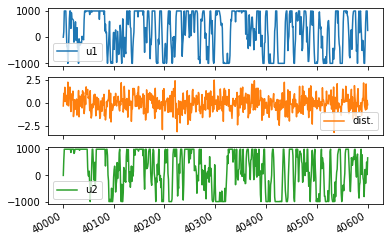

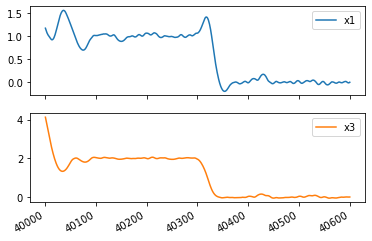

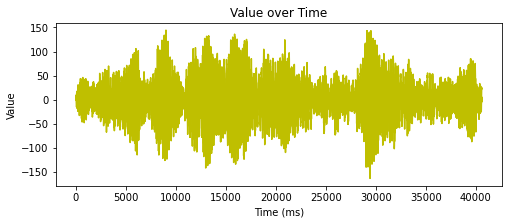

In [ ]:
#max(df[{'diff1'}].values)
plot_cols = ['u1','dist.','u2']
plot_features = thisishistory[plot_cols][-600:]
_ = plot_features.plot(subplots=True)
plot_out= ['x1','x3']
plot_features = thisishistory[plot_out][-600:]
_ = plot_features.plot(subplots=True)

plt.figure(figsize=(8,3))
plt.title("Value over Time") 
plt.xlabel("Time (ms)") 
plt.ylabel("Value") 
plt.plot(range(num_sim), savew0[:], 'y')

In [ ]:
thisishistory[2:]

,u1,dist.,u2,x1,x3,diff21,diff23,diff1,diff3
2,229.013742,1.669120,61.239602,0.000464,0.000128,0.000464,0.000128,0.000463,0.000128
3,500.000000,0.059188,72.232584,0.002384,0.000526,0.002383,0.000525,0.001920,0.000397
4,182.693358,1.514620,425.745459,0.005658,0.001921,0.005194,0.001792,0.003274,0.001395
5,78.116198,-0.838642,436.415194,0.009429,0.005035,0.007045,0.004509,0.003771,0.003115
6,-113.846573,-0.517731,365.984028,0.013085,0.009739,0.007427,0.007819,0.003656,0.004704
...,...,...,...,...,...,...,...,...,...
40596,545.208811,-0.779952,-304.612972,-0.008962,0.007558,-0.016553,-0.003056,-0.007786,-0.001503
40597,1000.000000,2.055010,74.273484,-0.013300,0.005897,-0.012123,-0.003164,-0.004338,-0.001661
40598,1000.000000,-0.702575,509.324539,-0.013186,0.005794,-0.004223,-0.001764,0.000114,-0.000103
40599,1000.000000,0.258111,30.515123,-0.008545,0.007243,0.004755,0.001346,0.004640,0.001449


In [ ]:
multi_resdense_model.save_weights('./checkpoints/1611changemassnodistchangerefreinf_startsim40000_train500-250_batch16sim300-1000-1000-pen5')